In [1]:
import os
import sys
sys.path.append('/mnt/mnt/5TB_slot2/Tobias')
sys.path.append('/mnt/mnt/5TB_slot2/Tobias/TobiasPy/fastMRI')
sys.path.append('/mnt/mnt/4TB_pcie/fastBrain/')
import h5py
import numpy as np
import numpy.fft as nf
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader
from models.unet.unet_model import UnetModel as UnetModel
from FF_net import FF_net
from FF_net import FF_simple_net
import argparse
from common.args import Args
import models.unet.run_unet  as Run
import torch.nn as nn
import logging
import pathlib
import random
from torch.utils.data import Dataset
import time
from torch.nn import functional as F
import shutil
from tensorboardX import SummaryWriter
import torchvision
from torchvision import transforms, utils
import net_utils as nu
import calendar
import datetime

import sigpy as sp
import sigpy.plot as pl
import vd_spiral

from wrap_net import wrap_net
print(torch.__version__)
print(torch.cuda.device_count())
%load_ext autoreload
%autoreload 2

1.5.0+cu101
4


In [2]:
sys.argv=['']
def create_arg_parser():
    timestamp = calendar.timegm(time.gmtime())
    human_readable = datetime.datetime.fromtimestamp(timestamp).isoformat()
    parser = argparse.ArgumentParser(description="ML parameters")
    parser.add_argument('--num-pools', type=int, default=4, help='Number of U-Net pooling layers')
    parser.add_argument('--drop-prob', type=float, default=0.0, help='Dropout probability')
    parser.add_argument('--num-chans', type=int, default=32, help='Number of U-Net channels')

    parser.add_argument('--batch-size', default=32, type=int, help='Mini batch size')
    parser.add_argument('--num-epochs', type=int, default=3000, help='Number of training epochs')
    parser.add_argument('--lr', type=float, default=0.01, help='Learning rate')
    parser.add_argument('--lr-step-size', type=int, default=100,
                        help='Period of learning rate decay')
    parser.add_argument('--lr-gamma', type=float, default=0.1,
                        help='Multiplicative factor of learning rate decay')
    parser.add_argument('--weight-decay', type=float, default=0.0001,
                        help='Strength of weight decay regularization')

    parser.add_argument('--report-interval', type=int, default=100, help='Period of loss reporting')
    parser.add_argument('--data-parallel', default=True,
                        help='If set, use multiple GPUs using data parallelism')
    parser.add_argument('--device', type=str, default='cuda',
                        help='Which device to train on. Set to "cuda" to use the GPU')
    parser.add_argument('--exp-dir', type=pathlib.Path, default='/mnt/mnt/5TB_slot2/Tobias/Thesis/FF_lrelue_'+str(human_readable),
                        help='Path where model and results should be saved')
    parser.add_argument('--resume', action='store_true', default=False,
                        help='If set, resume the training from a previous model checkpoint. '
                             '"--checkpoint" should be set with this')
    parser.add_argument('--checkpoint', type=str, default='/mnt/mnt/5TB_slot2/Tobias/Thesis/FF_lrelu_f/best_model.pt',
                        help='Path to an existing checkpoint. Used along with "--resume"')
    parser.add_argument('--logdir', type=str, default='/mnt/mnt/5TB_slot2/Tobias/Thesis/log/ff_lreluu_'+str(human_readable),
                        help='Path to an existing checkpoint. Used along with "--resume"')
    parser.add_argument('--seed', default=42, type=int, help='Seed for random number generators')
    parser.add_argument('--resolution', default=320, type=int, help='Resolution of images')
    parser.add_argument('--device_ids', default=[1] , help='GPUS used')
    return parser
args=create_arg_parser().parse_args()

In [3]:
class SliceData(Dataset):
    """
    A PyTorch Dataset that provides access to MR image slices.
    """
    
    def __init__(self, root="/mnt/mnt/5TB_slot2/fastMRI/multicoil_train", sample_rate=1.):
        self.examples = []
        #potential to apply pre-process transform
        files = list(pathlib.Path(root).iterdir())
        if sample_rate < 1:
            #random.shuffle(files)
            num_files = round(len(files) * sample_rate)
            files = files[:num_files]
        for fname in sorted(files):
            print(fname)
            try:
                #print(h5py.File(fname, 'r').keys())
                #maybe also only randomly select parts of slices. Otherwise lot of outer noise-like structures.
                xml = h5py.File(fname, 'r')['ismrmrd_header']
                kspace = h5py.File(fname, 'r')['kspace']
                num_slices = kspace.shape[0]
                num_channels=kspace.shape[1]
                if (kspace.shape[-2]<args.resolution) or (kspace.shape[-1]<args.resolution):# or num_channels!=16:
                    continue
                print(len(self.examples))
                for slice in range(num_slices):
                    print(slice)
                    crop_size = (min(args.resolution, kspace.shape[-2]),min(args.resolution, kspace.shape[-1]))
                    k=nu.center_crop(kspace[slice], crop_size)
                    #full=to_tensor(np.array([make_ft(rsos(make_ift(k),0)) for i in range(k.shape[0])]))
                    target=np.abs(nu.make_ft(nu.rsos(nu.make_ift(k),0)))
                    full=nu.to_tensor(k)
                    self.examples += [(fname, slice, full, target)]
            except:
                print("Couldn't open file")

    def __len__(self):
        return len(self.examples)
    
    def __getitem__(self, i):
        fname, slice, f, t = self.examples[i]
#         with h5py.File(fname, 'r') as data:
#             full=to_tensor(data['kspace'][slice])
#             crop_size = (min(args.resolution, full.shape[-3]),min(args.resolution, full.shape[-2]))          
#             full=complex_center_crop(full,crop_size)
            
#             kspace = to_tensor(data['kspace'][slice])
#             crop_size = (min(args.resolution, kspace.shape[-3]), min(args.resolution, kspace.shape[-2]))
#             kspace=apply_mask(kspace)[0]
#             kspace = complex_center_crop(kspace, crop_size)
            
        return (f, t)

In [4]:
def create_data_loaders():
    #batch_size=32
    #mask_func = None
    #if args.mask_kspace:
    #    mask_func = MaskFunc(args.center_fractions, args.accelerations)
    train_data = SliceData(root="/mnt/mnt/4TB_pcie/fastBrain/multicoil_train",sample_rate=0.5)
    dev_data = SliceData(root="/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain",sample_rate=0.5)
    test_data = SliceData(root="/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain",sample_rate=0.5)
    train_loader = DataLoader(
        dataset=train_data,
        batch_size=args.batch_size,
        shuffle=True,
        num_workers=0,
        pin_memory=True,
    )
    dev_loader = DataLoader(
        dataset=dev_data,
        batch_size=args.batch_size,
        num_workers=0,
        pin_memory=True,
    )
    test_loader=None
#     test_loader = DataLoader(
#         dataset=test_data,
#         num_workers=0,
#         pin_memory=True,
#     )
    return train_loader, dev_loader, test_loader

In [5]:
t=time.time()
train_loader, dev_loader, test_loader= create_data_loaders()
print("Time taken to load data: ",time.time()-t)

/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002428.h5
0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002429.h5
4480
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002442.h5
9600
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002452.h5
14720
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002458.h5
19840
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002466.h5
24960
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002469.h5
30080
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002474.h5
35200
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoi

5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_202_6000421.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_202_6000424.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_202_6000428.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_202_6000431.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_202_6000436.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_202_6000437.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_202_6000469.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_202_6000474.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_202_6000477.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_202_6000480.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_202_6000483.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_202_6000489.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoi

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_2000471.h5
490880
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_2000474.h5
496000
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_2000479.h5
501120
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_2000481.h5
506240
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_2000484.h5
511360
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_2000486.h5
516480
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_2000488.h5
521600
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_2000496.h5
526720
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt

2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_6002235.h5
843520
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_6002238.h5
848640
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_6002240.h5
853760
0
1
2
3
4
5
6
7
8
9
10
11
12
13
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_6002242.h5
858240
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_6002246.h5
863360
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090155.h5
868480
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090156.h5
873600
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090159.h5
878720
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB

15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_6001003.h5
1188480
0
1
2
3
4
5
6
7
8
9
10
11
12
13
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_6001023.h5
1192960
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_6001025.h5
1198080
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_6001030.h5
1203200
0
1
2
3
4
5
6
7
8
9
10
11
12
13
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_6001040.h5
1207680
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_6001046.h5
1212800
0
1
2
3
4
5
6
7
8
9
10
11
12
13
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_6001050.h5
1217280
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_6001054.h5
1222400
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/fil

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_207_2070321.h5
232320
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_207_2070455.h5
237440
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_207_2070495.h5
242560
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_207_2070506.h5
247680
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_207_2070548.h5
252800
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_207_2070618.h5
257920
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_207_2070682.h5
263040
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_A

2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_2000234.h5
549120
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_2000235.h5
554240
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_2000271.h5
559360
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_2000304.h5
564480
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_2000368.h5
569600
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_2000596.h5
574720
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_6002009.h5
579840
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_6002025.h5
584960
0
1


2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_206_2060032.h5
880640
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_206_2060069.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_206_2060073.h5
885760
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_206_2060091.h5
890880
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_206_6000208.h5
896000
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_206_6000210.h5
901120
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_206_6000244.h5
906240
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_207_2070006.h5
911360
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4T

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_6000988.h5
1212160
0
1
2
3
4
5
6
7
8
9
10
11
12
13
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_6001021.h5
1216640
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_6001065.h5
1221760
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_6001070.h5
1226880
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_6001095.h5
1232000
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_6001143.h5
1237120
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_6001154.h5
1242240
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_6001200.h5
1247360


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_203_6000743.h5
165760
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_203_6000766.h5
170880
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_203_6000790.h5
176000
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_203_6000806.h5
181120
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_203_6000812.h5
186240
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_205_2050073.h5
191360
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1POST_205_2050202.h5
196480
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_A

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1_202_2020549.h5
492800
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1_202_2020553.h5
497920
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1_202_6000277.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1_202_6000357.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1_202_6000368.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1_202_6000457.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1_206_2060052.h5
503040
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT1_206_2120004.h5
508160
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_2000087.h5
513280
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/f

2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_203_2030071.h5
814080
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_203_2030075.h5
819200
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_203_2030129.h5
824320
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_203_2030159.h5
829440
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_203_2030229.h5
834560
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_204_2040037.h5
839680
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_205_2050103.h5
844800
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_205_2050105.h5
849920
0
1


2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_2090150.h5
1145600
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_2090197.h5
1150720
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_2090245.h5
1155840
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_2090255.h5
1160960
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_2090256.h5
1166080
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_2090260.h5
1171200
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_2090309.h5
1176320
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_2090343.h5
1181

In [6]:
def build_model(args,chans=32,num_pool_layers=4,drop_prob=0.05):
    #check every time which gpus are available!
    #device_ids=[2,3,1]
    device_ids=args.device_ids
    model=FF_net(640).to(f'{args.device}:{args.device_ids[0]}')
    if args.data_parallel and args.device=="cuda":
        model = nn.DataParallel(model,device_ids=device_ids)
    print("Model build successfully")
    return model

def build_optim(args,params):
    optimizer = torch.optim.Adadelta(params)
    return optimizer

def load_model(checkpoint_file,args):
    checkpoint = torch.load(checkpoint_file)
    args = checkpoint['args']
    model = build_model(args)
    model.load_state_dict(checkpoint['model'])

    optimizer = build_optim(args, model.parameters())
    optimizer.load_state_dict(checkpoint['optimizer'])
    print("Model load successfully")
    return checkpoint, model, optimizer

def save_model(args, exp_dir, epoch, model, optimizer, best_dev_loss, is_new_best):
    torch.save(
        {
            'epoch': epoch,
            'args': args,
            'model': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            'best_dev_loss': best_dev_loss,
            'exp_dir': exp_dir
        },
        f=exp_dir / 'model.pt'
    )
    if is_new_best:
        shutil.copyfile(exp_dir / 'model.pt', exp_dir / 'best_model.pt')
        
def visualize(args, epoch, model, data_loader, writer):
    def save_image(image, tag):
        image -= image.min()
        image /= image.max()
        grid = torchvision.utils.make_grid(image, nrow=4, pad_value=1)
        writer.add_image(tag, grid, epoch)
    model.eval()
    
    with torch.no_grad():
        for iter, data in enumerate(data_loader):
            input, target = data
            input = input.unsqueeze(1).to(f'{args.device}:{args.device_ids[0]}')
            target = target.unsqueeze(1).to(f'{args.device}:{args.device_ids[0]}')
            output = model(input)
            save_image(target[0,:,:], 'Target')
            save_image(output[0,:,:], 'Reconstruction')
            save_image(torch.abs(target - output)[0,:,:], 'Error')
            break

In [7]:
def train_epoch(args, epoch, model, data_loader, optimizer, writer):
    model.train()
    avg_loss = 0.
    start_epoch = start_iter = time.perf_counter()
    global_step = epoch * len(data_loader)
    for iter, data in enumerate(data_loader):
        f, t = data
        input = f.unsqueeze(1).to(f'{args.device}:{model.device_ids[0]}')
        target = t.to(f'{args.device}:{model.device_ids[0]}')
        output = model(input).squeeze(1)
        
        loss = F.l1_loss(output, target)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        avg_loss = 0.99 * avg_loss + 0.01 * loss.item() if iter > 0 else loss.item()
        writer.add_scalar('TrainLoss', loss.item(), global_step + iter)

        if iter % args.report_interval == 0:
            print(f'Epoch = [{epoch:3d}/{args.num_epochs:3d}] ',
                f'Iter = [{iter:4d}/{len(data_loader):4d}] ',
                f'Loss = {loss.item():.4g} Avg Loss = {avg_loss:.4g} ',
                f'Time = {time.perf_counter() - start_iter:.4f}s')
            logging.info(
                f'Epoch = [{epoch:3d}/{args.num_epochs:3d}] '
                f'Iter = [{iter:4d}/{len(data_loader):4d}] '
                f'Loss = {loss.item():.4g} Avg Loss = {avg_loss:.4g} '
                f'Time = {time.perf_counter() - start_iter:.4f}s',
            )
        start_iter = time.perf_counter()
    return avg_loss, time.perf_counter() - start_epoch

def evaluate(args, epoch, model, data_loader, writer):
    model.eval()
    losses = []
    start = time.perf_counter()
    with torch.no_grad():
        for iter, data in enumerate(data_loader):
            f, t = data
            input = f.unsqueeze(1).to(f'{args.device}:{model.device_ids[0]}')
            target = t.to(f'{args.device}:{model.device_ids[0]}')
            output = model(input).squeeze(1)

            #mean = mean.unsqueeze(1).unsqueeze(2).to(args.device)
            #std = std.unsqueeze(1).unsqueeze(2).to(args.device)
            #target = target * std + mean
            #output = output * std + mean

            #norm = norm.unsqueeze(1).unsqueeze(2).to(args.device)
            #loss = F.mse_loss(output / norm, target / norm, size_average=False)
            loss = F.l1_loss(output, target)
            losses.append(loss.item())
        writer.add_scalar('Dev_Loss', np.mean(losses), epoch)
        print('Dev_Loss', np.mean(losses),'Epoch', epoch)
    return np.mean(losses), time.perf_counter() - start

[autoreload of FF_net failed: Traceback (most recent call last):
  File "/opt/conda/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/opt/conda/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 450, in superreload
    update_generic(old_obj, new_obj)
  File "/opt/conda/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 387, in update_generic
    update(a, b)
  File "/opt/conda/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 357, in update_class
    update_instances(old, new)
  File "/opt/conda/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 312, in update_instances
    update_instances(old, new, obj.__dict__, visited)
  File "/opt/conda/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 312, in update_instances
    update_instances(old, new, obj.__dict__, visited)
  File "/opt/conda/lib/python3.6/site-packages/

Model build successfully
Epoch = [  0/3000]  Iter = [   0/39480]  Loss = 0.2172 Avg Loss = 0.2172  Time = 0.1372s
Epoch = [  0/3000]  Iter = [ 100/39480]  Loss = 0.2747 Avg Loss = 0.2998  Time = 0.0034s
Epoch = [  0/3000]  Iter = [ 200/39480]  Loss = 0.2768 Avg Loss = 0.2625  Time = 0.0027s
Epoch = [  0/3000]  Iter = [ 300/39480]  Loss = 0.2159 Avg Loss = 0.2443  Time = 0.0045s
Epoch = [  0/3000]  Iter = [ 400/39480]  Loss = 0.2262 Avg Loss = 0.2328  Time = 0.0032s
Epoch = [  0/3000]  Iter = [ 500/39480]  Loss = 0.2189 Avg Loss = 0.2263  Time = 0.0031s
Epoch = [  0/3000]  Iter = [ 600/39480]  Loss = 0.2138 Avg Loss = 0.2203  Time = 0.0031s
Epoch = [  0/3000]  Iter = [ 700/39480]  Loss = 0.2196 Avg Loss = 0.2156  Time = 0.0029s
Epoch = [  0/3000]  Iter = [ 800/39480]  Loss = 0.2428 Avg Loss = 0.2148  Time = 0.0029s
Epoch = [  0/3000]  Iter = [ 900/39480]  Loss = 0.2057 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [  0/3000]  Iter = [1000/39480]  Loss = 0.3153 Avg Loss = 0.222  Time = 0.003

Epoch = [  0/3000]  Iter = [9200/39480]  Loss = 0.2195 Avg Loss = 0.2201  Time = 0.0030s
Epoch = [  0/3000]  Iter = [9300/39480]  Loss = 0.2534 Avg Loss = 0.2192  Time = 0.0033s
Epoch = [  0/3000]  Iter = [9400/39480]  Loss = 0.1903 Avg Loss = 0.2215  Time = 0.0026s
Epoch = [  0/3000]  Iter = [9500/39480]  Loss = 0.2364 Avg Loss = 0.2203  Time = 0.0030s
Epoch = [  0/3000]  Iter = [9600/39480]  Loss = 0.2047 Avg Loss = 0.2229  Time = 0.0030s
Epoch = [  0/3000]  Iter = [9700/39480]  Loss = 0.2063 Avg Loss = 0.2132  Time = 0.0030s
Epoch = [  0/3000]  Iter = [9800/39480]  Loss = 0.2318 Avg Loss = 0.2198  Time = 0.0029s
Epoch = [  0/3000]  Iter = [9900/39480]  Loss = 0.1975 Avg Loss = 0.2145  Time = 0.0028s
Epoch = [  0/3000]  Iter = [10000/39480]  Loss = 0.2045 Avg Loss = 0.2181  Time = 0.0032s
Epoch = [  0/3000]  Iter = [10100/39480]  Loss = 0.2108 Avg Loss = 0.216  Time = 0.0030s
Epoch = [  0/3000]  Iter = [10200/39480]  Loss = 0.2115 Avg Loss = 0.2185  Time = 0.0030s
Epoch = [  0/3000] 

Epoch = [  0/3000]  Iter = [18400/39480]  Loss = 0.2365 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [  0/3000]  Iter = [18500/39480]  Loss = 0.2091 Avg Loss = 0.2137  Time = 0.0032s
Epoch = [  0/3000]  Iter = [18600/39480]  Loss = 0.1934 Avg Loss = 0.2182  Time = 0.0031s
Epoch = [  0/3000]  Iter = [18700/39480]  Loss = 0.1941 Avg Loss = 0.2154  Time = 0.0029s
Epoch = [  0/3000]  Iter = [18800/39480]  Loss = 0.1928 Avg Loss = 0.2164  Time = 0.0032s
Epoch = [  0/3000]  Iter = [18900/39480]  Loss = 0.216 Avg Loss = 0.2198  Time = 0.0032s
Epoch = [  0/3000]  Iter = [19000/39480]  Loss = 0.2074 Avg Loss = 0.2152  Time = 0.0033s
Epoch = [  0/3000]  Iter = [19100/39480]  Loss = 0.265 Avg Loss = 0.216  Time = 0.0032s
Epoch = [  0/3000]  Iter = [19200/39480]  Loss = 0.2256 Avg Loss = 0.215  Time = 0.0031s
Epoch = [  0/3000]  Iter = [19300/39480]  Loss = 0.174 Avg Loss = 0.2179  Time = 0.0048s
Epoch = [  0/3000]  Iter = [19400/39480]  Loss = 0.2294 Avg Loss = 0.216  Time = 0.0032s
Epoch = [  0/300

Epoch = [  0/3000]  Iter = [27600/39480]  Loss = 0.224 Avg Loss = 0.216  Time = 0.0029s
Epoch = [  0/3000]  Iter = [27700/39480]  Loss = 0.2422 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [  0/3000]  Iter = [27800/39480]  Loss = 0.2558 Avg Loss = 0.2183  Time = 0.0030s
Epoch = [  0/3000]  Iter = [27900/39480]  Loss = 0.2126 Avg Loss = 0.2194  Time = 0.0032s
Epoch = [  0/3000]  Iter = [28000/39480]  Loss = 0.204 Avg Loss = 0.2159  Time = 0.0032s
Epoch = [  0/3000]  Iter = [28100/39480]  Loss = 0.1832 Avg Loss = 0.2203  Time = 0.0033s
Epoch = [  0/3000]  Iter = [28200/39480]  Loss = 0.2481 Avg Loss = 0.217  Time = 0.0031s
Epoch = [  0/3000]  Iter = [28300/39480]  Loss = 0.2119 Avg Loss = 0.2186  Time = 0.0056s
Epoch = [  0/3000]  Iter = [28400/39480]  Loss = 0.2084 Avg Loss = 0.2171  Time = 0.0024s
Epoch = [  0/3000]  Iter = [28500/39480]  Loss = 0.2326 Avg Loss = 0.2208  Time = 0.0025s
Epoch = [  0/3000]  Iter = [28600/39480]  Loss = 0.2353 Avg Loss = 0.2171  Time = 0.0024s
Epoch = [  0/3

Epoch = [  0/3000]  Iter = [36800/39480]  Loss = 0.2313 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [  0/3000]  Iter = [36900/39480]  Loss = 0.2096 Avg Loss = 0.2216  Time = 0.0030s
Epoch = [  0/3000]  Iter = [37000/39480]  Loss = 0.2183 Avg Loss = 0.2197  Time = 0.0042s
Epoch = [  0/3000]  Iter = [37100/39480]  Loss = 0.2002 Avg Loss = 0.2158  Time = 0.0033s
Epoch = [  0/3000]  Iter = [37200/39480]  Loss = 0.217 Avg Loss = 0.2188  Time = 0.0028s
Epoch = [  0/3000]  Iter = [37300/39480]  Loss = 0.2146 Avg Loss = 0.2183  Time = 0.0077s
Epoch = [  0/3000]  Iter = [37400/39480]  Loss = 0.2161 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [  0/3000]  Iter = [37500/39480]  Loss = 0.2049 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [  0/3000]  Iter = [37600/39480]  Loss = 0.2049 Avg Loss = 0.2132  Time = 0.0033s
Epoch = [  0/3000]  Iter = [37700/39480]  Loss = 0.2195 Avg Loss = 0.2175  Time = 0.0025s
Epoch = [  0/3000]  Iter = [37800/39480]  Loss = 0.1819 Avg Loss = 0.2188  Time = 0.0032s
Epoch = [  

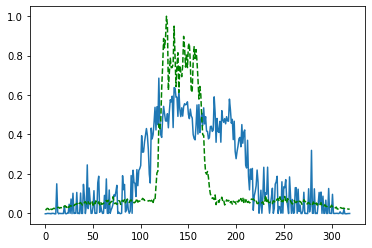

Time taken for epoch:  150.442364692688
Epoch = [  1/3000]  Iter = [   0/39480]  Loss = 0.2336 Avg Loss = 0.2336  Time = 0.0872s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [  1/3000]  Iter = [ 100/39480]  Loss = 0.2354 Avg Loss = 0.2219  Time = 0.0030s
Epoch = [  1/3000]  Iter = [ 200/39480]  Loss = 0.2187 Avg Loss = 0.221  Time = 0.0030s
Epoch = [  1/3000]  Iter = [ 300/39480]  Loss = 0.2292 Avg Loss = 0.217  Time = 0.0028s
Epoch = [  1/3000]  Iter = [ 400/39480]  Loss = 0.2254 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [  1/3000]  Iter = [ 500/39480]  Loss = 0.1849 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [  1/3000]  Iter = [ 600/39480]  Loss = 0.2172 Avg Loss = 0.2236  Time = 0.0032s
Epoch = [  1/3000]  Iter = [ 700/39480]  Loss = 0.1951 Avg Loss = 0.22  Time = 0.0030s
Epoch = [  1/3000]  Iter = [ 800/39480]  Loss = 0.1934 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [  1/3000]  Iter = [ 900/39480]  Loss = 0.1788 Avg Loss = 0.2161  Time = 0.0031s
Epoch = [  1/3000]  Iter = [1000/39480]  Loss = 0.2283 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [  1/3000]  Iter = [1100/39480]  Loss = 0.2017 Avg Loss = 0.2138  Time = 0.0030s
Epoch = [  1/3000]  Iter 

Epoch = [  1/3000]  Iter = [9400/39480]  Loss = 0.2063 Avg Loss = 0.2179  Time = 0.0031s
Epoch = [  1/3000]  Iter = [9500/39480]  Loss = 0.2427 Avg Loss = 0.2211  Time = 0.0032s
Epoch = [  1/3000]  Iter = [9600/39480]  Loss = 0.2321 Avg Loss = 0.2155  Time = 0.0030s
Epoch = [  1/3000]  Iter = [9700/39480]  Loss = 0.2331 Avg Loss = 0.2199  Time = 0.0030s
Epoch = [  1/3000]  Iter = [9800/39480]  Loss = 0.2387 Avg Loss = 0.2223  Time = 0.0047s
Epoch = [  1/3000]  Iter = [9900/39480]  Loss = 0.237 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [  1/3000]  Iter = [10000/39480]  Loss = 0.2488 Avg Loss = 0.2218  Time = 0.0035s
Epoch = [  1/3000]  Iter = [10100/39480]  Loss = 0.2019 Avg Loss = 0.2195  Time = 0.0035s
Epoch = [  1/3000]  Iter = [10200/39480]  Loss = 0.2055 Avg Loss = 0.2163  Time = 0.0035s
Epoch = [  1/3000]  Iter = [10300/39480]  Loss = 0.2249 Avg Loss = 0.2206  Time = 0.0035s
Epoch = [  1/3000]  Iter = [10400/39480]  Loss = 0.2455 Avg Loss = 0.215  Time = 0.0035s
Epoch = [  1/3000]

Epoch = [  1/3000]  Iter = [18600/39480]  Loss = 0.2412 Avg Loss = 0.2175  Time = 0.0027s
Epoch = [  1/3000]  Iter = [18700/39480]  Loss = 0.2531 Avg Loss = 0.2164  Time = 0.0030s
Epoch = [  1/3000]  Iter = [18800/39480]  Loss = 0.2011 Avg Loss = 0.2205  Time = 0.0030s
Epoch = [  1/3000]  Iter = [18900/39480]  Loss = 0.2366 Avg Loss = 0.222  Time = 0.0029s
Epoch = [  1/3000]  Iter = [19000/39480]  Loss = 0.2472 Avg Loss = 0.2217  Time = 0.0028s
Epoch = [  1/3000]  Iter = [19100/39480]  Loss = 0.1892 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [  1/3000]  Iter = [19200/39480]  Loss = 0.2514 Avg Loss = 0.2199  Time = 0.0032s
Epoch = [  1/3000]  Iter = [19300/39480]  Loss = 0.1915 Avg Loss = 0.2174  Time = 0.0029s
Epoch = [  1/3000]  Iter = [19400/39480]  Loss = 0.2177 Avg Loss = 0.2161  Time = 0.0029s
Epoch = [  1/3000]  Iter = [19500/39480]  Loss = 0.1753 Avg Loss = 0.2162  Time = 0.0029s
Epoch = [  1/3000]  Iter = [19600/39480]  Loss = 0.2444 Avg Loss = 0.218  Time = 0.0029s
Epoch = [  1

Epoch = [  1/3000]  Iter = [27800/39480]  Loss = 0.2063 Avg Loss = 0.2162  Time = 0.0029s
Epoch = [  1/3000]  Iter = [27900/39480]  Loss = 0.2399 Avg Loss = 0.2176  Time = 0.0028s
Epoch = [  1/3000]  Iter = [28000/39480]  Loss = 0.2198 Avg Loss = 0.2168  Time = 0.0029s
Epoch = [  1/3000]  Iter = [28100/39480]  Loss = 0.2503 Avg Loss = 0.219  Time = 0.0029s
Epoch = [  1/3000]  Iter = [28200/39480]  Loss = 0.203 Avg Loss = 0.2169  Time = 0.0029s
Epoch = [  1/3000]  Iter = [28300/39480]  Loss = 0.2023 Avg Loss = 0.2169  Time = 0.0029s
Epoch = [  1/3000]  Iter = [28400/39480]  Loss = 0.2155 Avg Loss = 0.2159  Time = 0.0029s
Epoch = [  1/3000]  Iter = [28500/39480]  Loss = 0.259 Avg Loss = 0.2202  Time = 0.0029s
Epoch = [  1/3000]  Iter = [28600/39480]  Loss = 0.2308 Avg Loss = 0.2173  Time = 0.0032s
Epoch = [  1/3000]  Iter = [28700/39480]  Loss = 0.2021 Avg Loss = 0.2208  Time = 0.0029s
Epoch = [  1/3000]  Iter = [28800/39480]  Loss = 0.2173 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [  1/

Epoch = [  1/3000]  Iter = [37000/39480]  Loss = 0.2204 Avg Loss = 0.2201  Time = 0.0034s
Epoch = [  1/3000]  Iter = [37100/39480]  Loss = 0.2333 Avg Loss = 0.2177  Time = 0.0033s
Epoch = [  1/3000]  Iter = [37200/39480]  Loss = 0.2 Avg Loss = 0.2204  Time = 0.0031s
Epoch = [  1/3000]  Iter = [37300/39480]  Loss = 0.2301 Avg Loss = 0.2176  Time = 0.0032s
Epoch = [  1/3000]  Iter = [37400/39480]  Loss = 0.228 Avg Loss = 0.22  Time = 0.0032s
Epoch = [  1/3000]  Iter = [37500/39480]  Loss = 0.304 Avg Loss = 0.2191  Time = 0.0032s
Epoch = [  1/3000]  Iter = [37600/39480]  Loss = 0.218 Avg Loss = 0.2198  Time = 0.0032s
Epoch = [  1/3000]  Iter = [37700/39480]  Loss = 0.2218 Avg Loss = 0.2218  Time = 0.0048s
Epoch = [  1/3000]  Iter = [37800/39480]  Loss = 0.1927 Avg Loss = 0.2229  Time = 0.0034s
Epoch = [  1/3000]  Iter = [37900/39480]  Loss = 0.22 Avg Loss = 0.2156  Time = 0.0029s
Epoch = [  1/3000]  Iter = [38000/39480]  Loss = 0.2035 Avg Loss = 0.2168  Time = 0.0029s
Epoch = [  1/3000]  

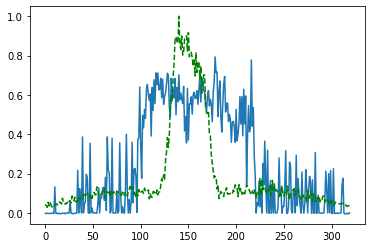

Time taken for epoch:  141.9487714767456
Epoch = [  2/3000]  Iter = [   0/39480]  Loss = 0.2016 Avg Loss = 0.2016  Time = 0.1014s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [  2/3000]  Iter = [ 100/39480]  Loss = 0.2553 Avg Loss = 0.2142  Time = 0.0029s
Epoch = [  2/3000]  Iter = [ 200/39480]  Loss = 0.2229 Avg Loss = 0.2138  Time = 0.0031s
Epoch = [  2/3000]  Iter = [ 300/39480]  Loss = 0.2555 Avg Loss = 0.2168  Time = 0.0032s
Epoch = [  2/3000]  Iter = [ 400/39480]  Loss = 0.2093 Avg Loss = 0.2178  Time = 0.0031s
Epoch = [  2/3000]  Iter = [ 500/39480]  Loss = 0.247 Avg Loss = 0.2136  Time = 0.0031s
Epoch = [  2/3000]  Iter = [ 600/39480]  Loss = 0.203 Avg Loss = 0.2157  Time = 0.0030s
Epoch = [  2/3000]  Iter = [ 700/39480]  Loss = 0.2416 Avg Loss = 0.2171  Time = 0.0030s
Epoch = [  2/3000]  Iter = [ 800/39480]  Loss = 0.2338 Avg Loss = 0.2146  Time = 0.0030s
Epoch = [  2/3000]  Iter = [ 900/39480]  Loss = 0.2182 Avg Loss = 0.2203  Time = 0.0029s
Epoch = [  2/3000]  Iter = [1000/39480]  Loss = 0.2112 Avg Loss = 0.2208  Time = 0.0033s
Epoch = [  2/3000]  Iter = [1100/39480]  Loss = 0.2413 Avg Loss = 0.2227  Time = 0.0032s
Epoch = [  2/3000]  Ite

Epoch = [  2/3000]  Iter = [9400/39480]  Loss = 0.2705 Avg Loss = 0.2208  Time = 0.0020s
Epoch = [  2/3000]  Iter = [9500/39480]  Loss = 0.2157 Avg Loss = 0.2218  Time = 0.0034s
Epoch = [  2/3000]  Iter = [9600/39480]  Loss = 0.2782 Avg Loss = 0.2148  Time = 0.0022s
Epoch = [  2/3000]  Iter = [9700/39480]  Loss = 0.255 Avg Loss = 0.2197  Time = 0.0045s
Epoch = [  2/3000]  Iter = [9800/39480]  Loss = 0.2579 Avg Loss = 0.2179  Time = 0.0028s
Epoch = [  2/3000]  Iter = [9900/39480]  Loss = 0.2637 Avg Loss = 0.2216  Time = 0.0027s
Epoch = [  2/3000]  Iter = [10000/39480]  Loss = 0.2244 Avg Loss = 0.2155  Time = 0.0019s
Epoch = [  2/3000]  Iter = [10100/39480]  Loss = 0.2039 Avg Loss = 0.2181  Time = 0.0025s
Epoch = [  2/3000]  Iter = [10200/39480]  Loss = 0.244 Avg Loss = 0.2207  Time = 0.0027s
Epoch = [  2/3000]  Iter = [10300/39480]  Loss = 0.2014 Avg Loss = 0.2209  Time = 0.0031s
Epoch = [  2/3000]  Iter = [10400/39480]  Loss = 0.2191 Avg Loss = 0.2195  Time = 0.0024s
Epoch = [  2/3000]

Epoch = [  2/3000]  Iter = [18600/39480]  Loss = 0.2303 Avg Loss = 0.22  Time = 0.0032s
Epoch = [  2/3000]  Iter = [18700/39480]  Loss = 0.2084 Avg Loss = 0.2146  Time = 0.0091s
Epoch = [  2/3000]  Iter = [18800/39480]  Loss = 0.2031 Avg Loss = 0.2175  Time = 0.0043s
Epoch = [  2/3000]  Iter = [18900/39480]  Loss = 0.2195 Avg Loss = 0.2173  Time = 0.0027s
Epoch = [  2/3000]  Iter = [19000/39480]  Loss = 0.2624 Avg Loss = 0.2195  Time = 0.0031s
Epoch = [  2/3000]  Iter = [19100/39480]  Loss = 0.2177 Avg Loss = 0.2158  Time = 0.0032s
Epoch = [  2/3000]  Iter = [19200/39480]  Loss = 0.2521 Avg Loss = 0.2171  Time = 0.0032s
Epoch = [  2/3000]  Iter = [19300/39480]  Loss = 0.1943 Avg Loss = 0.2157  Time = 0.0037s
Epoch = [  2/3000]  Iter = [19400/39480]  Loss = 0.231 Avg Loss = 0.2207  Time = 0.0031s
Epoch = [  2/3000]  Iter = [19500/39480]  Loss = 0.1921 Avg Loss = 0.2152  Time = 0.0043s
Epoch = [  2/3000]  Iter = [19600/39480]  Loss = 0.2149 Avg Loss = 0.2149  Time = 0.0045s
Epoch = [  2/

Epoch = [  2/3000]  Iter = [27800/39480]  Loss = 0.2133 Avg Loss = 0.2181  Time = 0.0032s
Epoch = [  2/3000]  Iter = [27900/39480]  Loss = 0.1906 Avg Loss = 0.2166  Time = 0.0031s
Epoch = [  2/3000]  Iter = [28000/39480]  Loss = 0.2223 Avg Loss = 0.222  Time = 0.0030s
Epoch = [  2/3000]  Iter = [28100/39480]  Loss = 0.2076 Avg Loss = 0.2163  Time = 0.0029s
Epoch = [  2/3000]  Iter = [28200/39480]  Loss = 0.1801 Avg Loss = 0.2158  Time = 0.0030s
Epoch = [  2/3000]  Iter = [28300/39480]  Loss = 0.2007 Avg Loss = 0.2139  Time = 0.0032s
Epoch = [  2/3000]  Iter = [28400/39480]  Loss = 0.2089 Avg Loss = 0.2173  Time = 0.0036s
Epoch = [  2/3000]  Iter = [28500/39480]  Loss = 0.2147 Avg Loss = 0.2162  Time = 0.0032s
Epoch = [  2/3000]  Iter = [28600/39480]  Loss = 0.2443 Avg Loss = 0.2213  Time = 0.0030s
Epoch = [  2/3000]  Iter = [28700/39480]  Loss = 0.1989 Avg Loss = 0.2168  Time = 0.0032s
Epoch = [  2/3000]  Iter = [28800/39480]  Loss = 0.2328 Avg Loss = 0.2171  Time = 0.0034s
Epoch = [  

Epoch = [  2/3000]  Iter = [37000/39480]  Loss = 0.203 Avg Loss = 0.2158  Time = 0.0039s
Epoch = [  2/3000]  Iter = [37100/39480]  Loss = 0.1931 Avg Loss = 0.2171  Time = 0.0024s
Epoch = [  2/3000]  Iter = [37200/39480]  Loss = 0.2069 Avg Loss = 0.2184  Time = 0.0036s
Epoch = [  2/3000]  Iter = [37300/39480]  Loss = 0.2123 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [  2/3000]  Iter = [37400/39480]  Loss = 0.1905 Avg Loss = 0.2173  Time = 0.0034s
Epoch = [  2/3000]  Iter = [37500/39480]  Loss = 0.201 Avg Loss = 0.2184  Time = 0.0030s
Epoch = [  2/3000]  Iter = [37600/39480]  Loss = 0.1925 Avg Loss = 0.2158  Time = 0.0030s
Epoch = [  2/3000]  Iter = [37700/39480]  Loss = 0.2014 Avg Loss = 0.2189  Time = 0.0027s
Epoch = [  2/3000]  Iter = [37800/39480]  Loss = 0.2043 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [  2/3000]  Iter = [37900/39480]  Loss = 0.2363 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [  2/3000]  Iter = [38000/39480]  Loss = 0.2602 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [  2

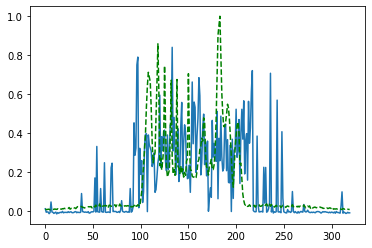

Time taken for epoch:  153.90858507156372
Epoch = [  3/3000]  Iter = [   0/39480]  Loss = 0.2091 Avg Loss = 0.2091  Time = 0.1204s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [  3/3000]  Iter = [ 100/39480]  Loss = 0.2368 Avg Loss = 0.2138  Time = 0.0033s
Epoch = [  3/3000]  Iter = [ 200/39480]  Loss = 0.3244 Avg Loss = 0.2197  Time = 0.0030s
Epoch = [  3/3000]  Iter = [ 300/39480]  Loss = 0.1883 Avg Loss = 0.2181  Time = 0.0033s
Epoch = [  3/3000]  Iter = [ 400/39480]  Loss = 0.2327 Avg Loss = 0.2186  Time = 0.0034s
Epoch = [  3/3000]  Iter = [ 500/39480]  Loss = 0.1818 Avg Loss = 0.2164  Time = 0.0034s
Epoch = [  3/3000]  Iter = [ 600/39480]  Loss = 0.2031 Avg Loss = 0.2171  Time = 0.0028s
Epoch = [  3/3000]  Iter = [ 700/39480]  Loss = 0.1933 Avg Loss = 0.2177  Time = 0.0032s
Epoch = [  3/3000]  Iter = [ 800/39480]  Loss = 0.2385 Avg Loss = 0.2245  Time = 0.0031s
Epoch = [  3/3000]  Iter = [ 900/39480]  Loss = 0.1916 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [  3/3000]  Iter = [1000/39480]  Loss = 0.1854 Avg Loss = 0.2172  Time = 0.0033s
Epoch = [  3/3000]  Iter = [1100/39480]  Loss = 0.2246 Avg Loss = 0.2155  Time = 0.0033s
Epoch = [  3/3000]  I

Epoch = [  3/3000]  Iter = [9400/39480]  Loss = 0.2541 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [  3/3000]  Iter = [9500/39480]  Loss = 0.1916 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [  3/3000]  Iter = [9600/39480]  Loss = 0.1875 Avg Loss = 0.2165  Time = 0.0034s
Epoch = [  3/3000]  Iter = [9700/39480]  Loss = 0.2326 Avg Loss = 0.2233  Time = 0.0027s
Epoch = [  3/3000]  Iter = [9800/39480]  Loss = 0.1887 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [  3/3000]  Iter = [9900/39480]  Loss = 0.2216 Avg Loss = 0.2162  Time = 0.0030s
Epoch = [  3/3000]  Iter = [10000/39480]  Loss = 0.1969 Avg Loss = 0.2153  Time = 0.0030s
Epoch = [  3/3000]  Iter = [10100/39480]  Loss = 0.2419 Avg Loss = 0.2175  Time = 0.0031s
Epoch = [  3/3000]  Iter = [10200/39480]  Loss = 0.2294 Avg Loss = 0.2187  Time = 0.0035s
Epoch = [  3/3000]  Iter = [10300/39480]  Loss = 0.2056 Avg Loss = 0.2176  Time = 0.0032s
Epoch = [  3/3000]  Iter = [10400/39480]  Loss = 0.224 Avg Loss = 0.2176  Time = 0.0037s
Epoch = [  3/3000

Epoch = [  3/3000]  Iter = [18600/39480]  Loss = 0.2191 Avg Loss = 0.2181  Time = 0.0030s
Epoch = [  3/3000]  Iter = [18700/39480]  Loss = 0.2163 Avg Loss = 0.2161  Time = 0.0030s
Epoch = [  3/3000]  Iter = [18800/39480]  Loss = 0.2505 Avg Loss = 0.2195  Time = 0.0030s
Epoch = [  3/3000]  Iter = [18900/39480]  Loss = 0.2208 Avg Loss = 0.2211  Time = 0.0031s
Epoch = [  3/3000]  Iter = [19000/39480]  Loss = 0.2505 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [  3/3000]  Iter = [19100/39480]  Loss = 0.196 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [  3/3000]  Iter = [19200/39480]  Loss = 0.2176 Avg Loss = 0.2163  Time = 0.0030s
Epoch = [  3/3000]  Iter = [19300/39480]  Loss = 0.2214 Avg Loss = 0.2187  Time = 0.0032s
Epoch = [  3/3000]  Iter = [19400/39480]  Loss = 0.2162 Avg Loss = 0.2151  Time = 0.0025s
Epoch = [  3/3000]  Iter = [19500/39480]  Loss = 0.2056 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [  3/3000]  Iter = [19600/39480]  Loss = 0.2005 Avg Loss = 0.2167  Time = 0.0033s
Epoch = [  

Epoch = [  3/3000]  Iter = [27800/39480]  Loss = 0.235 Avg Loss = 0.2207  Time = 0.0028s
Epoch = [  3/3000]  Iter = [27900/39480]  Loss = 0.2332 Avg Loss = 0.2203  Time = 0.0032s
Epoch = [  3/3000]  Iter = [28000/39480]  Loss = 0.2137 Avg Loss = 0.2205  Time = 0.0031s
Epoch = [  3/3000]  Iter = [28100/39480]  Loss = 0.2551 Avg Loss = 0.217  Time = 0.0031s
Epoch = [  3/3000]  Iter = [28200/39480]  Loss = 0.2073 Avg Loss = 0.2167  Time = 0.0069s
Epoch = [  3/3000]  Iter = [28300/39480]  Loss = 0.2228 Avg Loss = 0.217  Time = 0.0019s
Epoch = [  3/3000]  Iter = [28400/39480]  Loss = 0.1961 Avg Loss = 0.2161  Time = 0.0019s
Epoch = [  3/3000]  Iter = [28500/39480]  Loss = 0.2206 Avg Loss = 0.2178  Time = 0.0027s
Epoch = [  3/3000]  Iter = [28600/39480]  Loss = 0.2115 Avg Loss = 0.2154  Time = 0.0029s
Epoch = [  3/3000]  Iter = [28700/39480]  Loss = 0.234 Avg Loss = 0.2206  Time = 0.0029s
Epoch = [  3/3000]  Iter = [28800/39480]  Loss = 0.2321 Avg Loss = 0.2147  Time = 0.0022s
Epoch = [  3/3

Epoch = [  3/3000]  Iter = [37000/39480]  Loss = 0.1962 Avg Loss = 0.2169  Time = 0.0027s
Epoch = [  3/3000]  Iter = [37100/39480]  Loss = 0.192 Avg Loss = 0.2209  Time = 0.0049s
Epoch = [  3/3000]  Iter = [37200/39480]  Loss = 0.2194 Avg Loss = 0.222  Time = 0.0035s
Epoch = [  3/3000]  Iter = [37300/39480]  Loss = 0.2312 Avg Loss = 0.2214  Time = 0.0023s
Epoch = [  3/3000]  Iter = [37400/39480]  Loss = 0.1764 Avg Loss = 0.2166  Time = 0.0040s
Epoch = [  3/3000]  Iter = [37500/39480]  Loss = 0.203 Avg Loss = 0.2143  Time = 0.0032s
Epoch = [  3/3000]  Iter = [37600/39480]  Loss = 0.24 Avg Loss = 0.2148  Time = 0.0031s
Epoch = [  3/3000]  Iter = [37700/39480]  Loss = 0.2043 Avg Loss = 0.2181  Time = 0.0032s
Epoch = [  3/3000]  Iter = [37800/39480]  Loss = 0.2608 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [  3/3000]  Iter = [37900/39480]  Loss = 0.2175 Avg Loss = 0.2213  Time = 0.0032s
Epoch = [  3/3000]  Iter = [38000/39480]  Loss = 0.1979 Avg Loss = 0.2199  Time = 0.0031s
Epoch = [  3/30

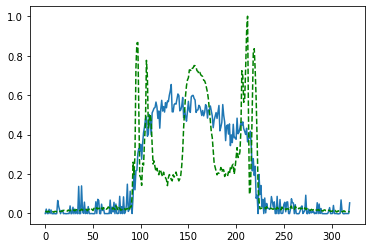

Time taken for epoch:  150.09566807746887
Epoch = [  4/3000]  Iter = [   0/39480]  Loss = 0.1955 Avg Loss = 0.1955  Time = 0.1067s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [  4/3000]  Iter = [ 100/39480]  Loss = 0.2233 Avg Loss = 0.2096  Time = 0.0031s
Epoch = [  4/3000]  Iter = [ 200/39480]  Loss = 0.2157 Avg Loss = 0.2152  Time = 0.0031s
Epoch = [  4/3000]  Iter = [ 300/39480]  Loss = 0.2158 Avg Loss = 0.2145  Time = 0.0032s
Epoch = [  4/3000]  Iter = [ 400/39480]  Loss = 0.2453 Avg Loss = 0.2152  Time = 0.0030s
Epoch = [  4/3000]  Iter = [ 500/39480]  Loss = 0.2181 Avg Loss = 0.2195  Time = 0.0035s
Epoch = [  4/3000]  Iter = [ 600/39480]  Loss = 0.1963 Avg Loss = 0.2214  Time = 0.0031s
Epoch = [  4/3000]  Iter = [ 700/39480]  Loss = 0.2398 Avg Loss = 0.219  Time = 0.0031s
Epoch = [  4/3000]  Iter = [ 800/39480]  Loss = 0.1895 Avg Loss = 0.2194  Time = 0.0033s
Epoch = [  4/3000]  Iter = [ 900/39480]  Loss = 0.2039 Avg Loss = 0.2184  Time = 0.0027s
Epoch = [  4/3000]  Iter = [1000/39480]  Loss = 0.2002 Avg Loss = 0.2223  Time = 0.0030s
Epoch = [  4/3000]  Iter = [1100/39480]  Loss = 0.2406 Avg Loss = 0.2212  Time = 0.0032s
Epoch = [  4/3000]  It

Epoch = [  4/3000]  Iter = [9400/39480]  Loss = 0.2107 Avg Loss = 0.2198  Time = 0.0026s
Epoch = [  4/3000]  Iter = [9500/39480]  Loss = 0.1961 Avg Loss = 0.2209  Time = 0.0032s
Epoch = [  4/3000]  Iter = [9600/39480]  Loss = 0.2244 Avg Loss = 0.2173  Time = 0.0033s
Epoch = [  4/3000]  Iter = [9700/39480]  Loss = 0.2145 Avg Loss = 0.216  Time = 0.0030s
Epoch = [  4/3000]  Iter = [9800/39480]  Loss = 0.2862 Avg Loss = 0.2151  Time = 0.0030s
Epoch = [  4/3000]  Iter = [9900/39480]  Loss = 0.2171 Avg Loss = 0.2203  Time = 0.0027s
Epoch = [  4/3000]  Iter = [10000/39480]  Loss = 0.1946 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [  4/3000]  Iter = [10100/39480]  Loss = 0.1811 Avg Loss = 0.2163  Time = 0.0033s
Epoch = [  4/3000]  Iter = [10200/39480]  Loss = 0.1832 Avg Loss = 0.2188  Time = 0.0080s
Epoch = [  4/3000]  Iter = [10300/39480]  Loss = 0.2934 Avg Loss = 0.2198  Time = 0.0022s
Epoch = [  4/3000]  Iter = [10400/39480]  Loss = 0.2344 Avg Loss = 0.2218  Time = 0.0032s
Epoch = [  4/3000

Epoch = [  4/3000]  Iter = [18600/39480]  Loss = 0.2064 Avg Loss = 0.2225  Time = 0.0034s
Epoch = [  4/3000]  Iter = [18700/39480]  Loss = 0.2553 Avg Loss = 0.2213  Time = 0.0034s
Epoch = [  4/3000]  Iter = [18800/39480]  Loss = 0.2463 Avg Loss = 0.2205  Time = 0.0033s
Epoch = [  4/3000]  Iter = [18900/39480]  Loss = 0.1874 Avg Loss = 0.2154  Time = 0.0032s
Epoch = [  4/3000]  Iter = [19000/39480]  Loss = 0.216 Avg Loss = 0.2165  Time = 0.0037s
Epoch = [  4/3000]  Iter = [19100/39480]  Loss = 0.1817 Avg Loss = 0.2183  Time = 0.0034s
Epoch = [  4/3000]  Iter = [19200/39480]  Loss = 0.2252 Avg Loss = 0.2166  Time = 0.0030s
Epoch = [  4/3000]  Iter = [19300/39480]  Loss = 0.2266 Avg Loss = 0.2201  Time = 0.0033s
Epoch = [  4/3000]  Iter = [19400/39480]  Loss = 0.1934 Avg Loss = 0.216  Time = 0.0032s
Epoch = [  4/3000]  Iter = [19500/39480]  Loss = 0.2012 Avg Loss = 0.2173  Time = 0.0023s
Epoch = [  4/3000]  Iter = [19600/39480]  Loss = 0.2175 Avg Loss = 0.2154  Time = 0.0031s
Epoch = [  4

Epoch = [  4/3000]  Iter = [27800/39480]  Loss = 0.2131 Avg Loss = 0.2242  Time = 0.0030s
Epoch = [  4/3000]  Iter = [27900/39480]  Loss = 0.2083 Avg Loss = 0.2195  Time = 0.0030s
Epoch = [  4/3000]  Iter = [28000/39480]  Loss = 0.1747 Avg Loss = 0.2159  Time = 0.0032s
Epoch = [  4/3000]  Iter = [28100/39480]  Loss = 0.2154 Avg Loss = 0.2213  Time = 0.0030s
Epoch = [  4/3000]  Iter = [28200/39480]  Loss = 0.231 Avg Loss = 0.2195  Time = 0.0030s
Epoch = [  4/3000]  Iter = [28300/39480]  Loss = 0.2163 Avg Loss = 0.2219  Time = 0.0031s
Epoch = [  4/3000]  Iter = [28400/39480]  Loss = 0.2092 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [  4/3000]  Iter = [28500/39480]  Loss = 0.2116 Avg Loss = 0.2231  Time = 0.0033s
Epoch = [  4/3000]  Iter = [28600/39480]  Loss = 0.2127 Avg Loss = 0.22  Time = 0.0028s
Epoch = [  4/3000]  Iter = [28700/39480]  Loss = 0.2431 Avg Loss = 0.2177  Time = 0.0034s
Epoch = [  4/3000]  Iter = [28800/39480]  Loss = 0.199 Avg Loss = 0.2164  Time = 0.0035s
Epoch = [  4/3

Epoch = [  4/3000]  Iter = [37000/39480]  Loss = 0.2524 Avg Loss = 0.2159  Time = 0.0030s
Epoch = [  4/3000]  Iter = [37100/39480]  Loss = 0.2529 Avg Loss = 0.221  Time = 0.0033s
Epoch = [  4/3000]  Iter = [37200/39480]  Loss = 0.239 Avg Loss = 0.2165  Time = 0.0025s
Epoch = [  4/3000]  Iter = [37300/39480]  Loss = 0.188 Avg Loss = 0.2173  Time = 0.0031s
Epoch = [  4/3000]  Iter = [37400/39480]  Loss = 0.1924 Avg Loss = 0.2235  Time = 0.0031s
Epoch = [  4/3000]  Iter = [37500/39480]  Loss = 0.1826 Avg Loss = 0.2169  Time = 0.0040s
Epoch = [  4/3000]  Iter = [37600/39480]  Loss = 0.2227 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [  4/3000]  Iter = [37700/39480]  Loss = 0.2117 Avg Loss = 0.2183  Time = 0.0032s
Epoch = [  4/3000]  Iter = [37800/39480]  Loss = 0.2317 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [  4/3000]  Iter = [37900/39480]  Loss = 0.2241 Avg Loss = 0.2186  Time = 0.0030s
Epoch = [  4/3000]  Iter = [38000/39480]  Loss = 0.2151 Avg Loss = 0.2198  Time = 0.0030s
Epoch = [  4/

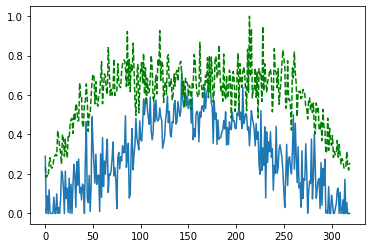

Time taken for epoch:  146.7413694858551
Epoch = [  5/3000]  Iter = [   0/39480]  Loss = 0.2057 Avg Loss = 0.2057  Time = 0.0842s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [  5/3000]  Iter = [ 100/39480]  Loss = 0.1895 Avg Loss = 0.2106  Time = 0.0031s
Epoch = [  5/3000]  Iter = [ 200/39480]  Loss = 0.2089 Avg Loss = 0.2147  Time = 0.0033s
Epoch = [  5/3000]  Iter = [ 300/39480]  Loss = 0.2148 Avg Loss = 0.2177  Time = 0.0020s
Epoch = [  5/3000]  Iter = [ 400/39480]  Loss = 0.2036 Avg Loss = 0.2149  Time = 0.0021s
Epoch = [  5/3000]  Iter = [ 500/39480]  Loss = 0.2902 Avg Loss = 0.2203  Time = 0.0032s
Epoch = [  5/3000]  Iter = [ 600/39480]  Loss = 0.2399 Avg Loss = 0.2197  Time = 0.0033s
Epoch = [  5/3000]  Iter = [ 700/39480]  Loss = 0.2439 Avg Loss = 0.2127  Time = 0.0033s
Epoch = [  5/3000]  Iter = [ 800/39480]  Loss = 0.2231 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [  5/3000]  Iter = [ 900/39480]  Loss = 0.2144 Avg Loss = 0.2149  Time = 0.0030s
Epoch = [  5/3000]  Iter = [1000/39480]  Loss = 0.1957 Avg Loss = 0.216  Time = 0.0029s
Epoch = [  5/3000]  Iter = [1100/39480]  Loss = 0.2061 Avg Loss = 0.2158  Time = 0.0026s
Epoch = [  5/3000]  It

Epoch = [  5/3000]  Iter = [9400/39480]  Loss = 0.2457 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [  5/3000]  Iter = [9500/39480]  Loss = 0.2158 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [  5/3000]  Iter = [9600/39480]  Loss = 0.2049 Avg Loss = 0.2203  Time = 0.0028s
Epoch = [  5/3000]  Iter = [9700/39480]  Loss = 0.1933 Avg Loss = 0.2187  Time = 0.0033s
Epoch = [  5/3000]  Iter = [9800/39480]  Loss = 0.2509 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [  5/3000]  Iter = [9900/39480]  Loss = 0.225 Avg Loss = 0.2161  Time = 0.0032s
Epoch = [  5/3000]  Iter = [10000/39480]  Loss = 0.2112 Avg Loss = 0.2218  Time = 0.0030s
Epoch = [  5/3000]  Iter = [10100/39480]  Loss = 0.2107 Avg Loss = 0.2204  Time = 0.0032s
Epoch = [  5/3000]  Iter = [10200/39480]  Loss = 0.2334 Avg Loss = 0.2187  Time = 0.0031s
Epoch = [  5/3000]  Iter = [10300/39480]  Loss = 0.2125 Avg Loss = 0.2213  Time = 0.0030s
Epoch = [  5/3000]  Iter = [10400/39480]  Loss = 0.1917 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [  5/3000

Epoch = [  5/3000]  Iter = [18600/39480]  Loss = 0.2297 Avg Loss = 0.2202  Time = 0.0031s
Epoch = [  5/3000]  Iter = [18700/39480]  Loss = 0.1933 Avg Loss = 0.2134  Time = 0.0019s
Epoch = [  5/3000]  Iter = [18800/39480]  Loss = 0.1989 Avg Loss = 0.2158  Time = 0.0023s
Epoch = [  5/3000]  Iter = [18900/39480]  Loss = 0.2133 Avg Loss = 0.2187  Time = 0.0027s
Epoch = [  5/3000]  Iter = [19000/39480]  Loss = 0.2292 Avg Loss = 0.2224  Time = 0.0033s
Epoch = [  5/3000]  Iter = [19100/39480]  Loss = 0.2332 Avg Loss = 0.2179  Time = 0.0032s
Epoch = [  5/3000]  Iter = [19200/39480]  Loss = 0.187 Avg Loss = 0.2199  Time = 0.0063s
Epoch = [  5/3000]  Iter = [19300/39480]  Loss = 0.2077 Avg Loss = 0.2188  Time = 0.0030s
Epoch = [  5/3000]  Iter = [19400/39480]  Loss = 0.2478 Avg Loss = 0.2178  Time = 0.0030s
Epoch = [  5/3000]  Iter = [19500/39480]  Loss = 0.253 Avg Loss = 0.2187  Time = 0.0028s
Epoch = [  5/3000]  Iter = [19600/39480]  Loss = 0.1993 Avg Loss = 0.2176  Time = 0.0032s
Epoch = [  5

Epoch = [  5/3000]  Iter = [27800/39480]  Loss = 0.2137 Avg Loss = 0.2193  Time = 0.0035s
Epoch = [  5/3000]  Iter = [27900/39480]  Loss = 0.1945 Avg Loss = 0.2171  Time = 0.0032s
Epoch = [  5/3000]  Iter = [28000/39480]  Loss = 0.2192 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [  5/3000]  Iter = [28100/39480]  Loss = 0.2239 Avg Loss = 0.2196  Time = 0.0033s
Epoch = [  5/3000]  Iter = [28200/39480]  Loss = 0.228 Avg Loss = 0.2174  Time = 0.0036s
Epoch = [  5/3000]  Iter = [28300/39480]  Loss = 0.2428 Avg Loss = 0.2166  Time = 0.0028s
Epoch = [  5/3000]  Iter = [28400/39480]  Loss = 0.2459 Avg Loss = 0.2211  Time = 0.0033s
Epoch = [  5/3000]  Iter = [28500/39480]  Loss = 0.199 Avg Loss = 0.2198  Time = 0.0025s
Epoch = [  5/3000]  Iter = [28600/39480]  Loss = 0.2231 Avg Loss = 0.2242  Time = 0.0033s
Epoch = [  5/3000]  Iter = [28700/39480]  Loss = 0.2204 Avg Loss = 0.2211  Time = 0.0034s
Epoch = [  5/3000]  Iter = [28800/39480]  Loss = 0.2248 Avg Loss = 0.2196  Time = 0.0032s
Epoch = [  5

Epoch = [  5/3000]  Iter = [37000/39480]  Loss = 0.2134 Avg Loss = 0.223  Time = 0.0030s
Epoch = [  5/3000]  Iter = [37100/39480]  Loss = 0.1989 Avg Loss = 0.2211  Time = 0.0029s
Epoch = [  5/3000]  Iter = [37200/39480]  Loss = 0.2083 Avg Loss = 0.2191  Time = 0.0026s
Epoch = [  5/3000]  Iter = [37300/39480]  Loss = 0.1987 Avg Loss = 0.2192  Time = 0.0032s
Epoch = [  5/3000]  Iter = [37400/39480]  Loss = 0.2307 Avg Loss = 0.2184  Time = 0.0029s
Epoch = [  5/3000]  Iter = [37500/39480]  Loss = 0.218 Avg Loss = 0.2151  Time = 0.0019s
Epoch = [  5/3000]  Iter = [37600/39480]  Loss = 0.2013 Avg Loss = 0.2165  Time = 0.0024s
Epoch = [  5/3000]  Iter = [37700/39480]  Loss = 0.2421 Avg Loss = 0.2207  Time = 0.0032s
Epoch = [  5/3000]  Iter = [37800/39480]  Loss = 0.2394 Avg Loss = 0.2199  Time = 0.0032s
Epoch = [  5/3000]  Iter = [37900/39480]  Loss = 0.2224 Avg Loss = 0.2229  Time = 0.0035s
Epoch = [  5/3000]  Iter = [38000/39480]  Loss = 0.1772 Avg Loss = 0.2223  Time = 0.0035s
Epoch = [  5

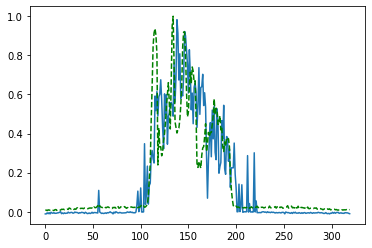

Time taken for epoch:  148.6367027759552
Epoch = [  6/3000]  Iter = [   0/39480]  Loss = 0.2013 Avg Loss = 0.2013  Time = 0.0870s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [  6/3000]  Iter = [ 100/39480]  Loss = 0.2229 Avg Loss = 0.208  Time = 0.0031s
Epoch = [  6/3000]  Iter = [ 200/39480]  Loss = 0.1888 Avg Loss = 0.2136  Time = 0.0032s
Epoch = [  6/3000]  Iter = [ 300/39480]  Loss = 0.2104 Avg Loss = 0.2163  Time = 0.0030s
Epoch = [  6/3000]  Iter = [ 400/39480]  Loss = 0.2037 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [  6/3000]  Iter = [ 500/39480]  Loss = 0.2029 Avg Loss = 0.2161  Time = 0.0033s
Epoch = [  6/3000]  Iter = [ 600/39480]  Loss = 0.2096 Avg Loss = 0.2167  Time = 0.0028s
Epoch = [  6/3000]  Iter = [ 700/39480]  Loss = 0.2493 Avg Loss = 0.2198  Time = 0.0030s
Epoch = [  6/3000]  Iter = [ 800/39480]  Loss = 0.2031 Avg Loss = 0.2181  Time = 0.0032s
Epoch = [  6/3000]  Iter = [ 900/39480]  Loss = 0.2017 Avg Loss = 0.2203  Time = 0.0030s
Epoch = [  6/3000]  Iter = [1000/39480]  Loss = 0.2559 Avg Loss = 0.2211  Time = 0.0029s
Epoch = [  6/3000]  Iter = [1100/39480]  Loss = 0.2041 Avg Loss = 0.2197  Time = 0.0026s
Epoch = [  6/3000]  It

Epoch = [  6/3000]  Iter = [9400/39480]  Loss = 0.2802 Avg Loss = 0.2203  Time = 0.0031s
Epoch = [  6/3000]  Iter = [9500/39480]  Loss = 0.234 Avg Loss = 0.2174  Time = 0.0035s
Epoch = [  6/3000]  Iter = [9600/39480]  Loss = 0.2133 Avg Loss = 0.2149  Time = 0.0029s
Epoch = [  6/3000]  Iter = [9700/39480]  Loss = 0.1915 Avg Loss = 0.2156  Time = 0.0034s
Epoch = [  6/3000]  Iter = [9800/39480]  Loss = 0.1872 Avg Loss = 0.2166  Time = 0.0031s
Epoch = [  6/3000]  Iter = [9900/39480]  Loss = 0.2226 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [  6/3000]  Iter = [10000/39480]  Loss = 0.2142 Avg Loss = 0.2176  Time = 0.0049s
Epoch = [  6/3000]  Iter = [10100/39480]  Loss = 0.2354 Avg Loss = 0.218  Time = 0.0031s
Epoch = [  6/3000]  Iter = [10200/39480]  Loss = 0.2346 Avg Loss = 0.219  Time = 0.0032s
Epoch = [  6/3000]  Iter = [10300/39480]  Loss = 0.1871 Avg Loss = 0.2175  Time = 0.0031s
Epoch = [  6/3000]  Iter = [10400/39480]  Loss = 0.2458 Avg Loss = 0.2182  Time = 0.0031s
Epoch = [  6/3000] 

Epoch = [  6/3000]  Iter = [18600/39480]  Loss = 0.2527 Avg Loss = 0.2208  Time = 0.0032s
Epoch = [  6/3000]  Iter = [18700/39480]  Loss = 0.2433 Avg Loss = 0.219  Time = 0.0029s
Epoch = [  6/3000]  Iter = [18800/39480]  Loss = 0.1892 Avg Loss = 0.2172  Time = 0.0032s
Epoch = [  6/3000]  Iter = [18900/39480]  Loss = 0.2289 Avg Loss = 0.2153  Time = 0.0028s
Epoch = [  6/3000]  Iter = [19000/39480]  Loss = 0.2098 Avg Loss = 0.2135  Time = 0.0032s
Epoch = [  6/3000]  Iter = [19100/39480]  Loss = 0.2476 Avg Loss = 0.2151  Time = 0.0038s
Epoch = [  6/3000]  Iter = [19200/39480]  Loss = 0.2164 Avg Loss = 0.2175  Time = 0.0024s
Epoch = [  6/3000]  Iter = [19300/39480]  Loss = 0.2015 Avg Loss = 0.2188  Time = 0.0021s
Epoch = [  6/3000]  Iter = [19400/39480]  Loss = 0.2595 Avg Loss = 0.22  Time = 0.0032s
Epoch = [  6/3000]  Iter = [19500/39480]  Loss = 0.2434 Avg Loss = 0.2193  Time = 0.0033s
Epoch = [  6/3000]  Iter = [19600/39480]  Loss = 0.1709 Avg Loss = 0.2213  Time = 0.0030s
Epoch = [  6/

Epoch = [  6/3000]  Iter = [27800/39480]  Loss = 0.2328 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [  6/3000]  Iter = [27900/39480]  Loss = 0.2047 Avg Loss = 0.2205  Time = 0.0031s
Epoch = [  6/3000]  Iter = [28000/39480]  Loss = 0.2365 Avg Loss = 0.2272  Time = 0.0036s
Epoch = [  6/3000]  Iter = [28100/39480]  Loss = 0.2282 Avg Loss = 0.2179  Time = 0.0035s
Epoch = [  6/3000]  Iter = [28200/39480]  Loss = 0.2437 Avg Loss = 0.2143  Time = 0.0028s
Epoch = [  6/3000]  Iter = [28300/39480]  Loss = 0.1727 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [  6/3000]  Iter = [28400/39480]  Loss = 0.2187 Avg Loss = 0.2222  Time = 0.0026s
Epoch = [  6/3000]  Iter = [28500/39480]  Loss = 0.2189 Avg Loss = 0.2156  Time = 0.0031s
Epoch = [  6/3000]  Iter = [28600/39480]  Loss = 0.2006 Avg Loss = 0.2185  Time = 0.0035s
Epoch = [  6/3000]  Iter = [28700/39480]  Loss = 0.2384 Avg Loss = 0.2203  Time = 0.0029s
Epoch = [  6/3000]  Iter = [28800/39480]  Loss = 0.2255 Avg Loss = 0.2186  Time = 0.0032s
Epoch = [ 

Epoch = [  6/3000]  Iter = [37000/39480]  Loss = 0.1993 Avg Loss = 0.2148  Time = 0.0035s
Epoch = [  6/3000]  Iter = [37100/39480]  Loss = 0.2705 Avg Loss = 0.2187  Time = 0.0031s
Epoch = [  6/3000]  Iter = [37200/39480]  Loss = 0.2489 Avg Loss = 0.2217  Time = 0.0028s
Epoch = [  6/3000]  Iter = [37300/39480]  Loss = 0.2341 Avg Loss = 0.2174  Time = 0.0031s
Epoch = [  6/3000]  Iter = [37400/39480]  Loss = 0.2106 Avg Loss = 0.2187  Time = 0.0030s
Epoch = [  6/3000]  Iter = [37500/39480]  Loss = 0.1825 Avg Loss = 0.2176  Time = 0.0030s
Epoch = [  6/3000]  Iter = [37600/39480]  Loss = 0.2148 Avg Loss = 0.2168  Time = 0.0031s
Epoch = [  6/3000]  Iter = [37700/39480]  Loss = 0.2114 Avg Loss = 0.2171  Time = 0.0031s
Epoch = [  6/3000]  Iter = [37800/39480]  Loss = 0.2235 Avg Loss = 0.2172  Time = 0.0023s
Epoch = [  6/3000]  Iter = [37900/39480]  Loss = 0.2167 Avg Loss = 0.2175  Time = 0.0025s
Epoch = [  6/3000]  Iter = [38000/39480]  Loss = 0.2113 Avg Loss = 0.2165  Time = 0.0022s
Epoch = [ 

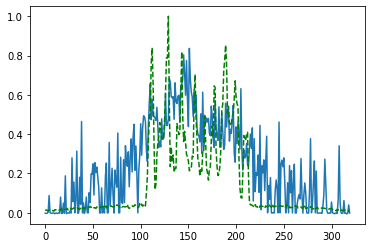

Time taken for epoch:  150.39654183387756
Epoch = [  7/3000]  Iter = [   0/39480]  Loss = 0.2086 Avg Loss = 0.2086  Time = 0.1077s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [  7/3000]  Iter = [ 100/39480]  Loss = 0.2272 Avg Loss = 0.2179  Time = 0.0021s
Epoch = [  7/3000]  Iter = [ 200/39480]  Loss = 0.208 Avg Loss = 0.2188  Time = 0.0034s
Epoch = [  7/3000]  Iter = [ 300/39480]  Loss = 0.196 Avg Loss = 0.2147  Time = 0.0030s
Epoch = [  7/3000]  Iter = [ 400/39480]  Loss = 0.2405 Avg Loss = 0.2186  Time = 0.0018s
Epoch = [  7/3000]  Iter = [ 500/39480]  Loss = 0.2075 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [  7/3000]  Iter = [ 600/39480]  Loss = 0.2218 Avg Loss = 0.221  Time = 0.0030s
Epoch = [  7/3000]  Iter = [ 700/39480]  Loss = 0.2543 Avg Loss = 0.2153  Time = 0.0030s
Epoch = [  7/3000]  Iter = [ 800/39480]  Loss = 0.2209 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [  7/3000]  Iter = [ 900/39480]  Loss = 0.2551 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [  7/3000]  Iter = [1000/39480]  Loss = 0.1945 Avg Loss = 0.2133  Time = 0.0030s
Epoch = [  7/3000]  Iter = [1100/39480]  Loss = 0.2306 Avg Loss = 0.22  Time = 0.0031s
Epoch = [  7/3000]  Iter =

Epoch = [  7/3000]  Iter = [9400/39480]  Loss = 0.2006 Avg Loss = 0.2169  Time = 0.0032s
Epoch = [  7/3000]  Iter = [9500/39480]  Loss = 0.1875 Avg Loss = 0.2164  Time = 0.0038s
Epoch = [  7/3000]  Iter = [9600/39480]  Loss = 0.1967 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [  7/3000]  Iter = [9700/39480]  Loss = 0.201 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [  7/3000]  Iter = [9800/39480]  Loss = 0.2476 Avg Loss = 0.2212  Time = 0.0041s
Epoch = [  7/3000]  Iter = [9900/39480]  Loss = 0.2188 Avg Loss = 0.219  Time = 0.0066s
Epoch = [  7/3000]  Iter = [10000/39480]  Loss = 0.244 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [  7/3000]  Iter = [10100/39480]  Loss = 0.2199 Avg Loss = 0.2188  Time = 0.0032s
Epoch = [  7/3000]  Iter = [10200/39480]  Loss = 0.2074 Avg Loss = 0.2171  Time = 0.0039s
Epoch = [  7/3000]  Iter = [10300/39480]  Loss = 0.222 Avg Loss = 0.2149  Time = 0.0025s
Epoch = [  7/3000]  Iter = [10400/39480]  Loss = 0.2686 Avg Loss = 0.2159  Time = 0.0031s
Epoch = [  7/3000]  

Epoch = [  7/3000]  Iter = [18600/39480]  Loss = 0.2324 Avg Loss = 0.2156  Time = 0.0032s
Epoch = [  7/3000]  Iter = [18700/39480]  Loss = 0.2481 Avg Loss = 0.2194  Time = 0.0032s
Epoch = [  7/3000]  Iter = [18800/39480]  Loss = 0.2692 Avg Loss = 0.2184  Time = 0.0028s
Epoch = [  7/3000]  Iter = [18900/39480]  Loss = 0.2433 Avg Loss = 0.2227  Time = 0.0029s
Epoch = [  7/3000]  Iter = [19000/39480]  Loss = 0.2261 Avg Loss = 0.2167  Time = 0.0030s
Epoch = [  7/3000]  Iter = [19100/39480]  Loss = 0.2311 Avg Loss = 0.2182  Time = 0.0032s
Epoch = [  7/3000]  Iter = [19200/39480]  Loss = 0.2028 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [  7/3000]  Iter = [19300/39480]  Loss = 0.2175 Avg Loss = 0.2142  Time = 0.0029s
Epoch = [  7/3000]  Iter = [19400/39480]  Loss = 0.259 Avg Loss = 0.2178  Time = 0.0030s
Epoch = [  7/3000]  Iter = [19500/39480]  Loss = 0.1963 Avg Loss = 0.2172  Time = 0.0032s
Epoch = [  7/3000]  Iter = [19600/39480]  Loss = 0.1889 Avg Loss = 0.2187  Time = 0.0067s
Epoch = [  

Epoch = [  7/3000]  Iter = [27800/39480]  Loss = 0.2156 Avg Loss = 0.225  Time = 0.0031s
Epoch = [  7/3000]  Iter = [27900/39480]  Loss = 0.2157 Avg Loss = 0.2208  Time = 0.0030s
Epoch = [  7/3000]  Iter = [28000/39480]  Loss = 0.2603 Avg Loss = 0.2166  Time = 0.0030s
Epoch = [  7/3000]  Iter = [28100/39480]  Loss = 0.205 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [  7/3000]  Iter = [28200/39480]  Loss = 0.1858 Avg Loss = 0.2138  Time = 0.0030s
Epoch = [  7/3000]  Iter = [28300/39480]  Loss = 0.2106 Avg Loss = 0.2158  Time = 0.0025s
Epoch = [  7/3000]  Iter = [28400/39480]  Loss = 0.2136 Avg Loss = 0.2169  Time = 0.0062s
Epoch = [  7/3000]  Iter = [28500/39480]  Loss = 0.2893 Avg Loss = 0.2219  Time = 0.0033s
Epoch = [  7/3000]  Iter = [28600/39480]  Loss = 0.2049 Avg Loss = 0.2188  Time = 0.0032s
Epoch = [  7/3000]  Iter = [28700/39480]  Loss = 0.2514 Avg Loss = 0.2206  Time = 0.0030s
Epoch = [  7/3000]  Iter = [28800/39480]  Loss = 0.2141 Avg Loss = 0.2206  Time = 0.0023s
Epoch = [  7

Epoch = [  7/3000]  Iter = [37000/39480]  Loss = 0.2424 Avg Loss = 0.2242  Time = 0.0031s
Epoch = [  7/3000]  Iter = [37100/39480]  Loss = 0.2184 Avg Loss = 0.2155  Time = 0.0030s
Epoch = [  7/3000]  Iter = [37200/39480]  Loss = 0.2012 Avg Loss = 0.2181  Time = 0.0029s
Epoch = [  7/3000]  Iter = [37300/39480]  Loss = 0.2222 Avg Loss = 0.2161  Time = 0.0030s
Epoch = [  7/3000]  Iter = [37400/39480]  Loss = 0.1911 Avg Loss = 0.2151  Time = 0.0026s
Epoch = [  7/3000]  Iter = [37500/39480]  Loss = 0.1892 Avg Loss = 0.2252  Time = 0.0032s
Epoch = [  7/3000]  Iter = [37600/39480]  Loss = 0.1806 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [  7/3000]  Iter = [37700/39480]  Loss = 0.2205 Avg Loss = 0.2198  Time = 0.0030s
Epoch = [  7/3000]  Iter = [37800/39480]  Loss = 0.2145 Avg Loss = 0.2175  Time = 0.0026s
Epoch = [  7/3000]  Iter = [37900/39480]  Loss = 0.2133 Avg Loss = 0.2198  Time = 0.0032s
Epoch = [  7/3000]  Iter = [38000/39480]  Loss = 0.1952 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [ 

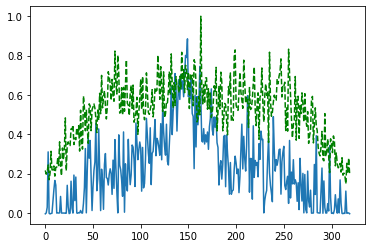

Time taken for epoch:  150.21280574798584
Epoch = [  8/3000]  Iter = [   0/39480]  Loss = 0.1944 Avg Loss = 0.1944  Time = 0.1300s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [  8/3000]  Iter = [ 100/39480]  Loss = 0.2205 Avg Loss = 0.2075  Time = 0.0030s
Epoch = [  8/3000]  Iter = [ 200/39480]  Loss = 0.2068 Avg Loss = 0.2166  Time = 0.0018s
Epoch = [  8/3000]  Iter = [ 300/39480]  Loss = 0.223 Avg Loss = 0.218  Time = 0.0032s
Epoch = [  8/3000]  Iter = [ 400/39480]  Loss = 0.1998 Avg Loss = 0.2147  Time = 0.0032s
Epoch = [  8/3000]  Iter = [ 500/39480]  Loss = 0.1939 Avg Loss = 0.2131  Time = 0.0030s
Epoch = [  8/3000]  Iter = [ 600/39480]  Loss = 0.1934 Avg Loss = 0.2182  Time = 0.0025s
Epoch = [  8/3000]  Iter = [ 700/39480]  Loss = 0.2239 Avg Loss = 0.2194  Time = 0.0031s
Epoch = [  8/3000]  Iter = [ 800/39480]  Loss = 0.2438 Avg Loss = 0.2168  Time = 0.0028s
Epoch = [  8/3000]  Iter = [ 900/39480]  Loss = 0.2032 Avg Loss = 0.2171  Time = 0.0017s
Epoch = [  8/3000]  Iter = [1000/39480]  Loss = 0.2158 Avg Loss = 0.2185  Time = 0.0031s
Epoch = [  8/3000]  Iter = [1100/39480]  Loss = 0.2435 Avg Loss = 0.2183  Time = 0.0030s
Epoch = [  8/3000]  Ite

Epoch = [  8/3000]  Iter = [9400/39480]  Loss = 0.1915 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [  8/3000]  Iter = [9500/39480]  Loss = 0.201 Avg Loss = 0.2161  Time = 0.0042s
Epoch = [  8/3000]  Iter = [9600/39480]  Loss = 0.2161 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [  8/3000]  Iter = [9700/39480]  Loss = 0.1952 Avg Loss = 0.2223  Time = 0.0030s
Epoch = [  8/3000]  Iter = [9800/39480]  Loss = 0.1679 Avg Loss = 0.218  Time = 0.0071s
Epoch = [  8/3000]  Iter = [9900/39480]  Loss = 0.2224 Avg Loss = 0.2226  Time = 0.0032s
Epoch = [  8/3000]  Iter = [10000/39480]  Loss = 0.2248 Avg Loss = 0.2205  Time = 0.0035s
Epoch = [  8/3000]  Iter = [10100/39480]  Loss = 0.2106 Avg Loss = 0.2156  Time = 0.0100s
Epoch = [  8/3000]  Iter = [10200/39480]  Loss = 0.2137 Avg Loss = 0.2178  Time = 0.0030s
Epoch = [  8/3000]  Iter = [10300/39480]  Loss = 0.2086 Avg Loss = 0.2167  Time = 0.0031s
Epoch = [  8/3000]  Iter = [10400/39480]  Loss = 0.1946 Avg Loss = 0.2212  Time = 0.0085s
Epoch = [  8/3000]

Epoch = [  8/3000]  Iter = [18600/39480]  Loss = 0.2372 Avg Loss = 0.2231  Time = 0.0034s
Epoch = [  8/3000]  Iter = [18700/39480]  Loss = 0.2802 Avg Loss = 0.2199  Time = 0.0032s
Epoch = [  8/3000]  Iter = [18800/39480]  Loss = 0.1765 Avg Loss = 0.2224  Time = 0.0030s
Epoch = [  8/3000]  Iter = [18900/39480]  Loss = 0.2108 Avg Loss = 0.2147  Time = 0.0032s
Epoch = [  8/3000]  Iter = [19000/39480]  Loss = 0.189 Avg Loss = 0.2157  Time = 0.0025s
Epoch = [  8/3000]  Iter = [19100/39480]  Loss = 0.2154 Avg Loss = 0.2141  Time = 0.0033s
Epoch = [  8/3000]  Iter = [19200/39480]  Loss = 0.2472 Avg Loss = 0.2162  Time = 0.0030s
Epoch = [  8/3000]  Iter = [19300/39480]  Loss = 0.2397 Avg Loss = 0.2211  Time = 0.0031s
Epoch = [  8/3000]  Iter = [19400/39480]  Loss = 0.2041 Avg Loss = 0.2153  Time = 0.0032s
Epoch = [  8/3000]  Iter = [19500/39480]  Loss = 0.2184 Avg Loss = 0.2185  Time = 0.0021s
Epoch = [  8/3000]  Iter = [19600/39480]  Loss = 0.2283 Avg Loss = 0.2118  Time = 0.0030s
Epoch = [  

Epoch = [  8/3000]  Iter = [27800/39480]  Loss = 0.217 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [  8/3000]  Iter = [27900/39480]  Loss = 0.2072 Avg Loss = 0.2205  Time = 0.0031s
Epoch = [  8/3000]  Iter = [28000/39480]  Loss = 0.2315 Avg Loss = 0.22  Time = 0.0029s
Epoch = [  8/3000]  Iter = [28100/39480]  Loss = 0.2312 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [  8/3000]  Iter = [28200/39480]  Loss = 0.2254 Avg Loss = 0.2207  Time = 0.0031s
Epoch = [  8/3000]  Iter = [28300/39480]  Loss = 0.2797 Avg Loss = 0.2228  Time = 0.0036s
Epoch = [  8/3000]  Iter = [28400/39480]  Loss = 0.2552 Avg Loss = 0.2188  Time = 0.0021s
Epoch = [  8/3000]  Iter = [28500/39480]  Loss = 0.2189 Avg Loss = 0.2152  Time = 0.0021s
Epoch = [  8/3000]  Iter = [28600/39480]  Loss = 0.1976 Avg Loss = 0.2173  Time = 0.0031s
Epoch = [  8/3000]  Iter = [28700/39480]  Loss = 0.2276 Avg Loss = 0.2174  Time = 0.0024s
Epoch = [  8/3000]  Iter = [28800/39480]  Loss = 0.1901 Avg Loss = 0.2164  Time = 0.0030s
Epoch = [  8/

Epoch = [  8/3000]  Iter = [37000/39480]  Loss = 0.1822 Avg Loss = 0.2158  Time = 0.0060s
Epoch = [  8/3000]  Iter = [37100/39480]  Loss = 0.2082 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [  8/3000]  Iter = [37200/39480]  Loss = 0.1889 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [  8/3000]  Iter = [37300/39480]  Loss = 0.2041 Avg Loss = 0.2151  Time = 0.0030s
Epoch = [  8/3000]  Iter = [37400/39480]  Loss = 0.2179 Avg Loss = 0.2189  Time = 0.0032s
Epoch = [  8/3000]  Iter = [37500/39480]  Loss = 0.2125 Avg Loss = 0.2176  Time = 0.0081s
Epoch = [  8/3000]  Iter = [37600/39480]  Loss = 0.2405 Avg Loss = 0.2189  Time = 0.0028s
Epoch = [  8/3000]  Iter = [37700/39480]  Loss = 0.1908 Avg Loss = 0.2196  Time = 0.0038s
Epoch = [  8/3000]  Iter = [37800/39480]  Loss = 0.2489 Avg Loss = 0.2175  Time = 0.0057s
Epoch = [  8/3000]  Iter = [37900/39480]  Loss = 0.2146 Avg Loss = 0.2206  Time = 0.0025s
Epoch = [  8/3000]  Iter = [38000/39480]  Loss = 0.2191 Avg Loss = 0.2227  Time = 0.0026s
Epoch = [ 

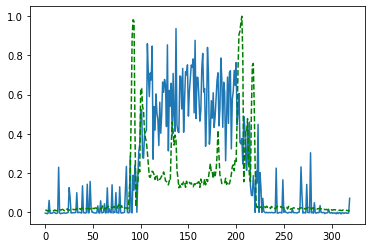

Time taken for epoch:  153.09256744384766
Epoch = [  9/3000]  Iter = [   0/39480]  Loss = 0.2185 Avg Loss = 0.2185  Time = 0.1001s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [  9/3000]  Iter = [ 100/39480]  Loss = 0.2166 Avg Loss = 0.2187  Time = 0.0032s
Epoch = [  9/3000]  Iter = [ 200/39480]  Loss = 0.2264 Avg Loss = 0.2191  Time = 0.0036s
Epoch = [  9/3000]  Iter = [ 300/39480]  Loss = 0.2054 Avg Loss = 0.219  Time = 0.0031s
Epoch = [  9/3000]  Iter = [ 400/39480]  Loss = 0.2446 Avg Loss = 0.2206  Time = 0.0032s
Epoch = [  9/3000]  Iter = [ 500/39480]  Loss = 0.2477 Avg Loss = 0.2202  Time = 0.0029s
Epoch = [  9/3000]  Iter = [ 600/39480]  Loss = 0.2154 Avg Loss = 0.2186  Time = 0.0031s
Epoch = [  9/3000]  Iter = [ 700/39480]  Loss = 0.2235 Avg Loss = 0.2189  Time = 0.0033s
Epoch = [  9/3000]  Iter = [ 800/39480]  Loss = 0.2185 Avg Loss = 0.2198  Time = 0.0031s
Epoch = [  9/3000]  Iter = [ 900/39480]  Loss = 0.187 Avg Loss = 0.213  Time = 0.0031s
Epoch = [  9/3000]  Iter = [1000/39480]  Loss = 0.2083 Avg Loss = 0.2127  Time = 0.0030s
Epoch = [  9/3000]  Iter = [1100/39480]  Loss = 0.1885 Avg Loss = 0.2163  Time = 0.0032s
Epoch = [  9/3000]  Iter

Epoch = [  9/3000]  Iter = [9400/39480]  Loss = 0.2458 Avg Loss = 0.211  Time = 0.0064s
Epoch = [  9/3000]  Iter = [9500/39480]  Loss = 0.2305 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [  9/3000]  Iter = [9600/39480]  Loss = 0.2221 Avg Loss = 0.2179  Time = 0.0033s
Epoch = [  9/3000]  Iter = [9700/39480]  Loss = 0.2132 Avg Loss = 0.2153  Time = 0.0029s
Epoch = [  9/3000]  Iter = [9800/39480]  Loss = 0.2151 Avg Loss = 0.2183  Time = 0.0039s
Epoch = [  9/3000]  Iter = [9900/39480]  Loss = 0.2109 Avg Loss = 0.2205  Time = 0.0044s
Epoch = [  9/3000]  Iter = [10000/39480]  Loss = 0.2212 Avg Loss = 0.2204  Time = 0.0031s
Epoch = [  9/3000]  Iter = [10100/39480]  Loss = 0.1995 Avg Loss = 0.2153  Time = 0.0032s
Epoch = [  9/3000]  Iter = [10200/39480]  Loss = 0.247 Avg Loss = 0.2178  Time = 0.0032s
Epoch = [  9/3000]  Iter = [10300/39480]  Loss = 0.2189 Avg Loss = 0.2144  Time = 0.0032s
Epoch = [  9/3000]  Iter = [10400/39480]  Loss = 0.218 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [  9/3000] 

Epoch = [  9/3000]  Iter = [18600/39480]  Loss = 0.2277 Avg Loss = 0.217  Time = 0.0048s
Epoch = [  9/3000]  Iter = [18700/39480]  Loss = 0.1945 Avg Loss = 0.2178  Time = 0.0031s
Epoch = [  9/3000]  Iter = [18800/39480]  Loss = 0.2223 Avg Loss = 0.2167  Time = 0.0031s
Epoch = [  9/3000]  Iter = [18900/39480]  Loss = 0.2388 Avg Loss = 0.2174  Time = 0.0024s
Epoch = [  9/3000]  Iter = [19000/39480]  Loss = 0.2214 Avg Loss = 0.2188  Time = 0.0033s
Epoch = [  9/3000]  Iter = [19100/39480]  Loss = 0.2061 Avg Loss = 0.2168  Time = 0.0086s
Epoch = [  9/3000]  Iter = [19200/39480]  Loss = 0.2301 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [  9/3000]  Iter = [19300/39480]  Loss = 0.275 Avg Loss = 0.2161  Time = 0.0032s
Epoch = [  9/3000]  Iter = [19400/39480]  Loss = 0.1988 Avg Loss = 0.2153  Time = 0.0032s
Epoch = [  9/3000]  Iter = [19500/39480]  Loss = 0.1982 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [  9/3000]  Iter = [19600/39480]  Loss = 0.2291 Avg Loss = 0.2185  Time = 0.0030s
Epoch = [  9

Epoch = [  9/3000]  Iter = [27800/39480]  Loss = 0.249 Avg Loss = 0.2149  Time = 0.0074s
Epoch = [  9/3000]  Iter = [27900/39480]  Loss = 0.2207 Avg Loss = 0.2175  Time = 0.0056s
Epoch = [  9/3000]  Iter = [28000/39480]  Loss = 0.241 Avg Loss = 0.2241  Time = 0.0031s
Epoch = [  9/3000]  Iter = [28100/39480]  Loss = 0.2258 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [  9/3000]  Iter = [28200/39480]  Loss = 0.2213 Avg Loss = 0.2199  Time = 0.0027s
Epoch = [  9/3000]  Iter = [28300/39480]  Loss = 0.2246 Avg Loss = 0.2213  Time = 0.0017s
Epoch = [  9/3000]  Iter = [28400/39480]  Loss = 0.2229 Avg Loss = 0.2187  Time = 0.0032s
Epoch = [  9/3000]  Iter = [28500/39480]  Loss = 0.1933 Avg Loss = 0.2154  Time = 0.0032s
Epoch = [  9/3000]  Iter = [28600/39480]  Loss = 0.1885 Avg Loss = 0.2162  Time = 0.0050s
Epoch = [  9/3000]  Iter = [28700/39480]  Loss = 0.2543 Avg Loss = 0.2159  Time = 0.0028s
Epoch = [  9/3000]  Iter = [28800/39480]  Loss = 0.1943 Avg Loss = 0.2187  Time = 0.0028s
Epoch = [  9

Epoch = [  9/3000]  Iter = [37000/39480]  Loss = 0.2228 Avg Loss = 0.2171  Time = 0.0020s
Epoch = [  9/3000]  Iter = [37100/39480]  Loss = 0.2517 Avg Loss = 0.2166  Time = 0.0032s
Epoch = [  9/3000]  Iter = [37200/39480]  Loss = 0.2061 Avg Loss = 0.2182  Time = 0.0032s
Epoch = [  9/3000]  Iter = [37300/39480]  Loss = 0.2011 Avg Loss = 0.2188  Time = 0.0029s
Epoch = [  9/3000]  Iter = [37400/39480]  Loss = 0.1991 Avg Loss = 0.2199  Time = 0.0030s
Epoch = [  9/3000]  Iter = [37500/39480]  Loss = 0.2231 Avg Loss = 0.2184  Time = 0.0033s
Epoch = [  9/3000]  Iter = [37600/39480]  Loss = 0.2275 Avg Loss = 0.2208  Time = 0.0030s
Epoch = [  9/3000]  Iter = [37700/39480]  Loss = 0.2053 Avg Loss = 0.2158  Time = 0.0032s
Epoch = [  9/3000]  Iter = [37800/39480]  Loss = 0.2205 Avg Loss = 0.2168  Time = 0.0023s
Epoch = [  9/3000]  Iter = [37900/39480]  Loss = 0.2489 Avg Loss = 0.2193  Time = 0.0032s
Epoch = [  9/3000]  Iter = [38000/39480]  Loss = 0.1928 Avg Loss = 0.2178  Time = 0.0031s
Epoch = [ 

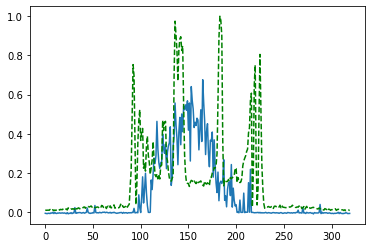

Time taken for epoch:  152.22461009025574
Epoch = [ 10/3000]  Iter = [   0/39480]  Loss = 0.2547 Avg Loss = 0.2547  Time = 0.0929s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 10/3000]  Iter = [ 100/39480]  Loss = 0.2205 Avg Loss = 0.2313  Time = 0.0031s
Epoch = [ 10/3000]  Iter = [ 200/39480]  Loss = 0.2226 Avg Loss = 0.2231  Time = 0.0037s
Epoch = [ 10/3000]  Iter = [ 300/39480]  Loss = 0.2247 Avg Loss = 0.2189  Time = 0.0033s
Epoch = [ 10/3000]  Iter = [ 400/39480]  Loss = 0.2001 Avg Loss = 0.2174  Time = 0.0031s
Epoch = [ 10/3000]  Iter = [ 500/39480]  Loss = 0.2 Avg Loss = 0.2192  Time = 0.0072s
Epoch = [ 10/3000]  Iter = [ 600/39480]  Loss = 0.2731 Avg Loss = 0.2206  Time = 0.0031s
Epoch = [ 10/3000]  Iter = [ 700/39480]  Loss = 0.215 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 10/3000]  Iter = [ 800/39480]  Loss = 0.2039 Avg Loss = 0.2187  Time = 0.0085s
Epoch = [ 10/3000]  Iter = [ 900/39480]  Loss = 0.1935 Avg Loss = 0.2189  Time = 0.0031s
Epoch = [ 10/3000]  Iter = [1000/39480]  Loss = 0.2264 Avg Loss = 0.225  Time = 0.0034s
Epoch = [ 10/3000]  Iter = [1100/39480]  Loss = 0.2174 Avg Loss = 0.2167  Time = 0.0026s
Epoch = [ 10/3000]  Iter =

Epoch = [ 10/3000]  Iter = [9400/39480]  Loss = 0.2068 Avg Loss = 0.2155  Time = 0.0033s
Epoch = [ 10/3000]  Iter = [9500/39480]  Loss = 0.1908 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 10/3000]  Iter = [9600/39480]  Loss = 0.2168 Avg Loss = 0.2174  Time = 0.0031s
Epoch = [ 10/3000]  Iter = [9700/39480]  Loss = 0.2003 Avg Loss = 0.2158  Time = 0.0032s
Epoch = [ 10/3000]  Iter = [9800/39480]  Loss = 0.2053 Avg Loss = 0.2158  Time = 0.0031s
Epoch = [ 10/3000]  Iter = [9900/39480]  Loss = 0.2051 Avg Loss = 0.2166  Time = 0.0043s
Epoch = [ 10/3000]  Iter = [10000/39480]  Loss = 0.2898 Avg Loss = 0.2182  Time = 0.0037s
Epoch = [ 10/3000]  Iter = [10100/39480]  Loss = 0.2419 Avg Loss = 0.2174  Time = 0.0032s
Epoch = [ 10/3000]  Iter = [10200/39480]  Loss = 0.1826 Avg Loss = 0.2165  Time = 0.0028s
Epoch = [ 10/3000]  Iter = [10300/39480]  Loss = 0.2345 Avg Loss = 0.2197  Time = 0.0033s
Epoch = [ 10/3000]  Iter = [10400/39480]  Loss = 0.2518 Avg Loss = 0.2223  Time = 0.0032s
Epoch = [ 10/300

Epoch = [ 10/3000]  Iter = [18600/39480]  Loss = 0.2269 Avg Loss = 0.2157  Time = 0.0031s
Epoch = [ 10/3000]  Iter = [18700/39480]  Loss = 0.2234 Avg Loss = 0.2174  Time = 0.0031s
Epoch = [ 10/3000]  Iter = [18800/39480]  Loss = 0.1838 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 10/3000]  Iter = [18900/39480]  Loss = 0.2344 Avg Loss = 0.2197  Time = 0.0032s
Epoch = [ 10/3000]  Iter = [19000/39480]  Loss = 0.2315 Avg Loss = 0.2169  Time = 0.0040s
Epoch = [ 10/3000]  Iter = [19100/39480]  Loss = 0.1966 Avg Loss = 0.2205  Time = 0.0030s
Epoch = [ 10/3000]  Iter = [19200/39480]  Loss = 0.2161 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 10/3000]  Iter = [19300/39480]  Loss = 0.2 Avg Loss = 0.2218  Time = 0.0029s
Epoch = [ 10/3000]  Iter = [19400/39480]  Loss = 0.2096 Avg Loss = 0.2225  Time = 0.0029s
Epoch = [ 10/3000]  Iter = [19500/39480]  Loss = 0.2009 Avg Loss = 0.2188  Time = 0.0032s
Epoch = [ 10/3000]  Iter = [19600/39480]  Loss = 0.2366 Avg Loss = 0.2188  Time = 0.0032s
Epoch = [ 10/

Epoch = [ 10/3000]  Iter = [27800/39480]  Loss = 0.2053 Avg Loss = 0.2206  Time = 0.0024s
Epoch = [ 10/3000]  Iter = [27900/39480]  Loss = 0.2728 Avg Loss = 0.2202  Time = 0.0029s
Epoch = [ 10/3000]  Iter = [28000/39480]  Loss = 0.233 Avg Loss = 0.2191  Time = 0.0036s
Epoch = [ 10/3000]  Iter = [28100/39480]  Loss = 0.2135 Avg Loss = 0.2225  Time = 0.0021s
Epoch = [ 10/3000]  Iter = [28200/39480]  Loss = 0.1922 Avg Loss = 0.2165  Time = 0.0031s
Epoch = [ 10/3000]  Iter = [28300/39480]  Loss = 0.2301 Avg Loss = 0.2142  Time = 0.0032s
Epoch = [ 10/3000]  Iter = [28400/39480]  Loss = 0.2078 Avg Loss = 0.2153  Time = 0.0032s
Epoch = [ 10/3000]  Iter = [28500/39480]  Loss = 0.2243 Avg Loss = 0.2146  Time = 0.0061s
Epoch = [ 10/3000]  Iter = [28600/39480]  Loss = 0.2056 Avg Loss = 0.2205  Time = 0.0017s
Epoch = [ 10/3000]  Iter = [28700/39480]  Loss = 0.2031 Avg Loss = 0.2206  Time = 0.0031s
Epoch = [ 10/3000]  Iter = [28800/39480]  Loss = 0.1838 Avg Loss = 0.224  Time = 0.0033s
Epoch = [ 10

Epoch = [ 10/3000]  Iter = [37000/39480]  Loss = 0.2001 Avg Loss = 0.2181  Time = 0.0075s
Epoch = [ 10/3000]  Iter = [37100/39480]  Loss = 0.2408 Avg Loss = 0.2218  Time = 0.0026s
Epoch = [ 10/3000]  Iter = [37200/39480]  Loss = 0.2173 Avg Loss = 0.2202  Time = 0.0031s
Epoch = [ 10/3000]  Iter = [37300/39480]  Loss = 0.1941 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 10/3000]  Iter = [37400/39480]  Loss = 0.2051 Avg Loss = 0.2186  Time = 0.0031s
Epoch = [ 10/3000]  Iter = [37500/39480]  Loss = 0.2122 Avg Loss = 0.2154  Time = 0.0030s
Epoch = [ 10/3000]  Iter = [37600/39480]  Loss = 0.2191 Avg Loss = 0.2158  Time = 0.0026s
Epoch = [ 10/3000]  Iter = [37700/39480]  Loss = 0.2265 Avg Loss = 0.2229  Time = 0.0032s
Epoch = [ 10/3000]  Iter = [37800/39480]  Loss = 0.2301 Avg Loss = 0.2155  Time = 0.0031s
Epoch = [ 10/3000]  Iter = [37900/39480]  Loss = 0.2187 Avg Loss = 0.2202  Time = 0.0029s
Epoch = [ 10/3000]  Iter = [38000/39480]  Loss = 0.2116 Avg Loss = 0.2201  Time = 0.0061s
Epoch = [ 

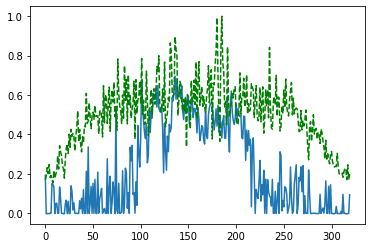

Time taken for epoch:  150.7847831249237
Epoch = [ 11/3000]  Iter = [   0/39480]  Loss = 0.2447 Avg Loss = 0.2447  Time = 0.0676s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 11/3000]  Iter = [ 100/39480]  Loss = 0.2531 Avg Loss = 0.2238  Time = 0.0033s
Epoch = [ 11/3000]  Iter = [ 200/39480]  Loss = 0.2154 Avg Loss = 0.2202  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [ 300/39480]  Loss = 0.2295 Avg Loss = 0.2221  Time = 0.0036s
Epoch = [ 11/3000]  Iter = [ 400/39480]  Loss = 0.1986 Avg Loss = 0.2198  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [ 500/39480]  Loss = 0.2546 Avg Loss = 0.2149  Time = 0.0032s
Epoch = [ 11/3000]  Iter = [ 600/39480]  Loss = 0.1913 Avg Loss = 0.2154  Time = 0.0031s
Epoch = [ 11/3000]  Iter = [ 700/39480]  Loss = 0.2258 Avg Loss = 0.215  Time = 0.0031s
Epoch = [ 11/3000]  Iter = [ 800/39480]  Loss = 0.1775 Avg Loss = 0.219  Time = 0.0063s
Epoch = [ 11/3000]  Iter = [ 900/39480]  Loss = 0.2105 Avg Loss = 0.2131  Time = 0.0036s
Epoch = [ 11/3000]  Iter = [1000/39480]  Loss = 0.1973 Avg Loss = 0.2178  Time = 0.0032s
Epoch = [ 11/3000]  Iter = [1100/39480]  Loss = 0.2245 Avg Loss = 0.2205  Time = 0.0030s
Epoch = [ 11/3000]  Ite

Epoch = [ 11/3000]  Iter = [9400/39480]  Loss = 0.2227 Avg Loss = 0.2178  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [9500/39480]  Loss = 0.2171 Avg Loss = 0.2173  Time = 0.0033s
Epoch = [ 11/3000]  Iter = [9600/39480]  Loss = 0.2331 Avg Loss = 0.2208  Time = 0.0031s
Epoch = [ 11/3000]  Iter = [9700/39480]  Loss = 0.1919 Avg Loss = 0.216  Time = 0.0036s
Epoch = [ 11/3000]  Iter = [9800/39480]  Loss = 0.2066 Avg Loss = 0.2175  Time = 0.0028s
Epoch = [ 11/3000]  Iter = [9900/39480]  Loss = 0.2384 Avg Loss = 0.2175  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [10000/39480]  Loss = 0.229 Avg Loss = 0.2198  Time = 0.0032s
Epoch = [ 11/3000]  Iter = [10100/39480]  Loss = 0.2486 Avg Loss = 0.2226  Time = 0.0029s
Epoch = [ 11/3000]  Iter = [10200/39480]  Loss = 0.1555 Avg Loss = 0.2153  Time = 0.0029s
Epoch = [ 11/3000]  Iter = [10300/39480]  Loss = 0.2168 Avg Loss = 0.2144  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [10400/39480]  Loss = 0.2421 Avg Loss = 0.2186  Time = 0.0031s
Epoch = [ 11/3000]

Epoch = [ 11/3000]  Iter = [18600/39480]  Loss = 0.2183 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 11/3000]  Iter = [18700/39480]  Loss = 0.2226 Avg Loss = 0.2139  Time = 0.0029s
Epoch = [ 11/3000]  Iter = [18800/39480]  Loss = 0.2126 Avg Loss = 0.213  Time = 0.0032s
Epoch = [ 11/3000]  Iter = [18900/39480]  Loss = 0.2309 Avg Loss = 0.2171  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [19000/39480]  Loss = 0.2329 Avg Loss = 0.2155  Time = 0.0032s
Epoch = [ 11/3000]  Iter = [19100/39480]  Loss = 0.1876 Avg Loss = 0.2167  Time = 0.0032s
Epoch = [ 11/3000]  Iter = [19200/39480]  Loss = 0.2163 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 11/3000]  Iter = [19300/39480]  Loss = 0.1878 Avg Loss = 0.2161  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [19400/39480]  Loss = 0.1905 Avg Loss = 0.2192  Time = 0.0032s
Epoch = [ 11/3000]  Iter = [19500/39480]  Loss = 0.193 Avg Loss = 0.2192  Time = 0.0027s
Epoch = [ 11/3000]  Iter = [19600/39480]  Loss = 0.2279 Avg Loss = 0.2169  Time = 0.0032s
Epoch = [ 11/

Epoch = [ 11/3000]  Iter = [27800/39480]  Loss = 0.2409 Avg Loss = 0.2215  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [27900/39480]  Loss = 0.2277 Avg Loss = 0.2211  Time = 0.0023s
Epoch = [ 11/3000]  Iter = [28000/39480]  Loss = 0.2259 Avg Loss = 0.2149  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [28100/39480]  Loss = 0.2488 Avg Loss = 0.2189  Time = 0.0028s
Epoch = [ 11/3000]  Iter = [28200/39480]  Loss = 0.1927 Avg Loss = 0.2151  Time = 0.0023s
Epoch = [ 11/3000]  Iter = [28300/39480]  Loss = 0.2039 Avg Loss = 0.2147  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [28400/39480]  Loss = 0.2127 Avg Loss = 0.2193  Time = 0.0023s
Epoch = [ 11/3000]  Iter = [28500/39480]  Loss = 0.2077 Avg Loss = 0.2146  Time = 0.0022s
Epoch = [ 11/3000]  Iter = [28600/39480]  Loss = 0.2305 Avg Loss = 0.2199  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [28700/39480]  Loss = 0.2347 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 11/3000]  Iter = [28800/39480]  Loss = 0.1913 Avg Loss = 0.2168  Time = 0.0043s
Epoch = [ 

Epoch = [ 11/3000]  Iter = [37000/39480]  Loss = 0.2246 Avg Loss = 0.2221  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [37100/39480]  Loss = 0.2045 Avg Loss = 0.2206  Time = 0.0029s
Epoch = [ 11/3000]  Iter = [37200/39480]  Loss = 0.1897 Avg Loss = 0.2249  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [37300/39480]  Loss = 0.1933 Avg Loss = 0.2185  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [37400/39480]  Loss = 0.2343 Avg Loss = 0.2214  Time = 0.0029s
Epoch = [ 11/3000]  Iter = [37500/39480]  Loss = 0.221 Avg Loss = 0.2238  Time = 0.0031s
Epoch = [ 11/3000]  Iter = [37600/39480]  Loss = 0.2246 Avg Loss = 0.2188  Time = 0.0025s
Epoch = [ 11/3000]  Iter = [37700/39480]  Loss = 0.2068 Avg Loss = 0.2172  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [37800/39480]  Loss = 0.2295 Avg Loss = 0.2167  Time = 0.0030s
Epoch = [ 11/3000]  Iter = [37900/39480]  Loss = 0.2781 Avg Loss = 0.2161  Time = 0.0032s
Epoch = [ 11/3000]  Iter = [38000/39480]  Loss = 0.1915 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 1

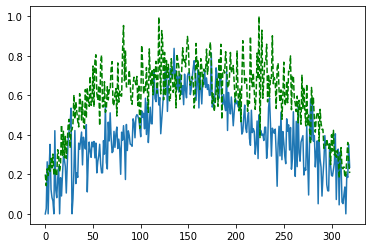

Time taken for epoch:  152.22152137756348
Epoch = [ 12/3000]  Iter = [   0/39480]  Loss = 0.2188 Avg Loss = 0.2188  Time = 0.1250s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 12/3000]  Iter = [ 100/39480]  Loss = 0.2216 Avg Loss = 0.2163  Time = 0.0031s
Epoch = [ 12/3000]  Iter = [ 200/39480]  Loss = 0.2249 Avg Loss = 0.2198  Time = 0.0033s
Epoch = [ 12/3000]  Iter = [ 300/39480]  Loss = 0.1956 Avg Loss = 0.2214  Time = 0.0032s
Epoch = [ 12/3000]  Iter = [ 400/39480]  Loss = 0.2334 Avg Loss = 0.2206  Time = 0.0034s
Epoch = [ 12/3000]  Iter = [ 500/39480]  Loss = 0.249 Avg Loss = 0.223  Time = 0.0032s
Epoch = [ 12/3000]  Iter = [ 600/39480]  Loss = 0.1996 Avg Loss = 0.2208  Time = 0.0033s
Epoch = [ 12/3000]  Iter = [ 700/39480]  Loss = 0.2585 Avg Loss = 0.2198  Time = 0.0034s
Epoch = [ 12/3000]  Iter = [ 800/39480]  Loss = 0.214 Avg Loss = 0.2149  Time = 0.0031s
Epoch = [ 12/3000]  Iter = [ 900/39480]  Loss = 0.2039 Avg Loss = 0.2168  Time = 0.0030s
Epoch = [ 12/3000]  Iter = [1000/39480]  Loss = 0.2121 Avg Loss = 0.2164  Time = 0.0033s
Epoch = [ 12/3000]  Iter = [1100/39480]  Loss = 0.2161 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 12/3000]  Iter

Epoch = [ 12/3000]  Iter = [9400/39480]  Loss = 0.2287 Avg Loss = 0.2161  Time = 0.0036s
Epoch = [ 12/3000]  Iter = [9500/39480]  Loss = 0.2352 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 12/3000]  Iter = [9600/39480]  Loss = 0.2363 Avg Loss = 0.2181  Time = 0.0050s
Epoch = [ 12/3000]  Iter = [9700/39480]  Loss = 0.2115 Avg Loss = 0.2206  Time = 0.0033s
Epoch = [ 12/3000]  Iter = [9800/39480]  Loss = 0.2163 Avg Loss = 0.2175  Time = 0.0030s
Epoch = [ 12/3000]  Iter = [9900/39480]  Loss = 0.253 Avg Loss = 0.2172  Time = 0.0034s
Epoch = [ 12/3000]  Iter = [10000/39480]  Loss = 0.2127 Avg Loss = 0.2199  Time = 0.0031s
Epoch = [ 12/3000]  Iter = [10100/39480]  Loss = 0.2387 Avg Loss = 0.2153  Time = 0.0031s
Epoch = [ 12/3000]  Iter = [10200/39480]  Loss = 0.2288 Avg Loss = 0.2171  Time = 0.0038s
Epoch = [ 12/3000]  Iter = [10300/39480]  Loss = 0.1969 Avg Loss = 0.2188  Time = 0.0030s
Epoch = [ 12/3000]  Iter = [10400/39480]  Loss = 0.2059 Avg Loss = 0.2161  Time = 0.0030s
Epoch = [ 12/3000

Epoch = [ 12/3000]  Iter = [18600/39480]  Loss = 0.2199 Avg Loss = 0.2188  Time = 0.0080s
Epoch = [ 12/3000]  Iter = [18700/39480]  Loss = 0.2134 Avg Loss = 0.2178  Time = 0.0033s
Epoch = [ 12/3000]  Iter = [18800/39480]  Loss = 0.2351 Avg Loss = 0.221  Time = 0.0030s
Epoch = [ 12/3000]  Iter = [18900/39480]  Loss = 0.222 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 12/3000]  Iter = [19000/39480]  Loss = 0.2315 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 12/3000]  Iter = [19100/39480]  Loss = 0.1994 Avg Loss = 0.2168  Time = 0.0032s
Epoch = [ 12/3000]  Iter = [19200/39480]  Loss = 0.1812 Avg Loss = 0.2173  Time = 0.0035s
Epoch = [ 12/3000]  Iter = [19300/39480]  Loss = 0.1951 Avg Loss = 0.2184  Time = 0.0042s
Epoch = [ 12/3000]  Iter = [19400/39480]  Loss = 0.2445 Avg Loss = 0.2204  Time = 0.0032s
Epoch = [ 12/3000]  Iter = [19500/39480]  Loss = 0.21 Avg Loss = 0.2201  Time = 0.0032s
Epoch = [ 12/3000]  Iter = [19600/39480]  Loss = 0.2114 Avg Loss = 0.2193  Time = 0.0021s
Epoch = [ 12/300

Epoch = [ 12/3000]  Iter = [27800/39480]  Loss = 0.1917 Avg Loss = 0.2156  Time = 0.0019s
Epoch = [ 12/3000]  Iter = [27900/39480]  Loss = 0.2034 Avg Loss = 0.2176  Time = 0.0028s
Epoch = [ 12/3000]  Iter = [28000/39480]  Loss = 0.2941 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 12/3000]  Iter = [28100/39480]  Loss = 0.2116 Avg Loss = 0.2171  Time = 0.0073s
Epoch = [ 12/3000]  Iter = [28200/39480]  Loss = 0.2152 Avg Loss = 0.2205  Time = 0.0084s
Epoch = [ 12/3000]  Iter = [28300/39480]  Loss = 0.2252 Avg Loss = 0.2192  Time = 0.0023s
Epoch = [ 12/3000]  Iter = [28400/39480]  Loss = 0.2286 Avg Loss = 0.2182  Time = 0.0032s
Epoch = [ 12/3000]  Iter = [28500/39480]  Loss = 0.1801 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 12/3000]  Iter = [28600/39480]  Loss = 0.1996 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 12/3000]  Iter = [28700/39480]  Loss = 0.1929 Avg Loss = 0.2225  Time = 0.0050s
Epoch = [ 12/3000]  Iter = [28800/39480]  Loss = 0.2082 Avg Loss = 0.2167  Time = 0.0020s
Epoch = [ 

Epoch = [ 12/3000]  Iter = [37000/39480]  Loss = 0.2027 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 12/3000]  Iter = [37100/39480]  Loss = 0.2116 Avg Loss = 0.216  Time = 0.0027s
Epoch = [ 12/3000]  Iter = [37200/39480]  Loss = 0.2191 Avg Loss = 0.2172  Time = 0.0030s
Epoch = [ 12/3000]  Iter = [37300/39480]  Loss = 0.2312 Avg Loss = 0.2217  Time = 0.0043s
Epoch = [ 12/3000]  Iter = [37400/39480]  Loss = 0.2585 Avg Loss = 0.2183  Time = 0.0033s
Epoch = [ 12/3000]  Iter = [37500/39480]  Loss = 0.2491 Avg Loss = 0.2206  Time = 0.0035s
Epoch = [ 12/3000]  Iter = [37600/39480]  Loss = 0.1968 Avg Loss = 0.2197  Time = 0.0022s
Epoch = [ 12/3000]  Iter = [37700/39480]  Loss = 0.2058 Avg Loss = 0.219  Time = 0.0020s
Epoch = [ 12/3000]  Iter = [37800/39480]  Loss = 0.2131 Avg Loss = 0.2252  Time = 0.0019s
Epoch = [ 12/3000]  Iter = [37900/39480]  Loss = 0.1976 Avg Loss = 0.2173  Time = 0.0020s
Epoch = [ 12/3000]  Iter = [38000/39480]  Loss = 0.2188 Avg Loss = 0.218  Time = 0.0028s
Epoch = [ 12/

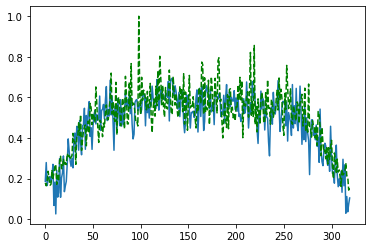

Time taken for epoch:  153.31769919395447
Epoch = [ 13/3000]  Iter = [   0/39480]  Loss = 0.1757 Avg Loss = 0.1757  Time = 0.0963s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 13/3000]  Iter = [ 100/39480]  Loss = 0.2062 Avg Loss = 0.2002  Time = 0.0030s
Epoch = [ 13/3000]  Iter = [ 200/39480]  Loss = 0.2272 Avg Loss = 0.2153  Time = 0.0031s
Epoch = [ 13/3000]  Iter = [ 300/39480]  Loss = 0.2251 Avg Loss = 0.2197  Time = 0.0031s
Epoch = [ 13/3000]  Iter = [ 400/39480]  Loss = 0.2038 Avg Loss = 0.2193  Time = 0.0047s
Epoch = [ 13/3000]  Iter = [ 500/39480]  Loss = 0.2102 Avg Loss = 0.2188  Time = 0.0025s
Epoch = [ 13/3000]  Iter = [ 600/39480]  Loss = 0.1921 Avg Loss = 0.2135  Time = 0.0031s
Epoch = [ 13/3000]  Iter = [ 700/39480]  Loss = 0.2457 Avg Loss = 0.2144  Time = 0.0033s
Epoch = [ 13/3000]  Iter = [ 800/39480]  Loss = 0.1767 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [ 13/3000]  Iter = [ 900/39480]  Loss = 0.2103 Avg Loss = 0.216  Time = 0.0030s
Epoch = [ 13/3000]  Iter = [1000/39480]  Loss = 0.1999 Avg Loss = 0.2155  Time = 0.0039s
Epoch = [ 13/3000]  Iter = [1100/39480]  Loss = 0.1868 Avg Loss = 0.2153  Time = 0.0033s
Epoch = [ 13/3000]  It

Epoch = [ 13/3000]  Iter = [9400/39480]  Loss = 0.2605 Avg Loss = 0.2195  Time = 0.0023s
Epoch = [ 13/3000]  Iter = [9500/39480]  Loss = 0.2807 Avg Loss = 0.2185  Time = 0.0020s
Epoch = [ 13/3000]  Iter = [9600/39480]  Loss = 0.2681 Avg Loss = 0.2159  Time = 0.0028s
Epoch = [ 13/3000]  Iter = [9700/39480]  Loss = 0.2055 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 13/3000]  Iter = [9800/39480]  Loss = 0.1829 Avg Loss = 0.2149  Time = 0.0048s
Epoch = [ 13/3000]  Iter = [9900/39480]  Loss = 0.215 Avg Loss = 0.218  Time = 0.0047s
Epoch = [ 13/3000]  Iter = [10000/39480]  Loss = 0.2328 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 13/3000]  Iter = [10100/39480]  Loss = 0.2551 Avg Loss = 0.2213  Time = 0.0031s
Epoch = [ 13/3000]  Iter = [10200/39480]  Loss = 0.233 Avg Loss = 0.2165  Time = 0.0029s
Epoch = [ 13/3000]  Iter = [10300/39480]  Loss = 0.243 Avg Loss = 0.22  Time = 0.0029s
Epoch = [ 13/3000]  Iter = [10400/39480]  Loss = 0.2307 Avg Loss = 0.2185  Time = 0.0032s
Epoch = [ 13/3000]  It

Epoch = [ 13/3000]  Iter = [18600/39480]  Loss = 0.2684 Avg Loss = 0.2229  Time = 0.0026s
Epoch = [ 13/3000]  Iter = [18700/39480]  Loss = 0.1954 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 13/3000]  Iter = [18800/39480]  Loss = 0.1946 Avg Loss = 0.2209  Time = 0.0025s
Epoch = [ 13/3000]  Iter = [18900/39480]  Loss = 0.2299 Avg Loss = 0.2179  Time = 0.0031s
Epoch = [ 13/3000]  Iter = [19000/39480]  Loss = 0.2117 Avg Loss = 0.2178  Time = 0.0030s
Epoch = [ 13/3000]  Iter = [19100/39480]  Loss = 0.2264 Avg Loss = 0.2166  Time = 0.0030s
Epoch = [ 13/3000]  Iter = [19200/39480]  Loss = 0.2253 Avg Loss = 0.2207  Time = 0.0025s
Epoch = [ 13/3000]  Iter = [19300/39480]  Loss = 0.2156 Avg Loss = 0.2204  Time = 0.0030s
Epoch = [ 13/3000]  Iter = [19400/39480]  Loss = 0.2055 Avg Loss = 0.2191  Time = 0.0040s
Epoch = [ 13/3000]  Iter = [19500/39480]  Loss = 0.2324 Avg Loss = 0.2196  Time = 0.0028s
Epoch = [ 13/3000]  Iter = [19600/39480]  Loss = 0.2281 Avg Loss = 0.2215  Time = 0.0032s
Epoch = [ 

Epoch = [ 13/3000]  Iter = [27800/39480]  Loss = 0.2231 Avg Loss = 0.2192  Time = 0.0032s
Epoch = [ 13/3000]  Iter = [27900/39480]  Loss = 0.2491 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 13/3000]  Iter = [28000/39480]  Loss = 0.2157 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 13/3000]  Iter = [28100/39480]  Loss = 0.2046 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 13/3000]  Iter = [28200/39480]  Loss = 0.2017 Avg Loss = 0.2174  Time = 0.0030s
Epoch = [ 13/3000]  Iter = [28300/39480]  Loss = 0.2134 Avg Loss = 0.2184  Time = 0.0036s
Epoch = [ 13/3000]  Iter = [28400/39480]  Loss = 0.2177 Avg Loss = 0.2194  Time = 0.0032s
Epoch = [ 13/3000]  Iter = [28500/39480]  Loss = 0.1909 Avg Loss = 0.2167  Time = 0.0030s
Epoch = [ 13/3000]  Iter = [28600/39480]  Loss = 0.2332 Avg Loss = 0.2176  Time = 0.0032s
Epoch = [ 13/3000]  Iter = [28700/39480]  Loss = 0.1907 Avg Loss = 0.2205  Time = 0.0032s
Epoch = [ 13/3000]  Iter = [28800/39480]  Loss = 0.2247 Avg Loss = 0.2208  Time = 0.0034s
Epoch = [ 

Epoch = [ 13/3000]  Iter = [37000/39480]  Loss = 0.2061 Avg Loss = 0.2174  Time = 0.0028s
Epoch = [ 13/3000]  Iter = [37100/39480]  Loss = 0.2308 Avg Loss = 0.2189  Time = 0.0032s
Epoch = [ 13/3000]  Iter = [37200/39480]  Loss = 0.2022 Avg Loss = 0.2173  Time = 0.0032s
Epoch = [ 13/3000]  Iter = [37300/39480]  Loss = 0.2167 Avg Loss = 0.2156  Time = 0.0030s
Epoch = [ 13/3000]  Iter = [37400/39480]  Loss = 0.2433 Avg Loss = 0.2171  Time = 0.0036s
Epoch = [ 13/3000]  Iter = [37500/39480]  Loss = 0.2237 Avg Loss = 0.2163  Time = 0.0036s
Epoch = [ 13/3000]  Iter = [37600/39480]  Loss = 0.2256 Avg Loss = 0.2212  Time = 0.0030s
Epoch = [ 13/3000]  Iter = [37700/39480]  Loss = 0.2338 Avg Loss = 0.2161  Time = 0.0033s
Epoch = [ 13/3000]  Iter = [37800/39480]  Loss = 0.2407 Avg Loss = 0.2181  Time = 0.0033s
Epoch = [ 13/3000]  Iter = [37900/39480]  Loss = 0.2522 Avg Loss = 0.2162  Time = 0.0033s
Epoch = [ 13/3000]  Iter = [38000/39480]  Loss = 0.2193 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [ 

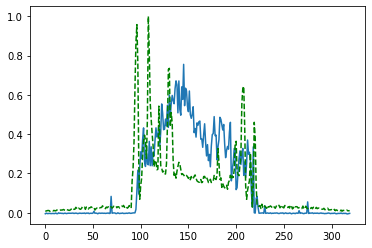

Time taken for epoch:  154.52924609184265
Epoch = [ 14/3000]  Iter = [   0/39480]  Loss = 0.2234 Avg Loss = 0.2234  Time = 0.1316s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 14/3000]  Iter = [ 100/39480]  Loss = 0.2178 Avg Loss = 0.2215  Time = 0.0033s
Epoch = [ 14/3000]  Iter = [ 200/39480]  Loss = 0.2096 Avg Loss = 0.2221  Time = 0.0035s
Epoch = [ 14/3000]  Iter = [ 300/39480]  Loss = 0.207 Avg Loss = 0.2178  Time = 0.0056s
Epoch = [ 14/3000]  Iter = [ 400/39480]  Loss = 0.2157 Avg Loss = 0.2169  Time = 0.0036s
Epoch = [ 14/3000]  Iter = [ 500/39480]  Loss = 0.1998 Avg Loss = 0.2158  Time = 0.0076s
Epoch = [ 14/3000]  Iter = [ 600/39480]  Loss = 0.2164 Avg Loss = 0.2182  Time = 0.0034s
Epoch = [ 14/3000]  Iter = [ 700/39480]  Loss = 0.2249 Avg Loss = 0.2176  Time = 0.0030s
Epoch = [ 14/3000]  Iter = [ 800/39480]  Loss = 0.2301 Avg Loss = 0.2165  Time = 0.0026s
Epoch = [ 14/3000]  Iter = [ 900/39480]  Loss = 0.2326 Avg Loss = 0.2174  Time = 0.0027s
Epoch = [ 14/3000]  Iter = [1000/39480]  Loss = 0.2293 Avg Loss = 0.2165  Time = 0.0027s
Epoch = [ 14/3000]  Iter = [1100/39480]  Loss = 0.3355 Avg Loss = 0.2168  Time = 0.0026s
Epoch = [ 14/3000]  It

Epoch = [ 14/3000]  Iter = [9400/39480]  Loss = 0.1991 Avg Loss = 0.221  Time = 0.0026s
Epoch = [ 14/3000]  Iter = [9500/39480]  Loss = 0.2335 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [9600/39480]  Loss = 0.1956 Avg Loss = 0.2187  Time = 0.0042s
Epoch = [ 14/3000]  Iter = [9700/39480]  Loss = 0.2194 Avg Loss = 0.226  Time = 0.0030s
Epoch = [ 14/3000]  Iter = [9800/39480]  Loss = 0.2075 Avg Loss = 0.2194  Time = 0.0073s
Epoch = [ 14/3000]  Iter = [9900/39480]  Loss = 0.2379 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 14/3000]  Iter = [10000/39480]  Loss = 0.206 Avg Loss = 0.2195  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [10100/39480]  Loss = 0.2203 Avg Loss = 0.2188  Time = 0.0024s
Epoch = [ 14/3000]  Iter = [10200/39480]  Loss = 0.2106 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [10300/39480]  Loss = 0.2435 Avg Loss = 0.2188  Time = 0.0032s
Epoch = [ 14/3000]  Iter = [10400/39480]  Loss = 0.2344 Avg Loss = 0.2161  Time = 0.0031s
Epoch = [ 14/3000] 

Epoch = [ 14/3000]  Iter = [18600/39480]  Loss = 0.2398 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [18700/39480]  Loss = 0.25 Avg Loss = 0.2233  Time = 0.0032s
Epoch = [ 14/3000]  Iter = [18800/39480]  Loss = 0.2218 Avg Loss = 0.2172  Time = 0.0032s
Epoch = [ 14/3000]  Iter = [18900/39480]  Loss = 0.1977 Avg Loss = 0.2149  Time = 0.0033s
Epoch = [ 14/3000]  Iter = [19000/39480]  Loss = 0.2025 Avg Loss = 0.2159  Time = 0.0032s
Epoch = [ 14/3000]  Iter = [19100/39480]  Loss = 0.2131 Avg Loss = 0.2184  Time = 0.0032s
Epoch = [ 14/3000]  Iter = [19200/39480]  Loss = 0.1994 Avg Loss = 0.2227  Time = 0.0030s
Epoch = [ 14/3000]  Iter = [19300/39480]  Loss = 0.2278 Avg Loss = 0.2219  Time = 0.0033s
Epoch = [ 14/3000]  Iter = [19400/39480]  Loss = 0.2196 Avg Loss = 0.216  Time = 0.0030s
Epoch = [ 14/3000]  Iter = [19500/39480]  Loss = 0.2108 Avg Loss = 0.2177  Time = 0.0025s
Epoch = [ 14/3000]  Iter = [19600/39480]  Loss = 0.189 Avg Loss = 0.2204  Time = 0.0030s
Epoch = [ 14/3

Epoch = [ 14/3000]  Iter = [27800/39480]  Loss = 0.2469 Avg Loss = 0.2176  Time = 0.0030s
Epoch = [ 14/3000]  Iter = [27900/39480]  Loss = 0.2276 Avg Loss = 0.2216  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [28000/39480]  Loss = 0.2331 Avg Loss = 0.2251  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [28100/39480]  Loss = 0.2073 Avg Loss = 0.2159  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [28200/39480]  Loss = 0.2216 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [28300/39480]  Loss = 0.2192 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [ 14/3000]  Iter = [28400/39480]  Loss = 0.2145 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [28500/39480]  Loss = 0.2055 Avg Loss = 0.2152  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [28600/39480]  Loss = 0.2213 Avg Loss = 0.2165  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [28700/39480]  Loss = 0.2058 Avg Loss = 0.2152  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [28800/39480]  Loss = 0.2476 Avg Loss = 0.2211  Time = 0.0029s
Epoch = [ 1

Epoch = [ 14/3000]  Iter = [37000/39480]  Loss = 0.1869 Avg Loss = 0.2149  Time = 0.0032s
Epoch = [ 14/3000]  Iter = [37100/39480]  Loss = 0.2038 Avg Loss = 0.2173  Time = 0.0031s
Epoch = [ 14/3000]  Iter = [37200/39480]  Loss = 0.229 Avg Loss = 0.2198  Time = 0.0033s
Epoch = [ 14/3000]  Iter = [37300/39480]  Loss = 0.2201 Avg Loss = 0.219  Time = 0.0033s
Epoch = [ 14/3000]  Iter = [37400/39480]  Loss = 0.2163 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [37500/39480]  Loss = 0.2079 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [37600/39480]  Loss = 0.217 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 14/3000]  Iter = [37700/39480]  Loss = 0.2117 Avg Loss = 0.2156  Time = 0.0030s
Epoch = [ 14/3000]  Iter = [37800/39480]  Loss = 0.1893 Avg Loss = 0.2162  Time = 0.0030s
Epoch = [ 14/3000]  Iter = [37900/39480]  Loss = 0.2184 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 14/3000]  Iter = [38000/39480]  Loss = 0.2151 Avg Loss = 0.2137  Time = 0.0030s
Epoch = [ 14/

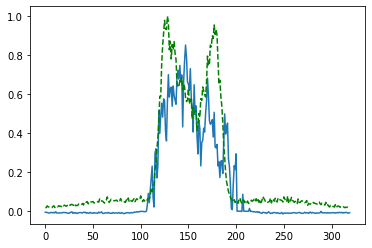

Time taken for epoch:  146.71483373641968
Epoch = [ 15/3000]  Iter = [   0/39480]  Loss = 0.1778 Avg Loss = 0.1778  Time = 0.0802s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 15/3000]  Iter = [ 100/39480]  Loss = 0.2012 Avg Loss = 0.2076  Time = 0.0030s
Epoch = [ 15/3000]  Iter = [ 200/39480]  Loss = 0.2299 Avg Loss = 0.2113  Time = 0.0031s
Epoch = [ 15/3000]  Iter = [ 300/39480]  Loss = 0.2156 Avg Loss = 0.215  Time = 0.0030s
Epoch = [ 15/3000]  Iter = [ 400/39480]  Loss = 0.1964 Avg Loss = 0.2185  Time = 0.0030s
Epoch = [ 15/3000]  Iter = [ 500/39480]  Loss = 0.2064 Avg Loss = 0.2235  Time = 0.0031s
Epoch = [ 15/3000]  Iter = [ 600/39480]  Loss = 0.1914 Avg Loss = 0.2211  Time = 0.0030s
Epoch = [ 15/3000]  Iter = [ 700/39480]  Loss = 0.2157 Avg Loss = 0.222  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [ 800/39480]  Loss = 0.212 Avg Loss = 0.2175  Time = 0.0030s
Epoch = [ 15/3000]  Iter = [ 900/39480]  Loss = 0.2631 Avg Loss = 0.2157  Time = 0.0030s
Epoch = [ 15/3000]  Iter = [1000/39480]  Loss = 0.2226 Avg Loss = 0.2167  Time = 0.0030s
Epoch = [ 15/3000]  Iter = [1100/39480]  Loss = 0.2267 Avg Loss = 0.2159  Time = 0.0030s
Epoch = [ 15/3000]  Iter

Epoch = [ 15/3000]  Iter = [9400/39480]  Loss = 0.2131 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [9500/39480]  Loss = 0.2812 Avg Loss = 0.2194  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [9600/39480]  Loss = 0.2178 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [9700/39480]  Loss = 0.2497 Avg Loss = 0.2153  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [9800/39480]  Loss = 0.2146 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [9900/39480]  Loss = 0.2029 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [10000/39480]  Loss = 0.2215 Avg Loss = 0.2221  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [10100/39480]  Loss = 0.2378 Avg Loss = 0.2208  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [10200/39480]  Loss = 0.2258 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 15/3000]  Iter = [10300/39480]  Loss = 0.2783 Avg Loss = 0.2154  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [10400/39480]  Loss = 0.1768 Avg Loss = 0.2175  Time = 0.0031s
Epoch = [ 15/3000

Epoch = [ 15/3000]  Iter = [18600/39480]  Loss = 0.2319 Avg Loss = 0.2181  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [18700/39480]  Loss = 0.2294 Avg Loss = 0.2213  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [18800/39480]  Loss = 0.1816 Avg Loss = 0.2175  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [18900/39480]  Loss = 0.2184 Avg Loss = 0.2131  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [19000/39480]  Loss = 0.2604 Avg Loss = 0.2144  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [19100/39480]  Loss = 0.1857 Avg Loss = 0.2138  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [19200/39480]  Loss = 0.2077 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [19300/39480]  Loss = 0.2667 Avg Loss = 0.2171  Time = 0.0027s
Epoch = [ 15/3000]  Iter = [19400/39480]  Loss = 0.2991 Avg Loss = 0.2207  Time = 0.0030s
Epoch = [ 15/3000]  Iter = [19500/39480]  Loss = 0.1998 Avg Loss = 0.2206  Time = 0.0028s
Epoch = [ 15/3000]  Iter = [19600/39480]  Loss = 0.2325 Avg Loss = 0.22  Time = 0.0030s
Epoch = [ 15

Epoch = [ 15/3000]  Iter = [27800/39480]  Loss = 0.1983 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [27900/39480]  Loss = 0.1774 Avg Loss = 0.2203  Time = 0.0031s
Epoch = [ 15/3000]  Iter = [28000/39480]  Loss = 0.181 Avg Loss = 0.2212  Time = 0.0030s
Epoch = [ 15/3000]  Iter = [28100/39480]  Loss = 0.22 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [28200/39480]  Loss = 0.1684 Avg Loss = 0.2208  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [28300/39480]  Loss = 0.1861 Avg Loss = 0.2157  Time = 0.0031s
Epoch = [ 15/3000]  Iter = [28400/39480]  Loss = 0.2142 Avg Loss = 0.2202  Time = 0.0030s
Epoch = [ 15/3000]  Iter = [28500/39480]  Loss = 0.2345 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [28600/39480]  Loss = 0.2457 Avg Loss = 0.215  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [28700/39480]  Loss = 0.2461 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 15/3000]  Iter = [28800/39480]  Loss = 0.2005 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [ 15/30

Epoch = [ 15/3000]  Iter = [37000/39480]  Loss = 0.2381 Avg Loss = 0.2142  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [37100/39480]  Loss = 0.2707 Avg Loss = 0.2206  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [37200/39480]  Loss = 0.1927 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [37300/39480]  Loss = 0.2403 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [37400/39480]  Loss = 0.2623 Avg Loss = 0.2206  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [37500/39480]  Loss = 0.2212 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [37600/39480]  Loss = 0.2017 Avg Loss = 0.2199  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [37700/39480]  Loss = 0.2845 Avg Loss = 0.2167  Time = 0.0025s
Epoch = [ 15/3000]  Iter = [37800/39480]  Loss = 0.1955 Avg Loss = 0.2144  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [37900/39480]  Loss = 0.2601 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [ 15/3000]  Iter = [38000/39480]  Loss = 0.2916 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 

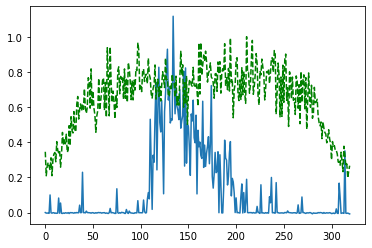

Time taken for epoch:  140.29814314842224
Epoch = [ 16/3000]  Iter = [   0/39480]  Loss = 0.2157 Avg Loss = 0.2157  Time = 0.1269s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 16/3000]  Iter = [ 100/39480]  Loss = 0.219 Avg Loss = 0.2151  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [ 200/39480]  Loss = 0.2346 Avg Loss = 0.2191  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [ 300/39480]  Loss = 0.2166 Avg Loss = 0.2224  Time = 0.0030s
Epoch = [ 16/3000]  Iter = [ 400/39480]  Loss = 0.2019 Avg Loss = 0.2174  Time = 0.0030s
Epoch = [ 16/3000]  Iter = [ 500/39480]  Loss = 0.2463 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [ 16/3000]  Iter = [ 600/39480]  Loss = 0.2244 Avg Loss = 0.2191  Time = 0.0032s
Epoch = [ 16/3000]  Iter = [ 700/39480]  Loss = 0.2089 Avg Loss = 0.2176  Time = 0.0033s
Epoch = [ 16/3000]  Iter = [ 800/39480]  Loss = 0.2208 Avg Loss = 0.2153  Time = 0.0032s
Epoch = [ 16/3000]  Iter = [ 900/39480]  Loss = 0.1971 Avg Loss = 0.2195  Time = 0.0030s
Epoch = [ 16/3000]  Iter = [1000/39480]  Loss = 0.205 Avg Loss = 0.2212  Time = 0.0030s
Epoch = [ 16/3000]  Iter = [1100/39480]  Loss = 0.1994 Avg Loss = 0.22  Time = 0.0030s
Epoch = [ 16/3000]  Iter 

Epoch = [ 16/3000]  Iter = [9400/39480]  Loss = 0.179 Avg Loss = 0.2198  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [9500/39480]  Loss = 0.2231 Avg Loss = 0.222  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [9600/39480]  Loss = 0.2371 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [9700/39480]  Loss = 0.235 Avg Loss = 0.2199  Time = 0.0031s
Epoch = [ 16/3000]  Iter = [9800/39480]  Loss = 0.2041 Avg Loss = 0.218  Time = 0.0031s
Epoch = [ 16/3000]  Iter = [9900/39480]  Loss = 0.2418 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [10000/39480]  Loss = 0.2413 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [10100/39480]  Loss = 0.219 Avg Loss = 0.2162  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [10200/39480]  Loss = 0.2126 Avg Loss = 0.2147  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [10300/39480]  Loss = 0.2011 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [10400/39480]  Loss = 0.2212 Avg Loss = 0.2159  Time = 0.0032s
Epoch = [ 16/3000]  It

Epoch = [ 16/3000]  Iter = [18600/39480]  Loss = 0.2047 Avg Loss = 0.2202  Time = 0.0031s
Epoch = [ 16/3000]  Iter = [18700/39480]  Loss = 0.2181 Avg Loss = 0.2153  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [18800/39480]  Loss = 0.2363 Avg Loss = 0.2146  Time = 0.0028s
Epoch = [ 16/3000]  Iter = [18900/39480]  Loss = 0.3004 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [19000/39480]  Loss = 0.2339 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [19100/39480]  Loss = 0.206 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [19200/39480]  Loss = 0.2346 Avg Loss = 0.2182  Time = 0.0031s
Epoch = [ 16/3000]  Iter = [19300/39480]  Loss = 0.2031 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [19400/39480]  Loss = 0.2005 Avg Loss = 0.2189  Time = 0.0031s
Epoch = [ 16/3000]  Iter = [19500/39480]  Loss = 0.1778 Avg Loss = 0.2139  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [19600/39480]  Loss = 0.1997 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 16

Epoch = [ 16/3000]  Iter = [27800/39480]  Loss = 0.227 Avg Loss = 0.2155  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [27900/39480]  Loss = 0.1848 Avg Loss = 0.2162  Time = 0.0030s
Epoch = [ 16/3000]  Iter = [28000/39480]  Loss = 0.1994 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [28100/39480]  Loss = 0.2289 Avg Loss = 0.2174  Time = 0.0032s
Epoch = [ 16/3000]  Iter = [28200/39480]  Loss = 0.192 Avg Loss = 0.2189  Time = 0.0031s
Epoch = [ 16/3000]  Iter = [28300/39480]  Loss = 0.215 Avg Loss = 0.2148  Time = 0.0032s
Epoch = [ 16/3000]  Iter = [28400/39480]  Loss = 0.1943 Avg Loss = 0.2206  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [28500/39480]  Loss = 0.1766 Avg Loss = 0.2188  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [28600/39480]  Loss = 0.224 Avg Loss = 0.2216  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [28700/39480]  Loss = 0.2362 Avg Loss = 0.2168  Time = 0.0023s
Epoch = [ 16/3000]  Iter = [28800/39480]  Loss = 0.1966 Avg Loss = 0.2145  Time = 0.0031s
Epoch = [ 16/3

Epoch = [ 16/3000]  Iter = [37000/39480]  Loss = 0.2451 Avg Loss = 0.2206  Time = 0.0032s
Epoch = [ 16/3000]  Iter = [37100/39480]  Loss = 0.2063 Avg Loss = 0.2161  Time = 0.0028s
Epoch = [ 16/3000]  Iter = [37200/39480]  Loss = 0.2213 Avg Loss = 0.2168  Time = 0.0031s
Epoch = [ 16/3000]  Iter = [37300/39480]  Loss = 0.2332 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [37400/39480]  Loss = 0.2257 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 16/3000]  Iter = [37500/39480]  Loss = 0.2509 Avg Loss = 0.2216  Time = 0.0030s
Epoch = [ 16/3000]  Iter = [37600/39480]  Loss = 0.2115 Avg Loss = 0.217  Time = 0.0030s
Epoch = [ 16/3000]  Iter = [37700/39480]  Loss = 0.2301 Avg Loss = 0.221  Time = 0.0029s
Epoch = [ 16/3000]  Iter = [37800/39480]  Loss = 0.1948 Avg Loss = 0.2243  Time = 0.0031s
Epoch = [ 16/3000]  Iter = [37900/39480]  Loss = 0.2146 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [ 16/3000]  Iter = [38000/39480]  Loss = 0.1903 Avg Loss = 0.216  Time = 0.0032s
Epoch = [ 16/

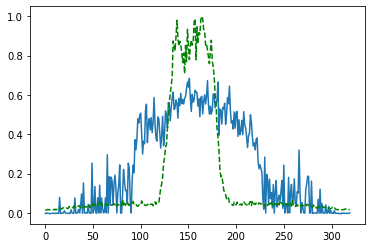

Time taken for epoch:  141.22207069396973
Epoch = [ 17/3000]  Iter = [   0/39480]  Loss = 0.1917 Avg Loss = 0.1917  Time = 0.1027s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 17/3000]  Iter = [ 100/39480]  Loss = 0.1905 Avg Loss = 0.2063  Time = 0.0030s
Epoch = [ 17/3000]  Iter = [ 200/39480]  Loss = 0.2274 Avg Loss = 0.2119  Time = 0.0030s
Epoch = [ 17/3000]  Iter = [ 300/39480]  Loss = 0.2041 Avg Loss = 0.2199  Time = 0.0033s
Epoch = [ 17/3000]  Iter = [ 400/39480]  Loss = 0.2456 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 17/3000]  Iter = [ 500/39480]  Loss = 0.2239 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 17/3000]  Iter = [ 600/39480]  Loss = 0.2028 Avg Loss = 0.2188  Time = 0.0030s
Epoch = [ 17/3000]  Iter = [ 700/39480]  Loss = 0.1929 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [ 17/3000]  Iter = [ 800/39480]  Loss = 0.2285 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 17/3000]  Iter = [ 900/39480]  Loss = 0.2304 Avg Loss = 0.224  Time = 0.0030s
Epoch = [ 17/3000]  Iter = [1000/39480]  Loss = 0.1988 Avg Loss = 0.2174  Time = 0.0032s
Epoch = [ 17/3000]  Iter = [1100/39480]  Loss = 0.1825 Avg Loss = 0.2161  Time = 0.0030s
Epoch = [ 17/3000]  Ite

Epoch = [ 17/3000]  Iter = [9400/39480]  Loss = 0.2017 Avg Loss = 0.2164  Time = 0.0035s
Epoch = [ 17/3000]  Iter = [9500/39480]  Loss = 0.2261 Avg Loss = 0.214  Time = 0.0031s
Epoch = [ 17/3000]  Iter = [9600/39480]  Loss = 0.203 Avg Loss = 0.221  Time = 0.0031s
Epoch = [ 17/3000]  Iter = [9700/39480]  Loss = 0.1875 Avg Loss = 0.2173  Time = 0.0032s
Epoch = [ 17/3000]  Iter = [9800/39480]  Loss = 0.2232 Avg Loss = 0.2165  Time = 0.0032s
Epoch = [ 17/3000]  Iter = [9900/39480]  Loss = 0.2656 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [ 17/3000]  Iter = [10000/39480]  Loss = 0.2432 Avg Loss = 0.2187  Time = 0.0030s
Epoch = [ 17/3000]  Iter = [10100/39480]  Loss = 0.2311 Avg Loss = 0.2197  Time = 0.0030s
Epoch = [ 17/3000]  Iter = [10200/39480]  Loss = 0.1748 Avg Loss = 0.2193  Time = 0.0032s
Epoch = [ 17/3000]  Iter = [10300/39480]  Loss = 0.2243 Avg Loss = 0.2185  Time = 0.0030s
Epoch = [ 17/3000]  Iter = [10400/39480]  Loss = 0.1938 Avg Loss = 0.2175  Time = 0.0028s
Epoch = [ 17/3000] 

Epoch = [ 17/3000]  Iter = [18600/39480]  Loss = 0.2208 Avg Loss = 0.2187  Time = 0.0029s
Epoch = [ 17/3000]  Iter = [18700/39480]  Loss = 0.2409 Avg Loss = 0.2216  Time = 0.0029s
Epoch = [ 17/3000]  Iter = [18800/39480]  Loss = 0.1817 Avg Loss = 0.217  Time = 0.0031s
Epoch = [ 17/3000]  Iter = [18900/39480]  Loss = 0.2635 Avg Loss = 0.2139  Time = 0.0029s
Epoch = [ 17/3000]  Iter = [19000/39480]  Loss = 0.2315 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [ 17/3000]  Iter = [19100/39480]  Loss = 0.2254 Avg Loss = 0.2227  Time = 0.0029s
Epoch = [ 17/3000]  Iter = [19200/39480]  Loss = 0.2824 Avg Loss = 0.2179  Time = 0.0028s
Epoch = [ 17/3000]  Iter = [19300/39480]  Loss = 0.2402 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 17/3000]  Iter = [19400/39480]  Loss = 0.206 Avg Loss = 0.2261  Time = 0.0029s
Epoch = [ 17/3000]  Iter = [19500/39480]  Loss = 0.1802 Avg Loss = 0.2201  Time = 0.0031s
Epoch = [ 17/3000]  Iter = [19600/39480]  Loss = 0.2423 Avg Loss = 0.2255  Time = 0.0029s
Epoch = [ 17

Epoch = [ 17/3000]  Iter = [27800/39480]  Loss = 0.2317 Avg Loss = 0.2149  Time = 0.0030s
Epoch = [ 17/3000]  Iter = [27900/39480]  Loss = 0.2157 Avg Loss = 0.2141  Time = 0.0029s
Epoch = [ 17/3000]  Iter = [28000/39480]  Loss = 0.2006 Avg Loss = 0.2174  Time = 0.0027s
Epoch = [ 17/3000]  Iter = [28100/39480]  Loss = 0.246 Avg Loss = 0.2154  Time = 0.0028s
Epoch = [ 17/3000]  Iter = [28200/39480]  Loss = 0.2401 Avg Loss = 0.2165  Time = 0.0029s
Epoch = [ 17/3000]  Iter = [28300/39480]  Loss = 0.237 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 17/3000]  Iter = [28400/39480]  Loss = 0.1988 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 17/3000]  Iter = [28500/39480]  Loss = 0.1948 Avg Loss = 0.2204  Time = 0.0031s
Epoch = [ 17/3000]  Iter = [28600/39480]  Loss = 0.1901 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [ 17/3000]  Iter = [28700/39480]  Loss = 0.2067 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 17/3000]  Iter = [28800/39480]  Loss = 0.2582 Avg Loss = 0.2202  Time = 0.0029s
Epoch = [ 17/3

Epoch = [ 17/3000]  Iter = [37000/39480]  Loss = 0.2325 Avg Loss = 0.2182  Time = 0.0032s
Epoch = [ 17/3000]  Iter = [37100/39480]  Loss = 0.2049 Avg Loss = 0.2152  Time = 0.0034s
Epoch = [ 17/3000]  Iter = [37200/39480]  Loss = 0.2329 Avg Loss = 0.2196  Time = 0.0031s
Epoch = [ 17/3000]  Iter = [37300/39480]  Loss = 0.1833 Avg Loss = 0.2207  Time = 0.0031s
Epoch = [ 17/3000]  Iter = [37400/39480]  Loss = 0.2353 Avg Loss = 0.2165  Time = 0.0034s
Epoch = [ 17/3000]  Iter = [37500/39480]  Loss = 0.2579 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 17/3000]  Iter = [37600/39480]  Loss = 0.2151 Avg Loss = 0.2234  Time = 0.0032s
Epoch = [ 17/3000]  Iter = [37700/39480]  Loss = 0.1954 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 17/3000]  Iter = [37800/39480]  Loss = 0.2411 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [ 17/3000]  Iter = [37900/39480]  Loss = 0.2186 Avg Loss = 0.2237  Time = 0.0031s
Epoch = [ 17/3000]  Iter = [38000/39480]  Loss = 0.2437 Avg Loss = 0.2149  Time = 0.0029s
Epoch = [ 

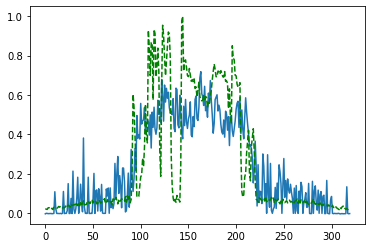

Time taken for epoch:  142.4639081954956
Epoch = [ 18/3000]  Iter = [   0/39480]  Loss = 0.2031 Avg Loss = 0.2031  Time = 0.0927s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 18/3000]  Iter = [ 100/39480]  Loss = 0.2475 Avg Loss = 0.2157  Time = 0.0030s
Epoch = [ 18/3000]  Iter = [ 200/39480]  Loss = 0.2031 Avg Loss = 0.2186  Time = 0.0031s
Epoch = [ 18/3000]  Iter = [ 300/39480]  Loss = 0.2235 Avg Loss = 0.2219  Time = 0.0033s
Epoch = [ 18/3000]  Iter = [ 400/39480]  Loss = 0.2281 Avg Loss = 0.2184  Time = 0.0030s
Epoch = [ 18/3000]  Iter = [ 500/39480]  Loss = 0.244 Avg Loss = 0.2217  Time = 0.0031s
Epoch = [ 18/3000]  Iter = [ 600/39480]  Loss = 0.212 Avg Loss = 0.2213  Time = 0.0030s
Epoch = [ 18/3000]  Iter = [ 700/39480]  Loss = 0.2017 Avg Loss = 0.2165  Time = 0.0032s
Epoch = [ 18/3000]  Iter = [ 800/39480]  Loss = 0.2192 Avg Loss = 0.2148  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [ 900/39480]  Loss = 0.2145 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [1000/39480]  Loss = 0.2051 Avg Loss = 0.2224  Time = 0.0030s
Epoch = [ 18/3000]  Iter = [1100/39480]  Loss = 0.2261 Avg Loss = 0.2226  Time = 0.0030s
Epoch = [ 18/3000]  Ite

Epoch = [ 18/3000]  Iter = [9400/39480]  Loss = 0.217 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [9500/39480]  Loss = 0.1777 Avg Loss = 0.2207  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [9600/39480]  Loss = 0.1629 Avg Loss = 0.2154  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [9700/39480]  Loss = 0.1833 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [9800/39480]  Loss = 0.2153 Avg Loss = 0.2154  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [9900/39480]  Loss = 0.2111 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [10000/39480]  Loss = 0.216 Avg Loss = 0.2209  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [10100/39480]  Loss = 0.2056 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 18/3000]  Iter = [10200/39480]  Loss = 0.2183 Avg Loss = 0.214  Time = 0.0031s
Epoch = [ 18/3000]  Iter = [10300/39480]  Loss = 0.2003 Avg Loss = 0.2208  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [10400/39480]  Loss = 0.2162 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 18/3000]  I

Epoch = [ 18/3000]  Iter = [18600/39480]  Loss = 0.2327 Avg Loss = 0.2161  Time = 0.0030s
Epoch = [ 18/3000]  Iter = [18700/39480]  Loss = 0.2271 Avg Loss = 0.2181  Time = 0.0032s
Epoch = [ 18/3000]  Iter = [18800/39480]  Loss = 0.206 Avg Loss = 0.2198  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [18900/39480]  Loss = 0.2124 Avg Loss = 0.2208  Time = 0.0031s
Epoch = [ 18/3000]  Iter = [19000/39480]  Loss = 0.1812 Avg Loss = 0.2224  Time = 0.0030s
Epoch = [ 18/3000]  Iter = [19100/39480]  Loss = 0.2386 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [19200/39480]  Loss = 0.2131 Avg Loss = 0.2213  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [19300/39480]  Loss = 0.2257 Avg Loss = 0.2151  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [19400/39480]  Loss = 0.2186 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [19500/39480]  Loss = 0.2747 Avg Loss = 0.217  Time = 0.0031s
Epoch = [ 18/3000]  Iter = [19600/39480]  Loss = 0.2449 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 18/

Epoch = [ 18/3000]  Iter = [27800/39480]  Loss = 0.2104 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [27900/39480]  Loss = 0.2365 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [28000/39480]  Loss = 0.2311 Avg Loss = 0.2188  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [28100/39480]  Loss = 0.2223 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [28200/39480]  Loss = 0.1893 Avg Loss = 0.215  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [28300/39480]  Loss = 0.2347 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [28400/39480]  Loss = 0.2183 Avg Loss = 0.2247  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [28500/39480]  Loss = 0.2145 Avg Loss = 0.2153  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [28600/39480]  Loss = 0.2391 Avg Loss = 0.214  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [28700/39480]  Loss = 0.234 Avg Loss = 0.216  Time = 0.0028s
Epoch = [ 18/3000]  Iter = [28800/39480]  Loss = 0.1751 Avg Loss = 0.2191  Time = 0.0029s
Epoch = [ 18/30

Epoch = [ 18/3000]  Iter = [37000/39480]  Loss = 0.2306 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [37100/39480]  Loss = 0.2391 Avg Loss = 0.2205  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [37200/39480]  Loss = 0.2225 Avg Loss = 0.2281  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [37300/39480]  Loss = 0.1942 Avg Loss = 0.2173  Time = 0.0031s
Epoch = [ 18/3000]  Iter = [37400/39480]  Loss = 0.2431 Avg Loss = 0.2184  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [37500/39480]  Loss = 0.2233 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [37600/39480]  Loss = 0.2515 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [37700/39480]  Loss = 0.1913 Avg Loss = 0.2175  Time = 0.0032s
Epoch = [ 18/3000]  Iter = [37800/39480]  Loss = 0.2062 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [37900/39480]  Loss = 0.201 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 18/3000]  Iter = [38000/39480]  Loss = 0.2068 Avg Loss = 0.2145  Time = 0.0029s
Epoch = [ 18

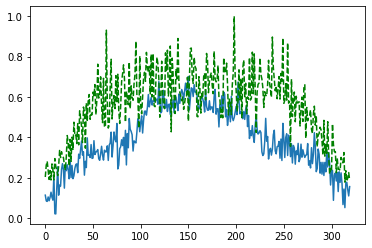

Time taken for epoch:  140.31117391586304
Epoch = [ 19/3000]  Iter = [   0/39480]  Loss = 0.1982 Avg Loss = 0.1982  Time = 0.0779s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 19/3000]  Iter = [ 100/39480]  Loss = 0.1931 Avg Loss = 0.2113  Time = 0.0032s
Epoch = [ 19/3000]  Iter = [ 200/39480]  Loss = 0.2286 Avg Loss = 0.2114  Time = 0.0035s
Epoch = [ 19/3000]  Iter = [ 300/39480]  Loss = 0.2017 Avg Loss = 0.2156  Time = 0.0032s
Epoch = [ 19/3000]  Iter = [ 400/39480]  Loss = 0.2073 Avg Loss = 0.2165  Time = 0.0032s
Epoch = [ 19/3000]  Iter = [ 500/39480]  Loss = 0.2125 Avg Loss = 0.2163  Time = 0.0032s
Epoch = [ 19/3000]  Iter = [ 600/39480]  Loss = 0.2245 Avg Loss = 0.2168  Time = 0.0034s
Epoch = [ 19/3000]  Iter = [ 700/39480]  Loss = 0.2247 Avg Loss = 0.2149  Time = 0.0033s
Epoch = [ 19/3000]  Iter = [ 800/39480]  Loss = 0.2292 Avg Loss = 0.2194  Time = 0.0033s
Epoch = [ 19/3000]  Iter = [ 900/39480]  Loss = 0.2224 Avg Loss = 0.2193  Time = 0.0034s
Epoch = [ 19/3000]  Iter = [1000/39480]  Loss = 0.1924 Avg Loss = 0.2166  Time = 0.0031s
Epoch = [ 19/3000]  Iter = [1100/39480]  Loss = 0.257 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 19/3000]  It

Epoch = [ 19/3000]  Iter = [9400/39480]  Loss = 0.2019 Avg Loss = 0.2187  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [9500/39480]  Loss = 0.1779 Avg Loss = 0.2174  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [9600/39480]  Loss = 0.2323 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [9700/39480]  Loss = 0.201 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [9800/39480]  Loss = 0.2264 Avg Loss = 0.2184  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [9900/39480]  Loss = 0.2321 Avg Loss = 0.2205  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [10000/39480]  Loss = 0.2059 Avg Loss = 0.2176  Time = 0.0039s
Epoch = [ 19/3000]  Iter = [10100/39480]  Loss = 0.2392 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [10200/39480]  Loss = 0.232 Avg Loss = 0.2172  Time = 0.0030s
Epoch = [ 19/3000]  Iter = [10300/39480]  Loss = 0.2488 Avg Loss = 0.2206  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [10400/39480]  Loss = 0.22 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 19/3000]  I

Epoch = [ 19/3000]  Iter = [18600/39480]  Loss = 0.2185 Avg Loss = 0.2181  Time = 0.0033s
Epoch = [ 19/3000]  Iter = [18700/39480]  Loss = 0.2149 Avg Loss = 0.2216  Time = 0.0031s
Epoch = [ 19/3000]  Iter = [18800/39480]  Loss = 0.2348 Avg Loss = 0.217  Time = 0.0034s
Epoch = [ 19/3000]  Iter = [18900/39480]  Loss = 0.2178 Avg Loss = 0.2199  Time = 0.0031s
Epoch = [ 19/3000]  Iter = [19000/39480]  Loss = 0.2301 Avg Loss = 0.2195  Time = 0.0034s
Epoch = [ 19/3000]  Iter = [19100/39480]  Loss = 0.27 Avg Loss = 0.2199  Time = 0.0030s
Epoch = [ 19/3000]  Iter = [19200/39480]  Loss = 0.2179 Avg Loss = 0.2158  Time = 0.0034s
Epoch = [ 19/3000]  Iter = [19300/39480]  Loss = 0.2496 Avg Loss = 0.2194  Time = 0.0033s
Epoch = [ 19/3000]  Iter = [19400/39480]  Loss = 0.2286 Avg Loss = 0.2156  Time = 0.0031s
Epoch = [ 19/3000]  Iter = [19500/39480]  Loss = 0.1799 Avg Loss = 0.2143  Time = 0.0034s
Epoch = [ 19/3000]  Iter = [19600/39480]  Loss = 0.2029 Avg Loss = 0.2148  Time = 0.0033s
Epoch = [ 19/

Epoch = [ 19/3000]  Iter = [27800/39480]  Loss = 0.2202 Avg Loss = 0.2146  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [27900/39480]  Loss = 0.2046 Avg Loss = 0.2146  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [28000/39480]  Loss = 0.1758 Avg Loss = 0.2129  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [28100/39480]  Loss = 0.241 Avg Loss = 0.2156  Time = 0.0028s
Epoch = [ 19/3000]  Iter = [28200/39480]  Loss = 0.2246 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [28300/39480]  Loss = 0.2016 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [ 19/3000]  Iter = [28400/39480]  Loss = 0.2059 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [28500/39480]  Loss = 0.2156 Avg Loss = 0.2204  Time = 0.0031s
Epoch = [ 19/3000]  Iter = [28600/39480]  Loss = 0.213 Avg Loss = 0.2175  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [28700/39480]  Loss = 0.2172 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [28800/39480]  Loss = 0.1838 Avg Loss = 0.22  Time = 0.0029s
Epoch = [ 19/3

Epoch = [ 19/3000]  Iter = [37000/39480]  Loss = 0.2025 Avg Loss = 0.2153  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [37100/39480]  Loss = 0.2083 Avg Loss = 0.2169  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [37200/39480]  Loss = 0.1792 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [37300/39480]  Loss = 0.2823 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [37400/39480]  Loss = 0.2137 Avg Loss = 0.2165  Time = 0.0031s
Epoch = [ 19/3000]  Iter = [37500/39480]  Loss = 0.1964 Avg Loss = 0.215  Time = 0.0036s
Epoch = [ 19/3000]  Iter = [37600/39480]  Loss = 0.22 Avg Loss = 0.2166  Time = 0.0030s
Epoch = [ 19/3000]  Iter = [37700/39480]  Loss = 0.2375 Avg Loss = 0.2195  Time = 0.0030s
Epoch = [ 19/3000]  Iter = [37800/39480]  Loss = 0.2081 Avg Loss = 0.2148  Time = 0.0032s
Epoch = [ 19/3000]  Iter = [37900/39480]  Loss = 0.2184 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 19/3000]  Iter = [38000/39480]  Loss = 0.2335 Avg Loss = 0.2225  Time = 0.0031s
Epoch = [ 19/30

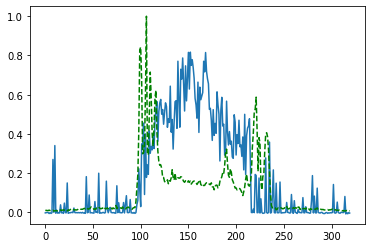

Time taken for epoch:  140.62555766105652
Epoch = [ 20/3000]  Iter = [   0/39480]  Loss = 0.2301 Avg Loss = 0.2301  Time = 0.0819s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 20/3000]  Iter = [ 100/39480]  Loss = 0.1995 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [ 20/3000]  Iter = [ 200/39480]  Loss = 0.2159 Avg Loss = 0.2167  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [ 300/39480]  Loss = 0.2403 Avg Loss = 0.2187  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [ 400/39480]  Loss = 0.1959 Avg Loss = 0.2209  Time = 0.0030s
Epoch = [ 20/3000]  Iter = [ 500/39480]  Loss = 0.2277 Avg Loss = 0.2214  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [ 600/39480]  Loss = 0.2373 Avg Loss = 0.2175  Time = 0.0030s
Epoch = [ 20/3000]  Iter = [ 700/39480]  Loss = 0.2387 Avg Loss = 0.2208  Time = 0.0030s
Epoch = [ 20/3000]  Iter = [ 800/39480]  Loss = 0.1699 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [ 20/3000]  Iter = [ 900/39480]  Loss = 0.231 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [ 20/3000]  Iter = [1000/39480]  Loss = 0.2191 Avg Loss = 0.2168  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [1100/39480]  Loss = 0.212 Avg Loss = 0.2148  Time = 0.0030s
Epoch = [ 20/3000]  Ite

Epoch = [ 20/3000]  Iter = [9400/39480]  Loss = 0.238 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [9500/39480]  Loss = 0.2106 Avg Loss = 0.2211  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [9600/39480]  Loss = 0.1927 Avg Loss = 0.2162  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [9700/39480]  Loss = 0.1942 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [9800/39480]  Loss = 0.1885 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [9900/39480]  Loss = 0.2135 Avg Loss = 0.2187  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [10000/39480]  Loss = 0.2187 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [10100/39480]  Loss = 0.2138 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [10200/39480]  Loss = 0.2759 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [10300/39480]  Loss = 0.196 Avg Loss = 0.22  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [10400/39480]  Loss = 0.1888 Avg Loss = 0.2194  Time = 0.0029s
Epoch = [ 20/3000]  I

Epoch = [ 20/3000]  Iter = [18600/39480]  Loss = 0.2295 Avg Loss = 0.2218  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [18700/39480]  Loss = 0.2139 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [18800/39480]  Loss = 0.2702 Avg Loss = 0.2176  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [18900/39480]  Loss = 0.2217 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [19000/39480]  Loss = 0.2249 Avg Loss = 0.2165  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [19100/39480]  Loss = 0.2281 Avg Loss = 0.2221  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [19200/39480]  Loss = 0.2241 Avg Loss = 0.2187  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [19300/39480]  Loss = 0.2152 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [19400/39480]  Loss = 0.2475 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [19500/39480]  Loss = 0.1882 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [19600/39480]  Loss = 0.2408 Avg Loss = 0.2168  Time = 0.0029s
Epoch = [ 

Epoch = [ 20/3000]  Iter = [27800/39480]  Loss = 0.1937 Avg Loss = 0.215  Time = 0.0034s
Epoch = [ 20/3000]  Iter = [27900/39480]  Loss = 0.2107 Avg Loss = 0.2252  Time = 0.0034s
Epoch = [ 20/3000]  Iter = [28000/39480]  Loss = 0.2373 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [28100/39480]  Loss = 0.2272 Avg Loss = 0.2199  Time = 0.0033s
Epoch = [ 20/3000]  Iter = [28200/39480]  Loss = 0.1746 Avg Loss = 0.218  Time = 0.0035s
Epoch = [ 20/3000]  Iter = [28300/39480]  Loss = 0.2684 Avg Loss = 0.2199  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [28400/39480]  Loss = 0.216 Avg Loss = 0.2236  Time = 0.0034s
Epoch = [ 20/3000]  Iter = [28500/39480]  Loss = 0.2272 Avg Loss = 0.2186  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [28600/39480]  Loss = 0.208 Avg Loss = 0.2135  Time = 0.0032s
Epoch = [ 20/3000]  Iter = [28700/39480]  Loss = 0.1875 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [28800/39480]  Loss = 0.2091 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [ 20/300

Epoch = [ 20/3000]  Iter = [37000/39480]  Loss = 0.2154 Avg Loss = 0.2201  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [37100/39480]  Loss = 0.2251 Avg Loss = 0.2193  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [37200/39480]  Loss = 0.2301 Avg Loss = 0.2198  Time = 0.0031s
Epoch = [ 20/3000]  Iter = [37300/39480]  Loss = 0.1911 Avg Loss = 0.2225  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [37400/39480]  Loss = 0.2161 Avg Loss = 0.2169  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [37500/39480]  Loss = 0.244 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [37600/39480]  Loss = 0.2317 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 20/3000]  Iter = [37700/39480]  Loss = 0.2208 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [37800/39480]  Loss = 0.226 Avg Loss = 0.2237  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [37900/39480]  Loss = 0.2076 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [ 20/3000]  Iter = [38000/39480]  Loss = 0.2104 Avg Loss = 0.2184  Time = 0.0029s
Epoch = [ 20/

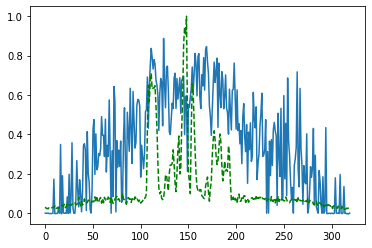

Time taken for epoch:  143.09500336647034
Epoch = [ 21/3000]  Iter = [   0/39480]  Loss = 0.2225 Avg Loss = 0.2225  Time = 0.0780s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 21/3000]  Iter = [ 100/39480]  Loss = 0.2069 Avg Loss = 0.2149  Time = 0.0031s
Epoch = [ 21/3000]  Iter = [ 200/39480]  Loss = 0.1818 Avg Loss = 0.2137  Time = 0.0031s
Epoch = [ 21/3000]  Iter = [ 300/39480]  Loss = 0.1925 Avg Loss = 0.2178  Time = 0.0030s
Epoch = [ 21/3000]  Iter = [ 400/39480]  Loss = 0.1922 Avg Loss = 0.2215  Time = 0.0030s
Epoch = [ 21/3000]  Iter = [ 500/39480]  Loss = 0.2203 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 21/3000]  Iter = [ 600/39480]  Loss = 0.2103 Avg Loss = 0.2167  Time = 0.0030s
Epoch = [ 21/3000]  Iter = [ 700/39480]  Loss = 0.2698 Avg Loss = 0.2188  Time = 0.0028s
Epoch = [ 21/3000]  Iter = [ 800/39480]  Loss = 0.2145 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [ 900/39480]  Loss = 0.2217 Avg Loss = 0.2152  Time = 0.0030s
Epoch = [ 21/3000]  Iter = [1000/39480]  Loss = 0.1994 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [ 21/3000]  Iter = [1100/39480]  Loss = 0.2151 Avg Loss = 0.2188  Time = 0.0030s
Epoch = [ 21/3000]  Ite

Epoch = [ 21/3000]  Iter = [9400/39480]  Loss = 0.1937 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 21/3000]  Iter = [9500/39480]  Loss = 0.1854 Avg Loss = 0.222  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [9600/39480]  Loss = 0.2232 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [9700/39480]  Loss = 0.23 Avg Loss = 0.222  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [9800/39480]  Loss = 0.236 Avg Loss = 0.2191  Time = 0.0028s
Epoch = [ 21/3000]  Iter = [9900/39480]  Loss = 0.289 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 21/3000]  Iter = [10000/39480]  Loss = 0.2013 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [10100/39480]  Loss = 0.1977 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [10200/39480]  Loss = 0.1959 Avg Loss = 0.2179  Time = 0.0031s
Epoch = [ 21/3000]  Iter = [10300/39480]  Loss = 0.1817 Avg Loss = 0.2169  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [10400/39480]  Loss = 0.1978 Avg Loss = 0.2214  Time = 0.0029s
Epoch = [ 21/3000]  Ite

Epoch = [ 21/3000]  Iter = [18600/39480]  Loss = 0.2089 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [18700/39480]  Loss = 0.18 Avg Loss = 0.2141  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [18800/39480]  Loss = 0.221 Avg Loss = 0.2205  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [18900/39480]  Loss = 0.2169 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [19000/39480]  Loss = 0.2265 Avg Loss = 0.2142  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [19100/39480]  Loss = 0.2067 Avg Loss = 0.2151  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [19200/39480]  Loss = 0.2309 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [19300/39480]  Loss = 0.2315 Avg Loss = 0.2199  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [19400/39480]  Loss = 0.2142 Avg Loss = 0.2156  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [19500/39480]  Loss = 0.2416 Avg Loss = 0.2158  Time = 0.0028s
Epoch = [ 21/3000]  Iter = [19600/39480]  Loss = 0.2146 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 21/3

Epoch = [ 21/3000]  Iter = [27800/39480]  Loss = 0.3947 Avg Loss = 0.2195  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [27900/39480]  Loss = 0.2255 Avg Loss = 0.2256  Time = 0.0028s
Epoch = [ 21/3000]  Iter = [28000/39480]  Loss = 0.2066 Avg Loss = 0.2235  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [28100/39480]  Loss = 0.2444 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [28200/39480]  Loss = 0.1899 Avg Loss = 0.2197  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [28300/39480]  Loss = 0.2108 Avg Loss = 0.2199  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [28400/39480]  Loss = 0.2276 Avg Loss = 0.2153  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [28500/39480]  Loss = 0.2379 Avg Loss = 0.2141  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [28600/39480]  Loss = 0.219 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 21/3000]  Iter = [28700/39480]  Loss = 0.2132 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [28800/39480]  Loss = 0.2049 Avg Loss = 0.2216  Time = 0.0029s
Epoch = [ 21

Epoch = [ 21/3000]  Iter = [37000/39480]  Loss = 0.2165 Avg Loss = 0.2199  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [37100/39480]  Loss = 0.2493 Avg Loss = 0.2229  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [37200/39480]  Loss = 0.2305 Avg Loss = 0.2208  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [37300/39480]  Loss = 0.2108 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [37400/39480]  Loss = 0.2213 Avg Loss = 0.2212  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [37500/39480]  Loss = 0.2206 Avg Loss = 0.2168  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [37600/39480]  Loss = 0.17 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [37700/39480]  Loss = 0.1997 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [37800/39480]  Loss = 0.2423 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [37900/39480]  Loss = 0.2385 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 21/3000]  Iter = [38000/39480]  Loss = 0.22 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 21/3000

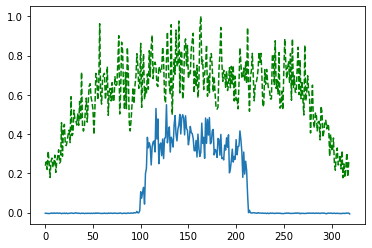

Time taken for epoch:  141.6428656578064
Epoch = [ 22/3000]  Iter = [   0/39480]  Loss = 0.2441 Avg Loss = 0.2441  Time = 0.0792s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 22/3000]  Iter = [ 100/39480]  Loss = 0.2262 Avg Loss = 0.2267  Time = 0.0036s
Epoch = [ 22/3000]  Iter = [ 200/39480]  Loss = 0.2006 Avg Loss = 0.2238  Time = 0.0036s
Epoch = [ 22/3000]  Iter = [ 300/39480]  Loss = 0.2489 Avg Loss = 0.2201  Time = 0.0035s
Epoch = [ 22/3000]  Iter = [ 400/39480]  Loss = 0.2184 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 22/3000]  Iter = [ 500/39480]  Loss = 0.2057 Avg Loss = 0.2171  Time = 0.0030s
Epoch = [ 22/3000]  Iter = [ 600/39480]  Loss = 0.2096 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [ 22/3000]  Iter = [ 700/39480]  Loss = 0.1702 Avg Loss = 0.2164  Time = 0.0030s
Epoch = [ 22/3000]  Iter = [ 800/39480]  Loss = 0.228 Avg Loss = 0.2155  Time = 0.0030s
Epoch = [ 22/3000]  Iter = [ 900/39480]  Loss = 0.1902 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [1000/39480]  Loss = 0.2579 Avg Loss = 0.2175  Time = 0.0032s
Epoch = [ 22/3000]  Iter = [1100/39480]  Loss = 0.1873 Avg Loss = 0.2185  Time = 0.0032s
Epoch = [ 22/3000]  It

Epoch = [ 22/3000]  Iter = [9400/39480]  Loss = 0.2249 Avg Loss = 0.2181  Time = 0.0027s
Epoch = [ 22/3000]  Iter = [9500/39480]  Loss = 0.232 Avg Loss = 0.2144  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [9600/39480]  Loss = 0.1848 Avg Loss = 0.2187  Time = 0.0030s
Epoch = [ 22/3000]  Iter = [9700/39480]  Loss = 0.2228 Avg Loss = 0.2187  Time = 0.0030s
Epoch = [ 22/3000]  Iter = [9800/39480]  Loss = 0.2134 Avg Loss = 0.2168  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [9900/39480]  Loss = 0.2289 Avg Loss = 0.2208  Time = 0.0030s
Epoch = [ 22/3000]  Iter = [10000/39480]  Loss = 0.2018 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [10100/39480]  Loss = 0.2162 Avg Loss = 0.2175  Time = 0.0027s
Epoch = [ 22/3000]  Iter = [10200/39480]  Loss = 0.2099 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [10300/39480]  Loss = 0.2038 Avg Loss = 0.2157  Time = 0.0030s
Epoch = [ 22/3000]  Iter = [10400/39480]  Loss = 0.2204 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 22/3000

Epoch = [ 22/3000]  Iter = [18600/39480]  Loss = 0.1968 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [18700/39480]  Loss = 0.2087 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [18800/39480]  Loss = 0.2127 Avg Loss = 0.2191  Time = 0.0031s
Epoch = [ 22/3000]  Iter = [18900/39480]  Loss = 0.2077 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 22/3000]  Iter = [19000/39480]  Loss = 0.2315 Avg Loss = 0.2176  Time = 0.0032s
Epoch = [ 22/3000]  Iter = [19100/39480]  Loss = 0.2272 Avg Loss = 0.2175  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [19200/39480]  Loss = 0.2131 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [19300/39480]  Loss = 0.2162 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [ 22/3000]  Iter = [19400/39480]  Loss = 0.2064 Avg Loss = 0.2199  Time = 0.0030s
Epoch = [ 22/3000]  Iter = [19500/39480]  Loss = 0.2219 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [19600/39480]  Loss = 0.2067 Avg Loss = 0.2197  Time = 0.0029s
Epoch = [ 22

Epoch = [ 22/3000]  Iter = [27800/39480]  Loss = 0.2507 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [27900/39480]  Loss = 0.2306 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [28000/39480]  Loss = 0.2331 Avg Loss = 0.2216  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [28100/39480]  Loss = 0.1895 Avg Loss = 0.2206  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [28200/39480]  Loss = 0.2292 Avg Loss = 0.2204  Time = 0.0027s
Epoch = [ 22/3000]  Iter = [28300/39480]  Loss = 0.219 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [28400/39480]  Loss = 0.2741 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [28500/39480]  Loss = 0.1917 Avg Loss = 0.2144  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [28600/39480]  Loss = 0.1936 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [28700/39480]  Loss = 0.1998 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [28800/39480]  Loss = 0.2282 Avg Loss = 0.22  Time = 0.0029s
Epoch = [ 22/3

Epoch = [ 22/3000]  Iter = [37000/39480]  Loss = 0.218 Avg Loss = 0.2175  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [37100/39480]  Loss = 0.1924 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [37200/39480]  Loss = 0.203 Avg Loss = 0.2165  Time = 0.0031s
Epoch = [ 22/3000]  Iter = [37300/39480]  Loss = 0.2377 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [37400/39480]  Loss = 0.2125 Avg Loss = 0.2171  Time = 0.0030s
Epoch = [ 22/3000]  Iter = [37500/39480]  Loss = 0.223 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [37600/39480]  Loss = 0.2138 Avg Loss = 0.2211  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [37700/39480]  Loss = 0.2841 Avg Loss = 0.2159  Time = 0.0029s
Epoch = [ 22/3000]  Iter = [37800/39480]  Loss = 0.2085 Avg Loss = 0.2179  Time = 0.0072s
Epoch = [ 22/3000]  Iter = [37900/39480]  Loss = 0.2505 Avg Loss = 0.2185  Time = 0.0030s
Epoch = [ 22/3000]  Iter = [38000/39480]  Loss = 0.2118 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 22/3

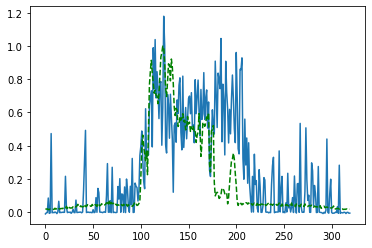

Time taken for epoch:  143.04372024536133
Epoch = [ 23/3000]  Iter = [   0/39480]  Loss = 0.2494 Avg Loss = 0.2494  Time = 0.0792s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 23/3000]  Iter = [ 100/39480]  Loss = 0.2407 Avg Loss = 0.2356  Time = 0.0034s
Epoch = [ 23/3000]  Iter = [ 200/39480]  Loss = 0.2484 Avg Loss = 0.2227  Time = 0.0034s
Epoch = [ 23/3000]  Iter = [ 300/39480]  Loss = 0.2168 Avg Loss = 0.2251  Time = 0.0035s
Epoch = [ 23/3000]  Iter = [ 400/39480]  Loss = 0.197 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [ 500/39480]  Loss = 0.1663 Avg Loss = 0.214  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [ 600/39480]  Loss = 0.2111 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [ 700/39480]  Loss = 0.2249 Avg Loss = 0.2203  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [ 800/39480]  Loss = 0.1971 Avg Loss = 0.2186  Time = 0.0030s
Epoch = [ 23/3000]  Iter = [ 900/39480]  Loss = 0.1916 Avg Loss = 0.2133  Time = 0.0030s
Epoch = [ 23/3000]  Iter = [1000/39480]  Loss = 0.1903 Avg Loss = 0.2148  Time = 0.0030s
Epoch = [ 23/3000]  Iter = [1100/39480]  Loss = 0.2488 Avg Loss = 0.2198  Time = 0.0028s
Epoch = [ 23/3000]  Ite

Epoch = [ 23/3000]  Iter = [9400/39480]  Loss = 0.232 Avg Loss = 0.2194  Time = 0.0031s
Epoch = [ 23/3000]  Iter = [9500/39480]  Loss = 0.2445 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [9600/39480]  Loss = 0.2094 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [9700/39480]  Loss = 0.2492 Avg Loss = 0.2134  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [9800/39480]  Loss = 0.2139 Avg Loss = 0.223  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [9900/39480]  Loss = 0.2213 Avg Loss = 0.2161  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [10000/39480]  Loss = 0.259 Avg Loss = 0.2229  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [10100/39480]  Loss = 0.1873 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [10200/39480]  Loss = 0.2299 Avg Loss = 0.2164  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [10300/39480]  Loss = 0.1902 Avg Loss = 0.2188  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [10400/39480]  Loss = 0.1988 Avg Loss = 0.2164  Time = 0.0029s
Epoch = [ 23/3000] 

Epoch = [ 23/3000]  Iter = [18600/39480]  Loss = 0.2364 Avg Loss = 0.2214  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [18700/39480]  Loss = 0.244 Avg Loss = 0.2235  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [18800/39480]  Loss = 0.2252 Avg Loss = 0.2223  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [18900/39480]  Loss = 0.2371 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [19000/39480]  Loss = 0.208 Avg Loss = 0.2187  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [19100/39480]  Loss = 0.2087 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [19200/39480]  Loss = 0.2683 Avg Loss = 0.2196  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [19300/39480]  Loss = 0.24 Avg Loss = 0.2152  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [19400/39480]  Loss = 0.2105 Avg Loss = 0.2194  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [19500/39480]  Loss = 0.238 Avg Loss = 0.2201  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [19600/39480]  Loss = 0.2101 Avg Loss = 0.221  Time = 0.0031s
Epoch = [ 23/300

Epoch = [ 23/3000]  Iter = [27800/39480]  Loss = 0.2213 Avg Loss = 0.2156  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [27900/39480]  Loss = 0.2142 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [28000/39480]  Loss = 0.2192 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [28100/39480]  Loss = 0.2151 Avg Loss = 0.2211  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [28200/39480]  Loss = 0.258 Avg Loss = 0.2194  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [28300/39480]  Loss = 0.1941 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [28400/39480]  Loss = 0.2062 Avg Loss = 0.222  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [28500/39480]  Loss = 0.2296 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [28600/39480]  Loss = 0.1978 Avg Loss = 0.2234  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [28700/39480]  Loss = 0.222 Avg Loss = 0.2165  Time = 0.0031s
Epoch = [ 23/3000]  Iter = [28800/39480]  Loss = 0.2122 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 23/3

Epoch = [ 23/3000]  Iter = [37000/39480]  Loss = 0.1984 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [37100/39480]  Loss = 0.195 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [37200/39480]  Loss = 0.228 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [37300/39480]  Loss = 0.2388 Avg Loss = 0.2174  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [37400/39480]  Loss = 0.1867 Avg Loss = 0.2162  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [37500/39480]  Loss = 0.2116 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [37600/39480]  Loss = 0.2187 Avg Loss = 0.2205  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [37700/39480]  Loss = 0.2251 Avg Loss = 0.2221  Time = 0.0030s
Epoch = [ 23/3000]  Iter = [37800/39480]  Loss = 0.2291 Avg Loss = 0.2181  Time = 0.0029s
Epoch = [ 23/3000]  Iter = [37900/39480]  Loss = 0.1769 Avg Loss = 0.2193  Time = 0.0031s
Epoch = [ 23/3000]  Iter = [38000/39480]  Loss = 0.1926 Avg Loss = 0.2208  Time = 0.0029s
Epoch = [ 23

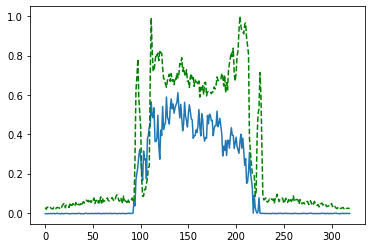

Time taken for epoch:  141.41232800483704
Epoch = [ 24/3000]  Iter = [   0/39480]  Loss = 0.1752 Avg Loss = 0.1752  Time = 0.0857s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 24/3000]  Iter = [ 100/39480]  Loss = 0.211 Avg Loss = 0.2074  Time = 0.0030s
Epoch = [ 24/3000]  Iter = [ 200/39480]  Loss = 0.2247 Avg Loss = 0.2116  Time = 0.0032s
Epoch = [ 24/3000]  Iter = [ 300/39480]  Loss = 0.2239 Avg Loss = 0.2174  Time = 0.0032s
Epoch = [ 24/3000]  Iter = [ 400/39480]  Loss = 0.1956 Avg Loss = 0.2156  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [ 500/39480]  Loss = 0.2734 Avg Loss = 0.2144  Time = 0.0031s
Epoch = [ 24/3000]  Iter = [ 600/39480]  Loss = 0.2317 Avg Loss = 0.2205  Time = 0.0030s
Epoch = [ 24/3000]  Iter = [ 700/39480]  Loss = 0.1987 Avg Loss = 0.2233  Time = 0.0031s
Epoch = [ 24/3000]  Iter = [ 800/39480]  Loss = 0.2093 Avg Loss = 0.22  Time = 0.0030s
Epoch = [ 24/3000]  Iter = [ 900/39480]  Loss = 0.1944 Avg Loss = 0.2202  Time = 0.0031s
Epoch = [ 24/3000]  Iter = [1000/39480]  Loss = 0.2426 Avg Loss = 0.2184  Time = 0.0032s
Epoch = [ 24/3000]  Iter = [1100/39480]  Loss = 0.2199 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 24/3000]  Iter

Epoch = [ 24/3000]  Iter = [9400/39480]  Loss = 0.2281 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [9500/39480]  Loss = 0.2198 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [9600/39480]  Loss = 0.2438 Avg Loss = 0.2155  Time = 0.0031s
Epoch = [ 24/3000]  Iter = [9700/39480]  Loss = 0.2332 Avg Loss = 0.2208  Time = 0.0030s
Epoch = [ 24/3000]  Iter = [9800/39480]  Loss = 0.2491 Avg Loss = 0.2197  Time = 0.0034s
Epoch = [ 24/3000]  Iter = [9900/39480]  Loss = 0.2522 Avg Loss = 0.2212  Time = 0.0030s
Epoch = [ 24/3000]  Iter = [10000/39480]  Loss = 0.1955 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [10100/39480]  Loss = 0.209 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [10200/39480]  Loss = 0.2169 Avg Loss = 0.2166  Time = 0.0031s
Epoch = [ 24/3000]  Iter = [10300/39480]  Loss = 0.2297 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [10400/39480]  Loss = 0.2265 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 24/3000]

Epoch = [ 24/3000]  Iter = [18600/39480]  Loss = 0.2637 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [18700/39480]  Loss = 0.1976 Avg Loss = 0.2161  Time = 0.0031s
Epoch = [ 24/3000]  Iter = [18800/39480]  Loss = 0.1971 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [18900/39480]  Loss = 0.2355 Avg Loss = 0.2191  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [19000/39480]  Loss = 0.2239 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [19100/39480]  Loss = 0.2143 Avg Loss = 0.2173  Time = 0.0031s
Epoch = [ 24/3000]  Iter = [19200/39480]  Loss = 0.2477 Avg Loss = 0.2174  Time = 0.0031s
Epoch = [ 24/3000]  Iter = [19300/39480]  Loss = 0.226 Avg Loss = 0.2185  Time = 0.0031s
Epoch = [ 24/3000]  Iter = [19400/39480]  Loss = 0.2089 Avg Loss = 0.2201  Time = 0.0031s
Epoch = [ 24/3000]  Iter = [19500/39480]  Loss = 0.2046 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [19600/39480]  Loss = 0.1957 Avg Loss = 0.2145  Time = 0.0031s
Epoch = [ 24/3

Epoch = [ 24/3000]  Iter = [27800/39480]  Loss = 0.2268 Avg Loss = 0.2217  Time = 0.0030s
Epoch = [ 24/3000]  Iter = [27900/39480]  Loss = 0.1956 Avg Loss = 0.2198  Time = 0.0032s
Epoch = [ 24/3000]  Iter = [28000/39480]  Loss = 0.2012 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 24/3000]  Iter = [28100/39480]  Loss = 0.2099 Avg Loss = 0.2193  Time = 0.0032s
Epoch = [ 24/3000]  Iter = [28200/39480]  Loss = 0.2005 Avg Loss = 0.2175  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [28300/39480]  Loss = 0.2079 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [28400/39480]  Loss = 0.2161 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [ 24/3000]  Iter = [28500/39480]  Loss = 0.2279 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 24/3000]  Iter = [28600/39480]  Loss = 0.2404 Avg Loss = 0.222  Time = 0.0030s
Epoch = [ 24/3000]  Iter = [28700/39480]  Loss = 0.2714 Avg Loss = 0.2194  Time = 0.0032s
Epoch = [ 24/3000]  Iter = [28800/39480]  Loss = 0.2039 Avg Loss = 0.2196  Time = 0.0029s
Epoch = [ 2

Epoch = [ 24/3000]  Iter = [37000/39480]  Loss = 0.2164 Avg Loss = 0.2154  Time = 0.0029s
Epoch = [ 24/3000]  Iter = [37100/39480]  Loss = 0.2442 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 24/3000]  Iter = [37200/39480]  Loss = 0.1894 Avg Loss = 0.2173  Time = 0.0036s
Epoch = [ 24/3000]  Iter = [37300/39480]  Loss = 0.199 Avg Loss = 0.2175  Time = 0.0035s
Epoch = [ 24/3000]  Iter = [37400/39480]  Loss = 0.2049 Avg Loss = 0.2203  Time = 0.0035s
Epoch = [ 24/3000]  Iter = [37500/39480]  Loss = 0.2165 Avg Loss = 0.2178  Time = 0.0035s
Epoch = [ 24/3000]  Iter = [37600/39480]  Loss = 0.1927 Avg Loss = 0.2235  Time = 0.0034s
Epoch = [ 24/3000]  Iter = [37700/39480]  Loss = 0.1994 Avg Loss = 0.2169  Time = 0.0036s
Epoch = [ 24/3000]  Iter = [37800/39480]  Loss = 0.2156 Avg Loss = 0.2204  Time = 0.0035s
Epoch = [ 24/3000]  Iter = [37900/39480]  Loss = 0.2173 Avg Loss = 0.2172  Time = 0.0034s
Epoch = [ 24/3000]  Iter = [38000/39480]  Loss = 0.1933 Avg Loss = 0.217  Time = 0.0035s
Epoch = [ 24/

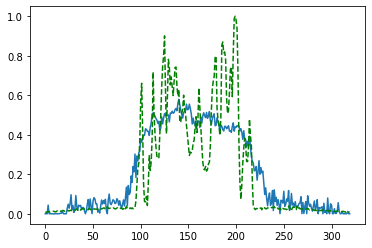

Time taken for epoch:  141.68238234519958
Epoch = [ 25/3000]  Iter = [   0/39480]  Loss = 0.1952 Avg Loss = 0.1952  Time = 0.0815s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 25/3000]  Iter = [ 100/39480]  Loss = 0.2113 Avg Loss = 0.2135  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [ 200/39480]  Loss = 0.2544 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 25/3000]  Iter = [ 300/39480]  Loss = 0.1923 Avg Loss = 0.2153  Time = 0.0031s
Epoch = [ 25/3000]  Iter = [ 400/39480]  Loss = 0.2012 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 25/3000]  Iter = [ 500/39480]  Loss = 0.1994 Avg Loss = 0.2164  Time = 0.0030s
Epoch = [ 25/3000]  Iter = [ 600/39480]  Loss = 0.1894 Avg Loss = 0.2187  Time = 0.0051s
Epoch = [ 25/3000]  Iter = [ 700/39480]  Loss = 0.2321 Avg Loss = 0.2205  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [ 800/39480]  Loss = 0.2166 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [ 900/39480]  Loss = 0.2094 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [ 25/3000]  Iter = [1000/39480]  Loss = 0.2171 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 25/3000]  Iter = [1100/39480]  Loss = 0.2011 Avg Loss = 0.2156  Time = 0.0032s
Epoch = [ 25/3000]  Ite

Epoch = [ 25/3000]  Iter = [9400/39480]  Loss = 0.1851 Avg Loss = 0.2165  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [9500/39480]  Loss = 0.2038 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [9600/39480]  Loss = 0.1914 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [9700/39480]  Loss = 0.1949 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [9800/39480]  Loss = 0.2867 Avg Loss = 0.2164  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [9900/39480]  Loss = 0.2068 Avg Loss = 0.2208  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [10000/39480]  Loss = 0.2069 Avg Loss = 0.2195  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [10100/39480]  Loss = 0.2024 Avg Loss = 0.2209  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [10200/39480]  Loss = 0.2342 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [10300/39480]  Loss = 0.2107 Avg Loss = 0.2161  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [10400/39480]  Loss = 0.2367 Avg Loss = 0.22  Time = 0.0028s
Epoch = [ 25/3000] 

Epoch = [ 25/3000]  Iter = [18600/39480]  Loss = 0.2418 Avg Loss = 0.215  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [18700/39480]  Loss = 0.2135 Avg Loss = 0.2199  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [18800/39480]  Loss = 0.2327 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [18900/39480]  Loss = 0.2045 Avg Loss = 0.2234  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [19000/39480]  Loss = 0.2271 Avg Loss = 0.2208  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [19100/39480]  Loss = 0.2226 Avg Loss = 0.2188  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [19200/39480]  Loss = 0.2292 Avg Loss = 0.2158  Time = 0.0028s
Epoch = [ 25/3000]  Iter = [19300/39480]  Loss = 0.217 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [19400/39480]  Loss = 0.2342 Avg Loss = 0.2216  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [19500/39480]  Loss = 0.1948 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [19600/39480]  Loss = 0.2032 Avg Loss = 0.2168  Time = 0.0030s
Epoch = [ 25/

Epoch = [ 25/3000]  Iter = [27800/39480]  Loss = 0.252 Avg Loss = 0.2193  Time = 0.0031s
Epoch = [ 25/3000]  Iter = [27900/39480]  Loss = 0.2286 Avg Loss = 0.2153  Time = 0.0031s
Epoch = [ 25/3000]  Iter = [28000/39480]  Loss = 0.2008 Avg Loss = 0.2175  Time = 0.0031s
Epoch = [ 25/3000]  Iter = [28100/39480]  Loss = 0.2076 Avg Loss = 0.2171  Time = 0.0033s
Epoch = [ 25/3000]  Iter = [28200/39480]  Loss = 0.2404 Avg Loss = 0.2215  Time = 0.0031s
Epoch = [ 25/3000]  Iter = [28300/39480]  Loss = 0.2022 Avg Loss = 0.2179  Time = 0.0031s
Epoch = [ 25/3000]  Iter = [28400/39480]  Loss = 0.2278 Avg Loss = 0.2185  Time = 0.0032s
Epoch = [ 25/3000]  Iter = [28500/39480]  Loss = 0.217 Avg Loss = 0.2183  Time = 0.0028s
Epoch = [ 25/3000]  Iter = [28600/39480]  Loss = 0.2333 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 25/3000]  Iter = [28700/39480]  Loss = 0.2165 Avg Loss = 0.2184  Time = 0.0030s
Epoch = [ 25/3000]  Iter = [28800/39480]  Loss = 0.2199 Avg Loss = 0.2159  Time = 0.0030s
Epoch = [ 25

Epoch = [ 25/3000]  Iter = [37000/39480]  Loss = 0.2177 Avg Loss = 0.2182  Time = 0.0032s
Epoch = [ 25/3000]  Iter = [37100/39480]  Loss = 0.2669 Avg Loss = 0.2181  Time = 0.0030s
Epoch = [ 25/3000]  Iter = [37200/39480]  Loss = 0.2386 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 25/3000]  Iter = [37300/39480]  Loss = 0.2572 Avg Loss = 0.2213  Time = 0.0030s
Epoch = [ 25/3000]  Iter = [37400/39480]  Loss = 0.2074 Avg Loss = 0.22  Time = 0.0030s
Epoch = [ 25/3000]  Iter = [37500/39480]  Loss = 0.1898 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 25/3000]  Iter = [37600/39480]  Loss = 0.2005 Avg Loss = 0.2166  Time = 0.0031s
Epoch = [ 25/3000]  Iter = [37700/39480]  Loss = 0.1971 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 25/3000]  Iter = [37800/39480]  Loss = 0.2232 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 25/3000]  Iter = [37900/39480]  Loss = 0.2044 Avg Loss = 0.2153  Time = 0.0031s
Epoch = [ 25/3000]  Iter = [38000/39480]  Loss = 0.2395 Avg Loss = 0.2195  Time = 0.0029s
Epoch = [ 25

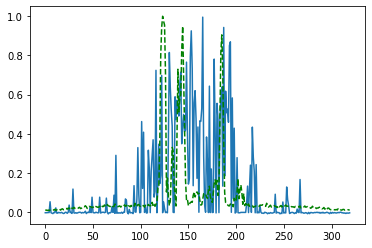

Time taken for epoch:  142.1221408843994
Epoch = [ 26/3000]  Iter = [   0/39480]  Loss = 0.2203 Avg Loss = 0.2203  Time = 0.0748s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 26/3000]  Iter = [ 100/39480]  Loss = 0.2209 Avg Loss = 0.2241  Time = 0.0034s
Epoch = [ 26/3000]  Iter = [ 200/39480]  Loss = 0.2197 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 26/3000]  Iter = [ 300/39480]  Loss = 0.2065 Avg Loss = 0.2182  Time = 0.0031s
Epoch = [ 26/3000]  Iter = [ 400/39480]  Loss = 0.1952 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [ 500/39480]  Loss = 0.203 Avg Loss = 0.2219  Time = 0.0031s
Epoch = [ 26/3000]  Iter = [ 600/39480]  Loss = 0.1856 Avg Loss = 0.2176  Time = 0.0032s
Epoch = [ 26/3000]  Iter = [ 700/39480]  Loss = 0.2422 Avg Loss = 0.2161  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [ 800/39480]  Loss = 0.2352 Avg Loss = 0.2201  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [ 900/39480]  Loss = 0.2297 Avg Loss = 0.2187  Time = 0.0032s
Epoch = [ 26/3000]  Iter = [1000/39480]  Loss = 0.2625 Avg Loss = 0.2194  Time = 0.0033s
Epoch = [ 26/3000]  Iter = [1100/39480]  Loss = 0.2152 Avg Loss = 0.2182  Time = 0.0032s
Epoch = [ 26/3000]  It

Epoch = [ 26/3000]  Iter = [9400/39480]  Loss = 0.2257 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [9500/39480]  Loss = 0.1931 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 26/3000]  Iter = [9600/39480]  Loss = 0.2067 Avg Loss = 0.2154  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [9700/39480]  Loss = 0.2379 Avg Loss = 0.2195  Time = 0.0031s
Epoch = [ 26/3000]  Iter = [9800/39480]  Loss = 0.1881 Avg Loss = 0.2135  Time = 0.0031s
Epoch = [ 26/3000]  Iter = [9900/39480]  Loss = 0.228 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [10000/39480]  Loss = 0.218 Avg Loss = 0.2159  Time = 0.0029s
Epoch = [ 26/3000]  Iter = [10100/39480]  Loss = 0.2378 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 26/3000]  Iter = [10200/39480]  Loss = 0.2292 Avg Loss = 0.2191  Time = 0.0033s
Epoch = [ 26/3000]  Iter = [10300/39480]  Loss = 0.2031 Avg Loss = 0.2146  Time = 0.0028s
Epoch = [ 26/3000]  Iter = [10400/39480]  Loss = 0.2378 Avg Loss = 0.2157  Time = 0.0032s
Epoch = [ 26/3000]  

Epoch = [ 26/3000]  Iter = [18600/39480]  Loss = 0.204 Avg Loss = 0.2225  Time = 0.0029s
Epoch = [ 26/3000]  Iter = [18700/39480]  Loss = 0.1937 Avg Loss = 0.2166  Time = 0.0033s
Epoch = [ 26/3000]  Iter = [18800/39480]  Loss = 0.2195 Avg Loss = 0.2141  Time = 0.0031s
Epoch = [ 26/3000]  Iter = [18900/39480]  Loss = 0.2226 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 26/3000]  Iter = [19000/39480]  Loss = 0.2374 Avg Loss = 0.2166  Time = 0.0033s
Epoch = [ 26/3000]  Iter = [19100/39480]  Loss = 0.2141 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [ 26/3000]  Iter = [19200/39480]  Loss = 0.2278 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [19300/39480]  Loss = 0.1847 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [ 26/3000]  Iter = [19400/39480]  Loss = 0.1962 Avg Loss = 0.2159  Time = 0.0031s
Epoch = [ 26/3000]  Iter = [19500/39480]  Loss = 0.2762 Avg Loss = 0.2171  Time = 0.0033s
Epoch = [ 26/3000]  Iter = [19600/39480]  Loss = 0.2243 Avg Loss = 0.2222  Time = 0.0029s
Epoch = [ 2

Epoch = [ 26/3000]  Iter = [27800/39480]  Loss = 0.206 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [ 26/3000]  Iter = [27900/39480]  Loss = 0.1904 Avg Loss = 0.2184  Time = 0.0032s
Epoch = [ 26/3000]  Iter = [28000/39480]  Loss = 0.227 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 26/3000]  Iter = [28100/39480]  Loss = 0.2124 Avg Loss = 0.2158  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [28200/39480]  Loss = 0.2035 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 26/3000]  Iter = [28300/39480]  Loss = 0.2069 Avg Loss = 0.2197  Time = 0.0031s
Epoch = [ 26/3000]  Iter = [28400/39480]  Loss = 0.1857 Avg Loss = 0.2172  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [28500/39480]  Loss = 0.2102 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 26/3000]  Iter = [28600/39480]  Loss = 0.2283 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 26/3000]  Iter = [28700/39480]  Loss = 0.1993 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 26/3000]  Iter = [28800/39480]  Loss = 0.2001 Avg Loss = 0.2169  Time = 0.0029s
Epoch = [ 26/3

Epoch = [ 26/3000]  Iter = [37000/39480]  Loss = 0.2195 Avg Loss = 0.2205  Time = 0.0028s
Epoch = [ 26/3000]  Iter = [37100/39480]  Loss = 0.2346 Avg Loss = 0.2221  Time = 0.0029s
Epoch = [ 26/3000]  Iter = [37200/39480]  Loss = 0.2155 Avg Loss = 0.2156  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [37300/39480]  Loss = 0.2259 Avg Loss = 0.2211  Time = 0.0028s
Epoch = [ 26/3000]  Iter = [37400/39480]  Loss = 0.2129 Avg Loss = 0.2117  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [37500/39480]  Loss = 0.2128 Avg Loss = 0.2216  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [37600/39480]  Loss = 0.238 Avg Loss = 0.2195  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [37700/39480]  Loss = 0.2072 Avg Loss = 0.2202  Time = 0.0030s
Epoch = [ 26/3000]  Iter = [37800/39480]  Loss = 0.2185 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 26/3000]  Iter = [37900/39480]  Loss = 0.2199 Avg Loss = 0.2177  Time = 0.0032s
Epoch = [ 26/3000]  Iter = [38000/39480]  Loss = 0.2221 Avg Loss = 0.2203  Time = 0.0029s
Epoch = [ 26

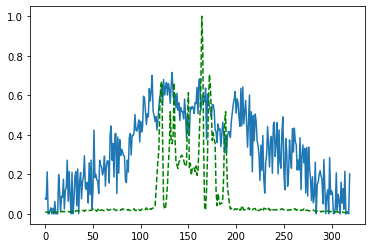

Time taken for epoch:  142.6492702960968
Epoch = [ 27/3000]  Iter = [   0/39480]  Loss = 0.1898 Avg Loss = 0.1898  Time = 0.0795s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 27/3000]  Iter = [ 100/39480]  Loss = 0.1723 Avg Loss = 0.2058  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [ 200/39480]  Loss = 0.2379 Avg Loss = 0.2145  Time = 0.0031s
Epoch = [ 27/3000]  Iter = [ 300/39480]  Loss = 0.2058 Avg Loss = 0.2148  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [ 400/39480]  Loss = 0.1748 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 27/3000]  Iter = [ 500/39480]  Loss = 0.1891 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 27/3000]  Iter = [ 600/39480]  Loss = 0.2364 Avg Loss = 0.2176  Time = 0.0032s
Epoch = [ 27/3000]  Iter = [ 700/39480]  Loss = 0.2272 Avg Loss = 0.2193  Time = 0.0031s
Epoch = [ 27/3000]  Iter = [ 800/39480]  Loss = 0.2111 Avg Loss = 0.2184  Time = 0.0032s
Epoch = [ 27/3000]  Iter = [ 900/39480]  Loss = 0.2171 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 27/3000]  Iter = [1000/39480]  Loss = 0.1783 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 27/3000]  Iter = [1100/39480]  Loss = 0.251 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [ 27/3000]  Iter

Epoch = [ 27/3000]  Iter = [9400/39480]  Loss = 0.2061 Avg Loss = 0.2145  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [9500/39480]  Loss = 0.2031 Avg Loss = 0.2173  Time = 0.0031s
Epoch = [ 27/3000]  Iter = [9600/39480]  Loss = 0.227 Avg Loss = 0.2134  Time = 0.0041s
Epoch = [ 27/3000]  Iter = [9700/39480]  Loss = 0.2215 Avg Loss = 0.217  Time = 0.0028s
Epoch = [ 27/3000]  Iter = [9800/39480]  Loss = 0.1808 Avg Loss = 0.2154  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [9900/39480]  Loss = 0.2712 Avg Loss = 0.2197  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [10000/39480]  Loss = 0.2344 Avg Loss = 0.2163  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [10100/39480]  Loss = 0.2069 Avg Loss = 0.22  Time = 0.0027s
Epoch = [ 27/3000]  Iter = [10200/39480]  Loss = 0.2048 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [10300/39480]  Loss = 0.1867 Avg Loss = 0.22  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [10400/39480]  Loss = 0.22 Avg Loss = 0.2186  Time = 0.0028s
Epoch = [ 27/3000]  Iter

Epoch = [ 27/3000]  Iter = [18600/39480]  Loss = 0.185 Avg Loss = 0.2149  Time = 0.0033s
Epoch = [ 27/3000]  Iter = [18700/39480]  Loss = 0.2183 Avg Loss = 0.2164  Time = 0.0029s
Epoch = [ 27/3000]  Iter = [18800/39480]  Loss = 0.1885 Avg Loss = 0.2157  Time = 0.0031s
Epoch = [ 27/3000]  Iter = [18900/39480]  Loss = 0.2138 Avg Loss = 0.2153  Time = 0.0029s
Epoch = [ 27/3000]  Iter = [19000/39480]  Loss = 0.2294 Avg Loss = 0.2197  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [19100/39480]  Loss = 0.21 Avg Loss = 0.2186  Time = 0.0031s
Epoch = [ 27/3000]  Iter = [19200/39480]  Loss = 0.2187 Avg Loss = 0.2211  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [19300/39480]  Loss = 0.2149 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 27/3000]  Iter = [19400/39480]  Loss = 0.2006 Avg Loss = 0.2232  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [19500/39480]  Loss = 0.2293 Avg Loss = 0.221  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [19600/39480]  Loss = 0.2123 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 27/30

Epoch = [ 27/3000]  Iter = [27800/39480]  Loss = 0.2065 Avg Loss = 0.2186  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [27900/39480]  Loss = 0.2515 Avg Loss = 0.2165  Time = 0.0033s
Epoch = [ 27/3000]  Iter = [28000/39480]  Loss = 0.2178 Avg Loss = 0.2191  Time = 0.0033s
Epoch = [ 27/3000]  Iter = [28100/39480]  Loss = 0.2379 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [28200/39480]  Loss = 0.2033 Avg Loss = 0.2124  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [28300/39480]  Loss = 0.2243 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 27/3000]  Iter = [28400/39480]  Loss = 0.207 Avg Loss = 0.2201  Time = 0.0031s
Epoch = [ 27/3000]  Iter = [28500/39480]  Loss = 0.1994 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 27/3000]  Iter = [28600/39480]  Loss = 0.2271 Avg Loss = 0.2193  Time = 0.0033s
Epoch = [ 27/3000]  Iter = [28700/39480]  Loss = 0.2138 Avg Loss = 0.2216  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [28800/39480]  Loss = 0.2187 Avg Loss = 0.2204  Time = 0.0033s
Epoch = [ 27

Epoch = [ 27/3000]  Iter = [37000/39480]  Loss = 0.2199 Avg Loss = 0.2166  Time = 0.0032s
Epoch = [ 27/3000]  Iter = [37100/39480]  Loss = 0.2439 Avg Loss = 0.2156  Time = 0.0031s
Epoch = [ 27/3000]  Iter = [37200/39480]  Loss = 0.2053 Avg Loss = 0.2167  Time = 0.0031s
Epoch = [ 27/3000]  Iter = [37300/39480]  Loss = 0.2436 Avg Loss = 0.2203  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [37400/39480]  Loss = 0.2462 Avg Loss = 0.2202  Time = 0.0032s
Epoch = [ 27/3000]  Iter = [37500/39480]  Loss = 0.2289 Avg Loss = 0.22  Time = 0.0031s
Epoch = [ 27/3000]  Iter = [37600/39480]  Loss = 0.2111 Avg Loss = 0.2186  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [37700/39480]  Loss = 0.2347 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [37800/39480]  Loss = 0.2415 Avg Loss = 0.2212  Time = 0.0032s
Epoch = [ 27/3000]  Iter = [37900/39480]  Loss = 0.2015 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 27/3000]  Iter = [38000/39480]  Loss = 0.1896 Avg Loss = 0.2191  Time = 0.0031s
Epoch = [ 27

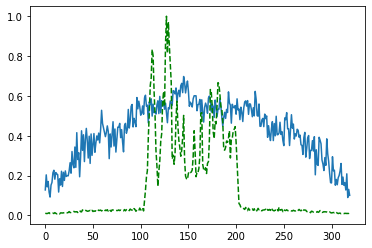

Time taken for epoch:  142.4759259223938
Epoch = [ 28/3000]  Iter = [   0/39480]  Loss = 0.2067 Avg Loss = 0.2067  Time = 0.0810s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 28/3000]  Iter = [ 100/39480]  Loss = 0.1957 Avg Loss = 0.2144  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [ 200/39480]  Loss = 0.2344 Avg Loss = 0.2164  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [ 300/39480]  Loss = 0.2118 Avg Loss = 0.2165  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [ 400/39480]  Loss = 0.1857 Avg Loss = 0.2132  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [ 500/39480]  Loss = 0.219 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [ 600/39480]  Loss = 0.2451 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [ 700/39480]  Loss = 0.2105 Avg Loss = 0.2165  Time = 0.0031s
Epoch = [ 28/3000]  Iter = [ 800/39480]  Loss = 0.2104 Avg Loss = 0.219  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [ 900/39480]  Loss = 0.2405 Avg Loss = 0.2213  Time = 0.0047s
Epoch = [ 28/3000]  Iter = [1000/39480]  Loss = 0.236 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [1100/39480]  Loss = 0.2065 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 28/3000]  Iter

Epoch = [ 28/3000]  Iter = [9400/39480]  Loss = 0.204 Avg Loss = 0.2148  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [9500/39480]  Loss = 0.1982 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [9600/39480]  Loss = 0.2174 Avg Loss = 0.2145  Time = 0.0031s
Epoch = [ 28/3000]  Iter = [9700/39480]  Loss = 0.2033 Avg Loss = 0.2151  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [9800/39480]  Loss = 0.1827 Avg Loss = 0.2156  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [9900/39480]  Loss = 0.2243 Avg Loss = 0.2153  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [10000/39480]  Loss = 0.2042 Avg Loss = 0.2141  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [10100/39480]  Loss = 0.2624 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [10200/39480]  Loss = 0.1949 Avg Loss = 0.2172  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [10300/39480]  Loss = 0.2112 Avg Loss = 0.2175  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [10400/39480]  Loss = 0.2038 Avg Loss = 0.2159  Time = 0.0031s
Epoch = [ 28/3000

Epoch = [ 28/3000]  Iter = [18600/39480]  Loss = 0.2504 Avg Loss = 0.2175  Time = 0.0028s
Epoch = [ 28/3000]  Iter = [18700/39480]  Loss = 0.2115 Avg Loss = 0.2164  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [18800/39480]  Loss = 0.2714 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 28/3000]  Iter = [18900/39480]  Loss = 0.2139 Avg Loss = 0.2236  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [19000/39480]  Loss = 0.2231 Avg Loss = 0.2199  Time = 0.0031s
Epoch = [ 28/3000]  Iter = [19100/39480]  Loss = 0.211 Avg Loss = 0.2167  Time = 0.0031s
Epoch = [ 28/3000]  Iter = [19200/39480]  Loss = 0.208 Avg Loss = 0.2167  Time = 0.0033s
Epoch = [ 28/3000]  Iter = [19300/39480]  Loss = 0.1961 Avg Loss = 0.2205  Time = 0.0031s
Epoch = [ 28/3000]  Iter = [19400/39480]  Loss = 0.253 Avg Loss = 0.2165  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [19500/39480]  Loss = 0.2498 Avg Loss = 0.2206  Time = 0.0033s
Epoch = [ 28/3000]  Iter = [19600/39480]  Loss = 0.2426 Avg Loss = 0.2205  Time = 0.0029s
Epoch = [ 28/

Epoch = [ 28/3000]  Iter = [27800/39480]  Loss = 0.2038 Avg Loss = 0.2159  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [27900/39480]  Loss = 0.1977 Avg Loss = 0.2161  Time = 0.0031s
Epoch = [ 28/3000]  Iter = [28000/39480]  Loss = 0.2253 Avg Loss = 0.2177  Time = 0.0028s
Epoch = [ 28/3000]  Iter = [28100/39480]  Loss = 0.2031 Avg Loss = 0.2154  Time = 0.0032s
Epoch = [ 28/3000]  Iter = [28200/39480]  Loss = 0.2089 Avg Loss = 0.2153  Time = 0.0032s
Epoch = [ 28/3000]  Iter = [28300/39480]  Loss = 0.2276 Avg Loss = 0.2148  Time = 0.0033s
Epoch = [ 28/3000]  Iter = [28400/39480]  Loss = 0.1846 Avg Loss = 0.2136  Time = 0.0031s
Epoch = [ 28/3000]  Iter = [28500/39480]  Loss = 0.2009 Avg Loss = 0.2181  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [28600/39480]  Loss = 0.2028 Avg Loss = 0.2175  Time = 0.0035s
Epoch = [ 28/3000]  Iter = [28700/39480]  Loss = 0.2808 Avg Loss = 0.2171  Time = 0.0036s
Epoch = [ 28/3000]  Iter = [28800/39480]  Loss = 0.2214 Avg Loss = 0.2167  Time = 0.0030s
Epoch = [ 

Epoch = [ 28/3000]  Iter = [37000/39480]  Loss = 0.2021 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [37100/39480]  Loss = 0.1929 Avg Loss = 0.2171  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [37200/39480]  Loss = 0.243 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [37300/39480]  Loss = 0.2174 Avg Loss = 0.2197  Time = 0.0031s
Epoch = [ 28/3000]  Iter = [37400/39480]  Loss = 0.2274 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [37500/39480]  Loss = 0.1992 Avg Loss = 0.2172  Time = 0.0032s
Epoch = [ 28/3000]  Iter = [37600/39480]  Loss = 0.226 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [ 28/3000]  Iter = [37700/39480]  Loss = 0.2335 Avg Loss = 0.225  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [37800/39480]  Loss = 0.1961 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 28/3000]  Iter = [37900/39480]  Loss = 0.2012 Avg Loss = 0.2204  Time = 0.0030s
Epoch = [ 28/3000]  Iter = [38000/39480]  Loss = 0.2144 Avg Loss = 0.2188  Time = 0.0032s
Epoch = [ 28/3

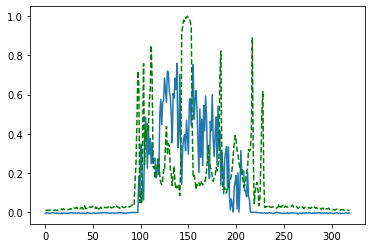

Time taken for epoch:  143.2875692844391
Epoch = [ 29/3000]  Iter = [   0/39480]  Loss = 0.2221 Avg Loss = 0.2221  Time = 0.0791s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 29/3000]  Iter = [ 100/39480]  Loss = 0.2053 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [ 200/39480]  Loss = 0.2054 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [ 300/39480]  Loss = 0.2188 Avg Loss = 0.2175  Time = 0.0048s
Epoch = [ 29/3000]  Iter = [ 400/39480]  Loss = 0.2086 Avg Loss = 0.2191  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [ 500/39480]  Loss = 0.2256 Avg Loss = 0.2181  Time = 0.0033s
Epoch = [ 29/3000]  Iter = [ 600/39480]  Loss = 0.2286 Avg Loss = 0.2161  Time = 0.0033s
Epoch = [ 29/3000]  Iter = [ 700/39480]  Loss = 0.219 Avg Loss = 0.2164  Time = 0.0030s
Epoch = [ 29/3000]  Iter = [ 800/39480]  Loss = 0.2075 Avg Loss = 0.2149  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [ 900/39480]  Loss = 0.1942 Avg Loss = 0.2125  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [1000/39480]  Loss = 0.2528 Avg Loss = 0.2194  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [1100/39480]  Loss = 0.2829 Avg Loss = 0.2195  Time = 0.0031s
Epoch = [ 29/3000]  It

Epoch = [ 29/3000]  Iter = [9400/39480]  Loss = 0.2477 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 29/3000]  Iter = [9500/39480]  Loss = 0.2643 Avg Loss = 0.2221  Time = 0.0030s
Epoch = [ 29/3000]  Iter = [9600/39480]  Loss = 0.2275 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [ 29/3000]  Iter = [9700/39480]  Loss = 0.2328 Avg Loss = 0.2241  Time = 0.0030s
Epoch = [ 29/3000]  Iter = [9800/39480]  Loss = 0.2588 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [9900/39480]  Loss = 0.2181 Avg Loss = 0.2173  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [10000/39480]  Loss = 0.197 Avg Loss = 0.2163  Time = 0.0026s
Epoch = [ 29/3000]  Iter = [10100/39480]  Loss = 0.189 Avg Loss = 0.2142  Time = 0.0021s
Epoch = [ 29/3000]  Iter = [10200/39480]  Loss = 0.1958 Avg Loss = 0.2164  Time = 0.0021s
Epoch = [ 29/3000]  Iter = [10300/39480]  Loss = 0.2267 Avg Loss = 0.2154  Time = 0.0021s
Epoch = [ 29/3000]  Iter = [10400/39480]  Loss = 0.1959 Avg Loss = 0.2162  Time = 0.0021s
Epoch = [ 29/3000]

Epoch = [ 29/3000]  Iter = [18600/39480]  Loss = 0.2106 Avg Loss = 0.218  Time = 0.0032s
Epoch = [ 29/3000]  Iter = [18700/39480]  Loss = 0.2233 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [18800/39480]  Loss = 0.2309 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [18900/39480]  Loss = 0.2387 Avg Loss = 0.2201  Time = 0.0033s
Epoch = [ 29/3000]  Iter = [19000/39480]  Loss = 0.2264 Avg Loss = 0.2144  Time = 0.0033s
Epoch = [ 29/3000]  Iter = [19100/39480]  Loss = 0.2203 Avg Loss = 0.2188  Time = 0.0033s
Epoch = [ 29/3000]  Iter = [19200/39480]  Loss = 0.2154 Avg Loss = 0.2174  Time = 0.0030s
Epoch = [ 29/3000]  Iter = [19300/39480]  Loss = 0.2435 Avg Loss = 0.2165  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [19400/39480]  Loss = 0.2045 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [19500/39480]  Loss = 0.2176 Avg Loss = 0.2132  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [19600/39480]  Loss = 0.2073 Avg Loss = 0.2159  Time = 0.0033s
Epoch = [ 2

Epoch = [ 29/3000]  Iter = [27800/39480]  Loss = 0.1954 Avg Loss = 0.2143  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [27900/39480]  Loss = 0.2279 Avg Loss = 0.2178  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [28000/39480]  Loss = 0.227 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [28100/39480]  Loss = 0.2249 Avg Loss = 0.2177  Time = 0.0032s
Epoch = [ 29/3000]  Iter = [28200/39480]  Loss = 0.257 Avg Loss = 0.2198  Time = 0.0032s
Epoch = [ 29/3000]  Iter = [28300/39480]  Loss = 0.2293 Avg Loss = 0.2195  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [28400/39480]  Loss = 0.2223 Avg Loss = 0.2245  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [28500/39480]  Loss = 0.2122 Avg Loss = 0.2196  Time = 0.0032s
Epoch = [ 29/3000]  Iter = [28600/39480]  Loss = 0.2236 Avg Loss = 0.2184  Time = 0.0033s
Epoch = [ 29/3000]  Iter = [28700/39480]  Loss = 0.2232 Avg Loss = 0.2192  Time = 0.0033s
Epoch = [ 29/3000]  Iter = [28800/39480]  Loss = 0.1884 Avg Loss = 0.2168  Time = 0.0033s
Epoch = [ 29

Epoch = [ 29/3000]  Iter = [37000/39480]  Loss = 0.2266 Avg Loss = 0.2218  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [37100/39480]  Loss = 0.2178 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [37200/39480]  Loss = 0.2208 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [37300/39480]  Loss = 0.2136 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [37400/39480]  Loss = 0.211 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [37500/39480]  Loss = 0.2169 Avg Loss = 0.2138  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [37600/39480]  Loss = 0.2194 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [37700/39480]  Loss = 0.2119 Avg Loss = 0.2196  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [37800/39480]  Loss = 0.2359 Avg Loss = 0.2187  Time = 0.0031s
Epoch = [ 29/3000]  Iter = [37900/39480]  Loss = 0.2074 Avg Loss = 0.2212  Time = 0.0029s
Epoch = [ 29/3000]  Iter = [38000/39480]  Loss = 0.2177 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 29

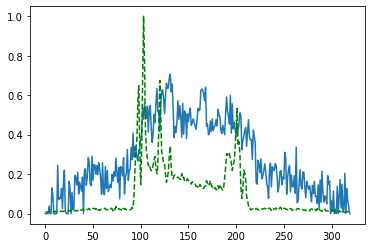

Time taken for epoch:  142.4464213848114
Epoch = [ 30/3000]  Iter = [   0/39480]  Loss = 0.1878 Avg Loss = 0.1878  Time = 0.0784s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 30/3000]  Iter = [ 100/39480]  Loss = 0.198 Avg Loss = 0.2071  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [ 200/39480]  Loss = 0.2225 Avg Loss = 0.2144  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [ 300/39480]  Loss = 0.2006 Avg Loss = 0.2147  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [ 400/39480]  Loss = 0.213 Avg Loss = 0.218  Time = 0.0033s
Epoch = [ 30/3000]  Iter = [ 500/39480]  Loss = 0.1922 Avg Loss = 0.2182  Time = 0.0033s
Epoch = [ 30/3000]  Iter = [ 600/39480]  Loss = 0.2134 Avg Loss = 0.2185  Time = 0.0033s
Epoch = [ 30/3000]  Iter = [ 700/39480]  Loss = 0.2175 Avg Loss = 0.2204  Time = 0.0031s
Epoch = [ 30/3000]  Iter = [ 800/39480]  Loss = 0.2138 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [ 900/39480]  Loss = 0.2266 Avg Loss = 0.2213  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [1000/39480]  Loss = 0.2152 Avg Loss = 0.2191  Time = 0.0031s
Epoch = [ 30/3000]  Iter = [1100/39480]  Loss = 0.2018 Avg Loss = 0.219  Time = 0.0030s
Epoch = [ 30/3000]  Iter 

Epoch = [ 30/3000]  Iter = [9400/39480]  Loss = 0.2025 Avg Loss = 0.219  Time = 0.0035s
Epoch = [ 30/3000]  Iter = [9500/39480]  Loss = 0.2685 Avg Loss = 0.219  Time = 0.0035s
Epoch = [ 30/3000]  Iter = [9600/39480]  Loss = 0.2318 Avg Loss = 0.2158  Time = 0.0032s
Epoch = [ 30/3000]  Iter = [9700/39480]  Loss = 0.2071 Avg Loss = 0.2149  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [9800/39480]  Loss = 0.2513 Avg Loss = 0.2209  Time = 0.0031s
Epoch = [ 30/3000]  Iter = [9900/39480]  Loss = 0.2405 Avg Loss = 0.2174  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [10000/39480]  Loss = 0.1944 Avg Loss = 0.2252  Time = 0.0033s
Epoch = [ 30/3000]  Iter = [10100/39480]  Loss = 0.2392 Avg Loss = 0.2211  Time = 0.0033s
Epoch = [ 30/3000]  Iter = [10200/39480]  Loss = 0.2143 Avg Loss = 0.2195  Time = 0.0031s
Epoch = [ 30/3000]  Iter = [10300/39480]  Loss = 0.2448 Avg Loss = 0.2162  Time = 0.0032s
Epoch = [ 30/3000]  Iter = [10400/39480]  Loss = 0.1896 Avg Loss = 0.2202  Time = 0.0031s
Epoch = [ 30/3000]

Epoch = [ 30/3000]  Iter = [18600/39480]  Loss = 0.1983 Avg Loss = 0.2205  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [18700/39480]  Loss = 0.2516 Avg Loss = 0.217  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [18800/39480]  Loss = 0.1997 Avg Loss = 0.2151  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [18900/39480]  Loss = 0.222 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [19000/39480]  Loss = 0.2261 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [19100/39480]  Loss = 0.1889 Avg Loss = 0.2207  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [19200/39480]  Loss = 0.2197 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 30/3000]  Iter = [19300/39480]  Loss = 0.2355 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [19400/39480]  Loss = 0.2323 Avg Loss = 0.2222  Time = 0.0029s
Epoch = [ 30/3000]  Iter = [19500/39480]  Loss = 0.2527 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [19600/39480]  Loss = 0.2547 Avg Loss = 0.2184  Time = 0.0030s
Epoch = [ 30/3

Epoch = [ 30/3000]  Iter = [27800/39480]  Loss = 0.244 Avg Loss = 0.219  Time = 0.0033s
Epoch = [ 30/3000]  Iter = [27900/39480]  Loss = 0.1918 Avg Loss = 0.2198  Time = 0.0029s
Epoch = [ 30/3000]  Iter = [28000/39480]  Loss = 0.2128 Avg Loss = 0.2194  Time = 0.0031s
Epoch = [ 30/3000]  Iter = [28100/39480]  Loss = 0.2285 Avg Loss = 0.2227  Time = 0.0033s
Epoch = [ 30/3000]  Iter = [28200/39480]  Loss = 0.2276 Avg Loss = 0.2148  Time = 0.0031s
Epoch = [ 30/3000]  Iter = [28300/39480]  Loss = 0.2292 Avg Loss = 0.2153  Time = 0.0032s
Epoch = [ 30/3000]  Iter = [28400/39480]  Loss = 0.2322 Avg Loss = 0.2213  Time = 0.0031s
Epoch = [ 30/3000]  Iter = [28500/39480]  Loss = 0.2449 Avg Loss = 0.2211  Time = 0.0031s
Epoch = [ 30/3000]  Iter = [28600/39480]  Loss = 0.2 Avg Loss = 0.221  Time = 0.0031s
Epoch = [ 30/3000]  Iter = [28700/39480]  Loss = 0.2298 Avg Loss = 0.2197  Time = 0.0045s
Epoch = [ 30/3000]  Iter = [28800/39480]  Loss = 0.2302 Avg Loss = 0.22  Time = 0.0031s
Epoch = [ 30/3000]

Epoch = [ 30/3000]  Iter = [37000/39480]  Loss = 0.2371 Avg Loss = 0.2222  Time = 0.0031s
Epoch = [ 30/3000]  Iter = [37100/39480]  Loss = 0.2491 Avg Loss = 0.2208  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [37200/39480]  Loss = 0.1944 Avg Loss = 0.2185  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [37300/39480]  Loss = 0.1948 Avg Loss = 0.2163  Time = 0.0031s
Epoch = [ 30/3000]  Iter = [37400/39480]  Loss = 0.1783 Avg Loss = 0.2163  Time = 0.0029s
Epoch = [ 30/3000]  Iter = [37500/39480]  Loss = 0.2037 Avg Loss = 0.218  Time = 0.0032s
Epoch = [ 30/3000]  Iter = [37600/39480]  Loss = 0.2425 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 30/3000]  Iter = [37700/39480]  Loss = 0.1886 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 30/3000]  Iter = [37800/39480]  Loss = 0.1967 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 30/3000]  Iter = [37900/39480]  Loss = 0.2045 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [ 30/3000]  Iter = [38000/39480]  Loss = 0.264 Avg Loss = 0.2192  Time = 0.0037s
Epoch = [ 30/

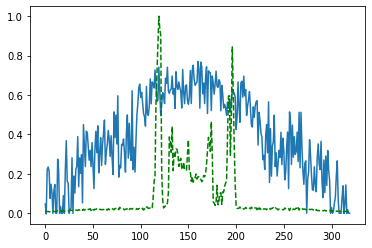

Time taken for epoch:  143.36931920051575
Epoch = [ 31/3000]  Iter = [   0/39480]  Loss = 0.2274 Avg Loss = 0.2274  Time = 0.0853s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 31/3000]  Iter = [ 100/39480]  Loss = 0.2216 Avg Loss = 0.2286  Time = 0.0031s
Epoch = [ 31/3000]  Iter = [ 200/39480]  Loss = 0.2053 Avg Loss = 0.2211  Time = 0.0032s
Epoch = [ 31/3000]  Iter = [ 300/39480]  Loss = 0.233 Avg Loss = 0.2164  Time = 0.0034s
Epoch = [ 31/3000]  Iter = [ 400/39480]  Loss = 0.2305 Avg Loss = 0.2203  Time = 0.0031s
Epoch = [ 31/3000]  Iter = [ 500/39480]  Loss = 0.2383 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [ 600/39480]  Loss = 0.2446 Avg Loss = 0.2152  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [ 700/39480]  Loss = 0.2234 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [ 800/39480]  Loss = 0.1995 Avg Loss = 0.2157  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [ 900/39480]  Loss = 0.1884 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 31/3000]  Iter = [1000/39480]  Loss = 0.2176 Avg Loss = 0.2145  Time = 0.0029s
Epoch = [ 31/3000]  Iter = [1100/39480]  Loss = 0.2176 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 31/3000]  Ite

Epoch = [ 31/3000]  Iter = [9400/39480]  Loss = 0.2603 Avg Loss = 0.217  Time = 0.0028s
Epoch = [ 31/3000]  Iter = [9500/39480]  Loss = 0.2371 Avg Loss = 0.2187  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [9600/39480]  Loss = 0.2388 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [9700/39480]  Loss = 0.2061 Avg Loss = 0.2148  Time = 0.0031s
Epoch = [ 31/3000]  Iter = [9800/39480]  Loss = 0.2476 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 31/3000]  Iter = [9900/39480]  Loss = 0.2203 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [10000/39480]  Loss = 0.2068 Avg Loss = 0.2173  Time = 0.0032s
Epoch = [ 31/3000]  Iter = [10100/39480]  Loss = 0.2208 Avg Loss = 0.2205  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [10200/39480]  Loss = 0.233 Avg Loss = 0.2149  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [10300/39480]  Loss = 0.1975 Avg Loss = 0.2156  Time = 0.0029s
Epoch = [ 31/3000]  Iter = [10400/39480]  Loss = 0.2515 Avg Loss = 0.2202  Time = 0.0032s
Epoch = [ 31/3000]

Epoch = [ 31/3000]  Iter = [18600/39480]  Loss = 0.1828 Avg Loss = 0.2187  Time = 0.0029s
Epoch = [ 31/3000]  Iter = [18700/39480]  Loss = 0.2305 Avg Loss = 0.2196  Time = 0.0033s
Epoch = [ 31/3000]  Iter = [18800/39480]  Loss = 0.2237 Avg Loss = 0.2188  Time = 0.0033s
Epoch = [ 31/3000]  Iter = [18900/39480]  Loss = 0.1956 Avg Loss = 0.2206  Time = 0.0031s
Epoch = [ 31/3000]  Iter = [19000/39480]  Loss = 0.2595 Avg Loss = 0.2215  Time = 0.0031s
Epoch = [ 31/3000]  Iter = [19100/39480]  Loss = 0.2132 Avg Loss = 0.2186  Time = 0.0031s
Epoch = [ 31/3000]  Iter = [19200/39480]  Loss = 0.2395 Avg Loss = 0.219  Time = 0.0033s
Epoch = [ 31/3000]  Iter = [19300/39480]  Loss = 0.2085 Avg Loss = 0.2169  Time = 0.0033s
Epoch = [ 31/3000]  Iter = [19400/39480]  Loss = 0.1852 Avg Loss = 0.2167  Time = 0.0031s
Epoch = [ 31/3000]  Iter = [19500/39480]  Loss = 0.2056 Avg Loss = 0.2163  Time = 0.0033s
Epoch = [ 31/3000]  Iter = [19600/39480]  Loss = 0.172 Avg Loss = 0.2195  Time = 0.0031s
Epoch = [ 31

Epoch = [ 31/3000]  Iter = [27800/39480]  Loss = 0.2339 Avg Loss = 0.2178  Time = 0.0033s
Epoch = [ 31/3000]  Iter = [27900/39480]  Loss = 0.2476 Avg Loss = 0.2179  Time = 0.0033s
Epoch = [ 31/3000]  Iter = [28000/39480]  Loss = 0.21 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [28100/39480]  Loss = 0.206 Avg Loss = 0.2193  Time = 0.0032s
Epoch = [ 31/3000]  Iter = [28200/39480]  Loss = 0.1914 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [28300/39480]  Loss = 0.2534 Avg Loss = 0.2249  Time = 0.0036s
Epoch = [ 31/3000]  Iter = [28400/39480]  Loss = 0.2081 Avg Loss = 0.2209  Time = 0.0033s
Epoch = [ 31/3000]  Iter = [28500/39480]  Loss = 0.2126 Avg Loss = 0.2192  Time = 0.0036s
Epoch = [ 31/3000]  Iter = [28600/39480]  Loss = 0.2906 Avg Loss = 0.2207  Time = 0.0037s
Epoch = [ 31/3000]  Iter = [28700/39480]  Loss = 0.2739 Avg Loss = 0.2186  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [28800/39480]  Loss = 0.2003 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 31/

Epoch = [ 31/3000]  Iter = [37000/39480]  Loss = 0.2156 Avg Loss = 0.2152  Time = 0.0031s
Epoch = [ 31/3000]  Iter = [37100/39480]  Loss = 0.1875 Avg Loss = 0.2186  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [37200/39480]  Loss = 0.2071 Avg Loss = 0.2175  Time = 0.0029s
Epoch = [ 31/3000]  Iter = [37300/39480]  Loss = 0.2287 Avg Loss = 0.2174  Time = 0.0031s
Epoch = [ 31/3000]  Iter = [37400/39480]  Loss = 0.2318 Avg Loss = 0.2236  Time = 0.0029s
Epoch = [ 31/3000]  Iter = [37500/39480]  Loss = 0.2263 Avg Loss = 0.216  Time = 0.0032s
Epoch = [ 31/3000]  Iter = [37600/39480]  Loss = 0.2363 Avg Loss = 0.2168  Time = 0.0031s
Epoch = [ 31/3000]  Iter = [37700/39480]  Loss = 0.2082 Avg Loss = 0.2196  Time = 0.0029s
Epoch = [ 31/3000]  Iter = [37800/39480]  Loss = 0.2121 Avg Loss = 0.221  Time = 0.0029s
Epoch = [ 31/3000]  Iter = [37900/39480]  Loss = 0.1998 Avg Loss = 0.2166  Time = 0.0030s
Epoch = [ 31/3000]  Iter = [38000/39480]  Loss = 0.2326 Avg Loss = 0.2201  Time = 0.0033s
Epoch = [ 31

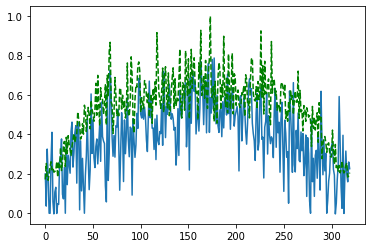

Time taken for epoch:  142.84143233299255
Epoch = [ 32/3000]  Iter = [   0/39480]  Loss = 0.2183 Avg Loss = 0.2183  Time = 0.0825s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 32/3000]  Iter = [ 100/39480]  Loss = 0.2132 Avg Loss = 0.2167  Time = 0.0034s
Epoch = [ 32/3000]  Iter = [ 200/39480]  Loss = 0.2219 Avg Loss = 0.2179  Time = 0.0033s
Epoch = [ 32/3000]  Iter = [ 300/39480]  Loss = 0.1894 Avg Loss = 0.2186  Time = 0.0033s
Epoch = [ 32/3000]  Iter = [ 400/39480]  Loss = 0.2049 Avg Loss = 0.2167  Time = 0.0032s
Epoch = [ 32/3000]  Iter = [ 500/39480]  Loss = 0.2013 Avg Loss = 0.2154  Time = 0.0032s
Epoch = [ 32/3000]  Iter = [ 600/39480]  Loss = 0.238 Avg Loss = 0.2141  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [ 700/39480]  Loss = 0.2202 Avg Loss = 0.2163  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [ 800/39480]  Loss = 0.2148 Avg Loss = 0.2187  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [ 900/39480]  Loss = 0.246 Avg Loss = 0.2211  Time = 0.0033s
Epoch = [ 32/3000]  Iter = [1000/39480]  Loss = 0.1979 Avg Loss = 0.2174  Time = 0.0033s
Epoch = [ 32/3000]  Iter = [1100/39480]  Loss = 0.1863 Avg Loss = 0.2167  Time = 0.0034s
Epoch = [ 32/3000]  Ite

Epoch = [ 32/3000]  Iter = [9400/39480]  Loss = 0.2406 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [9500/39480]  Loss = 0.2304 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [9600/39480]  Loss = 0.2125 Avg Loss = 0.2181  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [9700/39480]  Loss = 0.2282 Avg Loss = 0.2212  Time = 0.0028s
Epoch = [ 32/3000]  Iter = [9800/39480]  Loss = 0.2266 Avg Loss = 0.2172  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [9900/39480]  Loss = 0.2075 Avg Loss = 0.2161  Time = 0.0035s
Epoch = [ 32/3000]  Iter = [10000/39480]  Loss = 0.2272 Avg Loss = 0.2217  Time = 0.0029s
Epoch = [ 32/3000]  Iter = [10100/39480]  Loss = 0.2308 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 32/3000]  Iter = [10200/39480]  Loss = 0.2395 Avg Loss = 0.2245  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [10300/39480]  Loss = 0.2173 Avg Loss = 0.2168  Time = 0.0031s
Epoch = [ 32/3000]  Iter = [10400/39480]  Loss = 0.2027 Avg Loss = 0.2253  Time = 0.0031s
Epoch = [ 32/300

Epoch = [ 32/3000]  Iter = [18600/39480]  Loss = 0.2189 Avg Loss = 0.2152  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [18700/39480]  Loss = 0.2332 Avg Loss = 0.2198  Time = 0.0031s
Epoch = [ 32/3000]  Iter = [18800/39480]  Loss = 0.2615 Avg Loss = 0.218  Time = 0.0031s
Epoch = [ 32/3000]  Iter = [18900/39480]  Loss = 0.2224 Avg Loss = 0.2185  Time = 0.0031s
Epoch = [ 32/3000]  Iter = [19000/39480]  Loss = 0.2679 Avg Loss = 0.2178  Time = 0.0027s
Epoch = [ 32/3000]  Iter = [19100/39480]  Loss = 0.2398 Avg Loss = 0.2186  Time = 0.0031s
Epoch = [ 32/3000]  Iter = [19200/39480]  Loss = 0.2046 Avg Loss = 0.2211  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [19300/39480]  Loss = 0.2124 Avg Loss = 0.22  Time = 0.0031s
Epoch = [ 32/3000]  Iter = [19400/39480]  Loss = 0.2066 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [19500/39480]  Loss = 0.2368 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [19600/39480]  Loss = 0.2535 Avg Loss = 0.2188  Time = 0.0030s
Epoch = [ 32/

Epoch = [ 32/3000]  Iter = [27800/39480]  Loss = 0.1989 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [27900/39480]  Loss = 0.2113 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 32/3000]  Iter = [28000/39480]  Loss = 0.192 Avg Loss = 0.2182  Time = 0.0031s
Epoch = [ 32/3000]  Iter = [28100/39480]  Loss = 0.2454 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 32/3000]  Iter = [28200/39480]  Loss = 0.2496 Avg Loss = 0.2168  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [28300/39480]  Loss = 0.254 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 32/3000]  Iter = [28400/39480]  Loss = 0.188 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 32/3000]  Iter = [28500/39480]  Loss = 0.2292 Avg Loss = 0.2215  Time = 0.0031s
Epoch = [ 32/3000]  Iter = [28600/39480]  Loss = 0.2029 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 32/3000]  Iter = [28700/39480]  Loss = 0.2042 Avg Loss = 0.2147  Time = 0.0032s
Epoch = [ 32/3000]  Iter = [28800/39480]  Loss = 0.224 Avg Loss = 0.2194  Time = 0.0031s
Epoch = [ 32/3

Epoch = [ 32/3000]  Iter = [37000/39480]  Loss = 0.2134 Avg Loss = 0.2189  Time = 0.0021s
Epoch = [ 32/3000]  Iter = [37100/39480]  Loss = 0.2031 Avg Loss = 0.2174  Time = 0.0019s
Epoch = [ 32/3000]  Iter = [37200/39480]  Loss = 0.2467 Avg Loss = 0.2174  Time = 0.0019s
Epoch = [ 32/3000]  Iter = [37300/39480]  Loss = 0.2372 Avg Loss = 0.2166  Time = 0.0021s
Epoch = [ 32/3000]  Iter = [37400/39480]  Loss = 0.2 Avg Loss = 0.2161  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [37500/39480]  Loss = 0.1917 Avg Loss = 0.2196  Time = 0.0017s
Epoch = [ 32/3000]  Iter = [37600/39480]  Loss = 0.1858 Avg Loss = 0.2191  Time = 0.0036s
Epoch = [ 32/3000]  Iter = [37700/39480]  Loss = 0.2535 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [37800/39480]  Loss = 0.2122 Avg Loss = 0.2183  Time = 0.0035s
Epoch = [ 32/3000]  Iter = [37900/39480]  Loss = 0.2021 Avg Loss = 0.2162  Time = 0.0030s
Epoch = [ 32/3000]  Iter = [38000/39480]  Loss = 0.2061 Avg Loss = 0.2181  Time = 0.0022s
Epoch = [ 32/

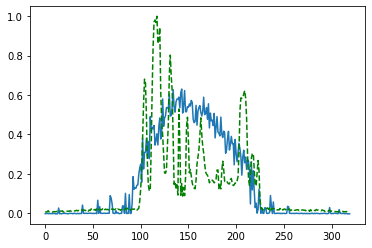

Time taken for epoch:  142.86869168281555
Epoch = [ 33/3000]  Iter = [   0/39480]  Loss = 0.2639 Avg Loss = 0.2639  Time = 0.0917s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 33/3000]  Iter = [ 100/39480]  Loss = 0.22 Avg Loss = 0.2354  Time = 0.0080s
Epoch = [ 33/3000]  Iter = [ 200/39480]  Loss = 0.2461 Avg Loss = 0.2254  Time = 0.0022s
Epoch = [ 33/3000]  Iter = [ 300/39480]  Loss = 0.2023 Avg Loss = 0.2193  Time = 0.0081s
Epoch = [ 33/3000]  Iter = [ 400/39480]  Loss = 0.2445 Avg Loss = 0.2197  Time = 0.0029s
Epoch = [ 33/3000]  Iter = [ 500/39480]  Loss = 0.2182 Avg Loss = 0.2133  Time = 0.0036s
Epoch = [ 33/3000]  Iter = [ 600/39480]  Loss = 0.2086 Avg Loss = 0.2201  Time = 0.0031s
Epoch = [ 33/3000]  Iter = [ 700/39480]  Loss = 0.2352 Avg Loss = 0.2179  Time = 0.0022s
Epoch = [ 33/3000]  Iter = [ 800/39480]  Loss = 0.2294 Avg Loss = 0.2168  Time = 0.0032s
Epoch = [ 33/3000]  Iter = [ 900/39480]  Loss = 0.2339 Avg Loss = 0.2221  Time = 0.0031s
Epoch = [ 33/3000]  Iter = [1000/39480]  Loss = 0.2215 Avg Loss = 0.2201  Time = 0.0028s
Epoch = [ 33/3000]  Iter = [1100/39480]  Loss = 0.2195 Avg Loss = 0.217  Time = 0.0031s
Epoch = [ 33/3000]  Iter

Epoch = [ 33/3000]  Iter = [9400/39480]  Loss = 0.2366 Avg Loss = 0.2162  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [9500/39480]  Loss = 0.203 Avg Loss = 0.2181  Time = 0.0074s
Epoch = [ 33/3000]  Iter = [9600/39480]  Loss = 0.1996 Avg Loss = 0.2181  Time = 0.0037s
Epoch = [ 33/3000]  Iter = [9700/39480]  Loss = 0.2337 Avg Loss = 0.2174  Time = 0.0019s
Epoch = [ 33/3000]  Iter = [9800/39480]  Loss = 0.2382 Avg Loss = 0.2149  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [9900/39480]  Loss = 0.2394 Avg Loss = 0.2191  Time = 0.0025s
Epoch = [ 33/3000]  Iter = [10000/39480]  Loss = 0.2017 Avg Loss = 0.2204  Time = 0.0019s
Epoch = [ 33/3000]  Iter = [10100/39480]  Loss = 0.2214 Avg Loss = 0.2159  Time = 0.0039s
Epoch = [ 33/3000]  Iter = [10200/39480]  Loss = 0.2009 Avg Loss = 0.2162  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [10300/39480]  Loss = 0.222 Avg Loss = 0.2158  Time = 0.0019s
Epoch = [ 33/3000]  Iter = [10400/39480]  Loss = 0.1972 Avg Loss = 0.2163  Time = 0.0061s
Epoch = [ 33/3000]

Epoch = [ 33/3000]  Iter = [18600/39480]  Loss = 0.1978 Avg Loss = 0.22  Time = 0.0023s
Epoch = [ 33/3000]  Iter = [18700/39480]  Loss = 0.2193 Avg Loss = 0.2188  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [18800/39480]  Loss = 0.2207 Avg Loss = 0.2262  Time = 0.0023s
Epoch = [ 33/3000]  Iter = [18900/39480]  Loss = 0.2089 Avg Loss = 0.2184  Time = 0.0024s
Epoch = [ 33/3000]  Iter = [19000/39480]  Loss = 0.2379 Avg Loss = 0.2165  Time = 0.0037s
Epoch = [ 33/3000]  Iter = [19100/39480]  Loss = 0.1959 Avg Loss = 0.2159  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [19200/39480]  Loss = 0.1903 Avg Loss = 0.2143  Time = 0.0021s
Epoch = [ 33/3000]  Iter = [19300/39480]  Loss = 0.2247 Avg Loss = 0.2166  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [19400/39480]  Loss = 0.2483 Avg Loss = 0.2158  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [19500/39480]  Loss = 0.2162 Avg Loss = 0.2182  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [19600/39480]  Loss = 0.2296 Avg Loss = 0.2162  Time = 0.0027s
Epoch = [ 33

Epoch = [ 33/3000]  Iter = [27900/39480]  Loss = 0.2023 Avg Loss = 0.2208  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [28000/39480]  Loss = 0.1911 Avg Loss = 0.2129  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [28100/39480]  Loss = 0.214 Avg Loss = 0.2165  Time = 0.0021s
Epoch = [ 33/3000]  Iter = [28200/39480]  Loss = 0.2403 Avg Loss = 0.2191  Time = 0.0037s
Epoch = [ 33/3000]  Iter = [28300/39480]  Loss = 0.1842 Avg Loss = 0.2206  Time = 0.0027s
Epoch = [ 33/3000]  Iter = [28400/39480]  Loss = 0.2619 Avg Loss = 0.217  Time = 0.0017s
Epoch = [ 33/3000]  Iter = [28500/39480]  Loss = 0.2012 Avg Loss = 0.2171  Time = 0.0030s
Epoch = [ 33/3000]  Iter = [28600/39480]  Loss = 0.1991 Avg Loss = 0.2166  Time = 0.0022s
Epoch = [ 33/3000]  Iter = [28700/39480]  Loss = 0.2106 Avg Loss = 0.2223  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [28800/39480]  Loss = 0.253 Avg Loss = 0.2208  Time = 0.0025s
Epoch = [ 33/3000]  Iter = [28900/39480]  Loss = 0.2587 Avg Loss = 0.2178  Time = 0.0019s
Epoch = [ 33/

Epoch = [ 33/3000]  Iter = [37100/39480]  Loss = 0.2278 Avg Loss = 0.2196  Time = 0.0024s
Epoch = [ 33/3000]  Iter = [37200/39480]  Loss = 0.1989 Avg Loss = 0.2215  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [37300/39480]  Loss = 0.2195 Avg Loss = 0.2202  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [37400/39480]  Loss = 0.2366 Avg Loss = 0.2239  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [37500/39480]  Loss = 0.2325 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [37600/39480]  Loss = 0.2113 Avg Loss = 0.2157  Time = 0.0019s
Epoch = [ 33/3000]  Iter = [37700/39480]  Loss = 0.2334 Avg Loss = 0.2206  Time = 0.0021s
Epoch = [ 33/3000]  Iter = [37800/39480]  Loss = 0.2011 Avg Loss = 0.2141  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [37900/39480]  Loss = 0.2351 Avg Loss = 0.2144  Time = 0.0018s
Epoch = [ 33/3000]  Iter = [38000/39480]  Loss = 0.2478 Avg Loss = 0.2151  Time = 0.0022s
Epoch = [ 33/3000]  Iter = [38100/39480]  Loss = 0.2317 Avg Loss = 0.2248  Time = 0.0025s
Epoch = [ 3

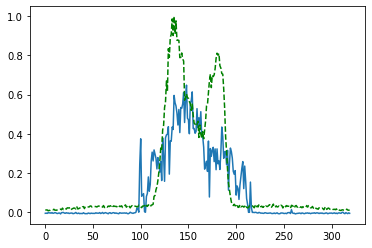

Time taken for epoch:  124.3928575515747
Epoch = [ 34/3000]  Iter = [   0/39480]  Loss = 0.2441 Avg Loss = 0.2441  Time = 0.1283s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 34/3000]  Iter = [ 100/39480]  Loss = 0.2271 Avg Loss = 0.2303  Time = 0.0019s
Epoch = [ 34/3000]  Iter = [ 200/39480]  Loss = 0.2374 Avg Loss = 0.2197  Time = 0.0029s
Epoch = [ 34/3000]  Iter = [ 300/39480]  Loss = 0.2401 Avg Loss = 0.2177  Time = 0.0019s
Epoch = [ 34/3000]  Iter = [ 400/39480]  Loss = 0.2297 Avg Loss = 0.2196  Time = 0.0019s
Epoch = [ 34/3000]  Iter = [ 500/39480]  Loss = 0.2275 Avg Loss = 0.2192  Time = 0.0021s
Epoch = [ 34/3000]  Iter = [ 600/39480]  Loss = 0.2222 Avg Loss = 0.2224  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [ 700/39480]  Loss = 0.1795 Avg Loss = 0.2226  Time = 0.0019s
Epoch = [ 34/3000]  Iter = [ 800/39480]  Loss = 0.2355 Avg Loss = 0.2241  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [ 900/39480]  Loss = 0.193 Avg Loss = 0.2188  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [1000/39480]  Loss = 0.2235 Avg Loss = 0.2156  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [1100/39480]  Loss = 0.2499 Avg Loss = 0.2187  Time = 0.0020s
Epoch = [ 34/3000]  It

Epoch = [ 34/3000]  Iter = [9500/39480]  Loss = 0.2124 Avg Loss = 0.2154  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [9600/39480]  Loss = 0.1916 Avg Loss = 0.2211  Time = 0.0024s
Epoch = [ 34/3000]  Iter = [9700/39480]  Loss = 0.2138 Avg Loss = 0.218  Time = 0.0069s
Epoch = [ 34/3000]  Iter = [9800/39480]  Loss = 0.2406 Avg Loss = 0.2165  Time = 0.0112s
Epoch = [ 34/3000]  Iter = [9900/39480]  Loss = 0.2388 Avg Loss = 0.2198  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [10000/39480]  Loss = 0.1957 Avg Loss = 0.2188  Time = 0.0023s
Epoch = [ 34/3000]  Iter = [10100/39480]  Loss = 0.2011 Avg Loss = 0.2162  Time = 0.0019s
Epoch = [ 34/3000]  Iter = [10200/39480]  Loss = 0.221 Avg Loss = 0.2187  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [10300/39480]  Loss = 0.2024 Avg Loss = 0.2169  Time = 0.0023s
Epoch = [ 34/3000]  Iter = [10400/39480]  Loss = 0.2085 Avg Loss = 0.2186  Time = 0.0039s
Epoch = [ 34/3000]  Iter = [10500/39480]  Loss = 0.1873 Avg Loss = 0.216  Time = 0.0018s
Epoch = [ 34/3000]

Epoch = [ 34/3000]  Iter = [18700/39480]  Loss = 0.2243 Avg Loss = 0.2154  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [18800/39480]  Loss = 0.2118 Avg Loss = 0.2211  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [18900/39480]  Loss = 0.2242 Avg Loss = 0.2209  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [19000/39480]  Loss = 0.2106 Avg Loss = 0.2222  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [19100/39480]  Loss = 0.227 Avg Loss = 0.2163  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [19200/39480]  Loss = 0.2308 Avg Loss = 0.2213  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [19300/39480]  Loss = 0.2054 Avg Loss = 0.2171  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [19400/39480]  Loss = 0.2068 Avg Loss = 0.2129  Time = 0.0046s
Epoch = [ 34/3000]  Iter = [19500/39480]  Loss = 0.1811 Avg Loss = 0.2133  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [19600/39480]  Loss = 0.186 Avg Loss = 0.2167  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [19700/39480]  Loss = 0.207 Avg Loss = 0.217  Time = 0.0018s
Epoch = [ 34/3

Epoch = [ 34/3000]  Iter = [27900/39480]  Loss = 0.2027 Avg Loss = 0.2156  Time = 0.0017s
Epoch = [ 34/3000]  Iter = [28000/39480]  Loss = 0.1658 Avg Loss = 0.2161  Time = 0.0060s
Epoch = [ 34/3000]  Iter = [28100/39480]  Loss = 0.2455 Avg Loss = 0.2149  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [28200/39480]  Loss = 0.2443 Avg Loss = 0.2174  Time = 0.0020s
Epoch = [ 34/3000]  Iter = [28300/39480]  Loss = 0.2147 Avg Loss = 0.2168  Time = 0.0017s
Epoch = [ 34/3000]  Iter = [28400/39480]  Loss = 0.2093 Avg Loss = 0.2235  Time = 0.0017s
Epoch = [ 34/3000]  Iter = [28500/39480]  Loss = 0.2167 Avg Loss = 0.2186  Time = 0.0017s
Epoch = [ 34/3000]  Iter = [28600/39480]  Loss = 0.1977 Avg Loss = 0.2176  Time = 0.0017s
Epoch = [ 34/3000]  Iter = [28700/39480]  Loss = 0.222 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [28800/39480]  Loss = 0.1846 Avg Loss = 0.2135  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [28900/39480]  Loss = 0.233 Avg Loss = 0.2211  Time = 0.0018s
Epoch = [ 34/

Epoch = [ 34/3000]  Iter = [37100/39480]  Loss = 0.2042 Avg Loss = 0.218  Time = 0.0024s
Epoch = [ 34/3000]  Iter = [37200/39480]  Loss = 0.1945 Avg Loss = 0.2179  Time = 0.0022s
Epoch = [ 34/3000]  Iter = [37300/39480]  Loss = 0.2331 Avg Loss = 0.2191  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [37400/39480]  Loss = 0.2213 Avg Loss = 0.2181  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [37500/39480]  Loss = 0.2129 Avg Loss = 0.2237  Time = 0.0018s
Epoch = [ 34/3000]  Iter = [37600/39480]  Loss = 0.2738 Avg Loss = 0.2219  Time = 0.0021s
Epoch = [ 34/3000]  Iter = [37700/39480]  Loss = 0.2212 Avg Loss = 0.2167  Time = 0.0021s
Epoch = [ 34/3000]  Iter = [37800/39480]  Loss = 0.2048 Avg Loss = 0.2193  Time = 0.0024s
Epoch = [ 34/3000]  Iter = [37900/39480]  Loss = 0.1926 Avg Loss = 0.2151  Time = 0.0021s
Epoch = [ 34/3000]  Iter = [38000/39480]  Loss = 0.2378 Avg Loss = 0.2167  Time = 0.0053s
Epoch = [ 34/3000]  Iter = [38100/39480]  Loss = 0.2149 Avg Loss = 0.2199  Time = 0.0021s
Epoch = [ 3

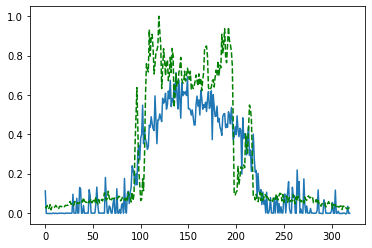

Time taken for epoch:  118.6682276725769
Epoch = [ 35/3000]  Iter = [   0/39480]  Loss = 0.1856 Avg Loss = 0.1856  Time = 0.1019s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 35/3000]  Iter = [ 100/39480]  Loss = 0.2096 Avg Loss = 0.2061  Time = 0.0041s
Epoch = [ 35/3000]  Iter = [ 200/39480]  Loss = 0.1921 Avg Loss = 0.2117  Time = 0.0019s
Epoch = [ 35/3000]  Iter = [ 300/39480]  Loss = 0.2074 Avg Loss = 0.2195  Time = 0.0019s
Epoch = [ 35/3000]  Iter = [ 400/39480]  Loss = 0.2047 Avg Loss = 0.2151  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [ 500/39480]  Loss = 0.1788 Avg Loss = 0.2204  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [ 600/39480]  Loss = 0.1981 Avg Loss = 0.218  Time = 0.0019s
Epoch = [ 35/3000]  Iter = [ 700/39480]  Loss = 0.2269 Avg Loss = 0.2193  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [ 800/39480]  Loss = 0.2234 Avg Loss = 0.2182  Time = 0.0042s
Epoch = [ 35/3000]  Iter = [ 900/39480]  Loss = 0.21 Avg Loss = 0.2169  Time = 0.0019s
Epoch = [ 35/3000]  Iter = [1000/39480]  Loss = 0.2431 Avg Loss = 0.2196  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [1100/39480]  Loss = 0.2124 Avg Loss = 0.2228  Time = 0.0018s
Epoch = [ 35/3000]  Iter

Epoch = [ 35/3000]  Iter = [9400/39480]  Loss = 0.2061 Avg Loss = 0.2178  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [9500/39480]  Loss = 0.2253 Avg Loss = 0.2139  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [9600/39480]  Loss = 0.2382 Avg Loss = 0.2218  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [9700/39480]  Loss = 0.2012 Avg Loss = 0.2151  Time = 0.0019s
Epoch = [ 35/3000]  Iter = [9800/39480]  Loss = 0.2609 Avg Loss = 0.216  Time = 0.0024s
Epoch = [ 35/3000]  Iter = [9900/39480]  Loss = 0.1899 Avg Loss = 0.2161  Time = 0.0024s
Epoch = [ 35/3000]  Iter = [10000/39480]  Loss = 0.2145 Avg Loss = 0.2204  Time = 0.0022s
Epoch = [ 35/3000]  Iter = [10100/39480]  Loss = 0.205 Avg Loss = 0.2204  Time = 0.0017s
Epoch = [ 35/3000]  Iter = [10200/39480]  Loss = 0.2116 Avg Loss = 0.216  Time = 0.0023s
Epoch = [ 35/3000]  Iter = [10300/39480]  Loss = 0.1987 Avg Loss = 0.2182  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [10400/39480]  Loss = 0.2083 Avg Loss = 0.2192  Time = 0.0018s
Epoch = [ 35/3000] 

Epoch = [ 35/3000]  Iter = [18600/39480]  Loss = 0.1861 Avg Loss = 0.2169  Time = 0.0019s
Epoch = [ 35/3000]  Iter = [18700/39480]  Loss = 0.208 Avg Loss = 0.2165  Time = 0.0017s
Epoch = [ 35/3000]  Iter = [18800/39480]  Loss = 0.2179 Avg Loss = 0.2193  Time = 0.0017s
Epoch = [ 35/3000]  Iter = [18900/39480]  Loss = 0.2394 Avg Loss = 0.22  Time = 0.0017s
Epoch = [ 35/3000]  Iter = [19000/39480]  Loss = 0.2148 Avg Loss = 0.2191  Time = 0.0017s
Epoch = [ 35/3000]  Iter = [19100/39480]  Loss = 0.2158 Avg Loss = 0.2188  Time = 0.0017s
Epoch = [ 35/3000]  Iter = [19200/39480]  Loss = 0.1891 Avg Loss = 0.2154  Time = 0.0017s
Epoch = [ 35/3000]  Iter = [19300/39480]  Loss = 0.2337 Avg Loss = 0.2165  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [19400/39480]  Loss = 0.247 Avg Loss = 0.2166  Time = 0.0017s
Epoch = [ 35/3000]  Iter = [19500/39480]  Loss = 0.1818 Avg Loss = 0.2177  Time = 0.0017s
Epoch = [ 35/3000]  Iter = [19600/39480]  Loss = 0.1988 Avg Loss = 0.2169  Time = 0.0018s
Epoch = [ 35/3

Epoch = [ 35/3000]  Iter = [27800/39480]  Loss = 0.2294 Avg Loss = 0.2171  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [27900/39480]  Loss = 0.2061 Avg Loss = 0.2225  Time = 0.0016s
Epoch = [ 35/3000]  Iter = [28000/39480]  Loss = 0.1993 Avg Loss = 0.2187  Time = 0.0017s
Epoch = [ 35/3000]  Iter = [28100/39480]  Loss = 0.2176 Avg Loss = 0.2252  Time = 0.0017s
Epoch = [ 35/3000]  Iter = [28200/39480]  Loss = 0.1998 Avg Loss = 0.2206  Time = 0.0022s
Epoch = [ 35/3000]  Iter = [28300/39480]  Loss = 0.2398 Avg Loss = 0.2172  Time = 0.0019s
Epoch = [ 35/3000]  Iter = [28400/39480]  Loss = 0.24 Avg Loss = 0.2198  Time = 0.0019s
Epoch = [ 35/3000]  Iter = [28500/39480]  Loss = 0.1815 Avg Loss = 0.2194  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [28600/39480]  Loss = 0.2037 Avg Loss = 0.2221  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [28700/39480]  Loss = 0.1905 Avg Loss = 0.2171  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [28800/39480]  Loss = 0.2145 Avg Loss = 0.2158  Time = 0.0098s
Epoch = [ 35

Epoch = [ 35/3000]  Iter = [37000/39480]  Loss = 0.2093 Avg Loss = 0.2204  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [37100/39480]  Loss = 0.236 Avg Loss = 0.2207  Time = 0.0052s
Epoch = [ 35/3000]  Iter = [37200/39480]  Loss = 0.2082 Avg Loss = 0.2183  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [37300/39480]  Loss = 0.2034 Avg Loss = 0.2181  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [37400/39480]  Loss = 0.2387 Avg Loss = 0.2181  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [37500/39480]  Loss = 0.2112 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [37600/39480]  Loss = 0.2009 Avg Loss = 0.2175  Time = 0.0017s
Epoch = [ 35/3000]  Iter = [37700/39480]  Loss = 0.2364 Avg Loss = 0.2185  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [37800/39480]  Loss = 0.1899 Avg Loss = 0.2218  Time = 0.0018s
Epoch = [ 35/3000]  Iter = [37900/39480]  Loss = 0.2278 Avg Loss = 0.2234  Time = 0.0019s
Epoch = [ 35/3000]  Iter = [38000/39480]  Loss = 0.2603 Avg Loss = 0.2164  Time = 0.0018s
Epoch = [ 3

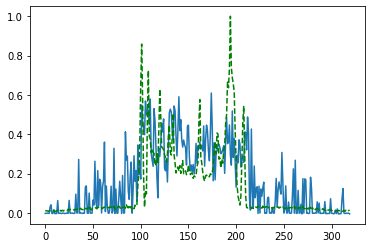

Time taken for epoch:  107.73509907722473
Epoch = [ 36/3000]  Iter = [   0/39480]  Loss = 0.205 Avg Loss = 0.205  Time = 0.0980s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 36/3000]  Iter = [ 100/39480]  Loss = 0.2454 Avg Loss = 0.2114  Time = 0.0019s
Epoch = [ 36/3000]  Iter = [ 200/39480]  Loss = 0.2507 Avg Loss = 0.221  Time = 0.0021s
Epoch = [ 36/3000]  Iter = [ 300/39480]  Loss = 0.2287 Avg Loss = 0.2243  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [ 400/39480]  Loss = 0.232 Avg Loss = 0.2187  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [ 500/39480]  Loss = 0.2182 Avg Loss = 0.2152  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [ 600/39480]  Loss = 0.2016 Avg Loss = 0.2163  Time = 0.0062s
Epoch = [ 36/3000]  Iter = [ 700/39480]  Loss = 0.2212 Avg Loss = 0.2232  Time = 0.0023s
Epoch = [ 36/3000]  Iter = [ 800/39480]  Loss = 0.2248 Avg Loss = 0.2164  Time = 0.0041s
Epoch = [ 36/3000]  Iter = [ 900/39480]  Loss = 0.2163 Avg Loss = 0.2186  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [1000/39480]  Loss = 0.2103 Avg Loss = 0.219  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [1100/39480]  Loss = 0.2459 Avg Loss = 0.2217  Time = 0.0017s
Epoch = [ 36/3000]  Iter

Epoch = [ 36/3000]  Iter = [9400/39480]  Loss = 0.2215 Avg Loss = 0.2194  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [9500/39480]  Loss = 0.2185 Avg Loss = 0.2164  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [9600/39480]  Loss = 0.2418 Avg Loss = 0.2216  Time = 0.0023s
Epoch = [ 36/3000]  Iter = [9700/39480]  Loss = 0.2243 Avg Loss = 0.2177  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [9800/39480]  Loss = 0.2188 Avg Loss = 0.2185  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [9900/39480]  Loss = 0.2948 Avg Loss = 0.2199  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [10000/39480]  Loss = 0.2253 Avg Loss = 0.2213  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [10100/39480]  Loss = 0.2871 Avg Loss = 0.2177  Time = 0.0021s
Epoch = [ 36/3000]  Iter = [10200/39480]  Loss = 0.2077 Avg Loss = 0.223  Time = 0.0022s
Epoch = [ 36/3000]  Iter = [10300/39480]  Loss = 0.202 Avg Loss = 0.2192  Time = 0.0021s
Epoch = [ 36/3000]  Iter = [10400/39480]  Loss = 0.2265 Avg Loss = 0.2174  Time = 0.0021s
Epoch = [ 36/3000]

Epoch = [ 36/3000]  Iter = [18600/39480]  Loss = 0.2311 Avg Loss = 0.2169  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [18700/39480]  Loss = 0.2021 Avg Loss = 0.215  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [18800/39480]  Loss = 0.2025 Avg Loss = 0.2102  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [18900/39480]  Loss = 0.2294 Avg Loss = 0.2157  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [19000/39480]  Loss = 0.2212 Avg Loss = 0.219  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [19100/39480]  Loss = 0.2292 Avg Loss = 0.2187  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [19200/39480]  Loss = 0.23 Avg Loss = 0.2238  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [19300/39480]  Loss = 0.2349 Avg Loss = 0.2194  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [19400/39480]  Loss = 0.2016 Avg Loss = 0.2189  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [19500/39480]  Loss = 0.1962 Avg Loss = 0.2153  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [19600/39480]  Loss = 0.2051 Avg Loss = 0.2172  Time = 0.0040s
Epoch = [ 36/3

Epoch = [ 36/3000]  Iter = [27800/39480]  Loss = 0.1972 Avg Loss = 0.2134  Time = 0.0022s
Epoch = [ 36/3000]  Iter = [27900/39480]  Loss = 0.2291 Avg Loss = 0.2207  Time = 0.0026s
Epoch = [ 36/3000]  Iter = [28000/39480]  Loss = 0.1856 Avg Loss = 0.222  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [28100/39480]  Loss = 0.2391 Avg Loss = 0.2166  Time = 0.0016s
Epoch = [ 36/3000]  Iter = [28200/39480]  Loss = 0.1953 Avg Loss = 0.2171  Time = 0.0034s
Epoch = [ 36/3000]  Iter = [28300/39480]  Loss = 0.2191 Avg Loss = 0.2204  Time = 0.0019s
Epoch = [ 36/3000]  Iter = [28400/39480]  Loss = 0.1963 Avg Loss = 0.2141  Time = 0.0022s
Epoch = [ 36/3000]  Iter = [28500/39480]  Loss = 0.2892 Avg Loss = 0.218  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [28600/39480]  Loss = 0.1803 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [28700/39480]  Loss = 0.1903 Avg Loss = 0.2144  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [28800/39480]  Loss = 0.1748 Avg Loss = 0.2192  Time = 0.0017s
Epoch = [ 36/

Epoch = [ 36/3000]  Iter = [37100/39480]  Loss = 0.2243 Avg Loss = 0.2155  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [37200/39480]  Loss = 0.2126 Avg Loss = 0.219  Time = 0.0023s
Epoch = [ 36/3000]  Iter = [37300/39480]  Loss = 0.2384 Avg Loss = 0.2161  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [37400/39480]  Loss = 0.199 Avg Loss = 0.2145  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [37500/39480]  Loss = 0.2248 Avg Loss = 0.218  Time = 0.0017s
Epoch = [ 36/3000]  Iter = [37600/39480]  Loss = 0.2174 Avg Loss = 0.2161  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [37700/39480]  Loss = 0.1958 Avg Loss = 0.2174  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [37800/39480]  Loss = 0.2572 Avg Loss = 0.2221  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [37900/39480]  Loss = 0.2081 Avg Loss = 0.2174  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [38000/39480]  Loss = 0.2017 Avg Loss = 0.216  Time = 0.0018s
Epoch = [ 36/3000]  Iter = [38100/39480]  Loss = 0.2565 Avg Loss = 0.2198  Time = 0.0018s
Epoch = [ 36/3

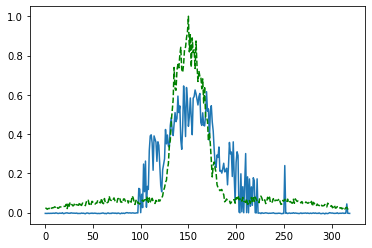

Time taken for epoch:  106.36186218261719
Epoch = [ 37/3000]  Iter = [   0/39480]  Loss = 0.2692 Avg Loss = 0.2692  Time = 0.0966s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 37/3000]  Iter = [ 100/39480]  Loss = 0.2086 Avg Loss = 0.2387  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [ 200/39480]  Loss = 0.2174 Avg Loss = 0.2202  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [ 300/39480]  Loss = 0.2191 Avg Loss = 0.2176  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [ 400/39480]  Loss = 0.2184 Avg Loss = 0.2215  Time = 0.0019s
Epoch = [ 37/3000]  Iter = [ 500/39480]  Loss = 0.2034 Avg Loss = 0.2192  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [ 600/39480]  Loss = 0.2472 Avg Loss = 0.2195  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [ 700/39480]  Loss = 0.2186 Avg Loss = 0.2196  Time = 0.0017s
Epoch = [ 37/3000]  Iter = [ 800/39480]  Loss = 0.2055 Avg Loss = 0.2182  Time = 0.0017s
Epoch = [ 37/3000]  Iter = [ 900/39480]  Loss = 0.204 Avg Loss = 0.2174  Time = 0.0017s
Epoch = [ 37/3000]  Iter = [1000/39480]  Loss = 0.1828 Avg Loss = 0.2181  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [1100/39480]  Loss = 0.2096 Avg Loss = 0.2157  Time = 0.0017s
Epoch = [ 37/3000]  It

Epoch = [ 37/3000]  Iter = [9500/39480]  Loss = 0.2561 Avg Loss = 0.2219  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [9600/39480]  Loss = 0.2001 Avg Loss = 0.217  Time = 0.0019s
Epoch = [ 37/3000]  Iter = [9700/39480]  Loss = 0.206 Avg Loss = 0.2178  Time = 0.0017s
Epoch = [ 37/3000]  Iter = [9800/39480]  Loss = 0.2642 Avg Loss = 0.2208  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [9900/39480]  Loss = 0.2077 Avg Loss = 0.2198  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [10000/39480]  Loss = 0.1951 Avg Loss = 0.2162  Time = 0.0040s
Epoch = [ 37/3000]  Iter = [10100/39480]  Loss = 0.2111 Avg Loss = 0.2138  Time = 0.0021s
Epoch = [ 37/3000]  Iter = [10200/39480]  Loss = 0.2094 Avg Loss = 0.2153  Time = 0.0021s
Epoch = [ 37/3000]  Iter = [10300/39480]  Loss = 0.2265 Avg Loss = 0.214  Time = 0.0031s
Epoch = [ 37/3000]  Iter = [10400/39480]  Loss = 0.2241 Avg Loss = 0.2191  Time = 0.0020s
Epoch = [ 37/3000]  Iter = [10500/39480]  Loss = 0.1883 Avg Loss = 0.2199  Time = 0.0023s
Epoch = [ 37/3000]

Epoch = [ 37/3000]  Iter = [18700/39480]  Loss = 0.2224 Avg Loss = 0.2161  Time = 0.0017s
Epoch = [ 37/3000]  Iter = [18800/39480]  Loss = 0.1632 Avg Loss = 0.2179  Time = 0.0017s
Epoch = [ 37/3000]  Iter = [18900/39480]  Loss = 0.2036 Avg Loss = 0.2179  Time = 0.0026s
Epoch = [ 37/3000]  Iter = [19000/39480]  Loss = 0.2093 Avg Loss = 0.2169  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [19100/39480]  Loss = 0.2282 Avg Loss = 0.2175  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [19200/39480]  Loss = 0.2301 Avg Loss = 0.2188  Time = 0.0057s
Epoch = [ 37/3000]  Iter = [19300/39480]  Loss = 0.2208 Avg Loss = 0.217  Time = 0.0017s
Epoch = [ 37/3000]  Iter = [19400/39480]  Loss = 0.2321 Avg Loss = 0.2202  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [19500/39480]  Loss = 0.2202 Avg Loss = 0.2194  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [19600/39480]  Loss = 0.2291 Avg Loss = 0.2238  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [19700/39480]  Loss = 0.2356 Avg Loss = 0.2199  Time = 0.0018s
Epoch = [ 3

Epoch = [ 37/3000]  Iter = [27900/39480]  Loss = 0.2377 Avg Loss = 0.2197  Time = 0.0020s
Epoch = [ 37/3000]  Iter = [28000/39480]  Loss = 0.2287 Avg Loss = 0.2179  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [28100/39480]  Loss = 0.2043 Avg Loss = 0.2164  Time = 0.0017s
Epoch = [ 37/3000]  Iter = [28200/39480]  Loss = 0.2342 Avg Loss = 0.2169  Time = 0.0021s
Epoch = [ 37/3000]  Iter = [28300/39480]  Loss = 0.2076 Avg Loss = 0.2184  Time = 0.0017s
Epoch = [ 37/3000]  Iter = [28400/39480]  Loss = 0.2181 Avg Loss = 0.2176  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [28500/39480]  Loss = 0.2258 Avg Loss = 0.2167  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [28600/39480]  Loss = 0.2313 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [28700/39480]  Loss = 0.1892 Avg Loss = 0.2185  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [28800/39480]  Loss = 0.2375 Avg Loss = 0.2164  Time = 0.0018s
Epoch = [ 37/3000]  Iter = [28900/39480]  Loss = 0.1904 Avg Loss = 0.2176  Time = 0.0022s
Epoch = [ 

Epoch = [ 37/3000]  Iter = [37100/39480]  Loss = 0.206 Avg Loss = 0.2202  Time = 0.0021s
Epoch = [ 37/3000]  Iter = [37200/39480]  Loss = 0.2252 Avg Loss = 0.2209  Time = 0.0024s
Epoch = [ 37/3000]  Iter = [37300/39480]  Loss = 0.2537 Avg Loss = 0.2199  Time = 0.0021s
Epoch = [ 37/3000]  Iter = [37400/39480]  Loss = 0.1775 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 37/3000]  Iter = [37500/39480]  Loss = 0.2258 Avg Loss = 0.2213  Time = 0.0021s
Epoch = [ 37/3000]  Iter = [37600/39480]  Loss = 0.2172 Avg Loss = 0.2172  Time = 0.0051s
Epoch = [ 37/3000]  Iter = [37700/39480]  Loss = 0.2393 Avg Loss = 0.2172  Time = 0.0021s
Epoch = [ 37/3000]  Iter = [37800/39480]  Loss = 0.2042 Avg Loss = 0.2171  Time = 0.0021s
Epoch = [ 37/3000]  Iter = [37900/39480]  Loss = 0.2097 Avg Loss = 0.2194  Time = 0.0079s
Epoch = [ 37/3000]  Iter = [38000/39480]  Loss = 0.2099 Avg Loss = 0.2188  Time = 0.0021s
Epoch = [ 37/3000]  Iter = [38100/39480]  Loss = 0.1744 Avg Loss = 0.2197  Time = 0.0021s
Epoch = [ 3

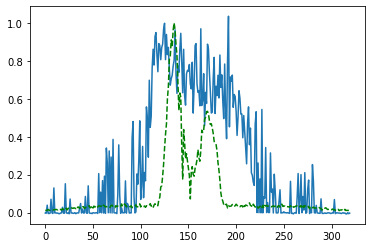

Time taken for epoch:  106.03266310691833
Epoch = [ 38/3000]  Iter = [   0/39480]  Loss = 0.2309 Avg Loss = 0.2309  Time = 0.1064s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 38/3000]  Iter = [ 100/39480]  Loss = 0.2292 Avg Loss = 0.2246  Time = 0.0080s
Epoch = [ 38/3000]  Iter = [ 200/39480]  Loss = 0.2494 Avg Loss = 0.2254  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [ 300/39480]  Loss = 0.2254 Avg Loss = 0.2224  Time = 0.0019s
Epoch = [ 38/3000]  Iter = [ 400/39480]  Loss = 0.2196 Avg Loss = 0.2172  Time = 0.0042s
Epoch = [ 38/3000]  Iter = [ 500/39480]  Loss = 0.2221 Avg Loss = 0.2202  Time = 0.0019s
Epoch = [ 38/3000]  Iter = [ 600/39480]  Loss = 0.2017 Avg Loss = 0.2183  Time = 0.0019s
Epoch = [ 38/3000]  Iter = [ 700/39480]  Loss = 0.2637 Avg Loss = 0.22  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [ 800/39480]  Loss = 0.1919 Avg Loss = 0.2167  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [ 900/39480]  Loss = 0.2268 Avg Loss = 0.2219  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [1000/39480]  Loss = 0.3296 Avg Loss = 0.2166  Time = 0.0020s
Epoch = [ 38/3000]  Iter = [1100/39480]  Loss = 0.2017 Avg Loss = 0.2189  Time = 0.0019s
Epoch = [ 38/3000]  Ite

Epoch = [ 38/3000]  Iter = [9500/39480]  Loss = 0.2173 Avg Loss = 0.2221  Time = 0.0019s
Epoch = [ 38/3000]  Iter = [9600/39480]  Loss = 0.2174 Avg Loss = 0.2188  Time = 0.0034s
Epoch = [ 38/3000]  Iter = [9700/39480]  Loss = 0.2228 Avg Loss = 0.2185  Time = 0.0017s
Epoch = [ 38/3000]  Iter = [9800/39480]  Loss = 0.1831 Avg Loss = 0.2181  Time = 0.0017s
Epoch = [ 38/3000]  Iter = [9900/39480]  Loss = 0.2124 Avg Loss = 0.2205  Time = 0.0022s
Epoch = [ 38/3000]  Iter = [10000/39480]  Loss = 0.2322 Avg Loss = 0.2206  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [10100/39480]  Loss = 0.2196 Avg Loss = 0.2178  Time = 0.0017s
Epoch = [ 38/3000]  Iter = [10200/39480]  Loss = 0.2314 Avg Loss = 0.2189  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [10300/39480]  Loss = 0.2327 Avg Loss = 0.2197  Time = 0.0017s
Epoch = [ 38/3000]  Iter = [10400/39480]  Loss = 0.2499 Avg Loss = 0.2177  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [10500/39480]  Loss = 0.2148 Avg Loss = 0.2221  Time = 0.0018s
Epoch = [ 38/30

Epoch = [ 38/3000]  Iter = [18800/39480]  Loss = 0.2147 Avg Loss = 0.2158  Time = 0.0017s
Epoch = [ 38/3000]  Iter = [18900/39480]  Loss = 0.2367 Avg Loss = 0.2241  Time = 0.0080s
Epoch = [ 38/3000]  Iter = [19000/39480]  Loss = 0.2257 Avg Loss = 0.2175  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [19100/39480]  Loss = 0.24 Avg Loss = 0.2191  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [19200/39480]  Loss = 0.2454 Avg Loss = 0.2206  Time = 0.0022s
Epoch = [ 38/3000]  Iter = [19300/39480]  Loss = 0.2125 Avg Loss = 0.2202  Time = 0.0024s
Epoch = [ 38/3000]  Iter = [19400/39480]  Loss = 0.2094 Avg Loss = 0.2193  Time = 0.0025s
Epoch = [ 38/3000]  Iter = [19500/39480]  Loss = 0.2613 Avg Loss = 0.2187  Time = 0.0017s
Epoch = [ 38/3000]  Iter = [19600/39480]  Loss = 0.2438 Avg Loss = 0.2181  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [19700/39480]  Loss = 0.203 Avg Loss = 0.2203  Time = 0.0043s
Epoch = [ 38/3000]  Iter = [19800/39480]  Loss = 0.2113 Avg Loss = 0.2159  Time = 0.0018s
Epoch = [ 38/

Epoch = [ 38/3000]  Iter = [28000/39480]  Loss = 0.2223 Avg Loss = 0.2186  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [28100/39480]  Loss = 0.1977 Avg Loss = 0.2189  Time = 0.0019s
Epoch = [ 38/3000]  Iter = [28200/39480]  Loss = 0.2566 Avg Loss = 0.2236  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [28300/39480]  Loss = 0.1965 Avg Loss = 0.2213  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [28400/39480]  Loss = 0.2081 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [28500/39480]  Loss = 0.2111 Avg Loss = 0.2166  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [28600/39480]  Loss = 0.194 Avg Loss = 0.2178  Time = 0.0019s
Epoch = [ 38/3000]  Iter = [28700/39480]  Loss = 0.2073 Avg Loss = 0.2161  Time = 0.0017s
Epoch = [ 38/3000]  Iter = [28800/39480]  Loss = 0.2505 Avg Loss = 0.2139  Time = 0.0054s
Epoch = [ 38/3000]  Iter = [28900/39480]  Loss = 0.2119 Avg Loss = 0.2175  Time = 0.0020s
Epoch = [ 38/3000]  Iter = [29000/39480]  Loss = 0.2158 Avg Loss = 0.219  Time = 0.0020s
Epoch = [ 38

Epoch = [ 38/3000]  Iter = [37300/39480]  Loss = 0.213 Avg Loss = 0.2172  Time = 0.0023s
Epoch = [ 38/3000]  Iter = [37400/39480]  Loss = 0.1853 Avg Loss = 0.2202  Time = 0.0017s
Epoch = [ 38/3000]  Iter = [37500/39480]  Loss = 0.2222 Avg Loss = 0.2168  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [37600/39480]  Loss = 0.2274 Avg Loss = 0.2168  Time = 0.0017s
Epoch = [ 38/3000]  Iter = [37700/39480]  Loss = 0.2 Avg Loss = 0.2175  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [37800/39480]  Loss = 0.1834 Avg Loss = 0.2202  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [37900/39480]  Loss = 0.212 Avg Loss = 0.216  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [38000/39480]  Loss = 0.2005 Avg Loss = 0.221  Time = 0.0017s
Epoch = [ 38/3000]  Iter = [38100/39480]  Loss = 0.2284 Avg Loss = 0.2221  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [38200/39480]  Loss = 0.2115 Avg Loss = 0.2221  Time = 0.0018s
Epoch = [ 38/3000]  Iter = [38300/39480]  Loss = 0.2074 Avg Loss = 0.2176  Time = 0.0017s
Epoch = [ 38/3000

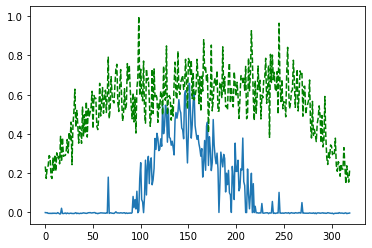

Time taken for epoch:  110.00726962089539
Epoch = [ 39/3000]  Iter = [   0/39480]  Loss = 0.2354 Avg Loss = 0.2354  Time = 0.1004s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 39/3000]  Iter = [ 100/39480]  Loss = 0.247 Avg Loss = 0.2217  Time = 0.0058s
Epoch = [ 39/3000]  Iter = [ 200/39480]  Loss = 0.1889 Avg Loss = 0.2202  Time = 0.0060s
Epoch = [ 39/3000]  Iter = [ 300/39480]  Loss = 0.2171 Avg Loss = 0.221  Time = 0.0019s
Epoch = [ 39/3000]  Iter = [ 400/39480]  Loss = 0.2279 Avg Loss = 0.2195  Time = 0.0019s
Epoch = [ 39/3000]  Iter = [ 500/39480]  Loss = 0.2481 Avg Loss = 0.2169  Time = 0.0024s
Epoch = [ 39/3000]  Iter = [ 600/39480]  Loss = 0.2293 Avg Loss = 0.2168  Time = 0.0024s
Epoch = [ 39/3000]  Iter = [ 700/39480]  Loss = 0.2031 Avg Loss = 0.2175  Time = 0.0024s
Epoch = [ 39/3000]  Iter = [ 800/39480]  Loss = 0.2013 Avg Loss = 0.2225  Time = 0.0023s
Epoch = [ 39/3000]  Iter = [ 900/39480]  Loss = 0.1998 Avg Loss = 0.2186  Time = 0.0024s
Epoch = [ 39/3000]  Iter = [1000/39480]  Loss = 0.2058 Avg Loss = 0.2167  Time = 0.0022s
Epoch = [ 39/3000]  Iter = [1100/39480]  Loss = 0.1992 Avg Loss = 0.2165  Time = 0.0025s
Epoch = [ 39/3000]  Ite

Epoch = [ 39/3000]  Iter = [9500/39480]  Loss = 0.2055 Avg Loss = 0.2202  Time = 0.0017s
Epoch = [ 39/3000]  Iter = [9600/39480]  Loss = 0.1979 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 39/3000]  Iter = [9700/39480]  Loss = 0.2234 Avg Loss = 0.2181  Time = 0.0021s
Epoch = [ 39/3000]  Iter = [9800/39480]  Loss = 0.2238 Avg Loss = 0.221  Time = 0.0017s
Epoch = [ 39/3000]  Iter = [9900/39480]  Loss = 0.203 Avg Loss = 0.2223  Time = 0.0018s
Epoch = [ 39/3000]  Iter = [10000/39480]  Loss = 0.2209 Avg Loss = 0.2187  Time = 0.0018s
Epoch = [ 39/3000]  Iter = [10100/39480]  Loss = 0.2206 Avg Loss = 0.2171  Time = 0.0018s
Epoch = [ 39/3000]  Iter = [10200/39480]  Loss = 0.2144 Avg Loss = 0.2143  Time = 0.0017s
Epoch = [ 39/3000]  Iter = [10300/39480]  Loss = 0.2139 Avg Loss = 0.2212  Time = 0.0017s
Epoch = [ 39/3000]  Iter = [10400/39480]  Loss = 0.2031 Avg Loss = 0.2194  Time = 0.0018s
Epoch = [ 39/3000]  Iter = [10500/39480]  Loss = 0.1833 Avg Loss = 0.2151  Time = 0.0018s
Epoch = [ 39/3000]

Epoch = [ 39/3000]  Iter = [18700/39480]  Loss = 0.2006 Avg Loss = 0.2177  Time = 0.0032s
Epoch = [ 39/3000]  Iter = [18800/39480]  Loss = 0.1986 Avg Loss = 0.2169  Time = 0.0035s
Epoch = [ 39/3000]  Iter = [18900/39480]  Loss = 0.2322 Avg Loss = 0.2183  Time = 0.0034s
Epoch = [ 39/3000]  Iter = [19000/39480]  Loss = 0.2534 Avg Loss = 0.2177  Time = 0.0033s
Epoch = [ 39/3000]  Iter = [19100/39480]  Loss = 0.1973 Avg Loss = 0.2164  Time = 0.0030s
Epoch = [ 39/3000]  Iter = [19200/39480]  Loss = 0.2088 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 39/3000]  Iter = [19300/39480]  Loss = 0.1947 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 39/3000]  Iter = [19400/39480]  Loss = 0.2252 Avg Loss = 0.2205  Time = 0.0029s
Epoch = [ 39/3000]  Iter = [19500/39480]  Loss = 0.2472 Avg Loss = 0.2205  Time = 0.0032s
Epoch = [ 39/3000]  Iter = [19600/39480]  Loss = 0.2338 Avg Loss = 0.2202  Time = 0.0029s
Epoch = [ 39/3000]  Iter = [19700/39480]  Loss = 0.1973 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 

Epoch = [ 39/3000]  Iter = [27900/39480]  Loss = 0.2138 Avg Loss = 0.2194  Time = 0.0029s
Epoch = [ 39/3000]  Iter = [28000/39480]  Loss = 0.1966 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 39/3000]  Iter = [28100/39480]  Loss = 0.2257 Avg Loss = 0.2176  Time = 0.0030s
Epoch = [ 39/3000]  Iter = [28200/39480]  Loss = 0.2408 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 39/3000]  Iter = [28300/39480]  Loss = 0.1921 Avg Loss = 0.2155  Time = 0.0031s
Epoch = [ 39/3000]  Iter = [28400/39480]  Loss = 0.2114 Avg Loss = 0.2153  Time = 0.0029s
Epoch = [ 39/3000]  Iter = [28500/39480]  Loss = 0.2922 Avg Loss = 0.2144  Time = 0.0029s
Epoch = [ 39/3000]  Iter = [28600/39480]  Loss = 0.1635 Avg Loss = 0.2195  Time = 0.0030s
Epoch = [ 39/3000]  Iter = [28700/39480]  Loss = 0.2115 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 39/3000]  Iter = [28800/39480]  Loss = 0.3099 Avg Loss = 0.2226  Time = 0.0031s
Epoch = [ 39/3000]  Iter = [28900/39480]  Loss = 0.2269 Avg Loss = 0.2182  Time = 0.0028s
Epoch = [ 3

Epoch = [ 39/3000]  Iter = [37100/39480]  Loss = 0.2243 Avg Loss = 0.2191  Time = 0.0031s
Epoch = [ 39/3000]  Iter = [37200/39480]  Loss = 0.2311 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 39/3000]  Iter = [37300/39480]  Loss = 0.2375 Avg Loss = 0.2151  Time = 0.0030s
Epoch = [ 39/3000]  Iter = [37400/39480]  Loss = 0.2016 Avg Loss = 0.22  Time = 0.0031s
Epoch = [ 39/3000]  Iter = [37500/39480]  Loss = 0.1847 Avg Loss = 0.2158  Time = 0.0030s
Epoch = [ 39/3000]  Iter = [37600/39480]  Loss = 0.2114 Avg Loss = 0.2175  Time = 0.0030s
Epoch = [ 39/3000]  Iter = [37700/39480]  Loss = 0.1948 Avg Loss = 0.2167  Time = 0.0030s
Epoch = [ 39/3000]  Iter = [37800/39480]  Loss = 0.2038 Avg Loss = 0.2158  Time = 0.0030s
Epoch = [ 39/3000]  Iter = [37900/39480]  Loss = 0.2309 Avg Loss = 0.2128  Time = 0.0030s
Epoch = [ 39/3000]  Iter = [38000/39480]  Loss = 0.2197 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 39/3000]  Iter = [38100/39480]  Loss = 0.2039 Avg Loss = 0.2256  Time = 0.0036s
Epoch = [ 39

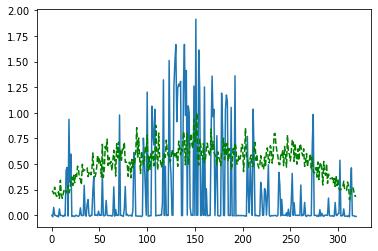

Time taken for epoch:  130.53561234474182
Epoch = [ 40/3000]  Iter = [   0/39480]  Loss = 0.2641 Avg Loss = 0.2641  Time = 0.0883s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 40/3000]  Iter = [ 100/39480]  Loss = 0.2278 Avg Loss = 0.2345  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [ 200/39480]  Loss = 0.2105 Avg Loss = 0.2235  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [ 300/39480]  Loss = 0.2086 Avg Loss = 0.221  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [ 400/39480]  Loss = 0.2094 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 40/3000]  Iter = [ 500/39480]  Loss = 0.2316 Avg Loss = 0.2235  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [ 600/39480]  Loss = 0.2234 Avg Loss = 0.2175  Time = 0.0031s
Epoch = [ 40/3000]  Iter = [ 700/39480]  Loss = 0.2135 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [ 800/39480]  Loss = 0.1995 Avg Loss = 0.2181  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [ 900/39480]  Loss = 0.2091 Avg Loss = 0.22  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [1000/39480]  Loss = 0.2522 Avg Loss = 0.2211  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [1100/39480]  Loss = 0.2263 Avg Loss = 0.2217  Time = 0.0030s
Epoch = [ 40/3000]  Iter 

Epoch = [ 40/3000]  Iter = [9400/39480]  Loss = 0.229 Avg Loss = 0.2129  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [9500/39480]  Loss = 0.2129 Avg Loss = 0.2127  Time = 0.0031s
Epoch = [ 40/3000]  Iter = [9600/39480]  Loss = 0.2227 Avg Loss = 0.2137  Time = 0.0027s
Epoch = [ 40/3000]  Iter = [9700/39480]  Loss = 0.2258 Avg Loss = 0.2146  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [9800/39480]  Loss = 0.2254 Avg Loss = 0.2176  Time = 0.0023s
Epoch = [ 40/3000]  Iter = [9900/39480]  Loss = 0.2264 Avg Loss = 0.2228  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [10000/39480]  Loss = 0.2021 Avg Loss = 0.2201  Time = 0.0036s
Epoch = [ 40/3000]  Iter = [10100/39480]  Loss = 0.2205 Avg Loss = 0.2225  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [10200/39480]  Loss = 0.215 Avg Loss = 0.2188  Time = 0.0032s
Epoch = [ 40/3000]  Iter = [10300/39480]  Loss = 0.2141 Avg Loss = 0.2195  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [10400/39480]  Loss = 0.2226 Avg Loss = 0.2179  Time = 0.0031s
Epoch = [ 40/3000]

Epoch = [ 40/3000]  Iter = [18600/39480]  Loss = 0.2093 Avg Loss = 0.223  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [18700/39480]  Loss = 0.2299 Avg Loss = 0.2186  Time = 0.0028s
Epoch = [ 40/3000]  Iter = [18800/39480]  Loss = 0.2392 Avg Loss = 0.214  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [18900/39480]  Loss = 0.2186 Avg Loss = 0.2159  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [19000/39480]  Loss = 0.2118 Avg Loss = 0.2162  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [19100/39480]  Loss = 0.1998 Avg Loss = 0.2219  Time = 0.0032s
Epoch = [ 40/3000]  Iter = [19200/39480]  Loss = 0.2179 Avg Loss = 0.2219  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [19300/39480]  Loss = 0.2092 Avg Loss = 0.2238  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [19400/39480]  Loss = 0.2202 Avg Loss = 0.2226  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [19500/39480]  Loss = 0.1755 Avg Loss = 0.2196  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [19600/39480]  Loss = 0.2359 Avg Loss = 0.2237  Time = 0.0029s
Epoch = [ 40

Epoch = [ 40/3000]  Iter = [27800/39480]  Loss = 0.2472 Avg Loss = 0.2212  Time = 0.0027s
Epoch = [ 40/3000]  Iter = [27900/39480]  Loss = 0.1988 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [28000/39480]  Loss = 0.1942 Avg Loss = 0.2175  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [28100/39480]  Loss = 0.2362 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [28200/39480]  Loss = 0.2274 Avg Loss = 0.2146  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [28300/39480]  Loss = 0.1966 Avg Loss = 0.2155  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [28400/39480]  Loss = 0.2224 Avg Loss = 0.2174  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [28500/39480]  Loss = 0.2236 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [28600/39480]  Loss = 0.2239 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [28700/39480]  Loss = 0.2305 Avg Loss = 0.2231  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [28800/39480]  Loss = 0.2496 Avg Loss = 0.2226  Time = 0.0029s
Epoch = [ 

Epoch = [ 40/3000]  Iter = [37000/39480]  Loss = 0.2162 Avg Loss = 0.2193  Time = 0.0032s
Epoch = [ 40/3000]  Iter = [37100/39480]  Loss = 0.1864 Avg Loss = 0.221  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [37200/39480]  Loss = 0.2279 Avg Loss = 0.2191  Time = 0.0033s
Epoch = [ 40/3000]  Iter = [37300/39480]  Loss = 0.2143 Avg Loss = 0.221  Time = 0.0030s
Epoch = [ 40/3000]  Iter = [37400/39480]  Loss = 0.2354 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [37500/39480]  Loss = 0.2493 Avg Loss = 0.2174  Time = 0.0031s
Epoch = [ 40/3000]  Iter = [37600/39480]  Loss = 0.2198 Avg Loss = 0.2184  Time = 0.0034s
Epoch = [ 40/3000]  Iter = [37700/39480]  Loss = 0.2332 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [37800/39480]  Loss = 0.2186 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [37900/39480]  Loss = 0.1968 Avg Loss = 0.2197  Time = 0.0029s
Epoch = [ 40/3000]  Iter = [38000/39480]  Loss = 0.2202 Avg Loss = 0.2212  Time = 0.0030s
Epoch = [ 40

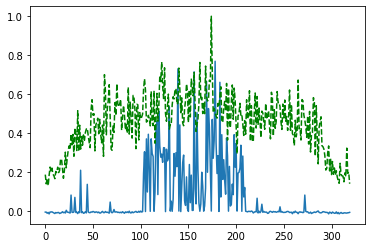

Time taken for epoch:  142.0920000076294
Epoch = [ 41/3000]  Iter = [   0/39480]  Loss = 0.2068 Avg Loss = 0.2068  Time = 0.0887s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 41/3000]  Iter = [ 100/39480]  Loss = 0.202 Avg Loss = 0.21  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [ 200/39480]  Loss = 0.1728 Avg Loss = 0.2141  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [ 300/39480]  Loss = 0.2364 Avg Loss = 0.214  Time = 0.0031s
Epoch = [ 41/3000]  Iter = [ 400/39480]  Loss = 0.227 Avg Loss = 0.2187  Time = 0.0032s
Epoch = [ 41/3000]  Iter = [ 500/39480]  Loss = 0.2103 Avg Loss = 0.221  Time = 0.0028s
Epoch = [ 41/3000]  Iter = [ 600/39480]  Loss = 0.2112 Avg Loss = 0.2201  Time = 0.0031s
Epoch = [ 41/3000]  Iter = [ 700/39480]  Loss = 0.2313 Avg Loss = 0.2217  Time = 0.0031s
Epoch = [ 41/3000]  Iter = [ 800/39480]  Loss = 0.2166 Avg Loss = 0.2158  Time = 0.0032s
Epoch = [ 41/3000]  Iter = [ 900/39480]  Loss = 0.2026 Avg Loss = 0.2151  Time = 0.0030s
Epoch = [ 41/3000]  Iter = [1000/39480]  Loss = 0.2013 Avg Loss = 0.2185  Time = 0.0027s
Epoch = [ 41/3000]  Iter = [1100/39480]  Loss = 0.2169 Avg Loss = 0.2206  Time = 0.0029s
Epoch = [ 41/3000]  Iter = 

Epoch = [ 41/3000]  Iter = [9400/39480]  Loss = 0.2307 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [ 41/3000]  Iter = [9500/39480]  Loss = 0.1895 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [9600/39480]  Loss = 0.2136 Avg Loss = 0.219  Time = 0.0028s
Epoch = [ 41/3000]  Iter = [9700/39480]  Loss = 0.2001 Avg Loss = 0.2176  Time = 0.0032s
Epoch = [ 41/3000]  Iter = [9800/39480]  Loss = 0.2138 Avg Loss = 0.2215  Time = 0.0028s
Epoch = [ 41/3000]  Iter = [9900/39480]  Loss = 0.2121 Avg Loss = 0.2191  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [10000/39480]  Loss = 0.2061 Avg Loss = 0.222  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [10100/39480]  Loss = 0.2127 Avg Loss = 0.2215  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [10200/39480]  Loss = 0.2563 Avg Loss = 0.2175  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [10300/39480]  Loss = 0.1632 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [ 41/3000]  Iter = [10400/39480]  Loss = 0.2348 Avg Loss = 0.2221  Time = 0.0030s
Epoch = [ 41/3000]

Epoch = [ 41/3000]  Iter = [18600/39480]  Loss = 0.2298 Avg Loss = 0.2126  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [18700/39480]  Loss = 0.2235 Avg Loss = 0.215  Time = 0.0026s
Epoch = [ 41/3000]  Iter = [18800/39480]  Loss = 0.1741 Avg Loss = 0.2211  Time = 0.0027s
Epoch = [ 41/3000]  Iter = [18900/39480]  Loss = 0.2069 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [19000/39480]  Loss = 0.1857 Avg Loss = 0.2157  Time = 0.0028s
Epoch = [ 41/3000]  Iter = [19100/39480]  Loss = 0.2057 Avg Loss = 0.2156  Time = 0.0028s
Epoch = [ 41/3000]  Iter = [19200/39480]  Loss = 0.1833 Avg Loss = 0.2169  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [19300/39480]  Loss = 0.2052 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 41/3000]  Iter = [19400/39480]  Loss = 0.1968 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [19500/39480]  Loss = 0.2024 Avg Loss = 0.2176  Time = 0.0030s
Epoch = [ 41/3000]  Iter = [19600/39480]  Loss = 0.2343 Avg Loss = 0.2152  Time = 0.0029s
Epoch = [ 4

Epoch = [ 41/3000]  Iter = [27800/39480]  Loss = 0.1773 Avg Loss = 0.2135  Time = 0.0025s
Epoch = [ 41/3000]  Iter = [27900/39480]  Loss = 0.212 Avg Loss = 0.2147  Time = 0.0026s
Epoch = [ 41/3000]  Iter = [28000/39480]  Loss = 0.2193 Avg Loss = 0.2197  Time = 0.0034s
Epoch = [ 41/3000]  Iter = [28100/39480]  Loss = 0.2314 Avg Loss = 0.2153  Time = 0.0033s
Epoch = [ 41/3000]  Iter = [28200/39480]  Loss = 0.2505 Avg Loss = 0.2142  Time = 0.0030s
Epoch = [ 41/3000]  Iter = [28300/39480]  Loss = 0.1929 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [28400/39480]  Loss = 0.2113 Avg Loss = 0.2193  Time = 0.0025s
Epoch = [ 41/3000]  Iter = [28500/39480]  Loss = 0.2311 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 41/3000]  Iter = [28600/39480]  Loss = 0.2049 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [28700/39480]  Loss = 0.226 Avg Loss = 0.2209  Time = 0.0031s
Epoch = [ 41/3000]  Iter = [28800/39480]  Loss = 0.2088 Avg Loss = 0.2125  Time = 0.0030s
Epoch = [ 41/

Epoch = [ 41/3000]  Iter = [37000/39480]  Loss = 0.2252 Avg Loss = 0.2159  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [37100/39480]  Loss = 0.1984 Avg Loss = 0.2174  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [37200/39480]  Loss = 0.2274 Avg Loss = 0.2221  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [37300/39480]  Loss = 0.202 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 41/3000]  Iter = [37400/39480]  Loss = 0.2071 Avg Loss = 0.2201  Time = 0.0030s
Epoch = [ 41/3000]  Iter = [37500/39480]  Loss = 0.1943 Avg Loss = 0.2242  Time = 0.0032s
Epoch = [ 41/3000]  Iter = [37600/39480]  Loss = 0.2239 Avg Loss = 0.2177  Time = 0.0034s
Epoch = [ 41/3000]  Iter = [37700/39480]  Loss = 0.1925 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [ 41/3000]  Iter = [37800/39480]  Loss = 0.2504 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 41/3000]  Iter = [37900/39480]  Loss = 0.2259 Avg Loss = 0.2223  Time = 0.0035s
Epoch = [ 41/3000]  Iter = [38000/39480]  Loss = 0.2057 Avg Loss = 0.2172  Time = 0.0033s
Epoch = [ 4

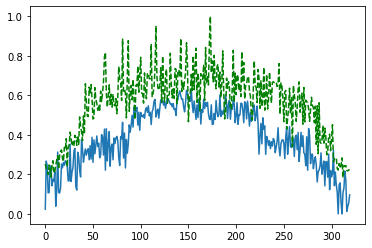

Time taken for epoch:  141.702978849411
Epoch = [ 42/3000]  Iter = [   0/39480]  Loss = 0.1707 Avg Loss = 0.1707  Time = 0.0742s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 42/3000]  Iter = [ 100/39480]  Loss = 0.2058 Avg Loss = 0.1964  Time = 0.0031s
Epoch = [ 42/3000]  Iter = [ 200/39480]  Loss = 0.186 Avg Loss = 0.2077  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [ 300/39480]  Loss = 0.2436 Avg Loss = 0.213  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [ 400/39480]  Loss = 0.2191 Avg Loss = 0.2214  Time = 0.0032s
Epoch = [ 42/3000]  Iter = [ 500/39480]  Loss = 0.2068 Avg Loss = 0.2184  Time = 0.0033s
Epoch = [ 42/3000]  Iter = [ 600/39480]  Loss = 0.1876 Avg Loss = 0.2216  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [ 700/39480]  Loss = 0.1746 Avg Loss = 0.2162  Time = 0.0032s
Epoch = [ 42/3000]  Iter = [ 800/39480]  Loss = 0.2219 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [ 900/39480]  Loss = 0.2989 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 42/3000]  Iter = [1000/39480]  Loss = 0.2197 Avg Loss = 0.2199  Time = 0.0031s
Epoch = [ 42/3000]  Iter = [1100/39480]  Loss = 0.2044 Avg Loss = 0.2201  Time = 0.0033s
Epoch = [ 42/3000]  Ite

Epoch = [ 42/3000]  Iter = [9400/39480]  Loss = 0.2141 Avg Loss = 0.2155  Time = 0.0036s
Epoch = [ 42/3000]  Iter = [9500/39480]  Loss = 0.1929 Avg Loss = 0.2168  Time = 0.0031s
Epoch = [ 42/3000]  Iter = [9600/39480]  Loss = 0.217 Avg Loss = 0.2202  Time = 0.0027s
Epoch = [ 42/3000]  Iter = [9700/39480]  Loss = 0.2416 Avg Loss = 0.2156  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [9800/39480]  Loss = 0.1954 Avg Loss = 0.2135  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [9900/39480]  Loss = 0.2137 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [10000/39480]  Loss = 0.2501 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [10100/39480]  Loss = 0.2427 Avg Loss = 0.2168  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [10200/39480]  Loss = 0.2333 Avg Loss = 0.2205  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [10300/39480]  Loss = 0.2247 Avg Loss = 0.2205  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [10400/39480]  Loss = 0.2897 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 42/3000]

Epoch = [ 42/3000]  Iter = [18600/39480]  Loss = 0.1916 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [18700/39480]  Loss = 0.2154 Avg Loss = 0.2168  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [18800/39480]  Loss = 0.2115 Avg Loss = 0.2241  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [18900/39480]  Loss = 0.1923 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [19000/39480]  Loss = 0.2229 Avg Loss = 0.2156  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [19100/39480]  Loss = 0.2172 Avg Loss = 0.2185  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [19200/39480]  Loss = 0.2047 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [19300/39480]  Loss = 0.223 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [19400/39480]  Loss = 0.2131 Avg Loss = 0.2174  Time = 0.0027s
Epoch = [ 42/3000]  Iter = [19500/39480]  Loss = 0.2348 Avg Loss = 0.2189  Time = 0.0032s
Epoch = [ 42/3000]  Iter = [19600/39480]  Loss = 0.2148 Avg Loss = 0.2208  Time = 0.0030s
Epoch = [ 4

Epoch = [ 42/3000]  Iter = [27800/39480]  Loss = 0.2798 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [27900/39480]  Loss = 0.2194 Avg Loss = 0.2178  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [28000/39480]  Loss = 0.194 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [28100/39480]  Loss = 0.2158 Avg Loss = 0.2239  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [28200/39480]  Loss = 0.2052 Avg Loss = 0.2195  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [28300/39480]  Loss = 0.1899 Avg Loss = 0.2129  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [28400/39480]  Loss = 0.1732 Avg Loss = 0.2175  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [28500/39480]  Loss = 0.2102 Avg Loss = 0.2202  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [28600/39480]  Loss = 0.2368 Avg Loss = 0.2199  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [28700/39480]  Loss = 0.2271 Avg Loss = 0.2183  Time = 0.0033s
Epoch = [ 42/3000]  Iter = [28800/39480]  Loss = 0.2262 Avg Loss = 0.2208  Time = 0.0030s
Epoch = [ 4

Epoch = [ 42/3000]  Iter = [37000/39480]  Loss = 0.2378 Avg Loss = 0.2221  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [37100/39480]  Loss = 0.2535 Avg Loss = 0.2209  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [37200/39480]  Loss = 0.2281 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [37300/39480]  Loss = 0.2239 Avg Loss = 0.2174  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [37400/39480]  Loss = 0.2142 Avg Loss = 0.2171  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [37500/39480]  Loss = 0.2016 Avg Loss = 0.2207  Time = 0.0030s
Epoch = [ 42/3000]  Iter = [37600/39480]  Loss = 0.2581 Avg Loss = 0.2201  Time = 0.0026s
Epoch = [ 42/3000]  Iter = [37700/39480]  Loss = 0.2229 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [37800/39480]  Loss = 0.2298 Avg Loss = 0.2205  Time = 0.0029s
Epoch = [ 42/3000]  Iter = [37900/39480]  Loss = 0.1897 Avg Loss = 0.2142  Time = 0.0028s
Epoch = [ 42/3000]  Iter = [38000/39480]  Loss = 0.2259 Avg Loss = 0.2163  Time = 0.0029s
Epoch = [ 

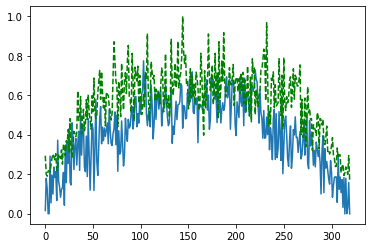

Time taken for epoch:  142.19627594947815
Epoch = [ 43/3000]  Iter = [   0/39480]  Loss = 0.208 Avg Loss = 0.208  Time = 0.1042s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 43/3000]  Iter = [ 100/39480]  Loss = 0.2373 Avg Loss = 0.2169  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [ 200/39480]  Loss = 0.216 Avg Loss = 0.2144  Time = 0.0046s
Epoch = [ 43/3000]  Iter = [ 300/39480]  Loss = 0.2135 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 43/3000]  Iter = [ 400/39480]  Loss = 0.2294 Avg Loss = 0.2199  Time = 0.0030s
Epoch = [ 43/3000]  Iter = [ 500/39480]  Loss = 0.228 Avg Loss = 0.2135  Time = 0.0032s
Epoch = [ 43/3000]  Iter = [ 600/39480]  Loss = 0.1842 Avg Loss = 0.2143  Time = 0.0031s
Epoch = [ 43/3000]  Iter = [ 700/39480]  Loss = 0.2824 Avg Loss = 0.2155  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [ 800/39480]  Loss = 0.1961 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [ 43/3000]  Iter = [ 900/39480]  Loss = 0.227 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [ 43/3000]  Iter = [1000/39480]  Loss = 0.2265 Avg Loss = 0.2202  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [1100/39480]  Loss = 0.2348 Avg Loss = 0.2309  Time = 0.0029s
Epoch = [ 43/3000]  Iter 

Epoch = [ 43/3000]  Iter = [9400/39480]  Loss = 0.207 Avg Loss = 0.2208  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [9500/39480]  Loss = 0.1988 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [9600/39480]  Loss = 0.216 Avg Loss = 0.2221  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [9700/39480]  Loss = 0.3307 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [9800/39480]  Loss = 0.2227 Avg Loss = 0.2168  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [9900/39480]  Loss = 0.1916 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 43/3000]  Iter = [10000/39480]  Loss = 0.1914 Avg Loss = 0.2178  Time = 0.0030s
Epoch = [ 43/3000]  Iter = [10100/39480]  Loss = 0.2804 Avg Loss = 0.2176  Time = 0.0027s
Epoch = [ 43/3000]  Iter = [10200/39480]  Loss = 0.225 Avg Loss = 0.2175  Time = 0.0036s
Epoch = [ 43/3000]  Iter = [10300/39480]  Loss = 0.1808 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [10400/39480]  Loss = 0.2079 Avg Loss = 0.2196  Time = 0.0029s
Epoch = [ 43/3000]  

Epoch = [ 43/3000]  Iter = [18600/39480]  Loss = 0.198 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [18700/39480]  Loss = 0.2223 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [18800/39480]  Loss = 0.2495 Avg Loss = 0.2181  Time = 0.0032s
Epoch = [ 43/3000]  Iter = [18900/39480]  Loss = 0.2217 Avg Loss = 0.219  Time = 0.0028s
Epoch = [ 43/3000]  Iter = [19000/39480]  Loss = 0.184 Avg Loss = 0.2178  Time = 0.0030s
Epoch = [ 43/3000]  Iter = [19100/39480]  Loss = 0.1936 Avg Loss = 0.215  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [19200/39480]  Loss = 0.2236 Avg Loss = 0.2161  Time = 0.0031s
Epoch = [ 43/3000]  Iter = [19300/39480]  Loss = 0.2236 Avg Loss = 0.2229  Time = 0.0030s
Epoch = [ 43/3000]  Iter = [19400/39480]  Loss = 0.2057 Avg Loss = 0.2203  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [19500/39480]  Loss = 0.3156 Avg Loss = 0.2203  Time = 0.0030s
Epoch = [ 43/3000]  Iter = [19600/39480]  Loss = 0.2157 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [ 43/30

Epoch = [ 43/3000]  Iter = [27800/39480]  Loss = 0.2325 Avg Loss = 0.2162  Time = 0.0031s
Epoch = [ 43/3000]  Iter = [27900/39480]  Loss = 0.2318 Avg Loss = 0.2142  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [28000/39480]  Loss = 0.1998 Avg Loss = 0.2188  Time = 0.0030s
Epoch = [ 43/3000]  Iter = [28100/39480]  Loss = 0.2756 Avg Loss = 0.2171  Time = 0.0028s
Epoch = [ 43/3000]  Iter = [28200/39480]  Loss = 0.2317 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [28300/39480]  Loss = 0.2449 Avg Loss = 0.2174  Time = 0.0033s
Epoch = [ 43/3000]  Iter = [28400/39480]  Loss = 0.1779 Avg Loss = 0.2163  Time = 0.0032s
Epoch = [ 43/3000]  Iter = [28500/39480]  Loss = 0.2638 Avg Loss = 0.2224  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [28600/39480]  Loss = 0.2088 Avg Loss = 0.2164  Time = 0.0031s
Epoch = [ 43/3000]  Iter = [28700/39480]  Loss = 0.2047 Avg Loss = 0.2148  Time = 0.0031s
Epoch = [ 43/3000]  Iter = [28800/39480]  Loss = 0.2291 Avg Loss = 0.2158  Time = 0.0030s
Epoch = [ 

Epoch = [ 43/3000]  Iter = [37000/39480]  Loss = 0.2245 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 43/3000]  Iter = [37100/39480]  Loss = 0.2141 Avg Loss = 0.2199  Time = 0.0031s
Epoch = [ 43/3000]  Iter = [37200/39480]  Loss = 0.2193 Avg Loss = 0.2193  Time = 0.0031s
Epoch = [ 43/3000]  Iter = [37300/39480]  Loss = 0.2064 Avg Loss = 0.2209  Time = 0.0027s
Epoch = [ 43/3000]  Iter = [37400/39480]  Loss = 0.2732 Avg Loss = 0.2184  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [37500/39480]  Loss = 0.2203 Avg Loss = 0.2226  Time = 0.0028s
Epoch = [ 43/3000]  Iter = [37600/39480]  Loss = 0.2397 Avg Loss = 0.2226  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [37700/39480]  Loss = 0.2303 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [ 43/3000]  Iter = [37800/39480]  Loss = 0.2349 Avg Loss = 0.2174  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [37900/39480]  Loss = 0.2292 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 43/3000]  Iter = [38000/39480]  Loss = 0.2113 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 4

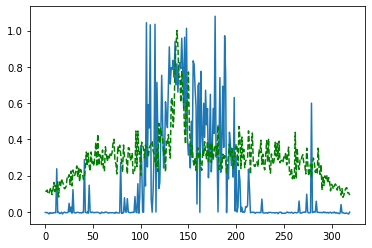

Time taken for epoch:  141.19684839248657
Epoch = [ 44/3000]  Iter = [   0/39480]  Loss = 0.2726 Avg Loss = 0.2726  Time = 0.0781s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 44/3000]  Iter = [ 100/39480]  Loss = 0.2423 Avg Loss = 0.2388  Time = 0.0030s
Epoch = [ 44/3000]  Iter = [ 200/39480]  Loss = 0.2039 Avg Loss = 0.2232  Time = 0.0032s
Epoch = [ 44/3000]  Iter = [ 300/39480]  Loss = 0.2176 Avg Loss = 0.2274  Time = 0.0030s
Epoch = [ 44/3000]  Iter = [ 400/39480]  Loss = 0.247 Avg Loss = 0.2188  Time = 0.0033s
Epoch = [ 44/3000]  Iter = [ 500/39480]  Loss = 0.2333 Avg Loss = 0.2212  Time = 0.0034s
Epoch = [ 44/3000]  Iter = [ 600/39480]  Loss = 0.219 Avg Loss = 0.22  Time = 0.0032s
Epoch = [ 44/3000]  Iter = [ 700/39480]  Loss = 0.1922 Avg Loss = 0.2173  Time = 0.0031s
Epoch = [ 44/3000]  Iter = [ 800/39480]  Loss = 0.2203 Avg Loss = 0.2172  Time = 0.0032s
Epoch = [ 44/3000]  Iter = [ 900/39480]  Loss = 0.2283 Avg Loss = 0.2159  Time = 0.0031s
Epoch = [ 44/3000]  Iter = [1000/39480]  Loss = 0.1901 Avg Loss = 0.2182  Time = 0.0034s
Epoch = [ 44/3000]  Iter = [1100/39480]  Loss = 0.1895 Avg Loss = 0.2217  Time = 0.0031s
Epoch = [ 44/3000]  Iter 

Epoch = [ 44/3000]  Iter = [9400/39480]  Loss = 0.2031 Avg Loss = 0.2209  Time = 0.0030s
Epoch = [ 44/3000]  Iter = [9500/39480]  Loss = 0.2167 Avg Loss = 0.2219  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [9600/39480]  Loss = 0.1951 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [9700/39480]  Loss = 0.223 Avg Loss = 0.2222  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [9800/39480]  Loss = 0.2043 Avg Loss = 0.2229  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [9900/39480]  Loss = 0.1816 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [10000/39480]  Loss = 0.2099 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [10100/39480]  Loss = 0.2438 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [10200/39480]  Loss = 0.2482 Avg Loss = 0.2196  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [10300/39480]  Loss = 0.2675 Avg Loss = 0.2179  Time = 0.0031s
Epoch = [ 44/3000]  Iter = [10400/39480]  Loss = 0.2448 Avg Loss = 0.2218  Time = 0.0031s
Epoch = [ 44/3000] 

Epoch = [ 44/3000]  Iter = [18600/39480]  Loss = 0.2099 Avg Loss = 0.2178  Time = 0.0024s
Epoch = [ 44/3000]  Iter = [18700/39480]  Loss = 0.2288 Avg Loss = 0.2182  Time = 0.0023s
Epoch = [ 44/3000]  Iter = [18800/39480]  Loss = 0.247 Avg Loss = 0.2153  Time = 0.0017s
Epoch = [ 44/3000]  Iter = [18900/39480]  Loss = 0.1924 Avg Loss = 0.2189  Time = 0.0019s
Epoch = [ 44/3000]  Iter = [19000/39480]  Loss = 0.1951 Avg Loss = 0.2172  Time = 0.0018s
Epoch = [ 44/3000]  Iter = [19100/39480]  Loss = 0.2106 Avg Loss = 0.2188  Time = 0.0019s
Epoch = [ 44/3000]  Iter = [19200/39480]  Loss = 0.2103 Avg Loss = 0.2165  Time = 0.0018s
Epoch = [ 44/3000]  Iter = [19300/39480]  Loss = 0.2217 Avg Loss = 0.2186  Time = 0.0020s
Epoch = [ 44/3000]  Iter = [19400/39480]  Loss = 0.2656 Avg Loss = 0.2191  Time = 0.0019s
Epoch = [ 44/3000]  Iter = [19500/39480]  Loss = 0.21 Avg Loss = 0.2162  Time = 0.0018s
Epoch = [ 44/3000]  Iter = [19600/39480]  Loss = 0.2088 Avg Loss = 0.2158  Time = 0.0021s
Epoch = [ 44/

Epoch = [ 44/3000]  Iter = [27800/39480]  Loss = 0.2313 Avg Loss = 0.2212  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [27900/39480]  Loss = 0.2098 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [28000/39480]  Loss = 0.2483 Avg Loss = 0.2199  Time = 0.0031s
Epoch = [ 44/3000]  Iter = [28100/39480]  Loss = 0.2346 Avg Loss = 0.2195  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [28200/39480]  Loss = 0.2111 Avg Loss = 0.215  Time = 0.0032s
Epoch = [ 44/3000]  Iter = [28300/39480]  Loss = 0.1916 Avg Loss = 0.2205  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [28400/39480]  Loss = 0.2246 Avg Loss = 0.2205  Time = 0.0031s
Epoch = [ 44/3000]  Iter = [28500/39480]  Loss = 0.2322 Avg Loss = 0.2187  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [28600/39480]  Loss = 0.2304 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [28700/39480]  Loss = 0.206 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [28800/39480]  Loss = 0.2341 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 44

Epoch = [ 44/3000]  Iter = [37000/39480]  Loss = 0.2164 Avg Loss = 0.2196  Time = 0.0031s
Epoch = [ 44/3000]  Iter = [37100/39480]  Loss = 0.2238 Avg Loss = 0.2182  Time = 0.0040s
Epoch = [ 44/3000]  Iter = [37200/39480]  Loss = 0.2316 Avg Loss = 0.2181  Time = 0.0032s
Epoch = [ 44/3000]  Iter = [37300/39480]  Loss = 0.2326 Avg Loss = 0.222  Time = 0.0030s
Epoch = [ 44/3000]  Iter = [37400/39480]  Loss = 0.2506 Avg Loss = 0.2182  Time = 0.0031s
Epoch = [ 44/3000]  Iter = [37500/39480]  Loss = 0.2207 Avg Loss = 0.2137  Time = 0.0033s
Epoch = [ 44/3000]  Iter = [37600/39480]  Loss = 0.1819 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [ 44/3000]  Iter = [37700/39480]  Loss = 0.2495 Avg Loss = 0.2186  Time = 0.0031s
Epoch = [ 44/3000]  Iter = [37800/39480]  Loss = 0.2363 Avg Loss = 0.2198  Time = 0.0031s
Epoch = [ 44/3000]  Iter = [37900/39480]  Loss = 0.1938 Avg Loss = 0.2182  Time = 0.0036s
Epoch = [ 44/3000]  Iter = [38000/39480]  Loss = 0.2107 Avg Loss = 0.2191  Time = 0.0032s
Epoch = [ 4

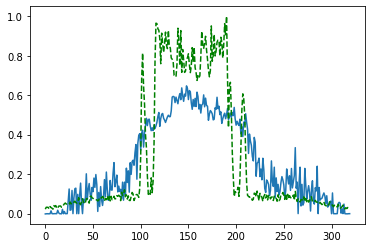

Time taken for epoch:  141.3137867450714
Epoch = [ 45/3000]  Iter = [   0/39480]  Loss = 0.221 Avg Loss = 0.221  Time = 0.1280s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 45/3000]  Iter = [ 100/39480]  Loss = 0.1988 Avg Loss = 0.2151  Time = 0.0033s
Epoch = [ 45/3000]  Iter = [ 200/39480]  Loss = 0.247 Avg Loss = 0.2149  Time = 0.0033s
Epoch = [ 45/3000]  Iter = [ 300/39480]  Loss = 0.1621 Avg Loss = 0.215  Time = 0.0032s
Epoch = [ 45/3000]  Iter = [ 400/39480]  Loss = 0.2109 Avg Loss = 0.2158  Time = 0.0031s
Epoch = [ 45/3000]  Iter = [ 500/39480]  Loss = 0.2573 Avg Loss = 0.2212  Time = 0.0036s
Epoch = [ 45/3000]  Iter = [ 600/39480]  Loss = 0.2339 Avg Loss = 0.2164  Time = 0.0029s
Epoch = [ 45/3000]  Iter = [ 700/39480]  Loss = 0.2356 Avg Loss = 0.2218  Time = 0.0031s
Epoch = [ 45/3000]  Iter = [ 800/39480]  Loss = 0.2276 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 45/3000]  Iter = [ 900/39480]  Loss = 0.2047 Avg Loss = 0.2154  Time = 0.0031s
Epoch = [ 45/3000]  Iter = [1000/39480]  Loss = 0.2054 Avg Loss = 0.2164  Time = 0.0031s
Epoch = [ 45/3000]  Iter = [1100/39480]  Loss = 0.1981 Avg Loss = 0.2179  Time = 0.0027s
Epoch = [ 45/3000]  Ite

Epoch = [ 45/3000]  Iter = [9400/39480]  Loss = 0.2279 Avg Loss = 0.218  Time = 0.0034s
Epoch = [ 45/3000]  Iter = [9500/39480]  Loss = 0.2095 Avg Loss = 0.2155  Time = 0.0032s
Epoch = [ 45/3000]  Iter = [9600/39480]  Loss = 0.2151 Avg Loss = 0.2155  Time = 0.0028s
Epoch = [ 45/3000]  Iter = [9700/39480]  Loss = 0.2279 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 45/3000]  Iter = [9800/39480]  Loss = 0.2197 Avg Loss = 0.2203  Time = 0.0030s
Epoch = [ 45/3000]  Iter = [9900/39480]  Loss = 0.2298 Avg Loss = 0.2207  Time = 0.0033s
Epoch = [ 45/3000]  Iter = [10000/39480]  Loss = 0.2254 Avg Loss = 0.2175  Time = 0.0030s
Epoch = [ 45/3000]  Iter = [10100/39480]  Loss = 0.1923 Avg Loss = 0.2185  Time = 0.0028s
Epoch = [ 45/3000]  Iter = [10200/39480]  Loss = 0.2061 Avg Loss = 0.2157  Time = 0.0033s
Epoch = [ 45/3000]  Iter = [10300/39480]  Loss = 0.2257 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 45/3000]  Iter = [10400/39480]  Loss = 0.219 Avg Loss = 0.2168  Time = 0.0032s
Epoch = [ 45/3000]

Epoch = [ 45/3000]  Iter = [18600/39480]  Loss = 0.2183 Avg Loss = 0.2223  Time = 0.0027s
Epoch = [ 45/3000]  Iter = [18700/39480]  Loss = 0.2015 Avg Loss = 0.2138  Time = 0.0031s
Epoch = [ 45/3000]  Iter = [18800/39480]  Loss = 0.2018 Avg Loss = 0.219  Time = 0.0028s
Epoch = [ 45/3000]  Iter = [18900/39480]  Loss = 0.2148 Avg Loss = 0.2213  Time = 0.0033s
Epoch = [ 45/3000]  Iter = [19000/39480]  Loss = 0.2076 Avg Loss = 0.2197  Time = 0.0033s
Epoch = [ 45/3000]  Iter = [19100/39480]  Loss = 0.1851 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 45/3000]  Iter = [19200/39480]  Loss = 0.2336 Avg Loss = 0.2155  Time = 0.0031s
Epoch = [ 45/3000]  Iter = [19300/39480]  Loss = 0.1971 Avg Loss = 0.2141  Time = 0.0023s
Epoch = [ 45/3000]  Iter = [19400/39480]  Loss = 0.1853 Avg Loss = 0.2183  Time = 0.0030s
Epoch = [ 45/3000]  Iter = [19500/39480]  Loss = 0.2337 Avg Loss = 0.2201  Time = 0.0030s
Epoch = [ 45/3000]  Iter = [19600/39480]  Loss = 0.2426 Avg Loss = 0.2205  Time = 0.0030s
Epoch = [ 4

Epoch = [ 45/3000]  Iter = [27800/39480]  Loss = 0.2292 Avg Loss = 0.2171  Time = 0.0036s
Epoch = [ 45/3000]  Iter = [27900/39480]  Loss = 0.1903 Avg Loss = 0.2191  Time = 0.0033s
Epoch = [ 45/3000]  Iter = [28000/39480]  Loss = 0.1935 Avg Loss = 0.2169  Time = 0.0039s
Epoch = [ 45/3000]  Iter = [28100/39480]  Loss = 0.2017 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 45/3000]  Iter = [28200/39480]  Loss = 0.2182 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 45/3000]  Iter = [28300/39480]  Loss = 0.1968 Avg Loss = 0.22  Time = 0.0028s
Epoch = [ 45/3000]  Iter = [28400/39480]  Loss = 0.1825 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 45/3000]  Iter = [28500/39480]  Loss = 0.1974 Avg Loss = 0.2202  Time = 0.0031s
Epoch = [ 45/3000]  Iter = [28600/39480]  Loss = 0.2059 Avg Loss = 0.2153  Time = 0.0029s
Epoch = [ 45/3000]  Iter = [28700/39480]  Loss = 0.213 Avg Loss = 0.2152  Time = 0.0027s
Epoch = [ 45/3000]  Iter = [28800/39480]  Loss = 0.2139 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 45/

Epoch = [ 45/3000]  Iter = [37000/39480]  Loss = 0.2079 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 45/3000]  Iter = [37100/39480]  Loss = 0.2376 Avg Loss = 0.2183  Time = 0.0030s
Epoch = [ 45/3000]  Iter = [37200/39480]  Loss = 0.2226 Avg Loss = 0.2205  Time = 0.0043s
Epoch = [ 45/3000]  Iter = [37300/39480]  Loss = 0.1999 Avg Loss = 0.2134  Time = 0.0028s
Epoch = [ 45/3000]  Iter = [37400/39480]  Loss = 0.2099 Avg Loss = 0.2206  Time = 0.0030s
Epoch = [ 45/3000]  Iter = [37500/39480]  Loss = 0.2263 Avg Loss = 0.215  Time = 0.0045s
Epoch = [ 45/3000]  Iter = [37600/39480]  Loss = 0.2214 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [ 45/3000]  Iter = [37700/39480]  Loss = 0.2105 Avg Loss = 0.2167  Time = 0.0023s
Epoch = [ 45/3000]  Iter = [37800/39480]  Loss = 0.21 Avg Loss = 0.2187  Time = 0.0034s
Epoch = [ 45/3000]  Iter = [37900/39480]  Loss = 0.2438 Avg Loss = 0.22  Time = 0.0031s
Epoch = [ 45/3000]  Iter = [38000/39480]  Loss = 0.2056 Avg Loss = 0.2206  Time = 0.0036s
Epoch = [ 45/300

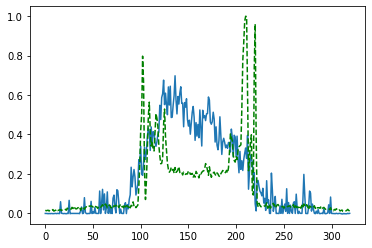

Time taken for epoch:  145.41542530059814
Epoch = [ 46/3000]  Iter = [   0/39480]  Loss = 0.2264 Avg Loss = 0.2264  Time = 0.0917s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 46/3000]  Iter = [ 100/39480]  Loss = 0.2067 Avg Loss = 0.2204  Time = 0.0030s
Epoch = [ 46/3000]  Iter = [ 200/39480]  Loss = 0.1964 Avg Loss = 0.2169  Time = 0.0038s
Epoch = [ 46/3000]  Iter = [ 300/39480]  Loss = 0.209 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 46/3000]  Iter = [ 400/39480]  Loss = 0.2153 Avg Loss = 0.2166  Time = 0.0032s
Epoch = [ 46/3000]  Iter = [ 500/39480]  Loss = 0.1977 Avg Loss = 0.2168  Time = 0.0030s
Epoch = [ 46/3000]  Iter = [ 600/39480]  Loss = 0.2038 Avg Loss = 0.2176  Time = 0.0021s
Epoch = [ 46/3000]  Iter = [ 700/39480]  Loss = 0.2007 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [ 46/3000]  Iter = [ 800/39480]  Loss = 0.1944 Avg Loss = 0.2152  Time = 0.0047s
Epoch = [ 46/3000]  Iter = [ 900/39480]  Loss = 0.2413 Avg Loss = 0.2159  Time = 0.0030s
Epoch = [ 46/3000]  Iter = [1000/39480]  Loss = 0.2346 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 46/3000]  Iter = [1100/39480]  Loss = 0.1801 Avg Loss = 0.2155  Time = 0.0036s
Epoch = [ 46/3000]  It

Epoch = [ 46/3000]  Iter = [9400/39480]  Loss = 0.2151 Avg Loss = 0.2252  Time = 0.0041s
Epoch = [ 46/3000]  Iter = [9500/39480]  Loss = 0.2145 Avg Loss = 0.2183  Time = 0.0037s
Epoch = [ 46/3000]  Iter = [9600/39480]  Loss = 0.2186 Avg Loss = 0.2197  Time = 0.0081s
Epoch = [ 46/3000]  Iter = [9700/39480]  Loss = 0.1873 Avg Loss = 0.2169  Time = 0.0032s
Epoch = [ 46/3000]  Iter = [9800/39480]  Loss = 0.1931 Avg Loss = 0.2168  Time = 0.0032s
Epoch = [ 46/3000]  Iter = [9900/39480]  Loss = 0.2225 Avg Loss = 0.2168  Time = 0.0018s
Epoch = [ 46/3000]  Iter = [10000/39480]  Loss = 0.2598 Avg Loss = 0.2203  Time = 0.0018s
Epoch = [ 46/3000]  Iter = [10100/39480]  Loss = 0.2215 Avg Loss = 0.2177  Time = 0.0034s
Epoch = [ 46/3000]  Iter = [10200/39480]  Loss = 0.255 Avg Loss = 0.2164  Time = 0.0023s
Epoch = [ 46/3000]  Iter = [10300/39480]  Loss = 0.1983 Avg Loss = 0.2164  Time = 0.0024s
Epoch = [ 46/3000]  Iter = [10400/39480]  Loss = 0.1997 Avg Loss = 0.2153  Time = 0.0021s
Epoch = [ 46/3000

Epoch = [ 46/3000]  Iter = [18700/39480]  Loss = 0.3393 Avg Loss = 0.2152  Time = 0.0019s
Epoch = [ 46/3000]  Iter = [18800/39480]  Loss = 0.2004 Avg Loss = 0.2177  Time = 0.0017s
Epoch = [ 46/3000]  Iter = [18900/39480]  Loss = 0.2338 Avg Loss = 0.2178  Time = 0.0018s
Epoch = [ 46/3000]  Iter = [19000/39480]  Loss = 0.2535 Avg Loss = 0.2169  Time = 0.0019s
Epoch = [ 46/3000]  Iter = [19100/39480]  Loss = 0.2656 Avg Loss = 0.2166  Time = 0.0023s
Epoch = [ 46/3000]  Iter = [19200/39480]  Loss = 0.2211 Avg Loss = 0.2182  Time = 0.0023s
Epoch = [ 46/3000]  Iter = [19300/39480]  Loss = 0.2381 Avg Loss = 0.2177  Time = 0.0025s
Epoch = [ 46/3000]  Iter = [19400/39480]  Loss = 0.2096 Avg Loss = 0.2166  Time = 0.0025s
Epoch = [ 46/3000]  Iter = [19500/39480]  Loss = 0.1916 Avg Loss = 0.2157  Time = 0.0019s
Epoch = [ 46/3000]  Iter = [19600/39480]  Loss = 0.2328 Avg Loss = 0.2146  Time = 0.0056s
Epoch = [ 46/3000]  Iter = [19700/39480]  Loss = 0.1871 Avg Loss = 0.2155  Time = 0.0018s
Epoch = [ 

Epoch = [ 46/3000]  Iter = [27900/39480]  Loss = 0.2179 Avg Loss = 0.2155  Time = 0.0022s
Epoch = [ 46/3000]  Iter = [28000/39480]  Loss = 0.2159 Avg Loss = 0.2201  Time = 0.0022s
Epoch = [ 46/3000]  Iter = [28100/39480]  Loss = 0.231 Avg Loss = 0.2199  Time = 0.0028s
Epoch = [ 46/3000]  Iter = [28200/39480]  Loss = 0.1952 Avg Loss = 0.219  Time = 0.0021s
Epoch = [ 46/3000]  Iter = [28300/39480]  Loss = 0.23 Avg Loss = 0.2241  Time = 0.0021s
Epoch = [ 46/3000]  Iter = [28400/39480]  Loss = 0.2088 Avg Loss = 0.2192  Time = 0.0022s
Epoch = [ 46/3000]  Iter = [28500/39480]  Loss = 0.1853 Avg Loss = 0.2169  Time = 0.0021s
Epoch = [ 46/3000]  Iter = [28600/39480]  Loss = 0.1913 Avg Loss = 0.2182  Time = 0.0049s
Epoch = [ 46/3000]  Iter = [28700/39480]  Loss = 0.2697 Avg Loss = 0.215  Time = 0.0111s
Epoch = [ 46/3000]  Iter = [28800/39480]  Loss = 0.2367 Avg Loss = 0.2173  Time = 0.0028s
Epoch = [ 46/3000]  Iter = [28900/39480]  Loss = 0.2115 Avg Loss = 0.2177  Time = 0.0022s
Epoch = [ 46/30

Epoch = [ 46/3000]  Iter = [37200/39480]  Loss = 0.1986 Avg Loss = 0.2193  Time = 0.0019s
Epoch = [ 46/3000]  Iter = [37300/39480]  Loss = 0.1948 Avg Loss = 0.2179  Time = 0.0017s
Epoch = [ 46/3000]  Iter = [37400/39480]  Loss = 0.226 Avg Loss = 0.2244  Time = 0.0019s
Epoch = [ 46/3000]  Iter = [37500/39480]  Loss = 0.1968 Avg Loss = 0.2185  Time = 0.0017s
Epoch = [ 46/3000]  Iter = [37600/39480]  Loss = 0.2113 Avg Loss = 0.2182  Time = 0.0018s
Epoch = [ 46/3000]  Iter = [37700/39480]  Loss = 0.2276 Avg Loss = 0.2209  Time = 0.0017s
Epoch = [ 46/3000]  Iter = [37800/39480]  Loss = 0.2224 Avg Loss = 0.2169  Time = 0.0023s
Epoch = [ 46/3000]  Iter = [37900/39480]  Loss = 0.2228 Avg Loss = 0.2152  Time = 0.0022s
Epoch = [ 46/3000]  Iter = [38000/39480]  Loss = 0.2305 Avg Loss = 0.2171  Time = 0.0019s
Epoch = [ 46/3000]  Iter = [38100/39480]  Loss = 0.2135 Avg Loss = 0.2145  Time = 0.0019s
Epoch = [ 46/3000]  Iter = [38200/39480]  Loss = 0.2122 Avg Loss = 0.2186  Time = 0.0018s
Epoch = [ 4

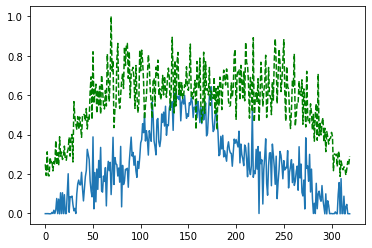

Time taken for epoch:  117.64118313789368
Epoch = [ 47/3000]  Iter = [   0/39480]  Loss = 0.2066 Avg Loss = 0.2066  Time = 0.0815s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 47/3000]  Iter = [ 100/39480]  Loss = 0.2316 Avg Loss = 0.2143  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [ 200/39480]  Loss = 0.2299 Avg Loss = 0.2163  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [ 300/39480]  Loss = 0.2173 Avg Loss = 0.2164  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [ 400/39480]  Loss = 0.2011 Avg Loss = 0.2236  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [ 500/39480]  Loss = 0.2756 Avg Loss = 0.2245  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [ 600/39480]  Loss = 0.2267 Avg Loss = 0.2168  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [ 700/39480]  Loss = 0.2397 Avg Loss = 0.2188  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [ 800/39480]  Loss = 0.2157 Avg Loss = 0.2213  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [ 900/39480]  Loss = 0.2202 Avg Loss = 0.2199  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [1000/39480]  Loss = 0.221 Avg Loss = 0.219  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [1100/39480]  Loss = 0.2686 Avg Loss = 0.217  Time = 0.0019s
Epoch = [ 47/3000]  Iter

Epoch = [ 47/3000]  Iter = [9400/39480]  Loss = 0.2214 Avg Loss = 0.2171  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [9500/39480]  Loss = 0.1981 Avg Loss = 0.2181  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [9600/39480]  Loss = 0.2581 Avg Loss = 0.2192  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [9700/39480]  Loss = 0.2487 Avg Loss = 0.2171  Time = 0.0021s
Epoch = [ 47/3000]  Iter = [9800/39480]  Loss = 0.1864 Avg Loss = 0.218  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [9900/39480]  Loss = 0.196 Avg Loss = 0.2187  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [10000/39480]  Loss = 0.2169 Avg Loss = 0.2162  Time = 0.0022s
Epoch = [ 47/3000]  Iter = [10100/39480]  Loss = 0.221 Avg Loss = 0.2175  Time = 0.0022s
Epoch = [ 47/3000]  Iter = [10200/39480]  Loss = 0.226 Avg Loss = 0.2206  Time = 0.0026s
Epoch = [ 47/3000]  Iter = [10300/39480]  Loss = 0.2403 Avg Loss = 0.22  Time = 0.0021s
Epoch = [ 47/3000]  Iter = [10400/39480]  Loss = 0.2033 Avg Loss = 0.2175  Time = 0.0022s
Epoch = [ 47/3000]  It

Epoch = [ 47/3000]  Iter = [18700/39480]  Loss = 0.2202 Avg Loss = 0.2177  Time = 0.0017s
Epoch = [ 47/3000]  Iter = [18800/39480]  Loss = 0.254 Avg Loss = 0.2206  Time = 0.0017s
Epoch = [ 47/3000]  Iter = [18900/39480]  Loss = 0.2138 Avg Loss = 0.2193  Time = 0.0017s
Epoch = [ 47/3000]  Iter = [19000/39480]  Loss = 0.2381 Avg Loss = 0.2169  Time = 0.0017s
Epoch = [ 47/3000]  Iter = [19100/39480]  Loss = 0.2364 Avg Loss = 0.2189  Time = 0.0042s
Epoch = [ 47/3000]  Iter = [19200/39480]  Loss = 0.2226 Avg Loss = 0.2182  Time = 0.0017s
Epoch = [ 47/3000]  Iter = [19300/39480]  Loss = 0.1718 Avg Loss = 0.2159  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [19400/39480]  Loss = 0.1848 Avg Loss = 0.2186  Time = 0.0017s
Epoch = [ 47/3000]  Iter = [19500/39480]  Loss = 0.1962 Avg Loss = 0.217  Time = 0.0017s
Epoch = [ 47/3000]  Iter = [19600/39480]  Loss = 0.199 Avg Loss = 0.2168  Time = 0.0017s
Epoch = [ 47/3000]  Iter = [19700/39480]  Loss = 0.2299 Avg Loss = 0.2161  Time = 0.0017s
Epoch = [ 47/

Epoch = [ 47/3000]  Iter = [27900/39480]  Loss = 0.2374 Avg Loss = 0.2165  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [28000/39480]  Loss = 0.2257 Avg Loss = 0.2191  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [28100/39480]  Loss = 0.2332 Avg Loss = 0.2168  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [28200/39480]  Loss = 0.2611 Avg Loss = 0.2212  Time = 0.0023s
Epoch = [ 47/3000]  Iter = [28300/39480]  Loss = 0.2398 Avg Loss = 0.2185  Time = 0.0025s
Epoch = [ 47/3000]  Iter = [28400/39480]  Loss = 0.2141 Avg Loss = 0.2175  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [28500/39480]  Loss = 0.2627 Avg Loss = 0.2183  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [28600/39480]  Loss = 0.2458 Avg Loss = 0.2189  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [28700/39480]  Loss = 0.2064 Avg Loss = 0.2171  Time = 0.0017s
Epoch = [ 47/3000]  Iter = [28800/39480]  Loss = 0.2342 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [28900/39480]  Loss = 0.2033 Avg Loss = 0.2206  Time = 0.0018s
Epoch = [ 4

Epoch = [ 47/3000]  Iter = [37100/39480]  Loss = 0.1864 Avg Loss = 0.217  Time = 0.0020s
Epoch = [ 47/3000]  Iter = [37200/39480]  Loss = 0.2051 Avg Loss = 0.2182  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [37300/39480]  Loss = 0.2376 Avg Loss = 0.2181  Time = 0.0019s
Epoch = [ 47/3000]  Iter = [37400/39480]  Loss = 0.1971 Avg Loss = 0.218  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [37500/39480]  Loss = 0.2093 Avg Loss = 0.2139  Time = 0.0080s
Epoch = [ 47/3000]  Iter = [37600/39480]  Loss = 0.2081 Avg Loss = 0.215  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [37700/39480]  Loss = 0.2455 Avg Loss = 0.2204  Time = 0.0038s
Epoch = [ 47/3000]  Iter = [37800/39480]  Loss = 0.2529 Avg Loss = 0.2238  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [37900/39480]  Loss = 0.2143 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 47/3000]  Iter = [38000/39480]  Loss = 0.2119 Avg Loss = 0.2174  Time = 0.0023s
Epoch = [ 47/3000]  Iter = [38100/39480]  Loss = 0.2128 Avg Loss = 0.214  Time = 0.0018s
Epoch = [ 47/30

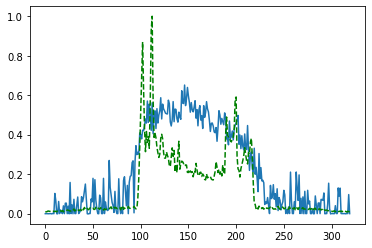

Time taken for epoch:  103.79450464248657
Epoch = [ 48/3000]  Iter = [   0/39480]  Loss = 0.1999 Avg Loss = 0.1999  Time = 0.0984s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 48/3000]  Iter = [ 100/39480]  Loss = 0.247 Avg Loss = 0.2122  Time = 0.0041s
Epoch = [ 48/3000]  Iter = [ 200/39480]  Loss = 0.2592 Avg Loss = 0.2145  Time = 0.0019s
Epoch = [ 48/3000]  Iter = [ 300/39480]  Loss = 0.213 Avg Loss = 0.2171  Time = 0.0019s
Epoch = [ 48/3000]  Iter = [ 400/39480]  Loss = 0.228 Avg Loss = 0.2205  Time = 0.0019s
Epoch = [ 48/3000]  Iter = [ 500/39480]  Loss = 0.2305 Avg Loss = 0.2177  Time = 0.0019s
Epoch = [ 48/3000]  Iter = [ 600/39480]  Loss = 0.2851 Avg Loss = 0.2258  Time = 0.0019s
Epoch = [ 48/3000]  Iter = [ 700/39480]  Loss = 0.2588 Avg Loss = 0.2208  Time = 0.0019s
Epoch = [ 48/3000]  Iter = [ 800/39480]  Loss = 0.2189 Avg Loss = 0.2192  Time = 0.0019s
Epoch = [ 48/3000]  Iter = [ 900/39480]  Loss = 0.193 Avg Loss = 0.2171  Time = 0.0019s
Epoch = [ 48/3000]  Iter = [1000/39480]  Loss = 0.2162 Avg Loss = 0.2183  Time = 0.0019s
Epoch = [ 48/3000]  Iter = [1100/39480]  Loss = 0.2058 Avg Loss = 0.2158  Time = 0.0019s
Epoch = [ 48/3000]  Iter 

Epoch = [ 48/3000]  Iter = [9500/39480]  Loss = 0.2272 Avg Loss = 0.217  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [9600/39480]  Loss = 0.2342 Avg Loss = 0.2173  Time = 0.0019s
Epoch = [ 48/3000]  Iter = [9700/39480]  Loss = 0.1898 Avg Loss = 0.2147  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [9800/39480]  Loss = 0.1973 Avg Loss = 0.2129  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [9900/39480]  Loss = 0.1924 Avg Loss = 0.2164  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [10000/39480]  Loss = 0.2022 Avg Loss = 0.2169  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [10100/39480]  Loss = 0.2225 Avg Loss = 0.2162  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [10200/39480]  Loss = 0.1717 Avg Loss = 0.2127  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [10300/39480]  Loss = 0.2126 Avg Loss = 0.2179  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [10400/39480]  Loss = 0.174 Avg Loss = 0.2151  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [10500/39480]  Loss = 0.2081 Avg Loss = 0.2185  Time = 0.0019s
Epoch = [ 48/3000

Epoch = [ 48/3000]  Iter = [18800/39480]  Loss = 0.2137 Avg Loss = 0.2178  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [18900/39480]  Loss = 0.1921 Avg Loss = 0.2196  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [19000/39480]  Loss = 0.2208 Avg Loss = 0.2197  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [19100/39480]  Loss = 0.218 Avg Loss = 0.2198  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [19200/39480]  Loss = 0.2093 Avg Loss = 0.2177  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [19300/39480]  Loss = 0.209 Avg Loss = 0.219  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [19400/39480]  Loss = 0.2204 Avg Loss = 0.2196  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [19500/39480]  Loss = 0.2181 Avg Loss = 0.2186  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [19600/39480]  Loss = 0.2145 Avg Loss = 0.2169  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [19700/39480]  Loss = 0.2155 Avg Loss = 0.2201  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [19800/39480]  Loss = 0.1998 Avg Loss = 0.2194  Time = 0.0018s
Epoch = [ 48/

Epoch = [ 48/3000]  Iter = [28000/39480]  Loss = 0.2137 Avg Loss = 0.2199  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [28100/39480]  Loss = 0.1943 Avg Loss = 0.2192  Time = 0.0021s
Epoch = [ 48/3000]  Iter = [28200/39480]  Loss = 0.1804 Avg Loss = 0.2183  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [28300/39480]  Loss = 0.161 Avg Loss = 0.2153  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [28400/39480]  Loss = 0.2168 Avg Loss = 0.2184  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [28500/39480]  Loss = 0.2604 Avg Loss = 0.2178  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [28600/39480]  Loss = 0.224 Avg Loss = 0.2191  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [28700/39480]  Loss = 0.2351 Avg Loss = 0.2155  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [28800/39480]  Loss = 0.1924 Avg Loss = 0.215  Time = 0.0017s
Epoch = [ 48/3000]  Iter = [28900/39480]  Loss = 0.2575 Avg Loss = 0.218  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [29000/39480]  Loss = 0.2328 Avg Loss = 0.2177  Time = 0.0017s
Epoch = [ 48/3

Epoch = [ 48/3000]  Iter = [37300/39480]  Loss = 0.242 Avg Loss = 0.2213  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [37400/39480]  Loss = 0.2365 Avg Loss = 0.2198  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [37500/39480]  Loss = 0.193 Avg Loss = 0.2185  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [37600/39480]  Loss = 0.2115 Avg Loss = 0.2214  Time = 0.0047s
Epoch = [ 48/3000]  Iter = [37700/39480]  Loss = 0.2411 Avg Loss = 0.2188  Time = 0.0020s
Epoch = [ 48/3000]  Iter = [37800/39480]  Loss = 0.182 Avg Loss = 0.2174  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [37900/39480]  Loss = 0.2153 Avg Loss = 0.217  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [38000/39480]  Loss = 0.2253 Avg Loss = 0.2173  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [38100/39480]  Loss = 0.1932 Avg Loss = 0.2176  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [38200/39480]  Loss = 0.2306 Avg Loss = 0.2211  Time = 0.0018s
Epoch = [ 48/3000]  Iter = [38300/39480]  Loss = 0.1986 Avg Loss = 0.2163  Time = 0.0018s
Epoch = [ 48/3

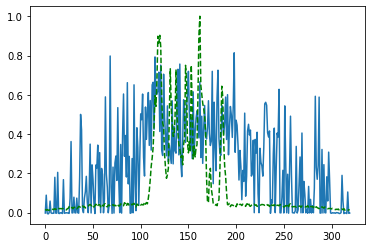

Time taken for epoch:  103.79977178573608
Epoch = [ 49/3000]  Iter = [   0/39480]  Loss = 0.2192 Avg Loss = 0.2192  Time = 0.0862s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 49/3000]  Iter = [ 100/39480]  Loss = 0.2194 Avg Loss = 0.2183  Time = 0.0080s
Epoch = [ 49/3000]  Iter = [ 200/39480]  Loss = 0.1934 Avg Loss = 0.2188  Time = 0.0038s
Epoch = [ 49/3000]  Iter = [ 300/39480]  Loss = 0.2417 Avg Loss = 0.2211  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [ 400/39480]  Loss = 0.1987 Avg Loss = 0.22  Time = 0.0019s
Epoch = [ 49/3000]  Iter = [ 500/39480]  Loss = 0.253 Avg Loss = 0.2158  Time = 0.0019s
Epoch = [ 49/3000]  Iter = [ 600/39480]  Loss = 0.1887 Avg Loss = 0.2147  Time = 0.0019s
Epoch = [ 49/3000]  Iter = [ 700/39480]  Loss = 0.1907 Avg Loss = 0.2171  Time = 0.0019s
Epoch = [ 49/3000]  Iter = [ 800/39480]  Loss = 0.2353 Avg Loss = 0.22  Time = 0.0019s
Epoch = [ 49/3000]  Iter = [ 900/39480]  Loss = 0.2192 Avg Loss = 0.2182  Time = 0.0019s
Epoch = [ 49/3000]  Iter = [1000/39480]  Loss = 0.1768 Avg Loss = 0.2161  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [1100/39480]  Loss = 0.2083 Avg Loss = 0.2168  Time = 0.0059s
Epoch = [ 49/3000]  Iter =

Epoch = [ 49/3000]  Iter = [9500/39480]  Loss = 0.1991 Avg Loss = 0.2192  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [9600/39480]  Loss = 0.2146 Avg Loss = 0.2177  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [9700/39480]  Loss = 0.216 Avg Loss = 0.2164  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [9800/39480]  Loss = 0.2253 Avg Loss = 0.2187  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [9900/39480]  Loss = 0.201 Avg Loss = 0.2195  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [10000/39480]  Loss = 0.205 Avg Loss = 0.2211  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [10100/39480]  Loss = 0.2698 Avg Loss = 0.2194  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [10200/39480]  Loss = 0.2167 Avg Loss = 0.2226  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [10300/39480]  Loss = 0.227 Avg Loss = 0.218  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [10400/39480]  Loss = 0.2179 Avg Loss = 0.2182  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [10500/39480]  Loss = 0.2012 Avg Loss = 0.2187  Time = 0.0018s
Epoch = [ 49/3000]  

Epoch = [ 49/3000]  Iter = [18800/39480]  Loss = 0.2558 Avg Loss = 0.2221  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [18900/39480]  Loss = 0.2357 Avg Loss = 0.2181  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [19000/39480]  Loss = 0.2222 Avg Loss = 0.2138  Time = 0.0022s
Epoch = [ 49/3000]  Iter = [19100/39480]  Loss = 0.235 Avg Loss = 0.217  Time = 0.0024s
Epoch = [ 49/3000]  Iter = [19200/39480]  Loss = 0.2063 Avg Loss = 0.2159  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [19300/39480]  Loss = 0.2285 Avg Loss = 0.2207  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [19400/39480]  Loss = 0.205 Avg Loss = 0.2139  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [19500/39480]  Loss = 0.2305 Avg Loss = 0.2206  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [19600/39480]  Loss = 0.2065 Avg Loss = 0.2185  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [19700/39480]  Loss = 0.2069 Avg Loss = 0.2162  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [19800/39480]  Loss = 0.1933 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 49/

Epoch = [ 49/3000]  Iter = [28000/39480]  Loss = 0.1951 Avg Loss = 0.219  Time = 0.0017s
Epoch = [ 49/3000]  Iter = [28100/39480]  Loss = 0.2306 Avg Loss = 0.2186  Time = 0.0017s
Epoch = [ 49/3000]  Iter = [28200/39480]  Loss = 0.2039 Avg Loss = 0.2219  Time = 0.0017s
Epoch = [ 49/3000]  Iter = [28300/39480]  Loss = 0.2788 Avg Loss = 0.2248  Time = 0.0017s
Epoch = [ 49/3000]  Iter = [28400/39480]  Loss = 0.2455 Avg Loss = 0.2188  Time = 0.0017s
Epoch = [ 49/3000]  Iter = [28500/39480]  Loss = 0.2108 Avg Loss = 0.2123  Time = 0.0017s
Epoch = [ 49/3000]  Iter = [28600/39480]  Loss = 0.2112 Avg Loss = 0.2193  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [28700/39480]  Loss = 0.2213 Avg Loss = 0.2205  Time = 0.0017s
Epoch = [ 49/3000]  Iter = [28800/39480]  Loss = 0.2022 Avg Loss = 0.2155  Time = 0.0017s
Epoch = [ 49/3000]  Iter = [28900/39480]  Loss = 0.2027 Avg Loss = 0.2181  Time = 0.0017s
Epoch = [ 49/3000]  Iter = [29000/39480]  Loss = 0.2005 Avg Loss = 0.2173  Time = 0.0017s
Epoch = [ 4

Epoch = [ 49/3000]  Iter = [37200/39480]  Loss = 0.1833 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [37300/39480]  Loss = 0.1933 Avg Loss = 0.2186  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [37400/39480]  Loss = 0.1902 Avg Loss = 0.2183  Time = 0.0024s
Epoch = [ 49/3000]  Iter = [37500/39480]  Loss = 0.2455 Avg Loss = 0.2168  Time = 0.0017s
Epoch = [ 49/3000]  Iter = [37600/39480]  Loss = 0.2231 Avg Loss = 0.2169  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [37700/39480]  Loss = 0.222 Avg Loss = 0.2155  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [37800/39480]  Loss = 0.2144 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [37900/39480]  Loss = 0.1952 Avg Loss = 0.2202  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [38000/39480]  Loss = 0.2185 Avg Loss = 0.2196  Time = 0.0018s
Epoch = [ 49/3000]  Iter = [38100/39480]  Loss = 0.2156 Avg Loss = 0.2202  Time = 0.0017s
Epoch = [ 49/3000]  Iter = [38200/39480]  Loss = 0.2193 Avg Loss = 0.2241  Time = 0.0017s
Epoch = [ 4

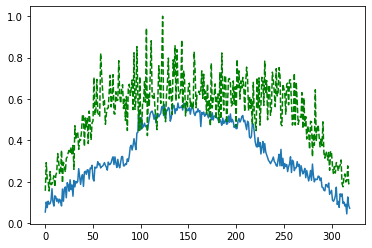

Time taken for epoch:  106.21326398849487
Epoch = [ 50/3000]  Iter = [   0/39480]  Loss = 0.182 Avg Loss = 0.182  Time = 0.0926s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 50/3000]  Iter = [ 100/39480]  Loss = 0.2102 Avg Loss = 0.2022  Time = 0.0080s
Epoch = [ 50/3000]  Iter = [ 200/39480]  Loss = 0.181 Avg Loss = 0.2124  Time = 0.0017s
Epoch = [ 50/3000]  Iter = [ 300/39480]  Loss = 0.2302 Avg Loss = 0.2165  Time = 0.0017s
Epoch = [ 50/3000]  Iter = [ 400/39480]  Loss = 0.2126 Avg Loss = 0.2196  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [ 500/39480]  Loss = 0.2262 Avg Loss = 0.2192  Time = 0.0017s
Epoch = [ 50/3000]  Iter = [ 600/39480]  Loss = 0.2018 Avg Loss = 0.2258  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [ 700/39480]  Loss = 0.2179 Avg Loss = 0.2215  Time = 0.0017s
Epoch = [ 50/3000]  Iter = [ 800/39480]  Loss = 0.2123 Avg Loss = 0.2165  Time = 0.0017s
Epoch = [ 50/3000]  Iter = [ 900/39480]  Loss = 0.2057 Avg Loss = 0.2171  Time = 0.0017s
Epoch = [ 50/3000]  Iter = [1000/39480]  Loss = 0.1909 Avg Loss = 0.2152  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [1100/39480]  Loss = 0.2507 Avg Loss = 0.2207  Time = 0.0017s
Epoch = [ 50/3000]  It

Epoch = [ 50/3000]  Iter = [9400/39480]  Loss = 0.227 Avg Loss = 0.2154  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [9500/39480]  Loss = 0.2177 Avg Loss = 0.2188  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [9600/39480]  Loss = 0.2155 Avg Loss = 0.2187  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [9700/39480]  Loss = 0.1945 Avg Loss = 0.2171  Time = 0.0021s
Epoch = [ 50/3000]  Iter = [9800/39480]  Loss = 0.2037 Avg Loss = 0.2151  Time = 0.0021s
Epoch = [ 50/3000]  Iter = [9900/39480]  Loss = 0.2154 Avg Loss = 0.2185  Time = 0.0021s
Epoch = [ 50/3000]  Iter = [10000/39480]  Loss = 0.2286 Avg Loss = 0.2157  Time = 0.0037s
Epoch = [ 50/3000]  Iter = [10100/39480]  Loss = 0.2004 Avg Loss = 0.2177  Time = 0.0021s
Epoch = [ 50/3000]  Iter = [10200/39480]  Loss = 0.2169 Avg Loss = 0.2226  Time = 0.0029s
Epoch = [ 50/3000]  Iter = [10300/39480]  Loss = 0.2104 Avg Loss = 0.2207  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [10400/39480]  Loss = 0.2132 Avg Loss = 0.2215  Time = 0.0018s
Epoch = [ 50/3000

Epoch = [ 50/3000]  Iter = [18700/39480]  Loss = 0.2159 Avg Loss = 0.2182  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [18800/39480]  Loss = 0.1917 Avg Loss = 0.2156  Time = 0.0028s
Epoch = [ 50/3000]  Iter = [18900/39480]  Loss = 0.2524 Avg Loss = 0.2224  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [19000/39480]  Loss = 0.2519 Avg Loss = 0.2156  Time = 0.0020s
Epoch = [ 50/3000]  Iter = [19100/39480]  Loss = 0.2555 Avg Loss = 0.2183  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [19200/39480]  Loss = 0.2322 Avg Loss = 0.216  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [19300/39480]  Loss = 0.2064 Avg Loss = 0.2182  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [19400/39480]  Loss = 0.2052 Avg Loss = 0.2164  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [19500/39480]  Loss = 0.2146 Avg Loss = 0.2193  Time = 0.0019s
Epoch = [ 50/3000]  Iter = [19600/39480]  Loss = 0.2512 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [19700/39480]  Loss = 0.2038 Avg Loss = 0.2153  Time = 0.0018s
Epoch = [ 5

Epoch = [ 50/3000]  Iter = [27900/39480]  Loss = 0.2286 Avg Loss = 0.2193  Time = 0.0040s
Epoch = [ 50/3000]  Iter = [28000/39480]  Loss = 0.1909 Avg Loss = 0.2193  Time = 0.0133s
Epoch = [ 50/3000]  Iter = [28100/39480]  Loss = 0.1978 Avg Loss = 0.2167  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [28200/39480]  Loss = 0.2487 Avg Loss = 0.2206  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [28300/39480]  Loss = 0.1987 Avg Loss = 0.2179  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [28400/39480]  Loss = 0.1745 Avg Loss = 0.2187  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [28500/39480]  Loss = 0.2311 Avg Loss = 0.2225  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [28600/39480]  Loss = 0.2439 Avg Loss = 0.2189  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [28700/39480]  Loss = 0.2042 Avg Loss = 0.217  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [28800/39480]  Loss = 0.2016 Avg Loss = 0.2157  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [28900/39480]  Loss = 0.233 Avg Loss = 0.2202  Time = 0.0019s
Epoch = [ 50

Epoch = [ 50/3000]  Iter = [37100/39480]  Loss = 0.2461 Avg Loss = 0.2175  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [37200/39480]  Loss = 0.1904 Avg Loss = 0.2184  Time = 0.0019s
Epoch = [ 50/3000]  Iter = [37300/39480]  Loss = 0.2283 Avg Loss = 0.217  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [37400/39480]  Loss = 0.2178 Avg Loss = 0.2175  Time = 0.0059s
Epoch = [ 50/3000]  Iter = [37500/39480]  Loss = 0.2013 Avg Loss = 0.2192  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [37600/39480]  Loss = 0.1802 Avg Loss = 0.2192  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [37700/39480]  Loss = 0.2384 Avg Loss = 0.2196  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [37800/39480]  Loss = 0.199 Avg Loss = 0.2213  Time = 0.0023s
Epoch = [ 50/3000]  Iter = [37900/39480]  Loss = 0.2225 Avg Loss = 0.218  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [38000/39480]  Loss = 0.2142 Avg Loss = 0.2151  Time = 0.0018s
Epoch = [ 50/3000]  Iter = [38100/39480]  Loss = 0.2057 Avg Loss = 0.2154  Time = 0.0018s
Epoch = [ 50/

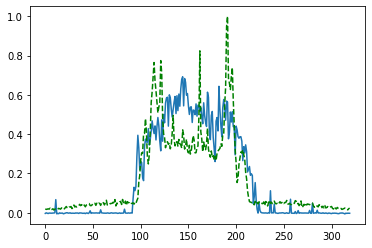

Time taken for epoch:  108.22979950904846
Epoch = [ 51/3000]  Iter = [   0/39480]  Loss = 0.2459 Avg Loss = 0.2459  Time = 0.1148s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 51/3000]  Iter = [ 100/39480]  Loss = 0.2416 Avg Loss = 0.2311  Time = 0.0081s
Epoch = [ 51/3000]  Iter = [ 200/39480]  Loss = 0.2013 Avg Loss = 0.223  Time = 0.0020s
Epoch = [ 51/3000]  Iter = [ 300/39480]  Loss = 0.2171 Avg Loss = 0.2159  Time = 0.0019s
Epoch = [ 51/3000]  Iter = [ 400/39480]  Loss = 0.22 Avg Loss = 0.2147  Time = 0.0019s
Epoch = [ 51/3000]  Iter = [ 500/39480]  Loss = 0.2125 Avg Loss = 0.2163  Time = 0.0019s
Epoch = [ 51/3000]  Iter = [ 600/39480]  Loss = 0.2381 Avg Loss = 0.219  Time = 0.0019s
Epoch = [ 51/3000]  Iter = [ 700/39480]  Loss = 0.2276 Avg Loss = 0.2128  Time = 0.0019s
Epoch = [ 51/3000]  Iter = [ 800/39480]  Loss = 0.1972 Avg Loss = 0.2157  Time = 0.0019s
Epoch = [ 51/3000]  Iter = [ 900/39480]  Loss = 0.2221 Avg Loss = 0.2158  Time = 0.0019s
Epoch = [ 51/3000]  Iter = [1000/39480]  Loss = 0.2847 Avg Loss = 0.2204  Time = 0.0019s
Epoch = [ 51/3000]  Iter = [1100/39480]  Loss = 0.2192 Avg Loss = 0.2166  Time = 0.0025s
Epoch = [ 51/3000]  Iter 

Epoch = [ 51/3000]  Iter = [9400/39480]  Loss = 0.2508 Avg Loss = 0.2188  Time = 0.0017s
Epoch = [ 51/3000]  Iter = [9500/39480]  Loss = 0.2234 Avg Loss = 0.2141  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [9600/39480]  Loss = 0.2396 Avg Loss = 0.2183  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [9700/39480]  Loss = 0.2623 Avg Loss = 0.2213  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [9800/39480]  Loss = 0.3126 Avg Loss = 0.2214  Time = 0.0058s
Epoch = [ 51/3000]  Iter = [9900/39480]  Loss = 0.2203 Avg Loss = 0.2207  Time = 0.0022s
Epoch = [ 51/3000]  Iter = [10000/39480]  Loss = 0.2044 Avg Loss = 0.2135  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [10100/39480]  Loss = 0.1869 Avg Loss = 0.22  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [10200/39480]  Loss = 0.1824 Avg Loss = 0.2152  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [10300/39480]  Loss = 0.1993 Avg Loss = 0.214  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [10400/39480]  Loss = 0.191 Avg Loss = 0.2173  Time = 0.0018s
Epoch = [ 51/3000]  

Epoch = [ 51/3000]  Iter = [18700/39480]  Loss = 0.2854 Avg Loss = 0.2201  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [18800/39480]  Loss = 0.2088 Avg Loss = 0.2194  Time = 0.0026s
Epoch = [ 51/3000]  Iter = [18900/39480]  Loss = 0.2165 Avg Loss = 0.2204  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [19000/39480]  Loss = 0.2059 Avg Loss = 0.2209  Time = 0.0017s
Epoch = [ 51/3000]  Iter = [19100/39480]  Loss = 0.2386 Avg Loss = 0.2179  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [19200/39480]  Loss = 0.2216 Avg Loss = 0.2149  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [19300/39480]  Loss = 0.2526 Avg Loss = 0.2185  Time = 0.0017s
Epoch = [ 51/3000]  Iter = [19400/39480]  Loss = 0.2418 Avg Loss = 0.2184  Time = 0.0024s
Epoch = [ 51/3000]  Iter = [19500/39480]  Loss = 0.2453 Avg Loss = 0.2157  Time = 0.0017s
Epoch = [ 51/3000]  Iter = [19600/39480]  Loss = 0.2105 Avg Loss = 0.2195  Time = 0.0017s
Epoch = [ 51/3000]  Iter = [19700/39480]  Loss = 0.2172 Avg Loss = 0.2196  Time = 0.0017s
Epoch = [ 

Epoch = [ 51/3000]  Iter = [27900/39480]  Loss = 0.2537 Avg Loss = 0.2199  Time = 0.0017s
Epoch = [ 51/3000]  Iter = [28000/39480]  Loss = 0.2141 Avg Loss = 0.2205  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [28100/39480]  Loss = 0.2009 Avg Loss = 0.2172  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [28200/39480]  Loss = 0.1854 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [28300/39480]  Loss = 0.2083 Avg Loss = 0.2191  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [28400/39480]  Loss = 0.2051 Avg Loss = 0.2183  Time = 0.0022s
Epoch = [ 51/3000]  Iter = [28500/39480]  Loss = 0.2435 Avg Loss = 0.2199  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [28600/39480]  Loss = 0.2034 Avg Loss = 0.2222  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [28700/39480]  Loss = 0.2022 Avg Loss = 0.2154  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [28800/39480]  Loss = 0.199 Avg Loss = 0.2151  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [28900/39480]  Loss = 0.211 Avg Loss = 0.2181  Time = 0.0019s
Epoch = [ 51

Epoch = [ 51/3000]  Iter = [37100/39480]  Loss = 0.1704 Avg Loss = 0.2163  Time = 0.0017s
Epoch = [ 51/3000]  Iter = [37200/39480]  Loss = 0.218 Avg Loss = 0.2151  Time = 0.0026s
Epoch = [ 51/3000]  Iter = [37300/39480]  Loss = 0.2482 Avg Loss = 0.217  Time = 0.0026s
Epoch = [ 51/3000]  Iter = [37400/39480]  Loss = 0.1982 Avg Loss = 0.2174  Time = 0.0024s
Epoch = [ 51/3000]  Iter = [37500/39480]  Loss = 0.2078 Avg Loss = 0.219  Time = 0.0026s
Epoch = [ 51/3000]  Iter = [37600/39480]  Loss = 0.2288 Avg Loss = 0.2189  Time = 0.0026s
Epoch = [ 51/3000]  Iter = [37700/39480]  Loss = 0.2233 Avg Loss = 0.2201  Time = 0.0021s
Epoch = [ 51/3000]  Iter = [37800/39480]  Loss = 0.221 Avg Loss = 0.2215  Time = 0.0035s
Epoch = [ 51/3000]  Iter = [37900/39480]  Loss = 0.2264 Avg Loss = 0.2188  Time = 0.0023s
Epoch = [ 51/3000]  Iter = [38000/39480]  Loss = 0.2535 Avg Loss = 0.2191  Time = 0.0018s
Epoch = [ 51/3000]  Iter = [38100/39480]  Loss = 0.269 Avg Loss = 0.2167  Time = 0.0018s
Epoch = [ 51/30

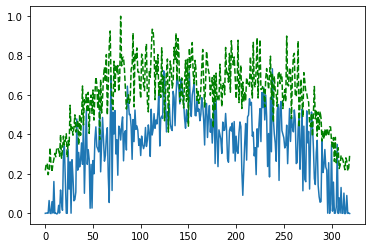

Time taken for epoch:  105.1623182296753
Epoch = [ 52/3000]  Iter = [   0/39480]  Loss = 0.2152 Avg Loss = 0.2152  Time = 0.0929s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 52/3000]  Iter = [ 100/39480]  Loss = 0.1985 Avg Loss = 0.2165  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [ 200/39480]  Loss = 0.2331 Avg Loss = 0.2153  Time = 0.0040s
Epoch = [ 52/3000]  Iter = [ 300/39480]  Loss = 0.2758 Avg Loss = 0.2188  Time = 0.0018s
Epoch = [ 52/3000]  Iter = [ 400/39480]  Loss = 0.2224 Avg Loss = 0.2123  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [ 500/39480]  Loss = 0.2268 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 52/3000]  Iter = [ 600/39480]  Loss = 0.2053 Avg Loss = 0.2186  Time = 0.0022s
Epoch = [ 52/3000]  Iter = [ 700/39480]  Loss = 0.2071 Avg Loss = 0.2195  Time = 0.0018s
Epoch = [ 52/3000]  Iter = [ 800/39480]  Loss = 0.2409 Avg Loss = 0.2194  Time = 0.0018s
Epoch = [ 52/3000]  Iter = [ 900/39480]  Loss = 0.2023 Avg Loss = 0.2161  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [1000/39480]  Loss = 0.2193 Avg Loss = 0.2211  Time = 0.0022s
Epoch = [ 52/3000]  Iter = [1100/39480]  Loss = 0.1967 Avg Loss = 0.2178  Time = 0.0018s
Epoch = [ 52/3000]  It

Epoch = [ 52/3000]  Iter = [9400/39480]  Loss = 0.1966 Avg Loss = 0.218  Time = 0.0019s
Epoch = [ 52/3000]  Iter = [9500/39480]  Loss = 0.1891 Avg Loss = 0.2166  Time = 0.0018s
Epoch = [ 52/3000]  Iter = [9600/39480]  Loss = 0.2116 Avg Loss = 0.2149  Time = 0.0022s
Epoch = [ 52/3000]  Iter = [9700/39480]  Loss = 0.1835 Avg Loss = 0.2148  Time = 0.0018s
Epoch = [ 52/3000]  Iter = [9800/39480]  Loss = 0.22 Avg Loss = 0.2153  Time = 0.0018s
Epoch = [ 52/3000]  Iter = [9900/39480]  Loss = 0.1895 Avg Loss = 0.2166  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [10000/39480]  Loss = 0.224 Avg Loss = 0.2164  Time = 0.0021s
Epoch = [ 52/3000]  Iter = [10100/39480]  Loss = 0.2432 Avg Loss = 0.218  Time = 0.0019s
Epoch = [ 52/3000]  Iter = [10200/39480]  Loss = 0.2673 Avg Loss = 0.2234  Time = 0.0018s
Epoch = [ 52/3000]  Iter = [10300/39480]  Loss = 0.2159 Avg Loss = 0.2188  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [10400/39480]  Loss = 0.2431 Avg Loss = 0.2137  Time = 0.0017s
Epoch = [ 52/3000]  I

Epoch = [ 52/3000]  Iter = [18600/39480]  Loss = 0.2436 Avg Loss = 0.2248  Time = 0.0019s
Epoch = [ 52/3000]  Iter = [18700/39480]  Loss = 0.2089 Avg Loss = 0.2188  Time = 0.0019s
Epoch = [ 52/3000]  Iter = [18800/39480]  Loss = 0.2048 Avg Loss = 0.2167  Time = 0.0019s
Epoch = [ 52/3000]  Iter = [18900/39480]  Loss = 0.2064 Avg Loss = 0.2156  Time = 0.0081s
Epoch = [ 52/3000]  Iter = [19000/39480]  Loss = 0.1959 Avg Loss = 0.2171  Time = 0.0018s
Epoch = [ 52/3000]  Iter = [19100/39480]  Loss = 0.2159 Avg Loss = 0.2191  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [19200/39480]  Loss = 0.2341 Avg Loss = 0.217  Time = 0.0018s
Epoch = [ 52/3000]  Iter = [19300/39480]  Loss = 0.1936 Avg Loss = 0.2154  Time = 0.0019s
Epoch = [ 52/3000]  Iter = [19400/39480]  Loss = 0.231 Avg Loss = 0.2196  Time = 0.0026s
Epoch = [ 52/3000]  Iter = [19500/39480]  Loss = 0.2164 Avg Loss = 0.2192  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [19600/39480]  Loss = 0.2259 Avg Loss = 0.2196  Time = 0.0018s
Epoch = [ 52

Epoch = [ 52/3000]  Iter = [27800/39480]  Loss = 0.2235 Avg Loss = 0.2151  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [27900/39480]  Loss = 0.2156 Avg Loss = 0.2178  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [28000/39480]  Loss = 0.2194 Avg Loss = 0.2198  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [28100/39480]  Loss = 0.2094 Avg Loss = 0.2188  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [28200/39480]  Loss = 0.2049 Avg Loss = 0.2215  Time = 0.0018s
Epoch = [ 52/3000]  Iter = [28300/39480]  Loss = 0.2319 Avg Loss = 0.2173  Time = 0.0018s
Epoch = [ 52/3000]  Iter = [28400/39480]  Loss = 0.2159 Avg Loss = 0.2221  Time = 0.0018s
Epoch = [ 52/3000]  Iter = [28500/39480]  Loss = 0.2296 Avg Loss = 0.2191  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [28600/39480]  Loss = 0.2206 Avg Loss = 0.2174  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [28700/39480]  Loss = 0.2497 Avg Loss = 0.2177  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [28800/39480]  Loss = 0.2244 Avg Loss = 0.2175  Time = 0.0018s
Epoch = [ 

Epoch = [ 52/3000]  Iter = [37000/39480]  Loss = 0.26 Avg Loss = 0.2132  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [37100/39480]  Loss = 0.2134 Avg Loss = 0.2153  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [37200/39480]  Loss = 0.2091 Avg Loss = 0.2175  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [37300/39480]  Loss = 0.208 Avg Loss = 0.2171  Time = 0.0017s
Epoch = [ 52/3000]  Iter = [37400/39480]  Loss = 0.1974 Avg Loss = 0.2154  Time = 0.0022s
Epoch = [ 52/3000]  Iter = [37500/39480]  Loss = 0.2089 Avg Loss = 0.219  Time = 0.0021s
Epoch = [ 52/3000]  Iter = [37600/39480]  Loss = 0.257 Avg Loss = 0.2181  Time = 0.0023s
Epoch = [ 52/3000]  Iter = [37700/39480]  Loss = 0.2383 Avg Loss = 0.217  Time = 0.0021s
Epoch = [ 52/3000]  Iter = [37800/39480]  Loss = 0.1797 Avg Loss = 0.2161  Time = 0.0021s
Epoch = [ 52/3000]  Iter = [37900/39480]  Loss = 0.2286 Avg Loss = 0.2193  Time = 0.0024s
Epoch = [ 52/3000]  Iter = [38000/39480]  Loss = 0.2556 Avg Loss = 0.2177  Time = 0.0018s
Epoch = [ 52/300

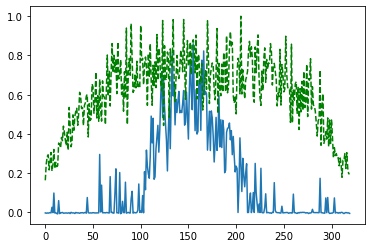

Time taken for epoch:  105.55102157592773
Epoch = [ 53/3000]  Iter = [   0/39480]  Loss = 0.2437 Avg Loss = 0.2437  Time = 0.0881s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 53/3000]  Iter = [ 100/39480]  Loss = 0.2287 Avg Loss = 0.2225  Time = 0.0043s
Epoch = [ 53/3000]  Iter = [ 200/39480]  Loss = 0.2697 Avg Loss = 0.2244  Time = 0.0017s
Epoch = [ 53/3000]  Iter = [ 300/39480]  Loss = 0.1983 Avg Loss = 0.2213  Time = 0.0030s
Epoch = [ 53/3000]  Iter = [ 400/39480]  Loss = 0.2139 Avg Loss = 0.2183  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [ 500/39480]  Loss = 0.2273 Avg Loss = 0.2178  Time = 0.0025s
Epoch = [ 53/3000]  Iter = [ 600/39480]  Loss = 0.1871 Avg Loss = 0.2149  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [ 700/39480]  Loss = 0.2123 Avg Loss = 0.2185  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [ 800/39480]  Loss = 0.239 Avg Loss = 0.2203  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [ 900/39480]  Loss = 0.1869 Avg Loss = 0.2191  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [1000/39480]  Loss = 0.1761 Avg Loss = 0.2204  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [1100/39480]  Loss = 0.2281 Avg Loss = 0.2204  Time = 0.0018s
Epoch = [ 53/3000]  It

Epoch = [ 53/3000]  Iter = [9400/39480]  Loss = 0.211 Avg Loss = 0.2179  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [9500/39480]  Loss = 0.2005 Avg Loss = 0.219  Time = 0.0019s
Epoch = [ 53/3000]  Iter = [9600/39480]  Loss = 0.2312 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [9700/39480]  Loss = 0.2489 Avg Loss = 0.218  Time = 0.0017s
Epoch = [ 53/3000]  Iter = [9800/39480]  Loss = 0.2402 Avg Loss = 0.2172  Time = 0.0019s
Epoch = [ 53/3000]  Iter = [9900/39480]  Loss = 0.248 Avg Loss = 0.2177  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [10000/39480]  Loss = 0.1659 Avg Loss = 0.2192  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [10100/39480]  Loss = 0.2167 Avg Loss = 0.2201  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [10200/39480]  Loss = 0.2032 Avg Loss = 0.2175  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [10300/39480]  Loss = 0.2139 Avg Loss = 0.2154  Time = 0.0024s
Epoch = [ 53/3000]  Iter = [10400/39480]  Loss = 0.2177 Avg Loss = 0.2144  Time = 0.0018s
Epoch = [ 53/3000]  

Epoch = [ 53/3000]  Iter = [18600/39480]  Loss = 0.2186 Avg Loss = 0.2221  Time = 0.0019s
Epoch = [ 53/3000]  Iter = [18700/39480]  Loss = 0.2052 Avg Loss = 0.2159  Time = 0.0019s
Epoch = [ 53/3000]  Iter = [18800/39480]  Loss = 0.1868 Avg Loss = 0.2158  Time = 0.0019s
Epoch = [ 53/3000]  Iter = [18900/39480]  Loss = 0.2107 Avg Loss = 0.2179  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [19000/39480]  Loss = 0.1926 Avg Loss = 0.2121  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [19100/39480]  Loss = 0.2113 Avg Loss = 0.2204  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [19200/39480]  Loss = 0.2119 Avg Loss = 0.2168  Time = 0.0017s
Epoch = [ 53/3000]  Iter = [19300/39480]  Loss = 0.2126 Avg Loss = 0.2182  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [19400/39480]  Loss = 0.2159 Avg Loss = 0.2212  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [19500/39480]  Loss = 0.2383 Avg Loss = 0.2208  Time = 0.0032s
Epoch = [ 53/3000]  Iter = [19600/39480]  Loss = 0.2292 Avg Loss = 0.2163  Time = 0.0028s
Epoch = [ 

Epoch = [ 53/3000]  Iter = [27900/39480]  Loss = 0.2071 Avg Loss = 0.2154  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [28000/39480]  Loss = 0.2385 Avg Loss = 0.2178  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [28100/39480]  Loss = 0.2495 Avg Loss = 0.2204  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [28200/39480]  Loss = 0.2243 Avg Loss = 0.221  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [28300/39480]  Loss = 0.2127 Avg Loss = 0.218  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [28400/39480]  Loss = 0.2141 Avg Loss = 0.2197  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [28500/39480]  Loss = 0.2296 Avg Loss = 0.2211  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [28600/39480]  Loss = 0.1899 Avg Loss = 0.2192  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [28700/39480]  Loss = 0.2775 Avg Loss = 0.224  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [28800/39480]  Loss = 0.1962 Avg Loss = 0.2187  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [28900/39480]  Loss = 0.2346 Avg Loss = 0.2165  Time = 0.0019s
Epoch = [ 53/

Epoch = [ 53/3000]  Iter = [37200/39480]  Loss = 0.2445 Avg Loss = 0.2154  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [37300/39480]  Loss = 0.2229 Avg Loss = 0.2152  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [37400/39480]  Loss = 0.2544 Avg Loss = 0.2166  Time = 0.0019s
Epoch = [ 53/3000]  Iter = [37500/39480]  Loss = 0.2203 Avg Loss = 0.2253  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [37600/39480]  Loss = 0.2111 Avg Loss = 0.2212  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [37700/39480]  Loss = 0.2684 Avg Loss = 0.2227  Time = 0.0017s
Epoch = [ 53/3000]  Iter = [37800/39480]  Loss = 0.2596 Avg Loss = 0.2198  Time = 0.0080s
Epoch = [ 53/3000]  Iter = [37900/39480]  Loss = 0.187 Avg Loss = 0.2139  Time = 0.0017s
Epoch = [ 53/3000]  Iter = [38000/39480]  Loss = 0.2427 Avg Loss = 0.2171  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [38100/39480]  Loss = 0.184 Avg Loss = 0.2176  Time = 0.0018s
Epoch = [ 53/3000]  Iter = [38200/39480]  Loss = 0.2156 Avg Loss = 0.2188  Time = 0.0018s
Epoch = [ 53

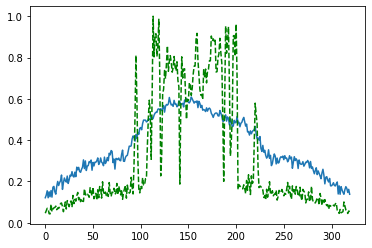

Time taken for epoch:  107.78079771995544
Epoch = [ 54/3000]  Iter = [   0/39480]  Loss = 0.2293 Avg Loss = 0.2293  Time = 0.1149s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 54/3000]  Iter = [ 100/39480]  Loss = 0.2143 Avg Loss = 0.2238  Time = 0.0019s
Epoch = [ 54/3000]  Iter = [ 200/39480]  Loss = 0.2146 Avg Loss = 0.2202  Time = 0.0019s
Epoch = [ 54/3000]  Iter = [ 300/39480]  Loss = 0.1939 Avg Loss = 0.2178  Time = 0.0019s
Epoch = [ 54/3000]  Iter = [ 400/39480]  Loss = 0.2222 Avg Loss = 0.2147  Time = 0.0019s
Epoch = [ 54/3000]  Iter = [ 500/39480]  Loss = 0.2157 Avg Loss = 0.2212  Time = 0.0019s
Epoch = [ 54/3000]  Iter = [ 600/39480]  Loss = 0.2104 Avg Loss = 0.2187  Time = 0.0017s
Epoch = [ 54/3000]  Iter = [ 700/39480]  Loss = 0.2058 Avg Loss = 0.2155  Time = 0.0025s
Epoch = [ 54/3000]  Iter = [ 800/39480]  Loss = 0.2083 Avg Loss = 0.2198  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [ 900/39480]  Loss = 0.2452 Avg Loss = 0.2246  Time = 0.0019s
Epoch = [ 54/3000]  Iter = [1000/39480]  Loss = 0.2221 Avg Loss = 0.2175  Time = 0.0019s
Epoch = [ 54/3000]  Iter = [1100/39480]  Loss = 0.2135 Avg Loss = 0.2218  Time = 0.0023s
Epoch = [ 54/3000]  I

Epoch = [ 54/3000]  Iter = [9400/39480]  Loss = 0.1839 Avg Loss = 0.2153  Time = 0.0057s
Epoch = [ 54/3000]  Iter = [9500/39480]  Loss = 0.208 Avg Loss = 0.2178  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [9600/39480]  Loss = 0.2132 Avg Loss = 0.2159  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [9700/39480]  Loss = 0.1935 Avg Loss = 0.2154  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [9800/39480]  Loss = 0.238 Avg Loss = 0.224  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [9900/39480]  Loss = 0.2498 Avg Loss = 0.222  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [10000/39480]  Loss = 0.1902 Avg Loss = 0.2163  Time = 0.0030s
Epoch = [ 54/3000]  Iter = [10100/39480]  Loss = 0.176 Avg Loss = 0.2159  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [10200/39480]  Loss = 0.1948 Avg Loss = 0.2178  Time = 0.0055s
Epoch = [ 54/3000]  Iter = [10300/39480]  Loss = 0.1965 Avg Loss = 0.2244  Time = 0.0052s
Epoch = [ 54/3000]  Iter = [10400/39480]  Loss = 0.2169 Avg Loss = 0.2179  Time = 0.0021s
Epoch = [ 54/3000]  I

Epoch = [ 54/3000]  Iter = [18600/39480]  Loss = 0.2452 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [18700/39480]  Loss = 0.2246 Avg Loss = 0.2227  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [18800/39480]  Loss = 0.1971 Avg Loss = 0.2191  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [18900/39480]  Loss = 0.2102 Avg Loss = 0.219  Time = 0.0019s
Epoch = [ 54/3000]  Iter = [19000/39480]  Loss = 0.2289 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [19100/39480]  Loss = 0.2656 Avg Loss = 0.221  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [19200/39480]  Loss = 0.2447 Avg Loss = 0.2236  Time = 0.0019s
Epoch = [ 54/3000]  Iter = [19300/39480]  Loss = 0.2423 Avg Loss = 0.2238  Time = 0.0019s
Epoch = [ 54/3000]  Iter = [19400/39480]  Loss = 0.2254 Avg Loss = 0.2179  Time = 0.0024s
Epoch = [ 54/3000]  Iter = [19500/39480]  Loss = 0.1786 Avg Loss = 0.2172  Time = 0.0019s
Epoch = [ 54/3000]  Iter = [19600/39480]  Loss = 0.2385 Avg Loss = 0.2175  Time = 0.0019s
Epoch = [ 54/

Epoch = [ 54/3000]  Iter = [27800/39480]  Loss = 0.2039 Avg Loss = 0.2152  Time = 0.0060s
Epoch = [ 54/3000]  Iter = [27900/39480]  Loss = 0.2129 Avg Loss = 0.2192  Time = 0.0032s
Epoch = [ 54/3000]  Iter = [28000/39480]  Loss = 0.2182 Avg Loss = 0.2195  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [28100/39480]  Loss = 0.1972 Avg Loss = 0.2172  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [28200/39480]  Loss = 0.1963 Avg Loss = 0.214  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [28300/39480]  Loss = 0.2097 Avg Loss = 0.2181  Time = 0.0017s
Epoch = [ 54/3000]  Iter = [28400/39480]  Loss = 0.205 Avg Loss = 0.2185  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [28500/39480]  Loss = 0.1941 Avg Loss = 0.2146  Time = 0.0017s
Epoch = [ 54/3000]  Iter = [28600/39480]  Loss = 0.2313 Avg Loss = 0.2142  Time = 0.0019s
Epoch = [ 54/3000]  Iter = [28700/39480]  Loss = 0.2431 Avg Loss = 0.2172  Time = 0.0019s
Epoch = [ 54/3000]  Iter = [28800/39480]  Loss = 0.2087 Avg Loss = 0.2208  Time = 0.0019s
Epoch = [ 54

Epoch = [ 54/3000]  Iter = [37000/39480]  Loss = 0.1984 Avg Loss = 0.2184  Time = 0.0017s
Epoch = [ 54/3000]  Iter = [37100/39480]  Loss = 0.2111 Avg Loss = 0.2197  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [37200/39480]  Loss = 0.2353 Avg Loss = 0.2161  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [37300/39480]  Loss = 0.2208 Avg Loss = 0.2176  Time = 0.0017s
Epoch = [ 54/3000]  Iter = [37400/39480]  Loss = 0.1909 Avg Loss = 0.2173  Time = 0.0017s
Epoch = [ 54/3000]  Iter = [37500/39480]  Loss = 0.1809 Avg Loss = 0.2178  Time = 0.0017s
Epoch = [ 54/3000]  Iter = [37600/39480]  Loss = 0.2322 Avg Loss = 0.2177  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [37700/39480]  Loss = 0.2426 Avg Loss = 0.2203  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [37800/39480]  Loss = 0.2028 Avg Loss = 0.2179  Time = 0.0018s
Epoch = [ 54/3000]  Iter = [37900/39480]  Loss = 0.2143 Avg Loss = 0.2212  Time = 0.0017s
Epoch = [ 54/3000]  Iter = [38000/39480]  Loss = 0.1983 Avg Loss = 0.2124  Time = 0.0017s
Epoch = [ 

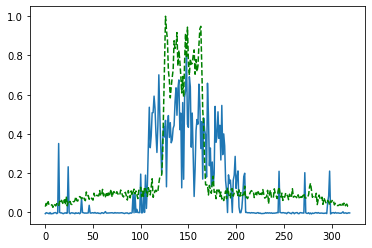

Time taken for epoch:  104.69116306304932
Epoch = [ 55/3000]  Iter = [   0/39480]  Loss = 0.2095 Avg Loss = 0.2095  Time = 0.1006s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 55/3000]  Iter = [ 100/39480]  Loss = 0.2238 Avg Loss = 0.2145  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [ 200/39480]  Loss = 0.1773 Avg Loss = 0.216  Time = 0.0019s
Epoch = [ 55/3000]  Iter = [ 300/39480]  Loss = 0.2107 Avg Loss = 0.2212  Time = 0.0022s
Epoch = [ 55/3000]  Iter = [ 400/39480]  Loss = 0.2004 Avg Loss = 0.2186  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [ 500/39480]  Loss = 0.1969 Avg Loss = 0.2146  Time = 0.0019s
Epoch = [ 55/3000]  Iter = [ 600/39480]  Loss = 0.2409 Avg Loss = 0.2184  Time = 0.0120s
Epoch = [ 55/3000]  Iter = [ 700/39480]  Loss = 0.2003 Avg Loss = 0.2218  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [ 800/39480]  Loss = 0.2431 Avg Loss = 0.22  Time = 0.0019s
Epoch = [ 55/3000]  Iter = [ 900/39480]  Loss = 0.2029 Avg Loss = 0.2206  Time = 0.0017s
Epoch = [ 55/3000]  Iter = [1000/39480]  Loss = 0.2276 Avg Loss = 0.2194  Time = 0.0017s
Epoch = [ 55/3000]  Iter = [1100/39480]  Loss = 0.2225 Avg Loss = 0.2178  Time = 0.0018s
Epoch = [ 55/3000]  Iter

Epoch = [ 55/3000]  Iter = [9400/39480]  Loss = 0.2688 Avg Loss = 0.2222  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [9500/39480]  Loss = 0.2574 Avg Loss = 0.2186  Time = 0.0022s
Epoch = [ 55/3000]  Iter = [9600/39480]  Loss = 0.2263 Avg Loss = 0.2159  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [9700/39480]  Loss = 0.2183 Avg Loss = 0.2248  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [9800/39480]  Loss = 0.233 Avg Loss = 0.2208  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [9900/39480]  Loss = 0.2605 Avg Loss = 0.2193  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [10000/39480]  Loss = 0.1921 Avg Loss = 0.2254  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [10100/39480]  Loss = 0.2214 Avg Loss = 0.217  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [10200/39480]  Loss = 0.214 Avg Loss = 0.2189  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [10300/39480]  Loss = 0.209 Avg Loss = 0.2193  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [10400/39480]  Loss = 0.236 Avg Loss = 0.2192  Time = 0.0017s
Epoch = [ 55/3000]  I

Epoch = [ 55/3000]  Iter = [18700/39480]  Loss = 0.1936 Avg Loss = 0.2156  Time = 0.0024s
Epoch = [ 55/3000]  Iter = [18800/39480]  Loss = 0.2188 Avg Loss = 0.2148  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [18900/39480]  Loss = 0.2002 Avg Loss = 0.2191  Time = 0.0019s
Epoch = [ 55/3000]  Iter = [19000/39480]  Loss = 0.2092 Avg Loss = 0.219  Time = 0.0017s
Epoch = [ 55/3000]  Iter = [19100/39480]  Loss = 0.2641 Avg Loss = 0.216  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [19200/39480]  Loss = 0.2274 Avg Loss = 0.2196  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [19300/39480]  Loss = 0.188 Avg Loss = 0.2175  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [19400/39480]  Loss = 0.2024 Avg Loss = 0.2199  Time = 0.0017s
Epoch = [ 55/3000]  Iter = [19500/39480]  Loss = 0.2233 Avg Loss = 0.2155  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [19600/39480]  Loss = 0.2066 Avg Loss = 0.2151  Time = 0.0078s
Epoch = [ 55/3000]  Iter = [19700/39480]  Loss = 0.2005 Avg Loss = 0.2182  Time = 0.0019s
Epoch = [ 55/

Epoch = [ 55/3000]  Iter = [28000/39480]  Loss = 0.2179 Avg Loss = 0.2171  Time = 0.0017s
Epoch = [ 55/3000]  Iter = [28100/39480]  Loss = 0.1851 Avg Loss = 0.2184  Time = 0.0022s
Epoch = [ 55/3000]  Iter = [28200/39480]  Loss = 0.1996 Avg Loss = 0.2213  Time = 0.0017s
Epoch = [ 55/3000]  Iter = [28300/39480]  Loss = 0.2325 Avg Loss = 0.2164  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [28400/39480]  Loss = 0.2061 Avg Loss = 0.2159  Time = 0.0017s
Epoch = [ 55/3000]  Iter = [28500/39480]  Loss = 0.2082 Avg Loss = 0.2195  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [28600/39480]  Loss = 0.1925 Avg Loss = 0.2176  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [28700/39480]  Loss = 0.1823 Avg Loss = 0.214  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [28800/39480]  Loss = 0.1897 Avg Loss = 0.217  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [28900/39480]  Loss = 0.2033 Avg Loss = 0.2152  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [29000/39480]  Loss = 0.2249 Avg Loss = 0.2205  Time = 0.0018s
Epoch = [ 55

Epoch = [ 55/3000]  Iter = [37200/39480]  Loss = 0.219 Avg Loss = 0.2225  Time = 0.0017s
Epoch = [ 55/3000]  Iter = [37300/39480]  Loss = 0.1963 Avg Loss = 0.2211  Time = 0.0019s
Epoch = [ 55/3000]  Iter = [37400/39480]  Loss = 0.2313 Avg Loss = 0.2183  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [37500/39480]  Loss = 0.1939 Avg Loss = 0.216  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [37600/39480]  Loss = 0.1931 Avg Loss = 0.2185  Time = 0.0040s
Epoch = [ 55/3000]  Iter = [37700/39480]  Loss = 0.2056 Avg Loss = 0.2173  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [37800/39480]  Loss = 0.2542 Avg Loss = 0.2169  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [37900/39480]  Loss = 0.2152 Avg Loss = 0.2209  Time = 0.0018s
Epoch = [ 55/3000]  Iter = [38000/39480]  Loss = 0.2198 Avg Loss = 0.2172  Time = 0.0017s
Epoch = [ 55/3000]  Iter = [38100/39480]  Loss = 0.186 Avg Loss = 0.2212  Time = 0.0017s
Epoch = [ 55/3000]  Iter = [38200/39480]  Loss = 0.2188 Avg Loss = 0.2165  Time = 0.0041s
Epoch = [ 55/

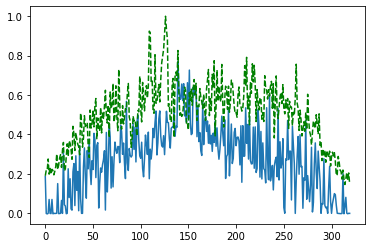

Time taken for epoch:  105.17093634605408
Epoch = [ 56/3000]  Iter = [   0/39480]  Loss = 0.2351 Avg Loss = 0.2351  Time = 0.1053s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 56/3000]  Iter = [ 100/39480]  Loss = 0.2159 Avg Loss = 0.226  Time = 0.0020s
Epoch = [ 56/3000]  Iter = [ 200/39480]  Loss = 0.2199 Avg Loss = 0.2167  Time = 0.0019s
Epoch = [ 56/3000]  Iter = [ 300/39480]  Loss = 0.2243 Avg Loss = 0.2188  Time = 0.0019s
Epoch = [ 56/3000]  Iter = [ 400/39480]  Loss = 0.2497 Avg Loss = 0.2178  Time = 0.0024s
Epoch = [ 56/3000]  Iter = [ 500/39480]  Loss = 0.1991 Avg Loss = 0.215  Time = 0.0020s
Epoch = [ 56/3000]  Iter = [ 600/39480]  Loss = 0.2087 Avg Loss = 0.2209  Time = 0.0019s
Epoch = [ 56/3000]  Iter = [ 700/39480]  Loss = 0.2409 Avg Loss = 0.2199  Time = 0.0019s
Epoch = [ 56/3000]  Iter = [ 800/39480]  Loss = 0.1889 Avg Loss = 0.2198  Time = 0.0019s
Epoch = [ 56/3000]  Iter = [ 900/39480]  Loss = 0.2122 Avg Loss = 0.2176  Time = 0.0019s
Epoch = [ 56/3000]  Iter = [1000/39480]  Loss = 0.1826 Avg Loss = 0.2157  Time = 0.0019s
Epoch = [ 56/3000]  Iter = [1100/39480]  Loss = 0.2281 Avg Loss = 0.2186  Time = 0.0019s
Epoch = [ 56/3000]  Ite

Epoch = [ 56/3000]  Iter = [9400/39480]  Loss = 0.2188 Avg Loss = 0.2226  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [9500/39480]  Loss = 0.2292 Avg Loss = 0.2203  Time = 0.0020s
Epoch = [ 56/3000]  Iter = [9600/39480]  Loss = 0.2357 Avg Loss = 0.2169  Time = 0.0023s
Epoch = [ 56/3000]  Iter = [9700/39480]  Loss = 0.2022 Avg Loss = 0.2178  Time = 0.0024s
Epoch = [ 56/3000]  Iter = [9800/39480]  Loss = 0.245 Avg Loss = 0.2223  Time = 0.0021s
Epoch = [ 56/3000]  Iter = [9900/39480]  Loss = 0.2056 Avg Loss = 0.2175  Time = 0.0021s
Epoch = [ 56/3000]  Iter = [10000/39480]  Loss = 0.2411 Avg Loss = 0.2198  Time = 0.0029s
Epoch = [ 56/3000]  Iter = [10100/39480]  Loss = 0.1775 Avg Loss = 0.2182  Time = 0.0019s
Epoch = [ 56/3000]  Iter = [10200/39480]  Loss = 0.25 Avg Loss = 0.2179  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [10300/39480]  Loss = 0.2406 Avg Loss = 0.2164  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [10400/39480]  Loss = 0.2489 Avg Loss = 0.2159  Time = 0.0041s
Epoch = [ 56/3000] 

Epoch = [ 56/3000]  Iter = [18700/39480]  Loss = 0.2512 Avg Loss = 0.2162  Time = 0.0017s
Epoch = [ 56/3000]  Iter = [18800/39480]  Loss = 0.2507 Avg Loss = 0.2174  Time = 0.0017s
Epoch = [ 56/3000]  Iter = [18900/39480]  Loss = 0.2187 Avg Loss = 0.2201  Time = 0.0017s
Epoch = [ 56/3000]  Iter = [19000/39480]  Loss = 0.1743 Avg Loss = 0.2186  Time = 0.0022s
Epoch = [ 56/3000]  Iter = [19100/39480]  Loss = 0.2488 Avg Loss = 0.2203  Time = 0.0017s
Epoch = [ 56/3000]  Iter = [19200/39480]  Loss = 0.2049 Avg Loss = 0.2179  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [19300/39480]  Loss = 0.2131 Avg Loss = 0.2189  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [19400/39480]  Loss = 0.2186 Avg Loss = 0.2163  Time = 0.0017s
Epoch = [ 56/3000]  Iter = [19500/39480]  Loss = 0.2289 Avg Loss = 0.2185  Time = 0.0017s
Epoch = [ 56/3000]  Iter = [19600/39480]  Loss = 0.2225 Avg Loss = 0.2159  Time = 0.0017s
Epoch = [ 56/3000]  Iter = [19700/39480]  Loss = 0.2027 Avg Loss = 0.2145  Time = 0.0017s
Epoch = [ 

Epoch = [ 56/3000]  Iter = [28000/39480]  Loss = 0.2131 Avg Loss = 0.2163  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [28100/39480]  Loss = 0.2365 Avg Loss = 0.2182  Time = 0.0017s
Epoch = [ 56/3000]  Iter = [28200/39480]  Loss = 0.2244 Avg Loss = 0.2236  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [28300/39480]  Loss = 0.208 Avg Loss = 0.2202  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [28400/39480]  Loss = 0.2381 Avg Loss = 0.2151  Time = 0.0017s
Epoch = [ 56/3000]  Iter = [28500/39480]  Loss = 0.2127 Avg Loss = 0.2187  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [28600/39480]  Loss = 0.2213 Avg Loss = 0.2175  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [28700/39480]  Loss = 0.1978 Avg Loss = 0.2153  Time = 0.0017s
Epoch = [ 56/3000]  Iter = [28800/39480]  Loss = 0.2433 Avg Loss = 0.2177  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [28900/39480]  Loss = 0.2192 Avg Loss = 0.2251  Time = 0.0017s
Epoch = [ 56/3000]  Iter = [29000/39480]  Loss = 0.2122 Avg Loss = 0.2164  Time = 0.0017s
Epoch = [ 5

Epoch = [ 56/3000]  Iter = [37200/39480]  Loss = 0.1902 Avg Loss = 0.2224  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [37300/39480]  Loss = 0.2222 Avg Loss = 0.2181  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [37400/39480]  Loss = 0.2193 Avg Loss = 0.22  Time = 0.0059s
Epoch = [ 56/3000]  Iter = [37500/39480]  Loss = 0.2048 Avg Loss = 0.2161  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [37600/39480]  Loss = 0.2048 Avg Loss = 0.2146  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [37700/39480]  Loss = 0.2091 Avg Loss = 0.2187  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [37800/39480]  Loss = 0.2062 Avg Loss = 0.2182  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [37900/39480]  Loss = 0.2341 Avg Loss = 0.2164  Time = 0.0017s
Epoch = [ 56/3000]  Iter = [38000/39480]  Loss = 0.2252 Avg Loss = 0.2168  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [38100/39480]  Loss = 0.2432 Avg Loss = 0.2156  Time = 0.0018s
Epoch = [ 56/3000]  Iter = [38200/39480]  Loss = 0.2147 Avg Loss = 0.2161  Time = 0.0018s
Epoch = [ 56

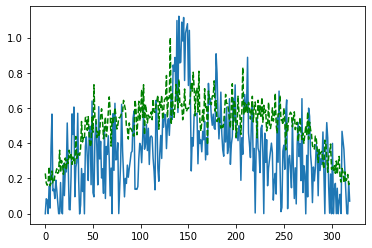

Time taken for epoch:  106.99695777893066
Epoch = [ 57/3000]  Iter = [   0/39480]  Loss = 0.2825 Avg Loss = 0.2825  Time = 0.1004s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 57/3000]  Iter = [ 100/39480]  Loss = 0.2289 Avg Loss = 0.2406  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [ 200/39480]  Loss = 0.2397 Avg Loss = 0.2269  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [ 300/39480]  Loss = 0.2244 Avg Loss = 0.2209  Time = 0.0019s
Epoch = [ 57/3000]  Iter = [ 400/39480]  Loss = 0.1841 Avg Loss = 0.2165  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [ 500/39480]  Loss = 0.2088 Avg Loss = 0.2175  Time = 0.0052s
Epoch = [ 57/3000]  Iter = [ 600/39480]  Loss = 0.2051 Avg Loss = 0.2173  Time = 0.0025s
Epoch = [ 57/3000]  Iter = [ 700/39480]  Loss = 0.2253 Avg Loss = 0.2187  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [ 800/39480]  Loss = 0.2421 Avg Loss = 0.2189  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [ 900/39480]  Loss = 0.2026 Avg Loss = 0.2186  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [1000/39480]  Loss = 0.25 Avg Loss = 0.2187  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [1100/39480]  Loss = 0.2413 Avg Loss = 0.2181  Time = 0.0017s
Epoch = [ 57/3000]  Ite

Epoch = [ 57/3000]  Iter = [9400/39480]  Loss = 0.2537 Avg Loss = 0.2191  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [9500/39480]  Loss = 0.2432 Avg Loss = 0.2226  Time = 0.0024s
Epoch = [ 57/3000]  Iter = [9600/39480]  Loss = 0.2071 Avg Loss = 0.2201  Time = 0.0043s
Epoch = [ 57/3000]  Iter = [9700/39480]  Loss = 0.2094 Avg Loss = 0.2181  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [9800/39480]  Loss = 0.1993 Avg Loss = 0.222  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [9900/39480]  Loss = 0.2153 Avg Loss = 0.2272  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [10000/39480]  Loss = 0.2088 Avg Loss = 0.2167  Time = 0.0019s
Epoch = [ 57/3000]  Iter = [10100/39480]  Loss = 0.2237 Avg Loss = 0.2181  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [10200/39480]  Loss = 0.2412 Avg Loss = 0.2158  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [10300/39480]  Loss = 0.2359 Avg Loss = 0.2195  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [10400/39480]  Loss = 0.1919 Avg Loss = 0.2189  Time = 0.0017s
Epoch = [ 57/3000

Epoch = [ 57/3000]  Iter = [18600/39480]  Loss = 0.2299 Avg Loss = 0.22  Time = 0.0021s
Epoch = [ 57/3000]  Iter = [18700/39480]  Loss = 0.2359 Avg Loss = 0.2213  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [18800/39480]  Loss = 0.2449 Avg Loss = 0.2189  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [18900/39480]  Loss = 0.2278 Avg Loss = 0.2215  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [19000/39480]  Loss = 0.2179 Avg Loss = 0.2212  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [19100/39480]  Loss = 0.2631 Avg Loss = 0.224  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [19200/39480]  Loss = 0.1966 Avg Loss = 0.2182  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [19300/39480]  Loss = 0.2033 Avg Loss = 0.2147  Time = 0.0016s
Epoch = [ 57/3000]  Iter = [19400/39480]  Loss = 0.2388 Avg Loss = 0.2165  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [19500/39480]  Loss = 0.1853 Avg Loss = 0.2195  Time = 0.0054s
Epoch = [ 57/3000]  Iter = [19600/39480]  Loss = 0.2512 Avg Loss = 0.2151  Time = 0.0018s
Epoch = [ 57/

Epoch = [ 57/3000]  Iter = [27800/39480]  Loss = 0.1899 Avg Loss = 0.2172  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [27900/39480]  Loss = 0.1813 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [28000/39480]  Loss = 0.2087 Avg Loss = 0.2144  Time = 0.0022s
Epoch = [ 57/3000]  Iter = [28100/39480]  Loss = 0.2414 Avg Loss = 0.2146  Time = 0.0022s
Epoch = [ 57/3000]  Iter = [28200/39480]  Loss = 0.2112 Avg Loss = 0.2172  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [28300/39480]  Loss = 0.2198 Avg Loss = 0.2216  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [28400/39480]  Loss = 0.1907 Avg Loss = 0.2162  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [28500/39480]  Loss = 0.2144 Avg Loss = 0.2188  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [28600/39480]  Loss = 0.2079 Avg Loss = 0.2196  Time = 0.0017s
Epoch = [ 57/3000]  Iter = [28700/39480]  Loss = 0.2351 Avg Loss = 0.2185  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [28800/39480]  Loss = 0.2187 Avg Loss = 0.2197  Time = 0.0017s
Epoch = [ 

Epoch = [ 57/3000]  Iter = [37000/39480]  Loss = 0.2154 Avg Loss = 0.2195  Time = 0.0063s
Epoch = [ 57/3000]  Iter = [37100/39480]  Loss = 0.2187 Avg Loss = 0.2166  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [37200/39480]  Loss = 0.2103 Avg Loss = 0.2203  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [37300/39480]  Loss = 0.2285 Avg Loss = 0.2166  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [37400/39480]  Loss = 0.2237 Avg Loss = 0.2178  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [37500/39480]  Loss = 0.2184 Avg Loss = 0.2145  Time = 0.0023s
Epoch = [ 57/3000]  Iter = [37600/39480]  Loss = 0.2394 Avg Loss = 0.2187  Time = 0.0019s
Epoch = [ 57/3000]  Iter = [37700/39480]  Loss = 0.2312 Avg Loss = 0.2172  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [37800/39480]  Loss = 0.2282 Avg Loss = 0.2183  Time = 0.0018s
Epoch = [ 57/3000]  Iter = [37900/39480]  Loss = 0.2065 Avg Loss = 0.2186  Time = 0.0020s
Epoch = [ 57/3000]  Iter = [38000/39480]  Loss = 0.2236 Avg Loss = 0.2166  Time = 0.0017s
Epoch = [ 

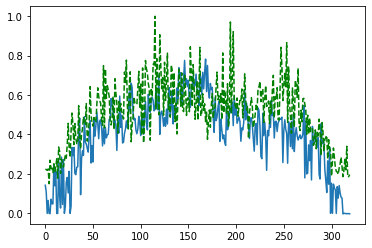

Time taken for epoch:  104.47996878623962
Epoch = [ 58/3000]  Iter = [   0/39480]  Loss = 0.2158 Avg Loss = 0.2158  Time = 0.0846s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 58/3000]  Iter = [ 100/39480]  Loss = 0.218 Avg Loss = 0.2161  Time = 0.0040s
Epoch = [ 58/3000]  Iter = [ 200/39480]  Loss = 0.2061 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [ 300/39480]  Loss = 0.2324 Avg Loss = 0.2181  Time = 0.0023s
Epoch = [ 58/3000]  Iter = [ 400/39480]  Loss = 0.23 Avg Loss = 0.2209  Time = 0.0020s
Epoch = [ 58/3000]  Iter = [ 500/39480]  Loss = 0.1915 Avg Loss = 0.2186  Time = 0.0034s
Epoch = [ 58/3000]  Iter = [ 600/39480]  Loss = 0.2101 Avg Loss = 0.2167  Time = 0.0019s
Epoch = [ 58/3000]  Iter = [ 700/39480]  Loss = 0.2126 Avg Loss = 0.2129  Time = 0.0019s
Epoch = [ 58/3000]  Iter = [ 800/39480]  Loss = 0.2265 Avg Loss = 0.2153  Time = 0.0019s
Epoch = [ 58/3000]  Iter = [ 900/39480]  Loss = 0.1948 Avg Loss = 0.2183  Time = 0.0019s
Epoch = [ 58/3000]  Iter = [1000/39480]  Loss = 0.1848 Avg Loss = 0.2225  Time = 0.0040s
Epoch = [ 58/3000]  Iter = [1100/39480]  Loss = 0.1781 Avg Loss = 0.2163  Time = 0.0020s
Epoch = [ 58/3000]  Iter

Epoch = [ 58/3000]  Iter = [9400/39480]  Loss = 0.2138 Avg Loss = 0.2231  Time = 0.0019s
Epoch = [ 58/3000]  Iter = [9500/39480]  Loss = 0.2192 Avg Loss = 0.2183  Time = 0.0019s
Epoch = [ 58/3000]  Iter = [9600/39480]  Loss = 0.1855 Avg Loss = 0.2143  Time = 0.0019s
Epoch = [ 58/3000]  Iter = [9700/39480]  Loss = 0.2098 Avg Loss = 0.2145  Time = 0.0019s
Epoch = [ 58/3000]  Iter = [9800/39480]  Loss = 0.1826 Avg Loss = 0.2168  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [9900/39480]  Loss = 0.202 Avg Loss = 0.2179  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [10000/39480]  Loss = 0.2215 Avg Loss = 0.2171  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [10100/39480]  Loss = 0.1668 Avg Loss = 0.2195  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [10200/39480]  Loss = 0.2155 Avg Loss = 0.2234  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [10300/39480]  Loss = 0.2318 Avg Loss = 0.2178  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [10400/39480]  Loss = 0.1841 Avg Loss = 0.2176  Time = 0.0018s
Epoch = [ 58/3000

Epoch = [ 58/3000]  Iter = [18700/39480]  Loss = 0.224 Avg Loss = 0.2147  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [18800/39480]  Loss = 0.2063 Avg Loss = 0.2168  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [18900/39480]  Loss = 0.2112 Avg Loss = 0.2179  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [19000/39480]  Loss = 0.286 Avg Loss = 0.2218  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [19100/39480]  Loss = 0.2471 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [19200/39480]  Loss = 0.2104 Avg Loss = 0.2148  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [19300/39480]  Loss = 0.2109 Avg Loss = 0.223  Time = 0.0041s
Epoch = [ 58/3000]  Iter = [19400/39480]  Loss = 0.2096 Avg Loss = 0.2211  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [19500/39480]  Loss = 0.2364 Avg Loss = 0.2203  Time = 0.0024s
Epoch = [ 58/3000]  Iter = [19600/39480]  Loss = 0.2127 Avg Loss = 0.2189  Time = 0.0020s
Epoch = [ 58/3000]  Iter = [19700/39480]  Loss = 0.2055 Avg Loss = 0.2161  Time = 0.0020s
Epoch = [ 58/3

Epoch = [ 58/3000]  Iter = [27900/39480]  Loss = 0.2032 Avg Loss = 0.2137  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [28000/39480]  Loss = 0.1983 Avg Loss = 0.2159  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [28100/39480]  Loss = 0.2276 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [28200/39480]  Loss = 0.2186 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [28300/39480]  Loss = 0.1977 Avg Loss = 0.2205  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [28400/39480]  Loss = 0.1878 Avg Loss = 0.2183  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [28500/39480]  Loss = 0.2166 Avg Loss = 0.2153  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [28600/39480]  Loss = 0.2252 Avg Loss = 0.2165  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [28700/39480]  Loss = 0.1902 Avg Loss = 0.2165  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [28800/39480]  Loss = 0.2455 Avg Loss = 0.2225  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [28900/39480]  Loss = 0.2001 Avg Loss = 0.2195  Time = 0.0018s
Epoch = [ 

Epoch = [ 58/3000]  Iter = [37200/39480]  Loss = 0.2016 Avg Loss = 0.2183  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [37300/39480]  Loss = 0.1944 Avg Loss = 0.2197  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [37400/39480]  Loss = 0.2289 Avg Loss = 0.2177  Time = 0.0024s
Epoch = [ 58/3000]  Iter = [37500/39480]  Loss = 0.1917 Avg Loss = 0.2145  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [37600/39480]  Loss = 0.2294 Avg Loss = 0.2217  Time = 0.0019s
Epoch = [ 58/3000]  Iter = [37700/39480]  Loss = 0.186 Avg Loss = 0.2196  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [37800/39480]  Loss = 0.2295 Avg Loss = 0.2181  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [37900/39480]  Loss = 0.226 Avg Loss = 0.2201  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [38000/39480]  Loss = 0.2076 Avg Loss = 0.2167  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [38100/39480]  Loss = 0.2135 Avg Loss = 0.2196  Time = 0.0018s
Epoch = [ 58/3000]  Iter = [38200/39480]  Loss = 0.2149 Avg Loss = 0.2185  Time = 0.0018s
Epoch = [ 58

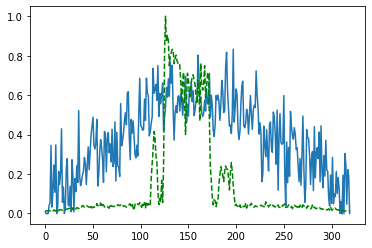

Time taken for epoch:  109.91250252723694
Epoch = [ 59/3000]  Iter = [   0/39480]  Loss = 0.2081 Avg Loss = 0.2081  Time = 0.1272s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 59/3000]  Iter = [ 100/39480]  Loss = 0.2363 Avg Loss = 0.2123  Time = 0.0075s
Epoch = [ 59/3000]  Iter = [ 200/39480]  Loss = 0.2336 Avg Loss = 0.2125  Time = 0.0021s
Epoch = [ 59/3000]  Iter = [ 300/39480]  Loss = 0.2254 Avg Loss = 0.2165  Time = 0.0019s
Epoch = [ 59/3000]  Iter = [ 400/39480]  Loss = 0.2198 Avg Loss = 0.2199  Time = 0.0026s
Epoch = [ 59/3000]  Iter = [ 500/39480]  Loss = 0.2401 Avg Loss = 0.2169  Time = 0.0021s
Epoch = [ 59/3000]  Iter = [ 600/39480]  Loss = 0.2762 Avg Loss = 0.2168  Time = 0.0025s
Epoch = [ 59/3000]  Iter = [ 700/39480]  Loss = 0.2015 Avg Loss = 0.2228  Time = 0.0022s
Epoch = [ 59/3000]  Iter = [ 800/39480]  Loss = 0.2396 Avg Loss = 0.217  Time = 0.0021s
Epoch = [ 59/3000]  Iter = [ 900/39480]  Loss = 0.224 Avg Loss = 0.2192  Time = 0.0033s
Epoch = [ 59/3000]  Iter = [1000/39480]  Loss = 0.2138 Avg Loss = 0.2188  Time = 0.0060s
Epoch = [ 59/3000]  Iter = [1100/39480]  Loss = 0.2136 Avg Loss = 0.2206  Time = 0.0025s
Epoch = [ 59/3000]  Ite

Epoch = [ 59/3000]  Iter = [9500/39480]  Loss = 0.2011 Avg Loss = 0.2198  Time = 0.0017s
Epoch = [ 59/3000]  Iter = [9600/39480]  Loss = 0.209 Avg Loss = 0.216  Time = 0.0017s
Epoch = [ 59/3000]  Iter = [9700/39480]  Loss = 0.1956 Avg Loss = 0.2167  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [9800/39480]  Loss = 0.2043 Avg Loss = 0.2196  Time = 0.0017s
Epoch = [ 59/3000]  Iter = [9900/39480]  Loss = 0.2314 Avg Loss = 0.2165  Time = 0.0017s
Epoch = [ 59/3000]  Iter = [10000/39480]  Loss = 0.2036 Avg Loss = 0.2154  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [10100/39480]  Loss = 0.2071 Avg Loss = 0.2165  Time = 0.0024s
Epoch = [ 59/3000]  Iter = [10200/39480]  Loss = 0.222 Avg Loss = 0.2168  Time = 0.0022s
Epoch = [ 59/3000]  Iter = [10300/39480]  Loss = 0.2104 Avg Loss = 0.2192  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [10400/39480]  Loss = 0.224 Avg Loss = 0.2218  Time = 0.0022s
Epoch = [ 59/3000]  Iter = [10500/39480]  Loss = 0.2364 Avg Loss = 0.2191  Time = 0.0022s
Epoch = [ 59/3000] 

Epoch = [ 59/3000]  Iter = [18700/39480]  Loss = 0.2408 Avg Loss = 0.2169  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [18800/39480]  Loss = 0.2225 Avg Loss = 0.2153  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [18900/39480]  Loss = 0.2253 Avg Loss = 0.2208  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [19000/39480]  Loss = 0.2365 Avg Loss = 0.2191  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [19100/39480]  Loss = 0.1889 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [19200/39480]  Loss = 0.219 Avg Loss = 0.2161  Time = 0.0017s
Epoch = [ 59/3000]  Iter = [19300/39480]  Loss = 0.2434 Avg Loss = 0.2144  Time = 0.0017s
Epoch = [ 59/3000]  Iter = [19400/39480]  Loss = 0.2041 Avg Loss = 0.2161  Time = 0.0016s
Epoch = [ 59/3000]  Iter = [19500/39480]  Loss = 0.2256 Avg Loss = 0.2156  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [19600/39480]  Loss = 0.2347 Avg Loss = 0.2185  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [19700/39480]  Loss = 0.2106 Avg Loss = 0.2186  Time = 0.0080s
Epoch = [ 5

Epoch = [ 59/3000]  Iter = [27900/39480]  Loss = 0.2484 Avg Loss = 0.2145  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [28000/39480]  Loss = 0.2214 Avg Loss = 0.2206  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [28100/39480]  Loss = 0.2189 Avg Loss = 0.2177  Time = 0.0019s
Epoch = [ 59/3000]  Iter = [28200/39480]  Loss = 0.2299 Avg Loss = 0.2206  Time = 0.0019s
Epoch = [ 59/3000]  Iter = [28300/39480]  Loss = 0.2477 Avg Loss = 0.2196  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [28400/39480]  Loss = 0.2171 Avg Loss = 0.2197  Time = 0.0051s
Epoch = [ 59/3000]  Iter = [28500/39480]  Loss = 0.2052 Avg Loss = 0.2173  Time = 0.0019s
Epoch = [ 59/3000]  Iter = [28600/39480]  Loss = 0.2238 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [28700/39480]  Loss = 0.2325 Avg Loss = 0.2175  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [28800/39480]  Loss = 0.2028 Avg Loss = 0.2195  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [28900/39480]  Loss = 0.2092 Avg Loss = 0.2214  Time = 0.0018s
Epoch = [ 5

Epoch = [ 59/3000]  Iter = [37200/39480]  Loss = 0.2182 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [37300/39480]  Loss = 0.1925 Avg Loss = 0.2151  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [37400/39480]  Loss = 0.1862 Avg Loss = 0.2232  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [37500/39480]  Loss = 0.2234 Avg Loss = 0.2167  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [37600/39480]  Loss = 0.2108 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [37700/39480]  Loss = 0.1972 Avg Loss = 0.2192  Time = 0.0022s
Epoch = [ 59/3000]  Iter = [37800/39480]  Loss = 0.2121 Avg Loss = 0.2201  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [37900/39480]  Loss = 0.182 Avg Loss = 0.2134  Time = 0.0053s
Epoch = [ 59/3000]  Iter = [38000/39480]  Loss = 0.1952 Avg Loss = 0.2178  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [38100/39480]  Loss = 0.2166 Avg Loss = 0.2235  Time = 0.0018s
Epoch = [ 59/3000]  Iter = [38200/39480]  Loss = 0.2135 Avg Loss = 0.2181  Time = 0.0018s
Epoch = [ 5

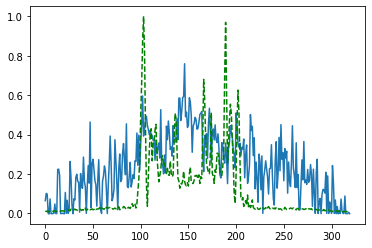

Time taken for epoch:  105.74448752403259
Epoch = [ 60/3000]  Iter = [   0/39480]  Loss = 0.242 Avg Loss = 0.242  Time = 0.1023s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 60/3000]  Iter = [ 100/39480]  Loss = 0.2023 Avg Loss = 0.2264  Time = 0.0081s
Epoch = [ 60/3000]  Iter = [ 200/39480]  Loss = 0.1856 Avg Loss = 0.2209  Time = 0.0019s
Epoch = [ 60/3000]  Iter = [ 300/39480]  Loss = 0.2004 Avg Loss = 0.2232  Time = 0.0020s
Epoch = [ 60/3000]  Iter = [ 400/39480]  Loss = 0.2269 Avg Loss = 0.2169  Time = 0.0024s
Epoch = [ 60/3000]  Iter = [ 500/39480]  Loss = 0.2255 Avg Loss = 0.2168  Time = 0.0023s
Epoch = [ 60/3000]  Iter = [ 600/39480]  Loss = 0.2266 Avg Loss = 0.2199  Time = 0.0024s
Epoch = [ 60/3000]  Iter = [ 700/39480]  Loss = 0.2198 Avg Loss = 0.2186  Time = 0.0023s
Epoch = [ 60/3000]  Iter = [ 800/39480]  Loss = 0.2041 Avg Loss = 0.2196  Time = 0.0023s
Epoch = [ 60/3000]  Iter = [ 900/39480]  Loss = 0.2449 Avg Loss = 0.2203  Time = 0.0023s
Epoch = [ 60/3000]  Iter = [1000/39480]  Loss = 0.2187 Avg Loss = 0.2191  Time = 0.0024s
Epoch = [ 60/3000]  Iter = [1100/39480]  Loss = 0.2231 Avg Loss = 0.2185  Time = 0.0025s
Epoch = [ 60/3000]  I

Epoch = [ 60/3000]  Iter = [9400/39480]  Loss = 0.2251 Avg Loss = 0.2156  Time = 0.0023s
Epoch = [ 60/3000]  Iter = [9500/39480]  Loss = 0.1978 Avg Loss = 0.2129  Time = 0.0018s
Epoch = [ 60/3000]  Iter = [9600/39480]  Loss = 0.2324 Avg Loss = 0.2159  Time = 0.0018s
Epoch = [ 60/3000]  Iter = [9700/39480]  Loss = 0.247 Avg Loss = 0.2161  Time = 0.0018s
Epoch = [ 60/3000]  Iter = [9800/39480]  Loss = 0.2457 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 60/3000]  Iter = [9900/39480]  Loss = 0.213 Avg Loss = 0.2235  Time = 0.0019s
Epoch = [ 60/3000]  Iter = [10000/39480]  Loss = 0.1931 Avg Loss = 0.2195  Time = 0.0017s
Epoch = [ 60/3000]  Iter = [10100/39480]  Loss = 0.2158 Avg Loss = 0.2182  Time = 0.0017s
Epoch = [ 60/3000]  Iter = [10200/39480]  Loss = 0.2109 Avg Loss = 0.2209  Time = 0.0018s
Epoch = [ 60/3000]  Iter = [10300/39480]  Loss = 0.2214 Avg Loss = 0.2188  Time = 0.0022s
Epoch = [ 60/3000]  Iter = [10400/39480]  Loss = 0.2632 Avg Loss = 0.2196  Time = 0.0020s
Epoch = [ 60/3000] 

Epoch = [ 60/3000]  Iter = [18700/39480]  Loss = 0.2052 Avg Loss = 0.2215  Time = 0.0017s
Epoch = [ 60/3000]  Iter = [18800/39480]  Loss = 0.1974 Avg Loss = 0.2186  Time = 0.0019s
Epoch = [ 60/3000]  Iter = [18900/39480]  Loss = 0.2096 Avg Loss = 0.221  Time = 0.0018s
Epoch = [ 60/3000]  Iter = [19000/39480]  Loss = 0.2225 Avg Loss = 0.2191  Time = 0.0018s
Epoch = [ 60/3000]  Iter = [19100/39480]  Loss = 0.2225 Avg Loss = 0.2151  Time = 0.0021s
Epoch = [ 60/3000]  Iter = [19200/39480]  Loss = 0.1971 Avg Loss = 0.2165  Time = 0.0024s
Epoch = [ 60/3000]  Iter = [19300/39480]  Loss = 0.1993 Avg Loss = 0.2166  Time = 0.0017s
Epoch = [ 60/3000]  Iter = [19400/39480]  Loss = 0.2124 Avg Loss = 0.2219  Time = 0.0025s
Epoch = [ 60/3000]  Iter = [19500/39480]  Loss = 0.2162 Avg Loss = 0.2185  Time = 0.0017s
Epoch = [ 60/3000]  Iter = [19600/39480]  Loss = 0.1949 Avg Loss = 0.2193  Time = 0.0017s
Epoch = [ 60/3000]  Iter = [19700/39480]  Loss = 0.2105 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 60

Epoch = [ 60/3000]  Iter = [28000/39480]  Loss = 0.1982 Avg Loss = 0.2207  Time = 0.0019s
Epoch = [ 60/3000]  Iter = [28100/39480]  Loss = 0.2013 Avg Loss = 0.2187  Time = 0.0017s
Epoch = [ 60/3000]  Iter = [28200/39480]  Loss = 0.232 Avg Loss = 0.216  Time = 0.0017s
Epoch = [ 60/3000]  Iter = [28300/39480]  Loss = 0.2089 Avg Loss = 0.215  Time = 0.0058s
Epoch = [ 60/3000]  Iter = [28400/39480]  Loss = 0.2032 Avg Loss = 0.2135  Time = 0.0018s
Epoch = [ 60/3000]  Iter = [28500/39480]  Loss = 0.2072 Avg Loss = 0.2183  Time = 0.0019s
Epoch = [ 60/3000]  Iter = [28600/39480]  Loss = 0.1988 Avg Loss = 0.2171  Time = 0.0023s
Epoch = [ 60/3000]  Iter = [28700/39480]  Loss = 0.1964 Avg Loss = 0.2173  Time = 0.0023s
Epoch = [ 60/3000]  Iter = [28800/39480]  Loss = 0.1864 Avg Loss = 0.2207  Time = 0.0020s
Epoch = [ 60/3000]  Iter = [28900/39480]  Loss = 0.278 Avg Loss = 0.2206  Time = 0.0018s
Epoch = [ 60/3000]  Iter = [29000/39480]  Loss = 0.2199 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 60/30

Epoch = [ 60/3000]  Iter = [37200/39480]  Loss = 0.2341 Avg Loss = 0.2166  Time = 0.0024s
Epoch = [ 60/3000]  Iter = [37300/39480]  Loss = 0.2322 Avg Loss = 0.2153  Time = 0.0023s
Epoch = [ 60/3000]  Iter = [37400/39480]  Loss = 0.1938 Avg Loss = 0.2171  Time = 0.0024s
Epoch = [ 60/3000]  Iter = [37500/39480]  Loss = 0.2217 Avg Loss = 0.221  Time = 0.0018s
Epoch = [ 60/3000]  Iter = [37600/39480]  Loss = 0.2403 Avg Loss = 0.2202  Time = 0.0018s
Epoch = [ 60/3000]  Iter = [37700/39480]  Loss = 0.2721 Avg Loss = 0.2233  Time = 0.0021s
Epoch = [ 60/3000]  Iter = [37800/39480]  Loss = 0.2275 Avg Loss = 0.2176  Time = 0.0021s
Epoch = [ 60/3000]  Iter = [37900/39480]  Loss = 0.1874 Avg Loss = 0.2187  Time = 0.0081s
Epoch = [ 60/3000]  Iter = [38000/39480]  Loss = 0.2053 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 60/3000]  Iter = [38100/39480]  Loss = 0.2354 Avg Loss = 0.2186  Time = 0.0019s
Epoch = [ 60/3000]  Iter = [38200/39480]  Loss = 0.2215 Avg Loss = 0.2188  Time = 0.0018s
Epoch = [ 60

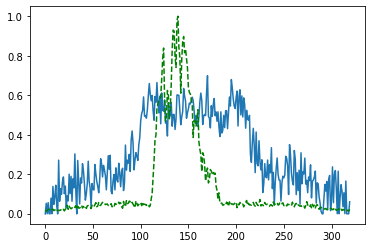

Time taken for epoch:  107.83897590637207
Epoch = [ 61/3000]  Iter = [   0/39480]  Loss = 0.2208 Avg Loss = 0.2208  Time = 0.1111s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 61/3000]  Iter = [ 100/39480]  Loss = 0.2591 Avg Loss = 0.2213  Time = 0.0067s
Epoch = [ 61/3000]  Iter = [ 200/39480]  Loss = 0.2363 Avg Loss = 0.2196  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [ 300/39480]  Loss = 0.2276 Avg Loss = 0.2197  Time = 0.0019s
Epoch = [ 61/3000]  Iter = [ 400/39480]  Loss = 0.2001 Avg Loss = 0.2143  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [ 500/39480]  Loss = 0.2149 Avg Loss = 0.2196  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [ 600/39480]  Loss = 0.228 Avg Loss = 0.2189  Time = 0.0019s
Epoch = [ 61/3000]  Iter = [ 700/39480]  Loss = 0.2225 Avg Loss = 0.2201  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [ 800/39480]  Loss = 0.1941 Avg Loss = 0.2204  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [ 900/39480]  Loss = 0.1775 Avg Loss = 0.2191  Time = 0.0017s
Epoch = [ 61/3000]  Iter = [1000/39480]  Loss = 0.2157 Avg Loss = 0.2209  Time = 0.0057s
Epoch = [ 61/3000]  Iter = [1100/39480]  Loss = 0.2018 Avg Loss = 0.2156  Time = 0.0018s
Epoch = [ 61/3000]  It

Epoch = [ 61/3000]  Iter = [9400/39480]  Loss = 0.2307 Avg Loss = 0.2164  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [9500/39480]  Loss = 0.218 Avg Loss = 0.2178  Time = 0.0017s
Epoch = [ 61/3000]  Iter = [9600/39480]  Loss = 0.2205 Avg Loss = 0.2144  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [9700/39480]  Loss = 0.2222 Avg Loss = 0.2139  Time = 0.0017s
Epoch = [ 61/3000]  Iter = [9800/39480]  Loss = 0.2199 Avg Loss = 0.2178  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [9900/39480]  Loss = 0.2144 Avg Loss = 0.2185  Time = 0.0017s
Epoch = [ 61/3000]  Iter = [10000/39480]  Loss = 0.213 Avg Loss = 0.2192  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [10100/39480]  Loss = 0.1904 Avg Loss = 0.2202  Time = 0.0020s
Epoch = [ 61/3000]  Iter = [10200/39480]  Loss = 0.2071 Avg Loss = 0.2211  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [10300/39480]  Loss = 0.2125 Avg Loss = 0.219  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [10400/39480]  Loss = 0.2215 Avg Loss = 0.2168  Time = 0.0017s
Epoch = [ 61/3000] 

Epoch = [ 61/3000]  Iter = [18600/39480]  Loss = 0.2483 Avg Loss = 0.2192  Time = 0.0019s
Epoch = [ 61/3000]  Iter = [18700/39480]  Loss = 0.2064 Avg Loss = 0.22  Time = 0.0017s
Epoch = [ 61/3000]  Iter = [18800/39480]  Loss = 0.213 Avg Loss = 0.2171  Time = 0.0017s
Epoch = [ 61/3000]  Iter = [18900/39480]  Loss = 0.2218 Avg Loss = 0.224  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [19000/39480]  Loss = 0.215 Avg Loss = 0.2178  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [19100/39480]  Loss = 0.2753 Avg Loss = 0.2182  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [19200/39480]  Loss = 0.2046 Avg Loss = 0.2157  Time = 0.0022s
Epoch = [ 61/3000]  Iter = [19300/39480]  Loss = 0.2249 Avg Loss = 0.2208  Time = 0.0027s
Epoch = [ 61/3000]  Iter = [19400/39480]  Loss = 0.2386 Avg Loss = 0.217  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [19500/39480]  Loss = 0.2243 Avg Loss = 0.2156  Time = 0.0023s
Epoch = [ 61/3000]  Iter = [19600/39480]  Loss = 0.2126 Avg Loss = 0.2182  Time = 0.0023s
Epoch = [ 61/300

Epoch = [ 61/3000]  Iter = [27800/39480]  Loss = 0.2336 Avg Loss = 0.2184  Time = 0.0056s
Epoch = [ 61/3000]  Iter = [27900/39480]  Loss = 0.2119 Avg Loss = 0.2186  Time = 0.0021s
Epoch = [ 61/3000]  Iter = [28000/39480]  Loss = 0.1896 Avg Loss = 0.2182  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [28100/39480]  Loss = 0.2343 Avg Loss = 0.2186  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [28200/39480]  Loss = 0.219 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [28300/39480]  Loss = 0.2245 Avg Loss = 0.2199  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [28400/39480]  Loss = 0.2034 Avg Loss = 0.2168  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [28500/39480]  Loss = 0.2219 Avg Loss = 0.2233  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [28600/39480]  Loss = 0.2165 Avg Loss = 0.2194  Time = 0.0019s
Epoch = [ 61/3000]  Iter = [28700/39480]  Loss = 0.1899 Avg Loss = 0.22  Time = 0.0039s
Epoch = [ 61/3000]  Iter = [28800/39480]  Loss = 0.2036 Avg Loss = 0.2216  Time = 0.0019s
Epoch = [ 61/

Epoch = [ 61/3000]  Iter = [37000/39480]  Loss = 0.1989 Avg Loss = 0.2184  Time = 0.0052s
Epoch = [ 61/3000]  Iter = [37100/39480]  Loss = 0.2033 Avg Loss = 0.2134  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [37200/39480]  Loss = 0.2183 Avg Loss = 0.2193  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [37300/39480]  Loss = 0.1971 Avg Loss = 0.2165  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [37400/39480]  Loss = 0.2188 Avg Loss = 0.2214  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [37500/39480]  Loss = 0.2331 Avg Loss = 0.214  Time = 0.0017s
Epoch = [ 61/3000]  Iter = [37600/39480]  Loss = 0.2004 Avg Loss = 0.2135  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [37700/39480]  Loss = 0.2288 Avg Loss = 0.2134  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [37800/39480]  Loss = 0.2213 Avg Loss = 0.2174  Time = 0.0017s
Epoch = [ 61/3000]  Iter = [37900/39480]  Loss = 0.234 Avg Loss = 0.2153  Time = 0.0018s
Epoch = [ 61/3000]  Iter = [38000/39480]  Loss = 0.1944 Avg Loss = 0.218  Time = 0.0018s
Epoch = [ 61/

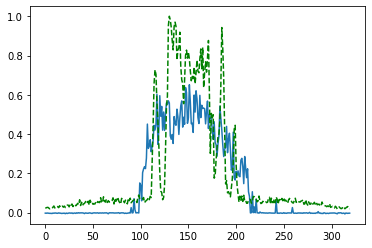

Time taken for epoch:  106.64914131164551
Epoch = [ 62/3000]  Iter = [   0/39480]  Loss = 0.2436 Avg Loss = 0.2436  Time = 0.0977s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 62/3000]  Iter = [ 100/39480]  Loss = 0.2083 Avg Loss = 0.2289  Time = 0.0019s
Epoch = [ 62/3000]  Iter = [ 200/39480]  Loss = 0.2176 Avg Loss = 0.2213  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [ 300/39480]  Loss = 0.187 Avg Loss = 0.2238  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [ 400/39480]  Loss = 0.1983 Avg Loss = 0.2181  Time = 0.0022s
Epoch = [ 62/3000]  Iter = [ 500/39480]  Loss = 0.2135 Avg Loss = 0.2202  Time = 0.0023s
Epoch = [ 62/3000]  Iter = [ 600/39480]  Loss = 0.2272 Avg Loss = 0.2196  Time = 0.0084s
Epoch = [ 62/3000]  Iter = [ 700/39480]  Loss = 0.2192 Avg Loss = 0.216  Time = 0.0023s
Epoch = [ 62/3000]  Iter = [ 800/39480]  Loss = 0.1923 Avg Loss = 0.2134  Time = 0.0023s
Epoch = [ 62/3000]  Iter = [ 900/39480]  Loss = 0.1918 Avg Loss = 0.2158  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [1000/39480]  Loss = 0.1946 Avg Loss = 0.2174  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [1100/39480]  Loss = 0.2278 Avg Loss = 0.2148  Time = 0.0019s
Epoch = [ 62/3000]  Ite

Epoch = [ 62/3000]  Iter = [9500/39480]  Loss = 0.1913 Avg Loss = 0.216  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [9600/39480]  Loss = 0.2141 Avg Loss = 0.2162  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [9700/39480]  Loss = 0.2169 Avg Loss = 0.2226  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [9800/39480]  Loss = 0.2112 Avg Loss = 0.2199  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [9900/39480]  Loss = 0.2257 Avg Loss = 0.217  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [10000/39480]  Loss = 0.1855 Avg Loss = 0.2196  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [10100/39480]  Loss = 0.2361 Avg Loss = 0.2188  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [10200/39480]  Loss = 0.2098 Avg Loss = 0.2195  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [10300/39480]  Loss = 0.2151 Avg Loss = 0.2178  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [10400/39480]  Loss = 0.2267 Avg Loss = 0.2191  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [10500/39480]  Loss = 0.2209 Avg Loss = 0.2189  Time = 0.0017s
Epoch = [ 62/3000

Epoch = [ 62/3000]  Iter = [18700/39480]  Loss = 0.1747 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 62/3000]  Iter = [18800/39480]  Loss = 0.2253 Avg Loss = 0.2145  Time = 0.0025s
Epoch = [ 62/3000]  Iter = [18900/39480]  Loss = 0.248 Avg Loss = 0.2188  Time = 0.0019s
Epoch = [ 62/3000]  Iter = [19000/39480]  Loss = 0.1939 Avg Loss = 0.2187  Time = 0.0019s
Epoch = [ 62/3000]  Iter = [19100/39480]  Loss = 0.2368 Avg Loss = 0.2178  Time = 0.0019s
Epoch = [ 62/3000]  Iter = [19200/39480]  Loss = 0.2123 Avg Loss = 0.2181  Time = 0.0019s
Epoch = [ 62/3000]  Iter = [19300/39480]  Loss = 0.1912 Avg Loss = 0.2191  Time = 0.0022s
Epoch = [ 62/3000]  Iter = [19400/39480]  Loss = 0.2126 Avg Loss = 0.2171  Time = 0.0026s
Epoch = [ 62/3000]  Iter = [19500/39480]  Loss = 0.2107 Avg Loss = 0.2192  Time = 0.0019s
Epoch = [ 62/3000]  Iter = [19600/39480]  Loss = 0.2166 Avg Loss = 0.2211  Time = 0.0098s
Epoch = [ 62/3000]  Iter = [19700/39480]  Loss = 0.2355 Avg Loss = 0.217  Time = 0.0018s
Epoch = [ 62

Epoch = [ 62/3000]  Iter = [28000/39480]  Loss = 0.2156 Avg Loss = 0.222  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [28100/39480]  Loss = 0.209 Avg Loss = 0.2211  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [28200/39480]  Loss = 0.2455 Avg Loss = 0.2181  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [28300/39480]  Loss = 0.2392 Avg Loss = 0.2171  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [28400/39480]  Loss = 0.224 Avg Loss = 0.2162  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [28500/39480]  Loss = 0.2071 Avg Loss = 0.2194  Time = 0.0051s
Epoch = [ 62/3000]  Iter = [28600/39480]  Loss = 0.2405 Avg Loss = 0.2199  Time = 0.0017s
Epoch = [ 62/3000]  Iter = [28700/39480]  Loss = 0.2238 Avg Loss = 0.219  Time = 0.0023s
Epoch = [ 62/3000]  Iter = [28800/39480]  Loss = 0.2244 Avg Loss = 0.2211  Time = 0.0019s
Epoch = [ 62/3000]  Iter = [28900/39480]  Loss = 0.2162 Avg Loss = 0.2178  Time = 0.0020s
Epoch = [ 62/3000]  Iter = [29000/39480]  Loss = 0.2253 Avg Loss = 0.2217  Time = 0.0019s
Epoch = [ 62/3

Epoch = [ 62/3000]  Iter = [37200/39480]  Loss = 0.2734 Avg Loss = 0.2162  Time = 0.0044s
Epoch = [ 62/3000]  Iter = [37300/39480]  Loss = 0.2296 Avg Loss = 0.2168  Time = 0.0022s
Epoch = [ 62/3000]  Iter = [37400/39480]  Loss = 0.1729 Avg Loss = 0.2159  Time = 0.0023s
Epoch = [ 62/3000]  Iter = [37500/39480]  Loss = 0.2303 Avg Loss = 0.2159  Time = 0.0019s
Epoch = [ 62/3000]  Iter = [37600/39480]  Loss = 0.2125 Avg Loss = 0.2167  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [37700/39480]  Loss = 0.1943 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 62/3000]  Iter = [37800/39480]  Loss = 0.2234 Avg Loss = 0.2179  Time = 0.0020s
Epoch = [ 62/3000]  Iter = [37900/39480]  Loss = 0.2198 Avg Loss = 0.2191  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [38000/39480]  Loss = 0.1875 Avg Loss = 0.2167  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [38100/39480]  Loss = 0.2535 Avg Loss = 0.2164  Time = 0.0018s
Epoch = [ 62/3000]  Iter = [38200/39480]  Loss = 0.2555 Avg Loss = 0.2172  Time = 0.0019s
Epoch = [ 6

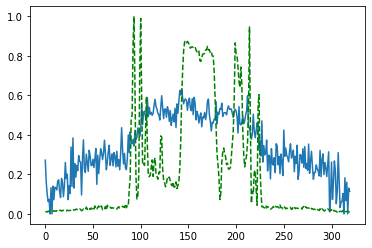

Time taken for epoch:  110.26090741157532
Epoch = [ 63/3000]  Iter = [   0/39480]  Loss = 0.2059 Avg Loss = 0.2059  Time = 0.1162s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 63/3000]  Iter = [ 100/39480]  Loss = 0.2332 Avg Loss = 0.215  Time = 0.0019s
Epoch = [ 63/3000]  Iter = [ 200/39480]  Loss = 0.2167 Avg Loss = 0.2154  Time = 0.0019s
Epoch = [ 63/3000]  Iter = [ 300/39480]  Loss = 0.2411 Avg Loss = 0.2188  Time = 0.0021s
Epoch = [ 63/3000]  Iter = [ 400/39480]  Loss = 0.2097 Avg Loss = 0.2174  Time = 0.0018s
Epoch = [ 63/3000]  Iter = [ 500/39480]  Loss = 0.2384 Avg Loss = 0.217  Time = 0.0023s
Epoch = [ 63/3000]  Iter = [ 600/39480]  Loss = 0.2462 Avg Loss = 0.221  Time = 0.0019s
Epoch = [ 63/3000]  Iter = [ 700/39480]  Loss = 0.2473 Avg Loss = 0.2201  Time = 0.0029s
Epoch = [ 63/3000]  Iter = [ 800/39480]  Loss = 0.2183 Avg Loss = 0.2192  Time = 0.0023s
Epoch = [ 63/3000]  Iter = [ 900/39480]  Loss = 0.2184 Avg Loss = 0.2206  Time = 0.0021s
Epoch = [ 63/3000]  Iter = [1000/39480]  Loss = 0.2058 Avg Loss = 0.2168  Time = 0.0025s
Epoch = [ 63/3000]  Iter = [1100/39480]  Loss = 0.2185 Avg Loss = 0.2181  Time = 0.0038s
Epoch = [ 63/3000]  Iter

Epoch = [ 63/3000]  Iter = [9400/39480]  Loss = 0.237 Avg Loss = 0.2155  Time = 0.0020s
Epoch = [ 63/3000]  Iter = [9500/39480]  Loss = 0.2364 Avg Loss = 0.2201  Time = 0.0019s
Epoch = [ 63/3000]  Iter = [9600/39480]  Loss = 0.2127 Avg Loss = 0.2215  Time = 0.0019s
Epoch = [ 63/3000]  Iter = [9700/39480]  Loss = 0.2165 Avg Loss = 0.2168  Time = 0.0031s
Epoch = [ 63/3000]  Iter = [9800/39480]  Loss = 0.2312 Avg Loss = 0.2192  Time = 0.0019s
Epoch = [ 63/3000]  Iter = [9900/39480]  Loss = 0.2374 Avg Loss = 0.2212  Time = 0.0056s
Epoch = [ 63/3000]  Iter = [10000/39480]  Loss = 0.1756 Avg Loss = 0.2184  Time = 0.0021s
Epoch = [ 63/3000]  Iter = [10100/39480]  Loss = 0.2191 Avg Loss = 0.2183  Time = 0.0051s
Epoch = [ 63/3000]  Iter = [10200/39480]  Loss = 0.2092 Avg Loss = 0.2144  Time = 0.0019s
Epoch = [ 63/3000]  Iter = [10300/39480]  Loss = 0.252 Avg Loss = 0.2159  Time = 0.0029s
Epoch = [ 63/3000]  Iter = [10400/39480]  Loss = 0.1982 Avg Loss = 0.217  Time = 0.0018s
Epoch = [ 63/3000] 

Epoch = [ 63/3000]  Iter = [18600/39480]  Loss = 0.1983 Avg Loss = 0.2156  Time = 0.0022s
Epoch = [ 63/3000]  Iter = [18700/39480]  Loss = 0.2013 Avg Loss = 0.2172  Time = 0.0019s
Epoch = [ 63/3000]  Iter = [18800/39480]  Loss = 0.2468 Avg Loss = 0.2188  Time = 0.0041s
Epoch = [ 63/3000]  Iter = [18900/39480]  Loss = 0.1817 Avg Loss = 0.2137  Time = 0.0026s
Epoch = [ 63/3000]  Iter = [19000/39480]  Loss = 0.2259 Avg Loss = 0.2172  Time = 0.0019s
Epoch = [ 63/3000]  Iter = [19100/39480]  Loss = 0.2277 Avg Loss = 0.2214  Time = 0.0034s
Epoch = [ 63/3000]  Iter = [19200/39480]  Loss = 0.1984 Avg Loss = 0.2163  Time = 0.0026s
Epoch = [ 63/3000]  Iter = [19300/39480]  Loss = 0.1995 Avg Loss = 0.2164  Time = 0.0028s
Epoch = [ 63/3000]  Iter = [19400/39480]  Loss = 0.1995 Avg Loss = 0.2162  Time = 0.0019s
Epoch = [ 63/3000]  Iter = [19500/39480]  Loss = 0.1972 Avg Loss = 0.2169  Time = 0.0019s
Epoch = [ 63/3000]  Iter = [19600/39480]  Loss = 0.1733 Avg Loss = 0.2169  Time = 0.0056s
Epoch = [ 

Epoch = [ 63/3000]  Iter = [27800/39480]  Loss = 0.2318 Avg Loss = 0.2208  Time = 0.0018s
Epoch = [ 63/3000]  Iter = [27900/39480]  Loss = 0.2328 Avg Loss = 0.2226  Time = 0.0018s
Epoch = [ 63/3000]  Iter = [28000/39480]  Loss = 0.2527 Avg Loss = 0.2225  Time = 0.0018s
Epoch = [ 63/3000]  Iter = [28100/39480]  Loss = 0.1981 Avg Loss = 0.2174  Time = 0.0021s
Epoch = [ 63/3000]  Iter = [28200/39480]  Loss = 0.2182 Avg Loss = 0.2198  Time = 0.0019s
Epoch = [ 63/3000]  Iter = [28300/39480]  Loss = 0.2057 Avg Loss = 0.2165  Time = 0.0018s
Epoch = [ 63/3000]  Iter = [28400/39480]  Loss = 0.2122 Avg Loss = 0.213  Time = 0.0024s
Epoch = [ 63/3000]  Iter = [28500/39480]  Loss = 0.1941 Avg Loss = 0.2192  Time = 0.0026s
Epoch = [ 63/3000]  Iter = [28600/39480]  Loss = 0.2449 Avg Loss = 0.2138  Time = 0.0029s
Epoch = [ 63/3000]  Iter = [28700/39480]  Loss = 0.2035 Avg Loss = 0.2154  Time = 0.0027s
Epoch = [ 63/3000]  Iter = [28800/39480]  Loss = 0.2352 Avg Loss = 0.217  Time = 0.0018s
Epoch = [ 63

Epoch = [ 63/3000]  Iter = [37100/39480]  Loss = 0.2275 Avg Loss = 0.221  Time = 0.0030s
Epoch = [ 63/3000]  Iter = [37200/39480]  Loss = 0.1921 Avg Loss = 0.2187  Time = 0.0018s
Epoch = [ 63/3000]  Iter = [37300/39480]  Loss = 0.2198 Avg Loss = 0.2172  Time = 0.0018s
Epoch = [ 63/3000]  Iter = [37400/39480]  Loss = 0.1872 Avg Loss = 0.216  Time = 0.0025s
Epoch = [ 63/3000]  Iter = [37500/39480]  Loss = 0.2354 Avg Loss = 0.2163  Time = 0.0033s
Epoch = [ 63/3000]  Iter = [37600/39480]  Loss = 0.2164 Avg Loss = 0.2163  Time = 0.0018s
Epoch = [ 63/3000]  Iter = [37700/39480]  Loss = 0.2027 Avg Loss = 0.2203  Time = 0.0022s
Epoch = [ 63/3000]  Iter = [37800/39480]  Loss = 0.2219 Avg Loss = 0.2199  Time = 0.0022s
Epoch = [ 63/3000]  Iter = [37900/39480]  Loss = 0.2404 Avg Loss = 0.2175  Time = 0.0018s
Epoch = [ 63/3000]  Iter = [38000/39480]  Loss = 0.2178 Avg Loss = 0.2175  Time = 0.0018s
Epoch = [ 63/3000]  Iter = [38100/39480]  Loss = 0.206 Avg Loss = 0.2195  Time = 0.0060s
Epoch = [ 63/

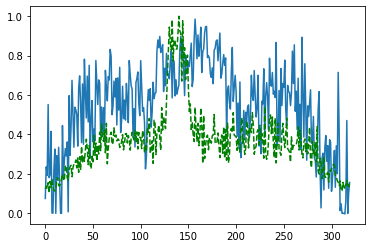

Time taken for epoch:  124.31201887130737
Epoch = [ 64/3000]  Iter = [   0/39480]  Loss = 0.2311 Avg Loss = 0.2311  Time = 0.1390s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 64/3000]  Iter = [ 100/39480]  Loss = 0.2221 Avg Loss = 0.2197  Time = 0.0018s
Epoch = [ 64/3000]  Iter = [ 200/39480]  Loss = 0.2284 Avg Loss = 0.2156  Time = 0.0018s
Epoch = [ 64/3000]  Iter = [ 300/39480]  Loss = 0.2193 Avg Loss = 0.2194  Time = 0.0019s
Epoch = [ 64/3000]  Iter = [ 400/39480]  Loss = 0.2546 Avg Loss = 0.2229  Time = 0.0058s
Epoch = [ 64/3000]  Iter = [ 500/39480]  Loss = 0.2092 Avg Loss = 0.2187  Time = 0.0017s
Epoch = [ 64/3000]  Iter = [ 600/39480]  Loss = 0.2218 Avg Loss = 0.2173  Time = 0.0059s
Epoch = [ 64/3000]  Iter = [ 700/39480]  Loss = 0.2591 Avg Loss = 0.2165  Time = 0.0051s
Epoch = [ 64/3000]  Iter = [ 800/39480]  Loss = 0.1958 Avg Loss = 0.2163  Time = 0.0029s
Epoch = [ 64/3000]  Iter = [ 900/39480]  Loss = 0.1995 Avg Loss = 0.219  Time = 0.0019s
Epoch = [ 64/3000]  Iter = [1000/39480]  Loss = 0.2111 Avg Loss = 0.2218  Time = 0.0022s
Epoch = [ 64/3000]  Iter = [1100/39480]  Loss = 0.2193 Avg Loss = 0.2185  Time = 0.0024s
Epoch = [ 64/3000]  It

Epoch = [ 64/3000]  Iter = [9400/39480]  Loss = 0.2245 Avg Loss = 0.2167  Time = 0.0034s
Epoch = [ 64/3000]  Iter = [9500/39480]  Loss = 0.2178 Avg Loss = 0.2205  Time = 0.0018s
Epoch = [ 64/3000]  Iter = [9600/39480]  Loss = 0.2491 Avg Loss = 0.2192  Time = 0.0023s
Epoch = [ 64/3000]  Iter = [9700/39480]  Loss = 0.266 Avg Loss = 0.2197  Time = 0.0021s
Epoch = [ 64/3000]  Iter = [9800/39480]  Loss = 0.2216 Avg Loss = 0.2193  Time = 0.0026s
Epoch = [ 64/3000]  Iter = [9900/39480]  Loss = 0.2262 Avg Loss = 0.2188  Time = 0.0029s
Epoch = [ 64/3000]  Iter = [10000/39480]  Loss = 0.2046 Avg Loss = 0.2203  Time = 0.0051s
Epoch = [ 64/3000]  Iter = [10100/39480]  Loss = 0.2303 Avg Loss = 0.219  Time = 0.0023s
Epoch = [ 64/3000]  Iter = [10200/39480]  Loss = 0.2326 Avg Loss = 0.2181  Time = 0.0028s
Epoch = [ 64/3000]  Iter = [10300/39480]  Loss = 0.2269 Avg Loss = 0.2158  Time = 0.0020s
Epoch = [ 64/3000]  Iter = [10400/39480]  Loss = 0.2392 Avg Loss = 0.22  Time = 0.0025s
Epoch = [ 64/3000]  

Epoch = [ 64/3000]  Iter = [18600/39480]  Loss = 0.237 Avg Loss = 0.2132  Time = 0.0026s
Epoch = [ 64/3000]  Iter = [18700/39480]  Loss = 0.1844 Avg Loss = 0.2126  Time = 0.0031s
Epoch = [ 64/3000]  Iter = [18800/39480]  Loss = 0.232 Avg Loss = 0.2162  Time = 0.0026s
Epoch = [ 64/3000]  Iter = [18900/39480]  Loss = 0.2255 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 64/3000]  Iter = [19000/39480]  Loss = 0.2204 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 64/3000]  Iter = [19100/39480]  Loss = 0.2041 Avg Loss = 0.2223  Time = 0.0028s
Epoch = [ 64/3000]  Iter = [19200/39480]  Loss = 0.2447 Avg Loss = 0.2235  Time = 0.0030s
Epoch = [ 64/3000]  Iter = [19300/39480]  Loss = 0.2516 Avg Loss = 0.2145  Time = 0.0019s
Epoch = [ 64/3000]  Iter = [19400/39480]  Loss = 0.1913 Avg Loss = 0.2164  Time = 0.0019s
Epoch = [ 64/3000]  Iter = [19500/39480]  Loss = 0.2213 Avg Loss = 0.2194  Time = 0.0040s
Epoch = [ 64/3000]  Iter = [19600/39480]  Loss = 0.2028 Avg Loss = 0.2183  Time = 0.0033s
Epoch = [ 64

Epoch = [ 64/3000]  Iter = [27800/39480]  Loss = 0.2342 Avg Loss = 0.2155  Time = 0.0022s
Epoch = [ 64/3000]  Iter = [27900/39480]  Loss = 0.1935 Avg Loss = 0.2161  Time = 0.0020s
Epoch = [ 64/3000]  Iter = [28000/39480]  Loss = 0.2064 Avg Loss = 0.2192  Time = 0.0021s
Epoch = [ 64/3000]  Iter = [28100/39480]  Loss = 0.2067 Avg Loss = 0.2148  Time = 0.0018s
Epoch = [ 64/3000]  Iter = [28200/39480]  Loss = 0.2575 Avg Loss = 0.2158  Time = 0.0024s
Epoch = [ 64/3000]  Iter = [28300/39480]  Loss = 0.2274 Avg Loss = 0.2205  Time = 0.0023s
Epoch = [ 64/3000]  Iter = [28400/39480]  Loss = 0.2161 Avg Loss = 0.2173  Time = 0.0026s
Epoch = [ 64/3000]  Iter = [28500/39480]  Loss = 0.2169 Avg Loss = 0.2179  Time = 0.0028s
Epoch = [ 64/3000]  Iter = [28600/39480]  Loss = 0.2322 Avg Loss = 0.2174  Time = 0.0030s
Epoch = [ 64/3000]  Iter = [28700/39480]  Loss = 0.2259 Avg Loss = 0.2161  Time = 0.0020s
Epoch = [ 64/3000]  Iter = [28800/39480]  Loss = 0.2164 Avg Loss = 0.2142  Time = 0.0025s
Epoch = [ 

Epoch = [ 64/3000]  Iter = [37000/39480]  Loss = 0.1992 Avg Loss = 0.2184  Time = 0.0018s
Epoch = [ 64/3000]  Iter = [37100/39480]  Loss = 0.2188 Avg Loss = 0.2203  Time = 0.0019s
Epoch = [ 64/3000]  Iter = [37200/39480]  Loss = 0.2005 Avg Loss = 0.2159  Time = 0.0056s
Epoch = [ 64/3000]  Iter = [37300/39480]  Loss = 0.227 Avg Loss = 0.2182  Time = 0.0019s
Epoch = [ 64/3000]  Iter = [37400/39480]  Loss = 0.2355 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 64/3000]  Iter = [37500/39480]  Loss = 0.2131 Avg Loss = 0.2217  Time = 0.0020s
Epoch = [ 64/3000]  Iter = [37600/39480]  Loss = 0.2263 Avg Loss = 0.2204  Time = 0.0020s
Epoch = [ 64/3000]  Iter = [37700/39480]  Loss = 0.2147 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 64/3000]  Iter = [37800/39480]  Loss = 0.2214 Avg Loss = 0.2206  Time = 0.0027s
Epoch = [ 64/3000]  Iter = [37900/39480]  Loss = 0.2255 Avg Loss = 0.2194  Time = 0.0024s
Epoch = [ 64/3000]  Iter = [38000/39480]  Loss = 0.2061 Avg Loss = 0.2205  Time = 0.0033s
Epoch = [ 6

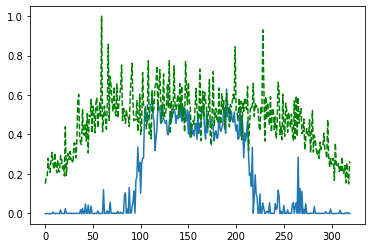

Time taken for epoch:  125.8419439792633
Epoch = [ 65/3000]  Iter = [   0/39480]  Loss = 0.1943 Avg Loss = 0.1943  Time = 0.0980s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 65/3000]  Iter = [ 100/39480]  Loss = 0.2656 Avg Loss = 0.2113  Time = 0.0033s
Epoch = [ 65/3000]  Iter = [ 200/39480]  Loss = 0.2037 Avg Loss = 0.2154  Time = 0.0020s
Epoch = [ 65/3000]  Iter = [ 300/39480]  Loss = 0.2361 Avg Loss = 0.2163  Time = 0.0026s
Epoch = [ 65/3000]  Iter = [ 400/39480]  Loss = 0.2288 Avg Loss = 0.2171  Time = 0.0018s
Epoch = [ 65/3000]  Iter = [ 500/39480]  Loss = 0.1916 Avg Loss = 0.2193  Time = 0.0022s
Epoch = [ 65/3000]  Iter = [ 600/39480]  Loss = 0.1834 Avg Loss = 0.2162  Time = 0.0036s
Epoch = [ 65/3000]  Iter = [ 700/39480]  Loss = 0.2115 Avg Loss = 0.2181  Time = 0.0019s
Epoch = [ 65/3000]  Iter = [ 800/39480]  Loss = 0.2501 Avg Loss = 0.2181  Time = 0.0033s
Epoch = [ 65/3000]  Iter = [ 900/39480]  Loss = 0.1885 Avg Loss = 0.2198  Time = 0.0026s
Epoch = [ 65/3000]  Iter = [1000/39480]  Loss = 0.2064 Avg Loss = 0.2182  Time = 0.0023s
Epoch = [ 65/3000]  Iter = [1100/39480]  Loss = 0.1947 Avg Loss = 0.2208  Time = 0.0029s
Epoch = [ 65/3000]  I

Epoch = [ 65/3000]  Iter = [9400/39480]  Loss = 0.2014 Avg Loss = 0.2226  Time = 0.0027s
Epoch = [ 65/3000]  Iter = [9500/39480]  Loss = 0.2275 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [ 65/3000]  Iter = [9600/39480]  Loss = 0.2216 Avg Loss = 0.2173  Time = 0.0032s
Epoch = [ 65/3000]  Iter = [9700/39480]  Loss = 0.217 Avg Loss = 0.216  Time = 0.0030s
Epoch = [ 65/3000]  Iter = [9800/39480]  Loss = 0.2343 Avg Loss = 0.2151  Time = 0.0030s
Epoch = [ 65/3000]  Iter = [9900/39480]  Loss = 0.2169 Avg Loss = 0.2185  Time = 0.0030s
Epoch = [ 65/3000]  Iter = [10000/39480]  Loss = 0.2519 Avg Loss = 0.2161  Time = 0.0031s
Epoch = [ 65/3000]  Iter = [10100/39480]  Loss = 0.1903 Avg Loss = 0.2195  Time = 0.0029s
Epoch = [ 65/3000]  Iter = [10200/39480]  Loss = 0.214 Avg Loss = 0.2168  Time = 0.0031s
Epoch = [ 65/3000]  Iter = [10300/39480]  Loss = 0.2333 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 65/3000]  Iter = [10400/39480]  Loss = 0.2218 Avg Loss = 0.2185  Time = 0.0028s
Epoch = [ 65/3000]  

Epoch = [ 65/3000]  Iter = [18600/39480]  Loss = 0.4071 Avg Loss = 0.2166  Time = 0.0034s
Epoch = [ 65/3000]  Iter = [18700/39480]  Loss = 0.2154 Avg Loss = 0.2191  Time = 0.0034s
Epoch = [ 65/3000]  Iter = [18800/39480]  Loss = 0.1829 Avg Loss = 0.2152  Time = 0.0036s
Epoch = [ 65/3000]  Iter = [18900/39480]  Loss = 0.2096 Avg Loss = 0.222  Time = 0.0033s
Epoch = [ 65/3000]  Iter = [19000/39480]  Loss = 0.21 Avg Loss = 0.2183  Time = 0.0030s
Epoch = [ 65/3000]  Iter = [19100/39480]  Loss = 0.2166 Avg Loss = 0.216  Time = 0.0034s
Epoch = [ 65/3000]  Iter = [19200/39480]  Loss = 0.22 Avg Loss = 0.2195  Time = 0.0030s
Epoch = [ 65/3000]  Iter = [19300/39480]  Loss = 0.2315 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 65/3000]  Iter = [19400/39480]  Loss = 0.2624 Avg Loss = 0.2175  Time = 0.0033s
Epoch = [ 65/3000]  Iter = [19500/39480]  Loss = 0.2292 Avg Loss = 0.2184  Time = 0.0033s
Epoch = [ 65/3000]  Iter = [19600/39480]  Loss = 0.214 Avg Loss = 0.2233  Time = 0.0033s
Epoch = [ 65/3000

Epoch = [ 65/3000]  Iter = [27800/39480]  Loss = 0.2265 Avg Loss = 0.22  Time = 0.0033s
Epoch = [ 65/3000]  Iter = [27900/39480]  Loss = 0.2245 Avg Loss = 0.2204  Time = 0.0031s
Epoch = [ 65/3000]  Iter = [28000/39480]  Loss = 0.2159 Avg Loss = 0.2195  Time = 0.0031s
Epoch = [ 65/3000]  Iter = [28100/39480]  Loss = 0.2586 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 65/3000]  Iter = [28200/39480]  Loss = 0.1883 Avg Loss = 0.2178  Time = 0.0033s
Epoch = [ 65/3000]  Iter = [28300/39480]  Loss = 0.2039 Avg Loss = 0.2171  Time = 0.0031s
Epoch = [ 65/3000]  Iter = [28400/39480]  Loss = 0.2071 Avg Loss = 0.2157  Time = 0.0030s
Epoch = [ 65/3000]  Iter = [28500/39480]  Loss = 0.2353 Avg Loss = 0.214  Time = 0.0029s
Epoch = [ 65/3000]  Iter = [28600/39480]  Loss = 0.2287 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [ 65/3000]  Iter = [28700/39480]  Loss = 0.2078 Avg Loss = 0.2154  Time = 0.0030s
Epoch = [ 65/3000]  Iter = [28800/39480]  Loss = 0.2134 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [ 65/

Epoch = [ 65/3000]  Iter = [37000/39480]  Loss = 0.2481 Avg Loss = 0.2204  Time = 0.0033s
Epoch = [ 65/3000]  Iter = [37100/39480]  Loss = 0.2126 Avg Loss = 0.2212  Time = 0.0030s
Epoch = [ 65/3000]  Iter = [37200/39480]  Loss = 0.1957 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [ 65/3000]  Iter = [37300/39480]  Loss = 0.2477 Avg Loss = 0.2186  Time = 0.0032s
Epoch = [ 65/3000]  Iter = [37400/39480]  Loss = 0.2439 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 65/3000]  Iter = [37500/39480]  Loss = 0.2213 Avg Loss = 0.2196  Time = 0.0033s
Epoch = [ 65/3000]  Iter = [37600/39480]  Loss = 0.1917 Avg Loss = 0.2181  Time = 0.0032s
Epoch = [ 65/3000]  Iter = [37700/39480]  Loss = 0.1993 Avg Loss = 0.2146  Time = 0.0030s
Epoch = [ 65/3000]  Iter = [37800/39480]  Loss = 0.2146 Avg Loss = 0.2209  Time = 0.0030s
Epoch = [ 65/3000]  Iter = [37900/39480]  Loss = 0.2316 Avg Loss = 0.2205  Time = 0.0029s
Epoch = [ 65/3000]  Iter = [38000/39480]  Loss = 0.2149 Avg Loss = 0.2252  Time = 0.0031s
Epoch = [ 

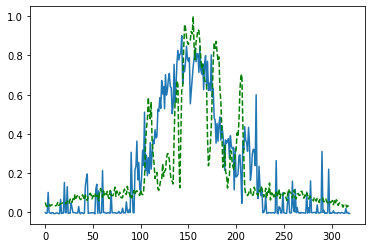

Time taken for epoch:  140.29504370689392
Epoch = [ 66/3000]  Iter = [   0/39480]  Loss = 0.2291 Avg Loss = 0.2291  Time = 0.0805s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 66/3000]  Iter = [ 100/39480]  Loss = 0.2318 Avg Loss = 0.2245  Time = 0.0037s
Epoch = [ 66/3000]  Iter = [ 200/39480]  Loss = 0.202 Avg Loss = 0.2174  Time = 0.0031s
Epoch = [ 66/3000]  Iter = [ 300/39480]  Loss = 0.2337 Avg Loss = 0.2223  Time = 0.0031s
Epoch = [ 66/3000]  Iter = [ 400/39480]  Loss = 0.2044 Avg Loss = 0.2215  Time = 0.0033s
Epoch = [ 66/3000]  Iter = [ 500/39480]  Loss = 0.227 Avg Loss = 0.2228  Time = 0.0032s
Epoch = [ 66/3000]  Iter = [ 600/39480]  Loss = 0.2411 Avg Loss = 0.2189  Time = 0.0033s
Epoch = [ 66/3000]  Iter = [ 700/39480]  Loss = 0.198 Avg Loss = 0.2156  Time = 0.0031s
Epoch = [ 66/3000]  Iter = [ 800/39480]  Loss = 0.2057 Avg Loss = 0.2186  Time = 0.0033s
Epoch = [ 66/3000]  Iter = [ 900/39480]  Loss = 0.2021 Avg Loss = 0.2179  Time = 0.0033s
Epoch = [ 66/3000]  Iter = [1000/39480]  Loss = 0.1829 Avg Loss = 0.2158  Time = 0.0033s
Epoch = [ 66/3000]  Iter = [1100/39480]  Loss = 0.1853 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 66/3000]  Iter

Epoch = [ 66/3000]  Iter = [9400/39480]  Loss = 0.2166 Avg Loss = 0.2154  Time = 0.0030s
Epoch = [ 66/3000]  Iter = [9500/39480]  Loss = 0.2142 Avg Loss = 0.2206  Time = 0.0032s
Epoch = [ 66/3000]  Iter = [9600/39480]  Loss = 0.2299 Avg Loss = 0.2178  Time = 0.0032s
Epoch = [ 66/3000]  Iter = [9700/39480]  Loss = 0.202 Avg Loss = 0.22  Time = 0.0030s
Epoch = [ 66/3000]  Iter = [9800/39480]  Loss = 0.2139 Avg Loss = 0.2182  Time = 0.0033s
Epoch = [ 66/3000]  Iter = [9900/39480]  Loss = 0.2041 Avg Loss = 0.2162  Time = 0.0032s
Epoch = [ 66/3000]  Iter = [10000/39480]  Loss = 0.2168 Avg Loss = 0.2156  Time = 0.0032s
Epoch = [ 66/3000]  Iter = [10100/39480]  Loss = 0.2036 Avg Loss = 0.2206  Time = 0.0030s
Epoch = [ 66/3000]  Iter = [10200/39480]  Loss = 0.2237 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [ 66/3000]  Iter = [10300/39480]  Loss = 0.2236 Avg Loss = 0.214  Time = 0.0032s
Epoch = [ 66/3000]  Iter = [10400/39480]  Loss = 0.2113 Avg Loss = 0.2151  Time = 0.0032s
Epoch = [ 66/3000]  

Epoch = [ 66/3000]  Iter = [18600/39480]  Loss = 0.2148 Avg Loss = 0.2182  Time = 0.0032s
Epoch = [ 66/3000]  Iter = [18700/39480]  Loss = 0.2051 Avg Loss = 0.2235  Time = 0.0033s
Epoch = [ 66/3000]  Iter = [18800/39480]  Loss = 0.2318 Avg Loss = 0.2218  Time = 0.0031s
Epoch = [ 66/3000]  Iter = [18900/39480]  Loss = 0.1981 Avg Loss = 0.2191  Time = 0.0031s
Epoch = [ 66/3000]  Iter = [19000/39480]  Loss = 0.2468 Avg Loss = 0.2187  Time = 0.0030s
Epoch = [ 66/3000]  Iter = [19100/39480]  Loss = 0.2049 Avg Loss = 0.2149  Time = 0.0031s
Epoch = [ 66/3000]  Iter = [19200/39480]  Loss = 0.192 Avg Loss = 0.2145  Time = 0.0031s
Epoch = [ 66/3000]  Iter = [19300/39480]  Loss = 0.1888 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 66/3000]  Iter = [19400/39480]  Loss = 0.2652 Avg Loss = 0.2201  Time = 0.0029s
Epoch = [ 66/3000]  Iter = [19500/39480]  Loss = 0.2069 Avg Loss = 0.2185  Time = 0.0030s
Epoch = [ 66/3000]  Iter = [19600/39480]  Loss = 0.2343 Avg Loss = 0.2232  Time = 0.0030s
Epoch = [ 6

Epoch = [ 66/3000]  Iter = [27800/39480]  Loss = 0.2153 Avg Loss = 0.2154  Time = 0.0030s
Epoch = [ 66/3000]  Iter = [27900/39480]  Loss = 0.1938 Avg Loss = 0.2151  Time = 0.0029s
Epoch = [ 66/3000]  Iter = [28000/39480]  Loss = 0.2002 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 66/3000]  Iter = [28100/39480]  Loss = 0.1961 Avg Loss = 0.2211  Time = 0.0030s
Epoch = [ 66/3000]  Iter = [28200/39480]  Loss = 0.2275 Avg Loss = 0.2198  Time = 0.0031s
Epoch = [ 66/3000]  Iter = [28300/39480]  Loss = 0.2039 Avg Loss = 0.2157  Time = 0.0034s
Epoch = [ 66/3000]  Iter = [28400/39480]  Loss = 0.2122 Avg Loss = 0.2207  Time = 0.0031s
Epoch = [ 66/3000]  Iter = [28500/39480]  Loss = 0.2069 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [ 66/3000]  Iter = [28600/39480]  Loss = 0.2328 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 66/3000]  Iter = [28700/39480]  Loss = 0.1925 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 66/3000]  Iter = [28800/39480]  Loss = 0.2704 Avg Loss = 0.2159  Time = 0.0033s
Epoch = [ 

Epoch = [ 66/3000]  Iter = [37000/39480]  Loss = 0.2076 Avg Loss = 0.2244  Time = 0.0031s
Epoch = [ 66/3000]  Iter = [37100/39480]  Loss = 0.2144 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 66/3000]  Iter = [37200/39480]  Loss = 0.2113 Avg Loss = 0.22  Time = 0.0030s
Epoch = [ 66/3000]  Iter = [37300/39480]  Loss = 0.2265 Avg Loss = 0.2162  Time = 0.0030s
Epoch = [ 66/3000]  Iter = [37400/39480]  Loss = 0.2059 Avg Loss = 0.2199  Time = 0.0030s
Epoch = [ 66/3000]  Iter = [37500/39480]  Loss = 0.2469 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 66/3000]  Iter = [37600/39480]  Loss = 0.1995 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 66/3000]  Iter = [37700/39480]  Loss = 0.1874 Avg Loss = 0.2211  Time = 0.0029s
Epoch = [ 66/3000]  Iter = [37800/39480]  Loss = 0.2195 Avg Loss = 0.2142  Time = 0.0029s
Epoch = [ 66/3000]  Iter = [37900/39480]  Loss = 0.2478 Avg Loss = 0.2154  Time = 0.0031s
Epoch = [ 66/3000]  Iter = [38000/39480]  Loss = 0.219 Avg Loss = 0.2172  Time = 0.0030s
Epoch = [ 66/3

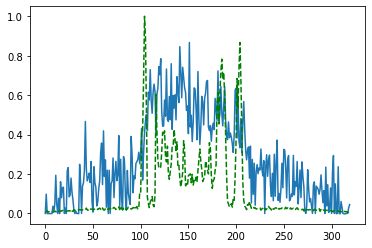

Time taken for epoch:  145.3987250328064
Epoch = [ 67/3000]  Iter = [   0/39480]  Loss = 0.2522 Avg Loss = 0.2522  Time = 0.0754s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 67/3000]  Iter = [ 100/39480]  Loss = 0.2027 Avg Loss = 0.2321  Time = 0.0029s
Epoch = [ 67/3000]  Iter = [ 200/39480]  Loss = 0.2064 Avg Loss = 0.2238  Time = 0.0032s
Epoch = [ 67/3000]  Iter = [ 300/39480]  Loss = 0.2312 Avg Loss = 0.2179  Time = 0.0032s
Epoch = [ 67/3000]  Iter = [ 400/39480]  Loss = 0.187 Avg Loss = 0.2148  Time = 0.0032s
Epoch = [ 67/3000]  Iter = [ 500/39480]  Loss = 0.2189 Avg Loss = 0.2178  Time = 0.0030s
Epoch = [ 67/3000]  Iter = [ 600/39480]  Loss = 0.2305 Avg Loss = 0.2204  Time = 0.0030s
Epoch = [ 67/3000]  Iter = [ 700/39480]  Loss = 0.2289 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [ 67/3000]  Iter = [ 800/39480]  Loss = 0.2912 Avg Loss = 0.2171  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [ 900/39480]  Loss = 0.1976 Avg Loss = 0.2208  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [1000/39480]  Loss = 0.1803 Avg Loss = 0.2162  Time = 0.0033s
Epoch = [ 67/3000]  Iter = [1100/39480]  Loss = 0.2364 Avg Loss = 0.2158  Time = 0.0033s
Epoch = [ 67/3000]  It

Epoch = [ 67/3000]  Iter = [9400/39480]  Loss = 0.2136 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [ 67/3000]  Iter = [9500/39480]  Loss = 0.2119 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 67/3000]  Iter = [9600/39480]  Loss = 0.2501 Avg Loss = 0.2188  Time = 0.0029s
Epoch = [ 67/3000]  Iter = [9700/39480]  Loss = 0.2043 Avg Loss = 0.2159  Time = 0.0029s
Epoch = [ 67/3000]  Iter = [9800/39480]  Loss = 0.2125 Avg Loss = 0.2144  Time = 0.0033s
Epoch = [ 67/3000]  Iter = [9900/39480]  Loss = 0.2092 Avg Loss = 0.2161  Time = 0.0033s
Epoch = [ 67/3000]  Iter = [10000/39480]  Loss = 0.2086 Avg Loss = 0.2189  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [10100/39480]  Loss = 0.2259 Avg Loss = 0.2184  Time = 0.0030s
Epoch = [ 67/3000]  Iter = [10200/39480]  Loss = 0.1956 Avg Loss = 0.2162  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [10300/39480]  Loss = 0.2035 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [10400/39480]  Loss = 0.2202 Avg Loss = 0.2204  Time = 0.0031s
Epoch = [ 67/3000

Epoch = [ 67/3000]  Iter = [18600/39480]  Loss = 0.2278 Avg Loss = 0.2174  Time = 0.0032s
Epoch = [ 67/3000]  Iter = [18700/39480]  Loss = 0.2286 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [18800/39480]  Loss = 0.1979 Avg Loss = 0.2167  Time = 0.0033s
Epoch = [ 67/3000]  Iter = [18900/39480]  Loss = 0.2098 Avg Loss = 0.212  Time = 0.0029s
Epoch = [ 67/3000]  Iter = [19000/39480]  Loss = 0.2253 Avg Loss = 0.2147  Time = 0.0033s
Epoch = [ 67/3000]  Iter = [19100/39480]  Loss = 0.2146 Avg Loss = 0.2233  Time = 0.0035s
Epoch = [ 67/3000]  Iter = [19200/39480]  Loss = 0.1902 Avg Loss = 0.2207  Time = 0.0037s
Epoch = [ 67/3000]  Iter = [19300/39480]  Loss = 0.1894 Avg Loss = 0.2172  Time = 0.0036s
Epoch = [ 67/3000]  Iter = [19400/39480]  Loss = 0.2155 Avg Loss = 0.2185  Time = 0.0037s
Epoch = [ 67/3000]  Iter = [19500/39480]  Loss = 0.2484 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 67/3000]  Iter = [19600/39480]  Loss = 0.1879 Avg Loss = 0.2171  Time = 0.0030s
Epoch = [ 6

Epoch = [ 67/3000]  Iter = [27800/39480]  Loss = 0.2102 Avg Loss = 0.2196  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [27900/39480]  Loss = 0.2229 Avg Loss = 0.2198  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [28000/39480]  Loss = 0.2254 Avg Loss = 0.2235  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [28100/39480]  Loss = 0.201 Avg Loss = 0.2195  Time = 0.0033s
Epoch = [ 67/3000]  Iter = [28200/39480]  Loss = 0.2094 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [ 67/3000]  Iter = [28300/39480]  Loss = 0.2292 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 67/3000]  Iter = [28400/39480]  Loss = 0.2223 Avg Loss = 0.2175  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [28500/39480]  Loss = 0.2183 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [28600/39480]  Loss = 0.2004 Avg Loss = 0.22  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [28700/39480]  Loss = 0.2461 Avg Loss = 0.2185  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [28800/39480]  Loss = 0.219 Avg Loss = 0.2208  Time = 0.0031s
Epoch = [ 67/30

Epoch = [ 67/3000]  Iter = [37000/39480]  Loss = 0.2043 Avg Loss = 0.2124  Time = 0.0030s
Epoch = [ 67/3000]  Iter = [37100/39480]  Loss = 0.2526 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [37200/39480]  Loss = 0.1888 Avg Loss = 0.2159  Time = 0.0030s
Epoch = [ 67/3000]  Iter = [37300/39480]  Loss = 0.2059 Avg Loss = 0.215  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [37400/39480]  Loss = 0.268 Avg Loss = 0.2185  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [37500/39480]  Loss = 0.1785 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 67/3000]  Iter = [37600/39480]  Loss = 0.2067 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 67/3000]  Iter = [37700/39480]  Loss = 0.2724 Avg Loss = 0.2224  Time = 0.0029s
Epoch = [ 67/3000]  Iter = [37800/39480]  Loss = 0.2002 Avg Loss = 0.2183  Time = 0.0030s
Epoch = [ 67/3000]  Iter = [37900/39480]  Loss = 0.1971 Avg Loss = 0.2178  Time = 0.0031s
Epoch = [ 67/3000]  Iter = [38000/39480]  Loss = 0.233 Avg Loss = 0.22  Time = 0.0029s
Epoch = [ 67/30

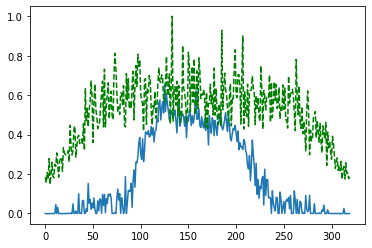

Time taken for epoch:  144.26956343650818
Epoch = [ 68/3000]  Iter = [   0/39480]  Loss = 0.213 Avg Loss = 0.213  Time = 0.0748s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 68/3000]  Iter = [ 100/39480]  Loss = 0.2041 Avg Loss = 0.2139  Time = 0.0029s
Epoch = [ 68/3000]  Iter = [ 200/39480]  Loss = 0.2098 Avg Loss = 0.2176  Time = 0.0032s
Epoch = [ 68/3000]  Iter = [ 300/39480]  Loss = 0.2327 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [ 400/39480]  Loss = 0.2122 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [ 500/39480]  Loss = 0.2007 Avg Loss = 0.2186  Time = 0.0033s
Epoch = [ 68/3000]  Iter = [ 600/39480]  Loss = 0.2769 Avg Loss = 0.2174  Time = 0.0032s
Epoch = [ 68/3000]  Iter = [ 700/39480]  Loss = 0.2091 Avg Loss = 0.2161  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [ 800/39480]  Loss = 0.2156 Avg Loss = 0.2176  Time = 0.0030s
Epoch = [ 68/3000]  Iter = [ 900/39480]  Loss = 0.2348 Avg Loss = 0.2203  Time = 0.0030s
Epoch = [ 68/3000]  Iter = [1000/39480]  Loss = 0.1863 Avg Loss = 0.22  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [1100/39480]  Loss = 0.246 Avg Loss = 0.2252  Time = 0.0031s
Epoch = [ 68/3000]  Iter

Epoch = [ 68/3000]  Iter = [9400/39480]  Loss = 0.2172 Avg Loss = 0.2161  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [9500/39480]  Loss = 0.2137 Avg Loss = 0.2178  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [9600/39480]  Loss = 0.2029 Avg Loss = 0.222  Time = 0.0029s
Epoch = [ 68/3000]  Iter = [9700/39480]  Loss = 0.2038 Avg Loss = 0.218  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [9800/39480]  Loss = 0.2243 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [9900/39480]  Loss = 0.1946 Avg Loss = 0.2203  Time = 0.0036s
Epoch = [ 68/3000]  Iter = [10000/39480]  Loss = 0.2315 Avg Loss = 0.219  Time = 0.0030s
Epoch = [ 68/3000]  Iter = [10100/39480]  Loss = 0.1945 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [10200/39480]  Loss = 0.1881 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [10300/39480]  Loss = 0.2411 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 68/3000]  Iter = [10400/39480]  Loss = 0.1853 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 68/3000] 

Epoch = [ 68/3000]  Iter = [18600/39480]  Loss = 0.2437 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 68/3000]  Iter = [18700/39480]  Loss = 0.2242 Avg Loss = 0.2208  Time = 0.0030s
Epoch = [ 68/3000]  Iter = [18800/39480]  Loss = 0.2277 Avg Loss = 0.2197  Time = 0.0030s
Epoch = [ 68/3000]  Iter = [18900/39480]  Loss = 0.1887 Avg Loss = 0.2162  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [19000/39480]  Loss = 0.2495 Avg Loss = 0.2168  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [19100/39480]  Loss = 0.2071 Avg Loss = 0.2203  Time = 0.0029s
Epoch = [ 68/3000]  Iter = [19200/39480]  Loss = 0.2055 Avg Loss = 0.2198  Time = 0.0032s
Epoch = [ 68/3000]  Iter = [19300/39480]  Loss = 0.261 Avg Loss = 0.2221  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [19400/39480]  Loss = 0.1969 Avg Loss = 0.215  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [19500/39480]  Loss = 0.2144 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [19600/39480]  Loss = 0.23 Avg Loss = 0.2195  Time = 0.0039s
Epoch = [ 68/3

Epoch = [ 68/3000]  Iter = [27800/39480]  Loss = 0.2143 Avg Loss = 0.2162  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [27900/39480]  Loss = 0.1867 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 68/3000]  Iter = [28000/39480]  Loss = 0.2404 Avg Loss = 0.2229  Time = 0.0033s
Epoch = [ 68/3000]  Iter = [28100/39480]  Loss = 0.1936 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 68/3000]  Iter = [28200/39480]  Loss = 0.1821 Avg Loss = 0.2184  Time = 0.0030s
Epoch = [ 68/3000]  Iter = [28300/39480]  Loss = 0.1995 Avg Loss = 0.2173  Time = 0.0033s
Epoch = [ 68/3000]  Iter = [28400/39480]  Loss = 0.2815 Avg Loss = 0.221  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [28500/39480]  Loss = 0.2194 Avg Loss = 0.2211  Time = 0.0030s
Epoch = [ 68/3000]  Iter = [28600/39480]  Loss = 0.2232 Avg Loss = 0.2167  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [28700/39480]  Loss = 0.238 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [28800/39480]  Loss = 0.1918 Avg Loss = 0.2153  Time = 0.0031s
Epoch = [ 68/

Epoch = [ 68/3000]  Iter = [37000/39480]  Loss = 0.1942 Avg Loss = 0.2212  Time = 0.0029s
Epoch = [ 68/3000]  Iter = [37100/39480]  Loss = 0.229 Avg Loss = 0.2185  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [37200/39480]  Loss = 0.1976 Avg Loss = 0.2182  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [37300/39480]  Loss = 0.1951 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [37400/39480]  Loss = 0.2262 Avg Loss = 0.2162  Time = 0.0031s
Epoch = [ 68/3000]  Iter = [37500/39480]  Loss = 0.1908 Avg Loss = 0.2157  Time = 0.0030s
Epoch = [ 68/3000]  Iter = [37600/39480]  Loss = 0.2594 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [ 68/3000]  Iter = [37700/39480]  Loss = 0.2133 Avg Loss = 0.2199  Time = 0.0030s
Epoch = [ 68/3000]  Iter = [37800/39480]  Loss = 0.2425 Avg Loss = 0.2174  Time = 0.0029s
Epoch = [ 68/3000]  Iter = [37900/39480]  Loss = 0.2347 Avg Loss = 0.2176  Time = 0.0030s
Epoch = [ 68/3000]  Iter = [38000/39480]  Loss = 0.2045 Avg Loss = 0.2154  Time = 0.0029s
Epoch = [ 6

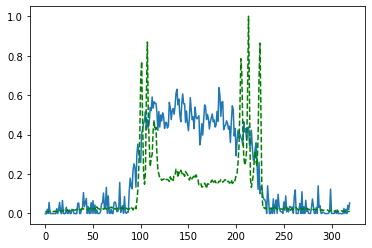

Time taken for epoch:  147.05169034004211
Epoch = [ 69/3000]  Iter = [   0/39480]  Loss = 0.2299 Avg Loss = 0.2299  Time = 0.0780s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 69/3000]  Iter = [ 100/39480]  Loss = 0.2189 Avg Loss = 0.2223  Time = 0.0032s
Epoch = [ 69/3000]  Iter = [ 200/39480]  Loss = 0.2345 Avg Loss = 0.2202  Time = 0.0034s
Epoch = [ 69/3000]  Iter = [ 300/39480]  Loss = 0.2551 Avg Loss = 0.2197  Time = 0.0030s
Epoch = [ 69/3000]  Iter = [ 400/39480]  Loss = 0.2509 Avg Loss = 0.2206  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [ 500/39480]  Loss = 0.2503 Avg Loss = 0.2181  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [ 600/39480]  Loss = 0.2176 Avg Loss = 0.2162  Time = 0.0033s
Epoch = [ 69/3000]  Iter = [ 700/39480]  Loss = 0.2297 Avg Loss = 0.2141  Time = 0.0030s
Epoch = [ 69/3000]  Iter = [ 800/39480]  Loss = 0.232 Avg Loss = 0.2181  Time = 0.0033s
Epoch = [ 69/3000]  Iter = [ 900/39480]  Loss = 0.2091 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [1000/39480]  Loss = 0.229 Avg Loss = 0.2164  Time = 0.0030s
Epoch = [ 69/3000]  Iter = [1100/39480]  Loss = 0.2131 Avg Loss = 0.2151  Time = 0.0033s
Epoch = [ 69/3000]  Ite

Epoch = [ 69/3000]  Iter = [9400/39480]  Loss = 0.2237 Avg Loss = 0.2235  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [9500/39480]  Loss = 0.1959 Avg Loss = 0.2201  Time = 0.0028s
Epoch = [ 69/3000]  Iter = [9600/39480]  Loss = 0.2163 Avg Loss = 0.2184  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [9700/39480]  Loss = 0.1875 Avg Loss = 0.2172  Time = 0.0030s
Epoch = [ 69/3000]  Iter = [9800/39480]  Loss = 0.1905 Avg Loss = 0.2144  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [9900/39480]  Loss = 0.2434 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [10000/39480]  Loss = 0.208 Avg Loss = 0.2174  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [10100/39480]  Loss = 0.2238 Avg Loss = 0.2199  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [10200/39480]  Loss = 0.2274 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [10300/39480]  Loss = 0.2241 Avg Loss = 0.2228  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [10400/39480]  Loss = 0.2256 Avg Loss = 0.2172  Time = 0.0033s
Epoch = [ 69/3000]

Epoch = [ 69/3000]  Iter = [18600/39480]  Loss = 0.1924 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [18700/39480]  Loss = 0.2078 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [18800/39480]  Loss = 0.2007 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [18900/39480]  Loss = 0.2385 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [19000/39480]  Loss = 0.208 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [19100/39480]  Loss = 0.2116 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [19200/39480]  Loss = 0.1894 Avg Loss = 0.2176  Time = 0.0030s
Epoch = [ 69/3000]  Iter = [19300/39480]  Loss = 0.2125 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 69/3000]  Iter = [19400/39480]  Loss = 0.1679 Avg Loss = 0.2182  Time = 0.0031s
Epoch = [ 69/3000]  Iter = [19500/39480]  Loss = 0.2236 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 69/3000]  Iter = [19600/39480]  Loss = 0.177 Avg Loss = 0.2136  Time = 0.0033s
Epoch = [ 69

Epoch = [ 69/3000]  Iter = [27800/39480]  Loss = 0.2389 Avg Loss = 0.2166  Time = 0.0033s
Epoch = [ 69/3000]  Iter = [27900/39480]  Loss = 0.2726 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 69/3000]  Iter = [28000/39480]  Loss = 0.2292 Avg Loss = 0.2219  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [28100/39480]  Loss = 0.2283 Avg Loss = 0.2207  Time = 0.0033s
Epoch = [ 69/3000]  Iter = [28200/39480]  Loss = 0.2166 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [28300/39480]  Loss = 0.2123 Avg Loss = 0.2164  Time = 0.0030s
Epoch = [ 69/3000]  Iter = [28400/39480]  Loss = 0.2113 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [28500/39480]  Loss = 0.2329 Avg Loss = 0.2229  Time = 0.0039s
Epoch = [ 69/3000]  Iter = [28600/39480]  Loss = 0.1975 Avg Loss = 0.2208  Time = 0.0030s
Epoch = [ 69/3000]  Iter = [28700/39480]  Loss = 0.2775 Avg Loss = 0.221  Time = 0.0028s
Epoch = [ 69/3000]  Iter = [28800/39480]  Loss = 0.1904 Avg Loss = 0.2144  Time = 0.0034s
Epoch = [ 69

Epoch = [ 69/3000]  Iter = [37000/39480]  Loss = 0.179 Avg Loss = 0.2186  Time = 0.0034s
Epoch = [ 69/3000]  Iter = [37100/39480]  Loss = 0.2396 Avg Loss = 0.2198  Time = 0.0031s
Epoch = [ 69/3000]  Iter = [37200/39480]  Loss = 0.2303 Avg Loss = 0.2159  Time = 0.0030s
Epoch = [ 69/3000]  Iter = [37300/39480]  Loss = 0.2308 Avg Loss = 0.2149  Time = 0.0030s
Epoch = [ 69/3000]  Iter = [37400/39480]  Loss = 0.2896 Avg Loss = 0.2161  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [37500/39480]  Loss = 0.2451 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 69/3000]  Iter = [37600/39480]  Loss = 0.2131 Avg Loss = 0.2184  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [37700/39480]  Loss = 0.2264 Avg Loss = 0.2148  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [37800/39480]  Loss = 0.1954 Avg Loss = 0.2163  Time = 0.0027s
Epoch = [ 69/3000]  Iter = [37900/39480]  Loss = 0.2341 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 69/3000]  Iter = [38000/39480]  Loss = 0.1854 Avg Loss = 0.2199  Time = 0.0029s
Epoch = [ 6

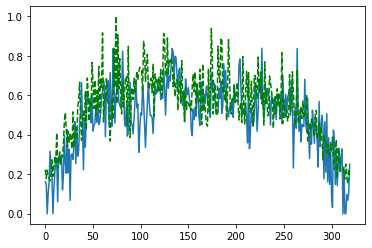

Time taken for epoch:  142.60318613052368
Epoch = [ 70/3000]  Iter = [   0/39480]  Loss = 0.2217 Avg Loss = 0.2217  Time = 0.1110s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 70/3000]  Iter = [ 100/39480]  Loss = 0.2048 Avg Loss = 0.2211  Time = 0.0033s
Epoch = [ 70/3000]  Iter = [ 200/39480]  Loss = 0.218 Avg Loss = 0.2197  Time = 0.0031s
Epoch = [ 70/3000]  Iter = [ 300/39480]  Loss = 0.2036 Avg Loss = 0.2187  Time = 0.0028s
Epoch = [ 70/3000]  Iter = [ 400/39480]  Loss = 0.2242 Avg Loss = 0.2145  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [ 500/39480]  Loss = 0.2113 Avg Loss = 0.2144  Time = 0.0030s
Epoch = [ 70/3000]  Iter = [ 600/39480]  Loss = 0.2188 Avg Loss = 0.2163  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [ 700/39480]  Loss = 0.2609 Avg Loss = 0.2148  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [ 800/39480]  Loss = 0.2041 Avg Loss = 0.2148  Time = 0.0033s
Epoch = [ 70/3000]  Iter = [ 900/39480]  Loss = 0.2187 Avg Loss = 0.2174  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [1000/39480]  Loss = 0.1974 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [1100/39480]  Loss = 0.1792 Avg Loss = 0.2209  Time = 0.0030s
Epoch = [ 70/3000]  It

Epoch = [ 70/3000]  Iter = [9400/39480]  Loss = 0.2214 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [9500/39480]  Loss = 0.1934 Avg Loss = 0.2181  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [9600/39480]  Loss = 0.1949 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 70/3000]  Iter = [9700/39480]  Loss = 0.1939 Avg Loss = 0.2197  Time = 0.0031s
Epoch = [ 70/3000]  Iter = [9800/39480]  Loss = 0.2327 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 70/3000]  Iter = [9900/39480]  Loss = 0.2252 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [10000/39480]  Loss = 0.2481 Avg Loss = 0.2201  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [10100/39480]  Loss = 0.2192 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 70/3000]  Iter = [10200/39480]  Loss = 0.2361 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [10300/39480]  Loss = 0.231 Avg Loss = 0.2159  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [10400/39480]  Loss = 0.1973 Avg Loss = 0.2186  Time = 0.0031s
Epoch = [ 70/3000]

Epoch = [ 70/3000]  Iter = [18600/39480]  Loss = 0.2161 Avg Loss = 0.218  Time = 0.0036s
Epoch = [ 70/3000]  Iter = [18700/39480]  Loss = 0.2101 Avg Loss = 0.2214  Time = 0.0034s
Epoch = [ 70/3000]  Iter = [18800/39480]  Loss = 0.1957 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [18900/39480]  Loss = 0.2002 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [19000/39480]  Loss = 0.2232 Avg Loss = 0.216  Time = 0.0028s
Epoch = [ 70/3000]  Iter = [19100/39480]  Loss = 0.2263 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [19200/39480]  Loss = 0.2688 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [19300/39480]  Loss = 0.1986 Avg Loss = 0.2195  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [19400/39480]  Loss = 0.211 Avg Loss = 0.2175  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [19500/39480]  Loss = 0.2288 Avg Loss = 0.2191  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [19600/39480]  Loss = 0.2162 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 70/

Epoch = [ 70/3000]  Iter = [27800/39480]  Loss = 0.1634 Avg Loss = 0.2187  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [27900/39480]  Loss = 0.2102 Avg Loss = 0.2143  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [28000/39480]  Loss = 0.2035 Avg Loss = 0.2185  Time = 0.0033s
Epoch = [ 70/3000]  Iter = [28100/39480]  Loss = 0.249 Avg Loss = 0.2197  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [28200/39480]  Loss = 0.2284 Avg Loss = 0.2187  Time = 0.0033s
Epoch = [ 70/3000]  Iter = [28300/39480]  Loss = 0.1881 Avg Loss = 0.2175  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [28400/39480]  Loss = 0.2098 Avg Loss = 0.2165  Time = 0.0028s
Epoch = [ 70/3000]  Iter = [28500/39480]  Loss = 0.2235 Avg Loss = 0.22  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [28600/39480]  Loss = 0.2174 Avg Loss = 0.2184  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [28700/39480]  Loss = 0.2839 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [28800/39480]  Loss = 0.2178 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 70/3

Epoch = [ 70/3000]  Iter = [37000/39480]  Loss = 0.3424 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [37100/39480]  Loss = 0.2614 Avg Loss = 0.2207  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [37200/39480]  Loss = 0.1926 Avg Loss = 0.2213  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [37300/39480]  Loss = 0.2133 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [37400/39480]  Loss = 0.2084 Avg Loss = 0.2147  Time = 0.0030s
Epoch = [ 70/3000]  Iter = [37500/39480]  Loss = 0.2066 Avg Loss = 0.2172  Time = 0.0030s
Epoch = [ 70/3000]  Iter = [37600/39480]  Loss = 0.2147 Avg Loss = 0.215  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [37700/39480]  Loss = 0.211 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [37800/39480]  Loss = 0.2016 Avg Loss = 0.2147  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [37900/39480]  Loss = 0.233 Avg Loss = 0.2219  Time = 0.0029s
Epoch = [ 70/3000]  Iter = [38000/39480]  Loss = 0.216 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 70/3

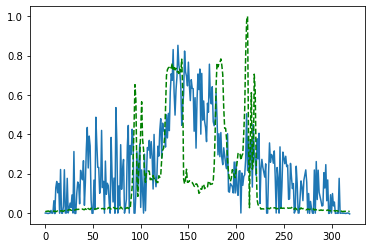

Time taken for epoch:  141.77598071098328
Epoch = [ 71/3000]  Iter = [   0/39480]  Loss = 0.235 Avg Loss = 0.235  Time = 0.0880s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 71/3000]  Iter = [ 100/39480]  Loss = 0.2437 Avg Loss = 0.2214  Time = 0.0030s
Epoch = [ 71/3000]  Iter = [ 200/39480]  Loss = 0.2205 Avg Loss = 0.2238  Time = 0.0035s
Epoch = [ 71/3000]  Iter = [ 300/39480]  Loss = 0.2078 Avg Loss = 0.219  Time = 0.0033s
Epoch = [ 71/3000]  Iter = [ 400/39480]  Loss = 0.2402 Avg Loss = 0.2197  Time = 0.0030s
Epoch = [ 71/3000]  Iter = [ 500/39480]  Loss = 0.2102 Avg Loss = 0.2197  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [ 600/39480]  Loss = 0.2432 Avg Loss = 0.2175  Time = 0.0030s
Epoch = [ 71/3000]  Iter = [ 700/39480]  Loss = 0.2746 Avg Loss = 0.2182  Time = 0.0034s
Epoch = [ 71/3000]  Iter = [ 800/39480]  Loss = 0.2498 Avg Loss = 0.2204  Time = 0.0030s
Epoch = [ 71/3000]  Iter = [ 900/39480]  Loss = 0.2151 Avg Loss = 0.2201  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [1000/39480]  Loss = 0.192 Avg Loss = 0.2151  Time = 0.0031s
Epoch = [ 71/3000]  Iter = [1100/39480]  Loss = 0.1907 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 71/3000]  Ite

Epoch = [ 71/3000]  Iter = [9400/39480]  Loss = 0.2644 Avg Loss = 0.2194  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [9500/39480]  Loss = 0.1952 Avg Loss = 0.2184  Time = 0.0030s
Epoch = [ 71/3000]  Iter = [9600/39480]  Loss = 0.1837 Avg Loss = 0.2141  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [9700/39480]  Loss = 0.215 Avg Loss = 0.2143  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [9800/39480]  Loss = 0.2505 Avg Loss = 0.2168  Time = 0.0028s
Epoch = [ 71/3000]  Iter = [9900/39480]  Loss = 0.2045 Avg Loss = 0.215  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [10000/39480]  Loss = 0.2357 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [10100/39480]  Loss = 0.2309 Avg Loss = 0.217  Time = 0.0022s
Epoch = [ 71/3000]  Iter = [10200/39480]  Loss = 0.2503 Avg Loss = 0.223  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [10300/39480]  Loss = 0.2114 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 71/3000]  Iter = [10400/39480]  Loss = 0.1899 Avg Loss = 0.2171  Time = 0.0032s
Epoch = [ 71/3000]  

Epoch = [ 71/3000]  Iter = [18600/39480]  Loss = 0.21 Avg Loss = 0.2132  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [18700/39480]  Loss = 0.2151 Avg Loss = 0.2153  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [18800/39480]  Loss = 0.218 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [18900/39480]  Loss = 0.2248 Avg Loss = 0.2155  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [19000/39480]  Loss = 0.2577 Avg Loss = 0.2193  Time = 0.0033s
Epoch = [ 71/3000]  Iter = [19100/39480]  Loss = 0.197 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 71/3000]  Iter = [19200/39480]  Loss = 0.1794 Avg Loss = 0.2218  Time = 0.0030s
Epoch = [ 71/3000]  Iter = [19300/39480]  Loss = 0.2372 Avg Loss = 0.2181  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [19400/39480]  Loss = 0.2404 Avg Loss = 0.2171  Time = 0.0032s
Epoch = [ 71/3000]  Iter = [19500/39480]  Loss = 0.2461 Avg Loss = 0.2198  Time = 0.0033s
Epoch = [ 71/3000]  Iter = [19600/39480]  Loss = 0.1952 Avg Loss = 0.2188  Time = 0.0034s
Epoch = [ 71/30

Epoch = [ 71/3000]  Iter = [27800/39480]  Loss = 0.1887 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [27900/39480]  Loss = 0.2367 Avg Loss = 0.2196  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [28000/39480]  Loss = 0.1821 Avg Loss = 0.2232  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [28100/39480]  Loss = 0.1867 Avg Loss = 0.2191  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [28200/39480]  Loss = 0.1871 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [28300/39480]  Loss = 0.2279 Avg Loss = 0.2196  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [28400/39480]  Loss = 0.2389 Avg Loss = 0.2188  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [28500/39480]  Loss = 0.2365 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [28600/39480]  Loss = 0.2207 Avg Loss = 0.2216  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [28700/39480]  Loss = 0.2398 Avg Loss = 0.2149  Time = 0.0030s
Epoch = [ 71/3000]  Iter = [28800/39480]  Loss = 0.2186 Avg Loss = 0.2155  Time = 0.0027s
Epoch = [ 7

Epoch = [ 71/3000]  Iter = [37000/39480]  Loss = 0.218 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [37100/39480]  Loss = 0.2109 Avg Loss = 0.2187  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [37200/39480]  Loss = 0.2046 Avg Loss = 0.2156  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [37300/39480]  Loss = 0.2217 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [37400/39480]  Loss = 0.272 Avg Loss = 0.2191  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [37500/39480]  Loss = 0.2158 Avg Loss = 0.2196  Time = 0.0034s
Epoch = [ 71/3000]  Iter = [37600/39480]  Loss = 0.2181 Avg Loss = 0.2219  Time = 0.0030s
Epoch = [ 71/3000]  Iter = [37700/39480]  Loss = 0.2044 Avg Loss = 0.2211  Time = 0.0030s
Epoch = [ 71/3000]  Iter = [37800/39480]  Loss = 0.2212 Avg Loss = 0.2188  Time = 0.0029s
Epoch = [ 71/3000]  Iter = [37900/39480]  Loss = 0.2142 Avg Loss = 0.2181  Time = 0.0030s
Epoch = [ 71/3000]  Iter = [38000/39480]  Loss = 0.2095 Avg Loss = 0.2156  Time = 0.0030s
Epoch = [ 71

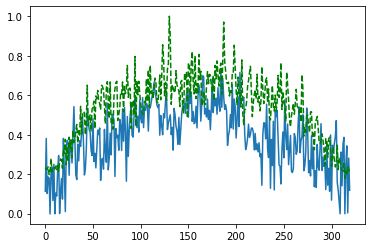

Time taken for epoch:  142.85697531700134
Epoch = [ 72/3000]  Iter = [   0/39480]  Loss = 0.2379 Avg Loss = 0.2379  Time = 0.0944s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 72/3000]  Iter = [ 100/39480]  Loss = 0.2038 Avg Loss = 0.2216  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [ 200/39480]  Loss = 0.1965 Avg Loss = 0.2181  Time = 0.0030s
Epoch = [ 72/3000]  Iter = [ 300/39480]  Loss = 0.2104 Avg Loss = 0.2206  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [ 400/39480]  Loss = 0.2057 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [ 500/39480]  Loss = 0.1649 Avg Loss = 0.2189  Time = 0.0032s
Epoch = [ 72/3000]  Iter = [ 600/39480]  Loss = 0.2007 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [ 72/3000]  Iter = [ 700/39480]  Loss = 0.2329 Avg Loss = 0.2191  Time = 0.0041s
Epoch = [ 72/3000]  Iter = [ 800/39480]  Loss = 0.1814 Avg Loss = 0.2187  Time = 0.0031s
Epoch = [ 72/3000]  Iter = [ 900/39480]  Loss = 0.2222 Avg Loss = 0.2197  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [1000/39480]  Loss = 0.1902 Avg Loss = 0.2143  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [1100/39480]  Loss = 0.205 Avg Loss = 0.2197  Time = 0.0029s
Epoch = [ 72/3000]  It

Epoch = [ 72/3000]  Iter = [9400/39480]  Loss = 0.2071 Avg Loss = 0.215  Time = 0.0034s
Epoch = [ 72/3000]  Iter = [9500/39480]  Loss = 0.2665 Avg Loss = 0.2174  Time = 0.0035s
Epoch = [ 72/3000]  Iter = [9600/39480]  Loss = 0.2485 Avg Loss = 0.2144  Time = 0.0035s
Epoch = [ 72/3000]  Iter = [9700/39480]  Loss = 0.1965 Avg Loss = 0.2182  Time = 0.0031s
Epoch = [ 72/3000]  Iter = [9800/39480]  Loss = 0.2085 Avg Loss = 0.2203  Time = 0.0035s
Epoch = [ 72/3000]  Iter = [9900/39480]  Loss = 0.1793 Avg Loss = 0.2207  Time = 0.0033s
Epoch = [ 72/3000]  Iter = [10000/39480]  Loss = 0.2615 Avg Loss = 0.2234  Time = 0.0032s
Epoch = [ 72/3000]  Iter = [10100/39480]  Loss = 0.2104 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 72/3000]  Iter = [10200/39480]  Loss = 0.2297 Avg Loss = 0.2184  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [10300/39480]  Loss = 0.2577 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 72/3000]  Iter = [10400/39480]  Loss = 0.2324 Avg Loss = 0.2183  Time = 0.0033s
Epoch = [ 72/3000

Epoch = [ 72/3000]  Iter = [18600/39480]  Loss = 0.2045 Avg Loss = 0.2168  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [18700/39480]  Loss = 0.1982 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [18800/39480]  Loss = 0.2123 Avg Loss = 0.2164  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [18900/39480]  Loss = 0.2407 Avg Loss = 0.2213  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [19000/39480]  Loss = 0.1934 Avg Loss = 0.216  Time = 0.0032s
Epoch = [ 72/3000]  Iter = [19100/39480]  Loss = 0.19 Avg Loss = 0.2189  Time = 0.0026s
Epoch = [ 72/3000]  Iter = [19200/39480]  Loss = 0.1773 Avg Loss = 0.2169  Time = 0.0028s
Epoch = [ 72/3000]  Iter = [19300/39480]  Loss = 0.1721 Avg Loss = 0.2179  Time = 0.0028s
Epoch = [ 72/3000]  Iter = [19400/39480]  Loss = 0.1966 Avg Loss = 0.2157  Time = 0.0030s
Epoch = [ 72/3000]  Iter = [19500/39480]  Loss = 0.2181 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 72/3000]  Iter = [19600/39480]  Loss = 0.2416 Avg Loss = 0.2191  Time = 0.0031s
Epoch = [ 72/

Epoch = [ 72/3000]  Iter = [27800/39480]  Loss = 0.2373 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [27900/39480]  Loss = 0.2008 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [28000/39480]  Loss = 0.1639 Avg Loss = 0.215  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [28100/39480]  Loss = 0.2107 Avg Loss = 0.2151  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [28200/39480]  Loss = 0.2351 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [28300/39480]  Loss = 0.2801 Avg Loss = 0.2223  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [28400/39480]  Loss = 0.2008 Avg Loss = 0.22  Time = 0.0030s
Epoch = [ 72/3000]  Iter = [28500/39480]  Loss = 0.2334 Avg Loss = 0.2205  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [28600/39480]  Loss = 0.2127 Avg Loss = 0.22  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [28700/39480]  Loss = 0.2252 Avg Loss = 0.2172  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [28800/39480]  Loss = 0.1912 Avg Loss = 0.2162  Time = 0.0029s
Epoch = [ 72/30

Epoch = [ 72/3000]  Iter = [37000/39480]  Loss = 0.2226 Avg Loss = 0.2199  Time = 0.0031s
Epoch = [ 72/3000]  Iter = [37100/39480]  Loss = 0.2508 Avg Loss = 0.2156  Time = 0.0030s
Epoch = [ 72/3000]  Iter = [37200/39480]  Loss = 0.2229 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [37300/39480]  Loss = 0.2242 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [37400/39480]  Loss = 0.204 Avg Loss = 0.2188  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [37500/39480]  Loss = 0.198 Avg Loss = 0.2227  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [37600/39480]  Loss = 0.2258 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [37700/39480]  Loss = 0.1982 Avg Loss = 0.2193  Time = 0.0028s
Epoch = [ 72/3000]  Iter = [37800/39480]  Loss = 0.2443 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [37900/39480]  Loss = 0.1897 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [ 72/3000]  Iter = [38000/39480]  Loss = 0.1812 Avg Loss = 0.2202  Time = 0.0029s
Epoch = [ 72/

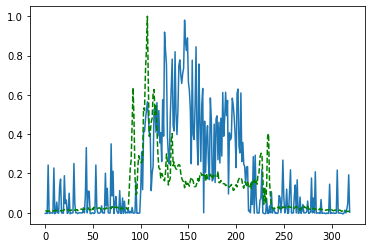

Time taken for epoch:  143.02631306648254
Epoch = [ 73/3000]  Iter = [   0/39480]  Loss = 0.2211 Avg Loss = 0.2211  Time = 0.1030s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 73/3000]  Iter = [ 100/39480]  Loss = 0.232 Avg Loss = 0.22  Time = 0.0034s
Epoch = [ 73/3000]  Iter = [ 200/39480]  Loss = 0.2277 Avg Loss = 0.2244  Time = 0.0032s
Epoch = [ 73/3000]  Iter = [ 300/39480]  Loss = 0.2229 Avg Loss = 0.2201  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [ 400/39480]  Loss = 0.2142 Avg Loss = 0.2178  Time = 0.0030s
Epoch = [ 73/3000]  Iter = [ 500/39480]  Loss = 0.2139 Avg Loss = 0.2168  Time = 0.0029s
Epoch = [ 73/3000]  Iter = [ 600/39480]  Loss = 0.2966 Avg Loss = 0.2174  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [ 700/39480]  Loss = 0.2246 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 73/3000]  Iter = [ 800/39480]  Loss = 0.214 Avg Loss = 0.2207  Time = 0.0029s
Epoch = [ 73/3000]  Iter = [ 900/39480]  Loss = 0.2041 Avg Loss = 0.2206  Time = 0.0030s
Epoch = [ 73/3000]  Iter = [1000/39480]  Loss = 0.2462 Avg Loss = 0.2196  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [1100/39480]  Loss = 0.2129 Avg Loss = 0.2216  Time = 0.0029s
Epoch = [ 73/3000]  Iter 

Epoch = [ 73/3000]  Iter = [9400/39480]  Loss = 0.1822 Avg Loss = 0.2146  Time = 0.0030s
Epoch = [ 73/3000]  Iter = [9500/39480]  Loss = 0.2148 Avg Loss = 0.2161  Time = 0.0029s
Epoch = [ 73/3000]  Iter = [9600/39480]  Loss = 0.2123 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [9700/39480]  Loss = 0.2351 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [9800/39480]  Loss = 0.2689 Avg Loss = 0.2203  Time = 0.0033s
Epoch = [ 73/3000]  Iter = [9900/39480]  Loss = 0.2349 Avg Loss = 0.2196  Time = 0.0033s
Epoch = [ 73/3000]  Iter = [10000/39480]  Loss = 0.2102 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [10100/39480]  Loss = 0.2128 Avg Loss = 0.2216  Time = 0.0030s
Epoch = [ 73/3000]  Iter = [10200/39480]  Loss = 0.2177 Avg Loss = 0.2156  Time = 0.0033s
Epoch = [ 73/3000]  Iter = [10300/39480]  Loss = 0.2096 Avg Loss = 0.2156  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [10400/39480]  Loss = 0.2157 Avg Loss = 0.2147  Time = 0.0031s
Epoch = [ 73/300

Epoch = [ 73/3000]  Iter = [18600/39480]  Loss = 0.2056 Avg Loss = 0.2202  Time = 0.0030s
Epoch = [ 73/3000]  Iter = [18700/39480]  Loss = 0.2114 Avg Loss = 0.2228  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [18800/39480]  Loss = 0.2234 Avg Loss = 0.2225  Time = 0.0029s
Epoch = [ 73/3000]  Iter = [18900/39480]  Loss = 0.2462 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [19000/39480]  Loss = 0.2067 Avg Loss = 0.2189  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [19100/39480]  Loss = 0.2136 Avg Loss = 0.2155  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [19200/39480]  Loss = 0.2528 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 73/3000]  Iter = [19300/39480]  Loss = 0.1908 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [19400/39480]  Loss = 0.1971 Avg Loss = 0.2217  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [19500/39480]  Loss = 0.221 Avg Loss = 0.2228  Time = 0.0029s
Epoch = [ 73/3000]  Iter = [19600/39480]  Loss = 0.2137 Avg Loss = 0.2197  Time = 0.0031s
Epoch = [ 7

Epoch = [ 73/3000]  Iter = [27800/39480]  Loss = 0.2365 Avg Loss = 0.2155  Time = 0.0029s
Epoch = [ 73/3000]  Iter = [27900/39480]  Loss = 0.2352 Avg Loss = 0.2174  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [28000/39480]  Loss = 0.2211 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [ 73/3000]  Iter = [28100/39480]  Loss = 0.2191 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 73/3000]  Iter = [28200/39480]  Loss = 0.2256 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 73/3000]  Iter = [28300/39480]  Loss = 0.1925 Avg Loss = 0.2165  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [28400/39480]  Loss = 0.2861 Avg Loss = 0.2236  Time = 0.0033s
Epoch = [ 73/3000]  Iter = [28500/39480]  Loss = 0.2067 Avg Loss = 0.2197  Time = 0.0030s
Epoch = [ 73/3000]  Iter = [28600/39480]  Loss = 0.1699 Avg Loss = 0.2161  Time = 0.0032s
Epoch = [ 73/3000]  Iter = [28700/39480]  Loss = 0.2487 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 73/3000]  Iter = [28800/39480]  Loss = 0.2049 Avg Loss = 0.218  Time = 0.0031s
Epoch = [ 73/3

Epoch = [ 73/3000]  Iter = [37000/39480]  Loss = 0.2366 Avg Loss = 0.2187  Time = 0.0027s
Epoch = [ 73/3000]  Iter = [37100/39480]  Loss = 0.2201 Avg Loss = 0.2186  Time = 0.0027s
Epoch = [ 73/3000]  Iter = [37200/39480]  Loss = 0.2175 Avg Loss = 0.2163  Time = 0.0028s
Epoch = [ 73/3000]  Iter = [37300/39480]  Loss = 0.1848 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [37400/39480]  Loss = 0.256 Avg Loss = 0.2222  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [37500/39480]  Loss = 0.205 Avg Loss = 0.2202  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [37600/39480]  Loss = 0.2355 Avg Loss = 0.2213  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [37700/39480]  Loss = 0.2015 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 73/3000]  Iter = [37800/39480]  Loss = 0.2197 Avg Loss = 0.2216  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [37900/39480]  Loss = 0.2286 Avg Loss = 0.2165  Time = 0.0031s
Epoch = [ 73/3000]  Iter = [38000/39480]  Loss = 0.2209 Avg Loss = 0.2166  Time = 0.0030s
Epoch = [ 73

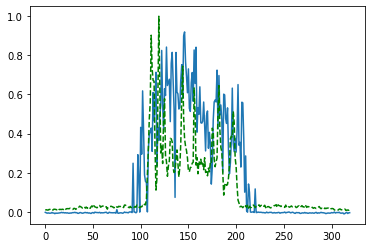

Time taken for epoch:  145.96061515808105
Epoch = [ 74/3000]  Iter = [   0/39480]  Loss = 0.2299 Avg Loss = 0.2299  Time = 0.0849s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 74/3000]  Iter = [ 100/39480]  Loss = 0.214 Avg Loss = 0.2217  Time = 0.0033s
Epoch = [ 74/3000]  Iter = [ 200/39480]  Loss = 0.2178 Avg Loss = 0.2208  Time = 0.0030s
Epoch = [ 74/3000]  Iter = [ 300/39480]  Loss = 0.2259 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 74/3000]  Iter = [ 400/39480]  Loss = 0.2259 Avg Loss = 0.2185  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [ 500/39480]  Loss = 0.2046 Avg Loss = 0.2205  Time = 0.0030s
Epoch = [ 74/3000]  Iter = [ 600/39480]  Loss = 0.2349 Avg Loss = 0.2183  Time = 0.0030s
Epoch = [ 74/3000]  Iter = [ 700/39480]  Loss = 0.1986 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [ 800/39480]  Loss = 0.1905 Avg Loss = 0.2167  Time = 0.0030s
Epoch = [ 74/3000]  Iter = [ 900/39480]  Loss = 0.227 Avg Loss = 0.2207  Time = 0.0029s
Epoch = [ 74/3000]  Iter = [1000/39480]  Loss = 0.2153 Avg Loss = 0.2176  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [1100/39480]  Loss = 0.2168 Avg Loss = 0.2162  Time = 0.0031s
Epoch = [ 74/3000]  Ite

Epoch = [ 74/3000]  Iter = [9400/39480]  Loss = 0.2132 Avg Loss = 0.2151  Time = 0.0033s
Epoch = [ 74/3000]  Iter = [9500/39480]  Loss = 0.1853 Avg Loss = 0.2122  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [9600/39480]  Loss = 0.2291 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [9700/39480]  Loss = 0.2194 Avg Loss = 0.2175  Time = 0.0028s
Epoch = [ 74/3000]  Iter = [9800/39480]  Loss = 0.2274 Avg Loss = 0.2178  Time = 0.0033s
Epoch = [ 74/3000]  Iter = [9900/39480]  Loss = 0.2427 Avg Loss = 0.2237  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [10000/39480]  Loss = 0.2171 Avg Loss = 0.2202  Time = 0.0033s
Epoch = [ 74/3000]  Iter = [10100/39480]  Loss = 0.2011 Avg Loss = 0.2172  Time = 0.0030s
Epoch = [ 74/3000]  Iter = [10200/39480]  Loss = 0.2236 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 74/3000]  Iter = [10300/39480]  Loss = 0.2217 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 74/3000]  Iter = [10400/39480]  Loss = 0.2116 Avg Loss = 0.2204  Time = 0.0032s
Epoch = [ 74/300

Epoch = [ 74/3000]  Iter = [18600/39480]  Loss = 0.2128 Avg Loss = 0.2171  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [18700/39480]  Loss = 0.1963 Avg Loss = 0.2153  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [18800/39480]  Loss = 0.216 Avg Loss = 0.217  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [18900/39480]  Loss = 0.2185 Avg Loss = 0.2199  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [19000/39480]  Loss = 0.2147 Avg Loss = 0.2174  Time = 0.0029s
Epoch = [ 74/3000]  Iter = [19100/39480]  Loss = 0.2325 Avg Loss = 0.2204  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [19200/39480]  Loss = 0.1899 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [19300/39480]  Loss = 0.203 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [19400/39480]  Loss = 0.2273 Avg Loss = 0.2178  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [19500/39480]  Loss = 0.231 Avg Loss = 0.2177  Time = 0.0029s
Epoch = [ 74/3000]  Iter = [19600/39480]  Loss = 0.2018 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [ 74/3

Epoch = [ 74/3000]  Iter = [27800/39480]  Loss = 0.2112 Avg Loss = 0.2147  Time = 0.0033s
Epoch = [ 74/3000]  Iter = [27900/39480]  Loss = 0.2065 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [28000/39480]  Loss = 0.2242 Avg Loss = 0.2166  Time = 0.0030s
Epoch = [ 74/3000]  Iter = [28100/39480]  Loss = 0.2408 Avg Loss = 0.2189  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [28200/39480]  Loss = 0.2055 Avg Loss = 0.2144  Time = 0.0030s
Epoch = [ 74/3000]  Iter = [28300/39480]  Loss = 0.2149 Avg Loss = 0.2191  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [28400/39480]  Loss = 0.2097 Avg Loss = 0.2171  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [28500/39480]  Loss = 0.2059 Avg Loss = 0.2212  Time = 0.0030s
Epoch = [ 74/3000]  Iter = [28600/39480]  Loss = 0.22 Avg Loss = 0.2201  Time = 0.0038s
Epoch = [ 74/3000]  Iter = [28700/39480]  Loss = 0.2432 Avg Loss = 0.2194  Time = 0.0029s
Epoch = [ 74/3000]  Iter = [28800/39480]  Loss = 0.2395 Avg Loss = 0.2151  Time = 0.0030s
Epoch = [ 74

Epoch = [ 74/3000]  Iter = [37000/39480]  Loss = 0.2006 Avg Loss = 0.2183  Time = 0.0030s
Epoch = [ 74/3000]  Iter = [37100/39480]  Loss = 0.2408 Avg Loss = 0.2138  Time = 0.0030s
Epoch = [ 74/3000]  Iter = [37200/39480]  Loss = 0.198 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [37300/39480]  Loss = 0.2454 Avg Loss = 0.2197  Time = 0.0029s
Epoch = [ 74/3000]  Iter = [37400/39480]  Loss = 0.2119 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [37500/39480]  Loss = 0.2195 Avg Loss = 0.2183  Time = 0.0030s
Epoch = [ 74/3000]  Iter = [37600/39480]  Loss = 0.2006 Avg Loss = 0.2211  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [37700/39480]  Loss = 0.2294 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 74/3000]  Iter = [37800/39480]  Loss = 0.2063 Avg Loss = 0.2176  Time = 0.0030s
Epoch = [ 74/3000]  Iter = [37900/39480]  Loss = 0.2122 Avg Loss = 0.2152  Time = 0.0031s
Epoch = [ 74/3000]  Iter = [38000/39480]  Loss = 0.2098 Avg Loss = 0.217  Time = 0.0029s
Epoch = [ 74/

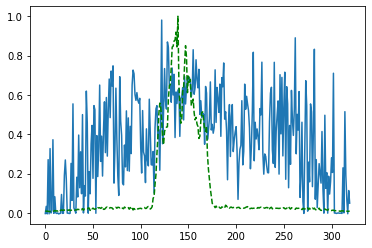

Time taken for epoch:  144.21314144134521
Epoch = [ 75/3000]  Iter = [   0/39480]  Loss = 0.2341 Avg Loss = 0.2341  Time = 0.0803s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 75/3000]  Iter = [ 100/39480]  Loss = 0.188 Avg Loss = 0.2297  Time = 0.0029s
Epoch = [ 75/3000]  Iter = [ 200/39480]  Loss = 0.2278 Avg Loss = 0.2187  Time = 0.0027s
Epoch = [ 75/3000]  Iter = [ 300/39480]  Loss = 0.2494 Avg Loss = 0.2201  Time = 0.0032s
Epoch = [ 75/3000]  Iter = [ 400/39480]  Loss = 0.2044 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [ 500/39480]  Loss = 0.2241 Avg Loss = 0.2207  Time = 0.0031s
Epoch = [ 75/3000]  Iter = [ 600/39480]  Loss = 0.2077 Avg Loss = 0.2213  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [ 700/39480]  Loss = 0.2258 Avg Loss = 0.2236  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [ 800/39480]  Loss = 0.2094 Avg Loss = 0.2209  Time = 0.0032s
Epoch = [ 75/3000]  Iter = [ 900/39480]  Loss = 0.2301 Avg Loss = 0.2143  Time = 0.0031s
Epoch = [ 75/3000]  Iter = [1000/39480]  Loss = 0.1976 Avg Loss = 0.2166  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [1100/39480]  Loss = 0.1941 Avg Loss = 0.2131  Time = 0.0030s
Epoch = [ 75/3000]  Ite

Epoch = [ 75/3000]  Iter = [9400/39480]  Loss = 0.188 Avg Loss = 0.2166  Time = 0.0031s
Epoch = [ 75/3000]  Iter = [9500/39480]  Loss = 0.2041 Avg Loss = 0.2199  Time = 0.0029s
Epoch = [ 75/3000]  Iter = [9600/39480]  Loss = 0.2097 Avg Loss = 0.2173  Time = 0.0031s
Epoch = [ 75/3000]  Iter = [9700/39480]  Loss = 0.2212 Avg Loss = 0.218  Time = 0.0031s
Epoch = [ 75/3000]  Iter = [9800/39480]  Loss = 0.1877 Avg Loss = 0.2233  Time = 0.0031s
Epoch = [ 75/3000]  Iter = [9900/39480]  Loss = 0.257 Avg Loss = 0.2225  Time = 0.0031s
Epoch = [ 75/3000]  Iter = [10000/39480]  Loss = 0.2135 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 75/3000]  Iter = [10100/39480]  Loss = 0.1816 Avg Loss = 0.2203  Time = 0.0033s
Epoch = [ 75/3000]  Iter = [10200/39480]  Loss = 0.2057 Avg Loss = 0.2172  Time = 0.0032s
Epoch = [ 75/3000]  Iter = [10300/39480]  Loss = 0.2129 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [10400/39480]  Loss = 0.212 Avg Loss = 0.2241  Time = 0.0031s
Epoch = [ 75/3000]  I

Epoch = [ 75/3000]  Iter = [18600/39480]  Loss = 0.217 Avg Loss = 0.22  Time = 0.0029s
Epoch = [ 75/3000]  Iter = [18700/39480]  Loss = 0.2246 Avg Loss = 0.2196  Time = 0.0032s
Epoch = [ 75/3000]  Iter = [18800/39480]  Loss = 0.226 Avg Loss = 0.2205  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [18900/39480]  Loss = 0.2054 Avg Loss = 0.2187  Time = 0.0029s
Epoch = [ 75/3000]  Iter = [19000/39480]  Loss = 0.222 Avg Loss = 0.22  Time = 0.0029s
Epoch = [ 75/3000]  Iter = [19100/39480]  Loss = 0.2306 Avg Loss = 0.2192  Time = 0.0033s
Epoch = [ 75/3000]  Iter = [19200/39480]  Loss = 0.2184 Avg Loss = 0.2176  Time = 0.0033s
Epoch = [ 75/3000]  Iter = [19300/39480]  Loss = 0.2453 Avg Loss = 0.22  Time = 0.0033s
Epoch = [ 75/3000]  Iter = [19400/39480]  Loss = 0.2052 Avg Loss = 0.2205  Time = 0.0031s
Epoch = [ 75/3000]  Iter = [19500/39480]  Loss = 0.2149 Avg Loss = 0.2212  Time = 0.0031s
Epoch = [ 75/3000]  Iter = [19600/39480]  Loss = 0.278 Avg Loss = 0.2214  Time = 0.0031s
Epoch = [ 75/3000]  

Epoch = [ 75/3000]  Iter = [27800/39480]  Loss = 0.2088 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 75/3000]  Iter = [27900/39480]  Loss = 0.2197 Avg Loss = 0.2186  Time = 0.0033s
Epoch = [ 75/3000]  Iter = [28000/39480]  Loss = 0.2404 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [28100/39480]  Loss = 0.221 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [28200/39480]  Loss = 0.2191 Avg Loss = 0.2174  Time = 0.0032s
Epoch = [ 75/3000]  Iter = [28300/39480]  Loss = 0.2151 Avg Loss = 0.2171  Time = 0.0033s
Epoch = [ 75/3000]  Iter = [28400/39480]  Loss = 0.2099 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [28500/39480]  Loss = 0.3114 Avg Loss = 0.2217  Time = 0.0029s
Epoch = [ 75/3000]  Iter = [28600/39480]  Loss = 0.2113 Avg Loss = 0.2163  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [28700/39480]  Loss = 0.2178 Avg Loss = 0.2208  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [28800/39480]  Loss = 0.218 Avg Loss = 0.2147  Time = 0.0031s
Epoch = [ 75

Epoch = [ 75/3000]  Iter = [37000/39480]  Loss = 0.2005 Avg Loss = 0.2148  Time = 0.0034s
Epoch = [ 75/3000]  Iter = [37100/39480]  Loss = 0.18 Avg Loss = 0.2202  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [37200/39480]  Loss = 0.2114 Avg Loss = 0.2179  Time = 0.0031s
Epoch = [ 75/3000]  Iter = [37300/39480]  Loss = 0.1939 Avg Loss = 0.22  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [37400/39480]  Loss = 0.2241 Avg Loss = 0.2147  Time = 0.0031s
Epoch = [ 75/3000]  Iter = [37500/39480]  Loss = 0.1941 Avg Loss = 0.2176  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [37600/39480]  Loss = 0.2032 Avg Loss = 0.2163  Time = 0.0029s
Epoch = [ 75/3000]  Iter = [37700/39480]  Loss = 0.251 Avg Loss = 0.2157  Time = 0.0031s
Epoch = [ 75/3000]  Iter = [37800/39480]  Loss = 0.2377 Avg Loss = 0.2166  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [37900/39480]  Loss = 0.2058 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 75/3000]  Iter = [38000/39480]  Loss = 0.2025 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 75/300

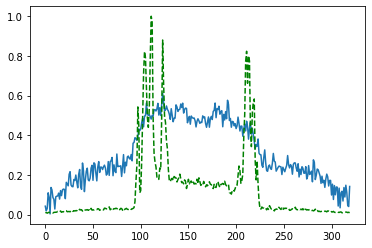

Time taken for epoch:  145.1855993270874
Epoch = [ 76/3000]  Iter = [   0/39480]  Loss = 0.2033 Avg Loss = 0.2033  Time = 0.0913s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 76/3000]  Iter = [ 100/39480]  Loss = 0.2022 Avg Loss = 0.209  Time = 0.0032s
Epoch = [ 76/3000]  Iter = [ 200/39480]  Loss = 0.2472 Avg Loss = 0.2173  Time = 0.0033s
Epoch = [ 76/3000]  Iter = [ 300/39480]  Loss = 0.1841 Avg Loss = 0.2157  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [ 400/39480]  Loss = 0.192 Avg Loss = 0.2155  Time = 0.0032s
Epoch = [ 76/3000]  Iter = [ 500/39480]  Loss = 0.2132 Avg Loss = 0.2199  Time = 0.0032s
Epoch = [ 76/3000]  Iter = [ 600/39480]  Loss = 0.1626 Avg Loss = 0.2194  Time = 0.0029s
Epoch = [ 76/3000]  Iter = [ 700/39480]  Loss = 0.2115 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [ 800/39480]  Loss = 0.1855 Avg Loss = 0.2256  Time = 0.0033s
Epoch = [ 76/3000]  Iter = [ 900/39480]  Loss = 0.171 Avg Loss = 0.2219  Time = 0.0033s
Epoch = [ 76/3000]  Iter = [1000/39480]  Loss = 0.2081 Avg Loss = 0.2216  Time = 0.0029s
Epoch = [ 76/3000]  Iter = [1100/39480]  Loss = 0.2189 Avg Loss = 0.2194  Time = 0.0037s
Epoch = [ 76/3000]  Iter

Epoch = [ 76/3000]  Iter = [9400/39480]  Loss = 0.2175 Avg Loss = 0.2154  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [9500/39480]  Loss = 0.2135 Avg Loss = 0.2155  Time = 0.0033s
Epoch = [ 76/3000]  Iter = [9600/39480]  Loss = 0.2283 Avg Loss = 0.2248  Time = 0.0033s
Epoch = [ 76/3000]  Iter = [9700/39480]  Loss = 0.2011 Avg Loss = 0.2152  Time = 0.0032s
Epoch = [ 76/3000]  Iter = [9800/39480]  Loss = 0.1822 Avg Loss = 0.2155  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [9900/39480]  Loss = 0.2229 Avg Loss = 0.215  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [10000/39480]  Loss = 0.1806 Avg Loss = 0.2117  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [10100/39480]  Loss = 0.2247 Avg Loss = 0.2191  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [10200/39480]  Loss = 0.214 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [10300/39480]  Loss = 0.1986 Avg Loss = 0.2173  Time = 0.0033s
Epoch = [ 76/3000]  Iter = [10400/39480]  Loss = 0.2276 Avg Loss = 0.2171  Time = 0.0033s
Epoch = [ 76/3000]

Epoch = [ 76/3000]  Iter = [18600/39480]  Loss = 0.2114 Avg Loss = 0.2202  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [18700/39480]  Loss = 0.2299 Avg Loss = 0.2164  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [18800/39480]  Loss = 0.2121 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [18900/39480]  Loss = 0.22 Avg Loss = 0.2242  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [19000/39480]  Loss = 0.2337 Avg Loss = 0.2162  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [19100/39480]  Loss = 0.2304 Avg Loss = 0.2156  Time = 0.0029s
Epoch = [ 76/3000]  Iter = [19200/39480]  Loss = 0.24 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [19300/39480]  Loss = 0.2374 Avg Loss = 0.2193  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [19400/39480]  Loss = 0.237 Avg Loss = 0.216  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [19500/39480]  Loss = 0.2335 Avg Loss = 0.2184  Time = 0.0029s
Epoch = [ 76/3000]  Iter = [19600/39480]  Loss = 0.2143 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 76/3000

Epoch = [ 76/3000]  Iter = [27800/39480]  Loss = 0.2097 Avg Loss = 0.221  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [27900/39480]  Loss = 0.2293 Avg Loss = 0.2211  Time = 0.0034s
Epoch = [ 76/3000]  Iter = [28000/39480]  Loss = 0.1716 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [28100/39480]  Loss = 0.2168 Avg Loss = 0.2146  Time = 0.0032s
Epoch = [ 76/3000]  Iter = [28200/39480]  Loss = 0.2326 Avg Loss = 0.2166  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [28300/39480]  Loss = 0.2558 Avg Loss = 0.2183  Time = 0.0034s
Epoch = [ 76/3000]  Iter = [28400/39480]  Loss = 0.2427 Avg Loss = 0.2164  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [28500/39480]  Loss = 0.2913 Avg Loss = 0.2181  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [28600/39480]  Loss = 0.2083 Avg Loss = 0.2199  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [28700/39480]  Loss = 0.1706 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [28800/39480]  Loss = 0.2195 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 7

Epoch = [ 76/3000]  Iter = [37000/39480]  Loss = 0.2073 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [37100/39480]  Loss = 0.1898 Avg Loss = 0.2154  Time = 0.0029s
Epoch = [ 76/3000]  Iter = [37200/39480]  Loss = 0.2297 Avg Loss = 0.2194  Time = 0.0029s
Epoch = [ 76/3000]  Iter = [37300/39480]  Loss = 0.2326 Avg Loss = 0.221  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [37400/39480]  Loss = 0.2284 Avg Loss = 0.2235  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [37500/39480]  Loss = 0.22 Avg Loss = 0.2151  Time = 0.0030s
Epoch = [ 76/3000]  Iter = [37600/39480]  Loss = 0.2029 Avg Loss = 0.2146  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [37700/39480]  Loss = 0.2482 Avg Loss = 0.2205  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [37800/39480]  Loss = 0.1965 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [37900/39480]  Loss = 0.1954 Avg Loss = 0.2153  Time = 0.0031s
Epoch = [ 76/3000]  Iter = [38000/39480]  Loss = 0.2461 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [ 76/

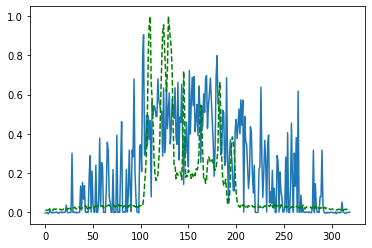

Time taken for epoch:  145.96778345108032
Epoch = [ 77/3000]  Iter = [   0/39480]  Loss = 0.2385 Avg Loss = 0.2385  Time = 0.0787s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 77/3000]  Iter = [ 100/39480]  Loss = 0.2353 Avg Loss = 0.2219  Time = 0.0032s
Epoch = [ 77/3000]  Iter = [ 200/39480]  Loss = 0.2328 Avg Loss = 0.2166  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [ 300/39480]  Loss = 0.2296 Avg Loss = 0.2206  Time = 0.0033s
Epoch = [ 77/3000]  Iter = [ 400/39480]  Loss = 0.2171 Avg Loss = 0.2193  Time = 0.0033s
Epoch = [ 77/3000]  Iter = [ 500/39480]  Loss = 0.2272 Avg Loss = 0.2187  Time = 0.0033s
Epoch = [ 77/3000]  Iter = [ 600/39480]  Loss = 0.1949 Avg Loss = 0.2157  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [ 700/39480]  Loss = 0.2162 Avg Loss = 0.2178  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [ 800/39480]  Loss = 0.1895 Avg Loss = 0.2195  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [ 900/39480]  Loss = 0.2013 Avg Loss = 0.2203  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [1000/39480]  Loss = 0.2892 Avg Loss = 0.2221  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [1100/39480]  Loss = 0.2175 Avg Loss = 0.2196  Time = 0.0033s
Epoch = [ 77/3000]  I

Epoch = [ 77/3000]  Iter = [9400/39480]  Loss = 0.2048 Avg Loss = 0.2194  Time = 0.0029s
Epoch = [ 77/3000]  Iter = [9500/39480]  Loss = 0.2524 Avg Loss = 0.2211  Time = 0.0029s
Epoch = [ 77/3000]  Iter = [9600/39480]  Loss = 0.1924 Avg Loss = 0.2171  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [9700/39480]  Loss = 0.2253 Avg Loss = 0.2197  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [9800/39480]  Loss = 0.2147 Avg Loss = 0.2159  Time = 0.0029s
Epoch = [ 77/3000]  Iter = [9900/39480]  Loss = 0.247 Avg Loss = 0.2168  Time = 0.0033s
Epoch = [ 77/3000]  Iter = [10000/39480]  Loss = 0.1983 Avg Loss = 0.2185  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [10100/39480]  Loss = 0.2065 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 77/3000]  Iter = [10200/39480]  Loss = 0.224 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [10300/39480]  Loss = 0.2187 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [10400/39480]  Loss = 0.2354 Avg Loss = 0.2207  Time = 0.0031s
Epoch = [ 77/3000]

Epoch = [ 77/3000]  Iter = [18600/39480]  Loss = 0.23 Avg Loss = 0.2198  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [18700/39480]  Loss = 0.2178 Avg Loss = 0.2183  Time = 0.0032s
Epoch = [ 77/3000]  Iter = [18800/39480]  Loss = 0.2265 Avg Loss = 0.2171  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [18900/39480]  Loss = 0.2503 Avg Loss = 0.2214  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [19000/39480]  Loss = 0.2532 Avg Loss = 0.2169  Time = 0.0029s
Epoch = [ 77/3000]  Iter = [19100/39480]  Loss = 0.1902 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [19200/39480]  Loss = 0.2282 Avg Loss = 0.2145  Time = 0.0029s
Epoch = [ 77/3000]  Iter = [19300/39480]  Loss = 0.2135 Avg Loss = 0.2163  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [19400/39480]  Loss = 0.2441 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [19500/39480]  Loss = 0.2029 Avg Loss = 0.2185  Time = 0.0032s
Epoch = [ 77/3000]  Iter = [19600/39480]  Loss = 0.2504 Avg Loss = 0.2233  Time = 0.0031s
Epoch = [ 77

Epoch = [ 77/3000]  Iter = [27800/39480]  Loss = 0.2534 Avg Loss = 0.2167  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [27900/39480]  Loss = 0.2222 Avg Loss = 0.2212  Time = 0.0033s
Epoch = [ 77/3000]  Iter = [28000/39480]  Loss = 0.202 Avg Loss = 0.2187  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [28100/39480]  Loss = 0.1872 Avg Loss = 0.2174  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [28200/39480]  Loss = 0.2484 Avg Loss = 0.2175  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [28300/39480]  Loss = 0.193 Avg Loss = 0.2154  Time = 0.0033s
Epoch = [ 77/3000]  Iter = [28400/39480]  Loss = 0.2219 Avg Loss = 0.2155  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [28500/39480]  Loss = 0.2245 Avg Loss = 0.2216  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [28600/39480]  Loss = 0.2227 Avg Loss = 0.2154  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [28700/39480]  Loss = 0.2436 Avg Loss = 0.2192  Time = 0.0032s
Epoch = [ 77/3000]  Iter = [28800/39480]  Loss = 0.2398 Avg Loss = 0.2175  Time = 0.0030s
Epoch = [ 77

Epoch = [ 77/3000]  Iter = [37000/39480]  Loss = 0.2249 Avg Loss = 0.2199  Time = 0.0029s
Epoch = [ 77/3000]  Iter = [37100/39480]  Loss = 0.2025 Avg Loss = 0.217  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [37200/39480]  Loss = 0.1789 Avg Loss = 0.2167  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [37300/39480]  Loss = 0.1956 Avg Loss = 0.219  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [37400/39480]  Loss = 0.2051 Avg Loss = 0.2161  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [37500/39480]  Loss = 0.2279 Avg Loss = 0.2158  Time = 0.0031s
Epoch = [ 77/3000]  Iter = [37600/39480]  Loss = 0.2164 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [37700/39480]  Loss = 0.2553 Avg Loss = 0.2171  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [37800/39480]  Loss = 0.2461 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 77/3000]  Iter = [37900/39480]  Loss = 0.2196 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [ 77/3000]  Iter = [38000/39480]  Loss = 0.2091 Avg Loss = 0.2186  Time = 0.0031s
Epoch = [ 77

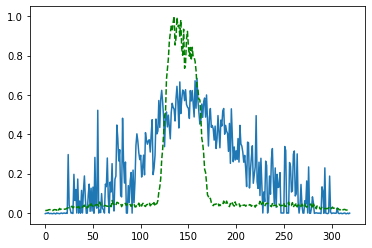

Time taken for epoch:  144.22494745254517
Epoch = [ 78/3000]  Iter = [   0/39480]  Loss = 0.2209 Avg Loss = 0.2209  Time = 0.0767s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 78/3000]  Iter = [ 100/39480]  Loss = 0.1962 Avg Loss = 0.2165  Time = 0.0029s
Epoch = [ 78/3000]  Iter = [ 200/39480]  Loss = 0.204 Avg Loss = 0.2154  Time = 0.0032s
Epoch = [ 78/3000]  Iter = [ 300/39480]  Loss = 0.2355 Avg Loss = 0.216  Time = 0.0034s
Epoch = [ 78/3000]  Iter = [ 400/39480]  Loss = 0.2147 Avg Loss = 0.2201  Time = 0.0031s
Epoch = [ 78/3000]  Iter = [ 500/39480]  Loss = 0.2176 Avg Loss = 0.2152  Time = 0.0031s
Epoch = [ 78/3000]  Iter = [ 600/39480]  Loss = 0.1901 Avg Loss = 0.2163  Time = 0.0034s
Epoch = [ 78/3000]  Iter = [ 700/39480]  Loss = 0.1834 Avg Loss = 0.2142  Time = 0.0030s
Epoch = [ 78/3000]  Iter = [ 800/39480]  Loss = 0.2667 Avg Loss = 0.2195  Time = 0.0031s
Epoch = [ 78/3000]  Iter = [ 900/39480]  Loss = 0.242 Avg Loss = 0.2153  Time = 0.0030s
Epoch = [ 78/3000]  Iter = [1000/39480]  Loss = 0.2142 Avg Loss = 0.2167  Time = 0.0029s
Epoch = [ 78/3000]  Iter = [1100/39480]  Loss = 0.1963 Avg Loss = 0.218  Time = 0.0033s
Epoch = [ 78/3000]  Iter 

Epoch = [ 78/3000]  Iter = [9400/39480]  Loss = 0.2023 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 78/3000]  Iter = [9500/39480]  Loss = 0.2004 Avg Loss = 0.2138  Time = 0.0031s
Epoch = [ 78/3000]  Iter = [9600/39480]  Loss = 0.2213 Avg Loss = 0.2235  Time = 0.0031s
Epoch = [ 78/3000]  Iter = [9700/39480]  Loss = 0.2387 Avg Loss = 0.2189  Time = 0.0031s
Epoch = [ 78/3000]  Iter = [9800/39480]  Loss = 0.2359 Avg Loss = 0.2194  Time = 0.0029s
Epoch = [ 78/3000]  Iter = [9900/39480]  Loss = 0.1882 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 78/3000]  Iter = [10000/39480]  Loss = 0.2178 Avg Loss = 0.2173  Time = 0.0033s
Epoch = [ 78/3000]  Iter = [10100/39480]  Loss = 0.2209 Avg Loss = 0.2134  Time = 0.0031s
Epoch = [ 78/3000]  Iter = [10200/39480]  Loss = 0.2331 Avg Loss = 0.2168  Time = 0.0033s
Epoch = [ 78/3000]  Iter = [10300/39480]  Loss = 0.2331 Avg Loss = 0.2233  Time = 0.0030s
Epoch = [ 78/3000]  Iter = [10400/39480]  Loss = 0.2136 Avg Loss = 0.2198  Time = 0.0031s
Epoch = [ 78/300

Epoch = [ 78/3000]  Iter = [18600/39480]  Loss = 0.2034 Avg Loss = 0.2157  Time = 0.0033s
Epoch = [ 78/3000]  Iter = [18700/39480]  Loss = 0.2018 Avg Loss = 0.2168  Time = 0.0032s
Epoch = [ 78/3000]  Iter = [18800/39480]  Loss = 0.2316 Avg Loss = 0.2211  Time = 0.0030s
Epoch = [ 78/3000]  Iter = [18900/39480]  Loss = 0.2423 Avg Loss = 0.2185  Time = 0.0031s
Epoch = [ 78/3000]  Iter = [19000/39480]  Loss = 0.2037 Avg Loss = 0.2197  Time = 0.0031s
Epoch = [ 78/3000]  Iter = [19100/39480]  Loss = 0.2041 Avg Loss = 0.2182  Time = 0.0033s
Epoch = [ 78/3000]  Iter = [19200/39480]  Loss = 0.1927 Avg Loss = 0.2151  Time = 0.0029s
Epoch = [ 78/3000]  Iter = [19300/39480]  Loss = 0.1996 Avg Loss = 0.2169  Time = 0.0029s
Epoch = [ 78/3000]  Iter = [19400/39480]  Loss = 0.2348 Avg Loss = 0.2215  Time = 0.0030s
Epoch = [ 78/3000]  Iter = [19500/39480]  Loss = 0.2424 Avg Loss = 0.2141  Time = 0.0033s
Epoch = [ 78/3000]  Iter = [19600/39480]  Loss = 0.1866 Avg Loss = 0.2158  Time = 0.0030s
Epoch = [ 

Epoch = [ 78/3000]  Iter = [27800/39480]  Loss = 0.2169 Avg Loss = 0.2152  Time = 0.0034s
Epoch = [ 78/3000]  Iter = [27900/39480]  Loss = 0.2514 Avg Loss = 0.2203  Time = 0.0030s
Epoch = [ 78/3000]  Iter = [28000/39480]  Loss = 0.2156 Avg Loss = 0.2197  Time = 0.0031s
Epoch = [ 78/3000]  Iter = [28100/39480]  Loss = 0.2068 Avg Loss = 0.2163  Time = 0.0029s
Epoch = [ 78/3000]  Iter = [28200/39480]  Loss = 0.1928 Avg Loss = 0.2173  Time = 0.0037s
Epoch = [ 78/3000]  Iter = [28300/39480]  Loss = 0.1991 Avg Loss = 0.2164  Time = 0.0037s
Epoch = [ 78/3000]  Iter = [28400/39480]  Loss = 0.2462 Avg Loss = 0.2176  Time = 0.0035s
Epoch = [ 78/3000]  Iter = [28500/39480]  Loss = 0.1966 Avg Loss = 0.2121  Time = 0.0032s
Epoch = [ 78/3000]  Iter = [28600/39480]  Loss = 0.1898 Avg Loss = 0.2193  Time = 0.0037s
Epoch = [ 78/3000]  Iter = [28700/39480]  Loss = 0.2382 Avg Loss = 0.2185  Time = 0.0033s
Epoch = [ 78/3000]  Iter = [28800/39480]  Loss = 0.1988 Avg Loss = 0.22  Time = 0.0037s
Epoch = [ 78

Epoch = [ 78/3000]  Iter = [37000/39480]  Loss = 0.1749 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [ 78/3000]  Iter = [37100/39480]  Loss = 0.2084 Avg Loss = 0.2161  Time = 0.0032s
Epoch = [ 78/3000]  Iter = [37200/39480]  Loss = 0.2135 Avg Loss = 0.2191  Time = 0.0029s
Epoch = [ 78/3000]  Iter = [37300/39480]  Loss = 0.2185 Avg Loss = 0.2158  Time = 0.0030s
Epoch = [ 78/3000]  Iter = [37400/39480]  Loss = 0.2195 Avg Loss = 0.2174  Time = 0.0029s
Epoch = [ 78/3000]  Iter = [37500/39480]  Loss = 0.2356 Avg Loss = 0.2184  Time = 0.0030s
Epoch = [ 78/3000]  Iter = [37600/39480]  Loss = 0.2108 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 78/3000]  Iter = [37700/39480]  Loss = 0.256 Avg Loss = 0.2166  Time = 0.0030s
Epoch = [ 78/3000]  Iter = [37800/39480]  Loss = 0.2068 Avg Loss = 0.2253  Time = 0.0033s
Epoch = [ 78/3000]  Iter = [37900/39480]  Loss = 0.197 Avg Loss = 0.2206  Time = 0.0030s
Epoch = [ 78/3000]  Iter = [38000/39480]  Loss = 0.2569 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 78

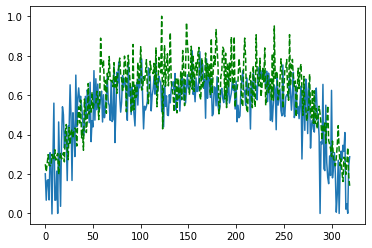

Time taken for epoch:  144.999027967453
Epoch = [ 79/3000]  Iter = [   0/39480]  Loss = 0.2228 Avg Loss = 0.2228  Time = 0.1000s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 79/3000]  Iter = [ 100/39480]  Loss = 0.2973 Avg Loss = 0.2205  Time = 0.0030s
Epoch = [ 79/3000]  Iter = [ 200/39480]  Loss = 0.2944 Avg Loss = 0.2162  Time = 0.0036s
Epoch = [ 79/3000]  Iter = [ 300/39480]  Loss = 0.2168 Avg Loss = 0.217  Time = 0.0037s
Epoch = [ 79/3000]  Iter = [ 400/39480]  Loss = 0.2349 Avg Loss = 0.2205  Time = 0.0036s
Epoch = [ 79/3000]  Iter = [ 500/39480]  Loss = 0.2078 Avg Loss = 0.2193  Time = 0.0031s
Epoch = [ 79/3000]  Iter = [ 600/39480]  Loss = 0.1977 Avg Loss = 0.2147  Time = 0.0031s
Epoch = [ 79/3000]  Iter = [ 700/39480]  Loss = 0.2052 Avg Loss = 0.2185  Time = 0.0031s
Epoch = [ 79/3000]  Iter = [ 800/39480]  Loss = 0.2369 Avg Loss = 0.2195  Time = 0.0030s
Epoch = [ 79/3000]  Iter = [ 900/39480]  Loss = 0.2383 Avg Loss = 0.2199  Time = 0.0032s
Epoch = [ 79/3000]  Iter = [1000/39480]  Loss = 0.2281 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 79/3000]  Iter = [1100/39480]  Loss = 0.2406 Avg Loss = 0.2161  Time = 0.0031s
Epoch = [ 79/3000]  It

Epoch = [ 79/3000]  Iter = [9400/39480]  Loss = 0.2066 Avg Loss = 0.2191  Time = 0.0029s
Epoch = [ 79/3000]  Iter = [9500/39480]  Loss = 0.2462 Avg Loss = 0.2187  Time = 0.0030s
Epoch = [ 79/3000]  Iter = [9600/39480]  Loss = 0.227 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 79/3000]  Iter = [9700/39480]  Loss = 0.1994 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [ 79/3000]  Iter = [9800/39480]  Loss = 0.2448 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 79/3000]  Iter = [9900/39480]  Loss = 0.2039 Avg Loss = 0.218  Time = 0.0032s
Epoch = [ 79/3000]  Iter = [10000/39480]  Loss = 0.2147 Avg Loss = 0.2229  Time = 0.0031s
Epoch = [ 79/3000]  Iter = [10100/39480]  Loss = 0.2252 Avg Loss = 0.2174  Time = 0.0030s
Epoch = [ 79/3000]  Iter = [10200/39480]  Loss = 0.2166 Avg Loss = 0.2216  Time = 0.0029s
Epoch = [ 79/3000]  Iter = [10300/39480]  Loss = 0.2227 Avg Loss = 0.2155  Time = 0.0031s
Epoch = [ 79/3000]  Iter = [10400/39480]  Loss = 0.2564 Avg Loss = 0.2254  Time = 0.0030s
Epoch = [ 79/3000]

Epoch = [ 79/3000]  Iter = [18600/39480]  Loss = 0.1844 Avg Loss = 0.2214  Time = 0.0034s
Epoch = [ 79/3000]  Iter = [18700/39480]  Loss = 0.1646 Avg Loss = 0.2187  Time = 0.0037s
Epoch = [ 79/3000]  Iter = [18800/39480]  Loss = 0.2392 Avg Loss = 0.2197  Time = 0.0035s
Epoch = [ 79/3000]  Iter = [18900/39480]  Loss = 0.2174 Avg Loss = 0.2169  Time = 0.0036s
Epoch = [ 79/3000]  Iter = [19000/39480]  Loss = 0.2168 Avg Loss = 0.2183  Time = 0.0035s
Epoch = [ 79/3000]  Iter = [19100/39480]  Loss = 0.2024 Avg Loss = 0.2179  Time = 0.0036s
Epoch = [ 79/3000]  Iter = [19200/39480]  Loss = 0.2191 Avg Loss = 0.2213  Time = 0.0037s
Epoch = [ 79/3000]  Iter = [19300/39480]  Loss = 0.1902 Avg Loss = 0.216  Time = 0.0037s
Epoch = [ 79/3000]  Iter = [19400/39480]  Loss = 0.2106 Avg Loss = 0.2161  Time = 0.0032s
Epoch = [ 79/3000]  Iter = [19500/39480]  Loss = 0.2055 Avg Loss = 0.2179  Time = 0.0036s
Epoch = [ 79/3000]  Iter = [19600/39480]  Loss = 0.217 Avg Loss = 0.2181  Time = 0.0034s
Epoch = [ 79

Epoch = [ 79/3000]  Iter = [27800/39480]  Loss = 0.2054 Avg Loss = 0.2203  Time = 0.0033s
Epoch = [ 79/3000]  Iter = [27900/39480]  Loss = 0.2013 Avg Loss = 0.2145  Time = 0.0029s
Epoch = [ 79/3000]  Iter = [28000/39480]  Loss = 0.1901 Avg Loss = 0.2134  Time = 0.0029s
Epoch = [ 79/3000]  Iter = [28100/39480]  Loss = 0.2285 Avg Loss = 0.2166  Time = 0.0031s
Epoch = [ 79/3000]  Iter = [28200/39480]  Loss = 0.258 Avg Loss = 0.2179  Time = 0.0031s
Epoch = [ 79/3000]  Iter = [28300/39480]  Loss = 0.2164 Avg Loss = 0.221  Time = 0.0029s
Epoch = [ 79/3000]  Iter = [28400/39480]  Loss = 0.1892 Avg Loss = 0.2137  Time = 0.0030s
Epoch = [ 79/3000]  Iter = [28500/39480]  Loss = 0.2577 Avg Loss = 0.2168  Time = 0.0029s
Epoch = [ 79/3000]  Iter = [28600/39480]  Loss = 0.2054 Avg Loss = 0.2175  Time = 0.0031s
Epoch = [ 79/3000]  Iter = [28700/39480]  Loss = 0.1856 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 79/3000]  Iter = [28800/39480]  Loss = 0.2314 Avg Loss = 0.2157  Time = 0.0029s
Epoch = [ 79

Epoch = [ 79/3000]  Iter = [37000/39480]  Loss = 0.2012 Avg Loss = 0.213  Time = 0.0031s
Epoch = [ 79/3000]  Iter = [37100/39480]  Loss = 0.2141 Avg Loss = 0.2188  Time = 0.0030s
Epoch = [ 79/3000]  Iter = [37200/39480]  Loss = 0.2463 Avg Loss = 0.2178  Time = 0.0032s
Epoch = [ 79/3000]  Iter = [37300/39480]  Loss = 0.2135 Avg Loss = 0.2162  Time = 0.0032s
Epoch = [ 79/3000]  Iter = [37400/39480]  Loss = 0.2305 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 79/3000]  Iter = [37500/39480]  Loss = 0.2654 Avg Loss = 0.2199  Time = 0.0031s
Epoch = [ 79/3000]  Iter = [37600/39480]  Loss = 0.2231 Avg Loss = 0.2171  Time = 0.0031s
Epoch = [ 79/3000]  Iter = [37700/39480]  Loss = 0.2272 Avg Loss = 0.2185  Time = 0.0031s
Epoch = [ 79/3000]  Iter = [37800/39480]  Loss = 0.2193 Avg Loss = 0.216  Time = 0.0032s
Epoch = [ 79/3000]  Iter = [37900/39480]  Loss = 0.2229 Avg Loss = 0.2216  Time = 0.0028s
Epoch = [ 79/3000]  Iter = [38000/39480]  Loss = 0.2267 Avg Loss = 0.2159  Time = 0.0032s
Epoch = [ 79/

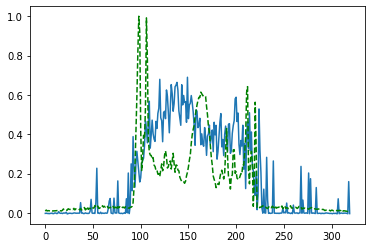

Time taken for epoch:  143.71820998191833
Epoch = [ 80/3000]  Iter = [   0/39480]  Loss = 0.2122 Avg Loss = 0.2122  Time = 0.0824s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 80/3000]  Iter = [ 100/39480]  Loss = 0.2356 Avg Loss = 0.2172  Time = 0.0027s
Epoch = [ 80/3000]  Iter = [ 200/39480]  Loss = 0.1966 Avg Loss = 0.2146  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [ 300/39480]  Loss = 0.2064 Avg Loss = 0.2197  Time = 0.0033s
Epoch = [ 80/3000]  Iter = [ 400/39480]  Loss = 0.2134 Avg Loss = 0.2186  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [ 500/39480]  Loss = 0.2408 Avg Loss = 0.2166  Time = 0.0032s
Epoch = [ 80/3000]  Iter = [ 600/39480]  Loss = 0.198 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [ 700/39480]  Loss = 0.2055 Avg Loss = 0.2202  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [ 800/39480]  Loss = 0.2129 Avg Loss = 0.2186  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [ 900/39480]  Loss = 0.213 Avg Loss = 0.2206  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [1000/39480]  Loss = 0.2261 Avg Loss = 0.2198  Time = 0.0032s
Epoch = [ 80/3000]  Iter = [1100/39480]  Loss = 0.2434 Avg Loss = 0.2196  Time = 0.0031s
Epoch = [ 80/3000]  Ite

Epoch = [ 80/3000]  Iter = [9400/39480]  Loss = 0.1757 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [9500/39480]  Loss = 0.237 Avg Loss = 0.2202  Time = 0.0029s
Epoch = [ 80/3000]  Iter = [9600/39480]  Loss = 0.2275 Avg Loss = 0.2206  Time = 0.0033s
Epoch = [ 80/3000]  Iter = [9700/39480]  Loss = 0.2008 Avg Loss = 0.2164  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [9800/39480]  Loss = 0.2685 Avg Loss = 0.2202  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [9900/39480]  Loss = 0.2395 Avg Loss = 0.2184  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [10000/39480]  Loss = 0.1896 Avg Loss = 0.2181  Time = 0.0048s
Epoch = [ 80/3000]  Iter = [10100/39480]  Loss = 0.1967 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [10200/39480]  Loss = 0.197 Avg Loss = 0.2196  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [10300/39480]  Loss = 0.2179 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [10400/39480]  Loss = 0.1848 Avg Loss = 0.2188  Time = 0.0030s
Epoch = [ 80/3000]

Epoch = [ 80/3000]  Iter = [18600/39480]  Loss = 0.192 Avg Loss = 0.2219  Time = 0.0029s
Epoch = [ 80/3000]  Iter = [18700/39480]  Loss = 0.2048 Avg Loss = 0.2202  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [18800/39480]  Loss = 0.1994 Avg Loss = 0.2201  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [18900/39480]  Loss = 0.1926 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [19000/39480]  Loss = 0.225 Avg Loss = 0.2214  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [19100/39480]  Loss = 0.2183 Avg Loss = 0.217  Time = 0.0034s
Epoch = [ 80/3000]  Iter = [19200/39480]  Loss = 0.1903 Avg Loss = 0.2149  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [19300/39480]  Loss = 0.2265 Avg Loss = 0.2174  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [19400/39480]  Loss = 0.2401 Avg Loss = 0.2207  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [19500/39480]  Loss = 0.2328 Avg Loss = 0.2164  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [19600/39480]  Loss = 0.1898 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 80/

Epoch = [ 80/3000]  Iter = [27800/39480]  Loss = 0.207 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [27900/39480]  Loss = 0.222 Avg Loss = 0.2207  Time = 0.0029s
Epoch = [ 80/3000]  Iter = [28000/39480]  Loss = 0.2423 Avg Loss = 0.2175  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [28100/39480]  Loss = 0.2033 Avg Loss = 0.219  Time = 0.0029s
Epoch = [ 80/3000]  Iter = [28200/39480]  Loss = 0.2223 Avg Loss = 0.2175  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [28300/39480]  Loss = 0.2129 Avg Loss = 0.2208  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [28400/39480]  Loss = 0.2272 Avg Loss = 0.2174  Time = 0.0033s
Epoch = [ 80/3000]  Iter = [28500/39480]  Loss = 0.2282 Avg Loss = 0.2154  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [28600/39480]  Loss = 0.2283 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [28700/39480]  Loss = 0.1994 Avg Loss = 0.2144  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [28800/39480]  Loss = 0.209 Avg Loss = 0.2183  Time = 0.0032s
Epoch = [ 80/3

Epoch = [ 80/3000]  Iter = [37000/39480]  Loss = 0.2404 Avg Loss = 0.2161  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [37100/39480]  Loss = 0.2105 Avg Loss = 0.2204  Time = 0.0032s
Epoch = [ 80/3000]  Iter = [37200/39480]  Loss = 0.2718 Avg Loss = 0.2225  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [37300/39480]  Loss = 0.2143 Avg Loss = 0.2153  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [37400/39480]  Loss = 0.1962 Avg Loss = 0.2171  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [37500/39480]  Loss = 0.2349 Avg Loss = 0.2156  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [37600/39480]  Loss = 0.213 Avg Loss = 0.2138  Time = 0.0030s
Epoch = [ 80/3000]  Iter = [37700/39480]  Loss = 0.2256 Avg Loss = 0.2178  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [37800/39480]  Loss = 0.1692 Avg Loss = 0.2165  Time = 0.0031s
Epoch = [ 80/3000]  Iter = [37900/39480]  Loss = 0.21 Avg Loss = 0.2182  Time = 0.0033s
Epoch = [ 80/3000]  Iter = [38000/39480]  Loss = 0.2102 Avg Loss = 0.2164  Time = 0.0029s
Epoch = [ 80/

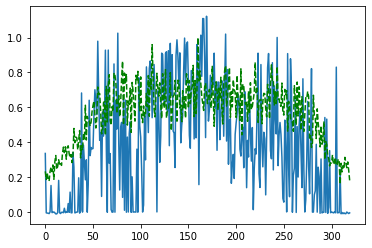

Time taken for epoch:  144.41709327697754
Epoch = [ 81/3000]  Iter = [   0/39480]  Loss = 0.2478 Avg Loss = 0.2478  Time = 0.0687s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 81/3000]  Iter = [ 100/39480]  Loss = 0.1974 Avg Loss = 0.2326  Time = 0.0033s
Epoch = [ 81/3000]  Iter = [ 200/39480]  Loss = 0.1989 Avg Loss = 0.2212  Time = 0.0031s
Epoch = [ 81/3000]  Iter = [ 300/39480]  Loss = 0.2458 Avg Loss = 0.2198  Time = 0.0030s
Epoch = [ 81/3000]  Iter = [ 400/39480]  Loss = 0.1942 Avg Loss = 0.2191  Time = 0.0029s
Epoch = [ 81/3000]  Iter = [ 500/39480]  Loss = 0.2246 Avg Loss = 0.225  Time = 0.0033s
Epoch = [ 81/3000]  Iter = [ 600/39480]  Loss = 0.1913 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 81/3000]  Iter = [ 700/39480]  Loss = 0.2107 Avg Loss = 0.2174  Time = 0.0033s
Epoch = [ 81/3000]  Iter = [ 800/39480]  Loss = 0.1845 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 81/3000]  Iter = [ 900/39480]  Loss = 0.2604 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 81/3000]  Iter = [1000/39480]  Loss = 0.2118 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [ 81/3000]  Iter = [1100/39480]  Loss = 0.2044 Avg Loss = 0.2185  Time = 0.0031s
Epoch = [ 81/3000]  Iter

Epoch = [ 81/3000]  Iter = [9400/39480]  Loss = 0.1855 Avg Loss = 0.2172  Time = 0.0032s
Epoch = [ 81/3000]  Iter = [9500/39480]  Loss = 0.2214 Avg Loss = 0.2189  Time = 0.0031s
Epoch = [ 81/3000]  Iter = [9600/39480]  Loss = 0.2128 Avg Loss = 0.2184  Time = 0.0029s
Epoch = [ 81/3000]  Iter = [9700/39480]  Loss = 0.2187 Avg Loss = 0.2165  Time = 0.0033s
Epoch = [ 81/3000]  Iter = [9800/39480]  Loss = 0.219 Avg Loss = 0.2184  Time = 0.0032s
Epoch = [ 81/3000]  Iter = [9900/39480]  Loss = 0.198 Avg Loss = 0.2191  Time = 0.0033s
Epoch = [ 81/3000]  Iter = [10000/39480]  Loss = 0.2638 Avg Loss = 0.2198  Time = 0.0032s
Epoch = [ 81/3000]  Iter = [10100/39480]  Loss = 0.1967 Avg Loss = 0.2174  Time = 0.0033s
Epoch = [ 81/3000]  Iter = [10200/39480]  Loss = 0.1935 Avg Loss = 0.2182  Time = 0.0033s
Epoch = [ 81/3000]  Iter = [10300/39480]  Loss = 0.1838 Avg Loss = 0.2176  Time = 0.0030s
Epoch = [ 81/3000]  Iter = [10400/39480]  Loss = 0.2236 Avg Loss = 0.2149  Time = 0.0029s
Epoch = [ 81/3000]

Epoch = [ 81/3000]  Iter = [18600/39480]  Loss = 0.2099 Avg Loss = 0.2199  Time = 0.0029s
Epoch = [ 81/3000]  Iter = [18700/39480]  Loss = 0.2346 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 81/3000]  Iter = [18800/39480]  Loss = 0.2172 Avg Loss = 0.2191  Time = 0.0031s
Epoch = [ 81/3000]  Iter = [18900/39480]  Loss = 0.1748 Avg Loss = 0.219  Time = 0.0030s
Epoch = [ 81/3000]  Iter = [19000/39480]  Loss = 0.2005 Avg Loss = 0.2206  Time = 0.0031s
Epoch = [ 81/3000]  Iter = [19100/39480]  Loss = 0.23 Avg Loss = 0.2229  Time = 0.0031s
Epoch = [ 81/3000]  Iter = [19200/39480]  Loss = 0.1984 Avg Loss = 0.2181  Time = 0.0033s
Epoch = [ 81/3000]  Iter = [19300/39480]  Loss = 0.207 Avg Loss = 0.216  Time = 0.0033s
Epoch = [ 81/3000]  Iter = [19400/39480]  Loss = 0.1648 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 81/3000]  Iter = [19500/39480]  Loss = 0.1928 Avg Loss = 0.2148  Time = 0.0032s
Epoch = [ 81/3000]  Iter = [19600/39480]  Loss = 0.2612 Avg Loss = 0.2238  Time = 0.0031s
Epoch = [ 81/30

Epoch = [ 81/3000]  Iter = [27800/39480]  Loss = 0.2434 Avg Loss = 0.2186  Time = 0.0035s
Epoch = [ 81/3000]  Iter = [27900/39480]  Loss = 0.2103 Avg Loss = 0.2187  Time = 0.0036s
Epoch = [ 81/3000]  Iter = [28000/39480]  Loss = 0.2543 Avg Loss = 0.2163  Time = 0.0036s
Epoch = [ 81/3000]  Iter = [28100/39480]  Loss = 0.2009 Avg Loss = 0.2135  Time = 0.0037s
Epoch = [ 81/3000]  Iter = [28200/39480]  Loss = 0.2048 Avg Loss = 0.2167  Time = 0.0034s
Epoch = [ 81/3000]  Iter = [28300/39480]  Loss = 0.2056 Avg Loss = 0.2191  Time = 0.0036s
Epoch = [ 81/3000]  Iter = [28400/39480]  Loss = 0.1903 Avg Loss = 0.2212  Time = 0.0035s
Epoch = [ 81/3000]  Iter = [28500/39480]  Loss = 0.1917 Avg Loss = 0.2201  Time = 0.0036s
Epoch = [ 81/3000]  Iter = [28600/39480]  Loss = 0.2265 Avg Loss = 0.2189  Time = 0.0036s
Epoch = [ 81/3000]  Iter = [28700/39480]  Loss = 0.2201 Avg Loss = 0.2184  Time = 0.0036s
Epoch = [ 81/3000]  Iter = [28800/39480]  Loss = 0.1871 Avg Loss = 0.2176  Time = 0.0031s
Epoch = [ 

Epoch = [ 81/3000]  Iter = [37000/39480]  Loss = 0.2049 Avg Loss = 0.2201  Time = 0.0029s
Epoch = [ 81/3000]  Iter = [37100/39480]  Loss = 0.2063 Avg Loss = 0.2199  Time = 0.0030s
Epoch = [ 81/3000]  Iter = [37200/39480]  Loss = 0.2238 Avg Loss = 0.2194  Time = 0.0031s
Epoch = [ 81/3000]  Iter = [37300/39480]  Loss = 0.222 Avg Loss = 0.2216  Time = 0.0029s
Epoch = [ 81/3000]  Iter = [37400/39480]  Loss = 0.2567 Avg Loss = 0.225  Time = 0.0033s
Epoch = [ 81/3000]  Iter = [37500/39480]  Loss = 0.2294 Avg Loss = 0.2204  Time = 0.0029s
Epoch = [ 81/3000]  Iter = [37600/39480]  Loss = 0.177 Avg Loss = 0.213  Time = 0.0030s
Epoch = [ 81/3000]  Iter = [37700/39480]  Loss = 0.2048 Avg Loss = 0.2148  Time = 0.0031s
Epoch = [ 81/3000]  Iter = [37800/39480]  Loss = 0.2252 Avg Loss = 0.213  Time = 0.0031s
Epoch = [ 81/3000]  Iter = [37900/39480]  Loss = 0.2033 Avg Loss = 0.2171  Time = 0.0031s
Epoch = [ 81/3000]  Iter = [38000/39480]  Loss = 0.2162 Avg Loss = 0.2214  Time = 0.0030s
Epoch = [ 81/30

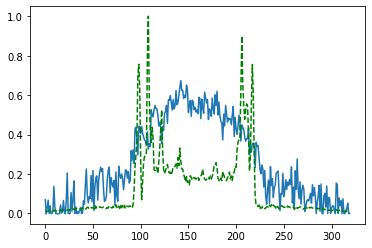

Time taken for epoch:  144.42911648750305
Epoch = [ 82/3000]  Iter = [   0/39480]  Loss = 0.2126 Avg Loss = 0.2126  Time = 0.0853s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 82/3000]  Iter = [ 100/39480]  Loss = 0.2041 Avg Loss = 0.2133  Time = 0.0035s
Epoch = [ 82/3000]  Iter = [ 200/39480]  Loss = 0.2593 Avg Loss = 0.2154  Time = 0.0032s
Epoch = [ 82/3000]  Iter = [ 300/39480]  Loss = 0.2103 Avg Loss = 0.2153  Time = 0.0033s
Epoch = [ 82/3000]  Iter = [ 400/39480]  Loss = 0.2013 Avg Loss = 0.2171  Time = 0.0033s
Epoch = [ 82/3000]  Iter = [ 500/39480]  Loss = 0.185 Avg Loss = 0.2197  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [ 600/39480]  Loss = 0.2255 Avg Loss = 0.2177  Time = 0.0034s
Epoch = [ 82/3000]  Iter = [ 700/39480]  Loss = 0.1995 Avg Loss = 0.217  Time = 0.0033s
Epoch = [ 82/3000]  Iter = [ 800/39480]  Loss = 0.2221 Avg Loss = 0.2197  Time = 0.0029s
Epoch = [ 82/3000]  Iter = [ 900/39480]  Loss = 0.2215 Avg Loss = 0.2131  Time = 0.0033s
Epoch = [ 82/3000]  Iter = [1000/39480]  Loss = 0.1939 Avg Loss = 0.2176  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [1100/39480]  Loss = 0.2189 Avg Loss = 0.2194  Time = 0.0033s
Epoch = [ 82/3000]  Ite

Epoch = [ 82/3000]  Iter = [9400/39480]  Loss = 0.1948 Avg Loss = 0.2187  Time = 0.0030s
Epoch = [ 82/3000]  Iter = [9500/39480]  Loss = 0.1821 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 82/3000]  Iter = [9600/39480]  Loss = 0.2135 Avg Loss = 0.2174  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [9700/39480]  Loss = 0.2453 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 82/3000]  Iter = [9800/39480]  Loss = 0.2104 Avg Loss = 0.2147  Time = 0.0030s
Epoch = [ 82/3000]  Iter = [9900/39480]  Loss = 0.2259 Avg Loss = 0.2153  Time = 0.0030s
Epoch = [ 82/3000]  Iter = [10000/39480]  Loss = 0.19 Avg Loss = 0.2195  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [10100/39480]  Loss = 0.2146 Avg Loss = 0.2196  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [10200/39480]  Loss = 0.2483 Avg Loss = 0.2181  Time = 0.0030s
Epoch = [ 82/3000]  Iter = [10300/39480]  Loss = 0.199 Avg Loss = 0.2212  Time = 0.0030s
Epoch = [ 82/3000]  Iter = [10400/39480]  Loss = 0.219 Avg Loss = 0.2184  Time = 0.0030s
Epoch = [ 82/3000]  

Epoch = [ 82/3000]  Iter = [18600/39480]  Loss = 0.2027 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [18700/39480]  Loss = 0.2118 Avg Loss = 0.2166  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [18800/39480]  Loss = 0.208 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [18900/39480]  Loss = 0.2052 Avg Loss = 0.2213  Time = 0.0030s
Epoch = [ 82/3000]  Iter = [19000/39480]  Loss = 0.1876 Avg Loss = 0.2175  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [19100/39480]  Loss = 0.1818 Avg Loss = 0.2183  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [19200/39480]  Loss = 0.1938 Avg Loss = 0.2145  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [19300/39480]  Loss = 0.1915 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [19400/39480]  Loss = 0.2461 Avg Loss = 0.2203  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [19500/39480]  Loss = 0.2183 Avg Loss = 0.2187  Time = 0.0033s
Epoch = [ 82/3000]  Iter = [19600/39480]  Loss = 0.219 Avg Loss = 0.2184  Time = 0.0036s
Epoch = [ 82/

Epoch = [ 82/3000]  Iter = [27800/39480]  Loss = 0.2196 Avg Loss = 0.2167  Time = 0.0036s
Epoch = [ 82/3000]  Iter = [27900/39480]  Loss = 0.2336 Avg Loss = 0.214  Time = 0.0035s
Epoch = [ 82/3000]  Iter = [28000/39480]  Loss = 0.2402 Avg Loss = 0.2188  Time = 0.0036s
Epoch = [ 82/3000]  Iter = [28100/39480]  Loss = 0.3002 Avg Loss = 0.2188  Time = 0.0034s
Epoch = [ 82/3000]  Iter = [28200/39480]  Loss = 0.2131 Avg Loss = 0.2178  Time = 0.0035s
Epoch = [ 82/3000]  Iter = [28300/39480]  Loss = 0.2012 Avg Loss = 0.2183  Time = 0.0040s
Epoch = [ 82/3000]  Iter = [28400/39480]  Loss = 0.2091 Avg Loss = 0.2206  Time = 0.0039s
Epoch = [ 82/3000]  Iter = [28500/39480]  Loss = 0.1935 Avg Loss = 0.2172  Time = 0.0039s
Epoch = [ 82/3000]  Iter = [28600/39480]  Loss = 0.2044 Avg Loss = 0.2164  Time = 0.0031s
Epoch = [ 82/3000]  Iter = [28700/39480]  Loss = 0.2644 Avg Loss = 0.222  Time = 0.0036s
Epoch = [ 82/3000]  Iter = [28800/39480]  Loss = 0.2083 Avg Loss = 0.2216  Time = 0.0034s
Epoch = [ 82

Epoch = [ 82/3000]  Iter = [37000/39480]  Loss = 0.2236 Avg Loss = 0.2223  Time = 0.0036s
Epoch = [ 82/3000]  Iter = [37100/39480]  Loss = 0.1911 Avg Loss = 0.2179  Time = 0.0036s
Epoch = [ 82/3000]  Iter = [37200/39480]  Loss = 0.2334 Avg Loss = 0.2211  Time = 0.0036s
Epoch = [ 82/3000]  Iter = [37300/39480]  Loss = 0.2419 Avg Loss = 0.2208  Time = 0.0036s
Epoch = [ 82/3000]  Iter = [37400/39480]  Loss = 0.1803 Avg Loss = 0.2197  Time = 0.0035s
Epoch = [ 82/3000]  Iter = [37500/39480]  Loss = 0.2451 Avg Loss = 0.217  Time = 0.0032s
Epoch = [ 82/3000]  Iter = [37600/39480]  Loss = 0.2561 Avg Loss = 0.219  Time = 0.0036s
Epoch = [ 82/3000]  Iter = [37700/39480]  Loss = 0.2481 Avg Loss = 0.2213  Time = 0.0036s
Epoch = [ 82/3000]  Iter = [37800/39480]  Loss = 0.2263 Avg Loss = 0.2193  Time = 0.0036s
Epoch = [ 82/3000]  Iter = [37900/39480]  Loss = 0.1823 Avg Loss = 0.2193  Time = 0.0036s
Epoch = [ 82/3000]  Iter = [38000/39480]  Loss = 0.2433 Avg Loss = 0.2161  Time = 0.0035s
Epoch = [ 82

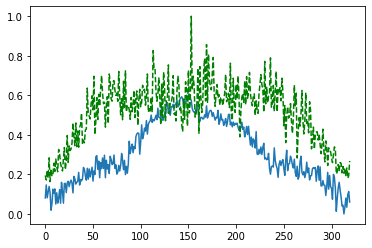

Time taken for epoch:  150.31358194351196
Epoch = [ 83/3000]  Iter = [   0/39480]  Loss = 0.2087 Avg Loss = 0.2087  Time = 0.0746s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 83/3000]  Iter = [ 100/39480]  Loss = 0.1811 Avg Loss = 0.2114  Time = 0.0036s
Epoch = [ 83/3000]  Iter = [ 200/39480]  Loss = 0.1838 Avg Loss = 0.2174  Time = 0.0038s
Epoch = [ 83/3000]  Iter = [ 300/39480]  Loss = 0.2062 Avg Loss = 0.2182  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [ 400/39480]  Loss = 0.216 Avg Loss = 0.2168  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [ 500/39480]  Loss = 0.2051 Avg Loss = 0.2188  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [ 600/39480]  Loss = 0.1888 Avg Loss = 0.2153  Time = 0.0033s
Epoch = [ 83/3000]  Iter = [ 700/39480]  Loss = 0.1924 Avg Loss = 0.2161  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [ 800/39480]  Loss = 0.2414 Avg Loss = 0.2204  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [ 900/39480]  Loss = 0.2174 Avg Loss = 0.2195  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [1000/39480]  Loss = 0.2208 Avg Loss = 0.2195  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [1100/39480]  Loss = 0.1844 Avg Loss = 0.2181  Time = 0.0038s
Epoch = [ 83/3000]  It

Epoch = [ 83/3000]  Iter = [9400/39480]  Loss = 0.1997 Avg Loss = 0.2203  Time = 0.0036s
Epoch = [ 83/3000]  Iter = [9500/39480]  Loss = 0.2398 Avg Loss = 0.2243  Time = 0.0035s
Epoch = [ 83/3000]  Iter = [9600/39480]  Loss = 0.2189 Avg Loss = 0.2209  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [9700/39480]  Loss = 0.2343 Avg Loss = 0.2165  Time = 0.0036s
Epoch = [ 83/3000]  Iter = [9800/39480]  Loss = 0.2168 Avg Loss = 0.2165  Time = 0.0036s
Epoch = [ 83/3000]  Iter = [9900/39480]  Loss = 0.2292 Avg Loss = 0.2184  Time = 0.0032s
Epoch = [ 83/3000]  Iter = [10000/39480]  Loss = 0.2123 Avg Loss = 0.2169  Time = 0.0035s
Epoch = [ 83/3000]  Iter = [10100/39480]  Loss = 0.2235 Avg Loss = 0.2179  Time = 0.0036s
Epoch = [ 83/3000]  Iter = [10200/39480]  Loss = 0.2323 Avg Loss = 0.217  Time = 0.0033s
Epoch = [ 83/3000]  Iter = [10300/39480]  Loss = 0.2178 Avg Loss = 0.2174  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [10400/39480]  Loss = 0.2246 Avg Loss = 0.2156  Time = 0.0037s
Epoch = [ 83/3000

Epoch = [ 83/3000]  Iter = [18600/39480]  Loss = 0.2165 Avg Loss = 0.2187  Time = 0.0036s
Epoch = [ 83/3000]  Iter = [18700/39480]  Loss = 0.2152 Avg Loss = 0.2176  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [18800/39480]  Loss = 0.21 Avg Loss = 0.2161  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [18900/39480]  Loss = 0.217 Avg Loss = 0.2161  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [19000/39480]  Loss = 0.2384 Avg Loss = 0.2197  Time = 0.0036s
Epoch = [ 83/3000]  Iter = [19100/39480]  Loss = 0.2054 Avg Loss = 0.2218  Time = 0.0038s
Epoch = [ 83/3000]  Iter = [19200/39480]  Loss = 0.2299 Avg Loss = 0.2217  Time = 0.0039s
Epoch = [ 83/3000]  Iter = [19300/39480]  Loss = 0.2094 Avg Loss = 0.2191  Time = 0.0038s
Epoch = [ 83/3000]  Iter = [19400/39480]  Loss = 0.2438 Avg Loss = 0.2184  Time = 0.0039s
Epoch = [ 83/3000]  Iter = [19500/39480]  Loss = 0.2323 Avg Loss = 0.216  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [19600/39480]  Loss = 0.1873 Avg Loss = 0.216  Time = 0.0036s
Epoch = [ 83/30

Epoch = [ 83/3000]  Iter = [27800/39480]  Loss = 0.2203 Avg Loss = 0.2153  Time = 0.0039s
Epoch = [ 83/3000]  Iter = [27900/39480]  Loss = 0.2462 Avg Loss = 0.2172  Time = 0.0040s
Epoch = [ 83/3000]  Iter = [28000/39480]  Loss = 0.1993 Avg Loss = 0.2177  Time = 0.0040s
Epoch = [ 83/3000]  Iter = [28100/39480]  Loss = 0.2296 Avg Loss = 0.2204  Time = 0.0038s
Epoch = [ 83/3000]  Iter = [28200/39480]  Loss = 0.2042 Avg Loss = 0.2181  Time = 0.0035s
Epoch = [ 83/3000]  Iter = [28300/39480]  Loss = 0.2459 Avg Loss = 0.2142  Time = 0.0033s
Epoch = [ 83/3000]  Iter = [28400/39480]  Loss = 0.2295 Avg Loss = 0.2162  Time = 0.0035s
Epoch = [ 83/3000]  Iter = [28500/39480]  Loss = 0.2237 Avg Loss = 0.2185  Time = 0.0036s
Epoch = [ 83/3000]  Iter = [28600/39480]  Loss = 0.2484 Avg Loss = 0.2208  Time = 0.0036s
Epoch = [ 83/3000]  Iter = [28700/39480]  Loss = 0.1853 Avg Loss = 0.2173  Time = 0.0036s
Epoch = [ 83/3000]  Iter = [28800/39480]  Loss = 0.2167 Avg Loss = 0.2188  Time = 0.0036s
Epoch = [ 

Epoch = [ 83/3000]  Iter = [37000/39480]  Loss = 0.2599 Avg Loss = 0.2185  Time = 0.0036s
Epoch = [ 83/3000]  Iter = [37100/39480]  Loss = 0.1913 Avg Loss = 0.2202  Time = 0.0032s
Epoch = [ 83/3000]  Iter = [37200/39480]  Loss = 0.2154 Avg Loss = 0.2175  Time = 0.0034s
Epoch = [ 83/3000]  Iter = [37300/39480]  Loss = 0.1989 Avg Loss = 0.2193  Time = 0.0035s
Epoch = [ 83/3000]  Iter = [37400/39480]  Loss = 0.2004 Avg Loss = 0.2235  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [37500/39480]  Loss = 0.2277 Avg Loss = 0.2182  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [37600/39480]  Loss = 0.1925 Avg Loss = 0.2188  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [37700/39480]  Loss = 0.2329 Avg Loss = 0.2203  Time = 0.0034s
Epoch = [ 83/3000]  Iter = [37800/39480]  Loss = 0.2241 Avg Loss = 0.2231  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [37900/39480]  Loss = 0.2079 Avg Loss = 0.2194  Time = 0.0037s
Epoch = [ 83/3000]  Iter = [38000/39480]  Loss = 0.239 Avg Loss = 0.2199  Time = 0.0037s
Epoch = [ 8

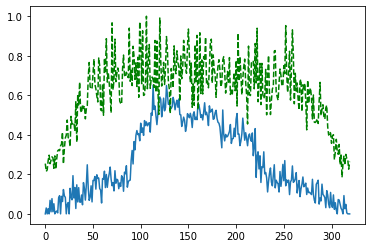

Time taken for epoch:  163.47526168823242
Epoch = [ 84/3000]  Iter = [   0/39480]  Loss = 0.2244 Avg Loss = 0.2244  Time = 0.0758s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 84/3000]  Iter = [ 100/39480]  Loss = 0.2131 Avg Loss = 0.2206  Time = 0.0034s
Epoch = [ 84/3000]  Iter = [ 200/39480]  Loss = 0.1995 Avg Loss = 0.22  Time = 0.0032s
Epoch = [ 84/3000]  Iter = [ 300/39480]  Loss = 0.2327 Avg Loss = 0.2167  Time = 0.0034s
Epoch = [ 84/3000]  Iter = [ 400/39480]  Loss = 0.2541 Avg Loss = 0.222  Time = 0.0031s
Epoch = [ 84/3000]  Iter = [ 500/39480]  Loss = 0.1832 Avg Loss = 0.2181  Time = 0.0030s
Epoch = [ 84/3000]  Iter = [ 600/39480]  Loss = 0.2164 Avg Loss = 0.222  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [ 700/39480]  Loss = 0.2198 Avg Loss = 0.218  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [ 800/39480]  Loss = 0.2309 Avg Loss = 0.2178  Time = 0.0035s
Epoch = [ 84/3000]  Iter = [ 900/39480]  Loss = 0.2487 Avg Loss = 0.2162  Time = 0.0037s
Epoch = [ 84/3000]  Iter = [1000/39480]  Loss = 0.2124 Avg Loss = 0.2182  Time = 0.0037s
Epoch = [ 84/3000]  Iter = [1100/39480]  Loss = 0.233 Avg Loss = 0.2168  Time = 0.0039s
Epoch = [ 84/3000]  Iter = 

Epoch = [ 84/3000]  Iter = [9400/39480]  Loss = 0.2176 Avg Loss = 0.2206  Time = 0.0030s
Epoch = [ 84/3000]  Iter = [9500/39480]  Loss = 0.2072 Avg Loss = 0.2194  Time = 0.0029s
Epoch = [ 84/3000]  Iter = [9600/39480]  Loss = 0.2495 Avg Loss = 0.2151  Time = 0.0030s
Epoch = [ 84/3000]  Iter = [9700/39480]  Loss = 0.24 Avg Loss = 0.2198  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [9800/39480]  Loss = 0.2112 Avg Loss = 0.2242  Time = 0.0030s
Epoch = [ 84/3000]  Iter = [9900/39480]  Loss = 0.164 Avg Loss = 0.2142  Time = 0.0031s
Epoch = [ 84/3000]  Iter = [10000/39480]  Loss = 0.2081 Avg Loss = 0.2137  Time = 0.0030s
Epoch = [ 84/3000]  Iter = [10100/39480]  Loss = 0.2028 Avg Loss = 0.2165  Time = 0.0031s
Epoch = [ 84/3000]  Iter = [10200/39480]  Loss = 0.19 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 84/3000]  Iter = [10300/39480]  Loss = 0.2589 Avg Loss = 0.2272  Time = 0.0030s
Epoch = [ 84/3000]  Iter = [10400/39480]  Loss = 0.2163 Avg Loss = 0.2182  Time = 0.0031s
Epoch = [ 84/3000]  I

Epoch = [ 84/3000]  Iter = [18600/39480]  Loss = 0.2387 Avg Loss = 0.2157  Time = 0.0031s
Epoch = [ 84/3000]  Iter = [18700/39480]  Loss = 0.2133 Avg Loss = 0.2187  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [18800/39480]  Loss = 0.2205 Avg Loss = 0.2177  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [18900/39480]  Loss = 0.2208 Avg Loss = 0.2175  Time = 0.0035s
Epoch = [ 84/3000]  Iter = [19000/39480]  Loss = 0.2189 Avg Loss = 0.2183  Time = 0.0034s
Epoch = [ 84/3000]  Iter = [19100/39480]  Loss = 0.2356 Avg Loss = 0.2158  Time = 0.0034s
Epoch = [ 84/3000]  Iter = [19200/39480]  Loss = 0.193 Avg Loss = 0.221  Time = 0.0032s
Epoch = [ 84/3000]  Iter = [19300/39480]  Loss = 0.2258 Avg Loss = 0.2188  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [19400/39480]  Loss = 0.1984 Avg Loss = 0.215  Time = 0.0055s
Epoch = [ 84/3000]  Iter = [19500/39480]  Loss = 0.2592 Avg Loss = 0.2204  Time = 0.0034s
Epoch = [ 84/3000]  Iter = [19600/39480]  Loss = 0.2076 Avg Loss = 0.2182  Time = 0.0036s
Epoch = [ 84/

Epoch = [ 84/3000]  Iter = [27800/39480]  Loss = 0.2287 Avg Loss = 0.2158  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [27900/39480]  Loss = 0.2543 Avg Loss = 0.2204  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [28000/39480]  Loss = 0.1872 Avg Loss = 0.2201  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [28100/39480]  Loss = 0.1996 Avg Loss = 0.2161  Time = 0.0038s
Epoch = [ 84/3000]  Iter = [28200/39480]  Loss = 0.2226 Avg Loss = 0.2197  Time = 0.0032s
Epoch = [ 84/3000]  Iter = [28300/39480]  Loss = 0.22 Avg Loss = 0.2194  Time = 0.0032s
Epoch = [ 84/3000]  Iter = [28400/39480]  Loss = 0.2861 Avg Loss = 0.2224  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [28500/39480]  Loss = 0.2049 Avg Loss = 0.2219  Time = 0.0031s
Epoch = [ 84/3000]  Iter = [28600/39480]  Loss = 0.2192 Avg Loss = 0.2155  Time = 0.0035s
Epoch = [ 84/3000]  Iter = [28700/39480]  Loss = 0.2145 Avg Loss = 0.2201  Time = 0.0042s
Epoch = [ 84/3000]  Iter = [28800/39480]  Loss = 0.2076 Avg Loss = 0.2157  Time = 0.0034s
Epoch = [ 84

Epoch = [ 84/3000]  Iter = [37000/39480]  Loss = 0.2247 Avg Loss = 0.2182  Time = 0.0035s
Epoch = [ 84/3000]  Iter = [37100/39480]  Loss = 0.2576 Avg Loss = 0.2226  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [37200/39480]  Loss = 0.2159 Avg Loss = 0.2177  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [37300/39480]  Loss = 0.2311 Avg Loss = 0.2223  Time = 0.0030s
Epoch = [ 84/3000]  Iter = [37400/39480]  Loss = 0.2381 Avg Loss = 0.2193  Time = 0.0034s
Epoch = [ 84/3000]  Iter = [37500/39480]  Loss = 0.2439 Avg Loss = 0.2188  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [37600/39480]  Loss = 0.214 Avg Loss = 0.2166  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [37700/39480]  Loss = 0.1876 Avg Loss = 0.2171  Time = 0.0034s
Epoch = [ 84/3000]  Iter = [37800/39480]  Loss = 0.2257 Avg Loss = 0.2176  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [37900/39480]  Loss = 0.251 Avg Loss = 0.2208  Time = 0.0033s
Epoch = [ 84/3000]  Iter = [38000/39480]  Loss = 0.1966 Avg Loss = 0.2221  Time = 0.0032s
Epoch = [ 84

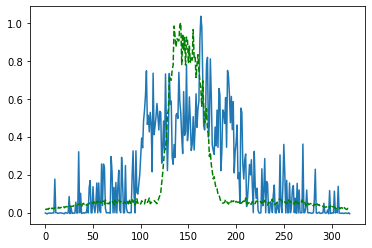

Time taken for epoch:  154.6098759174347
Epoch = [ 85/3000]  Iter = [   0/39480]  Loss = 0.2416 Avg Loss = 0.2416  Time = 0.0669s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 85/3000]  Iter = [ 100/39480]  Loss = 0.2132 Avg Loss = 0.2265  Time = 0.0033s
Epoch = [ 85/3000]  Iter = [ 200/39480]  Loss = 0.1999 Avg Loss = 0.2201  Time = 0.0030s
Epoch = [ 85/3000]  Iter = [ 300/39480]  Loss = 0.2174 Avg Loss = 0.2217  Time = 0.0047s
Epoch = [ 85/3000]  Iter = [ 400/39480]  Loss = 0.2559 Avg Loss = 0.2178  Time = 0.0030s
Epoch = [ 85/3000]  Iter = [ 500/39480]  Loss = 0.2131 Avg Loss = 0.2191  Time = 0.0031s
Epoch = [ 85/3000]  Iter = [ 600/39480]  Loss = 0.2282 Avg Loss = 0.2223  Time = 0.0031s
Epoch = [ 85/3000]  Iter = [ 700/39480]  Loss = 0.2258 Avg Loss = 0.2212  Time = 0.0034s
Epoch = [ 85/3000]  Iter = [ 800/39480]  Loss = 0.1849 Avg Loss = 0.2151  Time = 0.0034s
Epoch = [ 85/3000]  Iter = [ 900/39480]  Loss = 0.256 Avg Loss = 0.2201  Time = 0.0030s
Epoch = [ 85/3000]  Iter = [1000/39480]  Loss = 0.2256 Avg Loss = 0.2165  Time = 0.0065s
Epoch = [ 85/3000]  Iter = [1100/39480]  Loss = 0.1969 Avg Loss = 0.2191  Time = 0.0032s
Epoch = [ 85/3000]  It

Epoch = [ 85/3000]  Iter = [9400/39480]  Loss = 0.2286 Avg Loss = 0.2141  Time = 0.0033s
Epoch = [ 85/3000]  Iter = [9500/39480]  Loss = 0.2342 Avg Loss = 0.2175  Time = 0.0028s
Epoch = [ 85/3000]  Iter = [9600/39480]  Loss = 0.1942 Avg Loss = 0.2228  Time = 0.0033s
Epoch = [ 85/3000]  Iter = [9700/39480]  Loss = 0.2119 Avg Loss = 0.2151  Time = 0.0033s
Epoch = [ 85/3000]  Iter = [9800/39480]  Loss = 0.2405 Avg Loss = 0.2178  Time = 0.0033s
Epoch = [ 85/3000]  Iter = [9900/39480]  Loss = 0.2145 Avg Loss = 0.218  Time = 0.0031s
Epoch = [ 85/3000]  Iter = [10000/39480]  Loss = 0.2078 Avg Loss = 0.217  Time = 0.0038s
Epoch = [ 85/3000]  Iter = [10100/39480]  Loss = 0.2105 Avg Loss = 0.2157  Time = 0.0032s
Epoch = [ 85/3000]  Iter = [10200/39480]  Loss = 0.2168 Avg Loss = 0.2186  Time = 0.0032s
Epoch = [ 85/3000]  Iter = [10300/39480]  Loss = 0.2193 Avg Loss = 0.2192  Time = 0.0032s
Epoch = [ 85/3000]  Iter = [10400/39480]  Loss = 0.2239 Avg Loss = 0.218  Time = 0.0038s
Epoch = [ 85/3000] 

Epoch = [ 85/3000]  Iter = [18600/39480]  Loss = 0.2003 Avg Loss = 0.2255  Time = 0.0030s
Epoch = [ 85/3000]  Iter = [18700/39480]  Loss = 0.2164 Avg Loss = 0.2204  Time = 0.0031s
Epoch = [ 85/3000]  Iter = [18800/39480]  Loss = 0.2229 Avg Loss = 0.2184  Time = 0.0030s
Epoch = [ 85/3000]  Iter = [18900/39480]  Loss = 0.2507 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 85/3000]  Iter = [19000/39480]  Loss = 0.2369 Avg Loss = 0.2227  Time = 0.0031s
Epoch = [ 85/3000]  Iter = [19100/39480]  Loss = 0.2269 Avg Loss = 0.2196  Time = 0.0031s
Epoch = [ 85/3000]  Iter = [19200/39480]  Loss = 0.2381 Avg Loss = 0.2171  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [19300/39480]  Loss = 0.239 Avg Loss = 0.2204  Time = 0.0033s
Epoch = [ 85/3000]  Iter = [19400/39480]  Loss = 0.2171 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [ 85/3000]  Iter = [19500/39480]  Loss = 0.2082 Avg Loss = 0.2246  Time = 0.0031s
Epoch = [ 85/3000]  Iter = [19600/39480]  Loss = 0.2044 Avg Loss = 0.2213  Time = 0.0030s
Epoch = [ 8

Epoch = [ 85/3000]  Iter = [27800/39480]  Loss = 0.2059 Avg Loss = 0.2154  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [27900/39480]  Loss = 0.2286 Avg Loss = 0.2168  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [28000/39480]  Loss = 0.2284 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [28100/39480]  Loss = 0.2147 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [28200/39480]  Loss = 0.2053 Avg Loss = 0.2134  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [28300/39480]  Loss = 0.1604 Avg Loss = 0.2146  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [28400/39480]  Loss = 0.2408 Avg Loss = 0.215  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [28500/39480]  Loss = 0.253 Avg Loss = 0.222  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [28600/39480]  Loss = 0.1944 Avg Loss = 0.2155  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [28700/39480]  Loss = 0.1839 Avg Loss = 0.2165  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [28800/39480]  Loss = 0.1971 Avg Loss = 0.2176  Time = 0.0028s
Epoch = [ 85/

Epoch = [ 85/3000]  Iter = [37000/39480]  Loss = 0.2324 Avg Loss = 0.2183  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [37100/39480]  Loss = 0.1901 Avg Loss = 0.2147  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [37200/39480]  Loss = 0.2169 Avg Loss = 0.218  Time = 0.0029s
Epoch = [ 85/3000]  Iter = [37300/39480]  Loss = 0.2247 Avg Loss = 0.2178  Time = 0.0031s
Epoch = [ 85/3000]  Iter = [37400/39480]  Loss = 0.2172 Avg Loss = 0.2198  Time = 0.0034s
Epoch = [ 85/3000]  Iter = [37500/39480]  Loss = 0.2443 Avg Loss = 0.2193  Time = 0.0032s
Epoch = [ 85/3000]  Iter = [37600/39480]  Loss = 0.236 Avg Loss = 0.2209  Time = 0.0032s
Epoch = [ 85/3000]  Iter = [37700/39480]  Loss = 0.2013 Avg Loss = 0.2164  Time = 0.0032s
Epoch = [ 85/3000]  Iter = [37800/39480]  Loss = 0.232 Avg Loss = 0.2166  Time = 0.0030s
Epoch = [ 85/3000]  Iter = [37900/39480]  Loss = 0.2476 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [ 85/3000]  Iter = [38000/39480]  Loss = 0.1989 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 85/

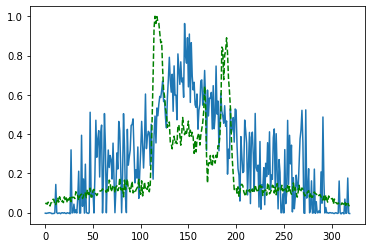

Time taken for epoch:  145.7642834186554
Epoch = [ 86/3000]  Iter = [   0/39480]  Loss = 0.1913 Avg Loss = 0.1913  Time = 0.0753s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 86/3000]  Iter = [ 100/39480]  Loss = 0.214 Avg Loss = 0.2086  Time = 0.0034s
Epoch = [ 86/3000]  Iter = [ 200/39480]  Loss = 0.1775 Avg Loss = 0.2148  Time = 0.0034s
Epoch = [ 86/3000]  Iter = [ 300/39480]  Loss = 0.2037 Avg Loss = 0.2168  Time = 0.0032s
Epoch = [ 86/3000]  Iter = [ 400/39480]  Loss = 0.2138 Avg Loss = 0.2171  Time = 0.0032s
Epoch = [ 86/3000]  Iter = [ 500/39480]  Loss = 0.2551 Avg Loss = 0.2164  Time = 0.0030s
Epoch = [ 86/3000]  Iter = [ 600/39480]  Loss = 0.2277 Avg Loss = 0.2236  Time = 0.0034s
Epoch = [ 86/3000]  Iter = [ 700/39480]  Loss = 0.2672 Avg Loss = 0.2211  Time = 0.0033s
Epoch = [ 86/3000]  Iter = [ 800/39480]  Loss = 0.3539 Avg Loss = 0.2164  Time = 0.0030s
Epoch = [ 86/3000]  Iter = [ 900/39480]  Loss = 0.2557 Avg Loss = 0.2197  Time = 0.0030s
Epoch = [ 86/3000]  Iter = [1000/39480]  Loss = 0.2049 Avg Loss = 0.2158  Time = 0.0031s
Epoch = [ 86/3000]  Iter = [1100/39480]  Loss = 0.1966 Avg Loss = 0.2194  Time = 0.0031s
Epoch = [ 86/3000]  It

Epoch = [ 86/3000]  Iter = [9400/39480]  Loss = 0.2942 Avg Loss = 0.2221  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [9500/39480]  Loss = 0.2255 Avg Loss = 0.2215  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [9600/39480]  Loss = 0.1817 Avg Loss = 0.216  Time = 0.0032s
Epoch = [ 86/3000]  Iter = [9700/39480]  Loss = 0.2413 Avg Loss = 0.2197  Time = 0.0032s
Epoch = [ 86/3000]  Iter = [9800/39480]  Loss = 0.2173 Avg Loss = 0.2189  Time = 0.0031s
Epoch = [ 86/3000]  Iter = [9900/39480]  Loss = 0.2101 Avg Loss = 0.2214  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [10000/39480]  Loss = 0.1968 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [10100/39480]  Loss = 0.2194 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [10200/39480]  Loss = 0.2227 Avg Loss = 0.2203  Time = 0.0030s
Epoch = [ 86/3000]  Iter = [10300/39480]  Loss = 0.213 Avg Loss = 0.2156  Time = 0.0030s
Epoch = [ 86/3000]  Iter = [10400/39480]  Loss = 0.1996 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 86/3000]

Epoch = [ 86/3000]  Iter = [18600/39480]  Loss = 0.1974 Avg Loss = 0.2182  Time = 0.0033s
Epoch = [ 86/3000]  Iter = [18700/39480]  Loss = 0.2189 Avg Loss = 0.2232  Time = 0.0033s
Epoch = [ 86/3000]  Iter = [18800/39480]  Loss = 0.2185 Avg Loss = 0.2211  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [18900/39480]  Loss = 0.2525 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [19000/39480]  Loss = 0.206 Avg Loss = 0.2165  Time = 0.0031s
Epoch = [ 86/3000]  Iter = [19100/39480]  Loss = 0.1907 Avg Loss = 0.215  Time = 0.0032s
Epoch = [ 86/3000]  Iter = [19200/39480]  Loss = 0.2285 Avg Loss = 0.2233  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [19300/39480]  Loss = 0.2417 Avg Loss = 0.2159  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [19400/39480]  Loss = 0.1839 Avg Loss = 0.2209  Time = 0.0030s
Epoch = [ 86/3000]  Iter = [19500/39480]  Loss = 0.1989 Avg Loss = 0.2181  Time = 0.0030s
Epoch = [ 86/3000]  Iter = [19600/39480]  Loss = 0.2275 Avg Loss = 0.2194  Time = 0.0031s
Epoch = [ 86

Epoch = [ 86/3000]  Iter = [27800/39480]  Loss = 0.2179 Avg Loss = 0.2178  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [27900/39480]  Loss = 0.2025 Avg Loss = 0.2203  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [28000/39480]  Loss = 0.2262 Avg Loss = 0.2189  Time = 0.0033s
Epoch = [ 86/3000]  Iter = [28100/39480]  Loss = 0.1767 Avg Loss = 0.2161  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [28200/39480]  Loss = 0.2324 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [28300/39480]  Loss = 0.2005 Avg Loss = 0.2197  Time = 0.0030s
Epoch = [ 86/3000]  Iter = [28400/39480]  Loss = 0.2092 Avg Loss = 0.2194  Time = 0.0033s
Epoch = [ 86/3000]  Iter = [28500/39480]  Loss = 0.2276 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [28600/39480]  Loss = 0.2077 Avg Loss = 0.2192  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [28700/39480]  Loss = 0.1848 Avg Loss = 0.2211  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [28800/39480]  Loss = 0.208 Avg Loss = 0.2181  Time = 0.0033s
Epoch = [ 8

Epoch = [ 86/3000]  Iter = [37000/39480]  Loss = 0.2299 Avg Loss = 0.2177  Time = 0.0032s
Epoch = [ 86/3000]  Iter = [37100/39480]  Loss = 0.2113 Avg Loss = 0.2194  Time = 0.0033s
Epoch = [ 86/3000]  Iter = [37200/39480]  Loss = 0.2143 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 86/3000]  Iter = [37300/39480]  Loss = 0.2212 Avg Loss = 0.2207  Time = 0.0032s
Epoch = [ 86/3000]  Iter = [37400/39480]  Loss = 0.193 Avg Loss = 0.2173  Time = 0.0033s
Epoch = [ 86/3000]  Iter = [37500/39480]  Loss = 0.2099 Avg Loss = 0.2204  Time = 0.0033s
Epoch = [ 86/3000]  Iter = [37600/39480]  Loss = 0.2176 Avg Loss = 0.2152  Time = 0.0033s
Epoch = [ 86/3000]  Iter = [37700/39480]  Loss = 0.225 Avg Loss = 0.2198  Time = 0.0030s
Epoch = [ 86/3000]  Iter = [37800/39480]  Loss = 0.2294 Avg Loss = 0.2138  Time = 0.0030s
Epoch = [ 86/3000]  Iter = [37900/39480]  Loss = 0.2082 Avg Loss = 0.2161  Time = 0.0030s
Epoch = [ 86/3000]  Iter = [38000/39480]  Loss = 0.2286 Avg Loss = 0.2164  Time = 0.0029s
Epoch = [ 86/

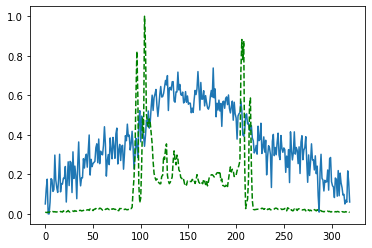

Time taken for epoch:  143.70348048210144
Epoch = [ 87/3000]  Iter = [   0/39480]  Loss = 0.2164 Avg Loss = 0.2164  Time = 0.0777s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 87/3000]  Iter = [ 100/39480]  Loss = 0.2039 Avg Loss = 0.2164  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [ 200/39480]  Loss = 0.2314 Avg Loss = 0.2181  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [ 300/39480]  Loss = 0.2425 Avg Loss = 0.2185  Time = 0.0032s
Epoch = [ 87/3000]  Iter = [ 400/39480]  Loss = 0.1848 Avg Loss = 0.2237  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [ 500/39480]  Loss = 0.2299 Avg Loss = 0.2218  Time = 0.0032s
Epoch = [ 87/3000]  Iter = [ 600/39480]  Loss = 0.2083 Avg Loss = 0.2163  Time = 0.0029s
Epoch = [ 87/3000]  Iter = [ 700/39480]  Loss = 0.2451 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [ 800/39480]  Loss = 0.2592 Avg Loss = 0.2196  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [ 900/39480]  Loss = 0.2355 Avg Loss = 0.2232  Time = 0.0032s
Epoch = [ 87/3000]  Iter = [1000/39480]  Loss = 0.242 Avg Loss = 0.2139  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [1100/39480]  Loss = 0.2149 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 87/3000]  Ite

Epoch = [ 87/3000]  Iter = [9400/39480]  Loss = 0.2282 Avg Loss = 0.2174  Time = 0.0034s
Epoch = [ 87/3000]  Iter = [9500/39480]  Loss = 0.2053 Avg Loss = 0.2236  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [9600/39480]  Loss = 0.2006 Avg Loss = 0.2173  Time = 0.0033s
Epoch = [ 87/3000]  Iter = [9700/39480]  Loss = 0.2497 Avg Loss = 0.217  Time = 0.0033s
Epoch = [ 87/3000]  Iter = [9800/39480]  Loss = 0.2176 Avg Loss = 0.2183  Time = 0.0033s
Epoch = [ 87/3000]  Iter = [9900/39480]  Loss = 0.2016 Avg Loss = 0.2187  Time = 0.0033s
Epoch = [ 87/3000]  Iter = [10000/39480]  Loss = 0.2225 Avg Loss = 0.218  Time = 0.0033s
Epoch = [ 87/3000]  Iter = [10100/39480]  Loss = 0.2447 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [10200/39480]  Loss = 0.1996 Avg Loss = 0.2169  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [10300/39480]  Loss = 0.2264 Avg Loss = 0.2175  Time = 0.0033s
Epoch = [ 87/3000]  Iter = [10400/39480]  Loss = 0.2339 Avg Loss = 0.216  Time = 0.0030s
Epoch = [ 87/3000] 

Epoch = [ 87/3000]  Iter = [18600/39480]  Loss = 0.2066 Avg Loss = 0.2184  Time = 0.0029s
Epoch = [ 87/3000]  Iter = [18700/39480]  Loss = 0.2246 Avg Loss = 0.2195  Time = 0.0029s
Epoch = [ 87/3000]  Iter = [18800/39480]  Loss = 0.3038 Avg Loss = 0.2193  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [18900/39480]  Loss = 0.2143 Avg Loss = 0.2199  Time = 0.0033s
Epoch = [ 87/3000]  Iter = [19000/39480]  Loss = 0.2247 Avg Loss = 0.2209  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [19100/39480]  Loss = 0.2152 Avg Loss = 0.2162  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [19200/39480]  Loss = 0.1659 Avg Loss = 0.2144  Time = 0.0029s
Epoch = [ 87/3000]  Iter = [19300/39480]  Loss = 0.2179 Avg Loss = 0.2156  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [19400/39480]  Loss = 0.1784 Avg Loss = 0.2166  Time = 0.0029s
Epoch = [ 87/3000]  Iter = [19500/39480]  Loss = 0.1969 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 87/3000]  Iter = [19600/39480]  Loss = 0.186 Avg Loss = 0.2141  Time = 0.0030s
Epoch = [ 8

Epoch = [ 87/3000]  Iter = [27800/39480]  Loss = 0.26 Avg Loss = 0.218  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [27900/39480]  Loss = 0.1946 Avg Loss = 0.2162  Time = 0.0028s
Epoch = [ 87/3000]  Iter = [28000/39480]  Loss = 0.2352 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [28100/39480]  Loss = 0.2323 Avg Loss = 0.2174  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [28200/39480]  Loss = 0.2152 Avg Loss = 0.2188  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [28300/39480]  Loss = 0.2271 Avg Loss = 0.2198  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [28400/39480]  Loss = 0.1838 Avg Loss = 0.2217  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [28500/39480]  Loss = 0.2072 Avg Loss = 0.22  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [28600/39480]  Loss = 0.2246 Avg Loss = 0.2156  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [28700/39480]  Loss = 0.2972 Avg Loss = 0.2135  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [28800/39480]  Loss = 0.2294 Avg Loss = 0.2145  Time = 0.0031s
Epoch = [ 87/30

Epoch = [ 87/3000]  Iter = [37000/39480]  Loss = 0.2133 Avg Loss = 0.2207  Time = 0.0029s
Epoch = [ 87/3000]  Iter = [37100/39480]  Loss = 0.2031 Avg Loss = 0.2202  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [37200/39480]  Loss = 0.2082 Avg Loss = 0.2174  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [37300/39480]  Loss = 0.21 Avg Loss = 0.2186  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [37400/39480]  Loss = 0.2413 Avg Loss = 0.222  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [37500/39480]  Loss = 0.2142 Avg Loss = 0.2188  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [37600/39480]  Loss = 0.2173 Avg Loss = 0.2168  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [37700/39480]  Loss = 0.2306 Avg Loss = 0.2204  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [37800/39480]  Loss = 0.2147 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 87/3000]  Iter = [37900/39480]  Loss = 0.2586 Avg Loss = 0.222  Time = 0.0031s
Epoch = [ 87/3000]  Iter = [38000/39480]  Loss = 0.1947 Avg Loss = 0.2149  Time = 0.0031s
Epoch = [ 87/3

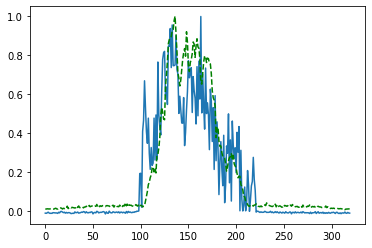

Time taken for epoch:  142.6618616580963
Epoch = [ 88/3000]  Iter = [   0/39480]  Loss = 0.2192 Avg Loss = 0.2192  Time = 0.0735s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 88/3000]  Iter = [ 100/39480]  Loss = 0.2359 Avg Loss = 0.2173  Time = 0.0032s
Epoch = [ 88/3000]  Iter = [ 200/39480]  Loss = 0.2624 Avg Loss = 0.2172  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [ 300/39480]  Loss = 0.2268 Avg Loss = 0.2224  Time = 0.0032s
Epoch = [ 88/3000]  Iter = [ 400/39480]  Loss = 0.234 Avg Loss = 0.2167  Time = 0.0032s
Epoch = [ 88/3000]  Iter = [ 500/39480]  Loss = 0.2674 Avg Loss = 0.225  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [ 600/39480]  Loss = 0.2304 Avg Loss = 0.2227  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [ 700/39480]  Loss = 0.2215 Avg Loss = 0.2204  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [ 800/39480]  Loss = 0.2401 Avg Loss = 0.2203  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [ 900/39480]  Loss = 0.257 Avg Loss = 0.2167  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [1000/39480]  Loss = 0.2016 Avg Loss = 0.2159  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [1100/39480]  Loss = 0.1982 Avg Loss = 0.2156  Time = 0.0029s
Epoch = [ 88/3000]  Iter

Epoch = [ 88/3000]  Iter = [9400/39480]  Loss = 0.2107 Avg Loss = 0.2161  Time = 0.0031s
Epoch = [ 88/3000]  Iter = [9500/39480]  Loss = 0.2443 Avg Loss = 0.22  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [9600/39480]  Loss = 0.2407 Avg Loss = 0.2213  Time = 0.0032s
Epoch = [ 88/3000]  Iter = [9700/39480]  Loss = 0.2034 Avg Loss = 0.2198  Time = 0.0037s
Epoch = [ 88/3000]  Iter = [9800/39480]  Loss = 0.2244 Avg Loss = 0.2226  Time = 0.0031s
Epoch = [ 88/3000]  Iter = [9900/39480]  Loss = 0.2095 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 88/3000]  Iter = [10000/39480]  Loss = 0.2473 Avg Loss = 0.2146  Time = 0.0032s
Epoch = [ 88/3000]  Iter = [10100/39480]  Loss = 0.2179 Avg Loss = 0.2134  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [10200/39480]  Loss = 0.1971 Avg Loss = 0.2144  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [10300/39480]  Loss = 0.2463 Avg Loss = 0.2218  Time = 0.0033s
Epoch = [ 88/3000]  Iter = [10400/39480]  Loss = 0.1968 Avg Loss = 0.2164  Time = 0.0033s
Epoch = [ 88/3000] 

Epoch = [ 88/3000]  Iter = [18600/39480]  Loss = 0.2008 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 88/3000]  Iter = [18700/39480]  Loss = 0.1989 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 88/3000]  Iter = [18800/39480]  Loss = 0.2369 Avg Loss = 0.2185  Time = 0.0029s
Epoch = [ 88/3000]  Iter = [18900/39480]  Loss = 0.2428 Avg Loss = 0.2185  Time = 0.0033s
Epoch = [ 88/3000]  Iter = [19000/39480]  Loss = 0.2214 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 88/3000]  Iter = [19100/39480]  Loss = 0.1712 Avg Loss = 0.2158  Time = 0.0029s
Epoch = [ 88/3000]  Iter = [19200/39480]  Loss = 0.2062 Avg Loss = 0.2198  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [19300/39480]  Loss = 0.2585 Avg Loss = 0.2175  Time = 0.0031s
Epoch = [ 88/3000]  Iter = [19400/39480]  Loss = 0.2397 Avg Loss = 0.2163  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [19500/39480]  Loss = 0.2049 Avg Loss = 0.2175  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [19600/39480]  Loss = 0.2168 Avg Loss = 0.2199  Time = 0.0030s
Epoch = [ 

Epoch = [ 88/3000]  Iter = [27800/39480]  Loss = 0.2243 Avg Loss = 0.2185  Time = 0.0035s
Epoch = [ 88/3000]  Iter = [27900/39480]  Loss = 0.2027 Avg Loss = 0.2168  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [28000/39480]  Loss = 0.2136 Avg Loss = 0.2204  Time = 0.0033s
Epoch = [ 88/3000]  Iter = [28100/39480]  Loss = 0.2143 Avg Loss = 0.217  Time = 0.0032s
Epoch = [ 88/3000]  Iter = [28200/39480]  Loss = 0.1893 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 88/3000]  Iter = [28300/39480]  Loss = 0.241 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 88/3000]  Iter = [28400/39480]  Loss = 0.2339 Avg Loss = 0.2212  Time = 0.0031s
Epoch = [ 88/3000]  Iter = [28500/39480]  Loss = 0.2075 Avg Loss = 0.2194  Time = 0.0033s
Epoch = [ 88/3000]  Iter = [28600/39480]  Loss = 0.196 Avg Loss = 0.2186  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [28700/39480]  Loss = 0.202 Avg Loss = 0.2165  Time = 0.0031s
Epoch = [ 88/3000]  Iter = [28800/39480]  Loss = 0.2309 Avg Loss = 0.2166  Time = 0.0030s
Epoch = [ 88/3

Epoch = [ 88/3000]  Iter = [37000/39480]  Loss = 0.2066 Avg Loss = 0.2204  Time = 0.0033s
Epoch = [ 88/3000]  Iter = [37100/39480]  Loss = 0.2137 Avg Loss = 0.222  Time = 0.0033s
Epoch = [ 88/3000]  Iter = [37200/39480]  Loss = 0.2431 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [37300/39480]  Loss = 0.2225 Avg Loss = 0.2186  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [37400/39480]  Loss = 0.2458 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [37500/39480]  Loss = 0.2509 Avg Loss = 0.2204  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [37600/39480]  Loss = 0.213 Avg Loss = 0.2158  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [37700/39480]  Loss = 0.2026 Avg Loss = 0.2153  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [37800/39480]  Loss = 0.2303 Avg Loss = 0.2221  Time = 0.0031s
Epoch = [ 88/3000]  Iter = [37900/39480]  Loss = 0.2088 Avg Loss = 0.2205  Time = 0.0030s
Epoch = [ 88/3000]  Iter = [38000/39480]  Loss = 0.2384 Avg Loss = 0.2187  Time = 0.0030s
Epoch = [ 88

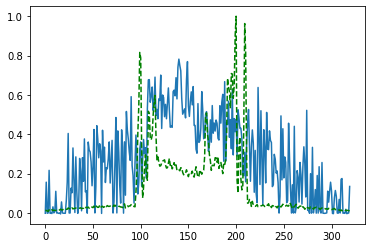

Time taken for epoch:  142.32870078086853
Epoch = [ 89/3000]  Iter = [   0/39480]  Loss = 0.2269 Avg Loss = 0.2269  Time = 0.0764s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 89/3000]  Iter = [ 100/39480]  Loss = 0.2263 Avg Loss = 0.217  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [ 200/39480]  Loss = 0.2255 Avg Loss = 0.219  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [ 300/39480]  Loss = 0.2285 Avg Loss = 0.2168  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [ 400/39480]  Loss = 0.208 Avg Loss = 0.2171  Time = 0.0033s
Epoch = [ 89/3000]  Iter = [ 500/39480]  Loss = 0.2484 Avg Loss = 0.2194  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [ 600/39480]  Loss = 0.2349 Avg Loss = 0.2176  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [ 700/39480]  Loss = 0.2649 Avg Loss = 0.2263  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [ 800/39480]  Loss = 0.2016 Avg Loss = 0.2202  Time = 0.0032s
Epoch = [ 89/3000]  Iter = [ 900/39480]  Loss = 0.2132 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [1000/39480]  Loss = 0.2447 Avg Loss = 0.2198  Time = 0.0033s
Epoch = [ 89/3000]  Iter = [1100/39480]  Loss = 0.2272 Avg Loss = 0.2173  Time = 0.0029s
Epoch = [ 89/3000]  Iter

Epoch = [ 89/3000]  Iter = [9400/39480]  Loss = 0.2468 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [9500/39480]  Loss = 0.2152 Avg Loss = 0.2155  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [9600/39480]  Loss = 0.2076 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [9700/39480]  Loss = 0.2533 Avg Loss = 0.2181  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [9800/39480]  Loss = 0.1929 Avg Loss = 0.2182  Time = 0.0029s
Epoch = [ 89/3000]  Iter = [9900/39480]  Loss = 0.2291 Avg Loss = 0.2154  Time = 0.0032s
Epoch = [ 89/3000]  Iter = [10000/39480]  Loss = 0.2035 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [10100/39480]  Loss = 0.2158 Avg Loss = 0.2148  Time = 0.0032s
Epoch = [ 89/3000]  Iter = [10200/39480]  Loss = 0.1867 Avg Loss = 0.2128  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [10300/39480]  Loss = 0.2137 Avg Loss = 0.2208  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [10400/39480]  Loss = 0.2742 Avg Loss = 0.2198  Time = 0.0030s
Epoch = [ 89/3000

Epoch = [ 89/3000]  Iter = [18600/39480]  Loss = 0.2534 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [18700/39480]  Loss = 0.2193 Avg Loss = 0.2162  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [18800/39480]  Loss = 0.2253 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 89/3000]  Iter = [18900/39480]  Loss = 0.2479 Avg Loss = 0.2171  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [19000/39480]  Loss = 0.2284 Avg Loss = 0.2242  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [19100/39480]  Loss = 0.2177 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [19200/39480]  Loss = 0.2531 Avg Loss = 0.224  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [19300/39480]  Loss = 0.2377 Avg Loss = 0.2222  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [19400/39480]  Loss = 0.2164 Avg Loss = 0.2216  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [19500/39480]  Loss = 0.2151 Avg Loss = 0.2159  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [19600/39480]  Loss = 0.1982 Avg Loss = 0.2209  Time = 0.0030s
Epoch = [ 89

Epoch = [ 89/3000]  Iter = [27800/39480]  Loss = 0.2131 Avg Loss = 0.2242  Time = 0.0028s
Epoch = [ 89/3000]  Iter = [27900/39480]  Loss = 0.3139 Avg Loss = 0.2215  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [28000/39480]  Loss = 0.1849 Avg Loss = 0.2206  Time = 0.0032s
Epoch = [ 89/3000]  Iter = [28100/39480]  Loss = 0.2092 Avg Loss = 0.2158  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [28200/39480]  Loss = 0.2113 Avg Loss = 0.2194  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [28300/39480]  Loss = 0.2129 Avg Loss = 0.2217  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [28400/39480]  Loss = 0.225 Avg Loss = 0.2198  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [28500/39480]  Loss = 0.2545 Avg Loss = 0.2196  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [28600/39480]  Loss = 0.2659 Avg Loss = 0.2183  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [28700/39480]  Loss = 0.2428 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [28800/39480]  Loss = 0.2169 Avg Loss = 0.215  Time = 0.0026s
Epoch = [ 89

Epoch = [ 89/3000]  Iter = [37000/39480]  Loss = 0.2026 Avg Loss = 0.22  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [37100/39480]  Loss = 0.1974 Avg Loss = 0.2193  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [37200/39480]  Loss = 0.2094 Avg Loss = 0.2162  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [37300/39480]  Loss = 0.216 Avg Loss = 0.2142  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [37400/39480]  Loss = 0.2425 Avg Loss = 0.2155  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [37500/39480]  Loss = 0.2172 Avg Loss = 0.2155  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [37600/39480]  Loss = 0.2395 Avg Loss = 0.2188  Time = 0.0029s
Epoch = [ 89/3000]  Iter = [37700/39480]  Loss = 0.2024 Avg Loss = 0.2165  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [37800/39480]  Loss = 0.2021 Avg Loss = 0.2179  Time = 0.0031s
Epoch = [ 89/3000]  Iter = [37900/39480]  Loss = 0.2245 Avg Loss = 0.2199  Time = 0.0030s
Epoch = [ 89/3000]  Iter = [38000/39480]  Loss = 0.2156 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 89/

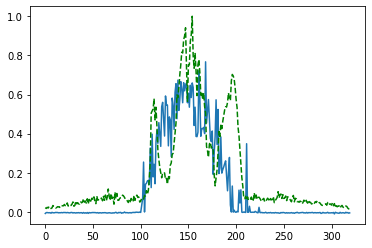

Time taken for epoch:  141.9577522277832
Epoch = [ 90/3000]  Iter = [   0/39480]  Loss = 0.2074 Avg Loss = 0.2074  Time = 0.0768s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 90/3000]  Iter = [ 100/39480]  Loss = 0.2327 Avg Loss = 0.2187  Time = 0.0034s
Epoch = [ 90/3000]  Iter = [ 200/39480]  Loss = 0.2155 Avg Loss = 0.2254  Time = 0.0034s
Epoch = [ 90/3000]  Iter = [ 300/39480]  Loss = 0.2168 Avg Loss = 0.2148  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [ 400/39480]  Loss = 0.1965 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [ 90/3000]  Iter = [ 500/39480]  Loss = 0.2482 Avg Loss = 0.2225  Time = 0.0033s
Epoch = [ 90/3000]  Iter = [ 600/39480]  Loss = 0.2208 Avg Loss = 0.222  Time = 0.0031s
Epoch = [ 90/3000]  Iter = [ 700/39480]  Loss = 0.2028 Avg Loss = 0.2188  Time = 0.0033s
Epoch = [ 90/3000]  Iter = [ 800/39480]  Loss = 0.1949 Avg Loss = 0.2193  Time = 0.0031s
Epoch = [ 90/3000]  Iter = [ 900/39480]  Loss = 0.261 Avg Loss = 0.2162  Time = 0.0033s
Epoch = [ 90/3000]  Iter = [1000/39480]  Loss = 0.2297 Avg Loss = 0.2178  Time = 0.0031s
Epoch = [ 90/3000]  Iter = [1100/39480]  Loss = 0.2328 Avg Loss = 0.2173  Time = 0.0033s
Epoch = [ 90/3000]  Ite

Epoch = [ 90/3000]  Iter = [9400/39480]  Loss = 0.1867 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [9500/39480]  Loss = 0.2079 Avg Loss = 0.2184  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [9600/39480]  Loss = 0.206 Avg Loss = 0.2143  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [9700/39480]  Loss = 0.2396 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 90/3000]  Iter = [9800/39480]  Loss = 0.2593 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [9900/39480]  Loss = 0.1818 Avg Loss = 0.2152  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [10000/39480]  Loss = 0.2232 Avg Loss = 0.2152  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [10100/39480]  Loss = 0.2122 Avg Loss = 0.2159  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [10200/39480]  Loss = 0.1975 Avg Loss = 0.216  Time = 0.0029s
Epoch = [ 90/3000]  Iter = [10300/39480]  Loss = 0.2595 Avg Loss = 0.217  Time = 0.0032s
Epoch = [ 90/3000]  Iter = [10400/39480]  Loss = 0.2115 Avg Loss = 0.2202  Time = 0.0030s
Epoch = [ 90/3000] 

Epoch = [ 90/3000]  Iter = [18600/39480]  Loss = 0.2369 Avg Loss = 0.2154  Time = 0.0032s
Epoch = [ 90/3000]  Iter = [18700/39480]  Loss = 0.1915 Avg Loss = 0.2154  Time = 0.0028s
Epoch = [ 90/3000]  Iter = [18800/39480]  Loss = 0.1995 Avg Loss = 0.2218  Time = 0.0031s
Epoch = [ 90/3000]  Iter = [18900/39480]  Loss = 0.2516 Avg Loss = 0.2149  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [19000/39480]  Loss = 0.2269 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [19100/39480]  Loss = 0.1996 Avg Loss = 0.2184  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [19200/39480]  Loss = 0.2011 Avg Loss = 0.2177  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [19300/39480]  Loss = 0.2272 Avg Loss = 0.2187  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [19400/39480]  Loss = 0.2125 Avg Loss = 0.2151  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [19500/39480]  Loss = 0.231 Avg Loss = 0.2154  Time = 0.0032s
Epoch = [ 90/3000]  Iter = [19600/39480]  Loss = 0.2168 Avg Loss = 0.2246  Time = 0.0032s
Epoch = [ 9

Epoch = [ 90/3000]  Iter = [27800/39480]  Loss = 0.2047 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [27900/39480]  Loss = 0.1973 Avg Loss = 0.2191  Time = 0.0029s
Epoch = [ 90/3000]  Iter = [28000/39480]  Loss = 0.2136 Avg Loss = 0.2195  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [28100/39480]  Loss = 0.2189 Avg Loss = 0.2165  Time = 0.0029s
Epoch = [ 90/3000]  Iter = [28200/39480]  Loss = 0.2295 Avg Loss = 0.2206  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [28300/39480]  Loss = 0.2205 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [28400/39480]  Loss = 0.2443 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [28500/39480]  Loss = 0.2705 Avg Loss = 0.2201  Time = 0.0032s
Epoch = [ 90/3000]  Iter = [28600/39480]  Loss = 0.2036 Avg Loss = 0.2195  Time = 0.0031s
Epoch = [ 90/3000]  Iter = [28700/39480]  Loss = 0.2373 Avg Loss = 0.2167  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [28800/39480]  Loss = 0.2243 Avg Loss = 0.2139  Time = 0.0030s
Epoch = [ 

Epoch = [ 90/3000]  Iter = [37000/39480]  Loss = 0.1983 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [37100/39480]  Loss = 0.2243 Avg Loss = 0.2185  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [37200/39480]  Loss = 0.2458 Avg Loss = 0.2161  Time = 0.0031s
Epoch = [ 90/3000]  Iter = [37300/39480]  Loss = 0.23 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 90/3000]  Iter = [37400/39480]  Loss = 0.1867 Avg Loss = 0.2189  Time = 0.0029s
Epoch = [ 90/3000]  Iter = [37500/39480]  Loss = 0.1987 Avg Loss = 0.2158  Time = 0.0031s
Epoch = [ 90/3000]  Iter = [37600/39480]  Loss = 0.2038 Avg Loss = 0.218  Time = 0.0031s
Epoch = [ 90/3000]  Iter = [37700/39480]  Loss = 0.2347 Avg Loss = 0.2194  Time = 0.0030s
Epoch = [ 90/3000]  Iter = [37800/39480]  Loss = 0.2115 Avg Loss = 0.2157  Time = 0.0031s
Epoch = [ 90/3000]  Iter = [37900/39480]  Loss = 0.1794 Avg Loss = 0.2144  Time = 0.0031s
Epoch = [ 90/3000]  Iter = [38000/39480]  Loss = 0.1948 Avg Loss = 0.2156  Time = 0.0033s
Epoch = [ 90/

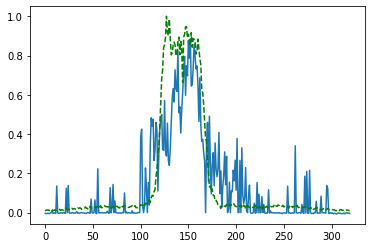

Time taken for epoch:  142.45018577575684
Epoch = [ 91/3000]  Iter = [   0/39480]  Loss = 0.193 Avg Loss = 0.193  Time = 0.0900s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 91/3000]  Iter = [ 100/39480]  Loss = 0.2241 Avg Loss = 0.2092  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [ 200/39480]  Loss = 0.227 Avg Loss = 0.218  Time = 0.0031s
Epoch = [ 91/3000]  Iter = [ 300/39480]  Loss = 0.2263 Avg Loss = 0.2169  Time = 0.0032s
Epoch = [ 91/3000]  Iter = [ 400/39480]  Loss = 0.2093 Avg Loss = 0.2171  Time = 0.0033s
Epoch = [ 91/3000]  Iter = [ 500/39480]  Loss = 0.2272 Avg Loss = 0.2162  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [ 600/39480]  Loss = 0.234 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [ 700/39480]  Loss = 0.2512 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 91/3000]  Iter = [ 800/39480]  Loss = 0.2357 Avg Loss = 0.2222  Time = 0.0031s
Epoch = [ 91/3000]  Iter = [ 900/39480]  Loss = 0.2059 Avg Loss = 0.219  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [1000/39480]  Loss = 0.1966 Avg Loss = 0.2149  Time = 0.0031s
Epoch = [ 91/3000]  Iter = [1100/39480]  Loss = 0.2147 Avg Loss = 0.2161  Time = 0.0031s
Epoch = [ 91/3000]  Iter 

Epoch = [ 91/3000]  Iter = [9400/39480]  Loss = 0.2314 Avg Loss = 0.2181  Time = 0.0031s
Epoch = [ 91/3000]  Iter = [9500/39480]  Loss = 0.2342 Avg Loss = 0.2143  Time = 0.0029s
Epoch = [ 91/3000]  Iter = [9600/39480]  Loss = 0.2115 Avg Loss = 0.2184  Time = 0.0032s
Epoch = [ 91/3000]  Iter = [9700/39480]  Loss = 0.2233 Avg Loss = 0.2196  Time = 0.0031s
Epoch = [ 91/3000]  Iter = [9800/39480]  Loss = 0.1969 Avg Loss = 0.2154  Time = 0.0032s
Epoch = [ 91/3000]  Iter = [9900/39480]  Loss = 0.2215 Avg Loss = 0.2181  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [10000/39480]  Loss = 0.2176 Avg Loss = 0.2194  Time = 0.0033s
Epoch = [ 91/3000]  Iter = [10100/39480]  Loss = 0.2222 Avg Loss = 0.2153  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [10200/39480]  Loss = 0.286 Avg Loss = 0.2179  Time = 0.0032s
Epoch = [ 91/3000]  Iter = [10300/39480]  Loss = 0.1946 Avg Loss = 0.2171  Time = 0.0032s
Epoch = [ 91/3000]  Iter = [10400/39480]  Loss = 0.1837 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [ 91/3000

Epoch = [ 91/3000]  Iter = [18600/39480]  Loss = 0.2121 Avg Loss = 0.2144  Time = 0.0029s
Epoch = [ 91/3000]  Iter = [18700/39480]  Loss = 0.2213 Avg Loss = 0.2195  Time = 0.0029s
Epoch = [ 91/3000]  Iter = [18800/39480]  Loss = 0.2166 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 91/3000]  Iter = [18900/39480]  Loss = 0.2516 Avg Loss = 0.2195  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [19000/39480]  Loss = 0.2235 Avg Loss = 0.2163  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [19100/39480]  Loss = 0.2217 Avg Loss = 0.2179  Time = 0.0031s
Epoch = [ 91/3000]  Iter = [19200/39480]  Loss = 0.2134 Avg Loss = 0.221  Time = 0.0031s
Epoch = [ 91/3000]  Iter = [19300/39480]  Loss = 0.2022 Avg Loss = 0.2163  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [19400/39480]  Loss = 0.2398 Avg Loss = 0.2219  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [19500/39480]  Loss = 0.1975 Avg Loss = 0.2173  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [19600/39480]  Loss = 0.2129 Avg Loss = 0.2155  Time = 0.0030s
Epoch = [ 9

Epoch = [ 91/3000]  Iter = [27800/39480]  Loss = 0.2422 Avg Loss = 0.2229  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [27900/39480]  Loss = 0.2027 Avg Loss = 0.2159  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [28000/39480]  Loss = 0.2246 Avg Loss = 0.2145  Time = 0.0029s
Epoch = [ 91/3000]  Iter = [28100/39480]  Loss = 0.216 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 91/3000]  Iter = [28200/39480]  Loss = 0.234 Avg Loss = 0.221  Time = 0.0029s
Epoch = [ 91/3000]  Iter = [28300/39480]  Loss = 0.2361 Avg Loss = 0.2186  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [28400/39480]  Loss = 0.2282 Avg Loss = 0.2201  Time = 0.0031s
Epoch = [ 91/3000]  Iter = [28500/39480]  Loss = 0.2199 Avg Loss = 0.2172  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [28600/39480]  Loss = 0.2552 Avg Loss = 0.2179  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [28700/39480]  Loss = 0.1955 Avg Loss = 0.2198  Time = 0.0031s
Epoch = [ 91/3000]  Iter = [28800/39480]  Loss = 0.2123 Avg Loss = 0.2233  Time = 0.0030s
Epoch = [ 91/

Epoch = [ 91/3000]  Iter = [37000/39480]  Loss = 0.2001 Avg Loss = 0.2182  Time = 0.0031s
Epoch = [ 91/3000]  Iter = [37100/39480]  Loss = 0.2349 Avg Loss = 0.2202  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [37200/39480]  Loss = 0.2455 Avg Loss = 0.2206  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [37300/39480]  Loss = 0.2334 Avg Loss = 0.2163  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [37400/39480]  Loss = 0.167 Avg Loss = 0.2145  Time = 0.0028s
Epoch = [ 91/3000]  Iter = [37500/39480]  Loss = 0.2183 Avg Loss = 0.2176  Time = 0.0029s
Epoch = [ 91/3000]  Iter = [37600/39480]  Loss = 0.1854 Avg Loss = 0.2162  Time = 0.0029s
Epoch = [ 91/3000]  Iter = [37700/39480]  Loss = 0.2438 Avg Loss = 0.2158  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [37800/39480]  Loss = 0.2304 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [37900/39480]  Loss = 0.2121 Avg Loss = 0.2198  Time = 0.0030s
Epoch = [ 91/3000]  Iter = [38000/39480]  Loss = 0.2058 Avg Loss = 0.22  Time = 0.0030s
Epoch = [ 91/

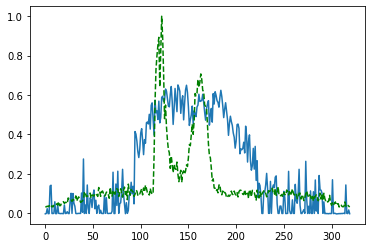

Time taken for epoch:  143.33607983589172
Epoch = [ 92/3000]  Iter = [   0/39480]  Loss = 0.1789 Avg Loss = 0.1789  Time = 0.0784s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 92/3000]  Iter = [ 100/39480]  Loss = 0.2219 Avg Loss = 0.2011  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [ 200/39480]  Loss = 0.2156 Avg Loss = 0.2119  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [ 300/39480]  Loss = 0.2181 Avg Loss = 0.2188  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [ 400/39480]  Loss = 0.2209 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [ 500/39480]  Loss = 0.2297 Avg Loss = 0.2187  Time = 0.0033s
Epoch = [ 92/3000]  Iter = [ 600/39480]  Loss = 0.2426 Avg Loss = 0.2156  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [ 700/39480]  Loss = 0.2306 Avg Loss = 0.2201  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [ 800/39480]  Loss = 0.2392 Avg Loss = 0.2189  Time = 0.0031s
Epoch = [ 92/3000]  Iter = [ 900/39480]  Loss = 0.2024 Avg Loss = 0.2217  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [1000/39480]  Loss = 0.2159 Avg Loss = 0.221  Time = 0.0029s
Epoch = [ 92/3000]  Iter = [1100/39480]  Loss = 0.2453 Avg Loss = 0.2191  Time = 0.0032s
Epoch = [ 92/3000]  It

Epoch = [ 92/3000]  Iter = [9400/39480]  Loss = 0.2344 Avg Loss = 0.2191  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [9500/39480]  Loss = 0.2123 Avg Loss = 0.2143  Time = 0.0031s
Epoch = [ 92/3000]  Iter = [9600/39480]  Loss = 0.2332 Avg Loss = 0.2158  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [9700/39480]  Loss = 0.1955 Avg Loss = 0.2149  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [9800/39480]  Loss = 0.229 Avg Loss = 0.2206  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [9900/39480]  Loss = 0.2311 Avg Loss = 0.2194  Time = 0.0028s
Epoch = [ 92/3000]  Iter = [10000/39480]  Loss = 0.2128 Avg Loss = 0.2201  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [10100/39480]  Loss = 0.2065 Avg Loss = 0.2161  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [10200/39480]  Loss = 0.2062 Avg Loss = 0.2158  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [10300/39480]  Loss = 0.2487 Avg Loss = 0.2194  Time = 0.0032s
Epoch = [ 92/3000]  Iter = [10400/39480]  Loss = 0.2124 Avg Loss = 0.2187  Time = 0.0030s
Epoch = [ 92/3000

Epoch = [ 92/3000]  Iter = [18600/39480]  Loss = 0.2102 Avg Loss = 0.2221  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [18700/39480]  Loss = 0.2297 Avg Loss = 0.2199  Time = 0.0032s
Epoch = [ 92/3000]  Iter = [18800/39480]  Loss = 0.2171 Avg Loss = 0.2194  Time = 0.0032s
Epoch = [ 92/3000]  Iter = [18900/39480]  Loss = 0.2023 Avg Loss = 0.2152  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [19000/39480]  Loss = 0.2408 Avg Loss = 0.2215  Time = 0.0032s
Epoch = [ 92/3000]  Iter = [19100/39480]  Loss = 0.1808 Avg Loss = 0.2207  Time = 0.0032s
Epoch = [ 92/3000]  Iter = [19200/39480]  Loss = 0.2373 Avg Loss = 0.2189  Time = 0.0033s
Epoch = [ 92/3000]  Iter = [19300/39480]  Loss = 0.2281 Avg Loss = 0.2186  Time = 0.0029s
Epoch = [ 92/3000]  Iter = [19400/39480]  Loss = 0.1991 Avg Loss = 0.2176  Time = 0.0032s
Epoch = [ 92/3000]  Iter = [19500/39480]  Loss = 0.2269 Avg Loss = 0.2182  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [19600/39480]  Loss = 0.241 Avg Loss = 0.2239  Time = 0.0031s
Epoch = [ 9

Epoch = [ 92/3000]  Iter = [27800/39480]  Loss = 0.2003 Avg Loss = 0.2162  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [27900/39480]  Loss = 0.2348 Avg Loss = 0.2175  Time = 0.0031s
Epoch = [ 92/3000]  Iter = [28000/39480]  Loss = 0.2039 Avg Loss = 0.2138  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [28100/39480]  Loss = 0.239 Avg Loss = 0.2204  Time = 0.0033s
Epoch = [ 92/3000]  Iter = [28200/39480]  Loss = 0.2431 Avg Loss = 0.221  Time = 0.0032s
Epoch = [ 92/3000]  Iter = [28300/39480]  Loss = 0.2348 Avg Loss = 0.2216  Time = 0.0033s
Epoch = [ 92/3000]  Iter = [28400/39480]  Loss = 0.2228 Avg Loss = 0.2237  Time = 0.0031s
Epoch = [ 92/3000]  Iter = [28500/39480]  Loss = 0.209 Avg Loss = 0.225  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [28600/39480]  Loss = 0.2138 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [28700/39480]  Loss = 0.1942 Avg Loss = 0.2209  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [28800/39480]  Loss = 0.207 Avg Loss = 0.214  Time = 0.0031s
Epoch = [ 92/300

Epoch = [ 92/3000]  Iter = [37000/39480]  Loss = 0.2208 Avg Loss = 0.2187  Time = 0.0031s
Epoch = [ 92/3000]  Iter = [37100/39480]  Loss = 0.227 Avg Loss = 0.2199  Time = 0.0032s
Epoch = [ 92/3000]  Iter = [37200/39480]  Loss = 0.2051 Avg Loss = 0.2151  Time = 0.0031s
Epoch = [ 92/3000]  Iter = [37300/39480]  Loss = 0.1973 Avg Loss = 0.2164  Time = 0.0032s
Epoch = [ 92/3000]  Iter = [37400/39480]  Loss = 0.2571 Avg Loss = 0.2162  Time = 0.0032s
Epoch = [ 92/3000]  Iter = [37500/39480]  Loss = 0.2228 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 92/3000]  Iter = [37600/39480]  Loss = 0.2139 Avg Loss = 0.2154  Time = 0.0031s
Epoch = [ 92/3000]  Iter = [37700/39480]  Loss = 0.256 Avg Loss = 0.2158  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [37800/39480]  Loss = 0.1923 Avg Loss = 0.2127  Time = 0.0030s
Epoch = [ 92/3000]  Iter = [37900/39480]  Loss = 0.22 Avg Loss = 0.218  Time = 0.0032s
Epoch = [ 92/3000]  Iter = [38000/39480]  Loss = 0.2198 Avg Loss = 0.2193  Time = 0.0029s
Epoch = [ 92/30

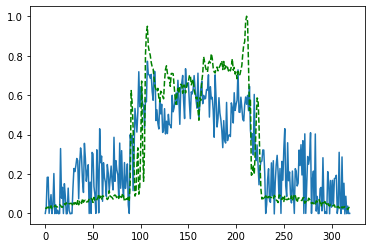

Time taken for epoch:  143.61830043792725
Epoch = [ 93/3000]  Iter = [   0/39480]  Loss = 0.2398 Avg Loss = 0.2398  Time = 0.0959s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 93/3000]  Iter = [ 100/39480]  Loss = 0.2229 Avg Loss = 0.2262  Time = 0.0032s
Epoch = [ 93/3000]  Iter = [ 200/39480]  Loss = 0.2748 Avg Loss = 0.2247  Time = 0.0032s
Epoch = [ 93/3000]  Iter = [ 300/39480]  Loss = 0.2089 Avg Loss = 0.2189  Time = 0.0030s
Epoch = [ 93/3000]  Iter = [ 400/39480]  Loss = 0.2125 Avg Loss = 0.2167  Time = 0.0034s
Epoch = [ 93/3000]  Iter = [ 500/39480]  Loss = 0.2559 Avg Loss = 0.2179  Time = 0.0029s
Epoch = [ 93/3000]  Iter = [ 600/39480]  Loss = 0.2123 Avg Loss = 0.2137  Time = 0.0031s
Epoch = [ 93/3000]  Iter = [ 700/39480]  Loss = 0.2033 Avg Loss = 0.2184  Time = 0.0031s
Epoch = [ 93/3000]  Iter = [ 800/39480]  Loss = 0.2242 Avg Loss = 0.2202  Time = 0.0033s
Epoch = [ 93/3000]  Iter = [ 900/39480]  Loss = 0.2214 Avg Loss = 0.221  Time = 0.0030s
Epoch = [ 93/3000]  Iter = [1000/39480]  Loss = 0.2152 Avg Loss = 0.2191  Time = 0.0032s
Epoch = [ 93/3000]  Iter = [1100/39480]  Loss = 0.2156 Avg Loss = 0.218  Time = 0.0030s
Epoch = [ 93/3000]  Ite

Epoch = [ 93/3000]  Iter = [9400/39480]  Loss = 0.2159 Avg Loss = 0.2185  Time = 0.0032s
Epoch = [ 93/3000]  Iter = [9500/39480]  Loss = 0.2316 Avg Loss = 0.2199  Time = 0.0033s
Epoch = [ 93/3000]  Iter = [9600/39480]  Loss = 0.3298 Avg Loss = 0.2185  Time = 0.0031s
Epoch = [ 93/3000]  Iter = [9700/39480]  Loss = 0.2272 Avg Loss = 0.2237  Time = 0.0033s
Epoch = [ 93/3000]  Iter = [9800/39480]  Loss = 0.2247 Avg Loss = 0.2182  Time = 0.0032s
Epoch = [ 93/3000]  Iter = [9900/39480]  Loss = 0.2032 Avg Loss = 0.2171  Time = 0.0032s
Epoch = [ 93/3000]  Iter = [10000/39480]  Loss = 0.198 Avg Loss = 0.2175  Time = 0.0029s
Epoch = [ 93/3000]  Iter = [10100/39480]  Loss = 0.1816 Avg Loss = 0.2192  Time = 0.0030s
Epoch = [ 93/3000]  Iter = [10200/39480]  Loss = 0.1666 Avg Loss = 0.2168  Time = 0.0033s
Epoch = [ 93/3000]  Iter = [10300/39480]  Loss = 0.245 Avg Loss = 0.2161  Time = 0.0032s
Epoch = [ 93/3000]  Iter = [10400/39480]  Loss = 0.1915 Avg Loss = 0.2169  Time = 0.0031s
Epoch = [ 93/3000]

Epoch = [ 93/3000]  Iter = [18600/39480]  Loss = 0.2234 Avg Loss = 0.2172  Time = 0.0032s
Epoch = [ 93/3000]  Iter = [18700/39480]  Loss = 0.2196 Avg Loss = 0.2149  Time = 0.0030s
Epoch = [ 93/3000]  Iter = [18800/39480]  Loss = 0.2135 Avg Loss = 0.2202  Time = 0.0032s
Epoch = [ 93/3000]  Iter = [18900/39480]  Loss = 0.2414 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 93/3000]  Iter = [19000/39480]  Loss = 0.2259 Avg Loss = 0.2239  Time = 0.0030s
Epoch = [ 93/3000]  Iter = [19100/39480]  Loss = 0.2548 Avg Loss = 0.2222  Time = 0.0031s
Epoch = [ 93/3000]  Iter = [19200/39480]  Loss = 0.2386 Avg Loss = 0.2225  Time = 0.0031s
Epoch = [ 93/3000]  Iter = [19300/39480]  Loss = 0.2626 Avg Loss = 0.2192  Time = 0.0031s
Epoch = [ 93/3000]  Iter = [19400/39480]  Loss = 0.2223 Avg Loss = 0.2217  Time = 0.0029s
Epoch = [ 93/3000]  Iter = [19500/39480]  Loss = 0.2027 Avg Loss = 0.226  Time = 0.0032s
Epoch = [ 93/3000]  Iter = [19600/39480]  Loss = 0.2162 Avg Loss = 0.2193  Time = 0.0030s
Epoch = [ 9

Epoch = [ 93/3000]  Iter = [27800/39480]  Loss = 0.2244 Avg Loss = 0.2138  Time = 0.0029s
Epoch = [ 93/3000]  Iter = [27900/39480]  Loss = 0.2105 Avg Loss = 0.2164  Time = 0.0032s
Epoch = [ 93/3000]  Iter = [28000/39480]  Loss = 0.21 Avg Loss = 0.2145  Time = 0.0030s
Epoch = [ 93/3000]  Iter = [28100/39480]  Loss = 0.2403 Avg Loss = 0.2183  Time = 0.0033s
Epoch = [ 93/3000]  Iter = [28200/39480]  Loss = 0.1997 Avg Loss = 0.2188  Time = 0.0030s
Epoch = [ 93/3000]  Iter = [28300/39480]  Loss = 0.211 Avg Loss = 0.2176  Time = 0.0033s
Epoch = [ 93/3000]  Iter = [28400/39480]  Loss = 0.1963 Avg Loss = 0.2165  Time = 0.0033s
Epoch = [ 93/3000]  Iter = [28500/39480]  Loss = 0.1989 Avg Loss = 0.221  Time = 0.0029s
Epoch = [ 93/3000]  Iter = [28600/39480]  Loss = 0.2271 Avg Loss = 0.2145  Time = 0.0030s
Epoch = [ 93/3000]  Iter = [28700/39480]  Loss = 0.1976 Avg Loss = 0.2176  Time = 0.0033s
Epoch = [ 93/3000]  Iter = [28800/39480]  Loss = 0.2341 Avg Loss = 0.2238  Time = 0.0031s
Epoch = [ 93/3

Epoch = [ 93/3000]  Iter = [37000/39480]  Loss = 0.1975 Avg Loss = 0.2131  Time = 0.0030s
Epoch = [ 93/3000]  Iter = [37100/39480]  Loss = 0.2188 Avg Loss = 0.2175  Time = 0.0029s
Epoch = [ 93/3000]  Iter = [37200/39480]  Loss = 0.2293 Avg Loss = 0.2223  Time = 0.0030s
Epoch = [ 93/3000]  Iter = [37300/39480]  Loss = 0.2085 Avg Loss = 0.2177  Time = 0.0031s
Epoch = [ 93/3000]  Iter = [37400/39480]  Loss = 0.2282 Avg Loss = 0.2177  Time = 0.0035s
Epoch = [ 93/3000]  Iter = [37500/39480]  Loss = 0.2149 Avg Loss = 0.2208  Time = 0.0030s
Epoch = [ 93/3000]  Iter = [37600/39480]  Loss = 0.2097 Avg Loss = 0.217  Time = 0.0032s
Epoch = [ 93/3000]  Iter = [37700/39480]  Loss = 0.2301 Avg Loss = 0.218  Time = 0.0034s
Epoch = [ 93/3000]  Iter = [37800/39480]  Loss = 0.2358 Avg Loss = 0.2188  Time = 0.0033s
Epoch = [ 93/3000]  Iter = [37900/39480]  Loss = 0.2384 Avg Loss = 0.2179  Time = 0.0031s
Epoch = [ 93/3000]  Iter = [38000/39480]  Loss = 0.2362 Avg Loss = 0.2178  Time = 0.0030s
Epoch = [ 93

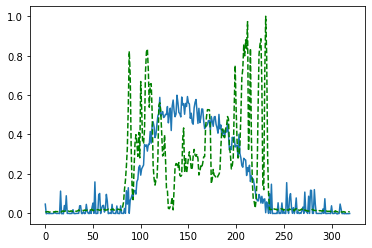

Time taken for epoch:  142.7847399711609
Epoch = [ 94/3000]  Iter = [   0/39480]  Loss = 0.2265 Avg Loss = 0.2265  Time = 0.0861s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 94/3000]  Iter = [ 100/39480]  Loss = 0.2075 Avg Loss = 0.2166  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [ 200/39480]  Loss = 0.2166 Avg Loss = 0.222  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [ 300/39480]  Loss = 0.1828 Avg Loss = 0.2149  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [ 400/39480]  Loss = 0.2306 Avg Loss = 0.2155  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [ 500/39480]  Loss = 0.2206 Avg Loss = 0.2175  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [ 600/39480]  Loss = 0.2055 Avg Loss = 0.22  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [ 700/39480]  Loss = 0.2291 Avg Loss = 0.2191  Time = 0.0035s
Epoch = [ 94/3000]  Iter = [ 800/39480]  Loss = 0.2024 Avg Loss = 0.2183  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [ 900/39480]  Loss = 0.1997 Avg Loss = 0.2189  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [1000/39480]  Loss = 0.2039 Avg Loss = 0.2163  Time = 0.0049s
Epoch = [ 94/3000]  Iter = [1100/39480]  Loss = 0.2078 Avg Loss = 0.2163  Time = 0.0036s
Epoch = [ 94/3000]  Iter

Epoch = [ 94/3000]  Iter = [9400/39480]  Loss = 0.2321 Avg Loss = 0.2187  Time = 0.0034s
Epoch = [ 94/3000]  Iter = [9500/39480]  Loss = 0.206 Avg Loss = 0.2157  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [9600/39480]  Loss = 0.2371 Avg Loss = 0.2219  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [9700/39480]  Loss = 0.2356 Avg Loss = 0.221  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [9800/39480]  Loss = 0.1904 Avg Loss = 0.2161  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [9900/39480]  Loss = 0.2086 Avg Loss = 0.2204  Time = 0.0035s
Epoch = [ 94/3000]  Iter = [10000/39480]  Loss = 0.1955 Avg Loss = 0.2133  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [10100/39480]  Loss = 0.2257 Avg Loss = 0.2161  Time = 0.0035s
Epoch = [ 94/3000]  Iter = [10200/39480]  Loss = 0.2041 Avg Loss = 0.2183  Time = 0.0035s
Epoch = [ 94/3000]  Iter = [10300/39480]  Loss = 0.1922 Avg Loss = 0.2145  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [10400/39480]  Loss = 0.2559 Avg Loss = 0.2159  Time = 0.0033s
Epoch = [ 94/3000]

Epoch = [ 94/3000]  Iter = [18600/39480]  Loss = 0.2343 Avg Loss = 0.2179  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [18700/39480]  Loss = 0.1755 Avg Loss = 0.2177  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [18800/39480]  Loss = 0.2198 Avg Loss = 0.2182  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [18900/39480]  Loss = 0.2146 Avg Loss = 0.2142  Time = 0.0038s
Epoch = [ 94/3000]  Iter = [19000/39480]  Loss = 0.2117 Avg Loss = 0.2171  Time = 0.0038s
Epoch = [ 94/3000]  Iter = [19100/39480]  Loss = 0.208 Avg Loss = 0.2181  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [19200/39480]  Loss = 0.2206 Avg Loss = 0.2187  Time = 0.0038s
Epoch = [ 94/3000]  Iter = [19300/39480]  Loss = 0.2068 Avg Loss = 0.2124  Time = 0.0038s
Epoch = [ 94/3000]  Iter = [19400/39480]  Loss = 0.2027 Avg Loss = 0.2157  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [19500/39480]  Loss = 0.2485 Avg Loss = 0.2193  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [19600/39480]  Loss = 0.1991 Avg Loss = 0.2212  Time = 0.0037s
Epoch = [ 9

Epoch = [ 94/3000]  Iter = [27800/39480]  Loss = 0.2175 Avg Loss = 0.2179  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [27900/39480]  Loss = 0.2113 Avg Loss = 0.2172  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [28000/39480]  Loss = 0.2276 Avg Loss = 0.2216  Time = 0.0034s
Epoch = [ 94/3000]  Iter = [28100/39480]  Loss = 0.1989 Avg Loss = 0.2189  Time = 0.0035s
Epoch = [ 94/3000]  Iter = [28200/39480]  Loss = 0.2307 Avg Loss = 0.2187  Time = 0.0033s
Epoch = [ 94/3000]  Iter = [28300/39480]  Loss = 0.1925 Avg Loss = 0.2246  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [28400/39480]  Loss = 0.235 Avg Loss = 0.2173  Time = 0.0035s
Epoch = [ 94/3000]  Iter = [28500/39480]  Loss = 0.208 Avg Loss = 0.2154  Time = 0.0031s
Epoch = [ 94/3000]  Iter = [28600/39480]  Loss = 0.1694 Avg Loss = 0.2137  Time = 0.0035s
Epoch = [ 94/3000]  Iter = [28700/39480]  Loss = 0.2189 Avg Loss = 0.2154  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [28800/39480]  Loss = 0.2094 Avg Loss = 0.2142  Time = 0.0036s
Epoch = [ 94

Epoch = [ 94/3000]  Iter = [37000/39480]  Loss = 0.2113 Avg Loss = 0.2173  Time = 0.0032s
Epoch = [ 94/3000]  Iter = [37100/39480]  Loss = 0.2161 Avg Loss = 0.2204  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [37200/39480]  Loss = 0.2503 Avg Loss = 0.2188  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [37300/39480]  Loss = 0.1961 Avg Loss = 0.2173  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [37400/39480]  Loss = 0.2204 Avg Loss = 0.2181  Time = 0.0047s
Epoch = [ 94/3000]  Iter = [37500/39480]  Loss = 0.2133 Avg Loss = 0.2162  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [37600/39480]  Loss = 0.2279 Avg Loss = 0.2187  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [37700/39480]  Loss = 0.2144 Avg Loss = 0.2181  Time = 0.0037s
Epoch = [ 94/3000]  Iter = [37800/39480]  Loss = 0.2255 Avg Loss = 0.2157  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [37900/39480]  Loss = 0.2182 Avg Loss = 0.2155  Time = 0.0036s
Epoch = [ 94/3000]  Iter = [38000/39480]  Loss = 0.2057 Avg Loss = 0.2211  Time = 0.0037s
Epoch = [ 

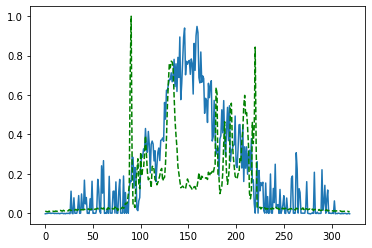

Time taken for epoch:  156.22315669059753
Epoch = [ 95/3000]  Iter = [   0/39480]  Loss = 0.2676 Avg Loss = 0.2676  Time = 0.0644s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 95/3000]  Iter = [ 100/39480]  Loss = 0.2507 Avg Loss = 0.2358  Time = 0.0029s
Epoch = [ 95/3000]  Iter = [ 200/39480]  Loss = 0.2262 Avg Loss = 0.2226  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [ 300/39480]  Loss = 0.2319 Avg Loss = 0.2185  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [ 400/39480]  Loss = 0.2328 Avg Loss = 0.2196  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [ 500/39480]  Loss = 0.2062 Avg Loss = 0.2173  Time = 0.0035s
Epoch = [ 95/3000]  Iter = [ 600/39480]  Loss = 0.2112 Avg Loss = 0.2229  Time = 0.0033s
Epoch = [ 95/3000]  Iter = [ 700/39480]  Loss = 0.2334 Avg Loss = 0.2171  Time = 0.0035s
Epoch = [ 95/3000]  Iter = [ 800/39480]  Loss = 0.2161 Avg Loss = 0.2182  Time = 0.0034s
Epoch = [ 95/3000]  Iter = [ 900/39480]  Loss = 0.217 Avg Loss = 0.2164  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [1000/39480]  Loss = 0.2298 Avg Loss = 0.2174  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [1100/39480]  Loss = 0.2167 Avg Loss = 0.2197  Time = 0.0036s
Epoch = [ 95/3000]  It

Epoch = [ 95/3000]  Iter = [9400/39480]  Loss = 0.2613 Avg Loss = 0.2175  Time = 0.0034s
Epoch = [ 95/3000]  Iter = [9500/39480]  Loss = 0.2438 Avg Loss = 0.2173  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [9600/39480]  Loss = 0.2243 Avg Loss = 0.2209  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [9700/39480]  Loss = 0.2549 Avg Loss = 0.2202  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [9800/39480]  Loss = 0.2113 Avg Loss = 0.2165  Time = 0.0035s
Epoch = [ 95/3000]  Iter = [9900/39480]  Loss = 0.2215 Avg Loss = 0.2158  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [10000/39480]  Loss = 0.2031 Avg Loss = 0.222  Time = 0.0035s
Epoch = [ 95/3000]  Iter = [10100/39480]  Loss = 0.2202 Avg Loss = 0.2192  Time = 0.0033s
Epoch = [ 95/3000]  Iter = [10200/39480]  Loss = 0.2016 Avg Loss = 0.2199  Time = 0.0031s
Epoch = [ 95/3000]  Iter = [10300/39480]  Loss = 0.2133 Avg Loss = 0.2156  Time = 0.0038s
Epoch = [ 95/3000]  Iter = [10400/39480]  Loss = 0.2145 Avg Loss = 0.2166  Time = 0.0036s
Epoch = [ 95/3000

Epoch = [ 95/3000]  Iter = [18600/39480]  Loss = 0.2309 Avg Loss = 0.2247  Time = 0.0037s
Epoch = [ 95/3000]  Iter = [18700/39480]  Loss = 0.2084 Avg Loss = 0.2223  Time = 0.0032s
Epoch = [ 95/3000]  Iter = [18800/39480]  Loss = 0.2356 Avg Loss = 0.2287  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [18900/39480]  Loss = 0.1904 Avg Loss = 0.2178  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [19000/39480]  Loss = 0.2501 Avg Loss = 0.2178  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [19100/39480]  Loss = 0.2012 Avg Loss = 0.2192  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [19200/39480]  Loss = 0.2474 Avg Loss = 0.2235  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [19300/39480]  Loss = 0.2342 Avg Loss = 0.2163  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [19400/39480]  Loss = 0.2109 Avg Loss = 0.2179  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [19500/39480]  Loss = 0.1899 Avg Loss = 0.2161  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [19600/39480]  Loss = 0.1869 Avg Loss = 0.2212  Time = 0.0036s
Epoch = [ 

Epoch = [ 95/3000]  Iter = [27800/39480]  Loss = 0.2541 Avg Loss = 0.2188  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [27900/39480]  Loss = 0.2084 Avg Loss = 0.2172  Time = 0.0031s
Epoch = [ 95/3000]  Iter = [28000/39480]  Loss = 0.2168 Avg Loss = 0.2166  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [28100/39480]  Loss = 0.2569 Avg Loss = 0.2235  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [28200/39480]  Loss = 0.2349 Avg Loss = 0.2184  Time = 0.0032s
Epoch = [ 95/3000]  Iter = [28300/39480]  Loss = 0.2051 Avg Loss = 0.22  Time = 0.0033s
Epoch = [ 95/3000]  Iter = [28400/39480]  Loss = 0.227 Avg Loss = 0.2179  Time = 0.0035s
Epoch = [ 95/3000]  Iter = [28500/39480]  Loss = 0.1968 Avg Loss = 0.2201  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [28600/39480]  Loss = 0.2251 Avg Loss = 0.2198  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [28700/39480]  Loss = 0.2025 Avg Loss = 0.2192  Time = 0.0035s
Epoch = [ 95/3000]  Iter = [28800/39480]  Loss = 0.2233 Avg Loss = 0.2228  Time = 0.0036s
Epoch = [ 95/

Epoch = [ 95/3000]  Iter = [37000/39480]  Loss = 0.1971 Avg Loss = 0.2217  Time = 0.0035s
Epoch = [ 95/3000]  Iter = [37100/39480]  Loss = 0.1853 Avg Loss = 0.216  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [37200/39480]  Loss = 0.2045 Avg Loss = 0.2161  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [37300/39480]  Loss = 0.192 Avg Loss = 0.2215  Time = 0.0035s
Epoch = [ 95/3000]  Iter = [37400/39480]  Loss = 0.2447 Avg Loss = 0.2213  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [37500/39480]  Loss = 0.246 Avg Loss = 0.222  Time = 0.0034s
Epoch = [ 95/3000]  Iter = [37600/39480]  Loss = 0.241 Avg Loss = 0.2199  Time = 0.0037s
Epoch = [ 95/3000]  Iter = [37700/39480]  Loss = 0.2558 Avg Loss = 0.2183  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [37800/39480]  Loss = 0.2144 Avg Loss = 0.2144  Time = 0.0036s
Epoch = [ 95/3000]  Iter = [37900/39480]  Loss = 0.2193 Avg Loss = 0.2197  Time = 0.0035s
Epoch = [ 95/3000]  Iter = [38000/39480]  Loss = 0.2151 Avg Loss = 0.2181  Time = 0.0035s
Epoch = [ 95/30

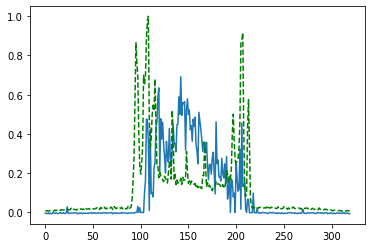

Time taken for epoch:  156.5444655418396
Epoch = [ 96/3000]  Iter = [   0/39480]  Loss = 0.2064 Avg Loss = 0.2064  Time = 0.0620s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 96/3000]  Iter = [ 100/39480]  Loss = 0.2213 Avg Loss = 0.2138  Time = 0.0035s
Epoch = [ 96/3000]  Iter = [ 200/39480]  Loss = 0.2327 Avg Loss = 0.2206  Time = 0.0037s
Epoch = [ 96/3000]  Iter = [ 300/39480]  Loss = 0.2447 Avg Loss = 0.2171  Time = 0.0038s
Epoch = [ 96/3000]  Iter = [ 400/39480]  Loss = 0.221 Avg Loss = 0.2191  Time = 0.0038s
Epoch = [ 96/3000]  Iter = [ 500/39480]  Loss = 0.2224 Avg Loss = 0.2176  Time = 0.0037s
Epoch = [ 96/3000]  Iter = [ 600/39480]  Loss = 0.1921 Avg Loss = 0.2166  Time = 0.0032s
Epoch = [ 96/3000]  Iter = [ 700/39480]  Loss = 0.2414 Avg Loss = 0.2139  Time = 0.0037s
Epoch = [ 96/3000]  Iter = [ 800/39480]  Loss = 0.2238 Avg Loss = 0.2195  Time = 0.0035s
Epoch = [ 96/3000]  Iter = [ 900/39480]  Loss = 0.249 Avg Loss = 0.2208  Time = 0.0032s
Epoch = [ 96/3000]  Iter = [1000/39480]  Loss = 0.2359 Avg Loss = 0.2174  Time = 0.0032s
Epoch = [ 96/3000]  Iter = [1100/39480]  Loss = 0.1895 Avg Loss = 0.2151  Time = 0.0036s
Epoch = [ 96/3000]  Ite

Epoch = [ 96/3000]  Iter = [9400/39480]  Loss = 0.2282 Avg Loss = 0.2171  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [9500/39480]  Loss = 0.2218 Avg Loss = 0.221  Time = 0.0037s
Epoch = [ 96/3000]  Iter = [9600/39480]  Loss = 0.2142 Avg Loss = 0.2199  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [9700/39480]  Loss = 0.191 Avg Loss = 0.2227  Time = 0.0035s
Epoch = [ 96/3000]  Iter = [9800/39480]  Loss = 0.2225 Avg Loss = 0.2194  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [9900/39480]  Loss = 0.2011 Avg Loss = 0.2175  Time = 0.0037s
Epoch = [ 96/3000]  Iter = [10000/39480]  Loss = 0.2348 Avg Loss = 0.2176  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [10100/39480]  Loss = 0.172 Avg Loss = 0.2219  Time = 0.0034s
Epoch = [ 96/3000]  Iter = [10200/39480]  Loss = 0.1717 Avg Loss = 0.2183  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [10300/39480]  Loss = 0.1922 Avg Loss = 0.2184  Time = 0.0032s
Epoch = [ 96/3000]  Iter = [10400/39480]  Loss = 0.2134 Avg Loss = 0.2168  Time = 0.0036s
Epoch = [ 96/3000] 

Epoch = [ 96/3000]  Iter = [18600/39480]  Loss = 0.2003 Avg Loss = 0.22  Time = 0.0034s
Epoch = [ 96/3000]  Iter = [18700/39480]  Loss = 0.2033 Avg Loss = 0.2201  Time = 0.0034s
Epoch = [ 96/3000]  Iter = [18800/39480]  Loss = 0.179 Avg Loss = 0.2159  Time = 0.0035s
Epoch = [ 96/3000]  Iter = [18900/39480]  Loss = 0.2291 Avg Loss = 0.2174  Time = 0.0035s
Epoch = [ 96/3000]  Iter = [19000/39480]  Loss = 0.2598 Avg Loss = 0.2216  Time = 0.0032s
Epoch = [ 96/3000]  Iter = [19100/39480]  Loss = 0.2099 Avg Loss = 0.216  Time = 0.0035s
Epoch = [ 96/3000]  Iter = [19200/39480]  Loss = 0.2147 Avg Loss = 0.2159  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [19300/39480]  Loss = 0.239 Avg Loss = 0.2209  Time = 0.0035s
Epoch = [ 96/3000]  Iter = [19400/39480]  Loss = 0.2194 Avg Loss = 0.2192  Time = 0.0035s
Epoch = [ 96/3000]  Iter = [19500/39480]  Loss = 0.2403 Avg Loss = 0.2202  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [19600/39480]  Loss = 0.2122 Avg Loss = 0.2188  Time = 0.0035s
Epoch = [ 96/30

Epoch = [ 96/3000]  Iter = [27800/39480]  Loss = 0.2332 Avg Loss = 0.218  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [27900/39480]  Loss = 0.2017 Avg Loss = 0.2209  Time = 0.0037s
Epoch = [ 96/3000]  Iter = [28000/39480]  Loss = 0.1876 Avg Loss = 0.213  Time = 0.0035s
Epoch = [ 96/3000]  Iter = [28100/39480]  Loss = 0.2528 Avg Loss = 0.2204  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [28200/39480]  Loss = 0.264 Avg Loss = 0.2218  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [28300/39480]  Loss = 0.2012 Avg Loss = 0.2199  Time = 0.0035s
Epoch = [ 96/3000]  Iter = [28400/39480]  Loss = 0.1973 Avg Loss = 0.2183  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [28500/39480]  Loss = 0.218 Avg Loss = 0.2163  Time = 0.0038s
Epoch = [ 96/3000]  Iter = [28600/39480]  Loss = 0.1749 Avg Loss = 0.2163  Time = 0.0032s
Epoch = [ 96/3000]  Iter = [28700/39480]  Loss = 0.2341 Avg Loss = 0.2162  Time = 0.0034s
Epoch = [ 96/3000]  Iter = [28800/39480]  Loss = 0.2275 Avg Loss = 0.2226  Time = 0.0034s
Epoch = [ 96/3

Epoch = [ 96/3000]  Iter = [37000/39480]  Loss = 0.2205 Avg Loss = 0.2163  Time = 0.0037s
Epoch = [ 96/3000]  Iter = [37100/39480]  Loss = 0.2018 Avg Loss = 0.2181  Time = 0.0035s
Epoch = [ 96/3000]  Iter = [37200/39480]  Loss = 0.2171 Avg Loss = 0.2218  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [37300/39480]  Loss = 0.2276 Avg Loss = 0.2203  Time = 0.0037s
Epoch = [ 96/3000]  Iter = [37400/39480]  Loss = 0.2149 Avg Loss = 0.2234  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [37500/39480]  Loss = 0.2143 Avg Loss = 0.218  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [37600/39480]  Loss = 0.1876 Avg Loss = 0.2217  Time = 0.0037s
Epoch = [ 96/3000]  Iter = [37700/39480]  Loss = 0.2046 Avg Loss = 0.2199  Time = 0.0035s
Epoch = [ 96/3000]  Iter = [37800/39480]  Loss = 0.2164 Avg Loss = 0.2186  Time = 0.0035s
Epoch = [ 96/3000]  Iter = [37900/39480]  Loss = 0.2155 Avg Loss = 0.2164  Time = 0.0036s
Epoch = [ 96/3000]  Iter = [38000/39480]  Loss = 0.2308 Avg Loss = 0.2169  Time = 0.0037s
Epoch = [ 9

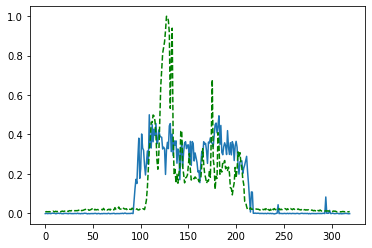

Time taken for epoch:  155.9726116657257
Epoch = [ 97/3000]  Iter = [   0/39480]  Loss = 0.1976 Avg Loss = 0.1976  Time = 0.0642s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 97/3000]  Iter = [ 100/39480]  Loss = 0.1787 Avg Loss = 0.2127  Time = 0.0037s
Epoch = [ 97/3000]  Iter = [ 200/39480]  Loss = 0.2116 Avg Loss = 0.2164  Time = 0.0037s
Epoch = [ 97/3000]  Iter = [ 300/39480]  Loss = 0.2201 Avg Loss = 0.2122  Time = 0.0037s
Epoch = [ 97/3000]  Iter = [ 400/39480]  Loss = 0.1961 Avg Loss = 0.2193  Time = 0.0037s
Epoch = [ 97/3000]  Iter = [ 500/39480]  Loss = 0.2311 Avg Loss = 0.2193  Time = 0.0036s
Epoch = [ 97/3000]  Iter = [ 600/39480]  Loss = 0.219 Avg Loss = 0.217  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [ 700/39480]  Loss = 0.1916 Avg Loss = 0.2163  Time = 0.0034s
Epoch = [ 97/3000]  Iter = [ 800/39480]  Loss = 0.2324 Avg Loss = 0.2176  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [ 900/39480]  Loss = 0.2288 Avg Loss = 0.2163  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [1000/39480]  Loss = 0.2152 Avg Loss = 0.2155  Time = 0.0036s
Epoch = [ 97/3000]  Iter = [1100/39480]  Loss = 0.2609 Avg Loss = 0.2201  Time = 0.0035s
Epoch = [ 97/3000]  Ite

Epoch = [ 97/3000]  Iter = [9400/39480]  Loss = 0.2035 Avg Loss = 0.2193  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [9500/39480]  Loss = 0.2277 Avg Loss = 0.2159  Time = 0.0036s
Epoch = [ 97/3000]  Iter = [9600/39480]  Loss = 0.2125 Avg Loss = 0.2174  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [9700/39480]  Loss = 0.2246 Avg Loss = 0.2222  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [9800/39480]  Loss = 0.2221 Avg Loss = 0.2179  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [9900/39480]  Loss = 0.2227 Avg Loss = 0.2177  Time = 0.0034s
Epoch = [ 97/3000]  Iter = [10000/39480]  Loss = 0.22 Avg Loss = 0.2173  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [10100/39480]  Loss = 0.2161 Avg Loss = 0.2227  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [10200/39480]  Loss = 0.184 Avg Loss = 0.2189  Time = 0.0036s
Epoch = [ 97/3000]  Iter = [10300/39480]  Loss = 0.2221 Avg Loss = 0.2193  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [10400/39480]  Loss = 0.2269 Avg Loss = 0.2171  Time = 0.0036s
Epoch = [ 97/3000] 

Epoch = [ 97/3000]  Iter = [18600/39480]  Loss = 0.2259 Avg Loss = 0.2195  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [18700/39480]  Loss = 0.1913 Avg Loss = 0.2181  Time = 0.0036s
Epoch = [ 97/3000]  Iter = [18800/39480]  Loss = 0.2444 Avg Loss = 0.218  Time = 0.0032s
Epoch = [ 97/3000]  Iter = [18900/39480]  Loss = 0.2129 Avg Loss = 0.2163  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [19000/39480]  Loss = 0.23 Avg Loss = 0.2176  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [19100/39480]  Loss = 0.2454 Avg Loss = 0.2177  Time = 0.0036s
Epoch = [ 97/3000]  Iter = [19200/39480]  Loss = 0.209 Avg Loss = 0.2184  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [19300/39480]  Loss = 0.2056 Avg Loss = 0.2154  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [19400/39480]  Loss = 0.2215 Avg Loss = 0.2177  Time = 0.0036s
Epoch = [ 97/3000]  Iter = [19500/39480]  Loss = 0.2045 Avg Loss = 0.2166  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [19600/39480]  Loss = 0.2755 Avg Loss = 0.2201  Time = 0.0036s
Epoch = [ 97/3

Epoch = [ 97/3000]  Iter = [27800/39480]  Loss = 0.2203 Avg Loss = 0.2206  Time = 0.0036s
Epoch = [ 97/3000]  Iter = [27900/39480]  Loss = 0.2507 Avg Loss = 0.2188  Time = 0.0036s
Epoch = [ 97/3000]  Iter = [28000/39480]  Loss = 0.2613 Avg Loss = 0.2174  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [28100/39480]  Loss = 0.1849 Avg Loss = 0.2176  Time = 0.0036s
Epoch = [ 97/3000]  Iter = [28200/39480]  Loss = 0.206 Avg Loss = 0.2203  Time = 0.0032s
Epoch = [ 97/3000]  Iter = [28300/39480]  Loss = 0.2072 Avg Loss = 0.2158  Time = 0.0037s
Epoch = [ 97/3000]  Iter = [28400/39480]  Loss = 0.2368 Avg Loss = 0.2172  Time = 0.0036s
Epoch = [ 97/3000]  Iter = [28500/39480]  Loss = 0.208 Avg Loss = 0.2132  Time = 0.0034s
Epoch = [ 97/3000]  Iter = [28600/39480]  Loss = 0.1799 Avg Loss = 0.2151  Time = 0.0036s
Epoch = [ 97/3000]  Iter = [28700/39480]  Loss = 0.2382 Avg Loss = 0.2163  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [28800/39480]  Loss = 0.1899 Avg Loss = 0.2182  Time = 0.0035s
Epoch = [ 97

Epoch = [ 97/3000]  Iter = [37000/39480]  Loss = 0.2386 Avg Loss = 0.2158  Time = 0.0033s
Epoch = [ 97/3000]  Iter = [37100/39480]  Loss = 0.2337 Avg Loss = 0.2157  Time = 0.0033s
Epoch = [ 97/3000]  Iter = [37200/39480]  Loss = 0.1963 Avg Loss = 0.221  Time = 0.0034s
Epoch = [ 97/3000]  Iter = [37300/39480]  Loss = 0.1952 Avg Loss = 0.2193  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [37400/39480]  Loss = 0.2124 Avg Loss = 0.2245  Time = 0.0034s
Epoch = [ 97/3000]  Iter = [37500/39480]  Loss = 0.2373 Avg Loss = 0.2196  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [37600/39480]  Loss = 0.2433 Avg Loss = 0.2169  Time = 0.0033s
Epoch = [ 97/3000]  Iter = [37700/39480]  Loss = 0.1932 Avg Loss = 0.2165  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [37800/39480]  Loss = 0.1962 Avg Loss = 0.2178  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [37900/39480]  Loss = 0.2323 Avg Loss = 0.217  Time = 0.0035s
Epoch = [ 97/3000]  Iter = [38000/39480]  Loss = 0.1903 Avg Loss = 0.2174  Time = 0.0035s
Epoch = [ 97

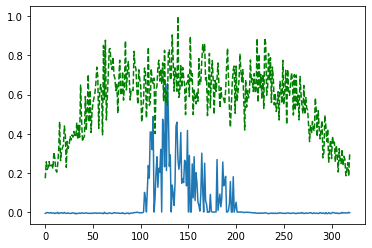

Time taken for epoch:  155.1740539073944
Epoch = [ 98/3000]  Iter = [   0/39480]  Loss = 0.2208 Avg Loss = 0.2208  Time = 0.0628s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 98/3000]  Iter = [ 100/39480]  Loss = 0.2244 Avg Loss = 0.2233  Time = 0.0034s
Epoch = [ 98/3000]  Iter = [ 200/39480]  Loss = 0.1894 Avg Loss = 0.2169  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [ 300/39480]  Loss = 0.2129 Avg Loss = 0.219  Time = 0.0034s
Epoch = [ 98/3000]  Iter = [ 400/39480]  Loss = 0.1996 Avg Loss = 0.2137  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [ 500/39480]  Loss = 0.2059 Avg Loss = 0.2167  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [ 600/39480]  Loss = 0.2504 Avg Loss = 0.2164  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [ 700/39480]  Loss = 0.201 Avg Loss = 0.2157  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [ 800/39480]  Loss = 0.2268 Avg Loss = 0.2188  Time = 0.0035s
Epoch = [ 98/3000]  Iter = [ 900/39480]  Loss = 0.2032 Avg Loss = 0.2185  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [1000/39480]  Loss = 0.2148 Avg Loss = 0.2202  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [1100/39480]  Loss = 0.1875 Avg Loss = 0.2191  Time = 0.0036s
Epoch = [ 98/3000]  Ite

Epoch = [ 98/3000]  Iter = [9400/39480]  Loss = 0.2091 Avg Loss = 0.2179  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [9500/39480]  Loss = 0.2014 Avg Loss = 0.2102  Time = 0.0034s
Epoch = [ 98/3000]  Iter = [9600/39480]  Loss = 0.1913 Avg Loss = 0.2134  Time = 0.0034s
Epoch = [ 98/3000]  Iter = [9700/39480]  Loss = 0.2338 Avg Loss = 0.2177  Time = 0.0032s
Epoch = [ 98/3000]  Iter = [9800/39480]  Loss = 0.2304 Avg Loss = 0.2152  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [9900/39480]  Loss = 0.2393 Avg Loss = 0.2195  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [10000/39480]  Loss = 0.2482 Avg Loss = 0.22  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [10100/39480]  Loss = 0.2239 Avg Loss = 0.2203  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [10200/39480]  Loss = 0.2118 Avg Loss = 0.2196  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [10300/39480]  Loss = 0.2305 Avg Loss = 0.2148  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [10400/39480]  Loss = 0.2036 Avg Loss = 0.2153  Time = 0.0036s
Epoch = [ 98/3000]

Epoch = [ 98/3000]  Iter = [18600/39480]  Loss = 0.2335 Avg Loss = 0.218  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [18700/39480]  Loss = 0.2464 Avg Loss = 0.2222  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [18800/39480]  Loss = 0.215 Avg Loss = 0.2175  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [18900/39480]  Loss = 0.2217 Avg Loss = 0.2187  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [19000/39480]  Loss = 0.2295 Avg Loss = 0.2161  Time = 0.0034s
Epoch = [ 98/3000]  Iter = [19100/39480]  Loss = 0.1928 Avg Loss = 0.2155  Time = 0.0031s
Epoch = [ 98/3000]  Iter = [19200/39480]  Loss = 0.1975 Avg Loss = 0.2161  Time = 0.0033s
Epoch = [ 98/3000]  Iter = [19300/39480]  Loss = 0.1964 Avg Loss = 0.219  Time = 0.0035s
Epoch = [ 98/3000]  Iter = [19400/39480]  Loss = 0.2067 Avg Loss = 0.2257  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [19500/39480]  Loss = 0.1929 Avg Loss = 0.218  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [19600/39480]  Loss = 0.2129 Avg Loss = 0.2136  Time = 0.0037s
Epoch = [ 98/3

Epoch = [ 98/3000]  Iter = [27800/39480]  Loss = 0.2214 Avg Loss = 0.2183  Time = 0.0038s
Epoch = [ 98/3000]  Iter = [27900/39480]  Loss = 0.2172 Avg Loss = 0.2186  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [28000/39480]  Loss = 0.2033 Avg Loss = 0.2198  Time = 0.0035s
Epoch = [ 98/3000]  Iter = [28100/39480]  Loss = 0.1938 Avg Loss = 0.218  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [28200/39480]  Loss = 0.1886 Avg Loss = 0.2188  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [28300/39480]  Loss = 0.2174 Avg Loss = 0.2221  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [28400/39480]  Loss = 0.2014 Avg Loss = 0.2161  Time = 0.0035s
Epoch = [ 98/3000]  Iter = [28500/39480]  Loss = 0.2239 Avg Loss = 0.2153  Time = 0.0035s
Epoch = [ 98/3000]  Iter = [28600/39480]  Loss = 0.1922 Avg Loss = 0.2173  Time = 0.0037s
Epoch = [ 98/3000]  Iter = [28700/39480]  Loss = 0.2529 Avg Loss = 0.2219  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [28800/39480]  Loss = 0.1697 Avg Loss = 0.2159  Time = 0.0036s
Epoch = [ 9

Epoch = [ 98/3000]  Iter = [37000/39480]  Loss = 0.2733 Avg Loss = 0.219  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [37100/39480]  Loss = 0.2127 Avg Loss = 0.2167  Time = 0.0035s
Epoch = [ 98/3000]  Iter = [37200/39480]  Loss = 0.2261 Avg Loss = 0.2172  Time = 0.0035s
Epoch = [ 98/3000]  Iter = [37300/39480]  Loss = 0.2028 Avg Loss = 0.2218  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [37400/39480]  Loss = 0.187 Avg Loss = 0.2172  Time = 0.0035s
Epoch = [ 98/3000]  Iter = [37500/39480]  Loss = 0.206 Avg Loss = 0.218  Time = 0.0035s
Epoch = [ 98/3000]  Iter = [37600/39480]  Loss = 0.1807 Avg Loss = 0.2188  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [37700/39480]  Loss = 0.2267 Avg Loss = 0.2168  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [37800/39480]  Loss = 0.243 Avg Loss = 0.2193  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [37900/39480]  Loss = 0.2192 Avg Loss = 0.22  Time = 0.0036s
Epoch = [ 98/3000]  Iter = [38000/39480]  Loss = 0.2176 Avg Loss = 0.2224  Time = 0.0036s
Epoch = [ 98/3000

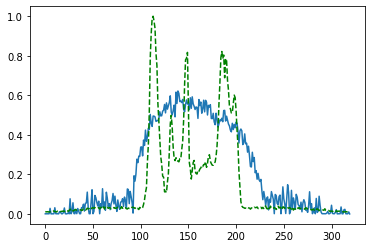

Time taken for epoch:  156.21523022651672
Epoch = [ 99/3000]  Iter = [   0/39480]  Loss = 0.209 Avg Loss = 0.209  Time = 0.0646s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [ 99/3000]  Iter = [ 100/39480]  Loss = 0.2115 Avg Loss = 0.2176  Time = 0.0037s
Epoch = [ 99/3000]  Iter = [ 200/39480]  Loss = 0.2334 Avg Loss = 0.2218  Time = 0.0037s
Epoch = [ 99/3000]  Iter = [ 300/39480]  Loss = 0.2216 Avg Loss = 0.2157  Time = 0.0037s
Epoch = [ 99/3000]  Iter = [ 400/39480]  Loss = 0.2258 Avg Loss = 0.2195  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [ 500/39480]  Loss = 0.1988 Avg Loss = 0.2175  Time = 0.0037s
Epoch = [ 99/3000]  Iter = [ 600/39480]  Loss = 0.1937 Avg Loss = 0.2165  Time = 0.0037s
Epoch = [ 99/3000]  Iter = [ 700/39480]  Loss = 0.2112 Avg Loss = 0.2188  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [ 800/39480]  Loss = 0.1745 Avg Loss = 0.2138  Time = 0.0037s
Epoch = [ 99/3000]  Iter = [ 900/39480]  Loss = 0.2101 Avg Loss = 0.2141  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [1000/39480]  Loss = 0.3136 Avg Loss = 0.2165  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [1100/39480]  Loss = 0.2167 Avg Loss = 0.2184  Time = 0.0036s
Epoch = [ 99/3000]  I

Epoch = [ 99/3000]  Iter = [9400/39480]  Loss = 0.2225 Avg Loss = 0.2168  Time = 0.0033s
Epoch = [ 99/3000]  Iter = [9500/39480]  Loss = 0.1957 Avg Loss = 0.2194  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [9600/39480]  Loss = 0.2345 Avg Loss = 0.2156  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [9700/39480]  Loss = 0.2884 Avg Loss = 0.2201  Time = 0.0033s
Epoch = [ 99/3000]  Iter = [9800/39480]  Loss = 0.24 Avg Loss = 0.2187  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [9900/39480]  Loss = 0.2158 Avg Loss = 0.2187  Time = 0.0035s
Epoch = [ 99/3000]  Iter = [10000/39480]  Loss = 0.2462 Avg Loss = 0.2167  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [10100/39480]  Loss = 0.1758 Avg Loss = 0.2158  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [10200/39480]  Loss = 0.2182 Avg Loss = 0.2223  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [10300/39480]  Loss = 0.2071 Avg Loss = 0.2165  Time = 0.0035s
Epoch = [ 99/3000]  Iter = [10400/39480]  Loss = 0.2328 Avg Loss = 0.2145  Time = 0.0036s
Epoch = [ 99/3000]

Epoch = [ 99/3000]  Iter = [18600/39480]  Loss = 0.2167 Avg Loss = 0.2176  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [18700/39480]  Loss = 0.2519 Avg Loss = 0.2221  Time = 0.0035s
Epoch = [ 99/3000]  Iter = [18800/39480]  Loss = 0.1973 Avg Loss = 0.2171  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [18900/39480]  Loss = 0.2308 Avg Loss = 0.2168  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [19000/39480]  Loss = 0.2057 Avg Loss = 0.2181  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [19100/39480]  Loss = 0.227 Avg Loss = 0.2163  Time = 0.0035s
Epoch = [ 99/3000]  Iter = [19200/39480]  Loss = 0.1874 Avg Loss = 0.2191  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [19300/39480]  Loss = 0.2106 Avg Loss = 0.2191  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [19400/39480]  Loss = 0.2185 Avg Loss = 0.2199  Time = 0.0035s
Epoch = [ 99/3000]  Iter = [19500/39480]  Loss = 0.272 Avg Loss = 0.2208  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [19600/39480]  Loss = 0.2406 Avg Loss = 0.2227  Time = 0.0036s
Epoch = [ 99

Epoch = [ 99/3000]  Iter = [27800/39480]  Loss = 0.2638 Avg Loss = 0.22  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [27900/39480]  Loss = 0.2275 Avg Loss = 0.2202  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [28000/39480]  Loss = 0.2573 Avg Loss = 0.2203  Time = 0.0037s
Epoch = [ 99/3000]  Iter = [28100/39480]  Loss = 0.178 Avg Loss = 0.2181  Time = 0.0035s
Epoch = [ 99/3000]  Iter = [28200/39480]  Loss = 0.2108 Avg Loss = 0.2181  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [28300/39480]  Loss = 0.2289 Avg Loss = 0.2198  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [28400/39480]  Loss = 0.2255 Avg Loss = 0.2135  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [28500/39480]  Loss = 0.2443 Avg Loss = 0.2185  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [28600/39480]  Loss = 0.1926 Avg Loss = 0.2203  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [28700/39480]  Loss = 0.1873 Avg Loss = 0.2194  Time = 0.0035s
Epoch = [ 99/3000]  Iter = [28800/39480]  Loss = 0.2511 Avg Loss = 0.2202  Time = 0.0035s
Epoch = [ 99/

Epoch = [ 99/3000]  Iter = [37000/39480]  Loss = 0.2135 Avg Loss = 0.2213  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [37100/39480]  Loss = 0.2165 Avg Loss = 0.2135  Time = 0.0035s
Epoch = [ 99/3000]  Iter = [37200/39480]  Loss = 0.2469 Avg Loss = 0.2168  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [37300/39480]  Loss = 0.2526 Avg Loss = 0.2169  Time = 0.0034s
Epoch = [ 99/3000]  Iter = [37400/39480]  Loss = 0.2066 Avg Loss = 0.2163  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [37500/39480]  Loss = 0.2032 Avg Loss = 0.2179  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [37600/39480]  Loss = 0.1972 Avg Loss = 0.2183  Time = 0.0034s
Epoch = [ 99/3000]  Iter = [37700/39480]  Loss = 0.1907 Avg Loss = 0.2165  Time = 0.0036s
Epoch = [ 99/3000]  Iter = [37800/39480]  Loss = 0.2007 Avg Loss = 0.2174  Time = 0.0032s
Epoch = [ 99/3000]  Iter = [37900/39480]  Loss = 0.197 Avg Loss = 0.2175  Time = 0.0035s
Epoch = [ 99/3000]  Iter = [38000/39480]  Loss = 0.2145 Avg Loss = 0.2201  Time = 0.0035s
Epoch = [ 9

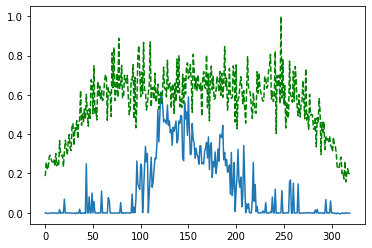

Time taken for epoch:  154.846581697464
Epoch = [100/3000]  Iter = [   0/39480]  Loss = 0.1998 Avg Loss = 0.1998  Time = 0.0671s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [100/3000]  Iter = [ 100/39480]  Loss = 0.2367 Avg Loss = 0.2008  Time = 0.0034s
Epoch = [100/3000]  Iter = [ 200/39480]  Loss = 0.1739 Avg Loss = 0.1935  Time = 0.0036s
Epoch = [100/3000]  Iter = [ 300/39480]  Loss = 0.2014 Avg Loss = 0.1883  Time = 0.0037s
Epoch = [100/3000]  Iter = [ 400/39480]  Loss = 0.216 Avg Loss = 0.1849  Time = 0.0034s
Epoch = [100/3000]  Iter = [ 500/39480]  Loss = 0.1634 Avg Loss = 0.1832  Time = 0.0034s
Epoch = [100/3000]  Iter = [ 600/39480]  Loss = 0.1679 Avg Loss = 0.1804  Time = 0.0037s
Epoch = [100/3000]  Iter = [ 700/39480]  Loss = 0.1468 Avg Loss = 0.1785  Time = 0.0037s
Epoch = [100/3000]  Iter = [ 800/39480]  Loss = 0.1797 Avg Loss = 0.1774  Time = 0.0037s
Epoch = [100/3000]  Iter = [ 900/39480]  Loss = 0.1912 Avg Loss = 0.1768  Time = 0.0037s
Epoch = [100/3000]  Iter = [1000/39480]  Loss = 0.1553 Avg Loss = 0.1763  Time = 0.0037s
Epoch = [100/3000]  Iter = [1100/39480]  Loss = 0.1779 Avg Loss = 0.1753  Time = 0.0032s
Epoch = [100/3000]  It

Epoch = [100/3000]  Iter = [9400/39480]  Loss = 0.1542 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [100/3000]  Iter = [9500/39480]  Loss = 0.1758 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [100/3000]  Iter = [9600/39480]  Loss = 0.1606 Avg Loss = 0.1587  Time = 0.0035s
Epoch = [100/3000]  Iter = [9700/39480]  Loss = 0.166 Avg Loss = 0.1593  Time = 0.0035s
Epoch = [100/3000]  Iter = [9800/39480]  Loss = 0.1541 Avg Loss = 0.1598  Time = 0.0034s
Epoch = [100/3000]  Iter = [9900/39480]  Loss = 0.1516 Avg Loss = 0.1582  Time = 0.0035s
Epoch = [100/3000]  Iter = [10000/39480]  Loss = 0.1801 Avg Loss = 0.1592  Time = 0.0034s
Epoch = [100/3000]  Iter = [10100/39480]  Loss = 0.1523 Avg Loss = 0.1595  Time = 0.0035s
Epoch = [100/3000]  Iter = [10200/39480]  Loss = 0.1753 Avg Loss = 0.1599  Time = 0.0036s
Epoch = [100/3000]  Iter = [10300/39480]  Loss = 0.141 Avg Loss = 0.1587  Time = 0.0035s
Epoch = [100/3000]  Iter = [10400/39480]  Loss = 0.1484 Avg Loss = 0.1592  Time = 0.0036s
Epoch = [100/3000]

Epoch = [100/3000]  Iter = [18600/39480]  Loss = 0.173 Avg Loss = 0.1598  Time = 0.0035s
Epoch = [100/3000]  Iter = [18700/39480]  Loss = 0.1481 Avg Loss = 0.1612  Time = 0.0036s
Epoch = [100/3000]  Iter = [18800/39480]  Loss = 0.1516 Avg Loss = 0.1596  Time = 0.0036s
Epoch = [100/3000]  Iter = [18900/39480]  Loss = 0.1515 Avg Loss = 0.159  Time = 0.0035s
Epoch = [100/3000]  Iter = [19000/39480]  Loss = 0.1524 Avg Loss = 0.1594  Time = 0.0036s
Epoch = [100/3000]  Iter = [19100/39480]  Loss = 0.1402 Avg Loss = 0.1578  Time = 0.0035s
Epoch = [100/3000]  Iter = [19200/39480]  Loss = 0.1345 Avg Loss = 0.159  Time = 0.0033s
Epoch = [100/3000]  Iter = [19300/39480]  Loss = 0.1477 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [100/3000]  Iter = [19400/39480]  Loss = 0.1328 Avg Loss = 0.1567  Time = 0.0032s
Epoch = [100/3000]  Iter = [19500/39480]  Loss = 0.1439 Avg Loss = 0.1561  Time = 0.0032s
Epoch = [100/3000]  Iter = [19600/39480]  Loss = 0.1479 Avg Loss = 0.1572  Time = 0.0034s
Epoch = [100/

Epoch = [100/3000]  Iter = [27800/39480]  Loss = 0.1755 Avg Loss = 0.1589  Time = 0.0037s
Epoch = [100/3000]  Iter = [27900/39480]  Loss = 0.1653 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [100/3000]  Iter = [28000/39480]  Loss = 0.1785 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [100/3000]  Iter = [28100/39480]  Loss = 0.1509 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [100/3000]  Iter = [28200/39480]  Loss = 0.146 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [100/3000]  Iter = [28300/39480]  Loss = 0.1772 Avg Loss = 0.1597  Time = 0.0036s
Epoch = [100/3000]  Iter = [28400/39480]  Loss = 0.1831 Avg Loss = 0.1589  Time = 0.0036s
Epoch = [100/3000]  Iter = [28500/39480]  Loss = 0.131 Avg Loss = 0.157  Time = 0.0036s
Epoch = [100/3000]  Iter = [28600/39480]  Loss = 0.1807 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [100/3000]  Iter = [28700/39480]  Loss = 0.1595 Avg Loss = 0.1572  Time = 0.0032s
Epoch = [100/3000]  Iter = [28800/39480]  Loss = 0.1354 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [100/

Epoch = [100/3000]  Iter = [37000/39480]  Loss = 0.1828 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [100/3000]  Iter = [37100/39480]  Loss = 0.1583 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [100/3000]  Iter = [37200/39480]  Loss = 0.1616 Avg Loss = 0.1591  Time = 0.0036s
Epoch = [100/3000]  Iter = [37300/39480]  Loss = 0.1575 Avg Loss = 0.1586  Time = 0.0037s
Epoch = [100/3000]  Iter = [37400/39480]  Loss = 0.1561 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [100/3000]  Iter = [37500/39480]  Loss = 0.1646 Avg Loss = 0.1574  Time = 0.0035s
Epoch = [100/3000]  Iter = [37600/39480]  Loss = 0.1416 Avg Loss = 0.1578  Time = 0.0035s
Epoch = [100/3000]  Iter = [37700/39480]  Loss = 0.1689 Avg Loss = 0.1572  Time = 0.0034s
Epoch = [100/3000]  Iter = [37800/39480]  Loss = 0.1368 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [100/3000]  Iter = [37900/39480]  Loss = 0.1385 Avg Loss = 0.158  Time = 0.0031s
Epoch = [100/3000]  Iter = [38000/39480]  Loss = 0.1354 Avg Loss = 0.156  Time = 0.0036s
Epoch = [100

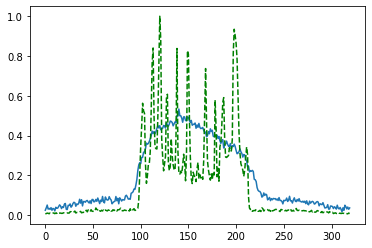

Time taken for epoch:  155.16028451919556
Epoch = [101/3000]  Iter = [   0/39480]  Loss = 0.1524 Avg Loss = 0.1524  Time = 0.0719s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [101/3000]  Iter = [ 100/39480]  Loss = 0.1543 Avg Loss = 0.1554  Time = 0.0029s
Epoch = [101/3000]  Iter = [ 200/39480]  Loss = 0.1824 Avg Loss = 0.1549  Time = 0.0036s
Epoch = [101/3000]  Iter = [ 300/39480]  Loss = 0.1665 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [101/3000]  Iter = [ 400/39480]  Loss = 0.1665 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [101/3000]  Iter = [ 500/39480]  Loss = 0.159 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [101/3000]  Iter = [ 600/39480]  Loss = 0.1625 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [101/3000]  Iter = [ 700/39480]  Loss = 0.1373 Avg Loss = 0.158  Time = 0.0037s
Epoch = [101/3000]  Iter = [ 800/39480]  Loss = 0.1507 Avg Loss = 0.1571  Time = 0.0046s
Epoch = [101/3000]  Iter = [ 900/39480]  Loss = 0.1429 Avg Loss = 0.1579  Time = 0.0031s
Epoch = [101/3000]  Iter = [1000/39480]  Loss = 0.1983 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [101/3000]  Iter = [1100/39480]  Loss = 0.174 Avg Loss = 0.1581  Time = 0.0034s
Epoch = [101/3000]  Iter

Epoch = [101/3000]  Iter = [9400/39480]  Loss = 0.1606 Avg Loss = 0.1589  Time = 0.0035s
Epoch = [101/3000]  Iter = [9500/39480]  Loss = 0.1497 Avg Loss = 0.1583  Time = 0.0033s
Epoch = [101/3000]  Iter = [9600/39480]  Loss = 0.1357 Avg Loss = 0.1568  Time = 0.0034s
Epoch = [101/3000]  Iter = [9700/39480]  Loss = 0.1443 Avg Loss = 0.1573  Time = 0.0031s
Epoch = [101/3000]  Iter = [9800/39480]  Loss = 0.1512 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [101/3000]  Iter = [9900/39480]  Loss = 0.1477 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [101/3000]  Iter = [10000/39480]  Loss = 0.1903 Avg Loss = 0.1563  Time = 0.0034s
Epoch = [101/3000]  Iter = [10100/39480]  Loss = 0.1607 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [101/3000]  Iter = [10200/39480]  Loss = 0.1709 Avg Loss = 0.1581  Time = 0.0035s
Epoch = [101/3000]  Iter = [10300/39480]  Loss = 0.1428 Avg Loss = 0.16  Time = 0.0036s
Epoch = [101/3000]  Iter = [10400/39480]  Loss = 0.1522 Avg Loss = 0.1584  Time = 0.0035s
Epoch = [101/3000]

Epoch = [101/3000]  Iter = [18600/39480]  Loss = 0.1863 Avg Loss = 0.1577  Time = 0.0033s
Epoch = [101/3000]  Iter = [18700/39480]  Loss = 0.1858 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [101/3000]  Iter = [18800/39480]  Loss = 0.1375 Avg Loss = 0.1573  Time = 0.0034s
Epoch = [101/3000]  Iter = [18900/39480]  Loss = 0.1359 Avg Loss = 0.1551  Time = 0.0035s
Epoch = [101/3000]  Iter = [19000/39480]  Loss = 0.1324 Avg Loss = 0.1575  Time = 0.0034s
Epoch = [101/3000]  Iter = [19100/39480]  Loss = 0.1637 Avg Loss = 0.1581  Time = 0.0034s
Epoch = [101/3000]  Iter = [19200/39480]  Loss = 0.1596 Avg Loss = 0.1573  Time = 0.0035s
Epoch = [101/3000]  Iter = [19300/39480]  Loss = 0.1549 Avg Loss = 0.1572  Time = 0.0033s
Epoch = [101/3000]  Iter = [19400/39480]  Loss = 0.1442 Avg Loss = 0.158  Time = 0.0033s
Epoch = [101/3000]  Iter = [19500/39480]  Loss = 0.1417 Avg Loss = 0.1576  Time = 0.0033s
Epoch = [101/3000]  Iter = [19600/39480]  Loss = 0.179 Avg Loss = 0.1565  Time = 0.0034s
Epoch = [101

Epoch = [101/3000]  Iter = [27800/39480]  Loss = 0.1506 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [101/3000]  Iter = [27900/39480]  Loss = 0.1332 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [101/3000]  Iter = [28000/39480]  Loss = 0.1748 Avg Loss = 0.1592  Time = 0.0037s
Epoch = [101/3000]  Iter = [28100/39480]  Loss = 0.2012 Avg Loss = 0.1588  Time = 0.0037s
Epoch = [101/3000]  Iter = [28200/39480]  Loss = 0.1472 Avg Loss = 0.1598  Time = 0.0036s
Epoch = [101/3000]  Iter = [28300/39480]  Loss = 0.1661 Avg Loss = 0.1587  Time = 0.0037s
Epoch = [101/3000]  Iter = [28400/39480]  Loss = 0.1439 Avg Loss = 0.1581  Time = 0.0035s
Epoch = [101/3000]  Iter = [28500/39480]  Loss = 0.1537 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [101/3000]  Iter = [28600/39480]  Loss = 0.1665 Avg Loss = 0.1586  Time = 0.0037s
Epoch = [101/3000]  Iter = [28700/39480]  Loss = 0.1581 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [101/3000]  Iter = [28800/39480]  Loss = 0.153 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [10

Epoch = [101/3000]  Iter = [37000/39480]  Loss = 0.1579 Avg Loss = 0.1574  Time = 0.0032s
Epoch = [101/3000]  Iter = [37100/39480]  Loss = 0.1673 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [101/3000]  Iter = [37200/39480]  Loss = 0.1918 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [101/3000]  Iter = [37300/39480]  Loss = 0.1672 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [101/3000]  Iter = [37400/39480]  Loss = 0.1704 Avg Loss = 0.1597  Time = 0.0037s
Epoch = [101/3000]  Iter = [37500/39480]  Loss = 0.1528 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [101/3000]  Iter = [37600/39480]  Loss = 0.1689 Avg Loss = 0.1582  Time = 0.0035s
Epoch = [101/3000]  Iter = [37700/39480]  Loss = 0.1827 Avg Loss = 0.1585  Time = 0.0030s
Epoch = [101/3000]  Iter = [37800/39480]  Loss = 0.1564 Avg Loss = 0.1583  Time = 0.0035s
Epoch = [101/3000]  Iter = [37900/39480]  Loss = 0.1779 Avg Loss = 0.1583  Time = 0.0032s
Epoch = [101/3000]  Iter = [38000/39480]  Loss = 0.1592 Avg Loss = 0.1573  Time = 0.0030s
Epoch = [1

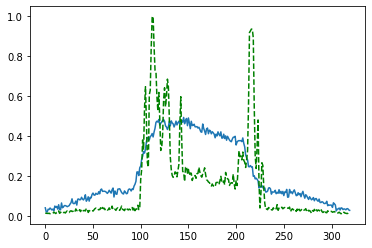

Time taken for epoch:  155.2836253643036
Epoch = [102/3000]  Iter = [   0/39480]  Loss = 0.1642 Avg Loss = 0.1642  Time = 0.0603s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [102/3000]  Iter = [ 100/39480]  Loss = 0.1555 Avg Loss = 0.1586  Time = 0.0030s
Epoch = [102/3000]  Iter = [ 200/39480]  Loss = 0.1814 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [102/3000]  Iter = [ 300/39480]  Loss = 0.1571 Avg Loss = 0.1589  Time = 0.0033s
Epoch = [102/3000]  Iter = [ 400/39480]  Loss = 0.1353 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [102/3000]  Iter = [ 500/39480]  Loss = 0.1726 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [102/3000]  Iter = [ 600/39480]  Loss = 0.1776 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [102/3000]  Iter = [ 700/39480]  Loss = 0.1546 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [102/3000]  Iter = [ 800/39480]  Loss = 0.1598 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [102/3000]  Iter = [ 900/39480]  Loss = 0.1467 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [102/3000]  Iter = [1000/39480]  Loss = 0.1561 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [102/3000]  Iter = [1100/39480]  Loss = 0.1494 Avg Loss = 0.1564  Time = 0.0034s
Epoch = [102/3000]  I

Epoch = [102/3000]  Iter = [9400/39480]  Loss = 0.1545 Avg Loss = 0.157  Time = 0.0035s
Epoch = [102/3000]  Iter = [9500/39480]  Loss = 0.1633 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [102/3000]  Iter = [9600/39480]  Loss = 0.1611 Avg Loss = 0.1581  Time = 0.0035s
Epoch = [102/3000]  Iter = [9700/39480]  Loss = 0.1754 Avg Loss = 0.1565  Time = 0.0034s
Epoch = [102/3000]  Iter = [9800/39480]  Loss = 0.1943 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [102/3000]  Iter = [9900/39480]  Loss = 0.1703 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [102/3000]  Iter = [10000/39480]  Loss = 0.1405 Avg Loss = 0.157  Time = 0.0036s
Epoch = [102/3000]  Iter = [10100/39480]  Loss = 0.1697 Avg Loss = 0.158  Time = 0.0036s
Epoch = [102/3000]  Iter = [10200/39480]  Loss = 0.1528 Avg Loss = 0.1573  Time = 0.0033s
Epoch = [102/3000]  Iter = [10300/39480]  Loss = 0.1565 Avg Loss = 0.1583  Time = 0.0031s
Epoch = [102/3000]  Iter = [10400/39480]  Loss = 0.1583 Avg Loss = 0.1587  Time = 0.0035s
Epoch = [102/3000] 

Epoch = [102/3000]  Iter = [18600/39480]  Loss = 0.1345 Avg Loss = 0.1586  Time = 0.0036s
Epoch = [102/3000]  Iter = [18700/39480]  Loss = 0.1809 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [102/3000]  Iter = [18800/39480]  Loss = 0.1153 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [102/3000]  Iter = [18900/39480]  Loss = 0.1611 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [102/3000]  Iter = [19000/39480]  Loss = 0.1602 Avg Loss = 0.157  Time = 0.0036s
Epoch = [102/3000]  Iter = [19100/39480]  Loss = 0.1271 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [102/3000]  Iter = [19200/39480]  Loss = 0.1484 Avg Loss = 0.1571  Time = 0.0068s
Epoch = [102/3000]  Iter = [19300/39480]  Loss = 0.1504 Avg Loss = 0.1568  Time = 0.0032s
Epoch = [102/3000]  Iter = [19400/39480]  Loss = 0.1879 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [102/3000]  Iter = [19500/39480]  Loss = 0.1743 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [102/3000]  Iter = [19600/39480]  Loss = 0.1703 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [10

Epoch = [102/3000]  Iter = [27800/39480]  Loss = 0.1687 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [102/3000]  Iter = [27900/39480]  Loss = 0.1348 Avg Loss = 0.156  Time = 0.0036s
Epoch = [102/3000]  Iter = [28000/39480]  Loss = 0.1611 Avg Loss = 0.1555  Time = 0.0035s
Epoch = [102/3000]  Iter = [28100/39480]  Loss = 0.1552 Avg Loss = 0.1574  Time = 0.0031s
Epoch = [102/3000]  Iter = [28200/39480]  Loss = 0.1546 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [102/3000]  Iter = [28300/39480]  Loss = 0.1638 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [102/3000]  Iter = [28400/39480]  Loss = 0.1426 Avg Loss = 0.157  Time = 0.0036s
Epoch = [102/3000]  Iter = [28500/39480]  Loss = 0.1587 Avg Loss = 0.1569  Time = 0.0031s
Epoch = [102/3000]  Iter = [28600/39480]  Loss = 0.1526 Avg Loss = 0.1581  Time = 0.0035s
Epoch = [102/3000]  Iter = [28700/39480]  Loss = 0.1438 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [102/3000]  Iter = [28800/39480]  Loss = 0.1558 Avg Loss = 0.158  Time = 0.0036s
Epoch = [102/

Epoch = [102/3000]  Iter = [37000/39480]  Loss = 0.1618 Avg Loss = 0.1587  Time = 0.0034s
Epoch = [102/3000]  Iter = [37100/39480]  Loss = 0.15 Avg Loss = 0.1579  Time = 0.0035s
Epoch = [102/3000]  Iter = [37200/39480]  Loss = 0.14 Avg Loss = 0.1587  Time = 0.0031s
Epoch = [102/3000]  Iter = [37300/39480]  Loss = 0.1426 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [102/3000]  Iter = [37400/39480]  Loss = 0.181 Avg Loss = 0.1587  Time = 0.0036s
Epoch = [102/3000]  Iter = [37500/39480]  Loss = 0.1416 Avg Loss = 0.1591  Time = 0.0036s
Epoch = [102/3000]  Iter = [37600/39480]  Loss = 0.1826 Avg Loss = 0.1589  Time = 0.0035s
Epoch = [102/3000]  Iter = [37700/39480]  Loss = 0.1364 Avg Loss = 0.1582  Time = 0.0035s
Epoch = [102/3000]  Iter = [37800/39480]  Loss = 0.1496 Avg Loss = 0.1583  Time = 0.0035s
Epoch = [102/3000]  Iter = [37900/39480]  Loss = 0.1681 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [102/3000]  Iter = [38000/39480]  Loss = 0.175 Avg Loss = 0.158  Time = 0.0036s
Epoch = [102/3000

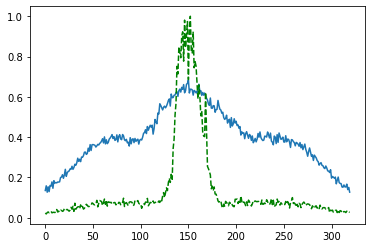

Time taken for epoch:  154.63270783424377
Epoch = [103/3000]  Iter = [   0/39480]  Loss = 0.1348 Avg Loss = 0.1348  Time = 0.0647s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [103/3000]  Iter = [ 100/39480]  Loss = 0.1416 Avg Loss = 0.1492  Time = 0.0035s
Epoch = [103/3000]  Iter = [ 200/39480]  Loss = 0.178 Avg Loss = 0.1535  Time = 0.0033s
Epoch = [103/3000]  Iter = [ 300/39480]  Loss = 0.1801 Avg Loss = 0.1538  Time = 0.0037s
Epoch = [103/3000]  Iter = [ 400/39480]  Loss = 0.1674 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [103/3000]  Iter = [ 500/39480]  Loss = 0.1623 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [103/3000]  Iter = [ 600/39480]  Loss = 0.1469 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [103/3000]  Iter = [ 700/39480]  Loss = 0.1479 Avg Loss = 0.1572  Time = 0.0029s
Epoch = [103/3000]  Iter = [ 800/39480]  Loss = 0.1433 Avg Loss = 0.1553  Time = 0.0029s
Epoch = [103/3000]  Iter = [ 900/39480]  Loss = 0.1529 Avg Loss = 0.1556  Time = 0.0029s
Epoch = [103/3000]  Iter = [1000/39480]  Loss = 0.1556 Avg Loss = 0.1566  Time = 0.0029s
Epoch = [103/3000]  Iter = [1100/39480]  Loss = 0.1469 Avg Loss = 0.1564  Time = 0.0035s
Epoch = [103/3000]  It

Epoch = [103/3000]  Iter = [9400/39480]  Loss = 0.1507 Avg Loss = 0.157  Time = 0.0036s
Epoch = [103/3000]  Iter = [9500/39480]  Loss = 0.1587 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [103/3000]  Iter = [9600/39480]  Loss = 0.1567 Avg Loss = 0.1563  Time = 0.0032s
Epoch = [103/3000]  Iter = [9700/39480]  Loss = 0.1427 Avg Loss = 0.1555  Time = 0.0035s
Epoch = [103/3000]  Iter = [9800/39480]  Loss = 0.1479 Avg Loss = 0.1551  Time = 0.0035s
Epoch = [103/3000]  Iter = [9900/39480]  Loss = 0.1694 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [103/3000]  Iter = [10000/39480]  Loss = 0.172 Avg Loss = 0.1551  Time = 0.0031s
Epoch = [103/3000]  Iter = [10100/39480]  Loss = 0.1407 Avg Loss = 0.1554  Time = 0.0035s
Epoch = [103/3000]  Iter = [10200/39480]  Loss = 0.1516 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [103/3000]  Iter = [10300/39480]  Loss = 0.1424 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [103/3000]  Iter = [10400/39480]  Loss = 0.1448 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [103/3000]

Epoch = [103/3000]  Iter = [18600/39480]  Loss = 0.1776 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [103/3000]  Iter = [18700/39480]  Loss = 0.1588 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [103/3000]  Iter = [18800/39480]  Loss = 0.15 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [103/3000]  Iter = [18900/39480]  Loss = 0.1625 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [103/3000]  Iter = [19000/39480]  Loss = 0.1668 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [103/3000]  Iter = [19100/39480]  Loss = 0.1504 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [103/3000]  Iter = [19200/39480]  Loss = 0.1794 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [103/3000]  Iter = [19300/39480]  Loss = 0.1431 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [103/3000]  Iter = [19400/39480]  Loss = 0.1451 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [103/3000]  Iter = [19500/39480]  Loss = 0.1693 Avg Loss = 0.1575  Time = 0.0032s
Epoch = [103/3000]  Iter = [19600/39480]  Loss = 0.1607 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [103

Epoch = [103/3000]  Iter = [27800/39480]  Loss = 0.1943 Avg Loss = 0.1579  Time = 0.0035s
Epoch = [103/3000]  Iter = [27900/39480]  Loss = 0.1398 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [103/3000]  Iter = [28000/39480]  Loss = 0.1476 Avg Loss = 0.157  Time = 0.0036s
Epoch = [103/3000]  Iter = [28100/39480]  Loss = 0.1783 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [103/3000]  Iter = [28200/39480]  Loss = 0.1763 Avg Loss = 0.1589  Time = 0.0036s
Epoch = [103/3000]  Iter = [28300/39480]  Loss = 0.1453 Avg Loss = 0.158  Time = 0.0036s
Epoch = [103/3000]  Iter = [28400/39480]  Loss = 0.1921 Avg Loss = 0.1581  Time = 0.0032s
Epoch = [103/3000]  Iter = [28500/39480]  Loss = 0.1502 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [103/3000]  Iter = [28600/39480]  Loss = 0.1563 Avg Loss = 0.156  Time = 0.0036s
Epoch = [103/3000]  Iter = [28700/39480]  Loss = 0.1714 Avg Loss = 0.1586  Time = 0.0036s
Epoch = [103/3000]  Iter = [28800/39480]  Loss = 0.1627 Avg Loss = 0.1585  Time = 0.0035s
Epoch = [103/

Epoch = [103/3000]  Iter = [37000/39480]  Loss = 0.1618 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [103/3000]  Iter = [37100/39480]  Loss = 0.1682 Avg Loss = 0.157  Time = 0.0031s
Epoch = [103/3000]  Iter = [37200/39480]  Loss = 0.1367 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [103/3000]  Iter = [37300/39480]  Loss = 0.1298 Avg Loss = 0.1553  Time = 0.0031s
Epoch = [103/3000]  Iter = [37400/39480]  Loss = 0.1549 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [103/3000]  Iter = [37500/39480]  Loss = 0.1472 Avg Loss = 0.1573  Time = 0.0033s
Epoch = [103/3000]  Iter = [37600/39480]  Loss = 0.1398 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [103/3000]  Iter = [37700/39480]  Loss = 0.1591 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [103/3000]  Iter = [37800/39480]  Loss = 0.15 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [103/3000]  Iter = [37900/39480]  Loss = 0.1452 Avg Loss = 0.1575  Time = 0.0033s
Epoch = [103/3000]  Iter = [38000/39480]  Loss = 0.1453 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [103/

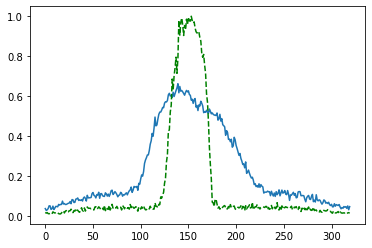

Time taken for epoch:  155.228618144989
Epoch = [104/3000]  Iter = [   0/39480]  Loss = 0.152 Avg Loss = 0.152  Time = 0.0678s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [104/3000]  Iter = [ 100/39480]  Loss = 0.1534 Avg Loss = 0.1553  Time = 0.0031s
Epoch = [104/3000]  Iter = [ 200/39480]  Loss = 0.138 Avg Loss = 0.1554  Time = 0.0035s
Epoch = [104/3000]  Iter = [ 300/39480]  Loss = 0.156 Avg Loss = 0.1552  Time = 0.0035s
Epoch = [104/3000]  Iter = [ 400/39480]  Loss = 0.1449 Avg Loss = 0.1545  Time = 0.0033s
Epoch = [104/3000]  Iter = [ 500/39480]  Loss = 0.1525 Avg Loss = 0.1541  Time = 0.0035s
Epoch = [104/3000]  Iter = [ 600/39480]  Loss = 0.1355 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [104/3000]  Iter = [ 700/39480]  Loss = 0.1419 Avg Loss = 0.1574  Time = 0.0035s
Epoch = [104/3000]  Iter = [ 800/39480]  Loss = 0.138 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [104/3000]  Iter = [ 900/39480]  Loss = 0.1489 Avg Loss = 0.1571  Time = 0.0029s
Epoch = [104/3000]  Iter = [1000/39480]  Loss = 0.1514 Avg Loss = 0.1559  Time = 0.0029s
Epoch = [104/3000]  Iter = [1100/39480]  Loss = 0.1482 Avg Loss = 0.1571  Time = 0.0029s
Epoch = [104/3000]  Iter

Epoch = [104/3000]  Iter = [9400/39480]  Loss = 0.1276 Avg Loss = 0.157  Time = 0.0031s
Epoch = [104/3000]  Iter = [9500/39480]  Loss = 0.1523 Avg Loss = 0.1573  Time = 0.0035s
Epoch = [104/3000]  Iter = [9600/39480]  Loss = 0.1616 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [104/3000]  Iter = [9700/39480]  Loss = 0.163 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [104/3000]  Iter = [9800/39480]  Loss = 0.1794 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [104/3000]  Iter = [9900/39480]  Loss = 0.1641 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [104/3000]  Iter = [10000/39480]  Loss = 0.1573 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [104/3000]  Iter = [10100/39480]  Loss = 0.148 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [104/3000]  Iter = [10200/39480]  Loss = 0.1769 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [104/3000]  Iter = [10300/39480]  Loss = 0.1587 Avg Loss = 0.1581  Time = 0.0032s
Epoch = [104/3000]  Iter = [10400/39480]  Loss = 0.171 Avg Loss = 0.1568  Time = 0.0033s
Epoch = [104/3000]  

Epoch = [104/3000]  Iter = [18600/39480]  Loss = 0.1736 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [104/3000]  Iter = [18700/39480]  Loss = 0.1641 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [104/3000]  Iter = [18800/39480]  Loss = 0.1517 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [104/3000]  Iter = [18900/39480]  Loss = 0.1478 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [104/3000]  Iter = [19000/39480]  Loss = 0.179 Avg Loss = 0.158  Time = 0.0037s
Epoch = [104/3000]  Iter = [19100/39480]  Loss = 0.1423 Avg Loss = 0.1572  Time = 0.0032s
Epoch = [104/3000]  Iter = [19200/39480]  Loss = 0.1544 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [104/3000]  Iter = [19300/39480]  Loss = 0.1487 Avg Loss = 0.1581  Time = 0.0035s
Epoch = [104/3000]  Iter = [19400/39480]  Loss = 0.1483 Avg Loss = 0.16  Time = 0.0037s
Epoch = [104/3000]  Iter = [19500/39480]  Loss = 0.1619 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [104/3000]  Iter = [19600/39480]  Loss = 0.163 Avg Loss = 0.157  Time = 0.0036s
Epoch = [104/300

Epoch = [104/3000]  Iter = [27800/39480]  Loss = 0.1711 Avg Loss = 0.1574  Time = 0.0035s
Epoch = [104/3000]  Iter = [27900/39480]  Loss = 0.1713 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [104/3000]  Iter = [28000/39480]  Loss = 0.1364 Avg Loss = 0.157  Time = 0.0036s
Epoch = [104/3000]  Iter = [28100/39480]  Loss = 0.1434 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [104/3000]  Iter = [28200/39480]  Loss = 0.1624 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [104/3000]  Iter = [28300/39480]  Loss = 0.174 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [104/3000]  Iter = [28400/39480]  Loss = 0.1365 Avg Loss = 0.1574  Time = 0.0034s
Epoch = [104/3000]  Iter = [28500/39480]  Loss = 0.1459 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [104/3000]  Iter = [28600/39480]  Loss = 0.1504 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [104/3000]  Iter = [28700/39480]  Loss = 0.1526 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [104/3000]  Iter = [28800/39480]  Loss = 0.1568 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [104

Epoch = [104/3000]  Iter = [37000/39480]  Loss = 0.1479 Avg Loss = 0.1561  Time = 0.0034s
Epoch = [104/3000]  Iter = [37100/39480]  Loss = 0.1604 Avg Loss = 0.156  Time = 0.0034s
Epoch = [104/3000]  Iter = [37200/39480]  Loss = 0.1538 Avg Loss = 0.1557  Time = 0.0031s
Epoch = [104/3000]  Iter = [37300/39480]  Loss = 0.1599 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [104/3000]  Iter = [37400/39480]  Loss = 0.1801 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [104/3000]  Iter = [37500/39480]  Loss = 0.1601 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [104/3000]  Iter = [37600/39480]  Loss = 0.16 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [104/3000]  Iter = [37700/39480]  Loss = 0.1782 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [104/3000]  Iter = [37800/39480]  Loss = 0.1537 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [104/3000]  Iter = [37900/39480]  Loss = 0.1675 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [104/3000]  Iter = [38000/39480]  Loss = 0.1715 Avg Loss = 0.1586  Time = 0.0034s
Epoch = [104/

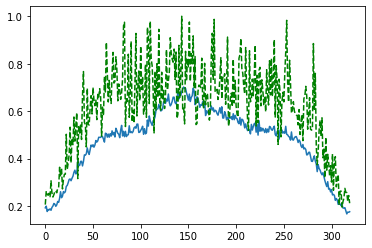

Time taken for epoch:  153.89349842071533
Epoch = [105/3000]  Iter = [   0/39480]  Loss = 0.1602 Avg Loss = 0.1602  Time = 0.0668s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [105/3000]  Iter = [ 100/39480]  Loss = 0.1507 Avg Loss = 0.1583  Time = 0.0033s
Epoch = [105/3000]  Iter = [ 200/39480]  Loss = 0.1405 Avg Loss = 0.157  Time = 0.0028s
Epoch = [105/3000]  Iter = [ 300/39480]  Loss = 0.1412 Avg Loss = 0.1571  Time = 0.0029s
Epoch = [105/3000]  Iter = [ 400/39480]  Loss = 0.141 Avg Loss = 0.1573  Time = 0.0028s
Epoch = [105/3000]  Iter = [ 500/39480]  Loss = 0.1542 Avg Loss = 0.1569  Time = 0.0028s
Epoch = [105/3000]  Iter = [ 600/39480]  Loss = 0.1451 Avg Loss = 0.1571  Time = 0.0031s
Epoch = [105/3000]  Iter = [ 700/39480]  Loss = 0.1567 Avg Loss = 0.157  Time = 0.0028s
Epoch = [105/3000]  Iter = [ 800/39480]  Loss = 0.1653 Avg Loss = 0.156  Time = 0.0035s
Epoch = [105/3000]  Iter = [ 900/39480]  Loss = 0.1648 Avg Loss = 0.1555  Time = 0.0035s
Epoch = [105/3000]  Iter = [1000/39480]  Loss = 0.1816 Avg Loss = 0.1546  Time = 0.0036s
Epoch = [105/3000]  Iter = [1100/39480]  Loss = 0.1481 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [105/3000]  Iter 

Epoch = [105/3000]  Iter = [9400/39480]  Loss = 0.1567 Avg Loss = 0.1583  Time = 0.0035s
Epoch = [105/3000]  Iter = [9500/39480]  Loss = 0.1449 Avg Loss = 0.1574  Time = 0.0031s
Epoch = [105/3000]  Iter = [9600/39480]  Loss = 0.1636 Avg Loss = 0.1575  Time = 0.0032s
Epoch = [105/3000]  Iter = [9700/39480]  Loss = 0.1582 Avg Loss = 0.1571  Time = 0.0033s
Epoch = [105/3000]  Iter = [9800/39480]  Loss = 0.1515 Avg Loss = 0.1582  Time = 0.0030s
Epoch = [105/3000]  Iter = [9900/39480]  Loss = 0.1638 Avg Loss = 0.1553  Time = 0.0027s
Epoch = [105/3000]  Iter = [10000/39480]  Loss = 0.1698 Avg Loss = 0.1559  Time = 0.0026s
Epoch = [105/3000]  Iter = [10100/39480]  Loss = 0.1676 Avg Loss = 0.1559  Time = 0.0025s
Epoch = [105/3000]  Iter = [10200/39480]  Loss = 0.1505 Avg Loss = 0.1559  Time = 0.0030s
Epoch = [105/3000]  Iter = [10300/39480]  Loss = 0.1828 Avg Loss = 0.1556  Time = 0.0029s
Epoch = [105/3000]  Iter = [10400/39480]  Loss = 0.1504 Avg Loss = 0.1567  Time = 0.0028s
Epoch = [105/300

Epoch = [105/3000]  Iter = [18600/39480]  Loss = 0.1845 Avg Loss = 0.1577  Time = 0.0030s
Epoch = [105/3000]  Iter = [18700/39480]  Loss = 0.1613 Avg Loss = 0.1587  Time = 0.0030s
Epoch = [105/3000]  Iter = [18800/39480]  Loss = 0.1504 Avg Loss = 0.1581  Time = 0.0030s
Epoch = [105/3000]  Iter = [18900/39480]  Loss = 0.1173 Avg Loss = 0.1572  Time = 0.0032s
Epoch = [105/3000]  Iter = [19000/39480]  Loss = 0.1368 Avg Loss = 0.1563  Time = 0.0029s
Epoch = [105/3000]  Iter = [19100/39480]  Loss = 0.1376 Avg Loss = 0.1573  Time = 0.0030s
Epoch = [105/3000]  Iter = [19200/39480]  Loss = 0.144 Avg Loss = 0.1584  Time = 0.0030s
Epoch = [105/3000]  Iter = [19300/39480]  Loss = 0.1754 Avg Loss = 0.1571  Time = 0.0030s
Epoch = [105/3000]  Iter = [19400/39480]  Loss = 0.1761 Avg Loss = 0.1566  Time = 0.0031s
Epoch = [105/3000]  Iter = [19500/39480]  Loss = 0.1584 Avg Loss = 0.1564  Time = 0.0030s
Epoch = [105/3000]  Iter = [19600/39480]  Loss = 0.1572 Avg Loss = 0.1561  Time = 0.0030s
Epoch = [10

Epoch = [105/3000]  Iter = [27800/39480]  Loss = 0.1715 Avg Loss = 0.1586  Time = 0.0034s
Epoch = [105/3000]  Iter = [27900/39480]  Loss = 0.1633 Avg Loss = 0.1571  Time = 0.0032s
Epoch = [105/3000]  Iter = [28000/39480]  Loss = 0.1759 Avg Loss = 0.1561  Time = 0.0032s
Epoch = [105/3000]  Iter = [28100/39480]  Loss = 0.1648 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [105/3000]  Iter = [28200/39480]  Loss = 0.1506 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [105/3000]  Iter = [28300/39480]  Loss = 0.1631 Avg Loss = 0.1579  Time = 0.0030s
Epoch = [105/3000]  Iter = [28400/39480]  Loss = 0.1671 Avg Loss = 0.1579  Time = 0.0030s
Epoch = [105/3000]  Iter = [28500/39480]  Loss = 0.1503 Avg Loss = 0.157  Time = 0.0030s
Epoch = [105/3000]  Iter = [28600/39480]  Loss = 0.1452 Avg Loss = 0.1576  Time = 0.0028s
Epoch = [105/3000]  Iter = [28700/39480]  Loss = 0.1386 Avg Loss = 0.1566  Time = 0.0033s
Epoch = [105/3000]  Iter = [28800/39480]  Loss = 0.1537 Avg Loss = 0.1573  Time = 0.0029s
Epoch = [10

Epoch = [105/3000]  Iter = [37000/39480]  Loss = 0.1617 Avg Loss = 0.1579  Time = 0.0041s
Epoch = [105/3000]  Iter = [37100/39480]  Loss = 0.1272 Avg Loss = 0.1584  Time = 0.0033s
Epoch = [105/3000]  Iter = [37200/39480]  Loss = 0.1636 Avg Loss = 0.1605  Time = 0.0030s
Epoch = [105/3000]  Iter = [37300/39480]  Loss = 0.1499 Avg Loss = 0.1586  Time = 0.0040s
Epoch = [105/3000]  Iter = [37400/39480]  Loss = 0.1665 Avg Loss = 0.1598  Time = 0.0036s
Epoch = [105/3000]  Iter = [37500/39480]  Loss = 0.1453 Avg Loss = 0.1587  Time = 0.0034s
Epoch = [105/3000]  Iter = [37600/39480]  Loss = 0.1669 Avg Loss = 0.158  Time = 0.0037s
Epoch = [105/3000]  Iter = [37700/39480]  Loss = 0.173 Avg Loss = 0.1566  Time = 0.0032s
Epoch = [105/3000]  Iter = [37800/39480]  Loss = 0.174 Avg Loss = 0.1561  Time = 0.0042s
Epoch = [105/3000]  Iter = [37900/39480]  Loss = 0.1718 Avg Loss = 0.1568  Time = 0.0034s
Epoch = [105/3000]  Iter = [38000/39480]  Loss = 0.1381 Avg Loss = 0.1565  Time = 0.0050s
Epoch = [105/

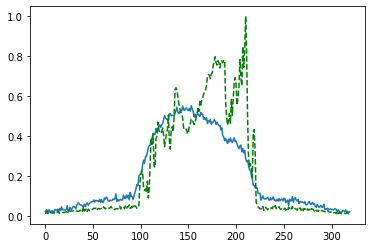

Time taken for epoch:  150.7740194797516
Epoch = [106/3000]  Iter = [   0/39480]  Loss = 0.1737 Avg Loss = 0.1737  Time = 0.0785s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [106/3000]  Iter = [ 100/39480]  Loss = 0.1628 Avg Loss = 0.1629  Time = 0.0034s
Epoch = [106/3000]  Iter = [ 200/39480]  Loss = 0.1605 Avg Loss = 0.1582  Time = 0.0038s
Epoch = [106/3000]  Iter = [ 300/39480]  Loss = 0.1382 Avg Loss = 0.1571  Time = 0.0035s
Epoch = [106/3000]  Iter = [ 400/39480]  Loss = 0.1348 Avg Loss = 0.156  Time = 0.0034s
Epoch = [106/3000]  Iter = [ 500/39480]  Loss = 0.1688 Avg Loss = 0.1559  Time = 0.0030s
Epoch = [106/3000]  Iter = [ 600/39480]  Loss = 0.1587 Avg Loss = 0.1546  Time = 0.0030s
Epoch = [106/3000]  Iter = [ 700/39480]  Loss = 0.1382 Avg Loss = 0.1561  Time = 0.0030s
Epoch = [106/3000]  Iter = [ 800/39480]  Loss = 0.1617 Avg Loss = 0.156  Time = 0.0033s
Epoch = [106/3000]  Iter = [ 900/39480]  Loss = 0.1676 Avg Loss = 0.1568  Time = 0.0029s
Epoch = [106/3000]  Iter = [1000/39480]  Loss = 0.1805 Avg Loss = 0.1582  Time = 0.0030s
Epoch = [106/3000]  Iter = [1100/39480]  Loss = 0.1615 Avg Loss = 0.1577  Time = 0.0034s
Epoch = [106/3000]  Ite

Epoch = [106/3000]  Iter = [9400/39480]  Loss = 0.1401 Avg Loss = 0.1566  Time = 0.0029s
Epoch = [106/3000]  Iter = [9500/39480]  Loss = 0.1492 Avg Loss = 0.1572  Time = 0.0029s
Epoch = [106/3000]  Iter = [9600/39480]  Loss = 0.155 Avg Loss = 0.1577  Time = 0.0029s
Epoch = [106/3000]  Iter = [9700/39480]  Loss = 0.1588 Avg Loss = 0.156  Time = 0.0030s
Epoch = [106/3000]  Iter = [9800/39480]  Loss = 0.1805 Avg Loss = 0.1555  Time = 0.0029s
Epoch = [106/3000]  Iter = [9900/39480]  Loss = 0.1426 Avg Loss = 0.1548  Time = 0.0029s
Epoch = [106/3000]  Iter = [10000/39480]  Loss = 0.1386 Avg Loss = 0.1567  Time = 0.0029s
Epoch = [106/3000]  Iter = [10100/39480]  Loss = 0.1808 Avg Loss = 0.1581  Time = 0.0029s
Epoch = [106/3000]  Iter = [10200/39480]  Loss = 0.1718 Avg Loss = 0.156  Time = 0.0029s
Epoch = [106/3000]  Iter = [10300/39480]  Loss = 0.1795 Avg Loss = 0.1554  Time = 0.0029s
Epoch = [106/3000]  Iter = [10400/39480]  Loss = 0.1261 Avg Loss = 0.156  Time = 0.0027s
Epoch = [106/3000]  

Epoch = [106/3000]  Iter = [18600/39480]  Loss = 0.1424 Avg Loss = 0.1564  Time = 0.0029s
Epoch = [106/3000]  Iter = [18700/39480]  Loss = 0.154 Avg Loss = 0.1561  Time = 0.0027s
Epoch = [106/3000]  Iter = [18800/39480]  Loss = 0.1427 Avg Loss = 0.1561  Time = 0.0029s
Epoch = [106/3000]  Iter = [18900/39480]  Loss = 0.1578 Avg Loss = 0.1568  Time = 0.0029s
Epoch = [106/3000]  Iter = [19000/39480]  Loss = 0.1391 Avg Loss = 0.1582  Time = 0.0029s
Epoch = [106/3000]  Iter = [19100/39480]  Loss = 0.1462 Avg Loss = 0.1561  Time = 0.0029s
Epoch = [106/3000]  Iter = [19200/39480]  Loss = 0.1382 Avg Loss = 0.1559  Time = 0.0029s
Epoch = [106/3000]  Iter = [19300/39480]  Loss = 0.1558 Avg Loss = 0.1565  Time = 0.0029s
Epoch = [106/3000]  Iter = [19400/39480]  Loss = 0.1446 Avg Loss = 0.156  Time = 0.0028s
Epoch = [106/3000]  Iter = [19500/39480]  Loss = 0.1524 Avg Loss = 0.1572  Time = 0.0029s
Epoch = [106/3000]  Iter = [19600/39480]  Loss = 0.1496 Avg Loss = 0.1576  Time = 0.0028s
Epoch = [106

Epoch = [106/3000]  Iter = [27800/39480]  Loss = 0.1511 Avg Loss = 0.1579  Time = 0.0028s
Epoch = [106/3000]  Iter = [27900/39480]  Loss = 0.1584 Avg Loss = 0.1584  Time = 0.0029s
Epoch = [106/3000]  Iter = [28000/39480]  Loss = 0.1671 Avg Loss = 0.1589  Time = 0.0029s
Epoch = [106/3000]  Iter = [28100/39480]  Loss = 0.1488 Avg Loss = 0.1556  Time = 0.0030s
Epoch = [106/3000]  Iter = [28200/39480]  Loss = 0.1695 Avg Loss = 0.1565  Time = 0.0030s
Epoch = [106/3000]  Iter = [28300/39480]  Loss = 0.1539 Avg Loss = 0.1576  Time = 0.0029s
Epoch = [106/3000]  Iter = [28400/39480]  Loss = 0.1498 Avg Loss = 0.1562  Time = 0.0028s
Epoch = [106/3000]  Iter = [28500/39480]  Loss = 0.1709 Avg Loss = 0.1561  Time = 0.0029s
Epoch = [106/3000]  Iter = [28600/39480]  Loss = 0.1779 Avg Loss = 0.158  Time = 0.0029s
Epoch = [106/3000]  Iter = [28700/39480]  Loss = 0.1231 Avg Loss = 0.158  Time = 0.0029s
Epoch = [106/3000]  Iter = [28800/39480]  Loss = 0.154 Avg Loss = 0.1602  Time = 0.0029s
Epoch = [106/

Epoch = [106/3000]  Iter = [37000/39480]  Loss = 0.1574 Avg Loss = 0.156  Time = 0.0030s
Epoch = [106/3000]  Iter = [37100/39480]  Loss = 0.1621 Avg Loss = 0.1573  Time = 0.0030s
Epoch = [106/3000]  Iter = [37200/39480]  Loss = 0.1446 Avg Loss = 0.1573  Time = 0.0033s
Epoch = [106/3000]  Iter = [37300/39480]  Loss = 0.1529 Avg Loss = 0.1583  Time = 0.0034s
Epoch = [106/3000]  Iter = [37400/39480]  Loss = 0.1727 Avg Loss = 0.1588  Time = 0.0029s
Epoch = [106/3000]  Iter = [37500/39480]  Loss = 0.1705 Avg Loss = 0.1578  Time = 0.0029s
Epoch = [106/3000]  Iter = [37600/39480]  Loss = 0.2002 Avg Loss = 0.158  Time = 0.0029s
Epoch = [106/3000]  Iter = [37700/39480]  Loss = 0.1596 Avg Loss = 0.1566  Time = 0.0025s
Epoch = [106/3000]  Iter = [37800/39480]  Loss = 0.1575 Avg Loss = 0.1568  Time = 0.0030s
Epoch = [106/3000]  Iter = [37900/39480]  Loss = 0.1387 Avg Loss = 0.1565  Time = 0.0027s
Epoch = [106/3000]  Iter = [38000/39480]  Loss = 0.156 Avg Loss = 0.1577  Time = 0.0029s
Epoch = [106/

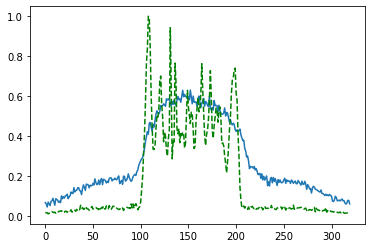

Time taken for epoch:  141.47500610351562
Epoch = [107/3000]  Iter = [   0/39480]  Loss = 0.1673 Avg Loss = 0.1673  Time = 0.0720s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [107/3000]  Iter = [ 100/39480]  Loss = 0.1687 Avg Loss = 0.1593  Time = 0.0030s
Epoch = [107/3000]  Iter = [ 200/39480]  Loss = 0.1729 Avg Loss = 0.1552  Time = 0.0033s
Epoch = [107/3000]  Iter = [ 300/39480]  Loss = 0.1585 Avg Loss = 0.1569  Time = 0.0033s
Epoch = [107/3000]  Iter = [ 400/39480]  Loss = 0.1285 Avg Loss = 0.1565  Time = 0.0029s
Epoch = [107/3000]  Iter = [ 500/39480]  Loss = 0.1656 Avg Loss = 0.1563  Time = 0.0029s
Epoch = [107/3000]  Iter = [ 600/39480]  Loss = 0.1608 Avg Loss = 0.1553  Time = 0.0034s
Epoch = [107/3000]  Iter = [ 700/39480]  Loss = 0.1782 Avg Loss = 0.1549  Time = 0.0032s
Epoch = [107/3000]  Iter = [ 800/39480]  Loss = 0.1691 Avg Loss = 0.1554  Time = 0.0030s
Epoch = [107/3000]  Iter = [ 900/39480]  Loss = 0.1508 Avg Loss = 0.1554  Time = 0.0033s
Epoch = [107/3000]  Iter = [1000/39480]  Loss = 0.1449 Avg Loss = 0.1565  Time = 0.0031s
Epoch = [107/3000]  Iter = [1100/39480]  Loss = 0.142 Avg Loss = 0.1563  Time = 0.0031s
Epoch = [107/3000]  It

Epoch = [107/3000]  Iter = [9400/39480]  Loss = 0.1504 Avg Loss = 0.1553  Time = 0.0030s
Epoch = [107/3000]  Iter = [9500/39480]  Loss = 0.154 Avg Loss = 0.1558  Time = 0.0030s
Epoch = [107/3000]  Iter = [9600/39480]  Loss = 0.1599 Avg Loss = 0.157  Time = 0.0032s
Epoch = [107/3000]  Iter = [9700/39480]  Loss = 0.1564 Avg Loss = 0.1559  Time = 0.0030s
Epoch = [107/3000]  Iter = [9800/39480]  Loss = 0.1609 Avg Loss = 0.1569  Time = 0.0029s
Epoch = [107/3000]  Iter = [9900/39480]  Loss = 0.1578 Avg Loss = 0.1555  Time = 0.0029s
Epoch = [107/3000]  Iter = [10000/39480]  Loss = 0.163 Avg Loss = 0.1557  Time = 0.0031s
Epoch = [107/3000]  Iter = [10100/39480]  Loss = 0.1458 Avg Loss = 0.1564  Time = 0.0029s
Epoch = [107/3000]  Iter = [10200/39480]  Loss = 0.1406 Avg Loss = 0.1552  Time = 0.0031s
Epoch = [107/3000]  Iter = [10300/39480]  Loss = 0.1503 Avg Loss = 0.1561  Time = 0.0029s
Epoch = [107/3000]  Iter = [10400/39480]  Loss = 0.1278 Avg Loss = 0.1552  Time = 0.0030s
Epoch = [107/3000] 

Epoch = [107/3000]  Iter = [18600/39480]  Loss = 0.1584 Avg Loss = 0.1563  Time = 0.0033s
Epoch = [107/3000]  Iter = [18700/39480]  Loss = 0.1415 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [107/3000]  Iter = [18800/39480]  Loss = 0.1818 Avg Loss = 0.1577  Time = 0.0029s
Epoch = [107/3000]  Iter = [18900/39480]  Loss = 0.1549 Avg Loss = 0.1568  Time = 0.0028s
Epoch = [107/3000]  Iter = [19000/39480]  Loss = 0.1511 Avg Loss = 0.1568  Time = 0.0030s
Epoch = [107/3000]  Iter = [19100/39480]  Loss = 0.1488 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [107/3000]  Iter = [19200/39480]  Loss = 0.1465 Avg Loss = 0.1556  Time = 0.0034s
Epoch = [107/3000]  Iter = [19300/39480]  Loss = 0.1566 Avg Loss = 0.1558  Time = 0.0032s
Epoch = [107/3000]  Iter = [19400/39480]  Loss = 0.1522 Avg Loss = 0.1572  Time = 0.0029s
Epoch = [107/3000]  Iter = [19500/39480]  Loss = 0.1733 Avg Loss = 0.1561  Time = 0.0032s
Epoch = [107/3000]  Iter = [19600/39480]  Loss = 0.1372 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [1

Epoch = [107/3000]  Iter = [27800/39480]  Loss = 0.165 Avg Loss = 0.1567  Time = 0.0029s
Epoch = [107/3000]  Iter = [27900/39480]  Loss = 0.1612 Avg Loss = 0.157  Time = 0.0031s
Epoch = [107/3000]  Iter = [28000/39480]  Loss = 0.1505 Avg Loss = 0.1571  Time = 0.0029s
Epoch = [107/3000]  Iter = [28100/39480]  Loss = 0.16 Avg Loss = 0.1574  Time = 0.0030s
Epoch = [107/3000]  Iter = [28200/39480]  Loss = 0.1492 Avg Loss = 0.1565  Time = 0.0030s
Epoch = [107/3000]  Iter = [28300/39480]  Loss = 0.1701 Avg Loss = 0.1579  Time = 0.0030s
Epoch = [107/3000]  Iter = [28400/39480]  Loss = 0.1433 Avg Loss = 0.1574  Time = 0.0030s
Epoch = [107/3000]  Iter = [28500/39480]  Loss = 0.1619 Avg Loss = 0.1572  Time = 0.0029s
Epoch = [107/3000]  Iter = [28600/39480]  Loss = 0.1411 Avg Loss = 0.156  Time = 0.0031s
Epoch = [107/3000]  Iter = [28700/39480]  Loss = 0.1648 Avg Loss = 0.1561  Time = 0.0030s
Epoch = [107/3000]  Iter = [28800/39480]  Loss = 0.1685 Avg Loss = 0.1579  Time = 0.0031s
Epoch = [107/30

Epoch = [107/3000]  Iter = [37000/39480]  Loss = 0.1554 Avg Loss = 0.1573  Time = 0.0030s
Epoch = [107/3000]  Iter = [37100/39480]  Loss = 0.155 Avg Loss = 0.1565  Time = 0.0030s
Epoch = [107/3000]  Iter = [37200/39480]  Loss = 0.153 Avg Loss = 0.1554  Time = 0.0030s
Epoch = [107/3000]  Iter = [37300/39480]  Loss = 0.1878 Avg Loss = 0.1569  Time = 0.0034s
Epoch = [107/3000]  Iter = [37400/39480]  Loss = 0.1587 Avg Loss = 0.1575  Time = 0.0033s
Epoch = [107/3000]  Iter = [37500/39480]  Loss = 0.1466 Avg Loss = 0.1577  Time = 0.0031s
Epoch = [107/3000]  Iter = [37600/39480]  Loss = 0.16 Avg Loss = 0.1574  Time = 0.0032s
Epoch = [107/3000]  Iter = [37700/39480]  Loss = 0.1525 Avg Loss = 0.1575  Time = 0.0031s
Epoch = [107/3000]  Iter = [37800/39480]  Loss = 0.1536 Avg Loss = 0.1567  Time = 0.0028s
Epoch = [107/3000]  Iter = [37900/39480]  Loss = 0.1745 Avg Loss = 0.1568  Time = 0.0029s
Epoch = [107/3000]  Iter = [38000/39480]  Loss = 0.1374 Avg Loss = 0.1571  Time = 0.0050s
Epoch = [107/3

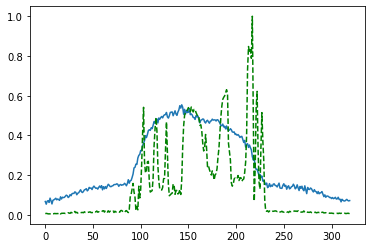

Time taken for epoch:  148.79116868972778
Epoch = [108/3000]  Iter = [   0/39480]  Loss = 0.1486 Avg Loss = 0.1486  Time = 0.0757s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [108/3000]  Iter = [ 100/39480]  Loss = 0.1364 Avg Loss = 0.1531  Time = 0.0042s
Epoch = [108/3000]  Iter = [ 200/39480]  Loss = 0.1788 Avg Loss = 0.1546  Time = 0.0041s
Epoch = [108/3000]  Iter = [ 300/39480]  Loss = 0.1642 Avg Loss = 0.1558  Time = 0.0041s
Epoch = [108/3000]  Iter = [ 400/39480]  Loss = 0.1589 Avg Loss = 0.1554  Time = 0.0039s
Epoch = [108/3000]  Iter = [ 500/39480]  Loss = 0.1442 Avg Loss = 0.1547  Time = 0.0036s
Epoch = [108/3000]  Iter = [ 600/39480]  Loss = 0.2026 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [108/3000]  Iter = [ 700/39480]  Loss = 0.1655 Avg Loss = 0.1563  Time = 0.0033s
Epoch = [108/3000]  Iter = [ 800/39480]  Loss = 0.1413 Avg Loss = 0.1571  Time = 0.0034s
Epoch = [108/3000]  Iter = [ 900/39480]  Loss = 0.1515 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [108/3000]  Iter = [1000/39480]  Loss = 0.147 Avg Loss = 0.157  Time = 0.0035s
Epoch = [108/3000]  Iter = [1100/39480]  Loss = 0.1536 Avg Loss = 0.1566  Time = 0.0034s
Epoch = [108/3000]  Ite

Epoch = [108/3000]  Iter = [9400/39480]  Loss = 0.1327 Avg Loss = 0.1571  Time = 0.0031s
Epoch = [108/3000]  Iter = [9500/39480]  Loss = 0.1436 Avg Loss = 0.1569  Time = 0.0031s
Epoch = [108/3000]  Iter = [9600/39480]  Loss = 0.1493 Avg Loss = 0.1539  Time = 0.0031s
Epoch = [108/3000]  Iter = [9700/39480]  Loss = 0.1545 Avg Loss = 0.1566  Time = 0.0031s
Epoch = [108/3000]  Iter = [9800/39480]  Loss = 0.1596 Avg Loss = 0.1566  Time = 0.0030s
Epoch = [108/3000]  Iter = [9900/39480]  Loss = 0.181 Avg Loss = 0.1565  Time = 0.0030s
Epoch = [108/3000]  Iter = [10000/39480]  Loss = 0.1591 Avg Loss = 0.1557  Time = 0.0031s
Epoch = [108/3000]  Iter = [10100/39480]  Loss = 0.1586 Avg Loss = 0.1583  Time = 0.0031s
Epoch = [108/3000]  Iter = [10200/39480]  Loss = 0.1418 Avg Loss = 0.1578  Time = 0.0031s
Epoch = [108/3000]  Iter = [10300/39480]  Loss = 0.1439 Avg Loss = 0.1578  Time = 0.0030s
Epoch = [108/3000]  Iter = [10400/39480]  Loss = 0.1474 Avg Loss = 0.1591  Time = 0.0036s
Epoch = [108/3000

Epoch = [108/3000]  Iter = [18600/39480]  Loss = 0.194 Avg Loss = 0.1597  Time = 0.0034s
Epoch = [108/3000]  Iter = [18700/39480]  Loss = 0.1518 Avg Loss = 0.1574  Time = 0.0054s
Epoch = [108/3000]  Iter = [18800/39480]  Loss = 0.1622 Avg Loss = 0.1578  Time = 0.0035s
Epoch = [108/3000]  Iter = [18900/39480]  Loss = 0.1637 Avg Loss = 0.1589  Time = 0.0032s
Epoch = [108/3000]  Iter = [19000/39480]  Loss = 0.1596 Avg Loss = 0.1581  Time = 0.0032s
Epoch = [108/3000]  Iter = [19100/39480]  Loss = 0.1525 Avg Loss = 0.1572  Time = 0.0039s
Epoch = [108/3000]  Iter = [19200/39480]  Loss = 0.1788 Avg Loss = 0.1583  Time = 0.0031s
Epoch = [108/3000]  Iter = [19300/39480]  Loss = 0.1653 Avg Loss = 0.1589  Time = 0.0035s
Epoch = [108/3000]  Iter = [19400/39480]  Loss = 0.1581 Avg Loss = 0.1569  Time = 0.0033s
Epoch = [108/3000]  Iter = [19500/39480]  Loss = 0.1409 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [108/3000]  Iter = [19600/39480]  Loss = 0.1717 Avg Loss = 0.1566  Time = 0.0033s
Epoch = [10

Epoch = [108/3000]  Iter = [27800/39480]  Loss = 0.1535 Avg Loss = 0.1591  Time = 0.0032s
Epoch = [108/3000]  Iter = [27900/39480]  Loss = 0.1367 Avg Loss = 0.1595  Time = 0.0033s
Epoch = [108/3000]  Iter = [28000/39480]  Loss = 0.166 Avg Loss = 0.1562  Time = 0.0031s
Epoch = [108/3000]  Iter = [28100/39480]  Loss = 0.1744 Avg Loss = 0.1567  Time = 0.0034s
Epoch = [108/3000]  Iter = [28200/39480]  Loss = 0.1356 Avg Loss = 0.1585  Time = 0.0034s
Epoch = [108/3000]  Iter = [28300/39480]  Loss = 0.1504 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [108/3000]  Iter = [28400/39480]  Loss = 0.1357 Avg Loss = 0.1567  Time = 0.0033s
Epoch = [108/3000]  Iter = [28500/39480]  Loss = 0.1487 Avg Loss = 0.1578  Time = 0.0033s
Epoch = [108/3000]  Iter = [28600/39480]  Loss = 0.1595 Avg Loss = 0.1579  Time = 0.0038s
Epoch = [108/3000]  Iter = [28700/39480]  Loss = 0.1382 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [108/3000]  Iter = [28800/39480]  Loss = 0.1682 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [10

Epoch = [108/3000]  Iter = [37000/39480]  Loss = 0.1674 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [108/3000]  Iter = [37100/39480]  Loss = 0.1603 Avg Loss = 0.1555  Time = 0.0033s
Epoch = [108/3000]  Iter = [37200/39480]  Loss = 0.1534 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [108/3000]  Iter = [37300/39480]  Loss = 0.177 Avg Loss = 0.1567  Time = 0.0033s
Epoch = [108/3000]  Iter = [37400/39480]  Loss = 0.1376 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [108/3000]  Iter = [37500/39480]  Loss = 0.1702 Avg Loss = 0.159  Time = 0.0033s
Epoch = [108/3000]  Iter = [37600/39480]  Loss = 0.1581 Avg Loss = 0.1575  Time = 0.0034s
Epoch = [108/3000]  Iter = [37700/39480]  Loss = 0.1693 Avg Loss = 0.1577  Time = 0.0045s
Epoch = [108/3000]  Iter = [37800/39480]  Loss = 0.1559 Avg Loss = 0.157  Time = 0.0036s
Epoch = [108/3000]  Iter = [37900/39480]  Loss = 0.1733 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [108/3000]  Iter = [38000/39480]  Loss = 0.169 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [108/3

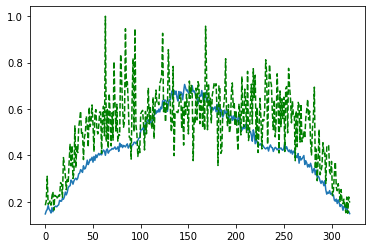

Time taken for epoch:  156.6227045059204
Epoch = [109/3000]  Iter = [   0/39480]  Loss = 0.1418 Avg Loss = 0.1418  Time = 0.0761s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [109/3000]  Iter = [ 100/39480]  Loss = 0.1495 Avg Loss = 0.1534  Time = 0.0031s
Epoch = [109/3000]  Iter = [ 200/39480]  Loss = 0.1542 Avg Loss = 0.1549  Time = 0.0035s
Epoch = [109/3000]  Iter = [ 300/39480]  Loss = 0.1546 Avg Loss = 0.1555  Time = 0.0035s
Epoch = [109/3000]  Iter = [ 400/39480]  Loss = 0.1292 Avg Loss = 0.1568  Time = 0.0034s
Epoch = [109/3000]  Iter = [ 500/39480]  Loss = 0.1895 Avg Loss = 0.1573  Time = 0.0035s
Epoch = [109/3000]  Iter = [ 600/39480]  Loss = 0.1649 Avg Loss = 0.1566  Time = 0.0034s
Epoch = [109/3000]  Iter = [ 700/39480]  Loss = 0.1502 Avg Loss = 0.1562  Time = 0.0031s
Epoch = [109/3000]  Iter = [ 800/39480]  Loss = 0.1454 Avg Loss = 0.1544  Time = 0.0031s
Epoch = [109/3000]  Iter = [ 900/39480]  Loss = 0.163 Avg Loss = 0.1556  Time = 0.0034s
Epoch = [109/3000]  Iter = [1000/39480]  Loss = 0.1587 Avg Loss = 0.1573  Time = 0.0034s
Epoch = [109/3000]  Iter = [1100/39480]  Loss = 0.1284 Avg Loss = 0.1568  Time = 0.0050s
Epoch = [109/3000]  It

Epoch = [109/3000]  Iter = [9400/39480]  Loss = 0.1845 Avg Loss = 0.1574  Time = 0.0030s
Epoch = [109/3000]  Iter = [9500/39480]  Loss = 0.1639 Avg Loss = 0.1563  Time = 0.0030s
Epoch = [109/3000]  Iter = [9600/39480]  Loss = 0.1369 Avg Loss = 0.1568  Time = 0.0030s
Epoch = [109/3000]  Iter = [9700/39480]  Loss = 0.145 Avg Loss = 0.1551  Time = 0.0030s
Epoch = [109/3000]  Iter = [9800/39480]  Loss = 0.1358 Avg Loss = 0.1559  Time = 0.0033s
Epoch = [109/3000]  Iter = [9900/39480]  Loss = 0.1572 Avg Loss = 0.1554  Time = 0.0031s
Epoch = [109/3000]  Iter = [10000/39480]  Loss = 0.1509 Avg Loss = 0.1567  Time = 0.0032s
Epoch = [109/3000]  Iter = [10100/39480]  Loss = 0.164 Avg Loss = 0.1554  Time = 0.0031s
Epoch = [109/3000]  Iter = [10200/39480]  Loss = 0.1434 Avg Loss = 0.1563  Time = 0.0030s
Epoch = [109/3000]  Iter = [10300/39480]  Loss = 0.151 Avg Loss = 0.1569  Time = 0.0030s
Epoch = [109/3000]  Iter = [10400/39480]  Loss = 0.1564 Avg Loss = 0.1552  Time = 0.0031s
Epoch = [109/3000] 

Epoch = [109/3000]  Iter = [18600/39480]  Loss = 0.1419 Avg Loss = 0.1577  Time = 0.0031s
Epoch = [109/3000]  Iter = [18700/39480]  Loss = 0.1785 Avg Loss = 0.1594  Time = 0.0031s
Epoch = [109/3000]  Iter = [18800/39480]  Loss = 0.175 Avg Loss = 0.1584  Time = 0.0031s
Epoch = [109/3000]  Iter = [18900/39480]  Loss = 0.15 Avg Loss = 0.158  Time = 0.0031s
Epoch = [109/3000]  Iter = [19000/39480]  Loss = 0.172 Avg Loss = 0.1575  Time = 0.0031s
Epoch = [109/3000]  Iter = [19100/39480]  Loss = 0.1611 Avg Loss = 0.1572  Time = 0.0030s
Epoch = [109/3000]  Iter = [19200/39480]  Loss = 0.1844 Avg Loss = 0.1576  Time = 0.0029s
Epoch = [109/3000]  Iter = [19300/39480]  Loss = 0.1798 Avg Loss = 0.1581  Time = 0.0030s
Epoch = [109/3000]  Iter = [19400/39480]  Loss = 0.1647 Avg Loss = 0.1567  Time = 0.0030s
Epoch = [109/3000]  Iter = [19500/39480]  Loss = 0.1777 Avg Loss = 0.1575  Time = 0.0031s
Epoch = [109/3000]  Iter = [19600/39480]  Loss = 0.1573 Avg Loss = 0.1583  Time = 0.0030s
Epoch = [109/30

Epoch = [109/3000]  Iter = [27800/39480]  Loss = 0.1263 Avg Loss = 0.1563  Time = 0.0031s
Epoch = [109/3000]  Iter = [27900/39480]  Loss = 0.1368 Avg Loss = 0.1565  Time = 0.0031s
Epoch = [109/3000]  Iter = [28000/39480]  Loss = 0.163 Avg Loss = 0.1551  Time = 0.0031s
Epoch = [109/3000]  Iter = [28100/39480]  Loss = 0.1554 Avg Loss = 0.1559  Time = 0.0030s
Epoch = [109/3000]  Iter = [28200/39480]  Loss = 0.1643 Avg Loss = 0.1573  Time = 0.0029s
Epoch = [109/3000]  Iter = [28300/39480]  Loss = 0.1464 Avg Loss = 0.159  Time = 0.0031s
Epoch = [109/3000]  Iter = [28400/39480]  Loss = 0.1603 Avg Loss = 0.1577  Time = 0.0031s
Epoch = [109/3000]  Iter = [28500/39480]  Loss = 0.169 Avg Loss = 0.1592  Time = 0.0031s
Epoch = [109/3000]  Iter = [28600/39480]  Loss = 0.192 Avg Loss = 0.157  Time = 0.0030s
Epoch = [109/3000]  Iter = [28700/39480]  Loss = 0.152 Avg Loss = 0.1565  Time = 0.0033s
Epoch = [109/3000]  Iter = [28800/39480]  Loss = 0.1812 Avg Loss = 0.1572  Time = 0.0030s
Epoch = [109/300

Epoch = [109/3000]  Iter = [37000/39480]  Loss = 0.1444 Avg Loss = 0.1583  Time = 0.0031s
Epoch = [109/3000]  Iter = [37100/39480]  Loss = 0.1552 Avg Loss = 0.1585  Time = 0.0030s
Epoch = [109/3000]  Iter = [37200/39480]  Loss = 0.1557 Avg Loss = 0.1567  Time = 0.0030s
Epoch = [109/3000]  Iter = [37300/39480]  Loss = 0.171 Avg Loss = 0.1566  Time = 0.0030s
Epoch = [109/3000]  Iter = [37400/39480]  Loss = 0.1209 Avg Loss = 0.1564  Time = 0.0030s
Epoch = [109/3000]  Iter = [37500/39480]  Loss = 0.1483 Avg Loss = 0.1575  Time = 0.0030s
Epoch = [109/3000]  Iter = [37600/39480]  Loss = 0.156 Avg Loss = 0.1577  Time = 0.0033s
Epoch = [109/3000]  Iter = [37700/39480]  Loss = 0.162 Avg Loss = 0.1593  Time = 0.0033s
Epoch = [109/3000]  Iter = [37800/39480]  Loss = 0.1445 Avg Loss = 0.1572  Time = 0.0031s
Epoch = [109/3000]  Iter = [37900/39480]  Loss = 0.1398 Avg Loss = 0.1563  Time = 0.0033s
Epoch = [109/3000]  Iter = [38000/39480]  Loss = 0.1772 Avg Loss = 0.158  Time = 0.0030s
Epoch = [109/3

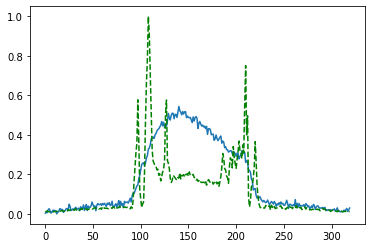

Time taken for epoch:  147.51762104034424
Epoch = [110/3000]  Iter = [   0/39480]  Loss = 0.163 Avg Loss = 0.163  Time = 0.1003s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [110/3000]  Iter = [ 100/39480]  Loss = 0.1431 Avg Loss = 0.1581  Time = 0.0033s
Epoch = [110/3000]  Iter = [ 200/39480]  Loss = 0.1871 Avg Loss = 0.157  Time = 0.0033s
Epoch = [110/3000]  Iter = [ 300/39480]  Loss = 0.1431 Avg Loss = 0.1584  Time = 0.0030s
Epoch = [110/3000]  Iter = [ 400/39480]  Loss = 0.1811 Avg Loss = 0.1578  Time = 0.0032s
Epoch = [110/3000]  Iter = [ 500/39480]  Loss = 0.1424 Avg Loss = 0.1575  Time = 0.0034s
Epoch = [110/3000]  Iter = [ 600/39480]  Loss = 0.1555 Avg Loss = 0.1571  Time = 0.0031s
Epoch = [110/3000]  Iter = [ 700/39480]  Loss = 0.1439 Avg Loss = 0.1561  Time = 0.0033s
Epoch = [110/3000]  Iter = [ 800/39480]  Loss = 0.1613 Avg Loss = 0.1553  Time = 0.0030s
Epoch = [110/3000]  Iter = [ 900/39480]  Loss = 0.1754 Avg Loss = 0.1558  Time = 0.0030s
Epoch = [110/3000]  Iter = [1000/39480]  Loss = 0.1376 Avg Loss = 0.1554  Time = 0.0033s
Epoch = [110/3000]  Iter = [1100/39480]  Loss = 0.1562 Avg Loss = 0.1554  Time = 0.0033s
Epoch = [110/3000]  It

Epoch = [110/3000]  Iter = [9400/39480]  Loss = 0.1837 Avg Loss = 0.1557  Time = 0.0031s
Epoch = [110/3000]  Iter = [9500/39480]  Loss = 0.162 Avg Loss = 0.1561  Time = 0.0029s
Epoch = [110/3000]  Iter = [9600/39480]  Loss = 0.1495 Avg Loss = 0.1569  Time = 0.0031s
Epoch = [110/3000]  Iter = [9700/39480]  Loss = 0.13 Avg Loss = 0.1564  Time = 0.0031s
Epoch = [110/3000]  Iter = [9800/39480]  Loss = 0.1422 Avg Loss = 0.157  Time = 0.0029s
Epoch = [110/3000]  Iter = [9900/39480]  Loss = 0.1556 Avg Loss = 0.1566  Time = 0.0030s
Epoch = [110/3000]  Iter = [10000/39480]  Loss = 0.1531 Avg Loss = 0.1559  Time = 0.0031s
Epoch = [110/3000]  Iter = [10100/39480]  Loss = 0.179 Avg Loss = 0.1579  Time = 0.0031s
Epoch = [110/3000]  Iter = [10200/39480]  Loss = 0.1615 Avg Loss = 0.1574  Time = 0.0030s
Epoch = [110/3000]  Iter = [10300/39480]  Loss = 0.1525 Avg Loss = 0.1579  Time = 0.0031s
Epoch = [110/3000]  Iter = [10400/39480]  Loss = 0.1339 Avg Loss = 0.1572  Time = 0.0031s
Epoch = [110/3000]  I

Epoch = [110/3000]  Iter = [18600/39480]  Loss = 0.1564 Avg Loss = 0.1582  Time = 0.0032s
Epoch = [110/3000]  Iter = [18700/39480]  Loss = 0.1494 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [110/3000]  Iter = [18800/39480]  Loss = 0.1549 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [110/3000]  Iter = [18900/39480]  Loss = 0.1513 Avg Loss = 0.1559  Time = 0.0031s
Epoch = [110/3000]  Iter = [19000/39480]  Loss = 0.1476 Avg Loss = 0.1563  Time = 0.0033s
Epoch = [110/3000]  Iter = [19100/39480]  Loss = 0.1647 Avg Loss = 0.1564  Time = 0.0031s
Epoch = [110/3000]  Iter = [19200/39480]  Loss = 0.177 Avg Loss = 0.1568  Time = 0.0029s
Epoch = [110/3000]  Iter = [19300/39480]  Loss = 0.1483 Avg Loss = 0.1564  Time = 0.0029s
Epoch = [110/3000]  Iter = [19400/39480]  Loss = 0.1419 Avg Loss = 0.1559  Time = 0.0029s
Epoch = [110/3000]  Iter = [19500/39480]  Loss = 0.1624 Avg Loss = 0.1571  Time = 0.0031s
Epoch = [110/3000]  Iter = [19600/39480]  Loss = 0.1445 Avg Loss = 0.1568  Time = 0.0029s
Epoch = [11

Epoch = [110/3000]  Iter = [27800/39480]  Loss = 0.1526 Avg Loss = 0.1576  Time = 0.0030s
Epoch = [110/3000]  Iter = [27900/39480]  Loss = 0.1736 Avg Loss = 0.1575  Time = 0.0031s
Epoch = [110/3000]  Iter = [28000/39480]  Loss = 0.1477 Avg Loss = 0.1586  Time = 0.0030s
Epoch = [110/3000]  Iter = [28100/39480]  Loss = 0.1448 Avg Loss = 0.1569  Time = 0.0030s
Epoch = [110/3000]  Iter = [28200/39480]  Loss = 0.144 Avg Loss = 0.1557  Time = 0.0029s
Epoch = [110/3000]  Iter = [28300/39480]  Loss = 0.1428 Avg Loss = 0.156  Time = 0.0031s
Epoch = [110/3000]  Iter = [28400/39480]  Loss = 0.1701 Avg Loss = 0.1555  Time = 0.0031s
Epoch = [110/3000]  Iter = [28500/39480]  Loss = 0.1584 Avg Loss = 0.1553  Time = 0.0030s
Epoch = [110/3000]  Iter = [28600/39480]  Loss = 0.1569 Avg Loss = 0.157  Time = 0.0030s
Epoch = [110/3000]  Iter = [28700/39480]  Loss = 0.1586 Avg Loss = 0.157  Time = 0.0030s
Epoch = [110/3000]  Iter = [28800/39480]  Loss = 0.1492 Avg Loss = 0.1548  Time = 0.0031s
Epoch = [110/3

Epoch = [110/3000]  Iter = [37000/39480]  Loss = 0.1652 Avg Loss = 0.1574  Time = 0.0029s
Epoch = [110/3000]  Iter = [37100/39480]  Loss = 0.1466 Avg Loss = 0.1575  Time = 0.0030s
Epoch = [110/3000]  Iter = [37200/39480]  Loss = 0.144 Avg Loss = 0.156  Time = 0.0030s
Epoch = [110/3000]  Iter = [37300/39480]  Loss = 0.1711 Avg Loss = 0.1589  Time = 0.0030s
Epoch = [110/3000]  Iter = [37400/39480]  Loss = 0.1504 Avg Loss = 0.1594  Time = 0.0030s
Epoch = [110/3000]  Iter = [37500/39480]  Loss = 0.1567 Avg Loss = 0.1577  Time = 0.0031s
Epoch = [110/3000]  Iter = [37600/39480]  Loss = 0.1767 Avg Loss = 0.1596  Time = 0.0030s
Epoch = [110/3000]  Iter = [37700/39480]  Loss = 0.1744 Avg Loss = 0.1597  Time = 0.0031s
Epoch = [110/3000]  Iter = [37800/39480]  Loss = 0.1572 Avg Loss = 0.1586  Time = 0.0031s
Epoch = [110/3000]  Iter = [37900/39480]  Loss = 0.1533 Avg Loss = 0.1589  Time = 0.0031s
Epoch = [110/3000]  Iter = [38000/39480]  Loss = 0.1459 Avg Loss = 0.1574  Time = 0.0031s
Epoch = [110

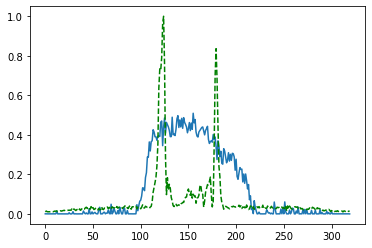

Time taken for epoch:  144.1275634765625
Epoch = [111/3000]  Iter = [   0/39480]  Loss = 0.1719 Avg Loss = 0.1719  Time = 0.0825s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [111/3000]  Iter = [ 100/39480]  Loss = 0.1745 Avg Loss = 0.1622  Time = 0.0032s
Epoch = [111/3000]  Iter = [ 200/39480]  Loss = 0.1395 Avg Loss = 0.1587  Time = 0.0032s
Epoch = [111/3000]  Iter = [ 300/39480]  Loss = 0.1583 Avg Loss = 0.1567  Time = 0.0030s
Epoch = [111/3000]  Iter = [ 400/39480]  Loss = 0.1571 Avg Loss = 0.1575  Time = 0.0032s
Epoch = [111/3000]  Iter = [ 500/39480]  Loss = 0.1592 Avg Loss = 0.1551  Time = 0.0029s
Epoch = [111/3000]  Iter = [ 600/39480]  Loss = 0.1544 Avg Loss = 0.1547  Time = 0.0034s
Epoch = [111/3000]  Iter = [ 700/39480]  Loss = 0.1632 Avg Loss = 0.1547  Time = 0.0029s
Epoch = [111/3000]  Iter = [ 800/39480]  Loss = 0.1483 Avg Loss = 0.1546  Time = 0.0030s
Epoch = [111/3000]  Iter = [ 900/39480]  Loss = 0.1542 Avg Loss = 0.155  Time = 0.0030s
Epoch = [111/3000]  Iter = [1000/39480]  Loss = 0.1536 Avg Loss = 0.1542  Time = 0.0034s
Epoch = [111/3000]  Iter = [1100/39480]  Loss = 0.1599 Avg Loss = 0.1543  Time = 0.0031s
Epoch = [111/3000]  It

Epoch = [111/3000]  Iter = [9400/39480]  Loss = 0.1503 Avg Loss = 0.157  Time = 0.0029s
Epoch = [111/3000]  Iter = [9500/39480]  Loss = 0.1581 Avg Loss = 0.1566  Time = 0.0029s
Epoch = [111/3000]  Iter = [9600/39480]  Loss = 0.1667 Avg Loss = 0.1574  Time = 0.0029s
Epoch = [111/3000]  Iter = [9700/39480]  Loss = 0.1462 Avg Loss = 0.1567  Time = 0.0030s
Epoch = [111/3000]  Iter = [9800/39480]  Loss = 0.1599 Avg Loss = 0.1567  Time = 0.0031s
Epoch = [111/3000]  Iter = [9900/39480]  Loss = 0.1839 Avg Loss = 0.1569  Time = 0.0033s
Epoch = [111/3000]  Iter = [10000/39480]  Loss = 0.1388 Avg Loss = 0.1568  Time = 0.0033s
Epoch = [111/3000]  Iter = [10100/39480]  Loss = 0.1699 Avg Loss = 0.157  Time = 0.0031s
Epoch = [111/3000]  Iter = [10200/39480]  Loss = 0.165 Avg Loss = 0.1555  Time = 0.0031s
Epoch = [111/3000]  Iter = [10300/39480]  Loss = 0.1491 Avg Loss = 0.1574  Time = 0.0032s
Epoch = [111/3000]  Iter = [10400/39480]  Loss = 0.171 Avg Loss = 0.1584  Time = 0.0031s
Epoch = [111/3000]  

Epoch = [111/3000]  Iter = [18600/39480]  Loss = 0.1374 Avg Loss = 0.1577  Time = 0.0030s
Epoch = [111/3000]  Iter = [18700/39480]  Loss = 0.1679 Avg Loss = 0.1572  Time = 0.0046s
Epoch = [111/3000]  Iter = [18800/39480]  Loss = 0.171 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [111/3000]  Iter = [18900/39480]  Loss = 0.1526 Avg Loss = 0.1546  Time = 0.0035s
Epoch = [111/3000]  Iter = [19000/39480]  Loss = 0.1827 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [111/3000]  Iter = [19100/39480]  Loss = 0.1448 Avg Loss = 0.1572  Time = 0.0034s
Epoch = [111/3000]  Iter = [19200/39480]  Loss = 0.1638 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [111/3000]  Iter = [19300/39480]  Loss = 0.1603 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [111/3000]  Iter = [19400/39480]  Loss = 0.136 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [111/3000]  Iter = [19500/39480]  Loss = 0.1763 Avg Loss = 0.1566  Time = 0.0033s
Epoch = [111/3000]  Iter = [19600/39480]  Loss = 0.1454 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [111

Epoch = [111/3000]  Iter = [27800/39480]  Loss = 0.1662 Avg Loss = 0.1579  Time = 0.0031s
Epoch = [111/3000]  Iter = [27900/39480]  Loss = 0.1612 Avg Loss = 0.1572  Time = 0.0031s
Epoch = [111/3000]  Iter = [28000/39480]  Loss = 0.153 Avg Loss = 0.1578  Time = 0.0031s
Epoch = [111/3000]  Iter = [28100/39480]  Loss = 0.1702 Avg Loss = 0.1586  Time = 0.0029s
Epoch = [111/3000]  Iter = [28200/39480]  Loss = 0.1549 Avg Loss = 0.1555  Time = 0.0032s
Epoch = [111/3000]  Iter = [28300/39480]  Loss = 0.151 Avg Loss = 0.1557  Time = 0.0033s
Epoch = [111/3000]  Iter = [28400/39480]  Loss = 0.1861 Avg Loss = 0.1577  Time = 0.0031s
Epoch = [111/3000]  Iter = [28500/39480]  Loss = 0.1521 Avg Loss = 0.1576  Time = 0.0032s
Epoch = [111/3000]  Iter = [28600/39480]  Loss = 0.1436 Avg Loss = 0.1563  Time = 0.0032s
Epoch = [111/3000]  Iter = [28700/39480]  Loss = 0.135 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [111/3000]  Iter = [28800/39480]  Loss = 0.1674 Avg Loss = 0.1577  Time = 0.0033s
Epoch = [111/

Epoch = [111/3000]  Iter = [37000/39480]  Loss = 0.1351 Avg Loss = 0.1569  Time = 0.0030s
Epoch = [111/3000]  Iter = [37100/39480]  Loss = 0.1448 Avg Loss = 0.1566  Time = 0.0031s
Epoch = [111/3000]  Iter = [37200/39480]  Loss = 0.1382 Avg Loss = 0.1558  Time = 0.0030s
Epoch = [111/3000]  Iter = [37300/39480]  Loss = 0.1395 Avg Loss = 0.1585  Time = 0.0030s
Epoch = [111/3000]  Iter = [37400/39480]  Loss = 0.1785 Avg Loss = 0.1564  Time = 0.0029s
Epoch = [111/3000]  Iter = [37500/39480]  Loss = 0.1599 Avg Loss = 0.1563  Time = 0.0031s
Epoch = [111/3000]  Iter = [37600/39480]  Loss = 0.1469 Avg Loss = 0.1564  Time = 0.0031s
Epoch = [111/3000]  Iter = [37700/39480]  Loss = 0.1645 Avg Loss = 0.1572  Time = 0.0031s
Epoch = [111/3000]  Iter = [37800/39480]  Loss = 0.1648 Avg Loss = 0.1573  Time = 0.0032s
Epoch = [111/3000]  Iter = [37900/39480]  Loss = 0.1452 Avg Loss = 0.1579  Time = 0.0030s
Epoch = [111/3000]  Iter = [38000/39480]  Loss = 0.1442 Avg Loss = 0.1577  Time = 0.0031s
Epoch = [1

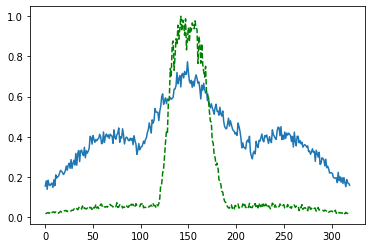

Time taken for epoch:  143.59880709648132
Epoch = [112/3000]  Iter = [   0/39480]  Loss = 0.1504 Avg Loss = 0.1504  Time = 0.0759s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [112/3000]  Iter = [ 100/39480]  Loss = 0.1483 Avg Loss = 0.1541  Time = 0.0030s
Epoch = [112/3000]  Iter = [ 200/39480]  Loss = 0.1489 Avg Loss = 0.1561  Time = 0.0034s
Epoch = [112/3000]  Iter = [ 300/39480]  Loss = 0.1711 Avg Loss = 0.1553  Time = 0.0032s
Epoch = [112/3000]  Iter = [ 400/39480]  Loss = 0.15 Avg Loss = 0.1542  Time = 0.0033s
Epoch = [112/3000]  Iter = [ 500/39480]  Loss = 0.1359 Avg Loss = 0.1552  Time = 0.0033s
Epoch = [112/3000]  Iter = [ 600/39480]  Loss = 0.1468 Avg Loss = 0.1543  Time = 0.0032s
Epoch = [112/3000]  Iter = [ 700/39480]  Loss = 0.1596 Avg Loss = 0.1563  Time = 0.0031s
Epoch = [112/3000]  Iter = [ 800/39480]  Loss = 0.1602 Avg Loss = 0.1566  Time = 0.0032s
Epoch = [112/3000]  Iter = [ 900/39480]  Loss = 0.1776 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [112/3000]  Iter = [1000/39480]  Loss = 0.1632 Avg Loss = 0.1546  Time = 0.0032s
Epoch = [112/3000]  Iter = [1100/39480]  Loss = 0.1573 Avg Loss = 0.1546  Time = 0.0032s
Epoch = [112/3000]  Ite

Epoch = [112/3000]  Iter = [9400/39480]  Loss = 0.1421 Avg Loss = 0.1565  Time = 0.0029s
Epoch = [112/3000]  Iter = [9500/39480]  Loss = 0.1659 Avg Loss = 0.1567  Time = 0.0030s
Epoch = [112/3000]  Iter = [9600/39480]  Loss = 0.1502 Avg Loss = 0.158  Time = 0.0033s
Epoch = [112/3000]  Iter = [9700/39480]  Loss = 0.1363 Avg Loss = 0.1565  Time = 0.0033s
Epoch = [112/3000]  Iter = [9800/39480]  Loss = 0.1775 Avg Loss = 0.1552  Time = 0.0033s
Epoch = [112/3000]  Iter = [9900/39480]  Loss = 0.1477 Avg Loss = 0.1558  Time = 0.0030s
Epoch = [112/3000]  Iter = [10000/39480]  Loss = 0.1425 Avg Loss = 0.1566  Time = 0.0031s
Epoch = [112/3000]  Iter = [10100/39480]  Loss = 0.1547 Avg Loss = 0.1584  Time = 0.0029s
Epoch = [112/3000]  Iter = [10200/39480]  Loss = 0.1567 Avg Loss = 0.1574  Time = 0.0029s
Epoch = [112/3000]  Iter = [10300/39480]  Loss = 0.1684 Avg Loss = 0.1567  Time = 0.0030s
Epoch = [112/3000]  Iter = [10400/39480]  Loss = 0.1575 Avg Loss = 0.1565  Time = 0.0031s
Epoch = [112/3000

Epoch = [112/3000]  Iter = [18600/39480]  Loss = 0.1538 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [112/3000]  Iter = [18700/39480]  Loss = 0.1762 Avg Loss = 0.1564  Time = 0.0033s
Epoch = [112/3000]  Iter = [18800/39480]  Loss = 0.1532 Avg Loss = 0.155  Time = 0.0033s
Epoch = [112/3000]  Iter = [18900/39480]  Loss = 0.1487 Avg Loss = 0.1575  Time = 0.0030s
Epoch = [112/3000]  Iter = [19000/39480]  Loss = 0.1514 Avg Loss = 0.1568  Time = 0.0030s
Epoch = [112/3000]  Iter = [19100/39480]  Loss = 0.1779 Avg Loss = 0.1583  Time = 0.0034s
Epoch = [112/3000]  Iter = [19200/39480]  Loss = 0.1791 Avg Loss = 0.1575  Time = 0.0033s
Epoch = [112/3000]  Iter = [19300/39480]  Loss = 0.1562 Avg Loss = 0.1564  Time = 0.0031s
Epoch = [112/3000]  Iter = [19400/39480]  Loss = 0.1833 Avg Loss = 0.1569  Time = 0.0034s
Epoch = [112/3000]  Iter = [19500/39480]  Loss = 0.1556 Avg Loss = 0.1555  Time = 0.0033s
Epoch = [112/3000]  Iter = [19600/39480]  Loss = 0.1499 Avg Loss = 0.1558  Time = 0.0032s
Epoch = [11

Epoch = [112/3000]  Iter = [27800/39480]  Loss = 0.1717 Avg Loss = 0.157  Time = 0.0029s
Epoch = [112/3000]  Iter = [27900/39480]  Loss = 0.1739 Avg Loss = 0.1569  Time = 0.0031s
Epoch = [112/3000]  Iter = [28000/39480]  Loss = 0.1712 Avg Loss = 0.1578  Time = 0.0034s
Epoch = [112/3000]  Iter = [28100/39480]  Loss = 0.1399 Avg Loss = 0.157  Time = 0.0030s
Epoch = [112/3000]  Iter = [28200/39480]  Loss = 0.1625 Avg Loss = 0.1579  Time = 0.0030s
Epoch = [112/3000]  Iter = [28300/39480]  Loss = 0.1592 Avg Loss = 0.1567  Time = 0.0031s
Epoch = [112/3000]  Iter = [28400/39480]  Loss = 0.1463 Avg Loss = 0.1561  Time = 0.0031s
Epoch = [112/3000]  Iter = [28500/39480]  Loss = 0.1723 Avg Loss = 0.1583  Time = 0.0030s
Epoch = [112/3000]  Iter = [28600/39480]  Loss = 0.1408 Avg Loss = 0.157  Time = 0.0031s
Epoch = [112/3000]  Iter = [28700/39480]  Loss = 0.1292 Avg Loss = 0.1559  Time = 0.0031s
Epoch = [112/3000]  Iter = [28800/39480]  Loss = 0.1724 Avg Loss = 0.1576  Time = 0.0029s
Epoch = [112/

Epoch = [112/3000]  Iter = [37000/39480]  Loss = 0.1545 Avg Loss = 0.1551  Time = 0.0030s
Epoch = [112/3000]  Iter = [37100/39480]  Loss = 0.1445 Avg Loss = 0.1557  Time = 0.0030s
Epoch = [112/3000]  Iter = [37200/39480]  Loss = 0.142 Avg Loss = 0.1572  Time = 0.0029s
Epoch = [112/3000]  Iter = [37300/39480]  Loss = 0.1438 Avg Loss = 0.1576  Time = 0.0033s
Epoch = [112/3000]  Iter = [37400/39480]  Loss = 0.1884 Avg Loss = 0.1565  Time = 0.0031s
Epoch = [112/3000]  Iter = [37500/39480]  Loss = 0.154 Avg Loss = 0.1564  Time = 0.0029s
Epoch = [112/3000]  Iter = [37600/39480]  Loss = 0.1528 Avg Loss = 0.1556  Time = 0.0029s
Epoch = [112/3000]  Iter = [37700/39480]  Loss = 0.1522 Avg Loss = 0.1561  Time = 0.0033s
Epoch = [112/3000]  Iter = [37800/39480]  Loss = 0.1546 Avg Loss = 0.1584  Time = 0.0031s
Epoch = [112/3000]  Iter = [37900/39480]  Loss = 0.1644 Avg Loss = 0.1583  Time = 0.0033s
Epoch = [112/3000]  Iter = [38000/39480]  Loss = 0.1595 Avg Loss = 0.1575  Time = 0.0031s
Epoch = [112

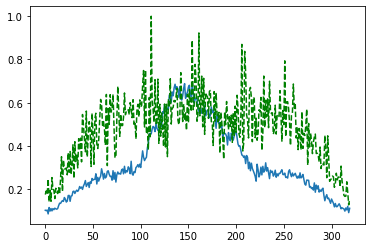

Time taken for epoch:  144.0944414138794
Epoch = [113/3000]  Iter = [   0/39480]  Loss = 0.1533 Avg Loss = 0.1533  Time = 0.0762s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [113/3000]  Iter = [ 100/39480]  Loss = 0.1461 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [113/3000]  Iter = [ 200/39480]  Loss = 0.1476 Avg Loss = 0.1532  Time = 0.0036s
Epoch = [113/3000]  Iter = [ 300/39480]  Loss = 0.1519 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [113/3000]  Iter = [ 400/39480]  Loss = 0.1716 Avg Loss = 0.1558  Time = 0.0031s
Epoch = [113/3000]  Iter = [ 500/39480]  Loss = 0.1525 Avg Loss = 0.1553  Time = 0.0031s
Epoch = [113/3000]  Iter = [ 600/39480]  Loss = 0.1434 Avg Loss = 0.1553  Time = 0.0033s
Epoch = [113/3000]  Iter = [ 700/39480]  Loss = 0.1584 Avg Loss = 0.155  Time = 0.0031s
Epoch = [113/3000]  Iter = [ 800/39480]  Loss = 0.1576 Avg Loss = 0.1568  Time = 0.0031s
Epoch = [113/3000]  Iter = [ 900/39480]  Loss = 0.1466 Avg Loss = 0.1568  Time = 0.0031s
Epoch = [113/3000]  Iter = [1000/39480]  Loss = 0.149 Avg Loss = 0.1535  Time = 0.0032s
Epoch = [113/3000]  Iter = [1100/39480]  Loss = 0.1562 Avg Loss = 0.1552  Time = 0.0030s
Epoch = [113/3000]  Ite

Epoch = [113/3000]  Iter = [9400/39480]  Loss = 0.1745 Avg Loss = 0.158  Time = 0.0031s
Epoch = [113/3000]  Iter = [9500/39480]  Loss = 0.2101 Avg Loss = 0.1568  Time = 0.0031s
Epoch = [113/3000]  Iter = [9600/39480]  Loss = 0.1514 Avg Loss = 0.1548  Time = 0.0030s
Epoch = [113/3000]  Iter = [9700/39480]  Loss = 0.1545 Avg Loss = 0.1547  Time = 0.0030s
Epoch = [113/3000]  Iter = [9800/39480]  Loss = 0.1777 Avg Loss = 0.1551  Time = 0.0030s
Epoch = [113/3000]  Iter = [9900/39480]  Loss = 0.1822 Avg Loss = 0.156  Time = 0.0032s
Epoch = [113/3000]  Iter = [10000/39480]  Loss = 0.1609 Avg Loss = 0.1582  Time = 0.0029s
Epoch = [113/3000]  Iter = [10100/39480]  Loss = 0.1571 Avg Loss = 0.1572  Time = 0.0031s
Epoch = [113/3000]  Iter = [10200/39480]  Loss = 0.1479 Avg Loss = 0.158  Time = 0.0031s
Epoch = [113/3000]  Iter = [10300/39480]  Loss = 0.1649 Avg Loss = 0.1587  Time = 0.0030s
Epoch = [113/3000]  Iter = [10400/39480]  Loss = 0.1582 Avg Loss = 0.1585  Time = 0.0030s
Epoch = [113/3000] 

Epoch = [113/3000]  Iter = [18600/39480]  Loss = 0.1334 Avg Loss = 0.1567  Time = 0.0029s
Epoch = [113/3000]  Iter = [18700/39480]  Loss = 0.1713 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [113/3000]  Iter = [18800/39480]  Loss = 0.1631 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [113/3000]  Iter = [18900/39480]  Loss = 0.1471 Avg Loss = 0.157  Time = 0.0033s
Epoch = [113/3000]  Iter = [19000/39480]  Loss = 0.1599 Avg Loss = 0.1568  Time = 0.0029s
Epoch = [113/3000]  Iter = [19100/39480]  Loss = 0.1657 Avg Loss = 0.156  Time = 0.0031s
Epoch = [113/3000]  Iter = [19200/39480]  Loss = 0.1723 Avg Loss = 0.1578  Time = 0.0031s
Epoch = [113/3000]  Iter = [19300/39480]  Loss = 0.1606 Avg Loss = 0.1579  Time = 0.0030s
Epoch = [113/3000]  Iter = [19400/39480]  Loss = 0.1608 Avg Loss = 0.1588  Time = 0.0031s
Epoch = [113/3000]  Iter = [19500/39480]  Loss = 0.1261 Avg Loss = 0.1572  Time = 0.0034s
Epoch = [113/3000]  Iter = [19600/39480]  Loss = 0.163 Avg Loss = 0.1552  Time = 0.0029s
Epoch = [113/

Epoch = [113/3000]  Iter = [27800/39480]  Loss = 0.154 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [113/3000]  Iter = [27900/39480]  Loss = 0.1798 Avg Loss = 0.157  Time = 0.0036s
Epoch = [113/3000]  Iter = [28000/39480]  Loss = 0.1876 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [113/3000]  Iter = [28100/39480]  Loss = 0.1372 Avg Loss = 0.1551  Time = 0.0031s
Epoch = [113/3000]  Iter = [28200/39480]  Loss = 0.134 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [113/3000]  Iter = [28300/39480]  Loss = 0.1679 Avg Loss = 0.156  Time = 0.0036s
Epoch = [113/3000]  Iter = [28400/39480]  Loss = 0.1507 Avg Loss = 0.1567  Time = 0.0033s
Epoch = [113/3000]  Iter = [28500/39480]  Loss = 0.1297 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [113/3000]  Iter = [28600/39480]  Loss = 0.1569 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [113/3000]  Iter = [28700/39480]  Loss = 0.1548 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [113/3000]  Iter = [28800/39480]  Loss = 0.151 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [113/30

Epoch = [113/3000]  Iter = [37000/39480]  Loss = 0.1685 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [113/3000]  Iter = [37100/39480]  Loss = 0.1457 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [113/3000]  Iter = [37200/39480]  Loss = 0.1514 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [113/3000]  Iter = [37300/39480]  Loss = 0.1569 Avg Loss = 0.156  Time = 0.0036s
Epoch = [113/3000]  Iter = [37400/39480]  Loss = 0.1583 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [113/3000]  Iter = [37500/39480]  Loss = 0.1657 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [113/3000]  Iter = [37600/39480]  Loss = 0.1728 Avg Loss = 0.1576  Time = 0.0033s
Epoch = [113/3000]  Iter = [37700/39480]  Loss = 0.149 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [113/3000]  Iter = [37800/39480]  Loss = 0.1632 Avg Loss = 0.1591  Time = 0.0038s
Epoch = [113/3000]  Iter = [37900/39480]  Loss = 0.1666 Avg Loss = 0.1582  Time = 0.0038s
Epoch = [113/3000]  Iter = [38000/39480]  Loss = 0.1464 Avg Loss = 0.1587  Time = 0.0037s
Epoch = [113

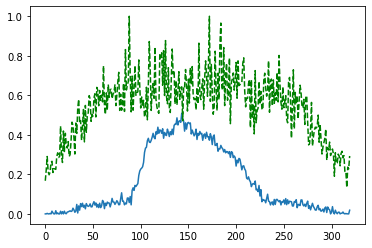

Time taken for epoch:  150.7773196697235
Epoch = [114/3000]  Iter = [   0/39480]  Loss = 0.1248 Avg Loss = 0.1248  Time = 0.0726s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [114/3000]  Iter = [ 100/39480]  Loss = 0.1808 Avg Loss = 0.1461  Time = 0.0036s
Epoch = [114/3000]  Iter = [ 200/39480]  Loss = 0.1591 Avg Loss = 0.1519  Time = 0.0035s
Epoch = [114/3000]  Iter = [ 300/39480]  Loss = 0.1591 Avg Loss = 0.1541  Time = 0.0037s
Epoch = [114/3000]  Iter = [ 400/39480]  Loss = 0.174 Avg Loss = 0.1548  Time = 0.0036s
Epoch = [114/3000]  Iter = [ 500/39480]  Loss = 0.1547 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [114/3000]  Iter = [ 600/39480]  Loss = 0.1444 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [114/3000]  Iter = [ 700/39480]  Loss = 0.1752 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [114/3000]  Iter = [ 800/39480]  Loss = 0.1389 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [114/3000]  Iter = [ 900/39480]  Loss = 0.1533 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [114/3000]  Iter = [1000/39480]  Loss = 0.1279 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [114/3000]  Iter = [1100/39480]  Loss = 0.159 Avg Loss = 0.156  Time = 0.0036s
Epoch = [114/3000]  Iter

Epoch = [114/3000]  Iter = [9400/39480]  Loss = 0.1678 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [114/3000]  Iter = [9500/39480]  Loss = 0.1587 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [114/3000]  Iter = [9600/39480]  Loss = 0.1776 Avg Loss = 0.1555  Time = 0.0033s
Epoch = [114/3000]  Iter = [9700/39480]  Loss = 0.1646 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [114/3000]  Iter = [9800/39480]  Loss = 0.1584 Avg Loss = 0.158  Time = 0.0037s
Epoch = [114/3000]  Iter = [9900/39480]  Loss = 0.1612 Avg Loss = 0.1561  Time = 0.0032s
Epoch = [114/3000]  Iter = [10000/39480]  Loss = 0.1643 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [114/3000]  Iter = [10100/39480]  Loss = 0.1602 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [114/3000]  Iter = [10200/39480]  Loss = 0.1359 Avg Loss = 0.1544  Time = 0.0037s
Epoch = [114/3000]  Iter = [10300/39480]  Loss = 0.1194 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [114/3000]  Iter = [10400/39480]  Loss = 0.2034 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [114/3000

Epoch = [114/3000]  Iter = [18600/39480]  Loss = 0.17 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [114/3000]  Iter = [18700/39480]  Loss = 0.1427 Avg Loss = 0.1591  Time = 0.0033s
Epoch = [114/3000]  Iter = [18800/39480]  Loss = 0.1672 Avg Loss = 0.1588  Time = 0.0038s
Epoch = [114/3000]  Iter = [18900/39480]  Loss = 0.1685 Avg Loss = 0.1579  Time = 0.0038s
Epoch = [114/3000]  Iter = [19000/39480]  Loss = 0.1386 Avg Loss = 0.1558  Time = 0.0038s
Epoch = [114/3000]  Iter = [19100/39480]  Loss = 0.1331 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [114/3000]  Iter = [19200/39480]  Loss = 0.1406 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [114/3000]  Iter = [19300/39480]  Loss = 0.1523 Avg Loss = 0.1569  Time = 0.0038s
Epoch = [114/3000]  Iter = [19400/39480]  Loss = 0.1447 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [114/3000]  Iter = [19500/39480]  Loss = 0.174 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [114/3000]  Iter = [19600/39480]  Loss = 0.1491 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [114/

Epoch = [114/3000]  Iter = [27800/39480]  Loss = 0.1402 Avg Loss = 0.156  Time = 0.0036s
Epoch = [114/3000]  Iter = [27900/39480]  Loss = 0.1669 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [114/3000]  Iter = [28000/39480]  Loss = 0.1796 Avg Loss = 0.1589  Time = 0.0036s
Epoch = [114/3000]  Iter = [28100/39480]  Loss = 0.1376 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [114/3000]  Iter = [28200/39480]  Loss = 0.1692 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [114/3000]  Iter = [28300/39480]  Loss = 0.1784 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [114/3000]  Iter = [28400/39480]  Loss = 0.1699 Avg Loss = 0.1578  Time = 0.0038s
Epoch = [114/3000]  Iter = [28500/39480]  Loss = 0.1779 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [114/3000]  Iter = [28600/39480]  Loss = 0.1356 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [114/3000]  Iter = [28700/39480]  Loss = 0.1416 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [114/3000]  Iter = [28800/39480]  Loss = 0.1686 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [11

Epoch = [114/3000]  Iter = [37000/39480]  Loss = 0.1473 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [114/3000]  Iter = [37100/39480]  Loss = 0.1552 Avg Loss = 0.1589  Time = 0.0033s
Epoch = [114/3000]  Iter = [37200/39480]  Loss = 0.1517 Avg Loss = 0.1578  Time = 0.0034s
Epoch = [114/3000]  Iter = [37300/39480]  Loss = 0.1607 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [114/3000]  Iter = [37400/39480]  Loss = 0.1335 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [114/3000]  Iter = [37500/39480]  Loss = 0.2007 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [114/3000]  Iter = [37600/39480]  Loss = 0.1626 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [114/3000]  Iter = [37700/39480]  Loss = 0.1792 Avg Loss = 0.1577  Time = 0.0033s
Epoch = [114/3000]  Iter = [37800/39480]  Loss = 0.1677 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [114/3000]  Iter = [37900/39480]  Loss = 0.1694 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [114/3000]  Iter = [38000/39480]  Loss = 0.1562 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [1

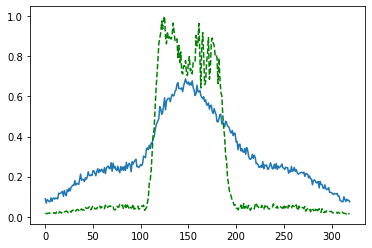

Time taken for epoch:  158.74572610855103
Epoch = [115/3000]  Iter = [   0/39480]  Loss = 0.1557 Avg Loss = 0.1557  Time = 0.0630s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [115/3000]  Iter = [ 100/39480]  Loss = 0.1376 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [115/3000]  Iter = [ 200/39480]  Loss = 0.1744 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [115/3000]  Iter = [ 300/39480]  Loss = 0.1921 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [115/3000]  Iter = [ 400/39480]  Loss = 0.1709 Avg Loss = 0.1579  Time = 0.0050s
Epoch = [115/3000]  Iter = [ 500/39480]  Loss = 0.1617 Avg Loss = 0.1573  Time = 0.0038s
Epoch = [115/3000]  Iter = [ 600/39480]  Loss = 0.1645 Avg Loss = 0.156  Time = 0.0036s
Epoch = [115/3000]  Iter = [ 700/39480]  Loss = 0.1551 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [115/3000]  Iter = [ 800/39480]  Loss = 0.1663 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [115/3000]  Iter = [ 900/39480]  Loss = 0.1638 Avg Loss = 0.156  Time = 0.0035s
Epoch = [115/3000]  Iter = [1000/39480]  Loss = 0.1724 Avg Loss = 0.1556  Time = 0.0032s
Epoch = [115/3000]  Iter = [1100/39480]  Loss = 0.1652 Avg Loss = 0.1572  Time = 0.0029s
Epoch = [115/3000]  Ite

Epoch = [115/3000]  Iter = [9400/39480]  Loss = 0.1633 Avg Loss = 0.1571  Time = 0.0030s
Epoch = [115/3000]  Iter = [9500/39480]  Loss = 0.1656 Avg Loss = 0.1585  Time = 0.0030s
Epoch = [115/3000]  Iter = [9600/39480]  Loss = 0.1516 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [115/3000]  Iter = [9700/39480]  Loss = 0.1489 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [115/3000]  Iter = [9800/39480]  Loss = 0.1754 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [115/3000]  Iter = [9900/39480]  Loss = 0.1735 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [115/3000]  Iter = [10000/39480]  Loss = 0.1651 Avg Loss = 0.156  Time = 0.0034s
Epoch = [115/3000]  Iter = [10100/39480]  Loss = 0.1592 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [115/3000]  Iter = [10200/39480]  Loss = 0.1414 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [115/3000]  Iter = [10300/39480]  Loss = 0.1337 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [115/3000]  Iter = [10400/39480]  Loss = 0.1498 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [115/3000

Epoch = [115/3000]  Iter = [18600/39480]  Loss = 0.184 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [115/3000]  Iter = [18700/39480]  Loss = 0.1577 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [115/3000]  Iter = [18800/39480]  Loss = 0.1465 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [115/3000]  Iter = [18900/39480]  Loss = 0.1543 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [115/3000]  Iter = [19000/39480]  Loss = 0.1782 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [115/3000]  Iter = [19100/39480]  Loss = 0.1435 Avg Loss = 0.1556  Time = 0.0033s
Epoch = [115/3000]  Iter = [19200/39480]  Loss = 0.1349 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [115/3000]  Iter = [19300/39480]  Loss = 0.1583 Avg Loss = 0.1559  Time = 0.0038s
Epoch = [115/3000]  Iter = [19400/39480]  Loss = 0.1642 Avg Loss = 0.1582  Time = 0.0039s
Epoch = [115/3000]  Iter = [19500/39480]  Loss = 0.1437 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [115/3000]  Iter = [19600/39480]  Loss = 0.1524 Avg Loss = 0.158  Time = 0.0036s
Epoch = [115

Epoch = [115/3000]  Iter = [27800/39480]  Loss = 0.1354 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [115/3000]  Iter = [27900/39480]  Loss = 0.1866 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [115/3000]  Iter = [28000/39480]  Loss = 0.1337 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [115/3000]  Iter = [28100/39480]  Loss = 0.1479 Avg Loss = 0.1577  Time = 0.0032s
Epoch = [115/3000]  Iter = [28200/39480]  Loss = 0.1571 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [115/3000]  Iter = [28300/39480]  Loss = 0.1872 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [115/3000]  Iter = [28400/39480]  Loss = 0.153 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [115/3000]  Iter = [28500/39480]  Loss = 0.1447 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [115/3000]  Iter = [28600/39480]  Loss = 0.1835 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [115/3000]  Iter = [28700/39480]  Loss = 0.1808 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [115/3000]  Iter = [28800/39480]  Loss = 0.1595 Avg Loss = 0.1574  Time = 0.0038s
Epoch = [11

Epoch = [115/3000]  Iter = [37000/39480]  Loss = 0.1371 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [115/3000]  Iter = [37100/39480]  Loss = 0.1633 Avg Loss = 0.1551  Time = 0.0034s
Epoch = [115/3000]  Iter = [37200/39480]  Loss = 0.1426 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [115/3000]  Iter = [37300/39480]  Loss = 0.15 Avg Loss = 0.1551  Time = 0.0035s
Epoch = [115/3000]  Iter = [37400/39480]  Loss = 0.1902 Avg Loss = 0.1559  Time = 0.0031s
Epoch = [115/3000]  Iter = [37500/39480]  Loss = 0.1815 Avg Loss = 0.156  Time = 0.0032s
Epoch = [115/3000]  Iter = [37600/39480]  Loss = 0.1443 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [115/3000]  Iter = [37700/39480]  Loss = 0.132 Avg Loss = 0.1561  Time = 0.0038s
Epoch = [115/3000]  Iter = [37800/39480]  Loss = 0.1576 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [115/3000]  Iter = [37900/39480]  Loss = 0.1411 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [115/3000]  Iter = [38000/39480]  Loss = 0.1378 Avg Loss = 0.1562  Time = 0.0035s
Epoch = [115/3

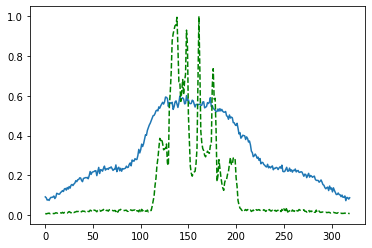

Time taken for epoch:  161.0343451499939
Epoch = [116/3000]  Iter = [   0/39480]  Loss = 0.1824 Avg Loss = 0.1824  Time = 0.0828s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [116/3000]  Iter = [ 100/39480]  Loss = 0.1517 Avg Loss = 0.1658  Time = 0.0037s
Epoch = [116/3000]  Iter = [ 200/39480]  Loss = 0.18 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [116/3000]  Iter = [ 300/39480]  Loss = 0.1592 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [116/3000]  Iter = [ 400/39480]  Loss = 0.1386 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [116/3000]  Iter = [ 500/39480]  Loss = 0.1492 Avg Loss = 0.1553  Time = 0.0038s
Epoch = [116/3000]  Iter = [ 600/39480]  Loss = 0.1547 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [116/3000]  Iter = [ 700/39480]  Loss = 0.1656 Avg Loss = 0.1536  Time = 0.0032s
Epoch = [116/3000]  Iter = [ 800/39480]  Loss = 0.1304 Avg Loss = 0.1544  Time = 0.0031s
Epoch = [116/3000]  Iter = [ 900/39480]  Loss = 0.1506 Avg Loss = 0.1547  Time = 0.0031s
Epoch = [116/3000]  Iter = [1000/39480]  Loss = 0.1486 Avg Loss = 0.1548  Time = 0.0032s
Epoch = [116/3000]  Iter = [1100/39480]  Loss = 0.1561 Avg Loss = 0.157  Time = 0.0030s
Epoch = [116/3000]  Iter

Epoch = [116/3000]  Iter = [9400/39480]  Loss = 0.1588 Avg Loss = 0.1559  Time = 0.0033s
Epoch = [116/3000]  Iter = [9500/39480]  Loss = 0.1688 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [116/3000]  Iter = [9600/39480]  Loss = 0.1772 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [116/3000]  Iter = [9700/39480]  Loss = 0.1573 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [116/3000]  Iter = [9800/39480]  Loss = 0.1365 Avg Loss = 0.1581  Time = 0.0034s
Epoch = [116/3000]  Iter = [9900/39480]  Loss = 0.1684 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [116/3000]  Iter = [10000/39480]  Loss = 0.179 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [116/3000]  Iter = [10100/39480]  Loss = 0.175 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [116/3000]  Iter = [10200/39480]  Loss = 0.1431 Avg Loss = 0.155  Time = 0.0032s
Epoch = [116/3000]  Iter = [10300/39480]  Loss = 0.1657 Avg Loss = 0.1565  Time = 0.0051s
Epoch = [116/3000]  Iter = [10400/39480]  Loss = 0.1381 Avg Loss = 0.1557  Time = 0.0040s
Epoch = [116/3000] 

Epoch = [116/3000]  Iter = [18600/39480]  Loss = 0.173 Avg Loss = 0.1566  Time = 0.0033s
Epoch = [116/3000]  Iter = [18700/39480]  Loss = 0.1659 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [116/3000]  Iter = [18800/39480]  Loss = 0.17 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [116/3000]  Iter = [18900/39480]  Loss = 0.151 Avg Loss = 0.1602  Time = 0.0036s
Epoch = [116/3000]  Iter = [19000/39480]  Loss = 0.1479 Avg Loss = 0.158  Time = 0.0036s
Epoch = [116/3000]  Iter = [19100/39480]  Loss = 0.1431 Avg Loss = 0.1586  Time = 0.0036s
Epoch = [116/3000]  Iter = [19200/39480]  Loss = 0.1459 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [116/3000]  Iter = [19300/39480]  Loss = 0.1502 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [116/3000]  Iter = [19400/39480]  Loss = 0.183 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [116/3000]  Iter = [19500/39480]  Loss = 0.1492 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [116/3000]  Iter = [19600/39480]  Loss = 0.1807 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [116/300

Epoch = [116/3000]  Iter = [27800/39480]  Loss = 0.1628 Avg Loss = 0.1574  Time = 0.0033s
Epoch = [116/3000]  Iter = [27900/39480]  Loss = 0.1538 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [116/3000]  Iter = [28000/39480]  Loss = 0.1514 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [116/3000]  Iter = [28100/39480]  Loss = 0.1787 Avg Loss = 0.1595  Time = 0.0035s
Epoch = [116/3000]  Iter = [28200/39480]  Loss = 0.1645 Avg Loss = 0.1571  Time = 0.0032s
Epoch = [116/3000]  Iter = [28300/39480]  Loss = 0.1546 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [116/3000]  Iter = [28400/39480]  Loss = 0.1473 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [116/3000]  Iter = [28500/39480]  Loss = 0.1534 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [116/3000]  Iter = [28600/39480]  Loss = 0.1728 Avg Loss = 0.156  Time = 0.0036s
Epoch = [116/3000]  Iter = [28700/39480]  Loss = 0.1485 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [116/3000]  Iter = [28800/39480]  Loss = 0.1469 Avg Loss = 0.1581  Time = 0.0034s
Epoch = [11

Epoch = [116/3000]  Iter = [37000/39480]  Loss = 0.1561 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [116/3000]  Iter = [37100/39480]  Loss = 0.1538 Avg Loss = 0.158  Time = 0.0037s
Epoch = [116/3000]  Iter = [37200/39480]  Loss = 0.1594 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [116/3000]  Iter = [37300/39480]  Loss = 0.163 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [116/3000]  Iter = [37400/39480]  Loss = 0.1465 Avg Loss = 0.1597  Time = 0.0037s
Epoch = [116/3000]  Iter = [37500/39480]  Loss = 0.146 Avg Loss = 0.1589  Time = 0.0037s
Epoch = [116/3000]  Iter = [37600/39480]  Loss = 0.155 Avg Loss = 0.1574  Time = 0.0038s
Epoch = [116/3000]  Iter = [37700/39480]  Loss = 0.1623 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [116/3000]  Iter = [37800/39480]  Loss = 0.1626 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [116/3000]  Iter = [37900/39480]  Loss = 0.165 Avg Loss = 0.1575  Time = 0.0038s
Epoch = [116/3000]  Iter = [38000/39480]  Loss = 0.1578 Avg Loss = 0.158  Time = 0.0037s
Epoch = [116/300

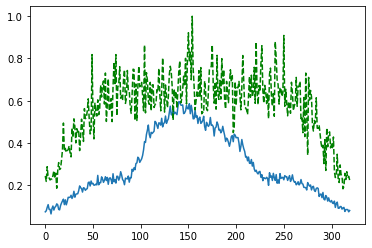

Time taken for epoch:  158.99098658561707
Epoch = [117/3000]  Iter = [   0/39480]  Loss = 0.1629 Avg Loss = 0.1629  Time = 0.0666s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [117/3000]  Iter = [ 100/39480]  Loss = 0.1721 Avg Loss = 0.1585  Time = 0.0038s
Epoch = [117/3000]  Iter = [ 200/39480]  Loss = 0.156 Avg Loss = 0.1582  Time = 0.0038s
Epoch = [117/3000]  Iter = [ 300/39480]  Loss = 0.1592 Avg Loss = 0.1576  Time = 0.0038s
Epoch = [117/3000]  Iter = [ 400/39480]  Loss = 0.1525 Avg Loss = 0.1559  Time = 0.0038s
Epoch = [117/3000]  Iter = [ 500/39480]  Loss = 0.1518 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [117/3000]  Iter = [ 600/39480]  Loss = 0.1722 Avg Loss = 0.157  Time = 0.0037s
Epoch = [117/3000]  Iter = [ 700/39480]  Loss = 0.1547 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [117/3000]  Iter = [ 800/39480]  Loss = 0.152 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [117/3000]  Iter = [ 900/39480]  Loss = 0.1597 Avg Loss = 0.1545  Time = 0.0035s
Epoch = [117/3000]  Iter = [1000/39480]  Loss = 0.1599 Avg Loss = 0.1553  Time = 0.0033s
Epoch = [117/3000]  Iter = [1100/39480]  Loss = 0.1704 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [117/3000]  Iter

Epoch = [117/3000]  Iter = [9400/39480]  Loss = 0.1592 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [117/3000]  Iter = [9500/39480]  Loss = 0.164 Avg Loss = 0.1571  Time = 0.0035s
Epoch = [117/3000]  Iter = [9600/39480]  Loss = 0.1397 Avg Loss = 0.1565  Time = 0.0032s
Epoch = [117/3000]  Iter = [9700/39480]  Loss = 0.1518 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [117/3000]  Iter = [9800/39480]  Loss = 0.1512 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [117/3000]  Iter = [9900/39480]  Loss = 0.1668 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [117/3000]  Iter = [10000/39480]  Loss = 0.1424 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [117/3000]  Iter = [10100/39480]  Loss = 0.1563 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [117/3000]  Iter = [10200/39480]  Loss = 0.1599 Avg Loss = 0.1569  Time = 0.0033s
Epoch = [117/3000]  Iter = [10300/39480]  Loss = 0.1399 Avg Loss = 0.1562  Time = 0.0035s
Epoch = [117/3000]  Iter = [10400/39480]  Loss = 0.1381 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [117/3000

Epoch = [117/3000]  Iter = [18600/39480]  Loss = 0.1522 Avg Loss = 0.157  Time = 0.0037s
Epoch = [117/3000]  Iter = [18700/39480]  Loss = 0.1491 Avg Loss = 0.1575  Time = 0.0033s
Epoch = [117/3000]  Iter = [18800/39480]  Loss = 0.1497 Avg Loss = 0.156  Time = 0.0035s
Epoch = [117/3000]  Iter = [18900/39480]  Loss = 0.1509 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [117/3000]  Iter = [19000/39480]  Loss = 0.1611 Avg Loss = 0.1582  Time = 0.0035s
Epoch = [117/3000]  Iter = [19100/39480]  Loss = 0.1478 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [117/3000]  Iter = [19200/39480]  Loss = 0.1643 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [117/3000]  Iter = [19300/39480]  Loss = 0.162 Avg Loss = 0.1576  Time = 0.0033s
Epoch = [117/3000]  Iter = [19400/39480]  Loss = 0.1591 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [117/3000]  Iter = [19500/39480]  Loss = 0.1999 Avg Loss = 0.1586  Time = 0.0036s
Epoch = [117/3000]  Iter = [19600/39480]  Loss = 0.1495 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [117/

Epoch = [117/3000]  Iter = [27800/39480]  Loss = 0.136 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [117/3000]  Iter = [27900/39480]  Loss = 0.1475 Avg Loss = 0.1563  Time = 0.0032s
Epoch = [117/3000]  Iter = [28000/39480]  Loss = 0.1548 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [117/3000]  Iter = [28100/39480]  Loss = 0.1561 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [117/3000]  Iter = [28200/39480]  Loss = 0.1278 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [117/3000]  Iter = [28300/39480]  Loss = 0.1526 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [117/3000]  Iter = [28400/39480]  Loss = 0.1784 Avg Loss = 0.157  Time = 0.0037s
Epoch = [117/3000]  Iter = [28500/39480]  Loss = 0.1585 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [117/3000]  Iter = [28600/39480]  Loss = 0.1534 Avg Loss = 0.159  Time = 0.0038s
Epoch = [117/3000]  Iter = [28700/39480]  Loss = 0.1867 Avg Loss = 0.158  Time = 0.0035s
Epoch = [117/3000]  Iter = [28800/39480]  Loss = 0.1488 Avg Loss = 0.1565  Time = 0.0032s
Epoch = [117/3

Epoch = [117/3000]  Iter = [37000/39480]  Loss = 0.1645 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [117/3000]  Iter = [37100/39480]  Loss = 0.1576 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [117/3000]  Iter = [37200/39480]  Loss = 0.1382 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [117/3000]  Iter = [37300/39480]  Loss = 0.149 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [117/3000]  Iter = [37400/39480]  Loss = 0.1703 Avg Loss = 0.1569  Time = 0.0033s
Epoch = [117/3000]  Iter = [37500/39480]  Loss = 0.1542 Avg Loss = 0.1572  Time = 0.0052s
Epoch = [117/3000]  Iter = [37600/39480]  Loss = 0.1365 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [117/3000]  Iter = [37700/39480]  Loss = 0.139 Avg Loss = 0.1555  Time = 0.0033s
Epoch = [117/3000]  Iter = [37800/39480]  Loss = 0.1639 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [117/3000]  Iter = [37900/39480]  Loss = 0.1826 Avg Loss = 0.156  Time = 0.0033s
Epoch = [117/3000]  Iter = [38000/39480]  Loss = 0.1531 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [117/

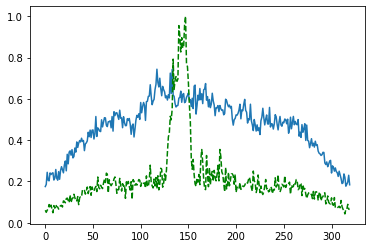

Time taken for epoch:  160.32633662223816
Epoch = [118/3000]  Iter = [   0/39480]  Loss = 0.1439 Avg Loss = 0.1439  Time = 0.0677s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [118/3000]  Iter = [ 100/39480]  Loss = 0.1902 Avg Loss = 0.1513  Time = 0.0040s
Epoch = [118/3000]  Iter = [ 200/39480]  Loss = 0.1466 Avg Loss = 0.1538  Time = 0.0034s
Epoch = [118/3000]  Iter = [ 300/39480]  Loss = 0.1554 Avg Loss = 0.155  Time = 0.0037s
Epoch = [118/3000]  Iter = [ 400/39480]  Loss = 0.1865 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [118/3000]  Iter = [ 500/39480]  Loss = 0.1694 Avg Loss = 0.1556  Time = 0.0032s
Epoch = [118/3000]  Iter = [ 600/39480]  Loss = 0.1625 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [118/3000]  Iter = [ 700/39480]  Loss = 0.1483 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [118/3000]  Iter = [ 800/39480]  Loss = 0.1466 Avg Loss = 0.1555  Time = 0.0033s
Epoch = [118/3000]  Iter = [ 900/39480]  Loss = 0.1562 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [118/3000]  Iter = [1000/39480]  Loss = 0.1836 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [118/3000]  Iter = [1100/39480]  Loss = 0.1554 Avg Loss = 0.157  Time = 0.0037s
Epoch = [118/3000]  Ite

Epoch = [118/3000]  Iter = [9400/39480]  Loss = 0.1651 Avg Loss = 0.157  Time = 0.0036s
Epoch = [118/3000]  Iter = [9500/39480]  Loss = 0.1262 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [118/3000]  Iter = [9600/39480]  Loss = 0.1421 Avg Loss = 0.1564  Time = 0.0032s
Epoch = [118/3000]  Iter = [9700/39480]  Loss = 0.1403 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [118/3000]  Iter = [9800/39480]  Loss = 0.1417 Avg Loss = 0.1549  Time = 0.0036s
Epoch = [118/3000]  Iter = [9900/39480]  Loss = 0.1274 Avg Loss = 0.1573  Time = 0.0034s
Epoch = [118/3000]  Iter = [10000/39480]  Loss = 0.134 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [118/3000]  Iter = [10100/39480]  Loss = 0.193 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [118/3000]  Iter = [10200/39480]  Loss = 0.143 Avg Loss = 0.1573  Time = 0.0033s
Epoch = [118/3000]  Iter = [10300/39480]  Loss = 0.1254 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [118/3000]  Iter = [10400/39480]  Loss = 0.1752 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [118/3000]  

Epoch = [118/3000]  Iter = [18600/39480]  Loss = 0.1279 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [118/3000]  Iter = [18700/39480]  Loss = 0.1629 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [118/3000]  Iter = [18800/39480]  Loss = 0.1704 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [118/3000]  Iter = [18900/39480]  Loss = 0.1439 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [118/3000]  Iter = [19000/39480]  Loss = 0.1706 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [118/3000]  Iter = [19100/39480]  Loss = 0.1368 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [118/3000]  Iter = [19200/39480]  Loss = 0.1477 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [118/3000]  Iter = [19300/39480]  Loss = 0.1671 Avg Loss = 0.1569  Time = 0.0038s
Epoch = [118/3000]  Iter = [19400/39480]  Loss = 0.1586 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [118/3000]  Iter = [19500/39480]  Loss = 0.1687 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [118/3000]  Iter = [19600/39480]  Loss = 0.1827 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [1

Epoch = [118/3000]  Iter = [27800/39480]  Loss = 0.1746 Avg Loss = 0.1552  Time = 0.0036s
Epoch = [118/3000]  Iter = [27900/39480]  Loss = 0.1713 Avg Loss = 0.1567  Time = 0.0032s
Epoch = [118/3000]  Iter = [28000/39480]  Loss = 0.1574 Avg Loss = 0.1569  Time = 0.0034s
Epoch = [118/3000]  Iter = [28100/39480]  Loss = 0.1752 Avg Loss = 0.1561  Time = 0.0038s
Epoch = [118/3000]  Iter = [28200/39480]  Loss = 0.1746 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [118/3000]  Iter = [28300/39480]  Loss = 0.1436 Avg Loss = 0.1578  Time = 0.0052s
Epoch = [118/3000]  Iter = [28400/39480]  Loss = 0.1513 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [118/3000]  Iter = [28500/39480]  Loss = 0.1457 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [118/3000]  Iter = [28600/39480]  Loss = 0.1677 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [118/3000]  Iter = [28700/39480]  Loss = 0.1709 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [118/3000]  Iter = [28800/39480]  Loss = 0.1873 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [1

Epoch = [118/3000]  Iter = [37000/39480]  Loss = 0.1629 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [118/3000]  Iter = [37100/39480]  Loss = 0.1727 Avg Loss = 0.1569  Time = 0.0032s
Epoch = [118/3000]  Iter = [37200/39480]  Loss = 0.134 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [118/3000]  Iter = [37300/39480]  Loss = 0.1576 Avg Loss = 0.1564  Time = 0.0035s
Epoch = [118/3000]  Iter = [37400/39480]  Loss = 0.1733 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [118/3000]  Iter = [37500/39480]  Loss = 0.1507 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [118/3000]  Iter = [37600/39480]  Loss = 0.1505 Avg Loss = 0.158  Time = 0.0037s
Epoch = [118/3000]  Iter = [37700/39480]  Loss = 0.1651 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [118/3000]  Iter = [37800/39480]  Loss = 0.1548 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [118/3000]  Iter = [37900/39480]  Loss = 0.1435 Avg Loss = 0.1567  Time = 0.0032s
Epoch = [118/3000]  Iter = [38000/39480]  Loss = 0.1657 Avg Loss = 0.156  Time = 0.0037s
Epoch = [118/

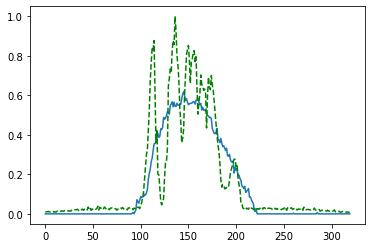

Time taken for epoch:  158.5523681640625
Epoch = [119/3000]  Iter = [   0/39480]  Loss = 0.1899 Avg Loss = 0.1899  Time = 0.0740s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [119/3000]  Iter = [ 100/39480]  Loss = 0.1667 Avg Loss = 0.1686  Time = 0.0034s
Epoch = [119/3000]  Iter = [ 200/39480]  Loss = 0.1542 Avg Loss = 0.1591  Time = 0.0036s
Epoch = [119/3000]  Iter = [ 300/39480]  Loss = 0.1267 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [119/3000]  Iter = [ 400/39480]  Loss = 0.169 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [119/3000]  Iter = [ 500/39480]  Loss = 0.187 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [119/3000]  Iter = [ 600/39480]  Loss = 0.1567 Avg Loss = 0.155  Time = 0.0037s
Epoch = [119/3000]  Iter = [ 700/39480]  Loss = 0.1651 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [119/3000]  Iter = [ 800/39480]  Loss = 0.1656 Avg Loss = 0.156  Time = 0.0036s
Epoch = [119/3000]  Iter = [ 900/39480]  Loss = 0.1548 Avg Loss = 0.1548  Time = 0.0036s
Epoch = [119/3000]  Iter = [1000/39480]  Loss = 0.1375 Avg Loss = 0.1549  Time = 0.0035s
Epoch = [119/3000]  Iter = [1100/39480]  Loss = 0.1476 Avg Loss = 0.155  Time = 0.0036s
Epoch = [119/3000]  Iter =

Epoch = [119/3000]  Iter = [9400/39480]  Loss = 0.1449 Avg Loss = 0.156  Time = 0.0036s
Epoch = [119/3000]  Iter = [9500/39480]  Loss = 0.1226 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [119/3000]  Iter = [9600/39480]  Loss = 0.1396 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [119/3000]  Iter = [9700/39480]  Loss = 0.1556 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [119/3000]  Iter = [9800/39480]  Loss = 0.1571 Avg Loss = 0.1575  Time = 0.0032s
Epoch = [119/3000]  Iter = [9900/39480]  Loss = 0.1717 Avg Loss = 0.1559  Time = 0.0084s
Epoch = [119/3000]  Iter = [10000/39480]  Loss = 0.1726 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [119/3000]  Iter = [10100/39480]  Loss = 0.1736 Avg Loss = 0.157  Time = 0.0036s
Epoch = [119/3000]  Iter = [10200/39480]  Loss = 0.1735 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [119/3000]  Iter = [10300/39480]  Loss = 0.157 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [119/3000]  Iter = [10400/39480]  Loss = 0.1455 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [119/3000] 

Epoch = [119/3000]  Iter = [18600/39480]  Loss = 0.1554 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [119/3000]  Iter = [18700/39480]  Loss = 0.1546 Avg Loss = 0.156  Time = 0.0038s
Epoch = [119/3000]  Iter = [18800/39480]  Loss = 0.1539 Avg Loss = 0.1564  Time = 0.0038s
Epoch = [119/3000]  Iter = [18900/39480]  Loss = 0.1536 Avg Loss = 0.1558  Time = 0.0035s
Epoch = [119/3000]  Iter = [19000/39480]  Loss = 0.1608 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [119/3000]  Iter = [19100/39480]  Loss = 0.1536 Avg Loss = 0.1574  Time = 0.0038s
Epoch = [119/3000]  Iter = [19200/39480]  Loss = 0.1454 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [119/3000]  Iter = [19300/39480]  Loss = 0.1409 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [119/3000]  Iter = [19400/39480]  Loss = 0.1553 Avg Loss = 0.158  Time = 0.0037s
Epoch = [119/3000]  Iter = [19500/39480]  Loss = 0.1507 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [119/3000]  Iter = [19600/39480]  Loss = 0.1549 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [119

Epoch = [119/3000]  Iter = [27800/39480]  Loss = 0.1491 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [119/3000]  Iter = [27900/39480]  Loss = 0.1881 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [119/3000]  Iter = [28000/39480]  Loss = 0.1529 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [119/3000]  Iter = [28100/39480]  Loss = 0.1414 Avg Loss = 0.1572  Time = 0.0032s
Epoch = [119/3000]  Iter = [28200/39480]  Loss = 0.1814 Avg Loss = 0.1571  Time = 0.0035s
Epoch = [119/3000]  Iter = [28300/39480]  Loss = 0.1524 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [119/3000]  Iter = [28400/39480]  Loss = 0.1674 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [119/3000]  Iter = [28500/39480]  Loss = 0.1666 Avg Loss = 0.1567  Time = 0.0033s
Epoch = [119/3000]  Iter = [28600/39480]  Loss = 0.1731 Avg Loss = 0.1563  Time = 0.0034s
Epoch = [119/3000]  Iter = [28700/39480]  Loss = 0.1775 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [119/3000]  Iter = [28800/39480]  Loss = 0.137 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [11

Epoch = [119/3000]  Iter = [37000/39480]  Loss = 0.1577 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [119/3000]  Iter = [37100/39480]  Loss = 0.1596 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [119/3000]  Iter = [37200/39480]  Loss = 0.1493 Avg Loss = 0.155  Time = 0.0036s
Epoch = [119/3000]  Iter = [37300/39480]  Loss = 0.1656 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [119/3000]  Iter = [37400/39480]  Loss = 0.1594 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [119/3000]  Iter = [37500/39480]  Loss = 0.1856 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [119/3000]  Iter = [37600/39480]  Loss = 0.112 Avg Loss = 0.1573  Time = 0.0033s
Epoch = [119/3000]  Iter = [37700/39480]  Loss = 0.164 Avg Loss = 0.1572  Time = 0.0039s
Epoch = [119/3000]  Iter = [37800/39480]  Loss = 0.1394 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [119/3000]  Iter = [37900/39480]  Loss = 0.155 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [119/3000]  Iter = [38000/39480]  Loss = 0.1497 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [119/3

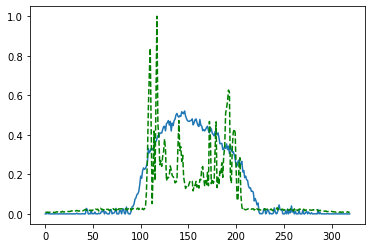

Time taken for epoch:  159.6175377368927
Epoch = [120/3000]  Iter = [   0/39480]  Loss = 0.15 Avg Loss = 0.15  Time = 0.0640s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [120/3000]  Iter = [ 100/39480]  Loss = 0.1288 Avg Loss = 0.1538  Time = 0.0036s
Epoch = [120/3000]  Iter = [ 200/39480]  Loss = 0.1561 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [120/3000]  Iter = [ 300/39480]  Loss = 0.1439 Avg Loss = 0.1555  Time = 0.0035s
Epoch = [120/3000]  Iter = [ 400/39480]  Loss = 0.1615 Avg Loss = 0.1543  Time = 0.0041s
Epoch = [120/3000]  Iter = [ 500/39480]  Loss = 0.1356 Avg Loss = 0.1543  Time = 0.0041s
Epoch = [120/3000]  Iter = [ 600/39480]  Loss = 0.1625 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [120/3000]  Iter = [ 700/39480]  Loss = 0.1497 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [120/3000]  Iter = [ 800/39480]  Loss = 0.1326 Avg Loss = 0.1539  Time = 0.0030s
Epoch = [120/3000]  Iter = [ 900/39480]  Loss = 0.1502 Avg Loss = 0.1547  Time = 0.0030s
Epoch = [120/3000]  Iter = [1000/39480]  Loss = 0.1368 Avg Loss = 0.1545  Time = 0.0030s
Epoch = [120/3000]  Iter = [1100/39480]  Loss = 0.1565 Avg Loss = 0.1547  Time = 0.0031s
Epoch = [120/3000]  I

Epoch = [120/3000]  Iter = [9400/39480]  Loss = 0.1664 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [120/3000]  Iter = [9500/39480]  Loss = 0.1488 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [120/3000]  Iter = [9600/39480]  Loss = 0.1657 Avg Loss = 0.1565  Time = 0.0034s
Epoch = [120/3000]  Iter = [9700/39480]  Loss = 0.1453 Avg Loss = 0.1585  Time = 0.0034s
Epoch = [120/3000]  Iter = [9800/39480]  Loss = 0.1583 Avg Loss = 0.154  Time = 0.0037s
Epoch = [120/3000]  Iter = [9900/39480]  Loss = 0.1431 Avg Loss = 0.1531  Time = 0.0037s
Epoch = [120/3000]  Iter = [10000/39480]  Loss = 0.1548 Avg Loss = 0.1534  Time = 0.0037s
Epoch = [120/3000]  Iter = [10100/39480]  Loss = 0.1344 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [120/3000]  Iter = [10200/39480]  Loss = 0.1591 Avg Loss = 0.158  Time = 0.0051s
Epoch = [120/3000]  Iter = [10300/39480]  Loss = 0.1618 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [120/3000]  Iter = [10400/39480]  Loss = 0.1556 Avg Loss = 0.1569  Time = 0.0045s
Epoch = [120/3000]

Epoch = [120/3000]  Iter = [18600/39480]  Loss = 0.1641 Avg Loss = 0.157  Time = 0.0037s
Epoch = [120/3000]  Iter = [18700/39480]  Loss = 0.1632 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [120/3000]  Iter = [18800/39480]  Loss = 0.1585 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [120/3000]  Iter = [18900/39480]  Loss = 0.1606 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [120/3000]  Iter = [19000/39480]  Loss = 0.1666 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [120/3000]  Iter = [19100/39480]  Loss = 0.1478 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [120/3000]  Iter = [19200/39480]  Loss = 0.1584 Avg Loss = 0.157  Time = 0.0039s
Epoch = [120/3000]  Iter = [19300/39480]  Loss = 0.1378 Avg Loss = 0.1564  Time = 0.0042s
Epoch = [120/3000]  Iter = [19400/39480]  Loss = 0.2001 Avg Loss = 0.1559  Time = 0.0039s
Epoch = [120/3000]  Iter = [19500/39480]  Loss = 0.1867 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [120/3000]  Iter = [19600/39480]  Loss = 0.1404 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [120

Epoch = [120/3000]  Iter = [27800/39480]  Loss = 0.1601 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [120/3000]  Iter = [27900/39480]  Loss = 0.1847 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [120/3000]  Iter = [28000/39480]  Loss = 0.1554 Avg Loss = 0.1567  Time = 0.0032s
Epoch = [120/3000]  Iter = [28100/39480]  Loss = 0.1425 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [120/3000]  Iter = [28200/39480]  Loss = 0.1464 Avg Loss = 0.1566  Time = 0.0034s
Epoch = [120/3000]  Iter = [28300/39480]  Loss = 0.1636 Avg Loss = 0.1551  Time = 0.0035s
Epoch = [120/3000]  Iter = [28400/39480]  Loss = 0.1809 Avg Loss = 0.1557  Time = 0.0035s
Epoch = [120/3000]  Iter = [28500/39480]  Loss = 0.1493 Avg Loss = 0.1567  Time = 0.0032s
Epoch = [120/3000]  Iter = [28600/39480]  Loss = 0.1545 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [120/3000]  Iter = [28700/39480]  Loss = 0.1624 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [120/3000]  Iter = [28800/39480]  Loss = 0.1506 Avg Loss = 0.1589  Time = 0.0036s
Epoch = [1

Epoch = [120/3000]  Iter = [37000/39480]  Loss = 0.1356 Avg Loss = 0.157  Time = 0.0031s
Epoch = [120/3000]  Iter = [37100/39480]  Loss = 0.1628 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [120/3000]  Iter = [37200/39480]  Loss = 0.1446 Avg Loss = 0.1591  Time = 0.0036s
Epoch = [120/3000]  Iter = [37300/39480]  Loss = 0.1438 Avg Loss = 0.157  Time = 0.0067s
Epoch = [120/3000]  Iter = [37400/39480]  Loss = 0.1453 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [120/3000]  Iter = [37500/39480]  Loss = 0.1567 Avg Loss = 0.1573  Time = 0.0033s
Epoch = [120/3000]  Iter = [37600/39480]  Loss = 0.1634 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [120/3000]  Iter = [37700/39480]  Loss = 0.1448 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [120/3000]  Iter = [37800/39480]  Loss = 0.1451 Avg Loss = 0.1549  Time = 0.0036s
Epoch = [120/3000]  Iter = [37900/39480]  Loss = 0.1586 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [120/3000]  Iter = [38000/39480]  Loss = 0.1274 Avg Loss = 0.1562  Time = 0.0033s
Epoch = [120

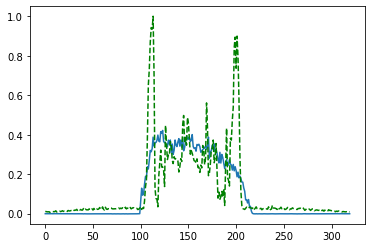

Time taken for epoch:  159.0127637386322
Epoch = [121/3000]  Iter = [   0/39480]  Loss = 0.1543 Avg Loss = 0.1543  Time = 0.0645s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [121/3000]  Iter = [ 100/39480]  Loss = 0.1613 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [121/3000]  Iter = [ 200/39480]  Loss = 0.1431 Avg Loss = 0.156  Time = 0.0037s
Epoch = [121/3000]  Iter = [ 300/39480]  Loss = 0.1635 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [121/3000]  Iter = [ 400/39480]  Loss = 0.1657 Avg Loss = 0.156  Time = 0.0036s
Epoch = [121/3000]  Iter = [ 500/39480]  Loss = 0.1546 Avg Loss = 0.1574  Time = 0.0035s
Epoch = [121/3000]  Iter = [ 600/39480]  Loss = 0.1593 Avg Loss = 0.156  Time = 0.0039s
Epoch = [121/3000]  Iter = [ 700/39480]  Loss = 0.1409 Avg Loss = 0.1572  Time = 0.0032s
Epoch = [121/3000]  Iter = [ 800/39480]  Loss = 0.15 Avg Loss = 0.1572  Time = 0.0030s
Epoch = [121/3000]  Iter = [ 900/39480]  Loss = 0.1538 Avg Loss = 0.1564  Time = 0.0032s
Epoch = [121/3000]  Iter = [1000/39480]  Loss = 0.1758 Avg Loss = 0.1562  Time = 0.0032s
Epoch = [121/3000]  Iter = [1100/39480]  Loss = 0.1595 Avg Loss = 0.1558  Time = 0.0030s
Epoch = [121/3000]  Iter =

Epoch = [121/3000]  Iter = [9400/39480]  Loss = 0.1696 Avg Loss = 0.1586  Time = 0.0039s
Epoch = [121/3000]  Iter = [9500/39480]  Loss = 0.1619 Avg Loss = 0.1569  Time = 0.0039s
Epoch = [121/3000]  Iter = [9600/39480]  Loss = 0.1615 Avg Loss = 0.1573  Time = 0.0040s
Epoch = [121/3000]  Iter = [9700/39480]  Loss = 0.1352 Avg Loss = 0.1573  Time = 0.0039s
Epoch = [121/3000]  Iter = [9800/39480]  Loss = 0.1516 Avg Loss = 0.1588  Time = 0.0040s
Epoch = [121/3000]  Iter = [9900/39480]  Loss = 0.14 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [121/3000]  Iter = [10000/39480]  Loss = 0.1854 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [121/3000]  Iter = [10100/39480]  Loss = 0.1704 Avg Loss = 0.1573  Time = 0.0040s
Epoch = [121/3000]  Iter = [10200/39480]  Loss = 0.1669 Avg Loss = 0.156  Time = 0.0042s
Epoch = [121/3000]  Iter = [10300/39480]  Loss = 0.1392 Avg Loss = 0.156  Time = 0.0041s
Epoch = [121/3000]  Iter = [10400/39480]  Loss = 0.1696 Avg Loss = 0.156  Time = 0.0041s
Epoch = [121/3000]  I

Epoch = [121/3000]  Iter = [18600/39480]  Loss = 0.137 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [121/3000]  Iter = [18700/39480]  Loss = 0.1347 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [121/3000]  Iter = [18800/39480]  Loss = 0.1485 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [121/3000]  Iter = [18900/39480]  Loss = 0.1599 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [121/3000]  Iter = [19000/39480]  Loss = 0.1612 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [121/3000]  Iter = [19100/39480]  Loss = 0.1313 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [121/3000]  Iter = [19200/39480]  Loss = 0.1612 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [121/3000]  Iter = [19300/39480]  Loss = 0.168 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [121/3000]  Iter = [19400/39480]  Loss = 0.1467 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [121/3000]  Iter = [19500/39480]  Loss = 0.1447 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [121/3000]  Iter = [19600/39480]  Loss = 0.1832 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [121

Epoch = [121/3000]  Iter = [27800/39480]  Loss = 0.1681 Avg Loss = 0.1587  Time = 0.0031s
Epoch = [121/3000]  Iter = [27900/39480]  Loss = 0.1481 Avg Loss = 0.1585  Time = 0.0032s
Epoch = [121/3000]  Iter = [28000/39480]  Loss = 0.1678 Avg Loss = 0.1592  Time = 0.0032s
Epoch = [121/3000]  Iter = [28100/39480]  Loss = 0.1645 Avg Loss = 0.1582  Time = 0.0032s
Epoch = [121/3000]  Iter = [28200/39480]  Loss = 0.1492 Avg Loss = 0.157  Time = 0.0038s
Epoch = [121/3000]  Iter = [28300/39480]  Loss = 0.1512 Avg Loss = 0.1567  Time = 0.0038s
Epoch = [121/3000]  Iter = [28400/39480]  Loss = 0.1308 Avg Loss = 0.1556  Time = 0.0038s
Epoch = [121/3000]  Iter = [28500/39480]  Loss = 0.1601 Avg Loss = 0.1582  Time = 0.0039s
Epoch = [121/3000]  Iter = [28600/39480]  Loss = 0.1416 Avg Loss = 0.1596  Time = 0.0038s
Epoch = [121/3000]  Iter = [28700/39480]  Loss = 0.1849 Avg Loss = 0.1598  Time = 0.0038s
Epoch = [121/3000]  Iter = [28800/39480]  Loss = 0.1946 Avg Loss = 0.1582  Time = 0.0038s
Epoch = [12

Epoch = [121/3000]  Iter = [37000/39480]  Loss = 0.185 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [121/3000]  Iter = [37100/39480]  Loss = 0.1506 Avg Loss = 0.1578  Time = 0.0032s
Epoch = [121/3000]  Iter = [37200/39480]  Loss = 0.2046 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [121/3000]  Iter = [37300/39480]  Loss = 0.1619 Avg Loss = 0.1582  Time = 0.0031s
Epoch = [121/3000]  Iter = [37400/39480]  Loss = 0.162 Avg Loss = 0.1556  Time = 0.0031s
Epoch = [121/3000]  Iter = [37500/39480]  Loss = 0.1779 Avg Loss = 0.156  Time = 0.0037s
Epoch = [121/3000]  Iter = [37600/39480]  Loss = 0.1587 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [121/3000]  Iter = [37700/39480]  Loss = 0.1505 Avg Loss = 0.1565  Time = 0.0033s
Epoch = [121/3000]  Iter = [37800/39480]  Loss = 0.1493 Avg Loss = 0.158  Time = 0.0036s
Epoch = [121/3000]  Iter = [37900/39480]  Loss = 0.156 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [121/3000]  Iter = [38000/39480]  Loss = 0.1333 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [121/30

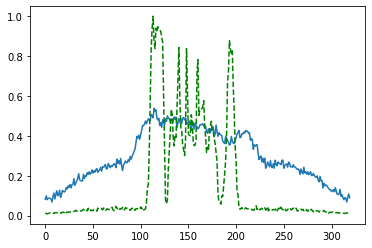

Time taken for epoch:  159.23627257347107
Epoch = [122/3000]  Iter = [   0/39480]  Loss = 0.1755 Avg Loss = 0.1755  Time = 0.0630s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [122/3000]  Iter = [ 100/39480]  Loss = 0.1435 Avg Loss = 0.1634  Time = 0.0038s
Epoch = [122/3000]  Iter = [ 200/39480]  Loss = 0.1526 Avg Loss = 0.1592  Time = 0.0038s
Epoch = [122/3000]  Iter = [ 300/39480]  Loss = 0.15 Avg Loss = 0.157  Time = 0.0038s
Epoch = [122/3000]  Iter = [ 400/39480]  Loss = 0.1568 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [122/3000]  Iter = [ 500/39480]  Loss = 0.1804 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [122/3000]  Iter = [ 600/39480]  Loss = 0.159 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [122/3000]  Iter = [ 700/39480]  Loss = 0.1563 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [122/3000]  Iter = [ 800/39480]  Loss = 0.1401 Avg Loss = 0.156  Time = 0.0030s
Epoch = [122/3000]  Iter = [ 900/39480]  Loss = 0.1535 Avg Loss = 0.1557  Time = 0.0031s
Epoch = [122/3000]  Iter = [1000/39480]  Loss = 0.1605 Avg Loss = 0.1573  Time = 0.0029s
Epoch = [122/3000]  Iter = [1100/39480]  Loss = 0.1443 Avg Loss = 0.1568  Time = 0.0031s
Epoch = [122/3000]  Iter =

Epoch = [122/3000]  Iter = [9400/39480]  Loss = 0.1857 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [122/3000]  Iter = [9500/39480]  Loss = 0.1718 Avg Loss = 0.158  Time = 0.0037s
Epoch = [122/3000]  Iter = [9600/39480]  Loss = 0.1678 Avg Loss = 0.1595  Time = 0.0037s
Epoch = [122/3000]  Iter = [9700/39480]  Loss = 0.143 Avg Loss = 0.1567  Time = 0.0034s
Epoch = [122/3000]  Iter = [9800/39480]  Loss = 0.1537 Avg Loss = 0.1549  Time = 0.0036s
Epoch = [122/3000]  Iter = [9900/39480]  Loss = 0.1806 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [122/3000]  Iter = [10000/39480]  Loss = 0.1519 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [122/3000]  Iter = [10100/39480]  Loss = 0.1519 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [122/3000]  Iter = [10200/39480]  Loss = 0.1917 Avg Loss = 0.1573  Time = 0.0035s
Epoch = [122/3000]  Iter = [10300/39480]  Loss = 0.1386 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [122/3000]  Iter = [10400/39480]  Loss = 0.1399 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [122/3000]

Epoch = [122/3000]  Iter = [18600/39480]  Loss = 0.137 Avg Loss = 0.1567  Time = 0.0034s
Epoch = [122/3000]  Iter = [18700/39480]  Loss = 0.1414 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [122/3000]  Iter = [18800/39480]  Loss = 0.1407 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [122/3000]  Iter = [18900/39480]  Loss = 0.1507 Avg Loss = 0.1554  Time = 0.0035s
Epoch = [122/3000]  Iter = [19000/39480]  Loss = 0.1479 Avg Loss = 0.1564  Time = 0.0035s
Epoch = [122/3000]  Iter = [19100/39480]  Loss = 0.1584 Avg Loss = 0.1574  Time = 0.0034s
Epoch = [122/3000]  Iter = [19200/39480]  Loss = 0.1649 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [122/3000]  Iter = [19300/39480]  Loss = 0.1664 Avg Loss = 0.1555  Time = 0.0035s
Epoch = [122/3000]  Iter = [19400/39480]  Loss = 0.1512 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [122/3000]  Iter = [19500/39480]  Loss = 0.156 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [122/3000]  Iter = [19600/39480]  Loss = 0.1559 Avg Loss = 0.157  Time = 0.0036s
Epoch = [122/

Epoch = [122/3000]  Iter = [27800/39480]  Loss = 0.1499 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [122/3000]  Iter = [27900/39480]  Loss = 0.162 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [122/3000]  Iter = [28000/39480]  Loss = 0.1454 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [122/3000]  Iter = [28100/39480]  Loss = 0.1369 Avg Loss = 0.157  Time = 0.0035s
Epoch = [122/3000]  Iter = [28200/39480]  Loss = 0.1596 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [122/3000]  Iter = [28300/39480]  Loss = 0.1562 Avg Loss = 0.1585  Time = 0.0035s
Epoch = [122/3000]  Iter = [28400/39480]  Loss = 0.1598 Avg Loss = 0.1589  Time = 0.0037s
Epoch = [122/3000]  Iter = [28500/39480]  Loss = 0.1454 Avg Loss = 0.1587  Time = 0.0036s
Epoch = [122/3000]  Iter = [28600/39480]  Loss = 0.1918 Avg Loss = 0.1582  Time = 0.0034s
Epoch = [122/3000]  Iter = [28700/39480]  Loss = 0.148 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [122/3000]  Iter = [28800/39480]  Loss = 0.1414 Avg Loss = 0.1592  Time = 0.0037s
Epoch = [122/

Epoch = [122/3000]  Iter = [37000/39480]  Loss = 0.1848 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [122/3000]  Iter = [37100/39480]  Loss = 0.1885 Avg Loss = 0.159  Time = 0.0036s
Epoch = [122/3000]  Iter = [37200/39480]  Loss = 0.1565 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [122/3000]  Iter = [37300/39480]  Loss = 0.1744 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [122/3000]  Iter = [37400/39480]  Loss = 0.1566 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [122/3000]  Iter = [37500/39480]  Loss = 0.1684 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [122/3000]  Iter = [37600/39480]  Loss = 0.1485 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [122/3000]  Iter = [37700/39480]  Loss = 0.1548 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [122/3000]  Iter = [37800/39480]  Loss = 0.1564 Avg Loss = 0.157  Time = 0.0036s
Epoch = [122/3000]  Iter = [37900/39480]  Loss = 0.1339 Avg Loss = 0.1577  Time = 0.0032s
Epoch = [122/3000]  Iter = [38000/39480]  Loss = 0.1528 Avg Loss = 0.1587  Time = 0.0034s
Epoch = [122

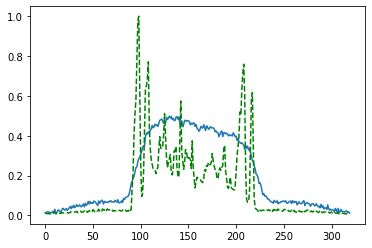

Time taken for epoch:  157.20818638801575
Epoch = [123/3000]  Iter = [   0/39480]  Loss = 0.1503 Avg Loss = 0.1503  Time = 0.0668s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [123/3000]  Iter = [ 100/39480]  Loss = 0.1616 Avg Loss = 0.1529  Time = 0.0034s
Epoch = [123/3000]  Iter = [ 200/39480]  Loss = 0.1577 Avg Loss = 0.153  Time = 0.0038s
Epoch = [123/3000]  Iter = [ 300/39480]  Loss = 0.1511 Avg Loss = 0.1533  Time = 0.0037s
Epoch = [123/3000]  Iter = [ 400/39480]  Loss = 0.1448 Avg Loss = 0.1557  Time = 0.0032s
Epoch = [123/3000]  Iter = [ 500/39480]  Loss = 0.1499 Avg Loss = 0.1547  Time = 0.0036s
Epoch = [123/3000]  Iter = [ 600/39480]  Loss = 0.1539 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [123/3000]  Iter = [ 700/39480]  Loss = 0.1489 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [123/3000]  Iter = [ 800/39480]  Loss = 0.1604 Avg Loss = 0.1539  Time = 0.0037s
Epoch = [123/3000]  Iter = [ 900/39480]  Loss = 0.1414 Avg Loss = 0.156  Time = 0.0036s
Epoch = [123/3000]  Iter = [1000/39480]  Loss = 0.1621 Avg Loss = 0.1551  Time = 0.0034s
Epoch = [123/3000]  Iter = [1100/39480]  Loss = 0.1432 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [123/3000]  Ite

Epoch = [123/3000]  Iter = [9400/39480]  Loss = 0.1475 Avg Loss = 0.1567  Time = 0.0033s
Epoch = [123/3000]  Iter = [9500/39480]  Loss = 0.1723 Avg Loss = 0.1578  Time = 0.0033s
Epoch = [123/3000]  Iter = [9600/39480]  Loss = 0.1596 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [123/3000]  Iter = [9700/39480]  Loss = 0.1915 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [123/3000]  Iter = [9800/39480]  Loss = 0.16 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [123/3000]  Iter = [9900/39480]  Loss = 0.1515 Avg Loss = 0.1577  Time = 0.0032s
Epoch = [123/3000]  Iter = [10000/39480]  Loss = 0.1186 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [123/3000]  Iter = [10100/39480]  Loss = 0.1608 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [123/3000]  Iter = [10200/39480]  Loss = 0.1699 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [123/3000]  Iter = [10300/39480]  Loss = 0.1569 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [123/3000]  Iter = [10400/39480]  Loss = 0.1414 Avg Loss = 0.1535  Time = 0.0036s
Epoch = [123/3000]

Epoch = [123/3000]  Iter = [18600/39480]  Loss = 0.1593 Avg Loss = 0.1577  Time = 0.0031s
Epoch = [123/3000]  Iter = [18700/39480]  Loss = 0.1745 Avg Loss = 0.1577  Time = 0.0029s
Epoch = [123/3000]  Iter = [18800/39480]  Loss = 0.1255 Avg Loss = 0.1559  Time = 0.0033s
Epoch = [123/3000]  Iter = [18900/39480]  Loss = 0.1575 Avg Loss = 0.1578  Time = 0.0033s
Epoch = [123/3000]  Iter = [19000/39480]  Loss = 0.1493 Avg Loss = 0.157  Time = 0.0031s
Epoch = [123/3000]  Iter = [19100/39480]  Loss = 0.17 Avg Loss = 0.1561  Time = 0.0031s
Epoch = [123/3000]  Iter = [19200/39480]  Loss = 0.1605 Avg Loss = 0.1558  Time = 0.0031s
Epoch = [123/3000]  Iter = [19300/39480]  Loss = 0.174 Avg Loss = 0.1564  Time = 0.0033s
Epoch = [123/3000]  Iter = [19400/39480]  Loss = 0.1882 Avg Loss = 0.1579  Time = 0.0029s
Epoch = [123/3000]  Iter = [19500/39480]  Loss = 0.162 Avg Loss = 0.1572  Time = 0.0029s
Epoch = [123/3000]  Iter = [19600/39480]  Loss = 0.1605 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [123/30

Epoch = [123/3000]  Iter = [27800/39480]  Loss = 0.159 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [123/3000]  Iter = [27900/39480]  Loss = 0.1569 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [123/3000]  Iter = [28000/39480]  Loss = 0.1846 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [123/3000]  Iter = [28100/39480]  Loss = 0.1694 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [123/3000]  Iter = [28200/39480]  Loss = 0.1786 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [123/3000]  Iter = [28300/39480]  Loss = 0.1341 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [123/3000]  Iter = [28400/39480]  Loss = 0.1448 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [123/3000]  Iter = [28500/39480]  Loss = 0.1683 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [123/3000]  Iter = [28600/39480]  Loss = 0.1724 Avg Loss = 0.159  Time = 0.0036s
Epoch = [123/3000]  Iter = [28700/39480]  Loss = 0.16 Avg Loss = 0.1597  Time = 0.0035s
Epoch = [123/3000]  Iter = [28800/39480]  Loss = 0.1498 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [123/3

Epoch = [123/3000]  Iter = [37000/39480]  Loss = 0.1636 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [123/3000]  Iter = [37100/39480]  Loss = 0.1707 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [123/3000]  Iter = [37200/39480]  Loss = 0.162 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [123/3000]  Iter = [37300/39480]  Loss = 0.1469 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [123/3000]  Iter = [37400/39480]  Loss = 0.1608 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [123/3000]  Iter = [37500/39480]  Loss = 0.1617 Avg Loss = 0.1603  Time = 0.0037s
Epoch = [123/3000]  Iter = [37600/39480]  Loss = 0.1534 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [123/3000]  Iter = [37700/39480]  Loss = 0.1417 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [123/3000]  Iter = [37800/39480]  Loss = 0.1676 Avg Loss = 0.1546  Time = 0.0036s
Epoch = [123/3000]  Iter = [37900/39480]  Loss = 0.1725 Avg Loss = 0.1554  Time = 0.0034s
Epoch = [123/3000]  Iter = [38000/39480]  Loss = 0.1536 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [12

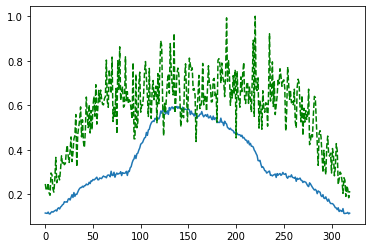

Time taken for epoch:  158.3612904548645
Epoch = [124/3000]  Iter = [   0/39480]  Loss = 0.1489 Avg Loss = 0.1489  Time = 0.0666s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [124/3000]  Iter = [ 100/39480]  Loss = 0.162 Avg Loss = 0.1528  Time = 0.0034s
Epoch = [124/3000]  Iter = [ 200/39480]  Loss = 0.1529 Avg Loss = 0.1533  Time = 0.0037s
Epoch = [124/3000]  Iter = [ 300/39480]  Loss = 0.1643 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [124/3000]  Iter = [ 400/39480]  Loss = 0.1779 Avg Loss = 0.157  Time = 0.0037s
Epoch = [124/3000]  Iter = [ 500/39480]  Loss = 0.1438 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [124/3000]  Iter = [ 600/39480]  Loss = 0.1442 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [124/3000]  Iter = [ 700/39480]  Loss = 0.1589 Avg Loss = 0.1557  Time = 0.0043s
Epoch = [124/3000]  Iter = [ 800/39480]  Loss = 0.1512 Avg Loss = 0.1543  Time = 0.0033s
Epoch = [124/3000]  Iter = [ 900/39480]  Loss = 0.1421 Avg Loss = 0.1542  Time = 0.0036s
Epoch = [124/3000]  Iter = [1000/39480]  Loss = 0.1382 Avg Loss = 0.1546  Time = 0.0032s
Epoch = [124/3000]  Iter = [1100/39480]  Loss = 0.1497 Avg Loss = 0.157  Time = 0.0035s
Epoch = [124/3000]  Iter

Epoch = [124/3000]  Iter = [9400/39480]  Loss = 0.152 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [124/3000]  Iter = [9500/39480]  Loss = 0.1385 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [124/3000]  Iter = [9600/39480]  Loss = 0.136 Avg Loss = 0.1555  Time = 0.0035s
Epoch = [124/3000]  Iter = [9700/39480]  Loss = 0.1625 Avg Loss = 0.1575  Time = 0.0033s
Epoch = [124/3000]  Iter = [9800/39480]  Loss = 0.1644 Avg Loss = 0.1593  Time = 0.0037s
Epoch = [124/3000]  Iter = [9900/39480]  Loss = 0.1423 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [124/3000]  Iter = [10000/39480]  Loss = 0.1875 Avg Loss = 0.158  Time = 0.0037s
Epoch = [124/3000]  Iter = [10100/39480]  Loss = 0.1668 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [124/3000]  Iter = [10200/39480]  Loss = 0.1508 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [124/3000]  Iter = [10300/39480]  Loss = 0.1503 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [124/3000]  Iter = [10400/39480]  Loss = 0.1731 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [124/3000] 

Epoch = [124/3000]  Iter = [18600/39480]  Loss = 0.1431 Avg Loss = 0.1579  Time = 0.0035s
Epoch = [124/3000]  Iter = [18700/39480]  Loss = 0.1372 Avg Loss = 0.1573  Time = 0.0034s
Epoch = [124/3000]  Iter = [18800/39480]  Loss = 0.1657 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [124/3000]  Iter = [18900/39480]  Loss = 0.152 Avg Loss = 0.156  Time = 0.0032s
Epoch = [124/3000]  Iter = [19000/39480]  Loss = 0.1498 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [124/3000]  Iter = [19100/39480]  Loss = 0.1556 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [124/3000]  Iter = [19200/39480]  Loss = 0.1676 Avg Loss = 0.1593  Time = 0.0033s
Epoch = [124/3000]  Iter = [19300/39480]  Loss = 0.1725 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [124/3000]  Iter = [19400/39480]  Loss = 0.1434 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [124/3000]  Iter = [19500/39480]  Loss = 0.1506 Avg Loss = 0.157  Time = 0.0035s
Epoch = [124/3000]  Iter = [19600/39480]  Loss = 0.1579 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [124/

Epoch = [124/3000]  Iter = [27800/39480]  Loss = 0.1529 Avg Loss = 0.1589  Time = 0.0038s
Epoch = [124/3000]  Iter = [27900/39480]  Loss = 0.1389 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [124/3000]  Iter = [28000/39480]  Loss = 0.1504 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [124/3000]  Iter = [28100/39480]  Loss = 0.1891 Avg Loss = 0.156  Time = 0.0036s
Epoch = [124/3000]  Iter = [28200/39480]  Loss = 0.1838 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [124/3000]  Iter = [28300/39480]  Loss = 0.1484 Avg Loss = 0.1582  Time = 0.0038s
Epoch = [124/3000]  Iter = [28400/39480]  Loss = 0.1511 Avg Loss = 0.158  Time = 0.0036s
Epoch = [124/3000]  Iter = [28500/39480]  Loss = 0.1457 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [124/3000]  Iter = [28600/39480]  Loss = 0.1308 Avg Loss = 0.155  Time = 0.0037s
Epoch = [124/3000]  Iter = [28700/39480]  Loss = 0.184 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [124/3000]  Iter = [28800/39480]  Loss = 0.1541 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [124/3

Epoch = [124/3000]  Iter = [37000/39480]  Loss = 0.1354 Avg Loss = 0.1583  Time = 0.0032s
Epoch = [124/3000]  Iter = [37100/39480]  Loss = 0.1904 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [124/3000]  Iter = [37200/39480]  Loss = 0.187 Avg Loss = 0.157  Time = 0.0036s
Epoch = [124/3000]  Iter = [37300/39480]  Loss = 0.1694 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [124/3000]  Iter = [37400/39480]  Loss = 0.1475 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [124/3000]  Iter = [37500/39480]  Loss = 0.1581 Avg Loss = 0.1585  Time = 0.0040s
Epoch = [124/3000]  Iter = [37600/39480]  Loss = 0.144 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [124/3000]  Iter = [37700/39480]  Loss = 0.1738 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [124/3000]  Iter = [37800/39480]  Loss = 0.154 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [124/3000]  Iter = [37900/39480]  Loss = 0.1464 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [124/3000]  Iter = [38000/39480]  Loss = 0.1406 Avg Loss = 0.1562  Time = 0.0035s
Epoch = [124/3

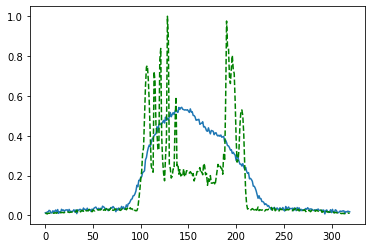

Time taken for epoch:  161.3818609714508
Epoch = [125/3000]  Iter = [   0/39480]  Loss = 0.1765 Avg Loss = 0.1765  Time = 0.0649s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [125/3000]  Iter = [ 100/39480]  Loss = 0.1532 Avg Loss = 0.1627  Time = 0.0037s
Epoch = [125/3000]  Iter = [ 200/39480]  Loss = 0.1496 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [125/3000]  Iter = [ 300/39480]  Loss = 0.1504 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [125/3000]  Iter = [ 400/39480]  Loss = 0.1648 Avg Loss = 0.1572  Time = 0.0033s
Epoch = [125/3000]  Iter = [ 500/39480]  Loss = 0.1666 Avg Loss = 0.1571  Time = 0.0035s
Epoch = [125/3000]  Iter = [ 600/39480]  Loss = 0.1443 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [125/3000]  Iter = [ 700/39480]  Loss = 0.1593 Avg Loss = 0.157  Time = 0.0029s
Epoch = [125/3000]  Iter = [ 800/39480]  Loss = 0.1569 Avg Loss = 0.1565  Time = 0.0050s
Epoch = [125/3000]  Iter = [ 900/39480]  Loss = 0.1781 Avg Loss = 0.1556  Time = 0.0033s
Epoch = [125/3000]  Iter = [1000/39480]  Loss = 0.1342 Avg Loss = 0.1544  Time = 0.0030s
Epoch = [125/3000]  Iter = [1100/39480]  Loss = 0.1411 Avg Loss = 0.1556  Time = 0.0033s
Epoch = [125/3000]  It

Epoch = [125/3000]  Iter = [9400/39480]  Loss = 0.158 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [125/3000]  Iter = [9500/39480]  Loss = 0.132 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [125/3000]  Iter = [9600/39480]  Loss = 0.1822 Avg Loss = 0.1568  Time = 0.0032s
Epoch = [125/3000]  Iter = [9700/39480]  Loss = 0.16 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [125/3000]  Iter = [9800/39480]  Loss = 0.187 Avg Loss = 0.157  Time = 0.0036s
Epoch = [125/3000]  Iter = [9900/39480]  Loss = 0.1522 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [125/3000]  Iter = [10000/39480]  Loss = 0.1262 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [125/3000]  Iter = [10100/39480]  Loss = 0.1567 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [125/3000]  Iter = [10200/39480]  Loss = 0.1516 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [125/3000]  Iter = [10300/39480]  Loss = 0.1195 Avg Loss = 0.1551  Time = 0.0035s
Epoch = [125/3000]  Iter = [10400/39480]  Loss = 0.1965 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [125/3000]  It

Epoch = [125/3000]  Iter = [18600/39480]  Loss = 0.1461 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [125/3000]  Iter = [18700/39480]  Loss = 0.1671 Avg Loss = 0.1578  Time = 0.0035s
Epoch = [125/3000]  Iter = [18800/39480]  Loss = 0.162 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [125/3000]  Iter = [18900/39480]  Loss = 0.1634 Avg Loss = 0.1589  Time = 0.0035s
Epoch = [125/3000]  Iter = [19000/39480]  Loss = 0.1426 Avg Loss = 0.1575  Time = 0.0054s
Epoch = [125/3000]  Iter = [19100/39480]  Loss = 0.1505 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [125/3000]  Iter = [19200/39480]  Loss = 0.1707 Avg Loss = 0.157  Time = 0.0035s
Epoch = [125/3000]  Iter = [19300/39480]  Loss = 0.136 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [125/3000]  Iter = [19400/39480]  Loss = 0.151 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [125/3000]  Iter = [19500/39480]  Loss = 0.1487 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [125/3000]  Iter = [19600/39480]  Loss = 0.1904 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [125/3

Epoch = [125/3000]  Iter = [27800/39480]  Loss = 0.1782 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [125/3000]  Iter = [27900/39480]  Loss = 0.1594 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [125/3000]  Iter = [28000/39480]  Loss = 0.1287 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [125/3000]  Iter = [28100/39480]  Loss = 0.1553 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [125/3000]  Iter = [28200/39480]  Loss = 0.2073 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [125/3000]  Iter = [28300/39480]  Loss = 0.1669 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [125/3000]  Iter = [28400/39480]  Loss = 0.1757 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [125/3000]  Iter = [28500/39480]  Loss = 0.1266 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [125/3000]  Iter = [28600/39480]  Loss = 0.1617 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [125/3000]  Iter = [28700/39480]  Loss = 0.1648 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [125/3000]  Iter = [28800/39480]  Loss = 0.1628 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [1

Epoch = [125/3000]  Iter = [37000/39480]  Loss = 0.1432 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [125/3000]  Iter = [37100/39480]  Loss = 0.1388 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [125/3000]  Iter = [37200/39480]  Loss = 0.176 Avg Loss = 0.1551  Time = 0.0034s
Epoch = [125/3000]  Iter = [37300/39480]  Loss = 0.1732 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [125/3000]  Iter = [37400/39480]  Loss = 0.1491 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [125/3000]  Iter = [37500/39480]  Loss = 0.1335 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [125/3000]  Iter = [37600/39480]  Loss = 0.1569 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [125/3000]  Iter = [37700/39480]  Loss = 0.1857 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [125/3000]  Iter = [37800/39480]  Loss = 0.1776 Avg Loss = 0.1582  Time = 0.0035s
Epoch = [125/3000]  Iter = [37900/39480]  Loss = 0.1567 Avg Loss = 0.157  Time = 0.0036s
Epoch = [125/3000]  Iter = [38000/39480]  Loss = 0.1646 Avg Loss = 0.1577  Time = 0.0031s
Epoch = [125

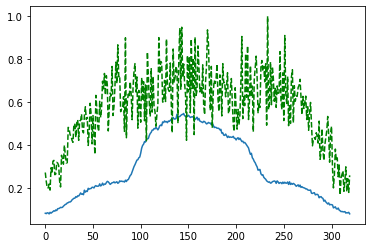

Time taken for epoch:  159.11418747901917
Epoch = [126/3000]  Iter = [   0/39480]  Loss = 0.1669 Avg Loss = 0.1669  Time = 0.0918s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [126/3000]  Iter = [ 100/39480]  Loss = 0.1544 Avg Loss = 0.1608  Time = 0.0038s
Epoch = [126/3000]  Iter = [ 200/39480]  Loss = 0.1594 Avg Loss = 0.1567  Time = 0.0041s
Epoch = [126/3000]  Iter = [ 300/39480]  Loss = 0.1621 Avg Loss = 0.1545  Time = 0.0037s
Epoch = [126/3000]  Iter = [ 400/39480]  Loss = 0.1549 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [126/3000]  Iter = [ 500/39480]  Loss = 0.1495 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [126/3000]  Iter = [ 600/39480]  Loss = 0.1556 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [126/3000]  Iter = [ 700/39480]  Loss = 0.1264 Avg Loss = 0.1573  Time = 0.0038s
Epoch = [126/3000]  Iter = [ 800/39480]  Loss = 0.1554 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [126/3000]  Iter = [ 900/39480]  Loss = 0.1477 Avg Loss = 0.1563  Time = 0.0031s
Epoch = [126/3000]  Iter = [1000/39480]  Loss = 0.1692 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [126/3000]  Iter = [1100/39480]  Loss = 0.1534 Avg Loss = 0.1543  Time = 0.0037s
Epoch = [126/3000]  I

Epoch = [126/3000]  Iter = [9400/39480]  Loss = 0.1343 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [126/3000]  Iter = [9500/39480]  Loss = 0.1336 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [126/3000]  Iter = [9600/39480]  Loss = 0.1575 Avg Loss = 0.1571  Time = 0.0035s
Epoch = [126/3000]  Iter = [9700/39480]  Loss = 0.1669 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [126/3000]  Iter = [9800/39480]  Loss = 0.16 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [126/3000]  Iter = [9900/39480]  Loss = 0.132 Avg Loss = 0.156  Time = 0.0037s
Epoch = [126/3000]  Iter = [10000/39480]  Loss = 0.177 Avg Loss = 0.156  Time = 0.0036s
Epoch = [126/3000]  Iter = [10100/39480]  Loss = 0.1308 Avg Loss = 0.157  Time = 0.0035s
Epoch = [126/3000]  Iter = [10200/39480]  Loss = 0.1731 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [126/3000]  Iter = [10300/39480]  Loss = 0.1558 Avg Loss = 0.158  Time = 0.0037s
Epoch = [126/3000]  Iter = [10400/39480]  Loss = 0.1364 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [126/3000]  Iter

Epoch = [126/3000]  Iter = [18600/39480]  Loss = 0.1592 Avg Loss = 0.1589  Time = 0.0036s
Epoch = [126/3000]  Iter = [18700/39480]  Loss = 0.1457 Avg Loss = 0.1584  Time = 0.0045s
Epoch = [126/3000]  Iter = [18800/39480]  Loss = 0.1356 Avg Loss = 0.1578  Time = 0.0040s
Epoch = [126/3000]  Iter = [18900/39480]  Loss = 0.1932 Avg Loss = 0.1571  Time = 0.0040s
Epoch = [126/3000]  Iter = [19000/39480]  Loss = 0.1456 Avg Loss = 0.1579  Time = 0.0042s
Epoch = [126/3000]  Iter = [19100/39480]  Loss = 0.1458 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [126/3000]  Iter = [19200/39480]  Loss = 0.1649 Avg Loss = 0.158  Time = 0.0030s
Epoch = [126/3000]  Iter = [19300/39480]  Loss = 0.1556 Avg Loss = 0.1578  Time = 0.0030s
Epoch = [126/3000]  Iter = [19400/39480]  Loss = 0.173 Avg Loss = 0.1556  Time = 0.0031s
Epoch = [126/3000]  Iter = [19500/39480]  Loss = 0.1563 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [126/3000]  Iter = [19600/39480]  Loss = 0.1613 Avg Loss = 0.157  Time = 0.0034s
Epoch = [126/

Epoch = [126/3000]  Iter = [27800/39480]  Loss = 0.1598 Avg Loss = 0.1583  Time = 0.0034s
Epoch = [126/3000]  Iter = [27900/39480]  Loss = 0.1554 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [126/3000]  Iter = [28000/39480]  Loss = 0.1602 Avg Loss = 0.158  Time = 0.0036s
Epoch = [126/3000]  Iter = [28100/39480]  Loss = 0.1385 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [126/3000]  Iter = [28200/39480]  Loss = 0.159 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [126/3000]  Iter = [28300/39480]  Loss = 0.1747 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [126/3000]  Iter = [28400/39480]  Loss = 0.1418 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [126/3000]  Iter = [28500/39480]  Loss = 0.1465 Avg Loss = 0.1589  Time = 0.0038s
Epoch = [126/3000]  Iter = [28600/39480]  Loss = 0.1346 Avg Loss = 0.1593  Time = 0.0037s
Epoch = [126/3000]  Iter = [28700/39480]  Loss = 0.1515 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [126/3000]  Iter = [28800/39480]  Loss = 0.1659 Avg Loss = 0.1564  Time = 0.0040s
Epoch = [126

Epoch = [126/3000]  Iter = [37000/39480]  Loss = 0.1652 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [126/3000]  Iter = [37100/39480]  Loss = 0.1467 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [126/3000]  Iter = [37200/39480]  Loss = 0.1512 Avg Loss = 0.1569  Time = 0.0038s
Epoch = [126/3000]  Iter = [37300/39480]  Loss = 0.1787 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [126/3000]  Iter = [37400/39480]  Loss = 0.1443 Avg Loss = 0.1594  Time = 0.0035s
Epoch = [126/3000]  Iter = [37500/39480]  Loss = 0.1645 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [126/3000]  Iter = [37600/39480]  Loss = 0.1714 Avg Loss = 0.156  Time = 0.0037s
Epoch = [126/3000]  Iter = [37700/39480]  Loss = 0.1434 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [126/3000]  Iter = [37800/39480]  Loss = 0.1647 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [126/3000]  Iter = [37900/39480]  Loss = 0.1494 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [126/3000]  Iter = [38000/39480]  Loss = 0.1481 Avg Loss = 0.157  Time = 0.0037s
Epoch = [126

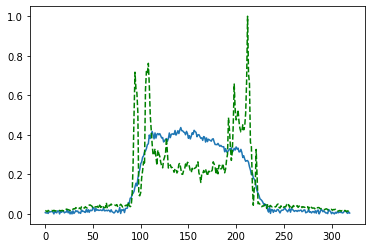

Time taken for epoch:  159.37968230247498
Epoch = [127/3000]  Iter = [   0/39480]  Loss = 0.176 Avg Loss = 0.176  Time = 0.0658s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [127/3000]  Iter = [ 100/39480]  Loss = 0.1764 Avg Loss = 0.1636  Time = 0.0035s
Epoch = [127/3000]  Iter = [ 200/39480]  Loss = 0.1431 Avg Loss = 0.1576  Time = 0.0038s
Epoch = [127/3000]  Iter = [ 300/39480]  Loss = 0.1594 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [127/3000]  Iter = [ 400/39480]  Loss = 0.1652 Avg Loss = 0.1559  Time = 0.0038s
Epoch = [127/3000]  Iter = [ 500/39480]  Loss = 0.1334 Avg Loss = 0.1539  Time = 0.0038s
Epoch = [127/3000]  Iter = [ 600/39480]  Loss = 0.1479 Avg Loss = 0.155  Time = 0.0037s
Epoch = [127/3000]  Iter = [ 700/39480]  Loss = 0.1529 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [127/3000]  Iter = [ 800/39480]  Loss = 0.1594 Avg Loss = 0.1574  Time = 0.0032s
Epoch = [127/3000]  Iter = [ 900/39480]  Loss = 0.1677 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [127/3000]  Iter = [1000/39480]  Loss = 0.1812 Avg Loss = 0.1573  Time = 0.0032s
Epoch = [127/3000]  Iter = [1100/39480]  Loss = 0.166 Avg Loss = 0.1576  Time = 0.0031s
Epoch = [127/3000]  Ite

Epoch = [127/3000]  Iter = [9400/39480]  Loss = 0.1846 Avg Loss = 0.1545  Time = 0.0033s
Epoch = [127/3000]  Iter = [9500/39480]  Loss = 0.155 Avg Loss = 0.1557  Time = 0.0032s
Epoch = [127/3000]  Iter = [9600/39480]  Loss = 0.176 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [127/3000]  Iter = [9700/39480]  Loss = 0.1497 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [127/3000]  Iter = [9800/39480]  Loss = 0.1544 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [127/3000]  Iter = [9900/39480]  Loss = 0.1656 Avg Loss = 0.1557  Time = 0.0032s
Epoch = [127/3000]  Iter = [10000/39480]  Loss = 0.1519 Avg Loss = 0.1548  Time = 0.0038s
Epoch = [127/3000]  Iter = [10100/39480]  Loss = 0.1634 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [127/3000]  Iter = [10200/39480]  Loss = 0.1652 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [127/3000]  Iter = [10300/39480]  Loss = 0.1516 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [127/3000]  Iter = [10400/39480]  Loss = 0.1605 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [127/3000]

Epoch = [127/3000]  Iter = [18600/39480]  Loss = 0.169 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [127/3000]  Iter = [18700/39480]  Loss = 0.1499 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [127/3000]  Iter = [18800/39480]  Loss = 0.1473 Avg Loss = 0.1579  Time = 0.0058s
Epoch = [127/3000]  Iter = [18900/39480]  Loss = 0.1272 Avg Loss = 0.157  Time = 0.0037s
Epoch = [127/3000]  Iter = [19000/39480]  Loss = 0.1468 Avg Loss = 0.1587  Time = 0.0036s
Epoch = [127/3000]  Iter = [19100/39480]  Loss = 0.1727 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [127/3000]  Iter = [19200/39480]  Loss = 0.1296 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [127/3000]  Iter = [19300/39480]  Loss = 0.1499 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [127/3000]  Iter = [19400/39480]  Loss = 0.1556 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [127/3000]  Iter = [19500/39480]  Loss = 0.1568 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [127/3000]  Iter = [19600/39480]  Loss = 0.1592 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [127

Epoch = [127/3000]  Iter = [27800/39480]  Loss = 0.1618 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [127/3000]  Iter = [27900/39480]  Loss = 0.1478 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [127/3000]  Iter = [28000/39480]  Loss = 0.1709 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [127/3000]  Iter = [28100/39480]  Loss = 0.1916 Avg Loss = 0.158  Time = 0.0037s
Epoch = [127/3000]  Iter = [28200/39480]  Loss = 0.1368 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [127/3000]  Iter = [28300/39480]  Loss = 0.1477 Avg Loss = 0.158  Time = 0.0035s
Epoch = [127/3000]  Iter = [28400/39480]  Loss = 0.1312 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [127/3000]  Iter = [28500/39480]  Loss = 0.1461 Avg Loss = 0.1556  Time = 0.0034s
Epoch = [127/3000]  Iter = [28600/39480]  Loss = 0.1473 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [127/3000]  Iter = [28700/39480]  Loss = 0.1701 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [127/3000]  Iter = [28800/39480]  Loss = 0.1842 Avg Loss = 0.1567  Time = 0.0032s
Epoch = [127

Epoch = [127/3000]  Iter = [37000/39480]  Loss = 0.1585 Avg Loss = 0.1565  Time = 0.0040s
Epoch = [127/3000]  Iter = [37100/39480]  Loss = 0.1677 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [127/3000]  Iter = [37200/39480]  Loss = 0.1417 Avg Loss = 0.1587  Time = 0.0034s
Epoch = [127/3000]  Iter = [37300/39480]  Loss = 0.1657 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [127/3000]  Iter = [37400/39480]  Loss = 0.1563 Avg Loss = 0.1576  Time = 0.0033s
Epoch = [127/3000]  Iter = [37500/39480]  Loss = 0.1494 Avg Loss = 0.1593  Time = 0.0036s
Epoch = [127/3000]  Iter = [37600/39480]  Loss = 0.1526 Avg Loss = 0.158  Time = 0.0033s
Epoch = [127/3000]  Iter = [37700/39480]  Loss = 0.2017 Avg Loss = 0.157  Time = 0.0033s
Epoch = [127/3000]  Iter = [37800/39480]  Loss = 0.1691 Avg Loss = 0.1556  Time = 0.0033s
Epoch = [127/3000]  Iter = [37900/39480]  Loss = 0.1425 Avg Loss = 0.156  Time = 0.0032s
Epoch = [127/3000]  Iter = [38000/39480]  Loss = 0.136 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [127/3

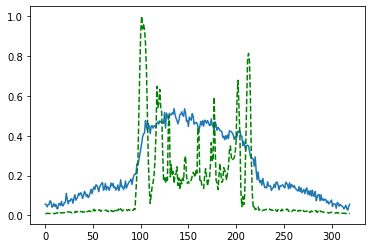

Time taken for epoch:  156.19525361061096
Epoch = [128/3000]  Iter = [   0/39480]  Loss = 0.1481 Avg Loss = 0.1481  Time = 0.0750s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [128/3000]  Iter = [ 100/39480]  Loss = 0.1616 Avg Loss = 0.1535  Time = 0.0035s
Epoch = [128/3000]  Iter = [ 200/39480]  Loss = 0.1619 Avg Loss = 0.1547  Time = 0.0034s
Epoch = [128/3000]  Iter = [ 300/39480]  Loss = 0.14 Avg Loss = 0.1551  Time = 0.0032s
Epoch = [128/3000]  Iter = [ 400/39480]  Loss = 0.1465 Avg Loss = 0.1551  Time = 0.0035s
Epoch = [128/3000]  Iter = [ 500/39480]  Loss = 0.1287 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [128/3000]  Iter = [ 600/39480]  Loss = 0.1371 Avg Loss = 0.1556  Time = 0.0038s
Epoch = [128/3000]  Iter = [ 700/39480]  Loss = 0.1447 Avg Loss = 0.1543  Time = 0.0037s
Epoch = [128/3000]  Iter = [ 800/39480]  Loss = 0.1718 Avg Loss = 0.1559  Time = 0.0033s
Epoch = [128/3000]  Iter = [ 900/39480]  Loss = 0.1496 Avg Loss = 0.1552  Time = 0.0029s
Epoch = [128/3000]  Iter = [1000/39480]  Loss = 0.1881 Avg Loss = 0.1566  Time = 0.0031s
Epoch = [128/3000]  Iter = [1100/39480]  Loss = 0.1597 Avg Loss = 0.155  Time = 0.0036s
Epoch = [128/3000]  Iter

Epoch = [128/3000]  Iter = [9400/39480]  Loss = 0.1566 Avg Loss = 0.1546  Time = 0.0034s
Epoch = [128/3000]  Iter = [9500/39480]  Loss = 0.1671 Avg Loss = 0.1553  Time = 0.0032s
Epoch = [128/3000]  Iter = [9600/39480]  Loss = 0.1267 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [128/3000]  Iter = [9700/39480]  Loss = 0.1391 Avg Loss = 0.1555  Time = 0.0034s
Epoch = [128/3000]  Iter = [9800/39480]  Loss = 0.1608 Avg Loss = 0.1566  Time = 0.0034s
Epoch = [128/3000]  Iter = [9900/39480]  Loss = 0.1553 Avg Loss = 0.1572  Time = 0.0032s
Epoch = [128/3000]  Iter = [10000/39480]  Loss = 0.1784 Avg Loss = 0.1552  Time = 0.0031s
Epoch = [128/3000]  Iter = [10100/39480]  Loss = 0.1674 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [128/3000]  Iter = [10200/39480]  Loss = 0.1664 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [128/3000]  Iter = [10300/39480]  Loss = 0.1849 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [128/3000]  Iter = [10400/39480]  Loss = 0.1776 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [128/300

Epoch = [128/3000]  Iter = [18600/39480]  Loss = 0.1753 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [128/3000]  Iter = [18700/39480]  Loss = 0.1373 Avg Loss = 0.1562  Time = 0.0032s
Epoch = [128/3000]  Iter = [18800/39480]  Loss = 0.1552 Avg Loss = 0.157  Time = 0.0035s
Epoch = [128/3000]  Iter = [18900/39480]  Loss = 0.146 Avg Loss = 0.157  Time = 0.0036s
Epoch = [128/3000]  Iter = [19000/39480]  Loss = 0.1474 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [128/3000]  Iter = [19100/39480]  Loss = 0.1506 Avg Loss = 0.158  Time = 0.0037s
Epoch = [128/3000]  Iter = [19200/39480]  Loss = 0.1541 Avg Loss = 0.1576  Time = 0.0034s
Epoch = [128/3000]  Iter = [19300/39480]  Loss = 0.1546 Avg Loss = 0.158  Time = 0.0033s
Epoch = [128/3000]  Iter = [19400/39480]  Loss = 0.1448 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [128/3000]  Iter = [19500/39480]  Loss = 0.1769 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [128/3000]  Iter = [19600/39480]  Loss = 0.1589 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [128/30

Epoch = [128/3000]  Iter = [27800/39480]  Loss = 0.1678 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [128/3000]  Iter = [27900/39480]  Loss = 0.1547 Avg Loss = 0.1542  Time = 0.0032s
Epoch = [128/3000]  Iter = [28000/39480]  Loss = 0.1349 Avg Loss = 0.155  Time = 0.0036s
Epoch = [128/3000]  Iter = [28100/39480]  Loss = 0.1692 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [128/3000]  Iter = [28200/39480]  Loss = 0.145 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [128/3000]  Iter = [28300/39480]  Loss = 0.1584 Avg Loss = 0.157  Time = 0.0037s
Epoch = [128/3000]  Iter = [28400/39480]  Loss = 0.1701 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [128/3000]  Iter = [28500/39480]  Loss = 0.1635 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [128/3000]  Iter = [28600/39480]  Loss = 0.166 Avg Loss = 0.1545  Time = 0.0037s
Epoch = [128/3000]  Iter = [28700/39480]  Loss = 0.1734 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [128/3000]  Iter = [28800/39480]  Loss = 0.1478 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [128/3

Epoch = [128/3000]  Iter = [37000/39480]  Loss = 0.1498 Avg Loss = 0.1574  Time = 0.0035s
Epoch = [128/3000]  Iter = [37100/39480]  Loss = 0.1582 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [128/3000]  Iter = [37200/39480]  Loss = 0.1535 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [128/3000]  Iter = [37300/39480]  Loss = 0.161 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [128/3000]  Iter = [37400/39480]  Loss = 0.1934 Avg Loss = 0.1552  Time = 0.0034s
Epoch = [128/3000]  Iter = [37500/39480]  Loss = 0.1636 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [128/3000]  Iter = [37600/39480]  Loss = 0.1682 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [128/3000]  Iter = [37700/39480]  Loss = 0.1605 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [128/3000]  Iter = [37800/39480]  Loss = 0.1614 Avg Loss = 0.1586  Time = 0.0037s
Epoch = [128/3000]  Iter = [37900/39480]  Loss = 0.1597 Avg Loss = 0.1582  Time = 0.0035s
Epoch = [128/3000]  Iter = [38000/39480]  Loss = 0.1894 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [12

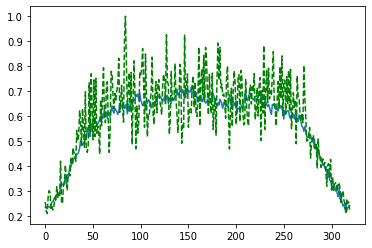

Time taken for epoch:  157.3825294971466
Epoch = [129/3000]  Iter = [   0/39480]  Loss = 0.1791 Avg Loss = 0.1791  Time = 0.0639s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [129/3000]  Iter = [ 100/39480]  Loss = 0.1251 Avg Loss = 0.1633  Time = 0.0035s
Epoch = [129/3000]  Iter = [ 200/39480]  Loss = 0.1461 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [129/3000]  Iter = [ 300/39480]  Loss = 0.1453 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [129/3000]  Iter = [ 400/39480]  Loss = 0.1546 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [129/3000]  Iter = [ 500/39480]  Loss = 0.1466 Avg Loss = 0.1548  Time = 0.0033s
Epoch = [129/3000]  Iter = [ 600/39480]  Loss = 0.1659 Avg Loss = 0.1544  Time = 0.0036s
Epoch = [129/3000]  Iter = [ 700/39480]  Loss = 0.1628 Avg Loss = 0.1545  Time = 0.0031s
Epoch = [129/3000]  Iter = [ 800/39480]  Loss = 0.1888 Avg Loss = 0.1563  Time = 0.0030s
Epoch = [129/3000]  Iter = [ 900/39480]  Loss = 0.1643 Avg Loss = 0.1562  Time = 0.0029s
Epoch = [129/3000]  Iter = [1000/39480]  Loss = 0.1385 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [129/3000]  Iter = [1100/39480]  Loss = 0.1438 Avg Loss = 0.155  Time = 0.0039s
Epoch = [129/3000]  It

Epoch = [129/3000]  Iter = [9400/39480]  Loss = 0.1738 Avg Loss = 0.1546  Time = 0.0036s
Epoch = [129/3000]  Iter = [9500/39480]  Loss = 0.1313 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [129/3000]  Iter = [9600/39480]  Loss = 0.1326 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [129/3000]  Iter = [9700/39480]  Loss = 0.1587 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [129/3000]  Iter = [9800/39480]  Loss = 0.14 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [129/3000]  Iter = [9900/39480]  Loss = 0.1607 Avg Loss = 0.1558  Time = 0.0113s
Epoch = [129/3000]  Iter = [10000/39480]  Loss = 0.1384 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [129/3000]  Iter = [10100/39480]  Loss = 0.1421 Avg Loss = 0.1564  Time = 0.0032s
Epoch = [129/3000]  Iter = [10200/39480]  Loss = 0.1631 Avg Loss = 0.1582  Time = 0.0035s
Epoch = [129/3000]  Iter = [10300/39480]  Loss = 0.1403 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [129/3000]  Iter = [10400/39480]  Loss = 0.1577 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [129/3000]

Epoch = [129/3000]  Iter = [18600/39480]  Loss = 0.1446 Avg Loss = 0.1577  Time = 0.0034s
Epoch = [129/3000]  Iter = [18700/39480]  Loss = 0.16 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [129/3000]  Iter = [18800/39480]  Loss = 0.1391 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [129/3000]  Iter = [18900/39480]  Loss = 0.1561 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [129/3000]  Iter = [19000/39480]  Loss = 0.1597 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [129/3000]  Iter = [19100/39480]  Loss = 0.1646 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [129/3000]  Iter = [19200/39480]  Loss = 0.1463 Avg Loss = 0.1579  Time = 0.0032s
Epoch = [129/3000]  Iter = [19300/39480]  Loss = 0.1498 Avg Loss = 0.1573  Time = 0.0032s
Epoch = [129/3000]  Iter = [19400/39480]  Loss = 0.15 Avg Loss = 0.1558  Time = 0.0035s
Epoch = [129/3000]  Iter = [19500/39480]  Loss = 0.1679 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [129/3000]  Iter = [19600/39480]  Loss = 0.1796 Avg Loss = 0.1578  Time = 0.0035s
Epoch = [129/3

Epoch = [129/3000]  Iter = [27800/39480]  Loss = 0.173 Avg Loss = 0.1556  Time = 0.0034s
Epoch = [129/3000]  Iter = [27900/39480]  Loss = 0.1488 Avg Loss = 0.1564  Time = 0.0035s
Epoch = [129/3000]  Iter = [28000/39480]  Loss = 0.1614 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [129/3000]  Iter = [28100/39480]  Loss = 0.1671 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [129/3000]  Iter = [28200/39480]  Loss = 0.1577 Avg Loss = 0.1556  Time = 0.0034s
Epoch = [129/3000]  Iter = [28300/39480]  Loss = 0.1718 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [129/3000]  Iter = [28400/39480]  Loss = 0.163 Avg Loss = 0.1561  Time = 0.0034s
Epoch = [129/3000]  Iter = [28500/39480]  Loss = 0.1447 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [129/3000]  Iter = [28600/39480]  Loss = 0.131 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [129/3000]  Iter = [28700/39480]  Loss = 0.1461 Avg Loss = 0.1571  Time = 0.0033s
Epoch = [129/3000]  Iter = [28800/39480]  Loss = 0.1343 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [129/

Epoch = [129/3000]  Iter = [37000/39480]  Loss = 0.1733 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [129/3000]  Iter = [37100/39480]  Loss = 0.1414 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [129/3000]  Iter = [37200/39480]  Loss = 0.161 Avg Loss = 0.1547  Time = 0.0032s
Epoch = [129/3000]  Iter = [37300/39480]  Loss = 0.1659 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [129/3000]  Iter = [37400/39480]  Loss = 0.153 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [129/3000]  Iter = [37500/39480]  Loss = 0.1526 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [129/3000]  Iter = [37600/39480]  Loss = 0.1828 Avg Loss = 0.1557  Time = 0.0035s
Epoch = [129/3000]  Iter = [37700/39480]  Loss = 0.1498 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [129/3000]  Iter = [37800/39480]  Loss = 0.1499 Avg Loss = 0.1543  Time = 0.0038s
Epoch = [129/3000]  Iter = [37900/39480]  Loss = 0.1467 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [129/3000]  Iter = [38000/39480]  Loss = 0.152 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [129/

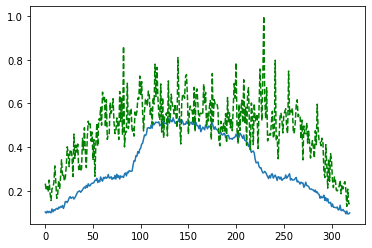

Time taken for epoch:  161.48518896102905
Epoch = [130/3000]  Iter = [   0/39480]  Loss = 0.1722 Avg Loss = 0.1722  Time = 0.0666s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [130/3000]  Iter = [ 100/39480]  Loss = 0.1612 Avg Loss = 0.1613  Time = 0.0035s
Epoch = [130/3000]  Iter = [ 200/39480]  Loss = 0.1502 Avg Loss = 0.1583  Time = 0.0038s
Epoch = [130/3000]  Iter = [ 300/39480]  Loss = 0.1544 Avg Loss = 0.1556  Time = 0.0039s
Epoch = [130/3000]  Iter = [ 400/39480]  Loss = 0.167 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [130/3000]  Iter = [ 500/39480]  Loss = 0.1545 Avg Loss = 0.155  Time = 0.0036s
Epoch = [130/3000]  Iter = [ 600/39480]  Loss = 0.1647 Avg Loss = 0.1561  Time = 0.0038s
Epoch = [130/3000]  Iter = [ 700/39480]  Loss = 0.167 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [130/3000]  Iter = [ 800/39480]  Loss = 0.1574 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [130/3000]  Iter = [ 900/39480]  Loss = 0.151 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [130/3000]  Iter = [1000/39480]  Loss = 0.1557 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [130/3000]  Iter = [1100/39480]  Loss = 0.1499 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [130/3000]  Iter 

Epoch = [130/3000]  Iter = [9400/39480]  Loss = 0.1627 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [130/3000]  Iter = [9500/39480]  Loss = 0.1385 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [130/3000]  Iter = [9600/39480]  Loss = 0.1444 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [130/3000]  Iter = [9700/39480]  Loss = 0.1404 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [130/3000]  Iter = [9800/39480]  Loss = 0.1812 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [130/3000]  Iter = [9900/39480]  Loss = 0.1701 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [130/3000]  Iter = [10000/39480]  Loss = 0.1613 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [130/3000]  Iter = [10100/39480]  Loss = 0.1507 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [130/3000]  Iter = [10200/39480]  Loss = 0.152 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [130/3000]  Iter = [10300/39480]  Loss = 0.1541 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [130/3000]  Iter = [10400/39480]  Loss = 0.1512 Avg Loss = 0.158  Time = 0.0036s
Epoch = [130/3000]

Epoch = [130/3000]  Iter = [18600/39480]  Loss = 0.173 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [130/3000]  Iter = [18700/39480]  Loss = 0.1832 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [130/3000]  Iter = [18800/39480]  Loss = 0.1648 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [130/3000]  Iter = [18900/39480]  Loss = 0.165 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [130/3000]  Iter = [19000/39480]  Loss = 0.1552 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [130/3000]  Iter = [19100/39480]  Loss = 0.1689 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [130/3000]  Iter = [19200/39480]  Loss = 0.1727 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [130/3000]  Iter = [19300/39480]  Loss = 0.1256 Avg Loss = 0.1562  Time = 0.0035s
Epoch = [130/3000]  Iter = [19400/39480]  Loss = 0.1654 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [130/3000]  Iter = [19500/39480]  Loss = 0.1547 Avg Loss = 0.1565  Time = 0.0034s
Epoch = [130/3000]  Iter = [19600/39480]  Loss = 0.1415 Avg Loss = 0.1583  Time = 0.0034s
Epoch = [130

Epoch = [130/3000]  Iter = [27800/39480]  Loss = 0.1417 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [130/3000]  Iter = [27900/39480]  Loss = 0.129 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [130/3000]  Iter = [28000/39480]  Loss = 0.1768 Avg Loss = 0.1567  Time = 0.0052s
Epoch = [130/3000]  Iter = [28100/39480]  Loss = 0.1682 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [130/3000]  Iter = [28200/39480]  Loss = 0.1628 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [130/3000]  Iter = [28300/39480]  Loss = 0.1744 Avg Loss = 0.1562  Time = 0.0033s
Epoch = [130/3000]  Iter = [28400/39480]  Loss = 0.1751 Avg Loss = 0.1588  Time = 0.0035s
Epoch = [130/3000]  Iter = [28500/39480]  Loss = 0.1569 Avg Loss = 0.1569  Time = 0.0034s
Epoch = [130/3000]  Iter = [28600/39480]  Loss = 0.1652 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [130/3000]  Iter = [28700/39480]  Loss = 0.1427 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [130/3000]  Iter = [28800/39480]  Loss = 0.1406 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [13

Epoch = [130/3000]  Iter = [37000/39480]  Loss = 0.1451 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [130/3000]  Iter = [37100/39480]  Loss = 0.1568 Avg Loss = 0.1564  Time = 0.0035s
Epoch = [130/3000]  Iter = [37200/39480]  Loss = 0.1623 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [130/3000]  Iter = [37300/39480]  Loss = 0.1595 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [130/3000]  Iter = [37400/39480]  Loss = 0.152 Avg Loss = 0.157  Time = 0.0036s
Epoch = [130/3000]  Iter = [37500/39480]  Loss = 0.1636 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [130/3000]  Iter = [37600/39480]  Loss = 0.1413 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [130/3000]  Iter = [37700/39480]  Loss = 0.1596 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [130/3000]  Iter = [37800/39480]  Loss = 0.1391 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [130/3000]  Iter = [37900/39480]  Loss = 0.1515 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [130/3000]  Iter = [38000/39480]  Loss = 0.1661 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [130

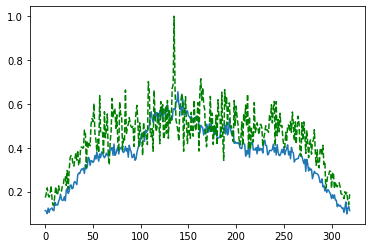

Time taken for epoch:  159.73882675170898
Epoch = [131/3000]  Iter = [   0/39480]  Loss = 0.1798 Avg Loss = 0.1798  Time = 0.0684s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [131/3000]  Iter = [ 100/39480]  Loss = 0.1534 Avg Loss = 0.1635  Time = 0.0034s
Epoch = [131/3000]  Iter = [ 200/39480]  Loss = 0.1345 Avg Loss = 0.1592  Time = 0.0037s
Epoch = [131/3000]  Iter = [ 300/39480]  Loss = 0.1337 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [131/3000]  Iter = [ 400/39480]  Loss = 0.1732 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [131/3000]  Iter = [ 500/39480]  Loss = 0.1562 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [131/3000]  Iter = [ 600/39480]  Loss = 0.1448 Avg Loss = 0.1547  Time = 0.0037s
Epoch = [131/3000]  Iter = [ 700/39480]  Loss = 0.1719 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [131/3000]  Iter = [ 800/39480]  Loss = 0.1546 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [131/3000]  Iter = [ 900/39480]  Loss = 0.1677 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [131/3000]  Iter = [1000/39480]  Loss = 0.1529 Avg Loss = 0.1567  Time = 0.0031s
Epoch = [131/3000]  Iter = [1100/39480]  Loss = 0.1641 Avg Loss = 0.1548  Time = 0.0031s
Epoch = [131/3000]  I

Epoch = [131/3000]  Iter = [9400/39480]  Loss = 0.1527 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [131/3000]  Iter = [9500/39480]  Loss = 0.1517 Avg Loss = 0.158  Time = 0.0035s
Epoch = [131/3000]  Iter = [9600/39480]  Loss = 0.1644 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [131/3000]  Iter = [9700/39480]  Loss = 0.167 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [131/3000]  Iter = [9800/39480]  Loss = 0.1609 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [131/3000]  Iter = [9900/39480]  Loss = 0.1636 Avg Loss = 0.1574  Time = 0.0035s
Epoch = [131/3000]  Iter = [10000/39480]  Loss = 0.1638 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [131/3000]  Iter = [10100/39480]  Loss = 0.1606 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [131/3000]  Iter = [10200/39480]  Loss = 0.1727 Avg Loss = 0.1571  Time = 0.0032s
Epoch = [131/3000]  Iter = [10300/39480]  Loss = 0.1641 Avg Loss = 0.1572  Time = 0.0033s
Epoch = [131/3000]  Iter = [10400/39480]  Loss = 0.1491 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [131/3000]

Epoch = [131/3000]  Iter = [18600/39480]  Loss = 0.1526 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [131/3000]  Iter = [18700/39480]  Loss = 0.1516 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [131/3000]  Iter = [18800/39480]  Loss = 0.1507 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [131/3000]  Iter = [18900/39480]  Loss = 0.1547 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [131/3000]  Iter = [19000/39480]  Loss = 0.1377 Avg Loss = 0.156  Time = 0.0036s
Epoch = [131/3000]  Iter = [19100/39480]  Loss = 0.1484 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [131/3000]  Iter = [19200/39480]  Loss = 0.1217 Avg Loss = 0.1544  Time = 0.0034s
Epoch = [131/3000]  Iter = [19300/39480]  Loss = 0.149 Avg Loss = 0.1548  Time = 0.0035s
Epoch = [131/3000]  Iter = [19400/39480]  Loss = 0.1918 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [131/3000]  Iter = [19500/39480]  Loss = 0.1451 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [131/3000]  Iter = [19600/39480]  Loss = 0.1526 Avg Loss = 0.1586  Time = 0.0038s
Epoch = [131

Epoch = [131/3000]  Iter = [27800/39480]  Loss = 0.1512 Avg Loss = 0.1566  Time = 0.0038s
Epoch = [131/3000]  Iter = [27900/39480]  Loss = 0.1502 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [131/3000]  Iter = [28000/39480]  Loss = 0.1644 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [131/3000]  Iter = [28100/39480]  Loss = 0.1464 Avg Loss = 0.1587  Time = 0.0037s
Epoch = [131/3000]  Iter = [28200/39480]  Loss = 0.192 Avg Loss = 0.1596  Time = 0.0037s
Epoch = [131/3000]  Iter = [28300/39480]  Loss = 0.1499 Avg Loss = 0.1591  Time = 0.0036s
Epoch = [131/3000]  Iter = [28400/39480]  Loss = 0.1794 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [131/3000]  Iter = [28500/39480]  Loss = 0.1447 Avg Loss = 0.157  Time = 0.0037s
Epoch = [131/3000]  Iter = [28600/39480]  Loss = 0.1345 Avg Loss = 0.1574  Time = 0.0034s
Epoch = [131/3000]  Iter = [28700/39480]  Loss = 0.1804 Avg Loss = 0.1578  Time = 0.0035s
Epoch = [131/3000]  Iter = [28800/39480]  Loss = 0.1562 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [131

Epoch = [131/3000]  Iter = [37000/39480]  Loss = 0.1703 Avg Loss = 0.1573  Time = 0.0034s
Epoch = [131/3000]  Iter = [37100/39480]  Loss = 0.1757 Avg Loss = 0.157  Time = 0.0072s
Epoch = [131/3000]  Iter = [37200/39480]  Loss = 0.1372 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [131/3000]  Iter = [37300/39480]  Loss = 0.1439 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [131/3000]  Iter = [37400/39480]  Loss = 0.1458 Avg Loss = 0.157  Time = 0.0036s
Epoch = [131/3000]  Iter = [37500/39480]  Loss = 0.1423 Avg Loss = 0.1578  Time = 0.0035s
Epoch = [131/3000]  Iter = [37600/39480]  Loss = 0.1494 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [131/3000]  Iter = [37700/39480]  Loss = 0.1591 Avg Loss = 0.1581  Time = 0.0035s
Epoch = [131/3000]  Iter = [37800/39480]  Loss = 0.1709 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [131/3000]  Iter = [37900/39480]  Loss = 0.1597 Avg Loss = 0.1573  Time = 0.0035s
Epoch = [131/3000]  Iter = [38000/39480]  Loss = 0.1628 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [131

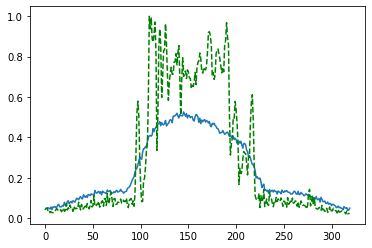

Time taken for epoch:  158.33237051963806
Epoch = [132/3000]  Iter = [   0/39480]  Loss = 0.1674 Avg Loss = 0.1674  Time = 0.0750s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [132/3000]  Iter = [ 100/39480]  Loss = 0.1349 Avg Loss = 0.1588  Time = 0.0037s
Epoch = [132/3000]  Iter = [ 200/39480]  Loss = 0.1613 Avg Loss = 0.1569  Time = 0.0034s
Epoch = [132/3000]  Iter = [ 300/39480]  Loss = 0.1261 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [132/3000]  Iter = [ 400/39480]  Loss = 0.1337 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [132/3000]  Iter = [ 500/39480]  Loss = 0.1444 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [132/3000]  Iter = [ 600/39480]  Loss = 0.1649 Avg Loss = 0.1558  Time = 0.0033s
Epoch = [132/3000]  Iter = [ 700/39480]  Loss = 0.1581 Avg Loss = 0.1543  Time = 0.0036s
Epoch = [132/3000]  Iter = [ 800/39480]  Loss = 0.1479 Avg Loss = 0.1547  Time = 0.0035s
Epoch = [132/3000]  Iter = [ 900/39480]  Loss = 0.1647 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [132/3000]  Iter = [1000/39480]  Loss = 0.1635 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [132/3000]  Iter = [1100/39480]  Loss = 0.1756 Avg Loss = 0.157  Time = 0.0034s
Epoch = [132/3000]  It

Epoch = [132/3000]  Iter = [9400/39480]  Loss = 0.1614 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [132/3000]  Iter = [9500/39480]  Loss = 0.1389 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [132/3000]  Iter = [9600/39480]  Loss = 0.145 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [132/3000]  Iter = [9700/39480]  Loss = 0.1584 Avg Loss = 0.1585  Time = 0.0032s
Epoch = [132/3000]  Iter = [9800/39480]  Loss = 0.1622 Avg Loss = 0.157  Time = 0.0037s
Epoch = [132/3000]  Iter = [9900/39480]  Loss = 0.1506 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [132/3000]  Iter = [10000/39480]  Loss = 0.1503 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [132/3000]  Iter = [10100/39480]  Loss = 0.1597 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [132/3000]  Iter = [10200/39480]  Loss = 0.1785 Avg Loss = 0.1574  Time = 0.0035s
Epoch = [132/3000]  Iter = [10300/39480]  Loss = 0.1536 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [132/3000]  Iter = [10400/39480]  Loss = 0.1539 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [132/3000]

Epoch = [132/3000]  Iter = [18600/39480]  Loss = 0.157 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [132/3000]  Iter = [18700/39480]  Loss = 0.1504 Avg Loss = 0.1568  Time = 0.0034s
Epoch = [132/3000]  Iter = [18800/39480]  Loss = 0.1252 Avg Loss = 0.1575  Time = 0.0034s
Epoch = [132/3000]  Iter = [18900/39480]  Loss = 0.1424 Avg Loss = 0.1573  Time = 0.0054s
Epoch = [132/3000]  Iter = [19000/39480]  Loss = 0.1654 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [132/3000]  Iter = [19100/39480]  Loss = 0.1592 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [132/3000]  Iter = [19200/39480]  Loss = 0.1438 Avg Loss = 0.158  Time = 0.0032s
Epoch = [132/3000]  Iter = [19300/39480]  Loss = 0.1482 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [132/3000]  Iter = [19400/39480]  Loss = 0.141 Avg Loss = 0.156  Time = 0.0037s
Epoch = [132/3000]  Iter = [19500/39480]  Loss = 0.1577 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [132/3000]  Iter = [19600/39480]  Loss = 0.1686 Avg Loss = 0.1576  Time = 0.0032s
Epoch = [132/3

Epoch = [132/3000]  Iter = [27800/39480]  Loss = 0.1439 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [132/3000]  Iter = [27900/39480]  Loss = 0.1445 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [132/3000]  Iter = [28000/39480]  Loss = 0.1336 Avg Loss = 0.1555  Time = 0.0041s
Epoch = [132/3000]  Iter = [28100/39480]  Loss = 0.1525 Avg Loss = 0.156  Time = 0.0040s
Epoch = [132/3000]  Iter = [28200/39480]  Loss = 0.1891 Avg Loss = 0.1568  Time = 0.0041s
Epoch = [132/3000]  Iter = [28300/39480]  Loss = 0.1582 Avg Loss = 0.1557  Time = 0.0041s
Epoch = [132/3000]  Iter = [28400/39480]  Loss = 0.121 Avg Loss = 0.1553  Time = 0.0041s
Epoch = [132/3000]  Iter = [28500/39480]  Loss = 0.1591 Avg Loss = 0.158  Time = 0.0040s
Epoch = [132/3000]  Iter = [28600/39480]  Loss = 0.161 Avg Loss = 0.1583  Time = 0.0040s
Epoch = [132/3000]  Iter = [28700/39480]  Loss = 0.1691 Avg Loss = 0.1567  Time = 0.0040s
Epoch = [132/3000]  Iter = [28800/39480]  Loss = 0.1494 Avg Loss = 0.1579  Time = 0.0041s
Epoch = [132/3

Epoch = [132/3000]  Iter = [37000/39480]  Loss = 0.1605 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [132/3000]  Iter = [37100/39480]  Loss = 0.1704 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [132/3000]  Iter = [37200/39480]  Loss = 0.1446 Avg Loss = 0.1549  Time = 0.0036s
Epoch = [132/3000]  Iter = [37300/39480]  Loss = 0.1517 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [132/3000]  Iter = [37400/39480]  Loss = 0.1583 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [132/3000]  Iter = [37500/39480]  Loss = 0.154 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [132/3000]  Iter = [37600/39480]  Loss = 0.1357 Avg Loss = 0.1576  Time = 0.0034s
Epoch = [132/3000]  Iter = [37700/39480]  Loss = 0.1857 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [132/3000]  Iter = [37800/39480]  Loss = 0.1524 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [132/3000]  Iter = [37900/39480]  Loss = 0.163 Avg Loss = 0.1568  Time = 0.0032s
Epoch = [132/3000]  Iter = [38000/39480]  Loss = 0.1497 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [132

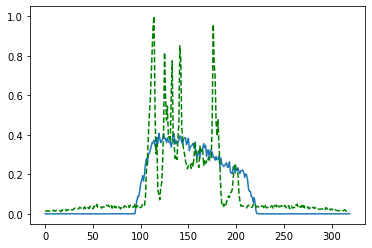

Time taken for epoch:  159.14136481285095
Epoch = [133/3000]  Iter = [   0/39480]  Loss = 0.161 Avg Loss = 0.161  Time = 0.0745s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [133/3000]  Iter = [ 100/39480]  Loss = 0.1563 Avg Loss = 0.1574  Time = 0.0034s
Epoch = [133/3000]  Iter = [ 200/39480]  Loss = 0.1393 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [133/3000]  Iter = [ 300/39480]  Loss = 0.1852 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [133/3000]  Iter = [ 400/39480]  Loss = 0.1584 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [133/3000]  Iter = [ 500/39480]  Loss = 0.1595 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [133/3000]  Iter = [ 600/39480]  Loss = 0.1557 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [133/3000]  Iter = [ 700/39480]  Loss = 0.158 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [133/3000]  Iter = [ 800/39480]  Loss = 0.1671 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [133/3000]  Iter = [ 900/39480]  Loss = 0.1556 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [133/3000]  Iter = [1000/39480]  Loss = 0.168 Avg Loss = 0.1586  Time = 0.0036s
Epoch = [133/3000]  Iter = [1100/39480]  Loss = 0.166 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [133/3000]  Iter

Epoch = [133/3000]  Iter = [9400/39480]  Loss = 0.14 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [133/3000]  Iter = [9500/39480]  Loss = 0.1666 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [133/3000]  Iter = [9600/39480]  Loss = 0.1575 Avg Loss = 0.1548  Time = 0.0036s
Epoch = [133/3000]  Iter = [9700/39480]  Loss = 0.1575 Avg Loss = 0.157  Time = 0.0036s
Epoch = [133/3000]  Iter = [9800/39480]  Loss = 0.1796 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [133/3000]  Iter = [9900/39480]  Loss = 0.1337 Avg Loss = 0.1563  Time = 0.0033s
Epoch = [133/3000]  Iter = [10000/39480]  Loss = 0.171 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [133/3000]  Iter = [10100/39480]  Loss = 0.1556 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [133/3000]  Iter = [10200/39480]  Loss = 0.1888 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [133/3000]  Iter = [10300/39480]  Loss = 0.1624 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [133/3000]  Iter = [10400/39480]  Loss = 0.1626 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [133/3000]  

Epoch = [133/3000]  Iter = [18600/39480]  Loss = 0.1419 Avg Loss = 0.1595  Time = 0.0036s
Epoch = [133/3000]  Iter = [18700/39480]  Loss = 0.1567 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [133/3000]  Iter = [18800/39480]  Loss = 0.1265 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [133/3000]  Iter = [18900/39480]  Loss = 0.1304 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [133/3000]  Iter = [19000/39480]  Loss = 0.1832 Avg Loss = 0.1589  Time = 0.0037s
Epoch = [133/3000]  Iter = [19100/39480]  Loss = 0.1617 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [133/3000]  Iter = [19200/39480]  Loss = 0.1632 Avg Loss = 0.1594  Time = 0.0036s
Epoch = [133/3000]  Iter = [19300/39480]  Loss = 0.1548 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [133/3000]  Iter = [19400/39480]  Loss = 0.1556 Avg Loss = 0.1575  Time = 0.0034s
Epoch = [133/3000]  Iter = [19500/39480]  Loss = 0.1859 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [133/3000]  Iter = [19600/39480]  Loss = 0.1632 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [1

Epoch = [133/3000]  Iter = [27800/39480]  Loss = 0.1468 Avg Loss = 0.1578  Time = 0.0038s
Epoch = [133/3000]  Iter = [27900/39480]  Loss = 0.1262 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [133/3000]  Iter = [28000/39480]  Loss = 0.1271 Avg Loss = 0.1571  Time = 0.0038s
Epoch = [133/3000]  Iter = [28100/39480]  Loss = 0.1612 Avg Loss = 0.1578  Time = 0.0039s
Epoch = [133/3000]  Iter = [28200/39480]  Loss = 0.159 Avg Loss = 0.1579  Time = 0.0038s
Epoch = [133/3000]  Iter = [28300/39480]  Loss = 0.1384 Avg Loss = 0.1568  Time = 0.0039s
Epoch = [133/3000]  Iter = [28400/39480]  Loss = 0.1668 Avg Loss = 0.1571  Time = 0.0039s
Epoch = [133/3000]  Iter = [28500/39480]  Loss = 0.153 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [133/3000]  Iter = [28600/39480]  Loss = 0.1372 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [133/3000]  Iter = [28700/39480]  Loss = 0.1597 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [133/3000]  Iter = [28800/39480]  Loss = 0.1659 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [133

Epoch = [133/3000]  Iter = [37000/39480]  Loss = 0.1362 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [133/3000]  Iter = [37100/39480]  Loss = 0.1478 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [133/3000]  Iter = [37200/39480]  Loss = 0.1587 Avg Loss = 0.1581  Time = 0.0038s
Epoch = [133/3000]  Iter = [37300/39480]  Loss = 0.1611 Avg Loss = 0.158  Time = 0.0038s
Epoch = [133/3000]  Iter = [37400/39480]  Loss = 0.1491 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [133/3000]  Iter = [37500/39480]  Loss = 0.1631 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [133/3000]  Iter = [37600/39480]  Loss = 0.1543 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [133/3000]  Iter = [37700/39480]  Loss = 0.1586 Avg Loss = 0.1558  Time = 0.0031s
Epoch = [133/3000]  Iter = [37800/39480]  Loss = 0.1497 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [133/3000]  Iter = [37900/39480]  Loss = 0.1549 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [133/3000]  Iter = [38000/39480]  Loss = 0.1371 Avg Loss = 0.1552  Time = 0.0034s
Epoch = [13

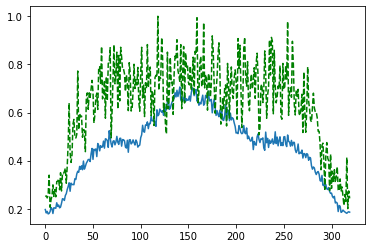

Time taken for epoch:  158.84369015693665
Epoch = [134/3000]  Iter = [   0/39480]  Loss = 0.1423 Avg Loss = 0.1423  Time = 0.0666s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [134/3000]  Iter = [ 100/39480]  Loss = 0.1603 Avg Loss = 0.1497  Time = 0.0036s
Epoch = [134/3000]  Iter = [ 200/39480]  Loss = 0.1357 Avg Loss = 0.1536  Time = 0.0038s
Epoch = [134/3000]  Iter = [ 300/39480]  Loss = 0.1642 Avg Loss = 0.1543  Time = 0.0039s
Epoch = [134/3000]  Iter = [ 400/39480]  Loss = 0.156 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [134/3000]  Iter = [ 500/39480]  Loss = 0.1495 Avg Loss = 0.1549  Time = 0.0038s
Epoch = [134/3000]  Iter = [ 600/39480]  Loss = 0.1555 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [134/3000]  Iter = [ 700/39480]  Loss = 0.1488 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [134/3000]  Iter = [ 800/39480]  Loss = 0.1607 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [134/3000]  Iter = [ 900/39480]  Loss = 0.1481 Avg Loss = 0.155  Time = 0.0037s
Epoch = [134/3000]  Iter = [1000/39480]  Loss = 0.1705 Avg Loss = 0.155  Time = 0.0037s
Epoch = [134/3000]  Iter = [1100/39480]  Loss = 0.1379 Avg Loss = 0.154  Time = 0.0037s
Epoch = [134/3000]  Iter 

Epoch = [134/3000]  Iter = [9400/39480]  Loss = 0.1542 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [134/3000]  Iter = [9500/39480]  Loss = 0.1704 Avg Loss = 0.1571  Time = 0.0032s
Epoch = [134/3000]  Iter = [9600/39480]  Loss = 0.1646 Avg Loss = 0.1566  Time = 0.0038s
Epoch = [134/3000]  Iter = [9700/39480]  Loss = 0.1614 Avg Loss = 0.1574  Time = 0.0038s
Epoch = [134/3000]  Iter = [9800/39480]  Loss = 0.1455 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [134/3000]  Iter = [9900/39480]  Loss = 0.1561 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [134/3000]  Iter = [10000/39480]  Loss = 0.1837 Avg Loss = 0.1557  Time = 0.0035s
Epoch = [134/3000]  Iter = [10100/39480]  Loss = 0.1497 Avg Loss = 0.157  Time = 0.0037s
Epoch = [134/3000]  Iter = [10200/39480]  Loss = 0.1918 Avg Loss = 0.1574  Time = 0.0030s
Epoch = [134/3000]  Iter = [10300/39480]  Loss = 0.1619 Avg Loss = 0.1567  Time = 0.0034s
Epoch = [134/3000]  Iter = [10400/39480]  Loss = 0.1762 Avg Loss = 0.1558  Time = 0.0031s
Epoch = [134/3000

Epoch = [134/3000]  Iter = [18600/39480]  Loss = 0.1623 Avg Loss = 0.1557  Time = 0.0033s
Epoch = [134/3000]  Iter = [18700/39480]  Loss = 0.1539 Avg Loss = 0.157  Time = 0.0031s
Epoch = [134/3000]  Iter = [18800/39480]  Loss = 0.1751 Avg Loss = 0.1559  Time = 0.0033s
Epoch = [134/3000]  Iter = [18900/39480]  Loss = 0.1651 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [134/3000]  Iter = [19000/39480]  Loss = 0.1327 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [134/3000]  Iter = [19100/39480]  Loss = 0.1571 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [134/3000]  Iter = [19200/39480]  Loss = 0.1438 Avg Loss = 0.1572  Time = 0.0031s
Epoch = [134/3000]  Iter = [19300/39480]  Loss = 0.1678 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [134/3000]  Iter = [19400/39480]  Loss = 0.1266 Avg Loss = 0.1557  Time = 0.0034s
Epoch = [134/3000]  Iter = [19500/39480]  Loss = 0.1534 Avg Loss = 0.1563  Time = 0.0032s
Epoch = [134/3000]  Iter = [19600/39480]  Loss = 0.1514 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [13

Epoch = [134/3000]  Iter = [27800/39480]  Loss = 0.1603 Avg Loss = 0.1546  Time = 0.0036s
Epoch = [134/3000]  Iter = [27900/39480]  Loss = 0.1799 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [134/3000]  Iter = [28000/39480]  Loss = 0.1313 Avg Loss = 0.155  Time = 0.0036s
Epoch = [134/3000]  Iter = [28100/39480]  Loss = 0.1421 Avg Loss = 0.156  Time = 0.0035s
Epoch = [134/3000]  Iter = [28200/39480]  Loss = 0.1657 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [134/3000]  Iter = [28300/39480]  Loss = 0.1454 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [134/3000]  Iter = [28400/39480]  Loss = 0.1674 Avg Loss = 0.1542  Time = 0.0036s
Epoch = [134/3000]  Iter = [28500/39480]  Loss = 0.1537 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [134/3000]  Iter = [28600/39480]  Loss = 0.161 Avg Loss = 0.1554  Time = 0.0032s
Epoch = [134/3000]  Iter = [28700/39480]  Loss = 0.1519 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [134/3000]  Iter = [28800/39480]  Loss = 0.1493 Avg Loss = 0.157  Time = 0.0032s
Epoch = [134/3

Epoch = [134/3000]  Iter = [37000/39480]  Loss = 0.1559 Avg Loss = 0.1561  Time = 0.0032s
Epoch = [134/3000]  Iter = [37100/39480]  Loss = 0.1704 Avg Loss = 0.1563  Time = 0.0032s
Epoch = [134/3000]  Iter = [37200/39480]  Loss = 0.1707 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [134/3000]  Iter = [37300/39480]  Loss = 0.1599 Avg Loss = 0.1589  Time = 0.0036s
Epoch = [134/3000]  Iter = [37400/39480]  Loss = 0.1381 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [134/3000]  Iter = [37500/39480]  Loss = 0.1682 Avg Loss = 0.1571  Time = 0.0035s
Epoch = [134/3000]  Iter = [37600/39480]  Loss = 0.1502 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [134/3000]  Iter = [37700/39480]  Loss = 0.155 Avg Loss = 0.1573  Time = 0.0034s
Epoch = [134/3000]  Iter = [37800/39480]  Loss = 0.1409 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [134/3000]  Iter = [37900/39480]  Loss = 0.1686 Avg Loss = 0.1588  Time = 0.0037s
Epoch = [134/3000]  Iter = [38000/39480]  Loss = 0.1701 Avg Loss = 0.158  Time = 0.0037s
Epoch = [134

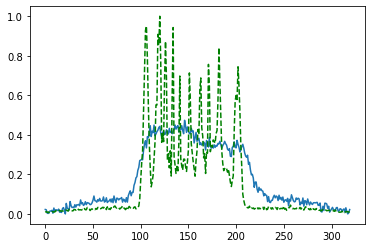

Time taken for epoch:  158.23710322380066
Epoch = [135/3000]  Iter = [   0/39480]  Loss = 0.1523 Avg Loss = 0.1523  Time = 0.0655s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [135/3000]  Iter = [ 100/39480]  Loss = 0.1636 Avg Loss = 0.1531  Time = 0.0035s
Epoch = [135/3000]  Iter = [ 200/39480]  Loss = 0.1293 Avg Loss = 0.1557  Time = 0.0038s
Epoch = [135/3000]  Iter = [ 300/39480]  Loss = 0.1679 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [135/3000]  Iter = [ 400/39480]  Loss = 0.1223 Avg Loss = 0.1549  Time = 0.0036s
Epoch = [135/3000]  Iter = [ 500/39480]  Loss = 0.1473 Avg Loss = 0.1578  Time = 0.0032s
Epoch = [135/3000]  Iter = [ 600/39480]  Loss = 0.1873 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [135/3000]  Iter = [ 700/39480]  Loss = 0.16 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [135/3000]  Iter = [ 800/39480]  Loss = 0.1698 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [135/3000]  Iter = [ 900/39480]  Loss = 0.1464 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [135/3000]  Iter = [1000/39480]  Loss = 0.1423 Avg Loss = 0.1558  Time = 0.0032s
Epoch = [135/3000]  Iter = [1100/39480]  Loss = 0.2149 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [135/3000]  Ite

Epoch = [135/3000]  Iter = [9400/39480]  Loss = 0.1639 Avg Loss = 0.1567  Time = 0.0041s
Epoch = [135/3000]  Iter = [9500/39480]  Loss = 0.1659 Avg Loss = 0.1567  Time = 0.0040s
Epoch = [135/3000]  Iter = [9600/39480]  Loss = 0.1668 Avg Loss = 0.1557  Time = 0.0040s
Epoch = [135/3000]  Iter = [9700/39480]  Loss = 0.1657 Avg Loss = 0.1554  Time = 0.0039s
Epoch = [135/3000]  Iter = [9800/39480]  Loss = 0.1403 Avg Loss = 0.1563  Time = 0.0040s
Epoch = [135/3000]  Iter = [9900/39480]  Loss = 0.154 Avg Loss = 0.1555  Time = 0.0041s
Epoch = [135/3000]  Iter = [10000/39480]  Loss = 0.1856 Avg Loss = 0.1557  Time = 0.0033s
Epoch = [135/3000]  Iter = [10100/39480]  Loss = 0.125 Avg Loss = 0.1549  Time = 0.0035s
Epoch = [135/3000]  Iter = [10200/39480]  Loss = 0.1887 Avg Loss = 0.157  Time = 0.0037s
Epoch = [135/3000]  Iter = [10300/39480]  Loss = 0.1445 Avg Loss = 0.1559  Time = 0.0032s
Epoch = [135/3000]  Iter = [10400/39480]  Loss = 0.1627 Avg Loss = 0.1553  Time = 0.0034s
Epoch = [135/3000] 

Epoch = [135/3000]  Iter = [18600/39480]  Loss = 0.1793 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [135/3000]  Iter = [18700/39480]  Loss = 0.1654 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [135/3000]  Iter = [18800/39480]  Loss = 0.1347 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [135/3000]  Iter = [18900/39480]  Loss = 0.1357 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [135/3000]  Iter = [19000/39480]  Loss = 0.1507 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [135/3000]  Iter = [19100/39480]  Loss = 0.1473 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [135/3000]  Iter = [19200/39480]  Loss = 0.1492 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [135/3000]  Iter = [19300/39480]  Loss = 0.164 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [135/3000]  Iter = [19400/39480]  Loss = 0.1456 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [135/3000]  Iter = [19500/39480]  Loss = 0.1399 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [135/3000]  Iter = [19600/39480]  Loss = 0.1763 Avg Loss = 0.1547  Time = 0.0036s
Epoch = [13

Epoch = [135/3000]  Iter = [27800/39480]  Loss = 0.1501 Avg Loss = 0.1559  Time = 0.0039s
Epoch = [135/3000]  Iter = [27900/39480]  Loss = 0.1727 Avg Loss = 0.1552  Time = 0.0040s
Epoch = [135/3000]  Iter = [28000/39480]  Loss = 0.1785 Avg Loss = 0.1568  Time = 0.0038s
Epoch = [135/3000]  Iter = [28100/39480]  Loss = 0.1507 Avg Loss = 0.1573  Time = 0.0039s
Epoch = [135/3000]  Iter = [28200/39480]  Loss = 0.1587 Avg Loss = 0.1577  Time = 0.0039s
Epoch = [135/3000]  Iter = [28300/39480]  Loss = 0.1592 Avg Loss = 0.1574  Time = 0.0039s
Epoch = [135/3000]  Iter = [28400/39480]  Loss = 0.1575 Avg Loss = 0.1581  Time = 0.0039s
Epoch = [135/3000]  Iter = [28500/39480]  Loss = 0.1637 Avg Loss = 0.1583  Time = 0.0038s
Epoch = [135/3000]  Iter = [28600/39480]  Loss = 0.1484 Avg Loss = 0.1578  Time = 0.0038s
Epoch = [135/3000]  Iter = [28700/39480]  Loss = 0.1903 Avg Loss = 0.1585  Time = 0.0038s
Epoch = [135/3000]  Iter = [28800/39480]  Loss = 0.1401 Avg Loss = 0.1571  Time = 0.0039s
Epoch = [1

Epoch = [135/3000]  Iter = [37000/39480]  Loss = 0.1686 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [135/3000]  Iter = [37100/39480]  Loss = 0.1648 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [135/3000]  Iter = [37200/39480]  Loss = 0.1476 Avg Loss = 0.1562  Time = 0.0038s
Epoch = [135/3000]  Iter = [37300/39480]  Loss = 0.1462 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [135/3000]  Iter = [37400/39480]  Loss = 0.1521 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [135/3000]  Iter = [37500/39480]  Loss = 0.1394 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [135/3000]  Iter = [37600/39480]  Loss = 0.1519 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [135/3000]  Iter = [37700/39480]  Loss = 0.1875 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [135/3000]  Iter = [37800/39480]  Loss = 0.1543 Avg Loss = 0.156  Time = 0.0034s
Epoch = [135/3000]  Iter = [37900/39480]  Loss = 0.1748 Avg Loss = 0.1562  Time = 0.0033s
Epoch = [135/3000]  Iter = [38000/39480]  Loss = 0.1497 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [13

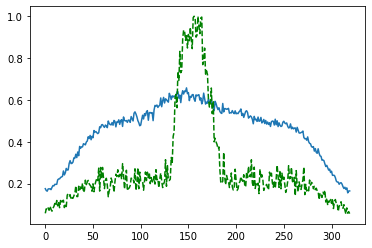

Time taken for epoch:  159.85531163215637
Epoch = [136/3000]  Iter = [   0/39480]  Loss = 0.153 Avg Loss = 0.153  Time = 0.1016s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [136/3000]  Iter = [ 100/39480]  Loss = 0.152 Avg Loss = 0.1546  Time = 0.0036s
Epoch = [136/3000]  Iter = [ 200/39480]  Loss = 0.145 Avg Loss = 0.1547  Time = 0.0036s
Epoch = [136/3000]  Iter = [ 300/39480]  Loss = 0.1692 Avg Loss = 0.1542  Time = 0.0036s
Epoch = [136/3000]  Iter = [ 400/39480]  Loss = 0.1678 Avg Loss = 0.1551  Time = 0.0034s
Epoch = [136/3000]  Iter = [ 500/39480]  Loss = 0.1916 Avg Loss = 0.156  Time = 0.0036s
Epoch = [136/3000]  Iter = [ 600/39480]  Loss = 0.1501 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [136/3000]  Iter = [ 700/39480]  Loss = 0.1655 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [136/3000]  Iter = [ 800/39480]  Loss = 0.1698 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [136/3000]  Iter = [ 900/39480]  Loss = 0.1733 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [136/3000]  Iter = [1000/39480]  Loss = 0.1482 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [136/3000]  Iter = [1100/39480]  Loss = 0.1697 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [136/3000]  Iter

Epoch = [136/3000]  Iter = [9400/39480]  Loss = 0.1581 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [136/3000]  Iter = [9500/39480]  Loss = 0.168 Avg Loss = 0.1587  Time = 0.0036s
Epoch = [136/3000]  Iter = [9600/39480]  Loss = 0.1578 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [136/3000]  Iter = [9700/39480]  Loss = 0.1413 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [136/3000]  Iter = [9800/39480]  Loss = 0.1661 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [136/3000]  Iter = [9900/39480]  Loss = 0.1672 Avg Loss = 0.1575  Time = 0.0032s
Epoch = [136/3000]  Iter = [10000/39480]  Loss = 0.1441 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [136/3000]  Iter = [10100/39480]  Loss = 0.1463 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [136/3000]  Iter = [10200/39480]  Loss = 0.1786 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [136/3000]  Iter = [10300/39480]  Loss = 0.1596 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [136/3000]  Iter = [10400/39480]  Loss = 0.1712 Avg Loss = 0.1569  Time = 0.0034s
Epoch = [136/3000

Epoch = [136/3000]  Iter = [18600/39480]  Loss = 0.1707 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [136/3000]  Iter = [18700/39480]  Loss = 0.1685 Avg Loss = 0.158  Time = 0.0037s
Epoch = [136/3000]  Iter = [18800/39480]  Loss = 0.1822 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [136/3000]  Iter = [18900/39480]  Loss = 0.1504 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [136/3000]  Iter = [19000/39480]  Loss = 0.1572 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [136/3000]  Iter = [19100/39480]  Loss = 0.1287 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [136/3000]  Iter = [19200/39480]  Loss = 0.1718 Avg Loss = 0.1566  Time = 0.0030s
Epoch = [136/3000]  Iter = [19300/39480]  Loss = 0.1642 Avg Loss = 0.1553  Time = 0.0031s
Epoch = [136/3000]  Iter = [19400/39480]  Loss = 0.173 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [136/3000]  Iter = [19500/39480]  Loss = 0.1588 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [136/3000]  Iter = [19600/39480]  Loss = 0.2003 Avg Loss = 0.1577  Time = 0.0032s
Epoch = [136

Epoch = [136/3000]  Iter = [27800/39480]  Loss = 0.1531 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [136/3000]  Iter = [27900/39480]  Loss = 0.1481 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [136/3000]  Iter = [28000/39480]  Loss = 0.1458 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [136/3000]  Iter = [28100/39480]  Loss = 0.1678 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [136/3000]  Iter = [28200/39480]  Loss = 0.1512 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [136/3000]  Iter = [28300/39480]  Loss = 0.158 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [136/3000]  Iter = [28400/39480]  Loss = 0.145 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [136/3000]  Iter = [28500/39480]  Loss = 0.1678 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [136/3000]  Iter = [28600/39480]  Loss = 0.1481 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [136/3000]  Iter = [28700/39480]  Loss = 0.1476 Avg Loss = 0.1568  Time = 0.0032s
Epoch = [136/3000]  Iter = [28800/39480]  Loss = 0.1424 Avg Loss = 0.1553  Time = 0.0035s
Epoch = [136

Epoch = [136/3000]  Iter = [37000/39480]  Loss = 0.1819 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [136/3000]  Iter = [37100/39480]  Loss = 0.1573 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [136/3000]  Iter = [37200/39480]  Loss = 0.1597 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [136/3000]  Iter = [37300/39480]  Loss = 0.1469 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [136/3000]  Iter = [37400/39480]  Loss = 0.1734 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [136/3000]  Iter = [37500/39480]  Loss = 0.1548 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [136/3000]  Iter = [37600/39480]  Loss = 0.154 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [136/3000]  Iter = [37700/39480]  Loss = 0.1484 Avg Loss = 0.1582  Time = 0.0032s
Epoch = [136/3000]  Iter = [37800/39480]  Loss = 0.1571 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [136/3000]  Iter = [37900/39480]  Loss = 0.1621 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [136/3000]  Iter = [38000/39480]  Loss = 0.1476 Avg Loss = 0.157  Time = 0.0037s
Epoch = [136

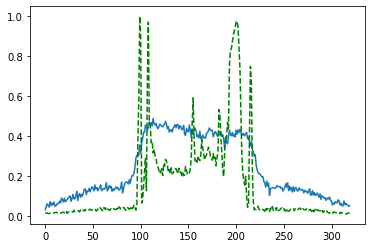

Time taken for epoch:  159.85043597221375
Epoch = [137/3000]  Iter = [   0/39480]  Loss = 0.1574 Avg Loss = 0.1574  Time = 0.0743s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [137/3000]  Iter = [ 100/39480]  Loss = 0.1587 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [137/3000]  Iter = [ 200/39480]  Loss = 0.1662 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [137/3000]  Iter = [ 300/39480]  Loss = 0.175 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [137/3000]  Iter = [ 400/39480]  Loss = 0.1425 Avg Loss = 0.156  Time = 0.0037s
Epoch = [137/3000]  Iter = [ 500/39480]  Loss = 0.1462 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [137/3000]  Iter = [ 600/39480]  Loss = 0.1507 Avg Loss = 0.155  Time = 0.0037s
Epoch = [137/3000]  Iter = [ 700/39480]  Loss = 0.1597 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [137/3000]  Iter = [ 800/39480]  Loss = 0.1583 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [137/3000]  Iter = [ 900/39480]  Loss = 0.1552 Avg Loss = 0.1547  Time = 0.0036s
Epoch = [137/3000]  Iter = [1000/39480]  Loss = 0.1438 Avg Loss = 0.1547  Time = 0.0037s
Epoch = [137/3000]  Iter = [1100/39480]  Loss = 0.168 Avg Loss = 0.1549  Time = 0.0036s
Epoch = [137/3000]  Iter 

Epoch = [137/3000]  Iter = [9400/39480]  Loss = 0.1528 Avg Loss = 0.1554  Time = 0.0038s
Epoch = [137/3000]  Iter = [9500/39480]  Loss = 0.1607 Avg Loss = 0.1559  Time = 0.0039s
Epoch = [137/3000]  Iter = [9600/39480]  Loss = 0.1502 Avg Loss = 0.1541  Time = 0.0034s
Epoch = [137/3000]  Iter = [9700/39480]  Loss = 0.1705 Avg Loss = 0.1559  Time = 0.0039s
Epoch = [137/3000]  Iter = [9800/39480]  Loss = 0.1658 Avg Loss = 0.1561  Time = 0.0038s
Epoch = [137/3000]  Iter = [9900/39480]  Loss = 0.1485 Avg Loss = 0.1577  Time = 0.0038s
Epoch = [137/3000]  Iter = [10000/39480]  Loss = 0.1571 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [137/3000]  Iter = [10100/39480]  Loss = 0.1901 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [137/3000]  Iter = [10200/39480]  Loss = 0.1583 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [137/3000]  Iter = [10300/39480]  Loss = 0.14 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [137/3000]  Iter = [10400/39480]  Loss = 0.1515 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [137/3000]

Epoch = [137/3000]  Iter = [18600/39480]  Loss = 0.1581 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [137/3000]  Iter = [18700/39480]  Loss = 0.1519 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [137/3000]  Iter = [18800/39480]  Loss = 0.1546 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [137/3000]  Iter = [18900/39480]  Loss = 0.1912 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [137/3000]  Iter = [19000/39480]  Loss = 0.1634 Avg Loss = 0.157  Time = 0.0038s
Epoch = [137/3000]  Iter = [19100/39480]  Loss = 0.1595 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [137/3000]  Iter = [19200/39480]  Loss = 0.1509 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [137/3000]  Iter = [19300/39480]  Loss = 0.1384 Avg Loss = 0.1578  Time = 0.0035s
Epoch = [137/3000]  Iter = [19400/39480]  Loss = 0.1401 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [137/3000]  Iter = [19500/39480]  Loss = 0.1653 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [137/3000]  Iter = [19600/39480]  Loss = 0.1611 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [13

Epoch = [137/3000]  Iter = [27800/39480]  Loss = 0.1615 Avg Loss = 0.156  Time = 0.0036s
Epoch = [137/3000]  Iter = [27900/39480]  Loss = 0.1763 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [137/3000]  Iter = [28000/39480]  Loss = 0.1547 Avg Loss = 0.1584  Time = 0.0035s
Epoch = [137/3000]  Iter = [28100/39480]  Loss = 0.1813 Avg Loss = 0.1574  Time = 0.0038s
Epoch = [137/3000]  Iter = [28200/39480]  Loss = 0.1471 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [137/3000]  Iter = [28300/39480]  Loss = 0.1574 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [137/3000]  Iter = [28400/39480]  Loss = 0.1711 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [137/3000]  Iter = [28500/39480]  Loss = 0.1453 Avg Loss = 0.1558  Time = 0.0033s
Epoch = [137/3000]  Iter = [28600/39480]  Loss = 0.1576 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [137/3000]  Iter = [28700/39480]  Loss = 0.1294 Avg Loss = 0.1551  Time = 0.0035s
Epoch = [137/3000]  Iter = [28800/39480]  Loss = 0.136 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [137

Epoch = [137/3000]  Iter = [37000/39480]  Loss = 0.1583 Avg Loss = 0.1571  Time = 0.0034s
Epoch = [137/3000]  Iter = [37100/39480]  Loss = 0.1501 Avg Loss = 0.1568  Time = 0.0038s
Epoch = [137/3000]  Iter = [37200/39480]  Loss = 0.1563 Avg Loss = 0.1587  Time = 0.0038s
Epoch = [137/3000]  Iter = [37300/39480]  Loss = 0.1683 Avg Loss = 0.1587  Time = 0.0038s
Epoch = [137/3000]  Iter = [37400/39480]  Loss = 0.1545 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [137/3000]  Iter = [37500/39480]  Loss = 0.1335 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [137/3000]  Iter = [37600/39480]  Loss = 0.1502 Avg Loss = 0.1553  Time = 0.0035s
Epoch = [137/3000]  Iter = [37700/39480]  Loss = 0.1469 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [137/3000]  Iter = [37800/39480]  Loss = 0.1612 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [137/3000]  Iter = [37900/39480]  Loss = 0.1554 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [137/3000]  Iter = [38000/39480]  Loss = 0.1474 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [1

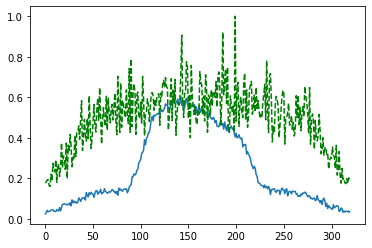

Time taken for epoch:  160.44083738327026
Epoch = [138/3000]  Iter = [   0/39480]  Loss = 0.154 Avg Loss = 0.154  Time = 0.0659s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [138/3000]  Iter = [ 100/39480]  Loss = 0.1762 Avg Loss = 0.1547  Time = 0.0038s
Epoch = [138/3000]  Iter = [ 200/39480]  Loss = 0.1658 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [138/3000]  Iter = [ 300/39480]  Loss = 0.1485 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [138/3000]  Iter = [ 400/39480]  Loss = 0.1339 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [138/3000]  Iter = [ 500/39480]  Loss = 0.1147 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [138/3000]  Iter = [ 600/39480]  Loss = 0.1466 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [138/3000]  Iter = [ 700/39480]  Loss = 0.1435 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [138/3000]  Iter = [ 800/39480]  Loss = 0.1581 Avg Loss = 0.1544  Time = 0.0037s
Epoch = [138/3000]  Iter = [ 900/39480]  Loss = 0.1654 Avg Loss = 0.1543  Time = 0.0036s
Epoch = [138/3000]  Iter = [1000/39480]  Loss = 0.1399 Avg Loss = 0.1557  Time = 0.0044s
Epoch = [138/3000]  Iter = [1100/39480]  Loss = 0.1683 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [138/3000]  I

Epoch = [138/3000]  Iter = [9400/39480]  Loss = 0.1551 Avg Loss = 0.154  Time = 0.0036s
Epoch = [138/3000]  Iter = [9500/39480]  Loss = 0.1433 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [138/3000]  Iter = [9600/39480]  Loss = 0.1646 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [138/3000]  Iter = [9700/39480]  Loss = 0.1678 Avg Loss = 0.157  Time = 0.0036s
Epoch = [138/3000]  Iter = [9800/39480]  Loss = 0.1482 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [138/3000]  Iter = [9900/39480]  Loss = 0.1673 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [138/3000]  Iter = [10000/39480]  Loss = 0.1393 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [138/3000]  Iter = [10100/39480]  Loss = 0.1387 Avg Loss = 0.1558  Time = 0.0038s
Epoch = [138/3000]  Iter = [10200/39480]  Loss = 0.1301 Avg Loss = 0.1553  Time = 0.0038s
Epoch = [138/3000]  Iter = [10300/39480]  Loss = 0.147 Avg Loss = 0.1552  Time = 0.0038s
Epoch = [138/3000]  Iter = [10400/39480]  Loss = 0.1634 Avg Loss = 0.1566  Time = 0.0040s
Epoch = [138/3000] 

Epoch = [138/3000]  Iter = [18600/39480]  Loss = 0.1688 Avg Loss = 0.158  Time = 0.0037s
Epoch = [138/3000]  Iter = [18700/39480]  Loss = 0.1633 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [138/3000]  Iter = [18800/39480]  Loss = 0.1755 Avg Loss = 0.1583  Time = 0.0035s
Epoch = [138/3000]  Iter = [18900/39480]  Loss = 0.1248 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [138/3000]  Iter = [19000/39480]  Loss = 0.158 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [138/3000]  Iter = [19100/39480]  Loss = 0.1627 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [138/3000]  Iter = [19200/39480]  Loss = 0.1468 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [138/3000]  Iter = [19300/39480]  Loss = 0.1851 Avg Loss = 0.158  Time = 0.0036s
Epoch = [138/3000]  Iter = [19400/39480]  Loss = 0.1679 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [138/3000]  Iter = [19500/39480]  Loss = 0.1518 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [138/3000]  Iter = [19600/39480]  Loss = 0.164 Avg Loss = 0.1564  Time = 0.0032s
Epoch = [138/3

Epoch = [138/3000]  Iter = [27800/39480]  Loss = 0.1806 Avg Loss = 0.1557  Time = 0.0033s
Epoch = [138/3000]  Iter = [27900/39480]  Loss = 0.1645 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [138/3000]  Iter = [28000/39480]  Loss = 0.1598 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [138/3000]  Iter = [28100/39480]  Loss = 0.1522 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [138/3000]  Iter = [28200/39480]  Loss = 0.1297 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [138/3000]  Iter = [28300/39480]  Loss = 0.1654 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [138/3000]  Iter = [28400/39480]  Loss = 0.1426 Avg Loss = 0.1584  Time = 0.0034s
Epoch = [138/3000]  Iter = [28500/39480]  Loss = 0.1608 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [138/3000]  Iter = [28600/39480]  Loss = 0.1565 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [138/3000]  Iter = [28700/39480]  Loss = 0.1425 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [138/3000]  Iter = [28800/39480]  Loss = 0.1562 Avg Loss = 0.1587  Time = 0.0037s
Epoch = [1

Epoch = [138/3000]  Iter = [37000/39480]  Loss = 0.1562 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [138/3000]  Iter = [37100/39480]  Loss = 0.164 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [138/3000]  Iter = [37200/39480]  Loss = 0.1853 Avg Loss = 0.1605  Time = 0.0029s
Epoch = [138/3000]  Iter = [37300/39480]  Loss = 0.1751 Avg Loss = 0.159  Time = 0.0042s
Epoch = [138/3000]  Iter = [37400/39480]  Loss = 0.184 Avg Loss = 0.1575  Time = 0.0039s
Epoch = [138/3000]  Iter = [37500/39480]  Loss = 0.1497 Avg Loss = 0.1581  Time = 0.0029s
Epoch = [138/3000]  Iter = [37600/39480]  Loss = 0.1432 Avg Loss = 0.1575  Time = 0.0040s
Epoch = [138/3000]  Iter = [37700/39480]  Loss = 0.1665 Avg Loss = 0.1591  Time = 0.0040s
Epoch = [138/3000]  Iter = [37800/39480]  Loss = 0.1943 Avg Loss = 0.1586  Time = 0.0040s
Epoch = [138/3000]  Iter = [37900/39480]  Loss = 0.1471 Avg Loss = 0.1568  Time = 0.0041s
Epoch = [138/3000]  Iter = [38000/39480]  Loss = 0.1521 Avg Loss = 0.1568  Time = 0.0041s
Epoch = [138/

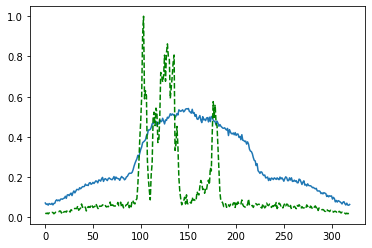

Time taken for epoch:  161.4887466430664
Epoch = [139/3000]  Iter = [   0/39480]  Loss = 0.15 Avg Loss = 0.15  Time = 0.0795s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [139/3000]  Iter = [ 100/39480]  Loss = 0.1455 Avg Loss = 0.1522  Time = 0.0036s
Epoch = [139/3000]  Iter = [ 200/39480]  Loss = 0.1639 Avg Loss = 0.154  Time = 0.0038s
Epoch = [139/3000]  Iter = [ 300/39480]  Loss = 0.1487 Avg Loss = 0.1543  Time = 0.0037s
Epoch = [139/3000]  Iter = [ 400/39480]  Loss = 0.1433 Avg Loss = 0.1553  Time = 0.0038s
Epoch = [139/3000]  Iter = [ 500/39480]  Loss = 0.1435 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [139/3000]  Iter = [ 600/39480]  Loss = 0.1622 Avg Loss = 0.155  Time = 0.0036s
Epoch = [139/3000]  Iter = [ 700/39480]  Loss = 0.1905 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [139/3000]  Iter = [ 800/39480]  Loss = 0.1388 Avg Loss = 0.1553  Time = 0.0033s
Epoch = [139/3000]  Iter = [ 900/39480]  Loss = 0.1663 Avg Loss = 0.1564  Time = 0.0030s
Epoch = [139/3000]  Iter = [1000/39480]  Loss = 0.1288 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [139/3000]  Iter = [1100/39480]  Loss = 0.1458 Avg Loss = 0.1544  Time = 0.0037s
Epoch = [139/3000]  Ite

Epoch = [139/3000]  Iter = [9400/39480]  Loss = 0.1699 Avg Loss = 0.1559  Time = 0.0031s
Epoch = [139/3000]  Iter = [9500/39480]  Loss = 0.1707 Avg Loss = 0.1557  Time = 0.0033s
Epoch = [139/3000]  Iter = [9600/39480]  Loss = 0.1557 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [139/3000]  Iter = [9700/39480]  Loss = 0.1611 Avg Loss = 0.1578  Time = 0.0039s
Epoch = [139/3000]  Iter = [9800/39480]  Loss = 0.152 Avg Loss = 0.158  Time = 0.0039s
Epoch = [139/3000]  Iter = [9900/39480]  Loss = 0.149 Avg Loss = 0.1567  Time = 0.0039s
Epoch = [139/3000]  Iter = [10000/39480]  Loss = 0.1645 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [139/3000]  Iter = [10100/39480]  Loss = 0.1523 Avg Loss = 0.157  Time = 0.0037s
Epoch = [139/3000]  Iter = [10200/39480]  Loss = 0.181 Avg Loss = 0.157  Time = 0.0037s
Epoch = [139/3000]  Iter = [10300/39480]  Loss = 0.1674 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [139/3000]  Iter = [10400/39480]  Loss = 0.1558 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [139/3000]  It

Epoch = [139/3000]  Iter = [18600/39480]  Loss = 0.1856 Avg Loss = 0.1575  Time = 0.0040s
Epoch = [139/3000]  Iter = [18700/39480]  Loss = 0.1504 Avg Loss = 0.1569  Time = 0.0040s
Epoch = [139/3000]  Iter = [18800/39480]  Loss = 0.1634 Avg Loss = 0.156  Time = 0.0038s
Epoch = [139/3000]  Iter = [18900/39480]  Loss = 0.1605 Avg Loss = 0.1567  Time = 0.0041s
Epoch = [139/3000]  Iter = [19000/39480]  Loss = 0.1593 Avg Loss = 0.1569  Time = 0.0040s
Epoch = [139/3000]  Iter = [19100/39480]  Loss = 0.1737 Avg Loss = 0.1579  Time = 0.0041s
Epoch = [139/3000]  Iter = [19200/39480]  Loss = 0.1522 Avg Loss = 0.1584  Time = 0.0040s
Epoch = [139/3000]  Iter = [19300/39480]  Loss = 0.1467 Avg Loss = 0.157  Time = 0.0039s
Epoch = [139/3000]  Iter = [19400/39480]  Loss = 0.1553 Avg Loss = 0.1566  Time = 0.0040s
Epoch = [139/3000]  Iter = [19500/39480]  Loss = 0.1845 Avg Loss = 0.1569  Time = 0.0041s
Epoch = [139/3000]  Iter = [19600/39480]  Loss = 0.1589 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [139

Epoch = [139/3000]  Iter = [27800/39480]  Loss = 0.1722 Avg Loss = 0.1556  Time = 0.0039s
Epoch = [139/3000]  Iter = [27900/39480]  Loss = 0.1866 Avg Loss = 0.1555  Time = 0.0039s
Epoch = [139/3000]  Iter = [28000/39480]  Loss = 0.1802 Avg Loss = 0.1563  Time = 0.0038s
Epoch = [139/3000]  Iter = [28100/39480]  Loss = 0.1352 Avg Loss = 0.1571  Time = 0.0038s
Epoch = [139/3000]  Iter = [28200/39480]  Loss = 0.1515 Avg Loss = 0.1566  Time = 0.0040s
Epoch = [139/3000]  Iter = [28300/39480]  Loss = 0.1451 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [139/3000]  Iter = [28400/39480]  Loss = 0.1464 Avg Loss = 0.1574  Time = 0.0039s
Epoch = [139/3000]  Iter = [28500/39480]  Loss = 0.1561 Avg Loss = 0.1567  Time = 0.0033s
Epoch = [139/3000]  Iter = [28600/39480]  Loss = 0.1872 Avg Loss = 0.1585  Time = 0.0031s
Epoch = [139/3000]  Iter = [28700/39480]  Loss = 0.1682 Avg Loss = 0.1582  Time = 0.0031s
Epoch = [139/3000]  Iter = [28800/39480]  Loss = 0.1409 Avg Loss = 0.1578  Time = 0.0030s
Epoch = [1

Epoch = [139/3000]  Iter = [37000/39480]  Loss = 0.1949 Avg Loss = 0.1578  Time = 0.0033s
Epoch = [139/3000]  Iter = [37100/39480]  Loss = 0.1819 Avg Loss = 0.1588  Time = 0.0037s
Epoch = [139/3000]  Iter = [37200/39480]  Loss = 0.1788 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [139/3000]  Iter = [37300/39480]  Loss = 0.1704 Avg Loss = 0.158  Time = 0.0038s
Epoch = [139/3000]  Iter = [37400/39480]  Loss = 0.165 Avg Loss = 0.1563  Time = 0.0034s
Epoch = [139/3000]  Iter = [37500/39480]  Loss = 0.1434 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [139/3000]  Iter = [37600/39480]  Loss = 0.1522 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [139/3000]  Iter = [37700/39480]  Loss = 0.1516 Avg Loss = 0.1557  Time = 0.0032s
Epoch = [139/3000]  Iter = [37800/39480]  Loss = 0.1831 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [139/3000]  Iter = [37900/39480]  Loss = 0.1608 Avg Loss = 0.1553  Time = 0.0035s
Epoch = [139/3000]  Iter = [38000/39480]  Loss = 0.1669 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [139

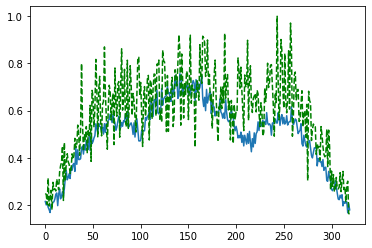

Time taken for epoch:  160.77992725372314
Epoch = [140/3000]  Iter = [   0/39480]  Loss = 0.154 Avg Loss = 0.154  Time = 0.0659s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [140/3000]  Iter = [ 100/39480]  Loss = 0.1508 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [140/3000]  Iter = [ 200/39480]  Loss = 0.1607 Avg Loss = 0.156  Time = 0.0037s
Epoch = [140/3000]  Iter = [ 300/39480]  Loss = 0.1501 Avg Loss = 0.1552  Time = 0.0038s
Epoch = [140/3000]  Iter = [ 400/39480]  Loss = 0.1331 Avg Loss = 0.1547  Time = 0.0038s
Epoch = [140/3000]  Iter = [ 500/39480]  Loss = 0.1633 Avg Loss = 0.1543  Time = 0.0037s
Epoch = [140/3000]  Iter = [ 600/39480]  Loss = 0.1437 Avg Loss = 0.1563  Time = 0.0038s
Epoch = [140/3000]  Iter = [ 700/39480]  Loss = 0.1625 Avg Loss = 0.156  Time = 0.0038s
Epoch = [140/3000]  Iter = [ 800/39480]  Loss = 0.1502 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [140/3000]  Iter = [ 900/39480]  Loss = 0.17 Avg Loss = 0.1562  Time = 0.0038s
Epoch = [140/3000]  Iter = [1000/39480]  Loss = 0.1571 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [140/3000]  Iter = [1100/39480]  Loss = 0.1798 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [140/3000]  Iter 

Epoch = [140/3000]  Iter = [9400/39480]  Loss = 0.1691 Avg Loss = 0.1541  Time = 0.0036s
Epoch = [140/3000]  Iter = [9500/39480]  Loss = 0.1539 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [140/3000]  Iter = [9600/39480]  Loss = 0.1409 Avg Loss = 0.1552  Time = 0.0036s
Epoch = [140/3000]  Iter = [9700/39480]  Loss = 0.1282 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [140/3000]  Iter = [9800/39480]  Loss = 0.1562 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [140/3000]  Iter = [9900/39480]  Loss = 0.1457 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [140/3000]  Iter = [10000/39480]  Loss = 0.1347 Avg Loss = 0.155  Time = 0.0035s
Epoch = [140/3000]  Iter = [10100/39480]  Loss = 0.1537 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [140/3000]  Iter = [10200/39480]  Loss = 0.1456 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [140/3000]  Iter = [10300/39480]  Loss = 0.1854 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [140/3000]  Iter = [10400/39480]  Loss = 0.1636 Avg Loss = 0.1557  Time = 0.0035s
Epoch = [140/3000

Epoch = [140/3000]  Iter = [18600/39480]  Loss = 0.1858 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [140/3000]  Iter = [18700/39480]  Loss = 0.1764 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [140/3000]  Iter = [18800/39480]  Loss = 0.1382 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [140/3000]  Iter = [18900/39480]  Loss = 0.1509 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [140/3000]  Iter = [19000/39480]  Loss = 0.1635 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [140/3000]  Iter = [19100/39480]  Loss = 0.1373 Avg Loss = 0.1568  Time = 0.0038s
Epoch = [140/3000]  Iter = [19200/39480]  Loss = 0.1432 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [140/3000]  Iter = [19300/39480]  Loss = 0.1623 Avg Loss = 0.1583  Time = 0.0033s
Epoch = [140/3000]  Iter = [19400/39480]  Loss = 0.1618 Avg Loss = 0.1573  Time = 0.0040s
Epoch = [140/3000]  Iter = [19500/39480]  Loss = 0.154 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [140/3000]  Iter = [19600/39480]  Loss = 0.1586 Avg Loss = 0.157  Time = 0.0039s
Epoch = [140

Epoch = [140/3000]  Iter = [27800/39480]  Loss = 0.1362 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [140/3000]  Iter = [27900/39480]  Loss = 0.1802 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [140/3000]  Iter = [28000/39480]  Loss = 0.1498 Avg Loss = 0.1596  Time = 0.0037s
Epoch = [140/3000]  Iter = [28100/39480]  Loss = 0.1637 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [140/3000]  Iter = [28200/39480]  Loss = 0.16 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [140/3000]  Iter = [28300/39480]  Loss = 0.1618 Avg Loss = 0.1572  Time = 0.0034s
Epoch = [140/3000]  Iter = [28400/39480]  Loss = 0.1558 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [140/3000]  Iter = [28500/39480]  Loss = 0.1723 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [140/3000]  Iter = [28600/39480]  Loss = 0.148 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [140/3000]  Iter = [28700/39480]  Loss = 0.1411 Avg Loss = 0.1564  Time = 0.0033s
Epoch = [140/3000]  Iter = [28800/39480]  Loss = 0.1689 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [140/

Epoch = [140/3000]  Iter = [37000/39480]  Loss = 0.1594 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [140/3000]  Iter = [37100/39480]  Loss = 0.1516 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [140/3000]  Iter = [37200/39480]  Loss = 0.1546 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [140/3000]  Iter = [37300/39480]  Loss = 0.1583 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [140/3000]  Iter = [37400/39480]  Loss = 0.1562 Avg Loss = 0.1554  Time = 0.0033s
Epoch = [140/3000]  Iter = [37500/39480]  Loss = 0.1518 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [140/3000]  Iter = [37600/39480]  Loss = 0.1562 Avg Loss = 0.1556  Time = 0.0039s
Epoch = [140/3000]  Iter = [37700/39480]  Loss = 0.1451 Avg Loss = 0.1586  Time = 0.0036s
Epoch = [140/3000]  Iter = [37800/39480]  Loss = 0.1584 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [140/3000]  Iter = [37900/39480]  Loss = 0.1818 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [140/3000]  Iter = [38000/39480]  Loss = 0.1577 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [1

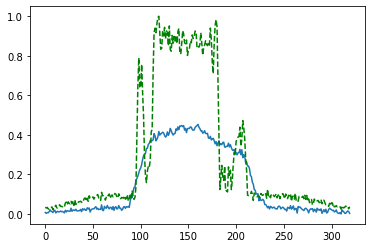

Time taken for epoch:  158.54268550872803
Epoch = [141/3000]  Iter = [   0/39480]  Loss = 0.1421 Avg Loss = 0.1421  Time = 0.0650s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [141/3000]  Iter = [ 100/39480]  Loss = 0.1732 Avg Loss = 0.1504  Time = 0.0037s
Epoch = [141/3000]  Iter = [ 200/39480]  Loss = 0.1682 Avg Loss = 0.1526  Time = 0.0035s
Epoch = [141/3000]  Iter = [ 300/39480]  Loss = 0.1608 Avg Loss = 0.1545  Time = 0.0037s
Epoch = [141/3000]  Iter = [ 400/39480]  Loss = 0.1521 Avg Loss = 0.1543  Time = 0.0037s
Epoch = [141/3000]  Iter = [ 500/39480]  Loss = 0.1593 Avg Loss = 0.154  Time = 0.0036s
Epoch = [141/3000]  Iter = [ 600/39480]  Loss = 0.1679 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [141/3000]  Iter = [ 700/39480]  Loss = 0.1691 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [141/3000]  Iter = [ 800/39480]  Loss = 0.1647 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [141/3000]  Iter = [ 900/39480]  Loss = 0.1541 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [141/3000]  Iter = [1000/39480]  Loss = 0.1454 Avg Loss = 0.1548  Time = 0.0036s
Epoch = [141/3000]  Iter = [1100/39480]  Loss = 0.1426 Avg Loss = 0.1527  Time = 0.0036s
Epoch = [141/3000]  It

Epoch = [141/3000]  Iter = [9400/39480]  Loss = 0.1622 Avg Loss = 0.158  Time = 0.0036s
Epoch = [141/3000]  Iter = [9500/39480]  Loss = 0.1487 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [141/3000]  Iter = [9600/39480]  Loss = 0.1898 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [141/3000]  Iter = [9700/39480]  Loss = 0.1587 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [141/3000]  Iter = [9800/39480]  Loss = 0.1894 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [141/3000]  Iter = [9900/39480]  Loss = 0.137 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [141/3000]  Iter = [10000/39480]  Loss = 0.1719 Avg Loss = 0.1572  Time = 0.0031s
Epoch = [141/3000]  Iter = [10100/39480]  Loss = 0.1463 Avg Loss = 0.1587  Time = 0.0036s
Epoch = [141/3000]  Iter = [10200/39480]  Loss = 0.1595 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [141/3000]  Iter = [10300/39480]  Loss = 0.1553 Avg Loss = 0.1552  Time = 0.0032s
Epoch = [141/3000]  Iter = [10400/39480]  Loss = 0.1559 Avg Loss = 0.1548  Time = 0.0036s
Epoch = [141/3000]

Epoch = [141/3000]  Iter = [18600/39480]  Loss = 0.1395 Avg Loss = 0.1565  Time = 0.0033s
Epoch = [141/3000]  Iter = [18700/39480]  Loss = 0.1711 Avg Loss = 0.1567  Time = 0.0039s
Epoch = [141/3000]  Iter = [18800/39480]  Loss = 0.152 Avg Loss = 0.1578  Time = 0.0040s
Epoch = [141/3000]  Iter = [18900/39480]  Loss = 0.1502 Avg Loss = 0.1567  Time = 0.0041s
Epoch = [141/3000]  Iter = [19000/39480]  Loss = 0.157 Avg Loss = 0.1572  Time = 0.0041s
Epoch = [141/3000]  Iter = [19100/39480]  Loss = 0.1433 Avg Loss = 0.1572  Time = 0.0041s
Epoch = [141/3000]  Iter = [19200/39480]  Loss = 0.1432 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [141/3000]  Iter = [19300/39480]  Loss = 0.1382 Avg Loss = 0.1559  Time = 0.0052s
Epoch = [141/3000]  Iter = [19400/39480]  Loss = 0.1318 Avg Loss = 0.1557  Time = 0.0052s
Epoch = [141/3000]  Iter = [19500/39480]  Loss = 0.1519 Avg Loss = 0.1554  Time = 0.0035s
Epoch = [141/3000]  Iter = [19600/39480]  Loss = 0.1548 Avg Loss = 0.1553  Time = 0.0031s
Epoch = [141

Epoch = [141/3000]  Iter = [27800/39480]  Loss = 0.1853 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [141/3000]  Iter = [27900/39480]  Loss = 0.1589 Avg Loss = 0.1577  Time = 0.0033s
Epoch = [141/3000]  Iter = [28000/39480]  Loss = 0.1323 Avg Loss = 0.156  Time = 0.0036s
Epoch = [141/3000]  Iter = [28100/39480]  Loss = 0.1504 Avg Loss = 0.1554  Time = 0.0032s
Epoch = [141/3000]  Iter = [28200/39480]  Loss = 0.175 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [141/3000]  Iter = [28300/39480]  Loss = 0.1842 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [141/3000]  Iter = [28400/39480]  Loss = 0.1726 Avg Loss = 0.1559  Time = 0.0032s
Epoch = [141/3000]  Iter = [28500/39480]  Loss = 0.1616 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [141/3000]  Iter = [28600/39480]  Loss = 0.1324 Avg Loss = 0.157  Time = 0.0036s
Epoch = [141/3000]  Iter = [28700/39480]  Loss = 0.1549 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [141/3000]  Iter = [28800/39480]  Loss = 0.1817 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [141/

Epoch = [141/3000]  Iter = [37000/39480]  Loss = 0.1445 Avg Loss = 0.1578  Time = 0.0032s
Epoch = [141/3000]  Iter = [37100/39480]  Loss = 0.1512 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [141/3000]  Iter = [37200/39480]  Loss = 0.1827 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [141/3000]  Iter = [37300/39480]  Loss = 0.1381 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [141/3000]  Iter = [37400/39480]  Loss = 0.1561 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [141/3000]  Iter = [37500/39480]  Loss = 0.1822 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [141/3000]  Iter = [37600/39480]  Loss = 0.1203 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [141/3000]  Iter = [37700/39480]  Loss = 0.1445 Avg Loss = 0.1579  Time = 0.0033s
Epoch = [141/3000]  Iter = [37800/39480]  Loss = 0.165 Avg Loss = 0.1594  Time = 0.0037s
Epoch = [141/3000]  Iter = [37900/39480]  Loss = 0.1711 Avg Loss = 0.1581  Time = 0.0035s
Epoch = [141/3000]  Iter = [38000/39480]  Loss = 0.1565 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [14

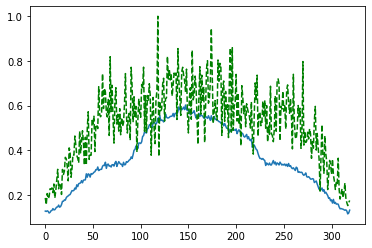

Time taken for epoch:  158.9595708847046
Epoch = [142/3000]  Iter = [   0/39480]  Loss = 0.1413 Avg Loss = 0.1413  Time = 0.0916s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [142/3000]  Iter = [ 100/39480]  Loss = 0.1753 Avg Loss = 0.1504  Time = 0.0038s
Epoch = [142/3000]  Iter = [ 200/39480]  Loss = 0.1733 Avg Loss = 0.1532  Time = 0.0040s
Epoch = [142/3000]  Iter = [ 300/39480]  Loss = 0.1729 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [142/3000]  Iter = [ 400/39480]  Loss = 0.1561 Avg Loss = 0.1526  Time = 0.0039s
Epoch = [142/3000]  Iter = [ 500/39480]  Loss = 0.1662 Avg Loss = 0.1557  Time = 0.0039s
Epoch = [142/3000]  Iter = [ 600/39480]  Loss = 0.1531 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [142/3000]  Iter = [ 700/39480]  Loss = 0.1449 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [142/3000]  Iter = [ 800/39480]  Loss = 0.1508 Avg Loss = 0.1563  Time = 0.0039s
Epoch = [142/3000]  Iter = [ 900/39480]  Loss = 0.1572 Avg Loss = 0.1559  Time = 0.0039s
Epoch = [142/3000]  Iter = [1000/39480]  Loss = 0.1508 Avg Loss = 0.1565  Time = 0.0039s
Epoch = [142/3000]  Iter = [1100/39480]  Loss = 0.1544 Avg Loss = 0.154  Time = 0.0039s
Epoch = [142/3000]  It

Epoch = [142/3000]  Iter = [9400/39480]  Loss = 0.1422 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [142/3000]  Iter = [9500/39480]  Loss = 0.1697 Avg Loss = 0.1559  Time = 0.0041s
Epoch = [142/3000]  Iter = [9600/39480]  Loss = 0.1716 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [142/3000]  Iter = [9700/39480]  Loss = 0.1434 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [142/3000]  Iter = [9800/39480]  Loss = 0.1856 Avg Loss = 0.1594  Time = 0.0036s
Epoch = [142/3000]  Iter = [9900/39480]  Loss = 0.1718 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [142/3000]  Iter = [10000/39480]  Loss = 0.1589 Avg Loss = 0.1559  Time = 0.0038s
Epoch = [142/3000]  Iter = [10100/39480]  Loss = 0.1315 Avg Loss = 0.156  Time = 0.0037s
Epoch = [142/3000]  Iter = [10200/39480]  Loss = 0.1552 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [142/3000]  Iter = [10300/39480]  Loss = 0.1491 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [142/3000]  Iter = [10400/39480]  Loss = 0.1551 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [142/3000

Epoch = [142/3000]  Iter = [18600/39480]  Loss = 0.1539 Avg Loss = 0.1547  Time = 0.0037s
Epoch = [142/3000]  Iter = [18700/39480]  Loss = 0.1318 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [142/3000]  Iter = [18800/39480]  Loss = 0.1601 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [142/3000]  Iter = [18900/39480]  Loss = 0.1823 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [142/3000]  Iter = [19000/39480]  Loss = 0.1417 Avg Loss = 0.1593  Time = 0.0037s
Epoch = [142/3000]  Iter = [19100/39480]  Loss = 0.1937 Avg Loss = 0.1574  Time = 0.0035s
Epoch = [142/3000]  Iter = [19200/39480]  Loss = 0.1466 Avg Loss = 0.156  Time = 0.0035s
Epoch = [142/3000]  Iter = [19300/39480]  Loss = 0.1524 Avg Loss = 0.1547  Time = 0.0037s
Epoch = [142/3000]  Iter = [19400/39480]  Loss = 0.1654 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [142/3000]  Iter = [19500/39480]  Loss = 0.1483 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [142/3000]  Iter = [19600/39480]  Loss = 0.1573 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [14

Epoch = [142/3000]  Iter = [27800/39480]  Loss = 0.1324 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [142/3000]  Iter = [27900/39480]  Loss = 0.1571 Avg Loss = 0.157  Time = 0.0038s
Epoch = [142/3000]  Iter = [28000/39480]  Loss = 0.1203 Avg Loss = 0.1573  Time = 0.0039s
Epoch = [142/3000]  Iter = [28100/39480]  Loss = 0.1491 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [142/3000]  Iter = [28200/39480]  Loss = 0.148 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [142/3000]  Iter = [28300/39480]  Loss = 0.1447 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [142/3000]  Iter = [28400/39480]  Loss = 0.1457 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [142/3000]  Iter = [28500/39480]  Loss = 0.1462 Avg Loss = 0.159  Time = 0.0036s
Epoch = [142/3000]  Iter = [28600/39480]  Loss = 0.1788 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [142/3000]  Iter = [28700/39480]  Loss = 0.1405 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [142/3000]  Iter = [28800/39480]  Loss = 0.1416 Avg Loss = 0.156  Time = 0.0037s
Epoch = [142/3

Epoch = [142/3000]  Iter = [37000/39480]  Loss = 0.1671 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [142/3000]  Iter = [37100/39480]  Loss = 0.1463 Avg Loss = 0.1562  Time = 0.0032s
Epoch = [142/3000]  Iter = [37200/39480]  Loss = 0.1562 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [142/3000]  Iter = [37300/39480]  Loss = 0.1443 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [142/3000]  Iter = [37400/39480]  Loss = 0.1696 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [142/3000]  Iter = [37500/39480]  Loss = 0.1598 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [142/3000]  Iter = [37600/39480]  Loss = 0.1613 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [142/3000]  Iter = [37700/39480]  Loss = 0.1505 Avg Loss = 0.1544  Time = 0.0037s
Epoch = [142/3000]  Iter = [37800/39480]  Loss = 0.1487 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [142/3000]  Iter = [37900/39480]  Loss = 0.1456 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [142/3000]  Iter = [38000/39480]  Loss = 0.1454 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [1

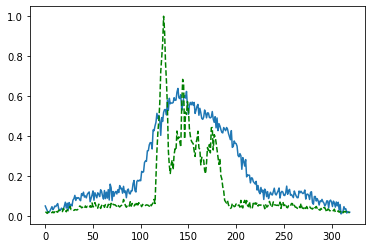

Time taken for epoch:  163.45325803756714
Epoch = [143/3000]  Iter = [   0/39480]  Loss = 0.156 Avg Loss = 0.156  Time = 0.0995s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [143/3000]  Iter = [ 100/39480]  Loss = 0.1605 Avg Loss = 0.1566  Time = 0.0038s
Epoch = [143/3000]  Iter = [ 200/39480]  Loss = 0.1557 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [143/3000]  Iter = [ 300/39480]  Loss = 0.1449 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [143/3000]  Iter = [ 400/39480]  Loss = 0.1548 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [143/3000]  Iter = [ 500/39480]  Loss = 0.1465 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [143/3000]  Iter = [ 600/39480]  Loss = 0.1528 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [143/3000]  Iter = [ 700/39480]  Loss = 0.1275 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [143/3000]  Iter = [ 800/39480]  Loss = 0.1564 Avg Loss = 0.1562  Time = 0.0032s
Epoch = [143/3000]  Iter = [ 900/39480]  Loss = 0.1668 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [143/3000]  Iter = [1000/39480]  Loss = 0.1456 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [143/3000]  Iter = [1100/39480]  Loss = 0.1354 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [143/3000]  I

Epoch = [143/3000]  Iter = [9400/39480]  Loss = 0.1663 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [143/3000]  Iter = [9500/39480]  Loss = 0.1781 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [143/3000]  Iter = [9600/39480]  Loss = 0.144 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [143/3000]  Iter = [9700/39480]  Loss = 0.1538 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [143/3000]  Iter = [9800/39480]  Loss = 0.1556 Avg Loss = 0.1567  Time = 0.0034s
Epoch = [143/3000]  Iter = [9900/39480]  Loss = 0.1358 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [143/3000]  Iter = [10000/39480]  Loss = 0.171 Avg Loss = 0.1572  Time = 0.0062s
Epoch = [143/3000]  Iter = [10100/39480]  Loss = 0.1461 Avg Loss = 0.1587  Time = 0.0032s
Epoch = [143/3000]  Iter = [10200/39480]  Loss = 0.143 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [143/3000]  Iter = [10300/39480]  Loss = 0.1591 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [143/3000]  Iter = [10400/39480]  Loss = 0.1772 Avg Loss = 0.156  Time = 0.0036s
Epoch = [143/3000]  

Epoch = [143/3000]  Iter = [18600/39480]  Loss = 0.1547 Avg Loss = 0.1548  Time = 0.0035s
Epoch = [143/3000]  Iter = [18700/39480]  Loss = 0.1714 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [143/3000]  Iter = [18800/39480]  Loss = 0.1631 Avg Loss = 0.1581  Time = 0.0035s
Epoch = [143/3000]  Iter = [18900/39480]  Loss = 0.1518 Avg Loss = 0.1571  Time = 0.0034s
Epoch = [143/3000]  Iter = [19000/39480]  Loss = 0.1555 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [143/3000]  Iter = [19100/39480]  Loss = 0.1558 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [143/3000]  Iter = [19200/39480]  Loss = 0.1663 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [143/3000]  Iter = [19300/39480]  Loss = 0.1512 Avg Loss = 0.1551  Time = 0.0033s
Epoch = [143/3000]  Iter = [19400/39480]  Loss = 0.1269 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [143/3000]  Iter = [19500/39480]  Loss = 0.1653 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [143/3000]  Iter = [19600/39480]  Loss = 0.1635 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [1

Epoch = [143/3000]  Iter = [27800/39480]  Loss = 0.1435 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [143/3000]  Iter = [27900/39480]  Loss = 0.1713 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [143/3000]  Iter = [28000/39480]  Loss = 0.1586 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [143/3000]  Iter = [28100/39480]  Loss = 0.1586 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [143/3000]  Iter = [28200/39480]  Loss = 0.1613 Avg Loss = 0.1591  Time = 0.0036s
Epoch = [143/3000]  Iter = [28300/39480]  Loss = 0.1674 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [143/3000]  Iter = [28400/39480]  Loss = 0.1447 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [143/3000]  Iter = [28500/39480]  Loss = 0.1728 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [143/3000]  Iter = [28600/39480]  Loss = 0.1983 Avg Loss = 0.1576  Time = 0.0033s
Epoch = [143/3000]  Iter = [28700/39480]  Loss = 0.1587 Avg Loss = 0.157  Time = 0.0036s
Epoch = [143/3000]  Iter = [28800/39480]  Loss = 0.1451 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [14

Epoch = [143/3000]  Iter = [37000/39480]  Loss = 0.1475 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [143/3000]  Iter = [37100/39480]  Loss = 0.152 Avg Loss = 0.1558  Time = 0.0035s
Epoch = [143/3000]  Iter = [37200/39480]  Loss = 0.1357 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [143/3000]  Iter = [37300/39480]  Loss = 0.1515 Avg Loss = 0.1569  Time = 0.0038s
Epoch = [143/3000]  Iter = [37400/39480]  Loss = 0.1567 Avg Loss = 0.1568  Time = 0.0038s
Epoch = [143/3000]  Iter = [37500/39480]  Loss = 0.1667 Avg Loss = 0.1562  Time = 0.0038s
Epoch = [143/3000]  Iter = [37600/39480]  Loss = 0.1859 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [143/3000]  Iter = [37700/39480]  Loss = 0.1612 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [143/3000]  Iter = [37800/39480]  Loss = 0.1781 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [143/3000]  Iter = [37900/39480]  Loss = 0.1768 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [143/3000]  Iter = [38000/39480]  Loss = 0.152 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [143

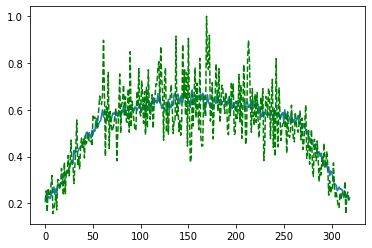

Time taken for epoch:  160.0767731666565
Epoch = [144/3000]  Iter = [   0/39480]  Loss = 0.1454 Avg Loss = 0.1454  Time = 0.0657s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [144/3000]  Iter = [ 100/39480]  Loss = 0.1588 Avg Loss = 0.1519  Time = 0.0038s
Epoch = [144/3000]  Iter = [ 200/39480]  Loss = 0.1493 Avg Loss = 0.1537  Time = 0.0037s
Epoch = [144/3000]  Iter = [ 300/39480]  Loss = 0.1594 Avg Loss = 0.1542  Time = 0.0037s
Epoch = [144/3000]  Iter = [ 400/39480]  Loss = 0.1476 Avg Loss = 0.1547  Time = 0.0036s
Epoch = [144/3000]  Iter = [ 500/39480]  Loss = 0.1587 Avg Loss = 0.157  Time = 0.0037s
Epoch = [144/3000]  Iter = [ 600/39480]  Loss = 0.163 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [144/3000]  Iter = [ 700/39480]  Loss = 0.1757 Avg Loss = 0.156  Time = 0.0037s
Epoch = [144/3000]  Iter = [ 800/39480]  Loss = 0.1561 Avg Loss = 0.1557  Time = 0.0033s
Epoch = [144/3000]  Iter = [ 900/39480]  Loss = 0.1376 Avg Loss = 0.1552  Time = 0.0032s
Epoch = [144/3000]  Iter = [1000/39480]  Loss = 0.1753 Avg Loss = 0.1577  Time = 0.0032s
Epoch = [144/3000]  Iter = [1100/39480]  Loss = 0.1741 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [144/3000]  Iter

Epoch = [144/3000]  Iter = [9400/39480]  Loss = 0.1528 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [144/3000]  Iter = [9500/39480]  Loss = 0.1547 Avg Loss = 0.1574  Time = 0.0034s
Epoch = [144/3000]  Iter = [9600/39480]  Loss = 0.1423 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [144/3000]  Iter = [9700/39480]  Loss = 0.1402 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [144/3000]  Iter = [9800/39480]  Loss = 0.1728 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [144/3000]  Iter = [9900/39480]  Loss = 0.1482 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [144/3000]  Iter = [10000/39480]  Loss = 0.1623 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [144/3000]  Iter = [10100/39480]  Loss = 0.1363 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [144/3000]  Iter = [10200/39480]  Loss = 0.1681 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [144/3000]  Iter = [10300/39480]  Loss = 0.1322 Avg Loss = 0.157  Time = 0.0040s
Epoch = [144/3000]  Iter = [10400/39480]  Loss = 0.1763 Avg Loss = 0.1561  Time = 0.0040s
Epoch = [144/3000

Epoch = [144/3000]  Iter = [18600/39480]  Loss = 0.1634 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [144/3000]  Iter = [18700/39480]  Loss = 0.1688 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [144/3000]  Iter = [18800/39480]  Loss = 0.1243 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [144/3000]  Iter = [18900/39480]  Loss = 0.1418 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [144/3000]  Iter = [19000/39480]  Loss = 0.1528 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [144/3000]  Iter = [19100/39480]  Loss = 0.1597 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [144/3000]  Iter = [19200/39480]  Loss = 0.1589 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [144/3000]  Iter = [19300/39480]  Loss = 0.1721 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [144/3000]  Iter = [19400/39480]  Loss = 0.1813 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [144/3000]  Iter = [19500/39480]  Loss = 0.1664 Avg Loss = 0.1582  Time = 0.0033s
Epoch = [144/3000]  Iter = [19600/39480]  Loss = 0.1655 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [1

Epoch = [144/3000]  Iter = [27800/39480]  Loss = 0.174 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [144/3000]  Iter = [27900/39480]  Loss = 0.1588 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [144/3000]  Iter = [28000/39480]  Loss = 0.1595 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [144/3000]  Iter = [28100/39480]  Loss = 0.1694 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [144/3000]  Iter = [28200/39480]  Loss = 0.1573 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [144/3000]  Iter = [28300/39480]  Loss = 0.1604 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [144/3000]  Iter = [28400/39480]  Loss = 0.1548 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [144/3000]  Iter = [28500/39480]  Loss = 0.1359 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [144/3000]  Iter = [28600/39480]  Loss = 0.1606 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [144/3000]  Iter = [28700/39480]  Loss = 0.1492 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [144/3000]  Iter = [28800/39480]  Loss = 0.1704 Avg Loss = 0.1595  Time = 0.0033s
Epoch = [14

Epoch = [144/3000]  Iter = [37000/39480]  Loss = 0.1625 Avg Loss = 0.158  Time = 0.0029s
Epoch = [144/3000]  Iter = [37100/39480]  Loss = 0.1552 Avg Loss = 0.1574  Time = 0.0031s
Epoch = [144/3000]  Iter = [37200/39480]  Loss = 0.1485 Avg Loss = 0.1573  Time = 0.0031s
Epoch = [144/3000]  Iter = [37300/39480]  Loss = 0.1596 Avg Loss = 0.1569  Time = 0.0029s
Epoch = [144/3000]  Iter = [37400/39480]  Loss = 0.1743 Avg Loss = 0.1558  Time = 0.0031s
Epoch = [144/3000]  Iter = [37500/39480]  Loss = 0.1351 Avg Loss = 0.156  Time = 0.0031s
Epoch = [144/3000]  Iter = [37600/39480]  Loss = 0.145 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [144/3000]  Iter = [37700/39480]  Loss = 0.1517 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [144/3000]  Iter = [37800/39480]  Loss = 0.1531 Avg Loss = 0.1573  Time = 0.0032s
Epoch = [144/3000]  Iter = [37900/39480]  Loss = 0.1401 Avg Loss = 0.1561  Time = 0.0032s
Epoch = [144/3000]  Iter = [38000/39480]  Loss = 0.1542 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [144/

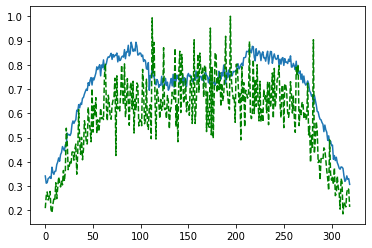

Time taken for epoch:  159.39071035385132
Epoch = [145/3000]  Iter = [   0/39480]  Loss = 0.1606 Avg Loss = 0.1606  Time = 0.0871s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [145/3000]  Iter = [ 100/39480]  Loss = 0.1406 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [145/3000]  Iter = [ 200/39480]  Loss = 0.1444 Avg Loss = 0.156  Time = 0.0038s
Epoch = [145/3000]  Iter = [ 300/39480]  Loss = 0.1828 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [145/3000]  Iter = [ 400/39480]  Loss = 0.154 Avg Loss = 0.156  Time = 0.0043s
Epoch = [145/3000]  Iter = [ 500/39480]  Loss = 0.1515 Avg Loss = 0.1554  Time = 0.0040s
Epoch = [145/3000]  Iter = [ 600/39480]  Loss = 0.1535 Avg Loss = 0.1543  Time = 0.0036s
Epoch = [145/3000]  Iter = [ 700/39480]  Loss = 0.1378 Avg Loss = 0.1554  Time = 0.0035s
Epoch = [145/3000]  Iter = [ 800/39480]  Loss = 0.1407 Avg Loss = 0.155  Time = 0.0033s
Epoch = [145/3000]  Iter = [ 900/39480]  Loss = 0.1627 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [145/3000]  Iter = [1000/39480]  Loss = 0.1444 Avg Loss = 0.1563  Time = 0.0040s
Epoch = [145/3000]  Iter = [1100/39480]  Loss = 0.169 Avg Loss = 0.1549  Time = 0.0038s
Epoch = [145/3000]  Iter =

Epoch = [145/3000]  Iter = [9400/39480]  Loss = 0.1811 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [145/3000]  Iter = [9500/39480]  Loss = 0.1529 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [145/3000]  Iter = [9600/39480]  Loss = 0.1338 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [145/3000]  Iter = [9700/39480]  Loss = 0.168 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [145/3000]  Iter = [9800/39480]  Loss = 0.1589 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [145/3000]  Iter = [9900/39480]  Loss = 0.1438 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [145/3000]  Iter = [10000/39480]  Loss = 0.1663 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [145/3000]  Iter = [10100/39480]  Loss = 0.1682 Avg Loss = 0.1561  Time = 0.0032s
Epoch = [145/3000]  Iter = [10200/39480]  Loss = 0.1441 Avg Loss = 0.1548  Time = 0.0032s
Epoch = [145/3000]  Iter = [10300/39480]  Loss = 0.1622 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [145/3000]  Iter = [10400/39480]  Loss = 0.1442 Avg Loss = 0.1581  Time = 0.0034s
Epoch = [145/3000

Epoch = [145/3000]  Iter = [18600/39480]  Loss = 0.1903 Avg Loss = 0.1571  Time = 0.0040s
Epoch = [145/3000]  Iter = [18700/39480]  Loss = 0.1304 Avg Loss = 0.157  Time = 0.0039s
Epoch = [145/3000]  Iter = [18800/39480]  Loss = 0.1475 Avg Loss = 0.157  Time = 0.0040s
Epoch = [145/3000]  Iter = [18900/39480]  Loss = 0.1731 Avg Loss = 0.158  Time = 0.0039s
Epoch = [145/3000]  Iter = [19000/39480]  Loss = 0.1489 Avg Loss = 0.1574  Time = 0.0039s
Epoch = [145/3000]  Iter = [19100/39480]  Loss = 0.1676 Avg Loss = 0.1562  Time = 0.0039s
Epoch = [145/3000]  Iter = [19200/39480]  Loss = 0.1783 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [145/3000]  Iter = [19300/39480]  Loss = 0.1638 Avg Loss = 0.1593  Time = 0.0037s
Epoch = [145/3000]  Iter = [19400/39480]  Loss = 0.1764 Avg Loss = 0.1595  Time = 0.0037s
Epoch = [145/3000]  Iter = [19500/39480]  Loss = 0.1549 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [145/3000]  Iter = [19600/39480]  Loss = 0.159 Avg Loss = 0.157  Time = 0.0037s
Epoch = [145/30

Epoch = [145/3000]  Iter = [27800/39480]  Loss = 0.1378 Avg Loss = 0.1551  Time = 0.0035s
Epoch = [145/3000]  Iter = [27900/39480]  Loss = 0.1675 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [145/3000]  Iter = [28000/39480]  Loss = 0.1603 Avg Loss = 0.1587  Time = 0.0037s
Epoch = [145/3000]  Iter = [28100/39480]  Loss = 0.1599 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [145/3000]  Iter = [28200/39480]  Loss = 0.17 Avg Loss = 0.1581  Time = 0.0053s
Epoch = [145/3000]  Iter = [28300/39480]  Loss = 0.1522 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [145/3000]  Iter = [28400/39480]  Loss = 0.149 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [145/3000]  Iter = [28500/39480]  Loss = 0.1609 Avg Loss = 0.1555  Time = 0.0035s
Epoch = [145/3000]  Iter = [28600/39480]  Loss = 0.1375 Avg Loss = 0.1563  Time = 0.0038s
Epoch = [145/3000]  Iter = [28700/39480]  Loss = 0.1813 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [145/3000]  Iter = [28800/39480]  Loss = 0.1461 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [145/

Epoch = [145/3000]  Iter = [37000/39480]  Loss = 0.1594 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [145/3000]  Iter = [37100/39480]  Loss = 0.1711 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [145/3000]  Iter = [37200/39480]  Loss = 0.1571 Avg Loss = 0.1566  Time = 0.0032s
Epoch = [145/3000]  Iter = [37300/39480]  Loss = 0.148 Avg Loss = 0.157  Time = 0.0037s
Epoch = [145/3000]  Iter = [37400/39480]  Loss = 0.1574 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [145/3000]  Iter = [37500/39480]  Loss = 0.1502 Avg Loss = 0.1542  Time = 0.0032s
Epoch = [145/3000]  Iter = [37600/39480]  Loss = 0.1586 Avg Loss = 0.1544  Time = 0.0037s
Epoch = [145/3000]  Iter = [37700/39480]  Loss = 0.1459 Avg Loss = 0.1556  Time = 0.0031s
Epoch = [145/3000]  Iter = [37800/39480]  Loss = 0.165 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [145/3000]  Iter = [37900/39480]  Loss = 0.1388 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [145/3000]  Iter = [38000/39480]  Loss = 0.1517 Avg Loss = 0.1567  Time = 0.0033s
Epoch = [145/

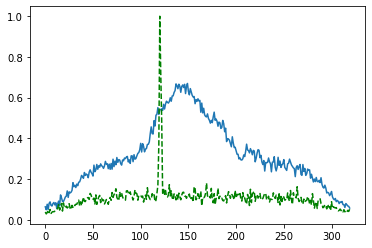

Time taken for epoch:  162.46770238876343
Epoch = [146/3000]  Iter = [   0/39480]  Loss = 0.1393 Avg Loss = 0.1393  Time = 0.0853s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [146/3000]  Iter = [ 100/39480]  Loss = 0.1582 Avg Loss = 0.1483  Time = 0.0037s
Epoch = [146/3000]  Iter = [ 200/39480]  Loss = 0.19 Avg Loss = 0.153  Time = 0.0035s
Epoch = [146/3000]  Iter = [ 300/39480]  Loss = 0.1476 Avg Loss = 0.1531  Time = 0.0036s
Epoch = [146/3000]  Iter = [ 400/39480]  Loss = 0.149 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [146/3000]  Iter = [ 500/39480]  Loss = 0.1522 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [146/3000]  Iter = [ 600/39480]  Loss = 0.1359 Avg Loss = 0.155  Time = 0.0036s
Epoch = [146/3000]  Iter = [ 700/39480]  Loss = 0.153 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [146/3000]  Iter = [ 800/39480]  Loss = 0.1723 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [146/3000]  Iter = [ 900/39480]  Loss = 0.1583 Avg Loss = 0.1541  Time = 0.0029s
Epoch = [146/3000]  Iter = [1000/39480]  Loss = 0.1633 Avg Loss = 0.1549  Time = 0.0030s
Epoch = [146/3000]  Iter = [1100/39480]  Loss = 0.1492 Avg Loss = 0.1577  Time = 0.0031s
Epoch = [146/3000]  Iter = 

Epoch = [146/3000]  Iter = [9400/39480]  Loss = 0.1529 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [146/3000]  Iter = [9500/39480]  Loss = 0.1589 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [146/3000]  Iter = [9600/39480]  Loss = 0.1655 Avg Loss = 0.157  Time = 0.0037s
Epoch = [146/3000]  Iter = [9700/39480]  Loss = 0.1684 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [146/3000]  Iter = [9800/39480]  Loss = 0.1608 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [146/3000]  Iter = [9900/39480]  Loss = 0.1344 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [146/3000]  Iter = [10000/39480]  Loss = 0.1751 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [146/3000]  Iter = [10100/39480]  Loss = 0.1711 Avg Loss = 0.156  Time = 0.0037s
Epoch = [146/3000]  Iter = [10200/39480]  Loss = 0.1225 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [146/3000]  Iter = [10300/39480]  Loss = 0.1449 Avg Loss = 0.1558  Time = 0.0038s
Epoch = [146/3000]  Iter = [10400/39480]  Loss = 0.1752 Avg Loss = 0.1564  Time = 0.0038s
Epoch = [146/3000]

Epoch = [146/3000]  Iter = [18600/39480]  Loss = 0.148 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [146/3000]  Iter = [18700/39480]  Loss = 0.1487 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [146/3000]  Iter = [18800/39480]  Loss = 0.1549 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [146/3000]  Iter = [18900/39480]  Loss = 0.1627 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [146/3000]  Iter = [19000/39480]  Loss = 0.168 Avg Loss = 0.1557  Time = 0.0035s
Epoch = [146/3000]  Iter = [19100/39480]  Loss = 0.1473 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [146/3000]  Iter = [19200/39480]  Loss = 0.1533 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [146/3000]  Iter = [19300/39480]  Loss = 0.1416 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [146/3000]  Iter = [19400/39480]  Loss = 0.1615 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [146/3000]  Iter = [19500/39480]  Loss = 0.177 Avg Loss = 0.1575  Time = 0.0038s
Epoch = [146/3000]  Iter = [19600/39480]  Loss = 0.1467 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [146/

Epoch = [146/3000]  Iter = [27800/39480]  Loss = 0.1671 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [146/3000]  Iter = [27900/39480]  Loss = 0.1433 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [146/3000]  Iter = [28000/39480]  Loss = 0.1771 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [146/3000]  Iter = [28100/39480]  Loss = 0.165 Avg Loss = 0.1558  Time = 0.0039s
Epoch = [146/3000]  Iter = [28200/39480]  Loss = 0.147 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [146/3000]  Iter = [28300/39480]  Loss = 0.1402 Avg Loss = 0.1573  Time = 0.0035s
Epoch = [146/3000]  Iter = [28400/39480]  Loss = 0.1544 Avg Loss = 0.157  Time = 0.0036s
Epoch = [146/3000]  Iter = [28500/39480]  Loss = 0.1873 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [146/3000]  Iter = [28600/39480]  Loss = 0.2052 Avg Loss = 0.1575  Time = 0.0040s
Epoch = [146/3000]  Iter = [28700/39480]  Loss = 0.1673 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [146/3000]  Iter = [28800/39480]  Loss = 0.1644 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [146/

Epoch = [146/3000]  Iter = [37000/39480]  Loss = 0.1708 Avg Loss = 0.156  Time = 0.0037s
Epoch = [146/3000]  Iter = [37100/39480]  Loss = 0.1617 Avg Loss = 0.1565  Time = 0.0034s
Epoch = [146/3000]  Iter = [37200/39480]  Loss = 0.134 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [146/3000]  Iter = [37300/39480]  Loss = 0.1614 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [146/3000]  Iter = [37400/39480]  Loss = 0.1506 Avg Loss = 0.157  Time = 0.0036s
Epoch = [146/3000]  Iter = [37500/39480]  Loss = 0.145 Avg Loss = 0.1548  Time = 0.0036s
Epoch = [146/3000]  Iter = [37600/39480]  Loss = 0.1509 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [146/3000]  Iter = [37700/39480]  Loss = 0.1779 Avg Loss = 0.1557  Time = 0.0035s
Epoch = [146/3000]  Iter = [37800/39480]  Loss = 0.1471 Avg Loss = 0.1564  Time = 0.0035s
Epoch = [146/3000]  Iter = [37900/39480]  Loss = 0.1626 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [146/3000]  Iter = [38000/39480]  Loss = 0.1478 Avg Loss = 0.1577  Time = 0.0040s
Epoch = [146/3

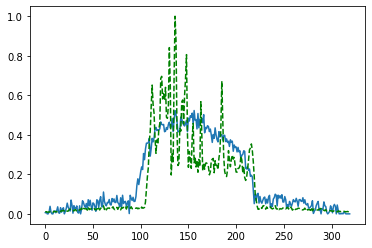

Time taken for epoch:  159.1614179611206
Epoch = [147/3000]  Iter = [   0/39480]  Loss = 0.1477 Avg Loss = 0.1477  Time = 0.1146s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [147/3000]  Iter = [ 100/39480]  Loss = 0.1622 Avg Loss = 0.1528  Time = 0.0036s
Epoch = [147/3000]  Iter = [ 200/39480]  Loss = 0.164 Avg Loss = 0.1539  Time = 0.0035s
Epoch = [147/3000]  Iter = [ 300/39480]  Loss = 0.174 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [147/3000]  Iter = [ 400/39480]  Loss = 0.1572 Avg Loss = 0.1552  Time = 0.0032s
Epoch = [147/3000]  Iter = [ 500/39480]  Loss = 0.1622 Avg Loss = 0.1557  Time = 0.0035s
Epoch = [147/3000]  Iter = [ 600/39480]  Loss = 0.1488 Avg Loss = 0.1554  Time = 0.0035s
Epoch = [147/3000]  Iter = [ 700/39480]  Loss = 0.1526 Avg Loss = 0.1567  Time = 0.0032s
Epoch = [147/3000]  Iter = [ 800/39480]  Loss = 0.1629 Avg Loss = 0.1562  Time = 0.0030s
Epoch = [147/3000]  Iter = [ 900/39480]  Loss = 0.1319 Avg Loss = 0.1544  Time = 0.0032s
Epoch = [147/3000]  Iter = [1000/39480]  Loss = 0.1434 Avg Loss = 0.1535  Time = 0.0032s
Epoch = [147/3000]  Iter = [1100/39480]  Loss = 0.1623 Avg Loss = 0.155  Time = 0.0032s
Epoch = [147/3000]  Iter

Epoch = [147/3000]  Iter = [9400/39480]  Loss = 0.1569 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [147/3000]  Iter = [9500/39480]  Loss = 0.1609 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [147/3000]  Iter = [9600/39480]  Loss = 0.1507 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [147/3000]  Iter = [9700/39480]  Loss = 0.1649 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [147/3000]  Iter = [9800/39480]  Loss = 0.1615 Avg Loss = 0.1569  Time = 0.0033s
Epoch = [147/3000]  Iter = [9900/39480]  Loss = 0.181 Avg Loss = 0.1572  Time = 0.0033s
Epoch = [147/3000]  Iter = [10000/39480]  Loss = 0.1613 Avg Loss = 0.1564  Time = 0.0032s
Epoch = [147/3000]  Iter = [10100/39480]  Loss = 0.1915 Avg Loss = 0.1563  Time = 0.0038s
Epoch = [147/3000]  Iter = [10200/39480]  Loss = 0.133 Avg Loss = 0.1555  Time = 0.0032s
Epoch = [147/3000]  Iter = [10300/39480]  Loss = 0.1414 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [147/3000]  Iter = [10400/39480]  Loss = 0.1651 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [147/3000]

Epoch = [147/3000]  Iter = [18600/39480]  Loss = 0.1411 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [147/3000]  Iter = [18700/39480]  Loss = 0.1562 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [147/3000]  Iter = [18800/39480]  Loss = 0.1514 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [147/3000]  Iter = [18900/39480]  Loss = 0.155 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [147/3000]  Iter = [19000/39480]  Loss = 0.1282 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [147/3000]  Iter = [19100/39480]  Loss = 0.1692 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [147/3000]  Iter = [19200/39480]  Loss = 0.1537 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [147/3000]  Iter = [19300/39480]  Loss = 0.1521 Avg Loss = 0.157  Time = 0.0032s
Epoch = [147/3000]  Iter = [19400/39480]  Loss = 0.1404 Avg Loss = 0.1592  Time = 0.0034s
Epoch = [147/3000]  Iter = [19500/39480]  Loss = 0.1411 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [147/3000]  Iter = [19600/39480]  Loss = 0.146 Avg Loss = 0.1571  Time = 0.0033s
Epoch = [147/

Epoch = [147/3000]  Iter = [27800/39480]  Loss = 0.1696 Avg Loss = 0.1564  Time = 0.0033s
Epoch = [147/3000]  Iter = [27900/39480]  Loss = 0.1395 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [147/3000]  Iter = [28000/39480]  Loss = 0.1669 Avg Loss = 0.1567  Time = 0.0034s
Epoch = [147/3000]  Iter = [28100/39480]  Loss = 0.1515 Avg Loss = 0.158  Time = 0.0035s
Epoch = [147/3000]  Iter = [28200/39480]  Loss = 0.137 Avg Loss = 0.157  Time = 0.0037s
Epoch = [147/3000]  Iter = [28300/39480]  Loss = 0.1947 Avg Loss = 0.157  Time = 0.0036s
Epoch = [147/3000]  Iter = [28400/39480]  Loss = 0.1524 Avg Loss = 0.1596  Time = 0.0036s
Epoch = [147/3000]  Iter = [28500/39480]  Loss = 0.1674 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [147/3000]  Iter = [28600/39480]  Loss = 0.138 Avg Loss = 0.1565  Time = 0.0033s
Epoch = [147/3000]  Iter = [28700/39480]  Loss = 0.1633 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [147/3000]  Iter = [28800/39480]  Loss = 0.1786 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [147/30

Epoch = [147/3000]  Iter = [37000/39480]  Loss = 0.1659 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [147/3000]  Iter = [37100/39480]  Loss = 0.169 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [147/3000]  Iter = [37200/39480]  Loss = 0.1626 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [147/3000]  Iter = [37300/39480]  Loss = 0.1385 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [147/3000]  Iter = [37400/39480]  Loss = 0.1393 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [147/3000]  Iter = [37500/39480]  Loss = 0.1601 Avg Loss = 0.1568  Time = 0.0034s
Epoch = [147/3000]  Iter = [37600/39480]  Loss = 0.1734 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [147/3000]  Iter = [37700/39480]  Loss = 0.1879 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [147/3000]  Iter = [37800/39480]  Loss = 0.1843 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [147/3000]  Iter = [37900/39480]  Loss = 0.1615 Avg Loss = 0.156  Time = 0.0034s
Epoch = [147/3000]  Iter = [38000/39480]  Loss = 0.1226 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [147

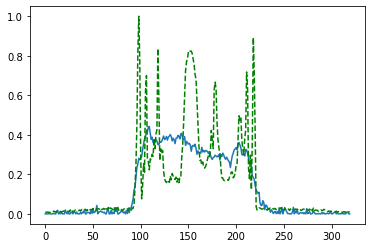

Time taken for epoch:  160.15584588050842
Epoch = [148/3000]  Iter = [   0/39480]  Loss = 0.1669 Avg Loss = 0.1669  Time = 0.0883s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [148/3000]  Iter = [ 100/39480]  Loss = 0.1574 Avg Loss = 0.1591  Time = 0.0033s
Epoch = [148/3000]  Iter = [ 200/39480]  Loss = 0.1632 Avg Loss = 0.1573  Time = 0.0032s
Epoch = [148/3000]  Iter = [ 300/39480]  Loss = 0.1324 Avg Loss = 0.1565  Time = 0.0029s
Epoch = [148/3000]  Iter = [ 400/39480]  Loss = 0.1605 Avg Loss = 0.1548  Time = 0.0026s
Epoch = [148/3000]  Iter = [ 500/39480]  Loss = 0.165 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [148/3000]  Iter = [ 600/39480]  Loss = 0.1535 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [148/3000]  Iter = [ 700/39480]  Loss = 0.1549 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [148/3000]  Iter = [ 800/39480]  Loss = 0.1548 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [148/3000]  Iter = [ 900/39480]  Loss = 0.1693 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [148/3000]  Iter = [1000/39480]  Loss = 0.1462 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [148/3000]  Iter = [1100/39480]  Loss = 0.1641 Avg Loss = 0.158  Time = 0.0036s
Epoch = [148/3000]  Ite

Epoch = [148/3000]  Iter = [9400/39480]  Loss = 0.1429 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [148/3000]  Iter = [9500/39480]  Loss = 0.1525 Avg Loss = 0.1555  Time = 0.0032s
Epoch = [148/3000]  Iter = [9600/39480]  Loss = 0.1568 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [148/3000]  Iter = [9700/39480]  Loss = 0.1595 Avg Loss = 0.159  Time = 0.0037s
Epoch = [148/3000]  Iter = [9800/39480]  Loss = 0.1553 Avg Loss = 0.1579  Time = 0.0038s
Epoch = [148/3000]  Iter = [9900/39480]  Loss = 0.1619 Avg Loss = 0.1562  Time = 0.0035s
Epoch = [148/3000]  Iter = [10000/39480]  Loss = 0.1749 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [148/3000]  Iter = [10100/39480]  Loss = 0.1414 Avg Loss = 0.1561  Time = 0.0038s
Epoch = [148/3000]  Iter = [10200/39480]  Loss = 0.1742 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [148/3000]  Iter = [10300/39480]  Loss = 0.1889 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [148/3000]  Iter = [10400/39480]  Loss = 0.1282 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [148/3000

Epoch = [148/3000]  Iter = [18600/39480]  Loss = 0.1778 Avg Loss = 0.158  Time = 0.0036s
Epoch = [148/3000]  Iter = [18700/39480]  Loss = 0.1615 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [148/3000]  Iter = [18800/39480]  Loss = 0.1565 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [148/3000]  Iter = [18900/39480]  Loss = 0.1475 Avg Loss = 0.1553  Time = 0.0035s
Epoch = [148/3000]  Iter = [19000/39480]  Loss = 0.1842 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [148/3000]  Iter = [19100/39480]  Loss = 0.1447 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [148/3000]  Iter = [19200/39480]  Loss = 0.1488 Avg Loss = 0.157  Time = 0.0036s
Epoch = [148/3000]  Iter = [19300/39480]  Loss = 0.1462 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [148/3000]  Iter = [19400/39480]  Loss = 0.1602 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [148/3000]  Iter = [19500/39480]  Loss = 0.15 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [148/3000]  Iter = [19600/39480]  Loss = 0.1765 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [148/3

Epoch = [148/3000]  Iter = [27800/39480]  Loss = 0.1448 Avg Loss = 0.157  Time = 0.0040s
Epoch = [148/3000]  Iter = [27900/39480]  Loss = 0.1359 Avg Loss = 0.157  Time = 0.0041s
Epoch = [148/3000]  Iter = [28000/39480]  Loss = 0.1508 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [148/3000]  Iter = [28100/39480]  Loss = 0.157 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [148/3000]  Iter = [28200/39480]  Loss = 0.1643 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [148/3000]  Iter = [28300/39480]  Loss = 0.1595 Avg Loss = 0.156  Time = 0.0034s
Epoch = [148/3000]  Iter = [28400/39480]  Loss = 0.145 Avg Loss = 0.1552  Time = 0.0036s
Epoch = [148/3000]  Iter = [28500/39480]  Loss = 0.1644 Avg Loss = 0.1566  Time = 0.0032s
Epoch = [148/3000]  Iter = [28600/39480]  Loss = 0.1421 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [148/3000]  Iter = [28700/39480]  Loss = 0.1873 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [148/3000]  Iter = [28800/39480]  Loss = 0.1464 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [148/30

Epoch = [148/3000]  Iter = [37000/39480]  Loss = 0.1417 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [148/3000]  Iter = [37100/39480]  Loss = 0.155 Avg Loss = 0.1547  Time = 0.0036s
Epoch = [148/3000]  Iter = [37200/39480]  Loss = 0.1512 Avg Loss = 0.156  Time = 0.0036s
Epoch = [148/3000]  Iter = [37300/39480]  Loss = 0.1531 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [148/3000]  Iter = [37400/39480]  Loss = 0.1791 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [148/3000]  Iter = [37500/39480]  Loss = 0.1437 Avg Loss = 0.158  Time = 0.0036s
Epoch = [148/3000]  Iter = [37600/39480]  Loss = 0.1594 Avg Loss = 0.1574  Time = 0.0034s
Epoch = [148/3000]  Iter = [37700/39480]  Loss = 0.1421 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [148/3000]  Iter = [37800/39480]  Loss = 0.1512 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [148/3000]  Iter = [37900/39480]  Loss = 0.1549 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [148/3000]  Iter = [38000/39480]  Loss = 0.1687 Avg Loss = 0.1574  Time = 0.0035s
Epoch = [148/

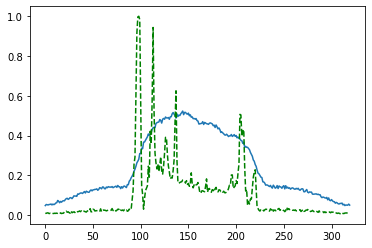

Time taken for epoch:  162.20410132408142
Epoch = [149/3000]  Iter = [   0/39480]  Loss = 0.1772 Avg Loss = 0.1772  Time = 0.0647s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [149/3000]  Iter = [ 100/39480]  Loss = 0.1494 Avg Loss = 0.1617  Time = 0.0038s
Epoch = [149/3000]  Iter = [ 200/39480]  Loss = 0.1422 Avg Loss = 0.1573  Time = 0.0038s
Epoch = [149/3000]  Iter = [ 300/39480]  Loss = 0.1392 Avg Loss = 0.157  Time = 0.0037s
Epoch = [149/3000]  Iter = [ 400/39480]  Loss = 0.1857 Avg Loss = 0.1574  Time = 0.0038s
Epoch = [149/3000]  Iter = [ 500/39480]  Loss = 0.1737 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [149/3000]  Iter = [ 600/39480]  Loss = 0.1846 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [149/3000]  Iter = [ 700/39480]  Loss = 0.1547 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [149/3000]  Iter = [ 800/39480]  Loss = 0.1665 Avg Loss = 0.155  Time = 0.0032s
Epoch = [149/3000]  Iter = [ 900/39480]  Loss = 0.1468 Avg Loss = 0.1552  Time = 0.0030s
Epoch = [149/3000]  Iter = [1000/39480]  Loss = 0.1326 Avg Loss = 0.1553  Time = 0.0031s
Epoch = [149/3000]  Iter = [1100/39480]  Loss = 0.1642 Avg Loss = 0.1567  Time = 0.0031s
Epoch = [149/3000]  Ite

Epoch = [149/3000]  Iter = [9400/39480]  Loss = 0.1758 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [149/3000]  Iter = [9500/39480]  Loss = 0.1509 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [149/3000]  Iter = [9600/39480]  Loss = 0.1352 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [149/3000]  Iter = [9700/39480]  Loss = 0.1561 Avg Loss = 0.1564  Time = 0.0038s
Epoch = [149/3000]  Iter = [9800/39480]  Loss = 0.1534 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [149/3000]  Iter = [9900/39480]  Loss = 0.1999 Avg Loss = 0.1544  Time = 0.0036s
Epoch = [149/3000]  Iter = [10000/39480]  Loss = 0.1542 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [149/3000]  Iter = [10100/39480]  Loss = 0.1506 Avg Loss = 0.1564  Time = 0.0035s
Epoch = [149/3000]  Iter = [10200/39480]  Loss = 0.1616 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [149/3000]  Iter = [10300/39480]  Loss = 0.1797 Avg Loss = 0.1554  Time = 0.0035s
Epoch = [149/3000]  Iter = [10400/39480]  Loss = 0.145 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [149/3000

Epoch = [149/3000]  Iter = [18600/39480]  Loss = 0.1688 Avg Loss = 0.1557  Time = 0.0030s
Epoch = [149/3000]  Iter = [18700/39480]  Loss = 0.1624 Avg Loss = 0.1542  Time = 0.0031s
Epoch = [149/3000]  Iter = [18800/39480]  Loss = 0.1644 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [149/3000]  Iter = [18900/39480]  Loss = 0.1653 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [149/3000]  Iter = [19000/39480]  Loss = 0.162 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [149/3000]  Iter = [19100/39480]  Loss = 0.1494 Avg Loss = 0.156  Time = 0.0037s
Epoch = [149/3000]  Iter = [19200/39480]  Loss = 0.1506 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [149/3000]  Iter = [19300/39480]  Loss = 0.1494 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [149/3000]  Iter = [19400/39480]  Loss = 0.1414 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [149/3000]  Iter = [19500/39480]  Loss = 0.1502 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [149/3000]  Iter = [19600/39480]  Loss = 0.1461 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [149

Epoch = [149/3000]  Iter = [27800/39480]  Loss = 0.158 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [149/3000]  Iter = [27900/39480]  Loss = 0.1564 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [149/3000]  Iter = [28000/39480]  Loss = 0.1616 Avg Loss = 0.157  Time = 0.0036s
Epoch = [149/3000]  Iter = [28100/39480]  Loss = 0.1494 Avg Loss = 0.158  Time = 0.0036s
Epoch = [149/3000]  Iter = [28200/39480]  Loss = 0.1477 Avg Loss = 0.1578  Time = 0.0035s
Epoch = [149/3000]  Iter = [28300/39480]  Loss = 0.1315 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [149/3000]  Iter = [28400/39480]  Loss = 0.1376 Avg Loss = 0.1566  Time = 0.0034s
Epoch = [149/3000]  Iter = [28500/39480]  Loss = 0.1753 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [149/3000]  Iter = [28600/39480]  Loss = 0.1755 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [149/3000]  Iter = [28700/39480]  Loss = 0.1484 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [149/3000]  Iter = [28800/39480]  Loss = 0.1819 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [149/

Epoch = [149/3000]  Iter = [37000/39480]  Loss = 0.1613 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [149/3000]  Iter = [37100/39480]  Loss = 0.1222 Avg Loss = 0.155  Time = 0.0035s
Epoch = [149/3000]  Iter = [37200/39480]  Loss = 0.1339 Avg Loss = 0.1546  Time = 0.0037s
Epoch = [149/3000]  Iter = [37300/39480]  Loss = 0.1788 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [149/3000]  Iter = [37400/39480]  Loss = 0.1603 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [149/3000]  Iter = [37500/39480]  Loss = 0.1466 Avg Loss = 0.158  Time = 0.0032s
Epoch = [149/3000]  Iter = [37600/39480]  Loss = 0.1507 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [149/3000]  Iter = [37700/39480]  Loss = 0.1448 Avg Loss = 0.1585  Time = 0.0035s
Epoch = [149/3000]  Iter = [37800/39480]  Loss = 0.1695 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [149/3000]  Iter = [37900/39480]  Loss = 0.1578 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [149/3000]  Iter = [38000/39480]  Loss = 0.1471 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [149

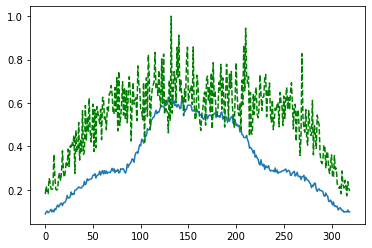

Time taken for epoch:  158.9396870136261
Epoch = [150/3000]  Iter = [   0/39480]  Loss = 0.142 Avg Loss = 0.142  Time = 0.0726s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [150/3000]  Iter = [ 100/39480]  Loss = 0.1631 Avg Loss = 0.1517  Time = 0.0031s
Epoch = [150/3000]  Iter = [ 200/39480]  Loss = 0.1647 Avg Loss = 0.1544  Time = 0.0038s
Epoch = [150/3000]  Iter = [ 300/39480]  Loss = 0.1499 Avg Loss = 0.156  Time = 0.0037s
Epoch = [150/3000]  Iter = [ 400/39480]  Loss = 0.1338 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [150/3000]  Iter = [ 500/39480]  Loss = 0.1651 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [150/3000]  Iter = [ 600/39480]  Loss = 0.1606 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [150/3000]  Iter = [ 700/39480]  Loss = 0.1762 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [150/3000]  Iter = [ 800/39480]  Loss = 0.1389 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [150/3000]  Iter = [ 900/39480]  Loss = 0.1737 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [150/3000]  Iter = [1000/39480]  Loss = 0.1312 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [150/3000]  Iter = [1100/39480]  Loss = 0.1384 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [150/3000]  It

Epoch = [150/3000]  Iter = [9400/39480]  Loss = 0.1541 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [150/3000]  Iter = [9500/39480]  Loss = 0.1451 Avg Loss = 0.1575  Time = 0.0034s
Epoch = [150/3000]  Iter = [9600/39480]  Loss = 0.1655 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [150/3000]  Iter = [9700/39480]  Loss = 0.1529 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [150/3000]  Iter = [9800/39480]  Loss = 0.1724 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [150/3000]  Iter = [9900/39480]  Loss = 0.1614 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [150/3000]  Iter = [10000/39480]  Loss = 0.1723 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [150/3000]  Iter = [10100/39480]  Loss = 0.1486 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [150/3000]  Iter = [10200/39480]  Loss = 0.1336 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [150/3000]  Iter = [10300/39480]  Loss = 0.1464 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [150/3000]  Iter = [10400/39480]  Loss = 0.1451 Avg Loss = 0.1546  Time = 0.0036s
Epoch = [150/300

Epoch = [150/3000]  Iter = [18600/39480]  Loss = 0.1323 Avg Loss = 0.1574  Time = 0.0051s
Epoch = [150/3000]  Iter = [18700/39480]  Loss = 0.1523 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [150/3000]  Iter = [18800/39480]  Loss = 0.1196 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [150/3000]  Iter = [18900/39480]  Loss = 0.1512 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [150/3000]  Iter = [19000/39480]  Loss = 0.1442 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [150/3000]  Iter = [19100/39480]  Loss = 0.1336 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [150/3000]  Iter = [19200/39480]  Loss = 0.1367 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [150/3000]  Iter = [19300/39480]  Loss = 0.157 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [150/3000]  Iter = [19400/39480]  Loss = 0.1616 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [150/3000]  Iter = [19500/39480]  Loss = 0.1609 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [150/3000]  Iter = [19600/39480]  Loss = 0.1427 Avg Loss = 0.1569  Time = 0.0032s
Epoch = [15

Epoch = [150/3000]  Iter = [27800/39480]  Loss = 0.1273 Avg Loss = 0.157  Time = 0.0036s
Epoch = [150/3000]  Iter = [27900/39480]  Loss = 0.1428 Avg Loss = 0.1581  Time = 0.0035s
Epoch = [150/3000]  Iter = [28000/39480]  Loss = 0.1735 Avg Loss = 0.1588  Time = 0.0035s
Epoch = [150/3000]  Iter = [28100/39480]  Loss = 0.1523 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [150/3000]  Iter = [28200/39480]  Loss = 0.175 Avg Loss = 0.1555  Time = 0.0032s
Epoch = [150/3000]  Iter = [28300/39480]  Loss = 0.1432 Avg Loss = 0.1587  Time = 0.0039s
Epoch = [150/3000]  Iter = [28400/39480]  Loss = 0.1584 Avg Loss = 0.1571  Time = 0.0029s
Epoch = [150/3000]  Iter = [28500/39480]  Loss = 0.1397 Avg Loss = 0.1582  Time = 0.0040s
Epoch = [150/3000]  Iter = [28600/39480]  Loss = 0.1571 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [150/3000]  Iter = [28700/39480]  Loss = 0.1606 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [150/3000]  Iter = [28800/39480]  Loss = 0.1509 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [150

Epoch = [150/3000]  Iter = [37000/39480]  Loss = 0.1799 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [150/3000]  Iter = [37100/39480]  Loss = 0.1437 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [150/3000]  Iter = [37200/39480]  Loss = 0.169 Avg Loss = 0.1577  Time = 0.0038s
Epoch = [150/3000]  Iter = [37300/39480]  Loss = 0.1369 Avg Loss = 0.156  Time = 0.0037s
Epoch = [150/3000]  Iter = [37400/39480]  Loss = 0.152 Avg Loss = 0.1557  Time = 0.0033s
Epoch = [150/3000]  Iter = [37500/39480]  Loss = 0.1761 Avg Loss = 0.1547  Time = 0.0037s
Epoch = [150/3000]  Iter = [37600/39480]  Loss = 0.1509 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [150/3000]  Iter = [37700/39480]  Loss = 0.1504 Avg Loss = 0.158  Time = 0.0037s
Epoch = [150/3000]  Iter = [37800/39480]  Loss = 0.1494 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [150/3000]  Iter = [37900/39480]  Loss = 0.1521 Avg Loss = 0.155  Time = 0.0037s
Epoch = [150/3000]  Iter = [38000/39480]  Loss = 0.1717 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [150/30

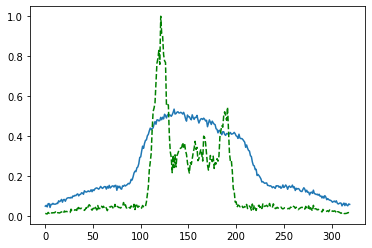

Time taken for epoch:  160.8785855770111
Epoch = [151/3000]  Iter = [   0/39480]  Loss = 0.1655 Avg Loss = 0.1655  Time = 0.0668s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [151/3000]  Iter = [ 100/39480]  Loss = 0.1581 Avg Loss = 0.1599  Time = 0.0033s
Epoch = [151/3000]  Iter = [ 200/39480]  Loss = 0.163 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [151/3000]  Iter = [ 300/39480]  Loss = 0.1629 Avg Loss = 0.1562  Time = 0.0038s
Epoch = [151/3000]  Iter = [ 400/39480]  Loss = 0.1726 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [151/3000]  Iter = [ 500/39480]  Loss = 0.1311 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [151/3000]  Iter = [ 600/39480]  Loss = 0.1354 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [151/3000]  Iter = [ 700/39480]  Loss = 0.1464 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [151/3000]  Iter = [ 800/39480]  Loss = 0.156 Avg Loss = 0.1563  Time = 0.0031s
Epoch = [151/3000]  Iter = [ 900/39480]  Loss = 0.1534 Avg Loss = 0.1561  Time = 0.0030s
Epoch = [151/3000]  Iter = [1000/39480]  Loss = 0.1793 Avg Loss = 0.1576  Time = 0.0030s
Epoch = [151/3000]  Iter = [1100/39480]  Loss = 0.1506 Avg Loss = 0.1575  Time = 0.0033s
Epoch = [151/3000]  Ite

Epoch = [151/3000]  Iter = [9400/39480]  Loss = 0.1679 Avg Loss = 0.1558  Time = 0.0035s
Epoch = [151/3000]  Iter = [9500/39480]  Loss = 0.1499 Avg Loss = 0.1556  Time = 0.0034s
Epoch = [151/3000]  Iter = [9600/39480]  Loss = 0.1327 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [151/3000]  Iter = [9700/39480]  Loss = 0.1575 Avg Loss = 0.1559  Time = 0.0034s
Epoch = [151/3000]  Iter = [9800/39480]  Loss = 0.1672 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [151/3000]  Iter = [9900/39480]  Loss = 0.1817 Avg Loss = 0.1587  Time = 0.0035s
Epoch = [151/3000]  Iter = [10000/39480]  Loss = 0.1618 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [151/3000]  Iter = [10100/39480]  Loss = 0.178 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [151/3000]  Iter = [10200/39480]  Loss = 0.1446 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [151/3000]  Iter = [10300/39480]  Loss = 0.1684 Avg Loss = 0.1575  Time = 0.0034s
Epoch = [151/3000]  Iter = [10400/39480]  Loss = 0.1514 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [151/3000

Epoch = [151/3000]  Iter = [18600/39480]  Loss = 0.1578 Avg Loss = 0.1579  Time = 0.0038s
Epoch = [151/3000]  Iter = [18700/39480]  Loss = 0.1632 Avg Loss = 0.1576  Time = 0.0039s
Epoch = [151/3000]  Iter = [18800/39480]  Loss = 0.1604 Avg Loss = 0.1591  Time = 0.0039s
Epoch = [151/3000]  Iter = [18900/39480]  Loss = 0.1434 Avg Loss = 0.1573  Time = 0.0040s
Epoch = [151/3000]  Iter = [19000/39480]  Loss = 0.1232 Avg Loss = 0.1559  Time = 0.0040s
Epoch = [151/3000]  Iter = [19100/39480]  Loss = 0.1548 Avg Loss = 0.1579  Time = 0.0040s
Epoch = [151/3000]  Iter = [19200/39480]  Loss = 0.1675 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [151/3000]  Iter = [19300/39480]  Loss = 0.1584 Avg Loss = 0.1588  Time = 0.0037s
Epoch = [151/3000]  Iter = [19400/39480]  Loss = 0.1535 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [151/3000]  Iter = [19500/39480]  Loss = 0.1654 Avg Loss = 0.157  Time = 0.0035s
Epoch = [151/3000]  Iter = [19600/39480]  Loss = 0.1367 Avg Loss = 0.157  Time = 0.0037s
Epoch = [151

Epoch = [151/3000]  Iter = [27800/39480]  Loss = 0.162 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [151/3000]  Iter = [27900/39480]  Loss = 0.1507 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [151/3000]  Iter = [28000/39480]  Loss = 0.1781 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [151/3000]  Iter = [28100/39480]  Loss = 0.156 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [151/3000]  Iter = [28200/39480]  Loss = 0.1431 Avg Loss = 0.1589  Time = 0.0036s
Epoch = [151/3000]  Iter = [28300/39480]  Loss = 0.1637 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [151/3000]  Iter = [28400/39480]  Loss = 0.1279 Avg Loss = 0.1579  Time = 0.0038s
Epoch = [151/3000]  Iter = [28500/39480]  Loss = 0.1387 Avg Loss = 0.1579  Time = 0.0035s
Epoch = [151/3000]  Iter = [28600/39480]  Loss = 0.1438 Avg Loss = 0.1573  Time = 0.0043s
Epoch = [151/3000]  Iter = [28700/39480]  Loss = 0.1439 Avg Loss = 0.1586  Time = 0.0039s
Epoch = [151/3000]  Iter = [28800/39480]  Loss = 0.1558 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [151

Epoch = [151/3000]  Iter = [37000/39480]  Loss = 0.1505 Avg Loss = 0.157  Time = 0.0038s
Epoch = [151/3000]  Iter = [37100/39480]  Loss = 0.1414 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [151/3000]  Iter = [37200/39480]  Loss = 0.169 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [151/3000]  Iter = [37300/39480]  Loss = 0.1793 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [151/3000]  Iter = [37400/39480]  Loss = 0.174 Avg Loss = 0.1551  Time = 0.0035s
Epoch = [151/3000]  Iter = [37500/39480]  Loss = 0.1326 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [151/3000]  Iter = [37600/39480]  Loss = 0.1336 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [151/3000]  Iter = [37700/39480]  Loss = 0.1614 Avg Loss = 0.1574  Time = 0.0033s
Epoch = [151/3000]  Iter = [37800/39480]  Loss = 0.2056 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [151/3000]  Iter = [37900/39480]  Loss = 0.1463 Avg Loss = 0.1562  Time = 0.0035s
Epoch = [151/3000]  Iter = [38000/39480]  Loss = 0.1513 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [151/

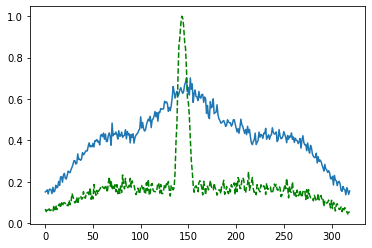

Time taken for epoch:  159.79802680015564
Epoch = [152/3000]  Iter = [   0/39480]  Loss = 0.1764 Avg Loss = 0.1764  Time = 0.0751s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [152/3000]  Iter = [ 100/39480]  Loss = 0.1732 Avg Loss = 0.1633  Time = 0.0038s
Epoch = [152/3000]  Iter = [ 200/39480]  Loss = 0.1504 Avg Loss = 0.1586  Time = 0.0037s
Epoch = [152/3000]  Iter = [ 300/39480]  Loss = 0.1562 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [152/3000]  Iter = [ 400/39480]  Loss = 0.1535 Avg Loss = 0.157  Time = 0.0037s
Epoch = [152/3000]  Iter = [ 500/39480]  Loss = 0.1701 Avg Loss = 0.1573  Time = 0.0038s
Epoch = [152/3000]  Iter = [ 600/39480]  Loss = 0.1503 Avg Loss = 0.156  Time = 0.0037s
Epoch = [152/3000]  Iter = [ 700/39480]  Loss = 0.131 Avg Loss = 0.1539  Time = 0.0037s
Epoch = [152/3000]  Iter = [ 800/39480]  Loss = 0.1678 Avg Loss = 0.1565  Time = 0.0030s
Epoch = [152/3000]  Iter = [ 900/39480]  Loss = 0.1404 Avg Loss = 0.1551  Time = 0.0031s
Epoch = [152/3000]  Iter = [1000/39480]  Loss = 0.1464 Avg Loss = 0.1558  Time = 0.0030s
Epoch = [152/3000]  Iter = [1100/39480]  Loss = 0.1375 Avg Loss = 0.1544  Time = 0.0032s
Epoch = [152/3000]  Iter

Epoch = [152/3000]  Iter = [9400/39480]  Loss = 0.1561 Avg Loss = 0.1576  Time = 0.0034s
Epoch = [152/3000]  Iter = [9500/39480]  Loss = 0.1431 Avg Loss = 0.1562  Time = 0.0034s
Epoch = [152/3000]  Iter = [9600/39480]  Loss = 0.1866 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [152/3000]  Iter = [9700/39480]  Loss = 0.1495 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [152/3000]  Iter = [9800/39480]  Loss = 0.1501 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [152/3000]  Iter = [9900/39480]  Loss = 0.1781 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [152/3000]  Iter = [10000/39480]  Loss = 0.1643 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [152/3000]  Iter = [10100/39480]  Loss = 0.1447 Avg Loss = 0.1555  Time = 0.0033s
Epoch = [152/3000]  Iter = [10200/39480]  Loss = 0.1674 Avg Loss = 0.1566  Time = 0.0033s
Epoch = [152/3000]  Iter = [10300/39480]  Loss = 0.1591 Avg Loss = 0.1551  Time = 0.0029s
Epoch = [152/3000]  Iter = [10400/39480]  Loss = 0.1537 Avg Loss = 0.1561  Time = 0.0029s
Epoch = [152/300

Epoch = [152/3000]  Iter = [18600/39480]  Loss = 0.1524 Avg Loss = 0.1575  Time = 0.0038s
Epoch = [152/3000]  Iter = [18700/39480]  Loss = 0.1532 Avg Loss = 0.1583  Time = 0.0035s
Epoch = [152/3000]  Iter = [18800/39480]  Loss = 0.1548 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [152/3000]  Iter = [18900/39480]  Loss = 0.1639 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [152/3000]  Iter = [19000/39480]  Loss = 0.1467 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [152/3000]  Iter = [19100/39480]  Loss = 0.1451 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [152/3000]  Iter = [19200/39480]  Loss = 0.1758 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [152/3000]  Iter = [19300/39480]  Loss = 0.1569 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [152/3000]  Iter = [19400/39480]  Loss = 0.1496 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [152/3000]  Iter = [19500/39480]  Loss = 0.1219 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [152/3000]  Iter = [19600/39480]  Loss = 0.1517 Avg Loss = 0.1572  Time = 0.0052s
Epoch = [1

Epoch = [152/3000]  Iter = [27800/39480]  Loss = 0.1776 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [152/3000]  Iter = [27900/39480]  Loss = 0.1392 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [152/3000]  Iter = [28000/39480]  Loss = 0.1436 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [152/3000]  Iter = [28100/39480]  Loss = 0.1696 Avg Loss = 0.1562  Time = 0.0038s
Epoch = [152/3000]  Iter = [28200/39480]  Loss = 0.1365 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [152/3000]  Iter = [28300/39480]  Loss = 0.1653 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [152/3000]  Iter = [28400/39480]  Loss = 0.1673 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [152/3000]  Iter = [28500/39480]  Loss = 0.141 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [152/3000]  Iter = [28600/39480]  Loss = 0.1409 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [152/3000]  Iter = [28700/39480]  Loss = 0.1558 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [152/3000]  Iter = [28800/39480]  Loss = 0.1442 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [15

Epoch = [152/3000]  Iter = [37000/39480]  Loss = 0.1685 Avg Loss = 0.1565  Time = 0.0034s
Epoch = [152/3000]  Iter = [37100/39480]  Loss = 0.1537 Avg Loss = 0.158  Time = 0.0038s
Epoch = [152/3000]  Iter = [37200/39480]  Loss = 0.1544 Avg Loss = 0.1564  Time = 0.0038s
Epoch = [152/3000]  Iter = [37300/39480]  Loss = 0.1793 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [152/3000]  Iter = [37400/39480]  Loss = 0.167 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [152/3000]  Iter = [37500/39480]  Loss = 0.1554 Avg Loss = 0.1587  Time = 0.0038s
Epoch = [152/3000]  Iter = [37600/39480]  Loss = 0.154 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [152/3000]  Iter = [37700/39480]  Loss = 0.1541 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [152/3000]  Iter = [37800/39480]  Loss = 0.1483 Avg Loss = 0.156  Time = 0.0032s
Epoch = [152/3000]  Iter = [37900/39480]  Loss = 0.1633 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [152/3000]  Iter = [38000/39480]  Loss = 0.1459 Avg Loss = 0.158  Time = 0.0036s
Epoch = [152/30

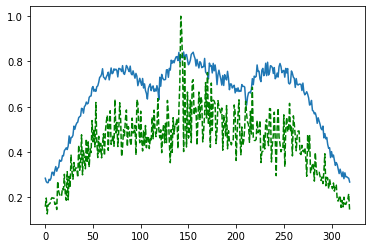

Time taken for epoch:  159.0793273448944
Epoch = [153/3000]  Iter = [   0/39480]  Loss = 0.1579 Avg Loss = 0.1579  Time = 0.0755s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [153/3000]  Iter = [ 100/39480]  Loss = 0.1409 Avg Loss = 0.1564  Time = 0.0035s
Epoch = [153/3000]  Iter = [ 200/39480]  Loss = 0.1565 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [153/3000]  Iter = [ 300/39480]  Loss = 0.1348 Avg Loss = 0.155  Time = 0.0037s
Epoch = [153/3000]  Iter = [ 400/39480]  Loss = 0.1358 Avg Loss = 0.156  Time = 0.0037s
Epoch = [153/3000]  Iter = [ 500/39480]  Loss = 0.1351 Avg Loss = 0.1554  Time = 0.0035s
Epoch = [153/3000]  Iter = [ 600/39480]  Loss = 0.1493 Avg Loss = 0.1571  Time = 0.0032s
Epoch = [153/3000]  Iter = [ 700/39480]  Loss = 0.1652 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [153/3000]  Iter = [ 800/39480]  Loss = 0.1575 Avg Loss = 0.1576  Time = 0.0032s
Epoch = [153/3000]  Iter = [ 900/39480]  Loss = 0.1512 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [153/3000]  Iter = [1000/39480]  Loss = 0.1388 Avg Loss = 0.1533  Time = 0.0036s
Epoch = [153/3000]  Iter = [1100/39480]  Loss = 0.1601 Avg Loss = 0.155  Time = 0.0030s
Epoch = [153/3000]  Iter

Epoch = [153/3000]  Iter = [9400/39480]  Loss = 0.1778 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [153/3000]  Iter = [9500/39480]  Loss = 0.1909 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [153/3000]  Iter = [9600/39480]  Loss = 0.1489 Avg Loss = 0.1553  Time = 0.0034s
Epoch = [153/3000]  Iter = [9700/39480]  Loss = 0.1439 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [153/3000]  Iter = [9800/39480]  Loss = 0.139 Avg Loss = 0.1577  Time = 0.0041s
Epoch = [153/3000]  Iter = [9900/39480]  Loss = 0.1553 Avg Loss = 0.1569  Time = 0.0041s
Epoch = [153/3000]  Iter = [10000/39480]  Loss = 0.153 Avg Loss = 0.1565  Time = 0.0041s
Epoch = [153/3000]  Iter = [10100/39480]  Loss = 0.1787 Avg Loss = 0.1563  Time = 0.0038s
Epoch = [153/3000]  Iter = [10200/39480]  Loss = 0.174 Avg Loss = 0.1562  Time = 0.0039s
Epoch = [153/3000]  Iter = [10300/39480]  Loss = 0.1769 Avg Loss = 0.1555  Time = 0.0040s
Epoch = [153/3000]  Iter = [10400/39480]  Loss = 0.1662 Avg Loss = 0.1565  Time = 0.0041s
Epoch = [153/3000] 

Epoch = [153/3000]  Iter = [18600/39480]  Loss = 0.1695 Avg Loss = 0.1584  Time = 0.0033s
Epoch = [153/3000]  Iter = [18700/39480]  Loss = 0.1769 Avg Loss = 0.158  Time = 0.0034s
Epoch = [153/3000]  Iter = [18800/39480]  Loss = 0.1478 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [153/3000]  Iter = [18900/39480]  Loss = 0.1845 Avg Loss = 0.1586  Time = 0.0037s
Epoch = [153/3000]  Iter = [19000/39480]  Loss = 0.1745 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [153/3000]  Iter = [19100/39480]  Loss = 0.1701 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [153/3000]  Iter = [19200/39480]  Loss = 0.156 Avg Loss = 0.1587  Time = 0.0037s
Epoch = [153/3000]  Iter = [19300/39480]  Loss = 0.1462 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [153/3000]  Iter = [19400/39480]  Loss = 0.1553 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [153/3000]  Iter = [19500/39480]  Loss = 0.1242 Avg Loss = 0.1551  Time = 0.0035s
Epoch = [153/3000]  Iter = [19600/39480]  Loss = 0.1329 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [153

Epoch = [153/3000]  Iter = [27800/39480]  Loss = 0.1637 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [153/3000]  Iter = [27900/39480]  Loss = 0.1497 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [153/3000]  Iter = [28000/39480]  Loss = 0.1421 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [153/3000]  Iter = [28100/39480]  Loss = 0.1621 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [153/3000]  Iter = [28200/39480]  Loss = 0.1459 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [153/3000]  Iter = [28300/39480]  Loss = 0.1564 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [153/3000]  Iter = [28400/39480]  Loss = 0.1649 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [153/3000]  Iter = [28500/39480]  Loss = 0.1499 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [153/3000]  Iter = [28600/39480]  Loss = 0.1624 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [153/3000]  Iter = [28700/39480]  Loss = 0.1468 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [153/3000]  Iter = [28800/39480]  Loss = 0.1536 Avg Loss = 0.1563  Time = 0.0032s
Epoch = [1

Epoch = [153/3000]  Iter = [37000/39480]  Loss = 0.1597 Avg Loss = 0.1569  Time = 0.0038s
Epoch = [153/3000]  Iter = [37100/39480]  Loss = 0.1556 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [153/3000]  Iter = [37200/39480]  Loss = 0.137 Avg Loss = 0.1557  Time = 0.0033s
Epoch = [153/3000]  Iter = [37300/39480]  Loss = 0.1602 Avg Loss = 0.1565  Time = 0.0054s
Epoch = [153/3000]  Iter = [37400/39480]  Loss = 0.1714 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [153/3000]  Iter = [37500/39480]  Loss = 0.1642 Avg Loss = 0.157  Time = 0.0036s
Epoch = [153/3000]  Iter = [37600/39480]  Loss = 0.1584 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [153/3000]  Iter = [37700/39480]  Loss = 0.1512 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [153/3000]  Iter = [37800/39480]  Loss = 0.161 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [153/3000]  Iter = [37900/39480]  Loss = 0.1399 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [153/3000]  Iter = [38000/39480]  Loss = 0.1703 Avg Loss = 0.156  Time = 0.0037s
Epoch = [153/3

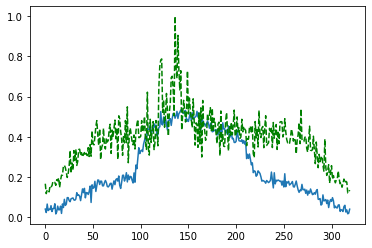

Time taken for epoch:  159.66212844848633
Epoch = [154/3000]  Iter = [   0/39480]  Loss = 0.1596 Avg Loss = 0.1596  Time = 0.0740s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [154/3000]  Iter = [ 100/39480]  Loss = 0.1603 Avg Loss = 0.156  Time = 0.0034s
Epoch = [154/3000]  Iter = [ 200/39480]  Loss = 0.1483 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [154/3000]  Iter = [ 300/39480]  Loss = 0.1865 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [154/3000]  Iter = [ 400/39480]  Loss = 0.1688 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [154/3000]  Iter = [ 500/39480]  Loss = 0.1515 Avg Loss = 0.1557  Time = 0.0035s
Epoch = [154/3000]  Iter = [ 600/39480]  Loss = 0.1627 Avg Loss = 0.1553  Time = 0.0035s
Epoch = [154/3000]  Iter = [ 700/39480]  Loss = 0.1372 Avg Loss = 0.1526  Time = 0.0034s
Epoch = [154/3000]  Iter = [ 800/39480]  Loss = 0.1313 Avg Loss = 0.154  Time = 0.0036s
Epoch = [154/3000]  Iter = [ 900/39480]  Loss = 0.1836 Avg Loss = 0.155  Time = 0.0035s
Epoch = [154/3000]  Iter = [1000/39480]  Loss = 0.1566 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [154/3000]  Iter = [1100/39480]  Loss = 0.1605 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [154/3000]  Iter

Epoch = [154/3000]  Iter = [9400/39480]  Loss = 0.1482 Avg Loss = 0.158  Time = 0.0037s
Epoch = [154/3000]  Iter = [9500/39480]  Loss = 0.15 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [154/3000]  Iter = [9600/39480]  Loss = 0.1552 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [154/3000]  Iter = [9700/39480]  Loss = 0.1871 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [154/3000]  Iter = [9800/39480]  Loss = 0.1648 Avg Loss = 0.1569  Time = 0.0038s
Epoch = [154/3000]  Iter = [9900/39480]  Loss = 0.1671 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [154/3000]  Iter = [10000/39480]  Loss = 0.1972 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [154/3000]  Iter = [10100/39480]  Loss = 0.1468 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [154/3000]  Iter = [10200/39480]  Loss = 0.1578 Avg Loss = 0.1547  Time = 0.0033s
Epoch = [154/3000]  Iter = [10300/39480]  Loss = 0.1584 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [154/3000]  Iter = [10400/39480]  Loss = 0.1641 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [154/3000] 

Epoch = [154/3000]  Iter = [18600/39480]  Loss = 0.1543 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [154/3000]  Iter = [18700/39480]  Loss = 0.1557 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [154/3000]  Iter = [18800/39480]  Loss = 0.1391 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [154/3000]  Iter = [18900/39480]  Loss = 0.1489 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [154/3000]  Iter = [19000/39480]  Loss = 0.1758 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [154/3000]  Iter = [19100/39480]  Loss = 0.152 Avg Loss = 0.1568  Time = 0.0033s
Epoch = [154/3000]  Iter = [19200/39480]  Loss = 0.175 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [154/3000]  Iter = [19300/39480]  Loss = 0.1534 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [154/3000]  Iter = [19400/39480]  Loss = 0.1876 Avg Loss = 0.1597  Time = 0.0037s
Epoch = [154/3000]  Iter = [19500/39480]  Loss = 0.1837 Avg Loss = 0.158  Time = 0.0035s
Epoch = [154/3000]  Iter = [19600/39480]  Loss = 0.1537 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [154/

Epoch = [154/3000]  Iter = [27800/39480]  Loss = 0.1387 Avg Loss = 0.1581  Time = 0.0039s
Epoch = [154/3000]  Iter = [27900/39480]  Loss = 0.1482 Avg Loss = 0.1581  Time = 0.0039s
Epoch = [154/3000]  Iter = [28000/39480]  Loss = 0.1727 Avg Loss = 0.1578  Time = 0.0039s
Epoch = [154/3000]  Iter = [28100/39480]  Loss = 0.1694 Avg Loss = 0.1584  Time = 0.0040s
Epoch = [154/3000]  Iter = [28200/39480]  Loss = 0.1791 Avg Loss = 0.1571  Time = 0.0039s
Epoch = [154/3000]  Iter = [28300/39480]  Loss = 0.1449 Avg Loss = 0.1567  Time = 0.0039s
Epoch = [154/3000]  Iter = [28400/39480]  Loss = 0.157 Avg Loss = 0.1584  Time = 0.0039s
Epoch = [154/3000]  Iter = [28500/39480]  Loss = 0.1341 Avg Loss = 0.1581  Time = 0.0039s
Epoch = [154/3000]  Iter = [28600/39480]  Loss = 0.173 Avg Loss = 0.1581  Time = 0.0038s
Epoch = [154/3000]  Iter = [28700/39480]  Loss = 0.1618 Avg Loss = 0.1566  Time = 0.0039s
Epoch = [154/3000]  Iter = [28800/39480]  Loss = 0.1606 Avg Loss = 0.1575  Time = 0.0032s
Epoch = [154

Epoch = [154/3000]  Iter = [37000/39480]  Loss = 0.1261 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [154/3000]  Iter = [37100/39480]  Loss = 0.161 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [154/3000]  Iter = [37200/39480]  Loss = 0.1724 Avg Loss = 0.156  Time = 0.0036s
Epoch = [154/3000]  Iter = [37300/39480]  Loss = 0.1913 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [154/3000]  Iter = [37400/39480]  Loss = 0.1564 Avg Loss = 0.1571  Time = 0.0032s
Epoch = [154/3000]  Iter = [37500/39480]  Loss = 0.1741 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [154/3000]  Iter = [37600/39480]  Loss = 0.1175 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [154/3000]  Iter = [37700/39480]  Loss = 0.1856 Avg Loss = 0.1552  Time = 0.0032s
Epoch = [154/3000]  Iter = [37800/39480]  Loss = 0.1498 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [154/3000]  Iter = [37900/39480]  Loss = 0.161 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [154/3000]  Iter = [38000/39480]  Loss = 0.1703 Avg Loss = 0.1583  Time = 0.0035s
Epoch = [154/

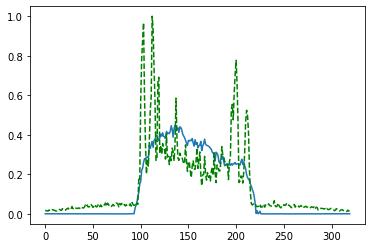

Time taken for epoch:  159.90763902664185
Epoch = [155/3000]  Iter = [   0/39480]  Loss = 0.1665 Avg Loss = 0.1665  Time = 0.0746s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [155/3000]  Iter = [ 100/39480]  Loss = 0.1483 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [155/3000]  Iter = [ 200/39480]  Loss = 0.1492 Avg Loss = 0.1592  Time = 0.0038s
Epoch = [155/3000]  Iter = [ 300/39480]  Loss = 0.1526 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [155/3000]  Iter = [ 400/39480]  Loss = 0.1494 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [155/3000]  Iter = [ 500/39480]  Loss = 0.1524 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [155/3000]  Iter = [ 600/39480]  Loss = 0.1339 Avg Loss = 0.1547  Time = 0.0037s
Epoch = [155/3000]  Iter = [ 700/39480]  Loss = 0.1647 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [155/3000]  Iter = [ 800/39480]  Loss = 0.1543 Avg Loss = 0.156  Time = 0.0035s
Epoch = [155/3000]  Iter = [ 900/39480]  Loss = 0.1811 Avg Loss = 0.1544  Time = 0.0037s
Epoch = [155/3000]  Iter = [1000/39480]  Loss = 0.1538 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [155/3000]  Iter = [1100/39480]  Loss = 0.1498 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [155/3000]  It

Epoch = [155/3000]  Iter = [9400/39480]  Loss = 0.1624 Avg Loss = 0.1574  Time = 0.0034s
Epoch = [155/3000]  Iter = [9500/39480]  Loss = 0.1475 Avg Loss = 0.1585  Time = 0.0034s
Epoch = [155/3000]  Iter = [9600/39480]  Loss = 0.1667 Avg Loss = 0.157  Time = 0.0038s
Epoch = [155/3000]  Iter = [9700/39480]  Loss = 0.1409 Avg Loss = 0.1566  Time = 0.0038s
Epoch = [155/3000]  Iter = [9800/39480]  Loss = 0.1851 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [155/3000]  Iter = [9900/39480]  Loss = 0.1607 Avg Loss = 0.1559  Time = 0.0032s
Epoch = [155/3000]  Iter = [10000/39480]  Loss = 0.1499 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [155/3000]  Iter = [10100/39480]  Loss = 0.1118 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [155/3000]  Iter = [10200/39480]  Loss = 0.1534 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [155/3000]  Iter = [10300/39480]  Loss = 0.1549 Avg Loss = 0.1546  Time = 0.0037s
Epoch = [155/3000]  Iter = [10400/39480]  Loss = 0.1528 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [155/3000

Epoch = [155/3000]  Iter = [18600/39480]  Loss = 0.1663 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [155/3000]  Iter = [18700/39480]  Loss = 0.1677 Avg Loss = 0.1571  Time = 0.0035s
Epoch = [155/3000]  Iter = [18800/39480]  Loss = 0.1514 Avg Loss = 0.1564  Time = 0.0034s
Epoch = [155/3000]  Iter = [18900/39480]  Loss = 0.1276 Avg Loss = 0.156  Time = 0.0035s
Epoch = [155/3000]  Iter = [19000/39480]  Loss = 0.1443 Avg Loss = 0.1567  Time = 0.0039s
Epoch = [155/3000]  Iter = [19100/39480]  Loss = 0.1713 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [155/3000]  Iter = [19200/39480]  Loss = 0.147 Avg Loss = 0.1589  Time = 0.0035s
Epoch = [155/3000]  Iter = [19300/39480]  Loss = 0.144 Avg Loss = 0.159  Time = 0.0035s
Epoch = [155/3000]  Iter = [19400/39480]  Loss = 0.1404 Avg Loss = 0.1585  Time = 0.0035s
Epoch = [155/3000]  Iter = [19500/39480]  Loss = 0.16 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [155/3000]  Iter = [19600/39480]  Loss = 0.1343 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [155/300

Epoch = [155/3000]  Iter = [27800/39480]  Loss = 0.197 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [155/3000]  Iter = [27900/39480]  Loss = 0.1589 Avg Loss = 0.1576  Time = 0.0033s
Epoch = [155/3000]  Iter = [28000/39480]  Loss = 0.1584 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [155/3000]  Iter = [28100/39480]  Loss = 0.1358 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [155/3000]  Iter = [28200/39480]  Loss = 0.1723 Avg Loss = 0.158  Time = 0.0036s
Epoch = [155/3000]  Iter = [28300/39480]  Loss = 0.1542 Avg Loss = 0.1592  Time = 0.0036s
Epoch = [155/3000]  Iter = [28400/39480]  Loss = 0.145 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [155/3000]  Iter = [28500/39480]  Loss = 0.1443 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [155/3000]  Iter = [28600/39480]  Loss = 0.145 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [155/3000]  Iter = [28700/39480]  Loss = 0.1331 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [155/3000]  Iter = [28800/39480]  Loss = 0.1443 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [155/3

Epoch = [155/3000]  Iter = [37000/39480]  Loss = 0.1462 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [155/3000]  Iter = [37100/39480]  Loss = 0.1532 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [155/3000]  Iter = [37200/39480]  Loss = 0.1443 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [155/3000]  Iter = [37300/39480]  Loss = 0.1537 Avg Loss = 0.1552  Time = 0.0038s
Epoch = [155/3000]  Iter = [37400/39480]  Loss = 0.1883 Avg Loss = 0.1561  Time = 0.0034s
Epoch = [155/3000]  Iter = [37500/39480]  Loss = 0.176 Avg Loss = 0.1583  Time = 0.0035s
Epoch = [155/3000]  Iter = [37600/39480]  Loss = 0.1529 Avg Loss = 0.1552  Time = 0.0034s
Epoch = [155/3000]  Iter = [37700/39480]  Loss = 0.1224 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [155/3000]  Iter = [37800/39480]  Loss = 0.1733 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [155/3000]  Iter = [37900/39480]  Loss = 0.1468 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [155/3000]  Iter = [38000/39480]  Loss = 0.1632 Avg Loss = 0.156  Time = 0.0036s
Epoch = [155

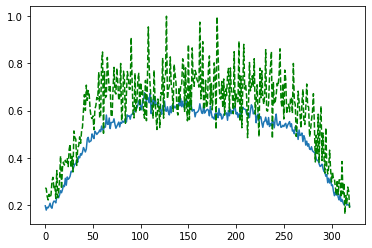

Time taken for epoch:  159.9161684513092
Epoch = [156/3000]  Iter = [   0/39480]  Loss = 0.1691 Avg Loss = 0.1691  Time = 0.0657s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [156/3000]  Iter = [ 100/39480]  Loss = 0.1428 Avg Loss = 0.16  Time = 0.0037s
Epoch = [156/3000]  Iter = [ 200/39480]  Loss = 0.1963 Avg Loss = 0.1605  Time = 0.0037s
Epoch = [156/3000]  Iter = [ 300/39480]  Loss = 0.1481 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [156/3000]  Iter = [ 400/39480]  Loss = 0.171 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [156/3000]  Iter = [ 500/39480]  Loss = 0.1402 Avg Loss = 0.156  Time = 0.0038s
Epoch = [156/3000]  Iter = [ 600/39480]  Loss = 0.145 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [156/3000]  Iter = [ 700/39480]  Loss = 0.1281 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [156/3000]  Iter = [ 800/39480]  Loss = 0.1478 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [156/3000]  Iter = [ 900/39480]  Loss = 0.1719 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [156/3000]  Iter = [1000/39480]  Loss = 0.1499 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [156/3000]  Iter = [1100/39480]  Loss = 0.1449 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [156/3000]  Iter =

Epoch = [156/3000]  Iter = [9400/39480]  Loss = 0.1297 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [156/3000]  Iter = [9500/39480]  Loss = 0.15 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [156/3000]  Iter = [9600/39480]  Loss = 0.1427 Avg Loss = 0.1571  Time = 0.0032s
Epoch = [156/3000]  Iter = [9700/39480]  Loss = 0.1489 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [156/3000]  Iter = [9800/39480]  Loss = 0.1395 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [156/3000]  Iter = [9900/39480]  Loss = 0.1582 Avg Loss = 0.156  Time = 0.0037s
Epoch = [156/3000]  Iter = [10000/39480]  Loss = 0.1566 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [156/3000]  Iter = [10100/39480]  Loss = 0.1627 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [156/3000]  Iter = [10200/39480]  Loss = 0.1674 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [156/3000]  Iter = [10300/39480]  Loss = 0.1712 Avg Loss = 0.157  Time = 0.0037s
Epoch = [156/3000]  Iter = [10400/39480]  Loss = 0.1627 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [156/3000]  

Epoch = [156/3000]  Iter = [18600/39480]  Loss = 0.1511 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [156/3000]  Iter = [18700/39480]  Loss = 0.1542 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [156/3000]  Iter = [18800/39480]  Loss = 0.1697 Avg Loss = 0.1593  Time = 0.0037s
Epoch = [156/3000]  Iter = [18900/39480]  Loss = 0.1697 Avg Loss = 0.1586  Time = 0.0035s
Epoch = [156/3000]  Iter = [19000/39480]  Loss = 0.1476 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [156/3000]  Iter = [19100/39480]  Loss = 0.1302 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [156/3000]  Iter = [19200/39480]  Loss = 0.151 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [156/3000]  Iter = [19300/39480]  Loss = 0.1784 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [156/3000]  Iter = [19400/39480]  Loss = 0.1329 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [156/3000]  Iter = [19500/39480]  Loss = 0.1346 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [156/3000]  Iter = [19600/39480]  Loss = 0.1373 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [15

Epoch = [156/3000]  Iter = [27800/39480]  Loss = 0.1508 Avg Loss = 0.1565  Time = 0.0034s
Epoch = [156/3000]  Iter = [27900/39480]  Loss = 0.1621 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [156/3000]  Iter = [28000/39480]  Loss = 0.1624 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [156/3000]  Iter = [28100/39480]  Loss = 0.149 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [156/3000]  Iter = [28200/39480]  Loss = 0.1695 Avg Loss = 0.156  Time = 0.0036s
Epoch = [156/3000]  Iter = [28300/39480]  Loss = 0.1688 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [156/3000]  Iter = [28400/39480]  Loss = 0.1557 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [156/3000]  Iter = [28500/39480]  Loss = 0.1571 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [156/3000]  Iter = [28600/39480]  Loss = 0.1546 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [156/3000]  Iter = [28700/39480]  Loss = 0.1528 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [156/3000]  Iter = [28800/39480]  Loss = 0.147 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [156/

Epoch = [156/3000]  Iter = [37000/39480]  Loss = 0.1372 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [156/3000]  Iter = [37100/39480]  Loss = 0.1649 Avg Loss = 0.158  Time = 0.0041s
Epoch = [156/3000]  Iter = [37200/39480]  Loss = 0.134 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [156/3000]  Iter = [37300/39480]  Loss = 0.1591 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [156/3000]  Iter = [37400/39480]  Loss = 0.1473 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [156/3000]  Iter = [37500/39480]  Loss = 0.1684 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [156/3000]  Iter = [37600/39480]  Loss = 0.1354 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [156/3000]  Iter = [37700/39480]  Loss = 0.141 Avg Loss = 0.1559  Time = 0.0034s
Epoch = [156/3000]  Iter = [37800/39480]  Loss = 0.1514 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [156/3000]  Iter = [37900/39480]  Loss = 0.1456 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [156/3000]  Iter = [38000/39480]  Loss = 0.1784 Avg Loss = 0.1568  Time = 0.0032s
Epoch = [156/

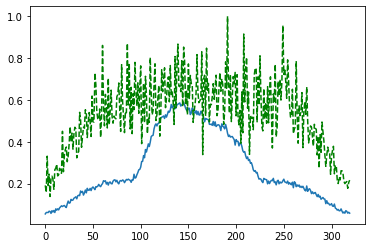

Time taken for epoch:  159.9685254096985
Epoch = [157/3000]  Iter = [   0/39480]  Loss = 0.1469 Avg Loss = 0.1469  Time = 0.0676s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [157/3000]  Iter = [ 100/39480]  Loss = 0.1268 Avg Loss = 0.1518  Time = 0.0034s
Epoch = [157/3000]  Iter = [ 200/39480]  Loss = 0.1812 Avg Loss = 0.1551  Time = 0.0034s
Epoch = [157/3000]  Iter = [ 300/39480]  Loss = 0.1423 Avg Loss = 0.1548  Time = 0.0034s
Epoch = [157/3000]  Iter = [ 400/39480]  Loss = 0.1575 Avg Loss = 0.1553  Time = 0.0034s
Epoch = [157/3000]  Iter = [ 500/39480]  Loss = 0.146 Avg Loss = 0.1552  Time = 0.0031s
Epoch = [157/3000]  Iter = [ 600/39480]  Loss = 0.1468 Avg Loss = 0.157  Time = 0.0031s
Epoch = [157/3000]  Iter = [ 700/39480]  Loss = 0.1415 Avg Loss = 0.1545  Time = 0.0031s
Epoch = [157/3000]  Iter = [ 800/39480]  Loss = 0.1395 Avg Loss = 0.1551  Time = 0.0030s
Epoch = [157/3000]  Iter = [ 900/39480]  Loss = 0.1465 Avg Loss = 0.1547  Time = 0.0029s
Epoch = [157/3000]  Iter = [1000/39480]  Loss = 0.1744 Avg Loss = 0.1565  Time = 0.0030s
Epoch = [157/3000]  Iter = [1100/39480]  Loss = 0.1203 Avg Loss = 0.1565  Time = 0.0031s
Epoch = [157/3000]  Ite

Epoch = [157/3000]  Iter = [9400/39480]  Loss = 0.1417 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [157/3000]  Iter = [9500/39480]  Loss = 0.1431 Avg Loss = 0.1552  Time = 0.0032s
Epoch = [157/3000]  Iter = [9600/39480]  Loss = 0.1232 Avg Loss = 0.1537  Time = 0.0036s
Epoch = [157/3000]  Iter = [9700/39480]  Loss = 0.1663 Avg Loss = 0.1561  Time = 0.0038s
Epoch = [157/3000]  Iter = [9800/39480]  Loss = 0.1582 Avg Loss = 0.1568  Time = 0.0032s
Epoch = [157/3000]  Iter = [9900/39480]  Loss = 0.1617 Avg Loss = 0.157  Time = 0.0036s
Epoch = [157/3000]  Iter = [10000/39480]  Loss = 0.1543 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [157/3000]  Iter = [10100/39480]  Loss = 0.1498 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [157/3000]  Iter = [10200/39480]  Loss = 0.1893 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [157/3000]  Iter = [10300/39480]  Loss = 0.1475 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [157/3000]  Iter = [10400/39480]  Loss = 0.1501 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [157/3000

Epoch = [157/3000]  Iter = [18600/39480]  Loss = 0.1514 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [157/3000]  Iter = [18700/39480]  Loss = 0.1874 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [157/3000]  Iter = [18800/39480]  Loss = 0.1747 Avg Loss = 0.1564  Time = 0.0038s
Epoch = [157/3000]  Iter = [18900/39480]  Loss = 0.1562 Avg Loss = 0.1577  Time = 0.0033s
Epoch = [157/3000]  Iter = [19000/39480]  Loss = 0.1302 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [157/3000]  Iter = [19100/39480]  Loss = 0.1438 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [157/3000]  Iter = [19200/39480]  Loss = 0.1684 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [157/3000]  Iter = [19300/39480]  Loss = 0.1591 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [157/3000]  Iter = [19400/39480]  Loss = 0.157 Avg Loss = 0.1557  Time = 0.0032s
Epoch = [157/3000]  Iter = [19500/39480]  Loss = 0.1622 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [157/3000]  Iter = [19600/39480]  Loss = 0.1582 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [15

Epoch = [157/3000]  Iter = [27800/39480]  Loss = 0.1509 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [157/3000]  Iter = [27900/39480]  Loss = 0.1798 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [157/3000]  Iter = [28000/39480]  Loss = 0.1776 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [157/3000]  Iter = [28100/39480]  Loss = 0.1337 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [157/3000]  Iter = [28200/39480]  Loss = 0.1346 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [157/3000]  Iter = [28300/39480]  Loss = 0.17 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [157/3000]  Iter = [28400/39480]  Loss = 0.1485 Avg Loss = 0.1569  Time = 0.0033s
Epoch = [157/3000]  Iter = [28500/39480]  Loss = 0.1708 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [157/3000]  Iter = [28600/39480]  Loss = 0.1703 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [157/3000]  Iter = [28700/39480]  Loss = 0.1687 Avg Loss = 0.1571  Time = 0.0033s
Epoch = [157/3000]  Iter = [28800/39480]  Loss = 0.1711 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [157

Epoch = [157/3000]  Iter = [37000/39480]  Loss = 0.1721 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [157/3000]  Iter = [37100/39480]  Loss = 0.1739 Avg Loss = 0.158  Time = 0.0037s
Epoch = [157/3000]  Iter = [37200/39480]  Loss = 0.1521 Avg Loss = 0.1579  Time = 0.0035s
Epoch = [157/3000]  Iter = [37300/39480]  Loss = 0.1795 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [157/3000]  Iter = [37400/39480]  Loss = 0.1784 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [157/3000]  Iter = [37500/39480]  Loss = 0.1381 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [157/3000]  Iter = [37600/39480]  Loss = 0.1738 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [157/3000]  Iter = [37700/39480]  Loss = 0.1517 Avg Loss = 0.1569  Time = 0.0032s
Epoch = [157/3000]  Iter = [37800/39480]  Loss = 0.1589 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [157/3000]  Iter = [37900/39480]  Loss = 0.1859 Avg Loss = 0.1586  Time = 0.0034s
Epoch = [157/3000]  Iter = [38000/39480]  Loss = 0.1571 Avg Loss = 0.1599  Time = 0.0036s
Epoch = [15

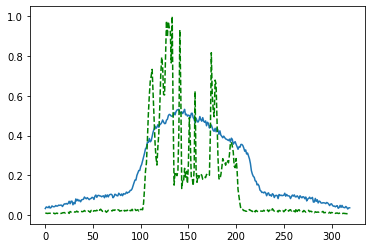

Time taken for epoch:  157.78946828842163
Epoch = [158/3000]  Iter = [   0/39480]  Loss = 0.1457 Avg Loss = 0.1457  Time = 0.0764s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [158/3000]  Iter = [ 100/39480]  Loss = 0.1447 Avg Loss = 0.1506  Time = 0.0036s
Epoch = [158/3000]  Iter = [ 200/39480]  Loss = 0.1635 Avg Loss = 0.1538  Time = 0.0035s
Epoch = [158/3000]  Iter = [ 300/39480]  Loss = 0.1588 Avg Loss = 0.1549  Time = 0.0050s
Epoch = [158/3000]  Iter = [ 400/39480]  Loss = 0.16 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [158/3000]  Iter = [ 500/39480]  Loss = 0.1733 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [158/3000]  Iter = [ 600/39480]  Loss = 0.1613 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [158/3000]  Iter = [ 700/39480]  Loss = 0.1482 Avg Loss = 0.1545  Time = 0.0037s
Epoch = [158/3000]  Iter = [ 800/39480]  Loss = 0.1646 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [158/3000]  Iter = [ 900/39480]  Loss = 0.1437 Avg Loss = 0.1551  Time = 0.0034s
Epoch = [158/3000]  Iter = [1000/39480]  Loss = 0.1531 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [158/3000]  Iter = [1100/39480]  Loss = 0.1523 Avg Loss = 0.155  Time = 0.0037s
Epoch = [158/3000]  Iter

Epoch = [158/3000]  Iter = [9400/39480]  Loss = 0.1699 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [158/3000]  Iter = [9500/39480]  Loss = 0.1535 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [158/3000]  Iter = [9600/39480]  Loss = 0.1441 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [158/3000]  Iter = [9700/39480]  Loss = 0.129 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [158/3000]  Iter = [9800/39480]  Loss = 0.1834 Avg Loss = 0.1574  Time = 0.0038s
Epoch = [158/3000]  Iter = [9900/39480]  Loss = 0.1977 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [158/3000]  Iter = [10000/39480]  Loss = 0.161 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [158/3000]  Iter = [10100/39480]  Loss = 0.1535 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [158/3000]  Iter = [10200/39480]  Loss = 0.1617 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [158/3000]  Iter = [10300/39480]  Loss = 0.1586 Avg Loss = 0.1544  Time = 0.0036s
Epoch = [158/3000]  Iter = [10400/39480]  Loss = 0.1434 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [158/3000]

Epoch = [158/3000]  Iter = [18600/39480]  Loss = 0.1284 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [158/3000]  Iter = [18700/39480]  Loss = 0.1407 Avg Loss = 0.1556  Time = 0.0033s
Epoch = [158/3000]  Iter = [18800/39480]  Loss = 0.1655 Avg Loss = 0.1564  Time = 0.0035s
Epoch = [158/3000]  Iter = [18900/39480]  Loss = 0.1581 Avg Loss = 0.158  Time = 0.0036s
Epoch = [158/3000]  Iter = [19000/39480]  Loss = 0.1546 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [158/3000]  Iter = [19100/39480]  Loss = 0.1679 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [158/3000]  Iter = [19200/39480]  Loss = 0.1483 Avg Loss = 0.1547  Time = 0.0037s
Epoch = [158/3000]  Iter = [19300/39480]  Loss = 0.1507 Avg Loss = 0.156  Time = 0.0037s
Epoch = [158/3000]  Iter = [19400/39480]  Loss = 0.1496 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [158/3000]  Iter = [19500/39480]  Loss = 0.1725 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [158/3000]  Iter = [19600/39480]  Loss = 0.194 Avg Loss = 0.1586  Time = 0.0034s
Epoch = [158/

Epoch = [158/3000]  Iter = [27800/39480]  Loss = 0.1555 Avg Loss = 0.1578  Time = 0.0038s
Epoch = [158/3000]  Iter = [27900/39480]  Loss = 0.1522 Avg Loss = 0.158  Time = 0.0037s
Epoch = [158/3000]  Iter = [28000/39480]  Loss = 0.1479 Avg Loss = 0.1541  Time = 0.0036s
Epoch = [158/3000]  Iter = [28100/39480]  Loss = 0.146 Avg Loss = 0.1562  Time = 0.0038s
Epoch = [158/3000]  Iter = [28200/39480]  Loss = 0.1633 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [158/3000]  Iter = [28300/39480]  Loss = 0.1401 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [158/3000]  Iter = [28400/39480]  Loss = 0.1452 Avg Loss = 0.1573  Time = 0.0035s
Epoch = [158/3000]  Iter = [28500/39480]  Loss = 0.1698 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [158/3000]  Iter = [28600/39480]  Loss = 0.1636 Avg Loss = 0.1553  Time = 0.0038s
Epoch = [158/3000]  Iter = [28700/39480]  Loss = 0.1433 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [158/3000]  Iter = [28800/39480]  Loss = 0.1778 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [158

Epoch = [158/3000]  Iter = [37000/39480]  Loss = 0.1513 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [158/3000]  Iter = [37100/39480]  Loss = 0.1699 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [158/3000]  Iter = [37200/39480]  Loss = 0.1563 Avg Loss = 0.1579  Time = 0.0034s
Epoch = [158/3000]  Iter = [37300/39480]  Loss = 0.1521 Avg Loss = 0.158  Time = 0.0031s
Epoch = [158/3000]  Iter = [37400/39480]  Loss = 0.1437 Avg Loss = 0.1579  Time = 0.0038s
Epoch = [158/3000]  Iter = [37500/39480]  Loss = 0.1606 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [158/3000]  Iter = [37600/39480]  Loss = 0.1663 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [158/3000]  Iter = [37700/39480]  Loss = 0.1535 Avg Loss = 0.156  Time = 0.0037s
Epoch = [158/3000]  Iter = [37800/39480]  Loss = 0.1575 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [158/3000]  Iter = [37900/39480]  Loss = 0.1505 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [158/3000]  Iter = [38000/39480]  Loss = 0.1619 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [158

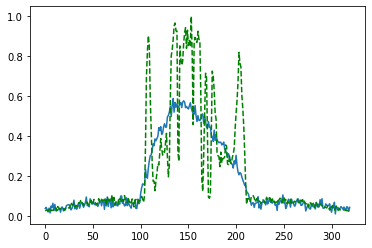

Time taken for epoch:  158.88756370544434
Epoch = [159/3000]  Iter = [   0/39480]  Loss = 0.1338 Avg Loss = 0.1338  Time = 0.0678s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [159/3000]  Iter = [ 100/39480]  Loss = 0.1498 Avg Loss = 0.1483  Time = 0.0036s
Epoch = [159/3000]  Iter = [ 200/39480]  Loss = 0.1584 Avg Loss = 0.154  Time = 0.0037s
Epoch = [159/3000]  Iter = [ 300/39480]  Loss = 0.1529 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [159/3000]  Iter = [ 400/39480]  Loss = 0.1463 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [159/3000]  Iter = [ 500/39480]  Loss = 0.1327 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [159/3000]  Iter = [ 600/39480]  Loss = 0.1737 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [159/3000]  Iter = [ 700/39480]  Loss = 0.1486 Avg Loss = 0.1546  Time = 0.0037s
Epoch = [159/3000]  Iter = [ 800/39480]  Loss = 0.1322 Avg Loss = 0.155  Time = 0.0038s
Epoch = [159/3000]  Iter = [ 900/39480]  Loss = 0.1561 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [159/3000]  Iter = [1000/39480]  Loss = 0.1488 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [159/3000]  Iter = [1100/39480]  Loss = 0.1862 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [159/3000]  Ite

Epoch = [159/3000]  Iter = [9400/39480]  Loss = 0.1606 Avg Loss = 0.1565  Time = 0.0040s
Epoch = [159/3000]  Iter = [9500/39480]  Loss = 0.1313 Avg Loss = 0.1571  Time = 0.0051s
Epoch = [159/3000]  Iter = [9600/39480]  Loss = 0.1582 Avg Loss = 0.1553  Time = 0.0039s
Epoch = [159/3000]  Iter = [9700/39480]  Loss = 0.138 Avg Loss = 0.1556  Time = 0.0038s
Epoch = [159/3000]  Iter = [9800/39480]  Loss = 0.1537 Avg Loss = 0.1565  Time = 0.0039s
Epoch = [159/3000]  Iter = [9900/39480]  Loss = 0.1704 Avg Loss = 0.1574  Time = 0.0039s
Epoch = [159/3000]  Iter = [10000/39480]  Loss = 0.1421 Avg Loss = 0.1555  Time = 0.0035s
Epoch = [159/3000]  Iter = [10100/39480]  Loss = 0.1648 Avg Loss = 0.1562  Time = 0.0032s
Epoch = [159/3000]  Iter = [10200/39480]  Loss = 0.1589 Avg Loss = 0.156  Time = 0.0036s
Epoch = [159/3000]  Iter = [10300/39480]  Loss = 0.1623 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [159/3000]  Iter = [10400/39480]  Loss = 0.1626 Avg Loss = 0.1571  Time = 0.0034s
Epoch = [159/3000]

Epoch = [159/3000]  Iter = [18600/39480]  Loss = 0.1783 Avg Loss = 0.157  Time = 0.0037s
Epoch = [159/3000]  Iter = [18700/39480]  Loss = 0.1644 Avg Loss = 0.1547  Time = 0.0034s
Epoch = [159/3000]  Iter = [18800/39480]  Loss = 0.1491 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [159/3000]  Iter = [18900/39480]  Loss = 0.1476 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [159/3000]  Iter = [19000/39480]  Loss = 0.1722 Avg Loss = 0.1547  Time = 0.0037s
Epoch = [159/3000]  Iter = [19100/39480]  Loss = 0.1399 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [159/3000]  Iter = [19200/39480]  Loss = 0.174 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [159/3000]  Iter = [19300/39480]  Loss = 0.1409 Avg Loss = 0.1563  Time = 0.0033s
Epoch = [159/3000]  Iter = [19400/39480]  Loss = 0.162 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [159/3000]  Iter = [19500/39480]  Loss = 0.1928 Avg Loss = 0.157  Time = 0.0037s
Epoch = [159/3000]  Iter = [19600/39480]  Loss = 0.1504 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [159/3

Epoch = [159/3000]  Iter = [27800/39480]  Loss = 0.1643 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [159/3000]  Iter = [27900/39480]  Loss = 0.1753 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [159/3000]  Iter = [28000/39480]  Loss = 0.1736 Avg Loss = 0.1576  Time = 0.0032s
Epoch = [159/3000]  Iter = [28100/39480]  Loss = 0.1626 Avg Loss = 0.1582  Time = 0.0035s
Epoch = [159/3000]  Iter = [28200/39480]  Loss = 0.1468 Avg Loss = 0.1577  Time = 0.0038s
Epoch = [159/3000]  Iter = [28300/39480]  Loss = 0.1502 Avg Loss = 0.1581  Time = 0.0040s
Epoch = [159/3000]  Iter = [28400/39480]  Loss = 0.1743 Avg Loss = 0.157  Time = 0.0039s
Epoch = [159/3000]  Iter = [28500/39480]  Loss = 0.1361 Avg Loss = 0.1567  Time = 0.0042s
Epoch = [159/3000]  Iter = [28600/39480]  Loss = 0.1257 Avg Loss = 0.1565  Time = 0.0040s
Epoch = [159/3000]  Iter = [28700/39480]  Loss = 0.1476 Avg Loss = 0.1562  Time = 0.0032s
Epoch = [159/3000]  Iter = [28800/39480]  Loss = 0.1375 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [15

Epoch = [159/3000]  Iter = [37000/39480]  Loss = 0.1529 Avg Loss = 0.158  Time = 0.0035s
Epoch = [159/3000]  Iter = [37100/39480]  Loss = 0.1775 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [159/3000]  Iter = [37200/39480]  Loss = 0.1536 Avg Loss = 0.1563  Time = 0.0034s
Epoch = [159/3000]  Iter = [37300/39480]  Loss = 0.1345 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [159/3000]  Iter = [37400/39480]  Loss = 0.1463 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [159/3000]  Iter = [37500/39480]  Loss = 0.1601 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [159/3000]  Iter = [37600/39480]  Loss = 0.156 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [159/3000]  Iter = [37700/39480]  Loss = 0.1849 Avg Loss = 0.1582  Time = 0.0034s
Epoch = [159/3000]  Iter = [37800/39480]  Loss = 0.1523 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [159/3000]  Iter = [37900/39480]  Loss = 0.1374 Avg Loss = 0.1591  Time = 0.0036s
Epoch = [159/3000]  Iter = [38000/39480]  Loss = 0.1534 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [159

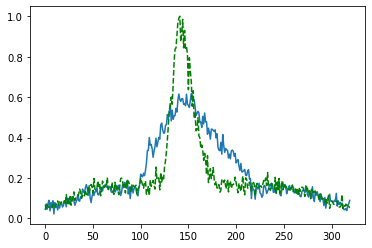

Time taken for epoch:  158.24047994613647
Epoch = [160/3000]  Iter = [   0/39480]  Loss = 0.155 Avg Loss = 0.155  Time = 0.0874s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [160/3000]  Iter = [ 100/39480]  Loss = 0.1363 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [160/3000]  Iter = [ 200/39480]  Loss = 0.1666 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [160/3000]  Iter = [ 300/39480]  Loss = 0.1659 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [160/3000]  Iter = [ 400/39480]  Loss = 0.142 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [160/3000]  Iter = [ 500/39480]  Loss = 0.1466 Avg Loss = 0.1551  Time = 0.0034s
Epoch = [160/3000]  Iter = [ 600/39480]  Loss = 0.1467 Avg Loss = 0.1572  Time = 0.0030s
Epoch = [160/3000]  Iter = [ 700/39480]  Loss = 0.1729 Avg Loss = 0.1576  Time = 0.0034s
Epoch = [160/3000]  Iter = [ 800/39480]  Loss = 0.1504 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [160/3000]  Iter = [ 900/39480]  Loss = 0.1676 Avg Loss = 0.1577  Time = 0.0041s
Epoch = [160/3000]  Iter = [1000/39480]  Loss = 0.1817 Avg Loss = 0.1573  Time = 0.0039s
Epoch = [160/3000]  Iter = [1100/39480]  Loss = 0.1717 Avg Loss = 0.1562  Time = 0.0039s
Epoch = [160/3000]  It

Epoch = [160/3000]  Iter = [9400/39480]  Loss = 0.152 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [160/3000]  Iter = [9500/39480]  Loss = 0.1495 Avg Loss = 0.1586  Time = 0.0037s
Epoch = [160/3000]  Iter = [9600/39480]  Loss = 0.1618 Avg Loss = 0.1586  Time = 0.0038s
Epoch = [160/3000]  Iter = [9700/39480]  Loss = 0.1325 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [160/3000]  Iter = [9800/39480]  Loss = 0.1465 Avg Loss = 0.158  Time = 0.0038s
Epoch = [160/3000]  Iter = [9900/39480]  Loss = 0.1528 Avg Loss = 0.1567  Time = 0.0038s
Epoch = [160/3000]  Iter = [10000/39480]  Loss = 0.17 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [160/3000]  Iter = [10100/39480]  Loss = 0.1566 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [160/3000]  Iter = [10200/39480]  Loss = 0.1322 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [160/3000]  Iter = [10300/39480]  Loss = 0.1572 Avg Loss = 0.1587  Time = 0.0037s
Epoch = [160/3000]  Iter = [10400/39480]  Loss = 0.167 Avg Loss = 0.1583  Time = 0.0035s
Epoch = [160/3000]  I

Epoch = [160/3000]  Iter = [18600/39480]  Loss = 0.1492 Avg Loss = 0.1554  Time = 0.0035s
Epoch = [160/3000]  Iter = [18700/39480]  Loss = 0.1439 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [160/3000]  Iter = [18800/39480]  Loss = 0.1597 Avg Loss = 0.1547  Time = 0.0036s
Epoch = [160/3000]  Iter = [18900/39480]  Loss = 0.1567 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [160/3000]  Iter = [19000/39480]  Loss = 0.1626 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [160/3000]  Iter = [19100/39480]  Loss = 0.1711 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [160/3000]  Iter = [19200/39480]  Loss = 0.1713 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [160/3000]  Iter = [19300/39480]  Loss = 0.1728 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [160/3000]  Iter = [19400/39480]  Loss = 0.14 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [160/3000]  Iter = [19500/39480]  Loss = 0.1475 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [160/3000]  Iter = [19600/39480]  Loss = 0.1562 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [160

Epoch = [160/3000]  Iter = [27800/39480]  Loss = 0.1573 Avg Loss = 0.158  Time = 0.0037s
Epoch = [160/3000]  Iter = [27900/39480]  Loss = 0.1344 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [160/3000]  Iter = [28000/39480]  Loss = 0.1654 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [160/3000]  Iter = [28100/39480]  Loss = 0.1524 Avg Loss = 0.157  Time = 0.0036s
Epoch = [160/3000]  Iter = [28200/39480]  Loss = 0.1729 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [160/3000]  Iter = [28300/39480]  Loss = 0.1577 Avg Loss = 0.156  Time = 0.0036s
Epoch = [160/3000]  Iter = [28400/39480]  Loss = 0.1452 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [160/3000]  Iter = [28500/39480]  Loss = 0.154 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [160/3000]  Iter = [28600/39480]  Loss = 0.172 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [160/3000]  Iter = [28700/39480]  Loss = 0.1376 Avg Loss = 0.1567  Time = 0.0034s
Epoch = [160/3000]  Iter = [28800/39480]  Loss = 0.1594 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [160/30

Epoch = [160/3000]  Iter = [37000/39480]  Loss = 0.172 Avg Loss = 0.1589  Time = 0.0031s
Epoch = [160/3000]  Iter = [37100/39480]  Loss = 0.172 Avg Loss = 0.1585  Time = 0.0035s
Epoch = [160/3000]  Iter = [37200/39480]  Loss = 0.1484 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [160/3000]  Iter = [37300/39480]  Loss = 0.1746 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [160/3000]  Iter = [37400/39480]  Loss = 0.1758 Avg Loss = 0.1571  Time = 0.0032s
Epoch = [160/3000]  Iter = [37500/39480]  Loss = 0.1748 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [160/3000]  Iter = [37600/39480]  Loss = 0.1484 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [160/3000]  Iter = [37700/39480]  Loss = 0.1681 Avg Loss = 0.155  Time = 0.0040s
Epoch = [160/3000]  Iter = [37800/39480]  Loss = 0.1364 Avg Loss = 0.155  Time = 0.0036s
Epoch = [160/3000]  Iter = [37900/39480]  Loss = 0.1608 Avg Loss = 0.1561  Time = 0.0033s
Epoch = [160/3000]  Iter = [38000/39480]  Loss = 0.1486 Avg Loss = 0.1583  Time = 0.0032s
Epoch = [160/3

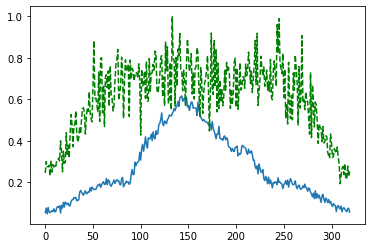

Time taken for epoch:  158.9388747215271
Epoch = [161/3000]  Iter = [   0/39480]  Loss = 0.1375 Avg Loss = 0.1375  Time = 0.1002s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [161/3000]  Iter = [ 100/39480]  Loss = 0.1446 Avg Loss = 0.1496  Time = 0.0037s
Epoch = [161/3000]  Iter = [ 200/39480]  Loss = 0.1467 Avg Loss = 0.152  Time = 0.0036s
Epoch = [161/3000]  Iter = [ 300/39480]  Loss = 0.1522 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [161/3000]  Iter = [ 400/39480]  Loss = 0.1464 Avg Loss = 0.157  Time = 0.0037s
Epoch = [161/3000]  Iter = [ 500/39480]  Loss = 0.1569 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [161/3000]  Iter = [ 600/39480]  Loss = 0.188 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [161/3000]  Iter = [ 700/39480]  Loss = 0.1556 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [161/3000]  Iter = [ 800/39480]  Loss = 0.1786 Avg Loss = 0.1558  Time = 0.0035s
Epoch = [161/3000]  Iter = [ 900/39480]  Loss = 0.1477 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [161/3000]  Iter = [1000/39480]  Loss = 0.1592 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [161/3000]  Iter = [1100/39480]  Loss = 0.171 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [161/3000]  Iter 

Epoch = [161/3000]  Iter = [9400/39480]  Loss = 0.1457 Avg Loss = 0.1564  Time = 0.0032s
Epoch = [161/3000]  Iter = [9500/39480]  Loss = 0.1472 Avg Loss = 0.1587  Time = 0.0036s
Epoch = [161/3000]  Iter = [9600/39480]  Loss = 0.1411 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [161/3000]  Iter = [9700/39480]  Loss = 0.1497 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [161/3000]  Iter = [9800/39480]  Loss = 0.1431 Avg Loss = 0.1564  Time = 0.0030s
Epoch = [161/3000]  Iter = [9900/39480]  Loss = 0.1638 Avg Loss = 0.1587  Time = 0.0031s
Epoch = [161/3000]  Iter = [10000/39480]  Loss = 0.1591 Avg Loss = 0.1572  Time = 0.0030s
Epoch = [161/3000]  Iter = [10100/39480]  Loss = 0.1909 Avg Loss = 0.1574  Time = 0.0030s
Epoch = [161/3000]  Iter = [10200/39480]  Loss = 0.1282 Avg Loss = 0.1569  Time = 0.0029s
Epoch = [161/3000]  Iter = [10300/39480]  Loss = 0.1843 Avg Loss = 0.1563  Time = 0.0034s
Epoch = [161/3000]  Iter = [10400/39480]  Loss = 0.1334 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [161/300

Epoch = [161/3000]  Iter = [18600/39480]  Loss = 0.166 Avg Loss = 0.1557  Time = 0.0040s
Epoch = [161/3000]  Iter = [18700/39480]  Loss = 0.1604 Avg Loss = 0.1571  Time = 0.0038s
Epoch = [161/3000]  Iter = [18800/39480]  Loss = 0.1702 Avg Loss = 0.1563  Time = 0.0041s
Epoch = [161/3000]  Iter = [18900/39480]  Loss = 0.1563 Avg Loss = 0.156  Time = 0.0041s
Epoch = [161/3000]  Iter = [19000/39480]  Loss = 0.1606 Avg Loss = 0.1578  Time = 0.0041s
Epoch = [161/3000]  Iter = [19100/39480]  Loss = 0.1714 Avg Loss = 0.1567  Time = 0.0040s
Epoch = [161/3000]  Iter = [19200/39480]  Loss = 0.1514 Avg Loss = 0.1587  Time = 0.0041s
Epoch = [161/3000]  Iter = [19300/39480]  Loss = 0.1664 Avg Loss = 0.1568  Time = 0.0040s
Epoch = [161/3000]  Iter = [19400/39480]  Loss = 0.1492 Avg Loss = 0.1561  Time = 0.0040s
Epoch = [161/3000]  Iter = [19500/39480]  Loss = 0.159 Avg Loss = 0.1575  Time = 0.0041s
Epoch = [161/3000]  Iter = [19600/39480]  Loss = 0.166 Avg Loss = 0.1561  Time = 0.0039s
Epoch = [161/3

Epoch = [161/3000]  Iter = [27800/39480]  Loss = 0.146 Avg Loss = 0.156  Time = 0.0037s
Epoch = [161/3000]  Iter = [27900/39480]  Loss = 0.1697 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [161/3000]  Iter = [28000/39480]  Loss = 0.1492 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [161/3000]  Iter = [28100/39480]  Loss = 0.1735 Avg Loss = 0.1564  Time = 0.0032s
Epoch = [161/3000]  Iter = [28200/39480]  Loss = 0.1392 Avg Loss = 0.1562  Time = 0.0035s
Epoch = [161/3000]  Iter = [28300/39480]  Loss = 0.1699 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [161/3000]  Iter = [28400/39480]  Loss = 0.1624 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [161/3000]  Iter = [28500/39480]  Loss = 0.1645 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [161/3000]  Iter = [28600/39480]  Loss = 0.1494 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [161/3000]  Iter = [28700/39480]  Loss = 0.1585 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [161/3000]  Iter = [28800/39480]  Loss = 0.1603 Avg Loss = 0.1553  Time = 0.0034s
Epoch = [161

Epoch = [161/3000]  Iter = [37000/39480]  Loss = 0.1277 Avg Loss = 0.1569  Time = 0.0040s
Epoch = [161/3000]  Iter = [37100/39480]  Loss = 0.1588 Avg Loss = 0.1578  Time = 0.0039s
Epoch = [161/3000]  Iter = [37200/39480]  Loss = 0.1621 Avg Loss = 0.1564  Time = 0.0042s
Epoch = [161/3000]  Iter = [37300/39480]  Loss = 0.1309 Avg Loss = 0.1555  Time = 0.0043s
Epoch = [161/3000]  Iter = [37400/39480]  Loss = 0.1538 Avg Loss = 0.1543  Time = 0.0036s
Epoch = [161/3000]  Iter = [37500/39480]  Loss = 0.1472 Avg Loss = 0.1552  Time = 0.0035s
Epoch = [161/3000]  Iter = [37600/39480]  Loss = 0.1328 Avg Loss = 0.156  Time = 0.0035s
Epoch = [161/3000]  Iter = [37700/39480]  Loss = 0.162 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [161/3000]  Iter = [37800/39480]  Loss = 0.1546 Avg Loss = 0.1563  Time = 0.0038s
Epoch = [161/3000]  Iter = [37900/39480]  Loss = 0.1421 Avg Loss = 0.1559  Time = 0.0038s
Epoch = [161/3000]  Iter = [38000/39480]  Loss = 0.1523 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [161

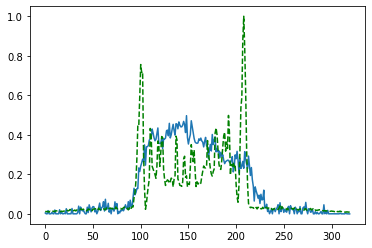

Time taken for epoch:  159.67920207977295
Epoch = [162/3000]  Iter = [   0/39480]  Loss = 0.1505 Avg Loss = 0.1505  Time = 0.0663s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [162/3000]  Iter = [ 100/39480]  Loss = 0.1501 Avg Loss = 0.1537  Time = 0.0036s
Epoch = [162/3000]  Iter = [ 200/39480]  Loss = 0.1616 Avg Loss = 0.1559  Time = 0.0041s
Epoch = [162/3000]  Iter = [ 300/39480]  Loss = 0.1405 Avg Loss = 0.1548  Time = 0.0041s
Epoch = [162/3000]  Iter = [ 400/39480]  Loss = 0.1361 Avg Loss = 0.1545  Time = 0.0041s
Epoch = [162/3000]  Iter = [ 500/39480]  Loss = 0.164 Avg Loss = 0.156  Time = 0.0037s
Epoch = [162/3000]  Iter = [ 600/39480]  Loss = 0.1354 Avg Loss = 0.1573  Time = 0.0034s
Epoch = [162/3000]  Iter = [ 700/39480]  Loss = 0.1595 Avg Loss = 0.1584  Time = 0.0042s
Epoch = [162/3000]  Iter = [ 800/39480]  Loss = 0.1585 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [162/3000]  Iter = [ 900/39480]  Loss = 0.1284 Avg Loss = 0.1575  Time = 0.0029s
Epoch = [162/3000]  Iter = [1000/39480]  Loss = 0.1541 Avg Loss = 0.1563  Time = 0.0029s
Epoch = [162/3000]  Iter = [1100/39480]  Loss = 0.1412 Avg Loss = 0.1568  Time = 0.0030s
Epoch = [162/3000]  Ite

Epoch = [162/3000]  Iter = [9400/39480]  Loss = 0.1658 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [162/3000]  Iter = [9500/39480]  Loss = 0.149 Avg Loss = 0.157  Time = 0.0037s
Epoch = [162/3000]  Iter = [9600/39480]  Loss = 0.154 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [162/3000]  Iter = [9700/39480]  Loss = 0.1645 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [162/3000]  Iter = [9800/39480]  Loss = 0.1339 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [162/3000]  Iter = [9900/39480]  Loss = 0.1532 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [162/3000]  Iter = [10000/39480]  Loss = 0.158 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [162/3000]  Iter = [10100/39480]  Loss = 0.1341 Avg Loss = 0.155  Time = 0.0037s
Epoch = [162/3000]  Iter = [10200/39480]  Loss = 0.1546 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [162/3000]  Iter = [10300/39480]  Loss = 0.1632 Avg Loss = 0.1574  Time = 0.0034s
Epoch = [162/3000]  Iter = [10400/39480]  Loss = 0.1457 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [162/3000]  I

Epoch = [162/3000]  Iter = [18600/39480]  Loss = 0.1374 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [162/3000]  Iter = [18700/39480]  Loss = 0.1503 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [162/3000]  Iter = [18800/39480]  Loss = 0.1716 Avg Loss = 0.158  Time = 0.0032s
Epoch = [162/3000]  Iter = [18900/39480]  Loss = 0.1694 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [162/3000]  Iter = [19000/39480]  Loss = 0.1808 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [162/3000]  Iter = [19100/39480]  Loss = 0.1709 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [162/3000]  Iter = [19200/39480]  Loss = 0.16 Avg Loss = 0.1583  Time = 0.0035s
Epoch = [162/3000]  Iter = [19300/39480]  Loss = 0.1499 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [162/3000]  Iter = [19400/39480]  Loss = 0.1734 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [162/3000]  Iter = [19500/39480]  Loss = 0.1418 Avg Loss = 0.1552  Time = 0.0036s
Epoch = [162/3000]  Iter = [19600/39480]  Loss = 0.1446 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [162/

Epoch = [162/3000]  Iter = [27800/39480]  Loss = 0.1462 Avg Loss = 0.157  Time = 0.0032s
Epoch = [162/3000]  Iter = [27900/39480]  Loss = 0.1649 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [162/3000]  Iter = [28000/39480]  Loss = 0.149 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [162/3000]  Iter = [28100/39480]  Loss = 0.1377 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [162/3000]  Iter = [28200/39480]  Loss = 0.1595 Avg Loss = 0.1549  Time = 0.0036s
Epoch = [162/3000]  Iter = [28300/39480]  Loss = 0.1653 Avg Loss = 0.156  Time = 0.0036s
Epoch = [162/3000]  Iter = [28400/39480]  Loss = 0.1446 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [162/3000]  Iter = [28500/39480]  Loss = 0.1438 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [162/3000]  Iter = [28600/39480]  Loss = 0.1403 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [162/3000]  Iter = [28700/39480]  Loss = 0.1464 Avg Loss = 0.1579  Time = 0.0038s
Epoch = [162/3000]  Iter = [28800/39480]  Loss = 0.157 Avg Loss = 0.1568  Time = 0.0039s
Epoch = [162/3

Epoch = [162/3000]  Iter = [37000/39480]  Loss = 0.1718 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [162/3000]  Iter = [37100/39480]  Loss = 0.1482 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [162/3000]  Iter = [37200/39480]  Loss = 0.178 Avg Loss = 0.1564  Time = 0.0032s
Epoch = [162/3000]  Iter = [37300/39480]  Loss = 0.1516 Avg Loss = 0.1565  Time = 0.0039s
Epoch = [162/3000]  Iter = [37400/39480]  Loss = 0.151 Avg Loss = 0.158  Time = 0.0039s
Epoch = [162/3000]  Iter = [37500/39480]  Loss = 0.1697 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [162/3000]  Iter = [37600/39480]  Loss = 0.1542 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [162/3000]  Iter = [37700/39480]  Loss = 0.1315 Avg Loss = 0.1548  Time = 0.0036s
Epoch = [162/3000]  Iter = [37800/39480]  Loss = 0.1565 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [162/3000]  Iter = [37900/39480]  Loss = 0.1731 Avg Loss = 0.1564  Time = 0.0032s
Epoch = [162/3000]  Iter = [38000/39480]  Loss = 0.1753 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [162/

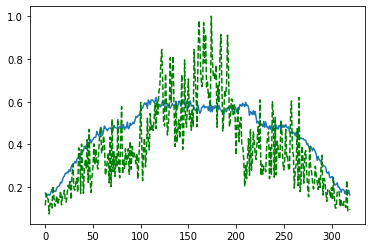

Time taken for epoch:  158.49881029129028
Epoch = [163/3000]  Iter = [   0/39480]  Loss = 0.1868 Avg Loss = 0.1868  Time = 0.0680s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [163/3000]  Iter = [ 100/39480]  Loss = 0.1524 Avg Loss = 0.1675  Time = 0.0036s
Epoch = [163/3000]  Iter = [ 200/39480]  Loss = 0.1355 Avg Loss = 0.1591  Time = 0.0035s
Epoch = [163/3000]  Iter = [ 300/39480]  Loss = 0.1647 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [163/3000]  Iter = [ 400/39480]  Loss = 0.1642 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [163/3000]  Iter = [ 500/39480]  Loss = 0.1557 Avg Loss = 0.1558  Time = 0.0038s
Epoch = [163/3000]  Iter = [ 600/39480]  Loss = 0.1571 Avg Loss = 0.157  Time = 0.0038s
Epoch = [163/3000]  Iter = [ 700/39480]  Loss = 0.1351 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [163/3000]  Iter = [ 800/39480]  Loss = 0.1697 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [163/3000]  Iter = [ 900/39480]  Loss = 0.1389 Avg Loss = 0.1566  Time = 0.0030s
Epoch = [163/3000]  Iter = [1000/39480]  Loss = 0.1405 Avg Loss = 0.1568  Time = 0.0031s
Epoch = [163/3000]  Iter = [1100/39480]  Loss = 0.1524 Avg Loss = 0.1557  Time = 0.0030s
Epoch = [163/3000]  It

Epoch = [163/3000]  Iter = [9400/39480]  Loss = 0.1591 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [163/3000]  Iter = [9500/39480]  Loss = 0.118 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [163/3000]  Iter = [9600/39480]  Loss = 0.1795 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [163/3000]  Iter = [9700/39480]  Loss = 0.1581 Avg Loss = 0.156  Time = 0.0037s
Epoch = [163/3000]  Iter = [9800/39480]  Loss = 0.1439 Avg Loss = 0.156  Time = 0.0037s
Epoch = [163/3000]  Iter = [9900/39480]  Loss = 0.1641 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [163/3000]  Iter = [10000/39480]  Loss = 0.1527 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [163/3000]  Iter = [10100/39480]  Loss = 0.1932 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [163/3000]  Iter = [10200/39480]  Loss = 0.1427 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [163/3000]  Iter = [10300/39480]  Loss = 0.2096 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [163/3000]  Iter = [10400/39480]  Loss = 0.1371 Avg Loss = 0.157  Time = 0.0037s
Epoch = [163/3000]  

Epoch = [163/3000]  Iter = [18600/39480]  Loss = 0.1568 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [163/3000]  Iter = [18700/39480]  Loss = 0.1631 Avg Loss = 0.1571  Time = 0.0035s
Epoch = [163/3000]  Iter = [18800/39480]  Loss = 0.166 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [163/3000]  Iter = [18900/39480]  Loss = 0.1579 Avg Loss = 0.156  Time = 0.0035s
Epoch = [163/3000]  Iter = [19000/39480]  Loss = 0.1513 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [163/3000]  Iter = [19100/39480]  Loss = 0.1412 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [163/3000]  Iter = [19200/39480]  Loss = 0.1746 Avg Loss = 0.1574  Time = 0.0035s
Epoch = [163/3000]  Iter = [19300/39480]  Loss = 0.1501 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [163/3000]  Iter = [19400/39480]  Loss = 0.1659 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [163/3000]  Iter = [19500/39480]  Loss = 0.1696 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [163/3000]  Iter = [19600/39480]  Loss = 0.1777 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [163

Epoch = [163/3000]  Iter = [27800/39480]  Loss = 0.1715 Avg Loss = 0.1563  Time = 0.0038s
Epoch = [163/3000]  Iter = [27900/39480]  Loss = 0.1452 Avg Loss = 0.1584  Time = 0.0039s
Epoch = [163/3000]  Iter = [28000/39480]  Loss = 0.1457 Avg Loss = 0.1554  Time = 0.0039s
Epoch = [163/3000]  Iter = [28100/39480]  Loss = 0.161 Avg Loss = 0.1563  Time = 0.0039s
Epoch = [163/3000]  Iter = [28200/39480]  Loss = 0.137 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [163/3000]  Iter = [28300/39480]  Loss = 0.1414 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [163/3000]  Iter = [28400/39480]  Loss = 0.1408 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [163/3000]  Iter = [28500/39480]  Loss = 0.1783 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [163/3000]  Iter = [28600/39480]  Loss = 0.1845 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [163/3000]  Iter = [28700/39480]  Loss = 0.1519 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [163/3000]  Iter = [28800/39480]  Loss = 0.1665 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [163

Epoch = [163/3000]  Iter = [37000/39480]  Loss = 0.142 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [163/3000]  Iter = [37100/39480]  Loss = 0.151 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [163/3000]  Iter = [37200/39480]  Loss = 0.1425 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [163/3000]  Iter = [37300/39480]  Loss = 0.164 Avg Loss = 0.157  Time = 0.0037s
Epoch = [163/3000]  Iter = [37400/39480]  Loss = 0.129 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [163/3000]  Iter = [37500/39480]  Loss = 0.1506 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [163/3000]  Iter = [37600/39480]  Loss = 0.1373 Avg Loss = 0.157  Time = 0.0033s
Epoch = [163/3000]  Iter = [37700/39480]  Loss = 0.1589 Avg Loss = 0.156  Time = 0.0037s
Epoch = [163/3000]  Iter = [37800/39480]  Loss = 0.1527 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [163/3000]  Iter = [37900/39480]  Loss = 0.1415 Avg Loss = 0.1583  Time = 0.0035s
Epoch = [163/3000]  Iter = [38000/39480]  Loss = 0.1467 Avg Loss = 0.1555  Time = 0.0035s
Epoch = [163/3000

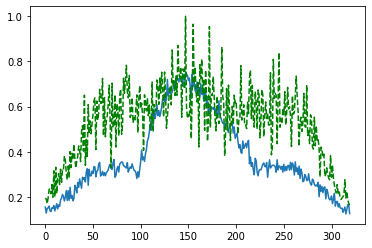

Time taken for epoch:  159.57070398330688
Epoch = [164/3000]  Iter = [   0/39480]  Loss = 0.1563 Avg Loss = 0.1563  Time = 0.0764s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [164/3000]  Iter = [ 100/39480]  Loss = 0.1866 Avg Loss = 0.1552  Time = 0.0038s
Epoch = [164/3000]  Iter = [ 200/39480]  Loss = 0.1552 Avg Loss = 0.1548  Time = 0.0036s
Epoch = [164/3000]  Iter = [ 300/39480]  Loss = 0.1612 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [164/3000]  Iter = [ 400/39480]  Loss = 0.1418 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [164/3000]  Iter = [ 500/39480]  Loss = 0.1818 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [164/3000]  Iter = [ 600/39480]  Loss = 0.1437 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [164/3000]  Iter = [ 700/39480]  Loss = 0.1582 Avg Loss = 0.1545  Time = 0.0037s
Epoch = [164/3000]  Iter = [ 800/39480]  Loss = 0.1369 Avg Loss = 0.1564  Time = 0.0038s
Epoch = [164/3000]  Iter = [ 900/39480]  Loss = 0.147 Avg Loss = 0.1553  Time = 0.0029s
Epoch = [164/3000]  Iter = [1000/39480]  Loss = 0.1529 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [164/3000]  Iter = [1100/39480]  Loss = 0.1747 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [164/3000]  It

Epoch = [164/3000]  Iter = [9400/39480]  Loss = 0.1861 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [164/3000]  Iter = [9500/39480]  Loss = 0.1799 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [164/3000]  Iter = [9600/39480]  Loss = 0.1366 Avg Loss = 0.1564  Time = 0.0040s
Epoch = [164/3000]  Iter = [9700/39480]  Loss = 0.149 Avg Loss = 0.156  Time = 0.0042s
Epoch = [164/3000]  Iter = [9800/39480]  Loss = 0.1368 Avg Loss = 0.1554  Time = 0.0042s
Epoch = [164/3000]  Iter = [9900/39480]  Loss = 0.1761 Avg Loss = 0.1563  Time = 0.0041s
Epoch = [164/3000]  Iter = [10000/39480]  Loss = 0.1586 Avg Loss = 0.1568  Time = 0.0042s
Epoch = [164/3000]  Iter = [10100/39480]  Loss = 0.1775 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [164/3000]  Iter = [10200/39480]  Loss = 0.1633 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [164/3000]  Iter = [10300/39480]  Loss = 0.1629 Avg Loss = 0.1573  Time = 0.0035s
Epoch = [164/3000]  Iter = [10400/39480]  Loss = 0.1636 Avg Loss = 0.158  Time = 0.0036s
Epoch = [164/3000] 

Epoch = [164/3000]  Iter = [18600/39480]  Loss = 0.1662 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [164/3000]  Iter = [18700/39480]  Loss = 0.1773 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [164/3000]  Iter = [18800/39480]  Loss = 0.136 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [164/3000]  Iter = [18900/39480]  Loss = 0.179 Avg Loss = 0.1557  Time = 0.0033s
Epoch = [164/3000]  Iter = [19000/39480]  Loss = 0.1396 Avg Loss = 0.1561  Time = 0.0034s
Epoch = [164/3000]  Iter = [19100/39480]  Loss = 0.1566 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [164/3000]  Iter = [19200/39480]  Loss = 0.1644 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [164/3000]  Iter = [19300/39480]  Loss = 0.15 Avg Loss = 0.1572  Time = 0.0032s
Epoch = [164/3000]  Iter = [19400/39480]  Loss = 0.1354 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [164/3000]  Iter = [19500/39480]  Loss = 0.1616 Avg Loss = 0.1564  Time = 0.0040s
Epoch = [164/3000]  Iter = [19600/39480]  Loss = 0.1777 Avg Loss = 0.1559  Time = 0.0038s
Epoch = [164/3

Epoch = [164/3000]  Iter = [27800/39480]  Loss = 0.16 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [164/3000]  Iter = [27900/39480]  Loss = 0.1505 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [164/3000]  Iter = [28000/39480]  Loss = 0.1533 Avg Loss = 0.159  Time = 0.0036s
Epoch = [164/3000]  Iter = [28100/39480]  Loss = 0.1451 Avg Loss = 0.1591  Time = 0.0037s
Epoch = [164/3000]  Iter = [28200/39480]  Loss = 0.1502 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [164/3000]  Iter = [28300/39480]  Loss = 0.1618 Avg Loss = 0.1574  Time = 0.0032s
Epoch = [164/3000]  Iter = [28400/39480]  Loss = 0.1606 Avg Loss = 0.158  Time = 0.0037s
Epoch = [164/3000]  Iter = [28500/39480]  Loss = 0.1666 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [164/3000]  Iter = [28600/39480]  Loss = 0.1602 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [164/3000]  Iter = [28700/39480]  Loss = 0.1513 Avg Loss = 0.1568  Time = 0.0032s
Epoch = [164/3000]  Iter = [28800/39480]  Loss = 0.1455 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [164/3

Epoch = [164/3000]  Iter = [37000/39480]  Loss = 0.1943 Avg Loss = 0.1581  Time = 0.0032s
Epoch = [164/3000]  Iter = [37100/39480]  Loss = 0.1415 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [164/3000]  Iter = [37200/39480]  Loss = 0.1627 Avg Loss = 0.1599  Time = 0.0036s
Epoch = [164/3000]  Iter = [37300/39480]  Loss = 0.1649 Avg Loss = 0.1581  Time = 0.0034s
Epoch = [164/3000]  Iter = [37400/39480]  Loss = 0.1357 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [164/3000]  Iter = [37500/39480]  Loss = 0.158 Avg Loss = 0.1576  Time = 0.0034s
Epoch = [164/3000]  Iter = [37600/39480]  Loss = 0.1623 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [164/3000]  Iter = [37700/39480]  Loss = 0.1744 Avg Loss = 0.1571  Time = 0.0033s
Epoch = [164/3000]  Iter = [37800/39480]  Loss = 0.1559 Avg Loss = 0.157  Time = 0.0031s
Epoch = [164/3000]  Iter = [37900/39480]  Loss = 0.1546 Avg Loss = 0.1574  Time = 0.0035s
Epoch = [164/3000]  Iter = [38000/39480]  Loss = 0.1565 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [164

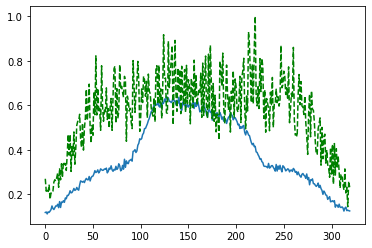

Time taken for epoch:  160.69396829605103
Epoch = [165/3000]  Iter = [   0/39480]  Loss = 0.1621 Avg Loss = 0.1621  Time = 0.0674s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [165/3000]  Iter = [ 100/39480]  Loss = 0.1319 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [165/3000]  Iter = [ 200/39480]  Loss = 0.1563 Avg Loss = 0.157  Time = 0.0038s
Epoch = [165/3000]  Iter = [ 300/39480]  Loss = 0.1692 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [165/3000]  Iter = [ 400/39480]  Loss = 0.1557 Avg Loss = 0.157  Time = 0.0038s
Epoch = [165/3000]  Iter = [ 500/39480]  Loss = 0.1703 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [165/3000]  Iter = [ 600/39480]  Loss = 0.1785 Avg Loss = 0.1581  Time = 0.0038s
Epoch = [165/3000]  Iter = [ 700/39480]  Loss = 0.1364 Avg Loss = 0.1556  Time = 0.0033s
Epoch = [165/3000]  Iter = [ 800/39480]  Loss = 0.164 Avg Loss = 0.1566  Time = 0.0033s
Epoch = [165/3000]  Iter = [ 900/39480]  Loss = 0.1585 Avg Loss = 0.1572  Time = 0.0033s
Epoch = [165/3000]  Iter = [1000/39480]  Loss = 0.1575 Avg Loss = 0.1559  Time = 0.0030s
Epoch = [165/3000]  Iter = [1100/39480]  Loss = 0.1323 Avg Loss = 0.156  Time = 0.0031s
Epoch = [165/3000]  Iter 

Epoch = [165/3000]  Iter = [9400/39480]  Loss = 0.1448 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [165/3000]  Iter = [9500/39480]  Loss = 0.1554 Avg Loss = 0.156  Time = 0.0035s
Epoch = [165/3000]  Iter = [9600/39480]  Loss = 0.1767 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [165/3000]  Iter = [9700/39480]  Loss = 0.1353 Avg Loss = 0.155  Time = 0.0035s
Epoch = [165/3000]  Iter = [9800/39480]  Loss = 0.1843 Avg Loss = 0.1576  Time = 0.0034s
Epoch = [165/3000]  Iter = [9900/39480]  Loss = 0.1729 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [165/3000]  Iter = [10000/39480]  Loss = 0.1785 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [165/3000]  Iter = [10100/39480]  Loss = 0.1819 Avg Loss = 0.1548  Time = 0.0036s
Epoch = [165/3000]  Iter = [10200/39480]  Loss = 0.1684 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [165/3000]  Iter = [10300/39480]  Loss = 0.1663 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [165/3000]  Iter = [10400/39480]  Loss = 0.1616 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [165/3000]

Epoch = [165/3000]  Iter = [18600/39480]  Loss = 0.1545 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [165/3000]  Iter = [18700/39480]  Loss = 0.1374 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [165/3000]  Iter = [18800/39480]  Loss = 0.1736 Avg Loss = 0.1568  Time = 0.0033s
Epoch = [165/3000]  Iter = [18900/39480]  Loss = 0.147 Avg Loss = 0.1581  Time = 0.0033s
Epoch = [165/3000]  Iter = [19000/39480]  Loss = 0.1601 Avg Loss = 0.1587  Time = 0.0040s
Epoch = [165/3000]  Iter = [19100/39480]  Loss = 0.1461 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [165/3000]  Iter = [19200/39480]  Loss = 0.1626 Avg Loss = 0.1597  Time = 0.0033s
Epoch = [165/3000]  Iter = [19300/39480]  Loss = 0.1505 Avg Loss = 0.1577  Time = 0.0032s
Epoch = [165/3000]  Iter = [19400/39480]  Loss = 0.1368 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [165/3000]  Iter = [19500/39480]  Loss = 0.1607 Avg Loss = 0.158  Time = 0.0037s
Epoch = [165/3000]  Iter = [19600/39480]  Loss = 0.1767 Avg Loss = 0.1577  Time = 0.0032s
Epoch = [165

Epoch = [165/3000]  Iter = [27800/39480]  Loss = 0.1505 Avg Loss = 0.159  Time = 0.0037s
Epoch = [165/3000]  Iter = [27900/39480]  Loss = 0.1334 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [165/3000]  Iter = [28000/39480]  Loss = 0.1635 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [165/3000]  Iter = [28100/39480]  Loss = 0.1409 Avg Loss = 0.1588  Time = 0.0037s
Epoch = [165/3000]  Iter = [28200/39480]  Loss = 0.1646 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [165/3000]  Iter = [28300/39480]  Loss = 0.1522 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [165/3000]  Iter = [28400/39480]  Loss = 0.1644 Avg Loss = 0.1559  Time = 0.0053s
Epoch = [165/3000]  Iter = [28500/39480]  Loss = 0.1488 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [165/3000]  Iter = [28600/39480]  Loss = 0.1352 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [165/3000]  Iter = [28700/39480]  Loss = 0.1521 Avg Loss = 0.156  Time = 0.0037s
Epoch = [165/3000]  Iter = [28800/39480]  Loss = 0.1542 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [165

Epoch = [165/3000]  Iter = [37000/39480]  Loss = 0.1846 Avg Loss = 0.1576  Time = 0.0033s
Epoch = [165/3000]  Iter = [37100/39480]  Loss = 0.1487 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [165/3000]  Iter = [37200/39480]  Loss = 0.1496 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [165/3000]  Iter = [37300/39480]  Loss = 0.1491 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [165/3000]  Iter = [37400/39480]  Loss = 0.1617 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [165/3000]  Iter = [37500/39480]  Loss = 0.1335 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [165/3000]  Iter = [37600/39480]  Loss = 0.1378 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [165/3000]  Iter = [37700/39480]  Loss = 0.163 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [165/3000]  Iter = [37800/39480]  Loss = 0.1253 Avg Loss = 0.156  Time = 0.0037s
Epoch = [165/3000]  Iter = [37900/39480]  Loss = 0.1627 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [165/3000]  Iter = [38000/39480]  Loss = 0.1708 Avg Loss = 0.1563  Time = 0.0033s
Epoch = [165

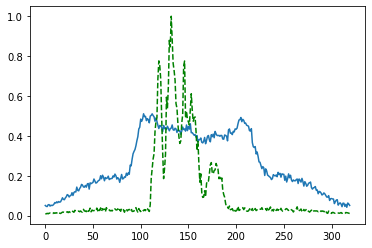

Time taken for epoch:  159.7983467578888
Epoch = [166/3000]  Iter = [   0/39480]  Loss = 0.1531 Avg Loss = 0.1531  Time = 0.0624s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [166/3000]  Iter = [ 100/39480]  Loss = 0.1697 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [166/3000]  Iter = [ 200/39480]  Loss = 0.1888 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [166/3000]  Iter = [ 300/39480]  Loss = 0.1531 Avg Loss = 0.1552  Time = 0.0036s
Epoch = [166/3000]  Iter = [ 400/39480]  Loss = 0.1667 Avg Loss = 0.1561  Time = 0.0032s
Epoch = [166/3000]  Iter = [ 500/39480]  Loss = 0.1102 Avg Loss = 0.1552  Time = 0.0040s
Epoch = [166/3000]  Iter = [ 600/39480]  Loss = 0.1459 Avg Loss = 0.1549  Time = 0.0033s
Epoch = [166/3000]  Iter = [ 700/39480]  Loss = 0.1417 Avg Loss = 0.1563  Time = 0.0031s
Epoch = [166/3000]  Iter = [ 800/39480]  Loss = 0.1284 Avg Loss = 0.1554  Time = 0.0027s
Epoch = [166/3000]  Iter = [ 900/39480]  Loss = 0.1671 Avg Loss = 0.1562  Time = 0.0033s
Epoch = [166/3000]  Iter = [1000/39480]  Loss = 0.1392 Avg Loss = 0.155  Time = 0.0030s
Epoch = [166/3000]  Iter = [1100/39480]  Loss = 0.143 Avg Loss = 0.1551  Time = 0.0031s
Epoch = [166/3000]  Ite

Epoch = [166/3000]  Iter = [9400/39480]  Loss = 0.1619 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [166/3000]  Iter = [9500/39480]  Loss = 0.1472 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [166/3000]  Iter = [9600/39480]  Loss = 0.1531 Avg Loss = 0.1587  Time = 0.0033s
Epoch = [166/3000]  Iter = [9700/39480]  Loss = 0.143 Avg Loss = 0.1583  Time = 0.0034s
Epoch = [166/3000]  Iter = [9800/39480]  Loss = 0.1522 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [166/3000]  Iter = [9900/39480]  Loss = 0.1481 Avg Loss = 0.157  Time = 0.0032s
Epoch = [166/3000]  Iter = [10000/39480]  Loss = 0.1391 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [166/3000]  Iter = [10100/39480]  Loss = 0.133 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [166/3000]  Iter = [10200/39480]  Loss = 0.1537 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [166/3000]  Iter = [10300/39480]  Loss = 0.1369 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [166/3000]  Iter = [10400/39480]  Loss = 0.1552 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [166/3000] 

Epoch = [166/3000]  Iter = [18600/39480]  Loss = 0.1484 Avg Loss = 0.1564  Time = 0.0035s
Epoch = [166/3000]  Iter = [18700/39480]  Loss = 0.1628 Avg Loss = 0.1574  Time = 0.0041s
Epoch = [166/3000]  Iter = [18800/39480]  Loss = 0.1675 Avg Loss = 0.1594  Time = 0.0041s
Epoch = [166/3000]  Iter = [18900/39480]  Loss = 0.1692 Avg Loss = 0.1592  Time = 0.0040s
Epoch = [166/3000]  Iter = [19000/39480]  Loss = 0.1477 Avg Loss = 0.1561  Time = 0.0038s
Epoch = [166/3000]  Iter = [19100/39480]  Loss = 0.152 Avg Loss = 0.1569  Time = 0.0039s
Epoch = [166/3000]  Iter = [19200/39480]  Loss = 0.1478 Avg Loss = 0.1572  Time = 0.0040s
Epoch = [166/3000]  Iter = [19300/39480]  Loss = 0.1474 Avg Loss = 0.1577  Time = 0.0041s
Epoch = [166/3000]  Iter = [19400/39480]  Loss = 0.14 Avg Loss = 0.157  Time = 0.0039s
Epoch = [166/3000]  Iter = [19500/39480]  Loss = 0.141 Avg Loss = 0.1557  Time = 0.0039s
Epoch = [166/3000]  Iter = [19600/39480]  Loss = 0.1424 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [166/30

Epoch = [166/3000]  Iter = [27800/39480]  Loss = 0.1445 Avg Loss = 0.158  Time = 0.0032s
Epoch = [166/3000]  Iter = [27900/39480]  Loss = 0.157 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [166/3000]  Iter = [28000/39480]  Loss = 0.1349 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [166/3000]  Iter = [28100/39480]  Loss = 0.1399 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [166/3000]  Iter = [28200/39480]  Loss = 0.1627 Avg Loss = 0.1568  Time = 0.0033s
Epoch = [166/3000]  Iter = [28300/39480]  Loss = 0.1748 Avg Loss = 0.1549  Time = 0.0036s
Epoch = [166/3000]  Iter = [28400/39480]  Loss = 0.1393 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [166/3000]  Iter = [28500/39480]  Loss = 0.149 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [166/3000]  Iter = [28600/39480]  Loss = 0.1645 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [166/3000]  Iter = [28700/39480]  Loss = 0.1401 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [166/3000]  Iter = [28800/39480]  Loss = 0.1402 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [166/

Epoch = [166/3000]  Iter = [37000/39480]  Loss = 0.1447 Avg Loss = 0.155  Time = 0.0033s
Epoch = [166/3000]  Iter = [37100/39480]  Loss = 0.1632 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [166/3000]  Iter = [37200/39480]  Loss = 0.1499 Avg Loss = 0.157  Time = 0.0037s
Epoch = [166/3000]  Iter = [37300/39480]  Loss = 0.1699 Avg Loss = 0.1573  Time = 0.0033s
Epoch = [166/3000]  Iter = [37400/39480]  Loss = 0.1506 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [166/3000]  Iter = [37500/39480]  Loss = 0.1781 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [166/3000]  Iter = [37600/39480]  Loss = 0.1483 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [166/3000]  Iter = [37700/39480]  Loss = 0.1613 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [166/3000]  Iter = [37800/39480]  Loss = 0.1686 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [166/3000]  Iter = [37900/39480]  Loss = 0.1521 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [166/3000]  Iter = [38000/39480]  Loss = 0.1594 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [166

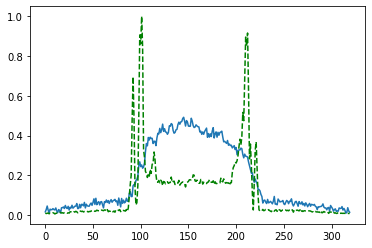

Time taken for epoch:  158.36680626869202
Epoch = [167/3000]  Iter = [   0/39480]  Loss = 0.1493 Avg Loss = 0.1493  Time = 0.0694s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [167/3000]  Iter = [ 100/39480]  Loss = 0.1886 Avg Loss = 0.1541  Time = 0.0036s
Epoch = [167/3000]  Iter = [ 200/39480]  Loss = 0.184 Avg Loss = 0.1547  Time = 0.0037s
Epoch = [167/3000]  Iter = [ 300/39480]  Loss = 0.1437 Avg Loss = 0.1544  Time = 0.0037s
Epoch = [167/3000]  Iter = [ 400/39480]  Loss = 0.1612 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [167/3000]  Iter = [ 500/39480]  Loss = 0.1596 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [167/3000]  Iter = [ 600/39480]  Loss = 0.16 Avg Loss = 0.1559  Time = 0.0033s
Epoch = [167/3000]  Iter = [ 700/39480]  Loss = 0.1366 Avg Loss = 0.1562  Time = 0.0033s
Epoch = [167/3000]  Iter = [ 800/39480]  Loss = 0.1592 Avg Loss = 0.156  Time = 0.0035s
Epoch = [167/3000]  Iter = [ 900/39480]  Loss = 0.1484 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [167/3000]  Iter = [1000/39480]  Loss = 0.1511 Avg Loss = 0.1543  Time = 0.0037s
Epoch = [167/3000]  Iter = [1100/39480]  Loss = 0.1611 Avg Loss = 0.1549  Time = 0.0035s
Epoch = [167/3000]  Iter 

Epoch = [167/3000]  Iter = [9400/39480]  Loss = 0.1427 Avg Loss = 0.157  Time = 0.0035s
Epoch = [167/3000]  Iter = [9500/39480]  Loss = 0.1662 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [167/3000]  Iter = [9600/39480]  Loss = 0.1856 Avg Loss = 0.1565  Time = 0.0033s
Epoch = [167/3000]  Iter = [9700/39480]  Loss = 0.1811 Avg Loss = 0.1574  Time = 0.0034s
Epoch = [167/3000]  Iter = [9800/39480]  Loss = 0.1613 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [167/3000]  Iter = [9900/39480]  Loss = 0.1594 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [167/3000]  Iter = [10000/39480]  Loss = 0.1436 Avg Loss = 0.1543  Time = 0.0038s
Epoch = [167/3000]  Iter = [10100/39480]  Loss = 0.1675 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [167/3000]  Iter = [10200/39480]  Loss = 0.1462 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [167/3000]  Iter = [10300/39480]  Loss = 0.1629 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [167/3000]  Iter = [10400/39480]  Loss = 0.1412 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [167/3000

Epoch = [167/3000]  Iter = [18600/39480]  Loss = 0.1517 Avg Loss = 0.1552  Time = 0.0034s
Epoch = [167/3000]  Iter = [18700/39480]  Loss = 0.1443 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [167/3000]  Iter = [18800/39480]  Loss = 0.1527 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [167/3000]  Iter = [18900/39480]  Loss = 0.1436 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [167/3000]  Iter = [19000/39480]  Loss = 0.1751 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [167/3000]  Iter = [19100/39480]  Loss = 0.1531 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [167/3000]  Iter = [19200/39480]  Loss = 0.1666 Avg Loss = 0.158  Time = 0.0037s
Epoch = [167/3000]  Iter = [19300/39480]  Loss = 0.1441 Avg Loss = 0.1566  Time = 0.0038s
Epoch = [167/3000]  Iter = [19400/39480]  Loss = 0.1529 Avg Loss = 0.158  Time = 0.0037s
Epoch = [167/3000]  Iter = [19500/39480]  Loss = 0.1392 Avg Loss = 0.159  Time = 0.0036s
Epoch = [167/3000]  Iter = [19600/39480]  Loss = 0.1584 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [167/

Epoch = [167/3000]  Iter = [27800/39480]  Loss = 0.1644 Avg Loss = 0.1565  Time = 0.0040s
Epoch = [167/3000]  Iter = [27900/39480]  Loss = 0.1571 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [167/3000]  Iter = [28000/39480]  Loss = 0.1516 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [167/3000]  Iter = [28100/39480]  Loss = 0.1482 Avg Loss = 0.161  Time = 0.0036s
Epoch = [167/3000]  Iter = [28200/39480]  Loss = 0.1708 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [167/3000]  Iter = [28300/39480]  Loss = 0.1561 Avg Loss = 0.1575  Time = 0.0034s
Epoch = [167/3000]  Iter = [28400/39480]  Loss = 0.1554 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [167/3000]  Iter = [28500/39480]  Loss = 0.1558 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [167/3000]  Iter = [28600/39480]  Loss = 0.1621 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [167/3000]  Iter = [28700/39480]  Loss = 0.1356 Avg Loss = 0.1585  Time = 0.0032s
Epoch = [167/3000]  Iter = [28800/39480]  Loss = 0.1512 Avg Loss = 0.1569  Time = 0.0032s
Epoch = [16

Epoch = [167/3000]  Iter = [37000/39480]  Loss = 0.1459 Avg Loss = 0.1549  Time = 0.0039s
Epoch = [167/3000]  Iter = [37100/39480]  Loss = 0.1661 Avg Loss = 0.1573  Time = 0.0035s
Epoch = [167/3000]  Iter = [37200/39480]  Loss = 0.1404 Avg Loss = 0.157  Time = 0.0035s
Epoch = [167/3000]  Iter = [37300/39480]  Loss = 0.1671 Avg Loss = 0.1552  Time = 0.0034s
Epoch = [167/3000]  Iter = [37400/39480]  Loss = 0.1547 Avg Loss = 0.1577  Time = 0.0034s
Epoch = [167/3000]  Iter = [37500/39480]  Loss = 0.1799 Avg Loss = 0.1568  Time = 0.0032s
Epoch = [167/3000]  Iter = [37600/39480]  Loss = 0.1666 Avg Loss = 0.1582  Time = 0.0034s
Epoch = [167/3000]  Iter = [37700/39480]  Loss = 0.1518 Avg Loss = 0.1591  Time = 0.0034s
Epoch = [167/3000]  Iter = [37800/39480]  Loss = 0.1598 Avg Loss = 0.1574  Time = 0.0034s
Epoch = [167/3000]  Iter = [37900/39480]  Loss = 0.1642 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [167/3000]  Iter = [38000/39480]  Loss = 0.1566 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [16

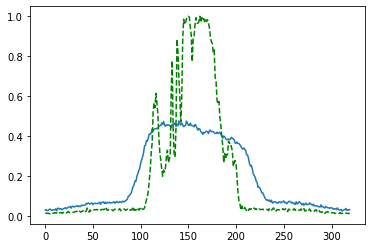

Time taken for epoch:  160.10388565063477
Epoch = [168/3000]  Iter = [   0/39480]  Loss = 0.1405 Avg Loss = 0.1405  Time = 0.0766s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [168/3000]  Iter = [ 100/39480]  Loss = 0.1501 Avg Loss = 0.151  Time = 0.0043s
Epoch = [168/3000]  Iter = [ 200/39480]  Loss = 0.1414 Avg Loss = 0.1519  Time = 0.0042s
Epoch = [168/3000]  Iter = [ 300/39480]  Loss = 0.1575 Avg Loss = 0.1542  Time = 0.0041s
Epoch = [168/3000]  Iter = [ 400/39480]  Loss = 0.1789 Avg Loss = 0.1575  Time = 0.0044s
Epoch = [168/3000]  Iter = [ 500/39480]  Loss = 0.1647 Avg Loss = 0.1552  Time = 0.0041s
Epoch = [168/3000]  Iter = [ 600/39480]  Loss = 0.1537 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [168/3000]  Iter = [ 700/39480]  Loss = 0.1569 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [168/3000]  Iter = [ 800/39480]  Loss = 0.1612 Avg Loss = 0.156  Time = 0.0038s
Epoch = [168/3000]  Iter = [ 900/39480]  Loss = 0.1391 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [168/3000]  Iter = [1000/39480]  Loss = 0.1379 Avg Loss = 0.155  Time = 0.0037s
Epoch = [168/3000]  Iter = [1100/39480]  Loss = 0.1507 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [168/3000]  Iter

Epoch = [168/3000]  Iter = [9400/39480]  Loss = 0.1616 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [168/3000]  Iter = [9500/39480]  Loss = 0.1524 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [168/3000]  Iter = [9600/39480]  Loss = 0.1568 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [168/3000]  Iter = [9700/39480]  Loss = 0.1508 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [168/3000]  Iter = [9800/39480]  Loss = 0.1728 Avg Loss = 0.1573  Time = 0.0039s
Epoch = [168/3000]  Iter = [9900/39480]  Loss = 0.15 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [168/3000]  Iter = [10000/39480]  Loss = 0.169 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [168/3000]  Iter = [10100/39480]  Loss = 0.1681 Avg Loss = 0.1578  Time = 0.0057s
Epoch = [168/3000]  Iter = [10200/39480]  Loss = 0.1493 Avg Loss = 0.1568  Time = 0.0038s
Epoch = [168/3000]  Iter = [10300/39480]  Loss = 0.1657 Avg Loss = 0.1556  Time = 0.0038s
Epoch = [168/3000]  Iter = [10400/39480]  Loss = 0.1601 Avg Loss = 0.1579  Time = 0.0038s
Epoch = [168/3000] 

Epoch = [168/3000]  Iter = [18600/39480]  Loss = 0.1389 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [168/3000]  Iter = [18700/39480]  Loss = 0.1427 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [168/3000]  Iter = [18800/39480]  Loss = 0.146 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [168/3000]  Iter = [18900/39480]  Loss = 0.1601 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [168/3000]  Iter = [19000/39480]  Loss = 0.1812 Avg Loss = 0.1589  Time = 0.0037s
Epoch = [168/3000]  Iter = [19100/39480]  Loss = 0.162 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [168/3000]  Iter = [19200/39480]  Loss = 0.17 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [168/3000]  Iter = [19300/39480]  Loss = 0.1752 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [168/3000]  Iter = [19400/39480]  Loss = 0.1453 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [168/3000]  Iter = [19500/39480]  Loss = 0.1566 Avg Loss = 0.1568  Time = 0.0034s
Epoch = [168/3000]  Iter = [19600/39480]  Loss = 0.1256 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [168/3

Epoch = [168/3000]  Iter = [27800/39480]  Loss = 0.1486 Avg Loss = 0.1591  Time = 0.0037s
Epoch = [168/3000]  Iter = [27900/39480]  Loss = 0.167 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [168/3000]  Iter = [28000/39480]  Loss = 0.1544 Avg Loss = 0.157  Time = 0.0036s
Epoch = [168/3000]  Iter = [28100/39480]  Loss = 0.1609 Avg Loss = 0.1585  Time = 0.0053s
Epoch = [168/3000]  Iter = [28200/39480]  Loss = 0.1506 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [168/3000]  Iter = [28300/39480]  Loss = 0.1396 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [168/3000]  Iter = [28400/39480]  Loss = 0.1554 Avg Loss = 0.1572  Time = 0.0039s
Epoch = [168/3000]  Iter = [28500/39480]  Loss = 0.1546 Avg Loss = 0.1547  Time = 0.0037s
Epoch = [168/3000]  Iter = [28600/39480]  Loss = 0.1483 Avg Loss = 0.1574  Time = 0.0032s
Epoch = [168/3000]  Iter = [28700/39480]  Loss = 0.138 Avg Loss = 0.1589  Time = 0.0033s
Epoch = [168/3000]  Iter = [28800/39480]  Loss = 0.1611 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [168/

Epoch = [168/3000]  Iter = [37000/39480]  Loss = 0.1604 Avg Loss = 0.1566  Time = 0.0032s
Epoch = [168/3000]  Iter = [37100/39480]  Loss = 0.1479 Avg Loss = 0.1557  Time = 0.0040s
Epoch = [168/3000]  Iter = [37200/39480]  Loss = 0.162 Avg Loss = 0.157  Time = 0.0034s
Epoch = [168/3000]  Iter = [37300/39480]  Loss = 0.1701 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [168/3000]  Iter = [37400/39480]  Loss = 0.1608 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [168/3000]  Iter = [37500/39480]  Loss = 0.1376 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [168/3000]  Iter = [37600/39480]  Loss = 0.1593 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [168/3000]  Iter = [37700/39480]  Loss = 0.172 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [168/3000]  Iter = [37800/39480]  Loss = 0.1596 Avg Loss = 0.1587  Time = 0.0038s
Epoch = [168/3000]  Iter = [37900/39480]  Loss = 0.1385 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [168/3000]  Iter = [38000/39480]  Loss = 0.1383 Avg Loss = 0.1555  Time = 0.0038s
Epoch = [168/

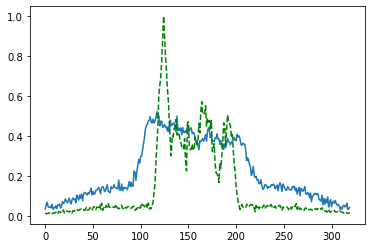

Time taken for epoch:  161.1114685535431
Epoch = [169/3000]  Iter = [   0/39480]  Loss = 0.1664 Avg Loss = 0.1664  Time = 0.0645s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [169/3000]  Iter = [ 100/39480]  Loss = 0.1733 Avg Loss = 0.1616  Time = 0.0038s
Epoch = [169/3000]  Iter = [ 200/39480]  Loss = 0.16 Avg Loss = 0.1584  Time = 0.0038s
Epoch = [169/3000]  Iter = [ 300/39480]  Loss = 0.1645 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [169/3000]  Iter = [ 400/39480]  Loss = 0.1325 Avg Loss = 0.156  Time = 0.0036s
Epoch = [169/3000]  Iter = [ 500/39480]  Loss = 0.1575 Avg Loss = 0.1572  Time = 0.0038s
Epoch = [169/3000]  Iter = [ 600/39480]  Loss = 0.1626 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [169/3000]  Iter = [ 700/39480]  Loss = 0.1656 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [169/3000]  Iter = [ 800/39480]  Loss = 0.1693 Avg Loss = 0.1547  Time = 0.0037s
Epoch = [169/3000]  Iter = [ 900/39480]  Loss = 0.1933 Avg Loss = 0.1551  Time = 0.0035s
Epoch = [169/3000]  Iter = [1000/39480]  Loss = 0.1466 Avg Loss = 0.1539  Time = 0.0037s
Epoch = [169/3000]  Iter = [1100/39480]  Loss = 0.1528 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [169/3000]  Iter

Epoch = [169/3000]  Iter = [9400/39480]  Loss = 0.1628 Avg Loss = 0.158  Time = 0.0037s
Epoch = [169/3000]  Iter = [9500/39480]  Loss = 0.1587 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [169/3000]  Iter = [9600/39480]  Loss = 0.1733 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [169/3000]  Iter = [9700/39480]  Loss = 0.161 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [169/3000]  Iter = [9800/39480]  Loss = 0.1538 Avg Loss = 0.1554  Time = 0.0033s
Epoch = [169/3000]  Iter = [9900/39480]  Loss = 0.1437 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [169/3000]  Iter = [10000/39480]  Loss = 0.1516 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [169/3000]  Iter = [10100/39480]  Loss = 0.1462 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [169/3000]  Iter = [10200/39480]  Loss = 0.162 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [169/3000]  Iter = [10300/39480]  Loss = 0.14 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [169/3000]  Iter = [10400/39480]  Loss = 0.128 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [169/3000]  It

Epoch = [169/3000]  Iter = [18600/39480]  Loss = 0.1545 Avg Loss = 0.155  Time = 0.0037s
Epoch = [169/3000]  Iter = [18700/39480]  Loss = 0.1615 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [169/3000]  Iter = [18800/39480]  Loss = 0.1586 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [169/3000]  Iter = [18900/39480]  Loss = 0.1495 Avg Loss = 0.157  Time = 0.0037s
Epoch = [169/3000]  Iter = [19000/39480]  Loss = 0.1354 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [169/3000]  Iter = [19100/39480]  Loss = 0.1329 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [169/3000]  Iter = [19200/39480]  Loss = 0.151 Avg Loss = 0.1561  Time = 0.0033s
Epoch = [169/3000]  Iter = [19300/39480]  Loss = 0.1252 Avg Loss = 0.1553  Time = 0.0039s
Epoch = [169/3000]  Iter = [19400/39480]  Loss = 0.1582 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [169/3000]  Iter = [19500/39480]  Loss = 0.1531 Avg Loss = 0.1548  Time = 0.0036s
Epoch = [169/3000]  Iter = [19600/39480]  Loss = 0.141 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [169/3

Epoch = [169/3000]  Iter = [27800/39480]  Loss = 0.1399 Avg Loss = 0.1583  Time = 0.0033s
Epoch = [169/3000]  Iter = [27900/39480]  Loss = 0.1523 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [169/3000]  Iter = [28000/39480]  Loss = 0.1558 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [169/3000]  Iter = [28100/39480]  Loss = 0.1943 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [169/3000]  Iter = [28200/39480]  Loss = 0.1749 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [169/3000]  Iter = [28300/39480]  Loss = 0.1566 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [169/3000]  Iter = [28400/39480]  Loss = 0.1498 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [169/3000]  Iter = [28500/39480]  Loss = 0.156 Avg Loss = 0.156  Time = 0.0036s
Epoch = [169/3000]  Iter = [28600/39480]  Loss = 0.1738 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [169/3000]  Iter = [28700/39480]  Loss = 0.1621 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [169/3000]  Iter = [28800/39480]  Loss = 0.17 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [169/3

Epoch = [169/3000]  Iter = [37000/39480]  Loss = 0.1803 Avg Loss = 0.1582  Time = 0.0040s
Epoch = [169/3000]  Iter = [37100/39480]  Loss = 0.1484 Avg Loss = 0.157  Time = 0.0037s
Epoch = [169/3000]  Iter = [37200/39480]  Loss = 0.1554 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [169/3000]  Iter = [37300/39480]  Loss = 0.1778 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [169/3000]  Iter = [37400/39480]  Loss = 0.1707 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [169/3000]  Iter = [37500/39480]  Loss = 0.1569 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [169/3000]  Iter = [37600/39480]  Loss = 0.1471 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [169/3000]  Iter = [37700/39480]  Loss = 0.168 Avg Loss = 0.1582  Time = 0.0034s
Epoch = [169/3000]  Iter = [37800/39480]  Loss = 0.1871 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [169/3000]  Iter = [37900/39480]  Loss = 0.1421 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [169/3000]  Iter = [38000/39480]  Loss = 0.158 Avg Loss = 0.156  Time = 0.0036s
Epoch = [169/3

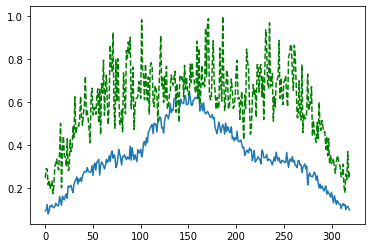

Time taken for epoch:  160.22038769721985
Epoch = [170/3000]  Iter = [   0/39480]  Loss = 0.1786 Avg Loss = 0.1786  Time = 0.0647s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [170/3000]  Iter = [ 100/39480]  Loss = 0.1656 Avg Loss = 0.1645  Time = 0.0043s
Epoch = [170/3000]  Iter = [ 200/39480]  Loss = 0.1645 Avg Loss = 0.1598  Time = 0.0035s
Epoch = [170/3000]  Iter = [ 300/39480]  Loss = 0.1821 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [170/3000]  Iter = [ 400/39480]  Loss = 0.1662 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [170/3000]  Iter = [ 500/39480]  Loss = 0.1647 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [170/3000]  Iter = [ 600/39480]  Loss = 0.1404 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [170/3000]  Iter = [ 700/39480]  Loss = 0.1736 Avg Loss = 0.155  Time = 0.0037s
Epoch = [170/3000]  Iter = [ 800/39480]  Loss = 0.1366 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [170/3000]  Iter = [ 900/39480]  Loss = 0.1542 Avg Loss = 0.1545  Time = 0.0037s
Epoch = [170/3000]  Iter = [1000/39480]  Loss = 0.1503 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [170/3000]  Iter = [1100/39480]  Loss = 0.1468 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [170/3000]  It

Epoch = [170/3000]  Iter = [9400/39480]  Loss = 0.1439 Avg Loss = 0.1563  Time = 0.0038s
Epoch = [170/3000]  Iter = [9500/39480]  Loss = 0.1538 Avg Loss = 0.1563  Time = 0.0039s
Epoch = [170/3000]  Iter = [9600/39480]  Loss = 0.1653 Avg Loss = 0.1565  Time = 0.0039s
Epoch = [170/3000]  Iter = [9700/39480]  Loss = 0.1288 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [170/3000]  Iter = [9800/39480]  Loss = 0.1548 Avg Loss = 0.1573  Time = 0.0039s
Epoch = [170/3000]  Iter = [9900/39480]  Loss = 0.1421 Avg Loss = 0.1566  Time = 0.0038s
Epoch = [170/3000]  Iter = [10000/39480]  Loss = 0.175 Avg Loss = 0.157  Time = 0.0038s
Epoch = [170/3000]  Iter = [10100/39480]  Loss = 0.1435 Avg Loss = 0.1569  Time = 0.0038s
Epoch = [170/3000]  Iter = [10200/39480]  Loss = 0.1554 Avg Loss = 0.1579  Time = 0.0038s
Epoch = [170/3000]  Iter = [10300/39480]  Loss = 0.1549 Avg Loss = 0.1575  Time = 0.0053s
Epoch = [170/3000]  Iter = [10400/39480]  Loss = 0.1543 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [170/3000]

Epoch = [170/3000]  Iter = [18600/39480]  Loss = 0.1515 Avg Loss = 0.156  Time = 0.0036s
Epoch = [170/3000]  Iter = [18700/39480]  Loss = 0.1542 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [170/3000]  Iter = [18800/39480]  Loss = 0.1599 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [170/3000]  Iter = [18900/39480]  Loss = 0.1837 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [170/3000]  Iter = [19000/39480]  Loss = 0.1549 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [170/3000]  Iter = [19100/39480]  Loss = 0.1618 Avg Loss = 0.1568  Time = 0.0034s
Epoch = [170/3000]  Iter = [19200/39480]  Loss = 0.1709 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [170/3000]  Iter = [19300/39480]  Loss = 0.1796 Avg Loss = 0.158  Time = 0.0034s
Epoch = [170/3000]  Iter = [19400/39480]  Loss = 0.1558 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [170/3000]  Iter = [19500/39480]  Loss = 0.1582 Avg Loss = 0.1586  Time = 0.0038s
Epoch = [170/3000]  Iter = [19600/39480]  Loss = 0.1691 Avg Loss = 0.1596  Time = 0.0036s
Epoch = [170

Epoch = [170/3000]  Iter = [27800/39480]  Loss = 0.1292 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [170/3000]  Iter = [27900/39480]  Loss = 0.1755 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [170/3000]  Iter = [28000/39480]  Loss = 0.1526 Avg Loss = 0.1571  Time = 0.0034s
Epoch = [170/3000]  Iter = [28100/39480]  Loss = 0.1374 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [170/3000]  Iter = [28200/39480]  Loss = 0.1317 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [170/3000]  Iter = [28300/39480]  Loss = 0.1805 Avg Loss = 0.157  Time = 0.0037s
Epoch = [170/3000]  Iter = [28400/39480]  Loss = 0.1447 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [170/3000]  Iter = [28500/39480]  Loss = 0.1609 Avg Loss = 0.156  Time = 0.0035s
Epoch = [170/3000]  Iter = [28600/39480]  Loss = 0.1213 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [170/3000]  Iter = [28700/39480]  Loss = 0.1558 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [170/3000]  Iter = [28800/39480]  Loss = 0.1512 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [170

Epoch = [170/3000]  Iter = [37000/39480]  Loss = 0.1354 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [170/3000]  Iter = [37100/39480]  Loss = 0.1616 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [170/3000]  Iter = [37200/39480]  Loss = 0.1503 Avg Loss = 0.157  Time = 0.0037s
Epoch = [170/3000]  Iter = [37300/39480]  Loss = 0.1455 Avg Loss = 0.1563  Time = 0.0033s
Epoch = [170/3000]  Iter = [37400/39480]  Loss = 0.1474 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [170/3000]  Iter = [37500/39480]  Loss = 0.1615 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [170/3000]  Iter = [37600/39480]  Loss = 0.1663 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [170/3000]  Iter = [37700/39480]  Loss = 0.1578 Avg Loss = 0.1554  Time = 0.0032s
Epoch = [170/3000]  Iter = [37800/39480]  Loss = 0.1426 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [170/3000]  Iter = [37900/39480]  Loss = 0.1617 Avg Loss = 0.1573  Time = 0.0033s
Epoch = [170/3000]  Iter = [38000/39480]  Loss = 0.1491 Avg Loss = 0.1596  Time = 0.0036s
Epoch = [17

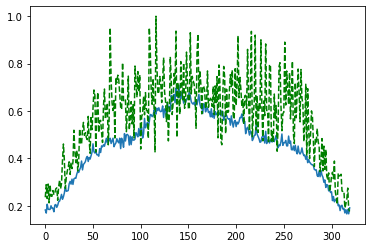

Time taken for epoch:  160.11198711395264
Epoch = [171/3000]  Iter = [   0/39480]  Loss = 0.1376 Avg Loss = 0.1376  Time = 0.0653s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [171/3000]  Iter = [ 100/39480]  Loss = 0.1617 Avg Loss = 0.1494  Time = 0.0036s
Epoch = [171/3000]  Iter = [ 200/39480]  Loss = 0.1308 Avg Loss = 0.1533  Time = 0.0036s
Epoch = [171/3000]  Iter = [ 300/39480]  Loss = 0.1453 Avg Loss = 0.1544  Time = 0.0033s
Epoch = [171/3000]  Iter = [ 400/39480]  Loss = 0.1444 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [171/3000]  Iter = [ 500/39480]  Loss = 0.155 Avg Loss = 0.1568  Time = 0.0038s
Epoch = [171/3000]  Iter = [ 600/39480]  Loss = 0.133 Avg Loss = 0.157  Time = 0.0038s
Epoch = [171/3000]  Iter = [ 700/39480]  Loss = 0.1551 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [171/3000]  Iter = [ 800/39480]  Loss = 0.1665 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [171/3000]  Iter = [ 900/39480]  Loss = 0.1469 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [171/3000]  Iter = [1000/39480]  Loss = 0.1487 Avg Loss = 0.1556  Time = 0.0033s
Epoch = [171/3000]  Iter = [1100/39480]  Loss = 0.1486 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [171/3000]  Iter

Epoch = [171/3000]  Iter = [9400/39480]  Loss = 0.1482 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [171/3000]  Iter = [9500/39480]  Loss = 0.152 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [171/3000]  Iter = [9600/39480]  Loss = 0.1648 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [171/3000]  Iter = [9700/39480]  Loss = 0.1765 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [171/3000]  Iter = [9800/39480]  Loss = 0.1491 Avg Loss = 0.1564  Time = 0.0032s
Epoch = [171/3000]  Iter = [9900/39480]  Loss = 0.1763 Avg Loss = 0.1588  Time = 0.0032s
Epoch = [171/3000]  Iter = [10000/39480]  Loss = 0.1454 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [171/3000]  Iter = [10100/39480]  Loss = 0.1784 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [171/3000]  Iter = [10200/39480]  Loss = 0.1599 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [171/3000]  Iter = [10300/39480]  Loss = 0.1687 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [171/3000]  Iter = [10400/39480]  Loss = 0.1763 Avg Loss = 0.1565  Time = 0.0034s
Epoch = [171/3000

Epoch = [171/3000]  Iter = [18600/39480]  Loss = 0.1599 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [171/3000]  Iter = [18700/39480]  Loss = 0.1424 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [171/3000]  Iter = [18800/39480]  Loss = 0.1484 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [171/3000]  Iter = [18900/39480]  Loss = 0.1589 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [171/3000]  Iter = [19000/39480]  Loss = 0.1646 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [171/3000]  Iter = [19100/39480]  Loss = 0.1702 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [171/3000]  Iter = [19200/39480]  Loss = 0.1648 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [171/3000]  Iter = [19300/39480]  Loss = 0.1764 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [171/3000]  Iter = [19400/39480]  Loss = 0.1346 Avg Loss = 0.1562  Time = 0.0032s
Epoch = [171/3000]  Iter = [19500/39480]  Loss = 0.1633 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [171/3000]  Iter = [19600/39480]  Loss = 0.1553 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [1

Epoch = [171/3000]  Iter = [27800/39480]  Loss = 0.1248 Avg Loss = 0.1571  Time = 0.0033s
Epoch = [171/3000]  Iter = [27900/39480]  Loss = 0.1744 Avg Loss = 0.1557  Time = 0.0033s
Epoch = [171/3000]  Iter = [28000/39480]  Loss = 0.1529 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [171/3000]  Iter = [28100/39480]  Loss = 0.1603 Avg Loss = 0.1554  Time = 0.0034s
Epoch = [171/3000]  Iter = [28200/39480]  Loss = 0.1634 Avg Loss = 0.1557  Time = 0.0035s
Epoch = [171/3000]  Iter = [28300/39480]  Loss = 0.1598 Avg Loss = 0.1558  Time = 0.0034s
Epoch = [171/3000]  Iter = [28400/39480]  Loss = 0.1406 Avg Loss = 0.1535  Time = 0.0034s
Epoch = [171/3000]  Iter = [28500/39480]  Loss = 0.1448 Avg Loss = 0.1537  Time = 0.0032s
Epoch = [171/3000]  Iter = [28600/39480]  Loss = 0.1221 Avg Loss = 0.1547  Time = 0.0035s
Epoch = [171/3000]  Iter = [28700/39480]  Loss = 0.1495 Avg Loss = 0.1559  Time = 0.0033s
Epoch = [171/3000]  Iter = [28800/39480]  Loss = 0.1599 Avg Loss = 0.1557  Time = 0.0035s
Epoch = [1

Epoch = [171/3000]  Iter = [37000/39480]  Loss = 0.1638 Avg Loss = 0.157  Time = 0.0036s
Epoch = [171/3000]  Iter = [37100/39480]  Loss = 0.1516 Avg Loss = 0.1566  Time = 0.0034s
Epoch = [171/3000]  Iter = [37200/39480]  Loss = 0.1439 Avg Loss = 0.1546  Time = 0.0036s
Epoch = [171/3000]  Iter = [37300/39480]  Loss = 0.1614 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [171/3000]  Iter = [37400/39480]  Loss = 0.1192 Avg Loss = 0.1543  Time = 0.0036s
Epoch = [171/3000]  Iter = [37500/39480]  Loss = 0.1679 Avg Loss = 0.156  Time = 0.0036s
Epoch = [171/3000]  Iter = [37600/39480]  Loss = 0.1563 Avg Loss = 0.1567  Time = 0.0032s
Epoch = [171/3000]  Iter = [37700/39480]  Loss = 0.1352 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [171/3000]  Iter = [37800/39480]  Loss = 0.1649 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [171/3000]  Iter = [37900/39480]  Loss = 0.1502 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [171/3000]  Iter = [38000/39480]  Loss = 0.188 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [171/

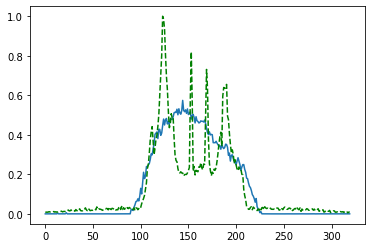

Time taken for epoch:  159.09699606895447
Epoch = [172/3000]  Iter = [   0/39480]  Loss = 0.1425 Avg Loss = 0.1425  Time = 0.0868s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [172/3000]  Iter = [ 100/39480]  Loss = 0.1767 Avg Loss = 0.1524  Time = 0.0036s
Epoch = [172/3000]  Iter = [ 200/39480]  Loss = 0.1413 Avg Loss = 0.1537  Time = 0.0037s
Epoch = [172/3000]  Iter = [ 300/39480]  Loss = 0.1771 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [172/3000]  Iter = [ 400/39480]  Loss = 0.1527 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [172/3000]  Iter = [ 500/39480]  Loss = 0.1619 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [172/3000]  Iter = [ 600/39480]  Loss = 0.1626 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [172/3000]  Iter = [ 700/39480]  Loss = 0.1524 Avg Loss = 0.156  Time = 0.0037s
Epoch = [172/3000]  Iter = [ 800/39480]  Loss = 0.1712 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [172/3000]  Iter = [ 900/39480]  Loss = 0.1528 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [172/3000]  Iter = [1000/39480]  Loss = 0.1371 Avg Loss = 0.1556  Time = 0.0033s
Epoch = [172/3000]  Iter = [1100/39480]  Loss = 0.1578 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [172/3000]  It

Epoch = [172/3000]  Iter = [9400/39480]  Loss = 0.1459 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [172/3000]  Iter = [9500/39480]  Loss = 0.1564 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [172/3000]  Iter = [9600/39480]  Loss = 0.1464 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [172/3000]  Iter = [9700/39480]  Loss = 0.1628 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [172/3000]  Iter = [9800/39480]  Loss = 0.1562 Avg Loss = 0.156  Time = 0.0037s
Epoch = [172/3000]  Iter = [9900/39480]  Loss = 0.1465 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [172/3000]  Iter = [10000/39480]  Loss = 0.1628 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [172/3000]  Iter = [10100/39480]  Loss = 0.1571 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [172/3000]  Iter = [10200/39480]  Loss = 0.1443 Avg Loss = 0.1558  Time = 0.0035s
Epoch = [172/3000]  Iter = [10300/39480]  Loss = 0.1973 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [172/3000]  Iter = [10400/39480]  Loss = 0.1518 Avg Loss = 0.1563  Time = 0.0033s
Epoch = [172/3000

Epoch = [172/3000]  Iter = [18600/39480]  Loss = 0.1638 Avg Loss = 0.158  Time = 0.0032s
Epoch = [172/3000]  Iter = [18700/39480]  Loss = 0.137 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [172/3000]  Iter = [18800/39480]  Loss = 0.1627 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [172/3000]  Iter = [18900/39480]  Loss = 0.1731 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [172/3000]  Iter = [19000/39480]  Loss = 0.1429 Avg Loss = 0.1577  Time = 0.0034s
Epoch = [172/3000]  Iter = [19100/39480]  Loss = 0.1627 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [172/3000]  Iter = [19200/39480]  Loss = 0.1464 Avg Loss = 0.1572  Time = 0.0032s
Epoch = [172/3000]  Iter = [19300/39480]  Loss = 0.1728 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [172/3000]  Iter = [19400/39480]  Loss = 0.1498 Avg Loss = 0.1574  Time = 0.0035s
Epoch = [172/3000]  Iter = [19500/39480]  Loss = 0.1493 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [172/3000]  Iter = [19600/39480]  Loss = 0.146 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [172/

Epoch = [172/3000]  Iter = [27800/39480]  Loss = 0.1493 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [172/3000]  Iter = [27900/39480]  Loss = 0.1506 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [172/3000]  Iter = [28000/39480]  Loss = 0.1701 Avg Loss = 0.1587  Time = 0.0037s
Epoch = [172/3000]  Iter = [28100/39480]  Loss = 0.1515 Avg Loss = 0.1575  Time = 0.0038s
Epoch = [172/3000]  Iter = [28200/39480]  Loss = 0.1706 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [172/3000]  Iter = [28300/39480]  Loss = 0.1523 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [172/3000]  Iter = [28400/39480]  Loss = 0.157 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [172/3000]  Iter = [28500/39480]  Loss = 0.1404 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [172/3000]  Iter = [28600/39480]  Loss = 0.1588 Avg Loss = 0.1577  Time = 0.0032s
Epoch = [172/3000]  Iter = [28700/39480]  Loss = 0.1305 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [172/3000]  Iter = [28800/39480]  Loss = 0.1435 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [17

Epoch = [172/3000]  Iter = [37000/39480]  Loss = 0.1403 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [172/3000]  Iter = [37100/39480]  Loss = 0.1402 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [172/3000]  Iter = [37200/39480]  Loss = 0.1441 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [172/3000]  Iter = [37300/39480]  Loss = 0.1578 Avg Loss = 0.157  Time = 0.0033s
Epoch = [172/3000]  Iter = [37400/39480]  Loss = 0.1567 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [172/3000]  Iter = [37500/39480]  Loss = 0.1561 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [172/3000]  Iter = [37600/39480]  Loss = 0.1634 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [172/3000]  Iter = [37700/39480]  Loss = 0.1585 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [172/3000]  Iter = [37800/39480]  Loss = 0.1566 Avg Loss = 0.1561  Time = 0.0038s
Epoch = [172/3000]  Iter = [37900/39480]  Loss = 0.1736 Avg Loss = 0.1571  Time = 0.0038s
Epoch = [172/3000]  Iter = [38000/39480]  Loss = 0.1721 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [17

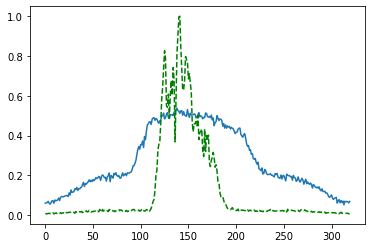

Time taken for epoch:  161.03167462348938
Epoch = [173/3000]  Iter = [   0/39480]  Loss = 0.1438 Avg Loss = 0.1438  Time = 0.0641s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [173/3000]  Iter = [ 100/39480]  Loss = 0.156 Avg Loss = 0.1523  Time = 0.0029s
Epoch = [173/3000]  Iter = [ 200/39480]  Loss = 0.1472 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [173/3000]  Iter = [ 300/39480]  Loss = 0.1569 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [173/3000]  Iter = [ 400/39480]  Loss = 0.1466 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [173/3000]  Iter = [ 500/39480]  Loss = 0.1623 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [173/3000]  Iter = [ 600/39480]  Loss = 0.1742 Avg Loss = 0.155  Time = 0.0037s
Epoch = [173/3000]  Iter = [ 700/39480]  Loss = 0.1584 Avg Loss = 0.1545  Time = 0.0032s
Epoch = [173/3000]  Iter = [ 800/39480]  Loss = 0.1566 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [173/3000]  Iter = [ 900/39480]  Loss = 0.1742 Avg Loss = 0.1563  Time = 0.0046s
Epoch = [173/3000]  Iter = [1000/39480]  Loss = 0.1621 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [173/3000]  Iter = [1100/39480]  Loss = 0.1593 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [173/3000]  Ite

Epoch = [173/3000]  Iter = [9400/39480]  Loss = 0.1505 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [173/3000]  Iter = [9500/39480]  Loss = 0.1661 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [173/3000]  Iter = [9600/39480]  Loss = 0.1944 Avg Loss = 0.1542  Time = 0.0036s
Epoch = [173/3000]  Iter = [9700/39480]  Loss = 0.1595 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [173/3000]  Iter = [9800/39480]  Loss = 0.1821 Avg Loss = 0.1554  Time = 0.0035s
Epoch = [173/3000]  Iter = [9900/39480]  Loss = 0.1503 Avg Loss = 0.1565  Time = 0.0032s
Epoch = [173/3000]  Iter = [10000/39480]  Loss = 0.1757 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [173/3000]  Iter = [10100/39480]  Loss = 0.1536 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [173/3000]  Iter = [10200/39480]  Loss = 0.1571 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [173/3000]  Iter = [10300/39480]  Loss = 0.1578 Avg Loss = 0.1564  Time = 0.0033s
Epoch = [173/3000]  Iter = [10400/39480]  Loss = 0.1734 Avg Loss = 0.1571  Time = 0.0041s
Epoch = [173/300

Epoch = [173/3000]  Iter = [18600/39480]  Loss = 0.1553 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [173/3000]  Iter = [18700/39480]  Loss = 0.1633 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [173/3000]  Iter = [18800/39480]  Loss = 0.1553 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [173/3000]  Iter = [18900/39480]  Loss = 0.17 Avg Loss = 0.1562  Time = 0.0035s
Epoch = [173/3000]  Iter = [19000/39480]  Loss = 0.1218 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [173/3000]  Iter = [19100/39480]  Loss = 0.1563 Avg Loss = 0.1548  Time = 0.0032s
Epoch = [173/3000]  Iter = [19200/39480]  Loss = 0.1802 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [173/3000]  Iter = [19300/39480]  Loss = 0.1797 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [173/3000]  Iter = [19400/39480]  Loss = 0.1431 Avg Loss = 0.156  Time = 0.0037s
Epoch = [173/3000]  Iter = [19500/39480]  Loss = 0.1744 Avg Loss = 0.157  Time = 0.0037s
Epoch = [173/3000]  Iter = [19600/39480]  Loss = 0.1619 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [173/3

Epoch = [173/3000]  Iter = [27800/39480]  Loss = 0.1678 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [173/3000]  Iter = [27900/39480]  Loss = 0.128 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [173/3000]  Iter = [28000/39480]  Loss = 0.1658 Avg Loss = 0.1574  Time = 0.0038s
Epoch = [173/3000]  Iter = [28100/39480]  Loss = 0.1611 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [173/3000]  Iter = [28200/39480]  Loss = 0.1419 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [173/3000]  Iter = [28300/39480]  Loss = 0.1396 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [173/3000]  Iter = [28400/39480]  Loss = 0.1455 Avg Loss = 0.1585  Time = 0.0032s
Epoch = [173/3000]  Iter = [28500/39480]  Loss = 0.1486 Avg Loss = 0.1587  Time = 0.0033s
Epoch = [173/3000]  Iter = [28600/39480]  Loss = 0.1421 Avg Loss = 0.1592  Time = 0.0036s
Epoch = [173/3000]  Iter = [28700/39480]  Loss = 0.1741 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [173/3000]  Iter = [28800/39480]  Loss = 0.1734 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [17

Epoch = [173/3000]  Iter = [37000/39480]  Loss = 0.1561 Avg Loss = 0.1592  Time = 0.0037s
Epoch = [173/3000]  Iter = [37100/39480]  Loss = 0.1677 Avg Loss = 0.1563  Time = 0.0034s
Epoch = [173/3000]  Iter = [37200/39480]  Loss = 0.1686 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [173/3000]  Iter = [37300/39480]  Loss = 0.1555 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [173/3000]  Iter = [37400/39480]  Loss = 0.1494 Avg Loss = 0.156  Time = 0.0037s
Epoch = [173/3000]  Iter = [37500/39480]  Loss = 0.156 Avg Loss = 0.1575  Time = 0.0033s
Epoch = [173/3000]  Iter = [37600/39480]  Loss = 0.1576 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [173/3000]  Iter = [37700/39480]  Loss = 0.1749 Avg Loss = 0.1557  Time = 0.0032s
Epoch = [173/3000]  Iter = [37800/39480]  Loss = 0.1554 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [173/3000]  Iter = [37900/39480]  Loss = 0.1612 Avg Loss = 0.157  Time = 0.0036s
Epoch = [173/3000]  Iter = [38000/39480]  Loss = 0.1488 Avg Loss = 0.1555  Time = 0.0035s
Epoch = [173/

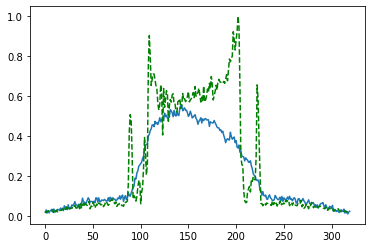

Time taken for epoch:  161.1314251422882
Epoch = [174/3000]  Iter = [   0/39480]  Loss = 0.1674 Avg Loss = 0.1674  Time = 0.0648s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [174/3000]  Iter = [ 100/39480]  Loss = 0.1697 Avg Loss = 0.1598  Time = 0.0036s
Epoch = [174/3000]  Iter = [ 200/39480]  Loss = 0.1619 Avg Loss = 0.1583  Time = 0.0032s
Epoch = [174/3000]  Iter = [ 300/39480]  Loss = 0.1457 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [174/3000]  Iter = [ 400/39480]  Loss = 0.1572 Avg Loss = 0.1555  Time = 0.0038s
Epoch = [174/3000]  Iter = [ 500/39480]  Loss = 0.1588 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [174/3000]  Iter = [ 600/39480]  Loss = 0.1595 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [174/3000]  Iter = [ 700/39480]  Loss = 0.1746 Avg Loss = 0.156  Time = 0.0038s
Epoch = [174/3000]  Iter = [ 800/39480]  Loss = 0.1562 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [174/3000]  Iter = [ 900/39480]  Loss = 0.1538 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [174/3000]  Iter = [1000/39480]  Loss = 0.1273 Avg Loss = 0.1561  Time = 0.0033s
Epoch = [174/3000]  Iter = [1100/39480]  Loss = 0.1852 Avg Loss = 0.1558  Time = 0.0038s
Epoch = [174/3000]  It

Epoch = [174/3000]  Iter = [9400/39480]  Loss = 0.1481 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [174/3000]  Iter = [9500/39480]  Loss = 0.169 Avg Loss = 0.1589  Time = 0.0032s
Epoch = [174/3000]  Iter = [9600/39480]  Loss = 0.1629 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [174/3000]  Iter = [9700/39480]  Loss = 0.1704 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [174/3000]  Iter = [9800/39480]  Loss = 0.1551 Avg Loss = 0.157  Time = 0.0037s
Epoch = [174/3000]  Iter = [9900/39480]  Loss = 0.1495 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [174/3000]  Iter = [10000/39480]  Loss = 0.1585 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [174/3000]  Iter = [10100/39480]  Loss = 0.1463 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [174/3000]  Iter = [10200/39480]  Loss = 0.1233 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [174/3000]  Iter = [10300/39480]  Loss = 0.1553 Avg Loss = 0.155  Time = 0.0028s
Epoch = [174/3000]  Iter = [10400/39480]  Loss = 0.1508 Avg Loss = 0.1566  Time = 0.0030s
Epoch = [174/3000] 

Epoch = [174/3000]  Iter = [18600/39480]  Loss = 0.1497 Avg Loss = 0.1553  Time = 0.0035s
Epoch = [174/3000]  Iter = [18700/39480]  Loss = 0.1397 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [174/3000]  Iter = [18800/39480]  Loss = 0.1432 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [174/3000]  Iter = [18900/39480]  Loss = 0.1523 Avg Loss = 0.157  Time = 0.0037s
Epoch = [174/3000]  Iter = [19000/39480]  Loss = 0.1322 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [174/3000]  Iter = [19100/39480]  Loss = 0.1493 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [174/3000]  Iter = [19200/39480]  Loss = 0.1588 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [174/3000]  Iter = [19300/39480]  Loss = 0.1754 Avg Loss = 0.159  Time = 0.0036s
Epoch = [174/3000]  Iter = [19400/39480]  Loss = 0.1691 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [174/3000]  Iter = [19500/39480]  Loss = 0.1762 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [174/3000]  Iter = [19600/39480]  Loss = 0.1666 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [174

Epoch = [174/3000]  Iter = [27800/39480]  Loss = 0.163 Avg Loss = 0.1571  Time = 0.0035s
Epoch = [174/3000]  Iter = [27900/39480]  Loss = 0.1723 Avg Loss = 0.1578  Time = 0.0035s
Epoch = [174/3000]  Iter = [28000/39480]  Loss = 0.1919 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [174/3000]  Iter = [28100/39480]  Loss = 0.1787 Avg Loss = 0.1554  Time = 0.0035s
Epoch = [174/3000]  Iter = [28200/39480]  Loss = 0.1629 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [174/3000]  Iter = [28300/39480]  Loss = 0.1498 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [174/3000]  Iter = [28400/39480]  Loss = 0.1627 Avg Loss = 0.1594  Time = 0.0037s
Epoch = [174/3000]  Iter = [28500/39480]  Loss = 0.1561 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [174/3000]  Iter = [28600/39480]  Loss = 0.1565 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [174/3000]  Iter = [28700/39480]  Loss = 0.1773 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [174/3000]  Iter = [28800/39480]  Loss = 0.1821 Avg Loss = 0.156  Time = 0.0037s
Epoch = [174

Epoch = [174/3000]  Iter = [37000/39480]  Loss = 0.1576 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [174/3000]  Iter = [37100/39480]  Loss = 0.1455 Avg Loss = 0.1554  Time = 0.0032s
Epoch = [174/3000]  Iter = [37200/39480]  Loss = 0.1475 Avg Loss = 0.155  Time = 0.0037s
Epoch = [174/3000]  Iter = [37300/39480]  Loss = 0.1765 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [174/3000]  Iter = [37400/39480]  Loss = 0.1518 Avg Loss = 0.157  Time = 0.0033s
Epoch = [174/3000]  Iter = [37500/39480]  Loss = 0.1963 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [174/3000]  Iter = [37600/39480]  Loss = 0.1747 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [174/3000]  Iter = [37700/39480]  Loss = 0.149 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [174/3000]  Iter = [37800/39480]  Loss = 0.1724 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [174/3000]  Iter = [37900/39480]  Loss = 0.141 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [174/3000]  Iter = [38000/39480]  Loss = 0.1663 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [174/3

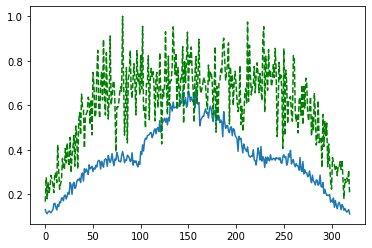

Time taken for epoch:  160.83810591697693
Epoch = [175/3000]  Iter = [   0/39480]  Loss = 0.1367 Avg Loss = 0.1367  Time = 0.0661s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [175/3000]  Iter = [ 100/39480]  Loss = 0.1677 Avg Loss = 0.1477  Time = 0.0037s
Epoch = [175/3000]  Iter = [ 200/39480]  Loss = 0.133 Avg Loss = 0.1515  Time = 0.0039s
Epoch = [175/3000]  Iter = [ 300/39480]  Loss = 0.1642 Avg Loss = 0.1552  Time = 0.0040s
Epoch = [175/3000]  Iter = [ 400/39480]  Loss = 0.1738 Avg Loss = 0.1555  Time = 0.0040s
Epoch = [175/3000]  Iter = [ 500/39480]  Loss = 0.1498 Avg Loss = 0.1551  Time = 0.0040s
Epoch = [175/3000]  Iter = [ 600/39480]  Loss = 0.1429 Avg Loss = 0.1557  Time = 0.0040s
Epoch = [175/3000]  Iter = [ 700/39480]  Loss = 0.1443 Avg Loss = 0.1558  Time = 0.0039s
Epoch = [175/3000]  Iter = [ 800/39480]  Loss = 0.1611 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [175/3000]  Iter = [ 900/39480]  Loss = 0.1617 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [175/3000]  Iter = [1000/39480]  Loss = 0.1427 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [175/3000]  Iter = [1100/39480]  Loss = 0.1541 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [175/3000]  It

Epoch = [175/3000]  Iter = [9400/39480]  Loss = 0.1246 Avg Loss = 0.1533  Time = 0.0034s
Epoch = [175/3000]  Iter = [9500/39480]  Loss = 0.1575 Avg Loss = 0.155  Time = 0.0034s
Epoch = [175/3000]  Iter = [9600/39480]  Loss = 0.1547 Avg Loss = 0.1557  Time = 0.0043s
Epoch = [175/3000]  Iter = [9700/39480]  Loss = 0.1652 Avg Loss = 0.1559  Time = 0.0032s
Epoch = [175/3000]  Iter = [9800/39480]  Loss = 0.1566 Avg Loss = 0.1565  Time = 0.0060s
Epoch = [175/3000]  Iter = [9900/39480]  Loss = 0.1648 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [175/3000]  Iter = [10000/39480]  Loss = 0.1738 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [175/3000]  Iter = [10100/39480]  Loss = 0.1665 Avg Loss = 0.1589  Time = 0.0036s
Epoch = [175/3000]  Iter = [10200/39480]  Loss = 0.1499 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [175/3000]  Iter = [10300/39480]  Loss = 0.1835 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [175/3000]  Iter = [10400/39480]  Loss = 0.1539 Avg Loss = 0.1554  Time = 0.0035s
Epoch = [175/3000

Epoch = [175/3000]  Iter = [18600/39480]  Loss = 0.1507 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [175/3000]  Iter = [18700/39480]  Loss = 0.1279 Avg Loss = 0.1577  Time = 0.0034s
Epoch = [175/3000]  Iter = [18800/39480]  Loss = 0.1754 Avg Loss = 0.1587  Time = 0.0036s
Epoch = [175/3000]  Iter = [18900/39480]  Loss = 0.1588 Avg Loss = 0.1577  Time = 0.0032s
Epoch = [175/3000]  Iter = [19000/39480]  Loss = 0.1479 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [175/3000]  Iter = [19100/39480]  Loss = 0.173 Avg Loss = 0.157  Time = 0.0036s
Epoch = [175/3000]  Iter = [19200/39480]  Loss = 0.1573 Avg Loss = 0.157  Time = 0.0036s
Epoch = [175/3000]  Iter = [19300/39480]  Loss = 0.1721 Avg Loss = 0.1568  Time = 0.0033s
Epoch = [175/3000]  Iter = [19400/39480]  Loss = 0.1559 Avg Loss = 0.1543  Time = 0.0037s
Epoch = [175/3000]  Iter = [19500/39480]  Loss = 0.1502 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [175/3000]  Iter = [19600/39480]  Loss = 0.1727 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [175/

Epoch = [175/3000]  Iter = [27800/39480]  Loss = 0.1675 Avg Loss = 0.1567  Time = 0.0034s
Epoch = [175/3000]  Iter = [27900/39480]  Loss = 0.1577 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [175/3000]  Iter = [28000/39480]  Loss = 0.1714 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [175/3000]  Iter = [28100/39480]  Loss = 0.148 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [175/3000]  Iter = [28200/39480]  Loss = 0.124 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [175/3000]  Iter = [28300/39480]  Loss = 0.1746 Avg Loss = 0.1573  Time = 0.0035s
Epoch = [175/3000]  Iter = [28400/39480]  Loss = 0.1629 Avg Loss = 0.1587  Time = 0.0033s
Epoch = [175/3000]  Iter = [28500/39480]  Loss = 0.1754 Avg Loss = 0.158  Time = 0.0036s
Epoch = [175/3000]  Iter = [28600/39480]  Loss = 0.1394 Avg Loss = 0.1586  Time = 0.0036s
Epoch = [175/3000]  Iter = [28700/39480]  Loss = 0.1448 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [175/3000]  Iter = [28800/39480]  Loss = 0.1297 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [175/

Epoch = [175/3000]  Iter = [37000/39480]  Loss = 0.1707 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [175/3000]  Iter = [37100/39480]  Loss = 0.1447 Avg Loss = 0.1579  Time = 0.0041s
Epoch = [175/3000]  Iter = [37200/39480]  Loss = 0.1477 Avg Loss = 0.1572  Time = 0.0039s
Epoch = [175/3000]  Iter = [37300/39480]  Loss = 0.1869 Avg Loss = 0.158  Time = 0.0041s
Epoch = [175/3000]  Iter = [37400/39480]  Loss = 0.1548 Avg Loss = 0.1583  Time = 0.0040s
Epoch = [175/3000]  Iter = [37500/39480]  Loss = 0.165 Avg Loss = 0.1558  Time = 0.0040s
Epoch = [175/3000]  Iter = [37600/39480]  Loss = 0.1533 Avg Loss = 0.1564  Time = 0.0040s
Epoch = [175/3000]  Iter = [37700/39480]  Loss = 0.1525 Avg Loss = 0.1582  Time = 0.0041s
Epoch = [175/3000]  Iter = [37800/39480]  Loss = 0.1448 Avg Loss = 0.1585  Time = 0.0038s
Epoch = [175/3000]  Iter = [37900/39480]  Loss = 0.1562 Avg Loss = 0.1575  Time = 0.0041s
Epoch = [175/3000]  Iter = [38000/39480]  Loss = 0.1573 Avg Loss = 0.1582  Time = 0.0040s
Epoch = [175

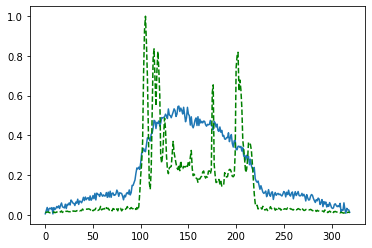

Time taken for epoch:  162.0876157283783
Epoch = [176/3000]  Iter = [   0/39480]  Loss = 0.1493 Avg Loss = 0.1493  Time = 0.0668s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [176/3000]  Iter = [ 100/39480]  Loss = 0.1523 Avg Loss = 0.1538  Time = 0.0037s
Epoch = [176/3000]  Iter = [ 200/39480]  Loss = 0.1615 Avg Loss = 0.1547  Time = 0.0037s
Epoch = [176/3000]  Iter = [ 300/39480]  Loss = 0.1682 Avg Loss = 0.1544  Time = 0.0037s
Epoch = [176/3000]  Iter = [ 400/39480]  Loss = 0.1525 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [176/3000]  Iter = [ 500/39480]  Loss = 0.153 Avg Loss = 0.155  Time = 0.0037s
Epoch = [176/3000]  Iter = [ 600/39480]  Loss = 0.1422 Avg Loss = 0.1554  Time = 0.0038s
Epoch = [176/3000]  Iter = [ 700/39480]  Loss = 0.1393 Avg Loss = 0.1558  Time = 0.0038s
Epoch = [176/3000]  Iter = [ 800/39480]  Loss = 0.1407 Avg Loss = 0.157  Time = 0.0036s
Epoch = [176/3000]  Iter = [ 900/39480]  Loss = 0.1577 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [176/3000]  Iter = [1000/39480]  Loss = 0.147 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [176/3000]  Iter = [1100/39480]  Loss = 0.161 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [176/3000]  Iter =

Epoch = [176/3000]  Iter = [9400/39480]  Loss = 0.1574 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [176/3000]  Iter = [9500/39480]  Loss = 0.1494 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [176/3000]  Iter = [9600/39480]  Loss = 0.1908 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [176/3000]  Iter = [9700/39480]  Loss = 0.1584 Avg Loss = 0.1584  Time = 0.0034s
Epoch = [176/3000]  Iter = [9800/39480]  Loss = 0.1662 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [176/3000]  Iter = [9900/39480]  Loss = 0.1462 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [176/3000]  Iter = [10000/39480]  Loss = 0.137 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [176/3000]  Iter = [10100/39480]  Loss = 0.1834 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [176/3000]  Iter = [10200/39480]  Loss = 0.1633 Avg Loss = 0.158  Time = 0.0036s
Epoch = [176/3000]  Iter = [10300/39480]  Loss = 0.1375 Avg Loss = 0.1585  Time = 0.0038s
Epoch = [176/3000]  Iter = [10400/39480]  Loss = 0.157 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [176/3000] 

Epoch = [176/3000]  Iter = [18600/39480]  Loss = 0.16 Avg Loss = 0.1544  Time = 0.0036s
Epoch = [176/3000]  Iter = [18700/39480]  Loss = 0.1592 Avg Loss = 0.157  Time = 0.0036s
Epoch = [176/3000]  Iter = [18800/39480]  Loss = 0.1646 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [176/3000]  Iter = [18900/39480]  Loss = 0.1617 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [176/3000]  Iter = [19000/39480]  Loss = 0.1583 Avg Loss = 0.1545  Time = 0.0036s
Epoch = [176/3000]  Iter = [19100/39480]  Loss = 0.1564 Avg Loss = 0.1552  Time = 0.0032s
Epoch = [176/3000]  Iter = [19200/39480]  Loss = 0.1622 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [176/3000]  Iter = [19300/39480]  Loss = 0.1659 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [176/3000]  Iter = [19400/39480]  Loss = 0.1396 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [176/3000]  Iter = [19500/39480]  Loss = 0.1431 Avg Loss = 0.156  Time = 0.0038s
Epoch = [176/3000]  Iter = [19600/39480]  Loss = 0.1294 Avg Loss = 0.1563  Time = 0.0038s
Epoch = [176/3

Epoch = [176/3000]  Iter = [27800/39480]  Loss = 0.139 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [176/3000]  Iter = [27900/39480]  Loss = 0.1718 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [176/3000]  Iter = [28000/39480]  Loss = 0.157 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [176/3000]  Iter = [28100/39480]  Loss = 0.1815 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [176/3000]  Iter = [28200/39480]  Loss = 0.1453 Avg Loss = 0.1587  Time = 0.0037s
Epoch = [176/3000]  Iter = [28300/39480]  Loss = 0.1864 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [176/3000]  Iter = [28400/39480]  Loss = 0.1451 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [176/3000]  Iter = [28500/39480]  Loss = 0.1462 Avg Loss = 0.1547  Time = 0.0035s
Epoch = [176/3000]  Iter = [28600/39480]  Loss = 0.1344 Avg Loss = 0.1564  Time = 0.0035s
Epoch = [176/3000]  Iter = [28700/39480]  Loss = 0.1352 Avg Loss = 0.1566  Time = 0.0033s
Epoch = [176/3000]  Iter = [28800/39480]  Loss = 0.169 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [176/

Epoch = [176/3000]  Iter = [37000/39480]  Loss = 0.1602 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [176/3000]  Iter = [37100/39480]  Loss = 0.1575 Avg Loss = 0.1586  Time = 0.0036s
Epoch = [176/3000]  Iter = [37200/39480]  Loss = 0.1762 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [176/3000]  Iter = [37300/39480]  Loss = 0.1851 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [176/3000]  Iter = [37400/39480]  Loss = 0.1634 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [176/3000]  Iter = [37500/39480]  Loss = 0.1656 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [176/3000]  Iter = [37600/39480]  Loss = 0.1518 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [176/3000]  Iter = [37700/39480]  Loss = 0.1548 Avg Loss = 0.1558  Time = 0.0038s
Epoch = [176/3000]  Iter = [37800/39480]  Loss = 0.1734 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [176/3000]  Iter = [37900/39480]  Loss = 0.1674 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [176/3000]  Iter = [38000/39480]  Loss = 0.1749 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [1

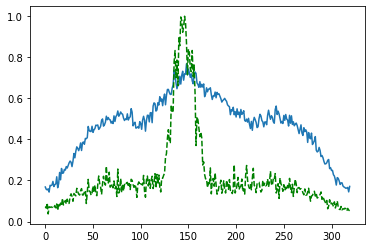

Time taken for epoch:  159.36307835578918
Epoch = [177/3000]  Iter = [   0/39480]  Loss = 0.1519 Avg Loss = 0.1519  Time = 0.0743s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [177/3000]  Iter = [ 100/39480]  Loss = 0.1504 Avg Loss = 0.1535  Time = 0.0035s
Epoch = [177/3000]  Iter = [ 200/39480]  Loss = 0.151 Avg Loss = 0.1547  Time = 0.0036s
Epoch = [177/3000]  Iter = [ 300/39480]  Loss = 0.1691 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [177/3000]  Iter = [ 400/39480]  Loss = 0.1457 Avg Loss = 0.1552  Time = 0.0035s
Epoch = [177/3000]  Iter = [ 500/39480]  Loss = 0.1643 Avg Loss = 0.1551  Time = 0.0032s
Epoch = [177/3000]  Iter = [ 600/39480]  Loss = 0.1588 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [177/3000]  Iter = [ 700/39480]  Loss = 0.16 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [177/3000]  Iter = [ 800/39480]  Loss = 0.1376 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [177/3000]  Iter = [ 900/39480]  Loss = 0.1345 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [177/3000]  Iter = [1000/39480]  Loss = 0.1546 Avg Loss = 0.154  Time = 0.0036s
Epoch = [177/3000]  Iter = [1100/39480]  Loss = 0.1455 Avg Loss = 0.1549  Time = 0.0032s
Epoch = [177/3000]  Iter 

Epoch = [177/3000]  Iter = [9400/39480]  Loss = 0.1475 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [177/3000]  Iter = [9500/39480]  Loss = 0.1653 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [177/3000]  Iter = [9600/39480]  Loss = 0.1539 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [177/3000]  Iter = [9700/39480]  Loss = 0.1638 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [177/3000]  Iter = [9800/39480]  Loss = 0.1756 Avg Loss = 0.1548  Time = 0.0040s
Epoch = [177/3000]  Iter = [9900/39480]  Loss = 0.1342 Avg Loss = 0.1545  Time = 0.0040s
Epoch = [177/3000]  Iter = [10000/39480]  Loss = 0.1543 Avg Loss = 0.1554  Time = 0.0040s
Epoch = [177/3000]  Iter = [10100/39480]  Loss = 0.1573 Avg Loss = 0.157  Time = 0.0041s
Epoch = [177/3000]  Iter = [10200/39480]  Loss = 0.1723 Avg Loss = 0.1551  Time = 0.0040s
Epoch = [177/3000]  Iter = [10300/39480]  Loss = 0.1697 Avg Loss = 0.1567  Time = 0.0041s
Epoch = [177/3000]  Iter = [10400/39480]  Loss = 0.1364 Avg Loss = 0.1575  Time = 0.0039s
Epoch = [177/3000

Epoch = [177/3000]  Iter = [18600/39480]  Loss = 0.1482 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [177/3000]  Iter = [18700/39480]  Loss = 0.1678 Avg Loss = 0.1581  Time = 0.0035s
Epoch = [177/3000]  Iter = [18800/39480]  Loss = 0.1488 Avg Loss = 0.158  Time = 0.0041s
Epoch = [177/3000]  Iter = [18900/39480]  Loss = 0.1779 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [177/3000]  Iter = [19000/39480]  Loss = 0.1528 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [177/3000]  Iter = [19100/39480]  Loss = 0.1623 Avg Loss = 0.1571  Time = 0.0033s
Epoch = [177/3000]  Iter = [19200/39480]  Loss = 0.1787 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [177/3000]  Iter = [19300/39480]  Loss = 0.1478 Avg Loss = 0.157  Time = 0.0037s
Epoch = [177/3000]  Iter = [19400/39480]  Loss = 0.1659 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [177/3000]  Iter = [19500/39480]  Loss = 0.1402 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [177/3000]  Iter = [19600/39480]  Loss = 0.1463 Avg Loss = 0.1569  Time = 0.0032s
Epoch = [177

Epoch = [177/3000]  Iter = [27800/39480]  Loss = 0.144 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [177/3000]  Iter = [27900/39480]  Loss = 0.1638 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [177/3000]  Iter = [28000/39480]  Loss = 0.1488 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [177/3000]  Iter = [28100/39480]  Loss = 0.1728 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [177/3000]  Iter = [28200/39480]  Loss = 0.1587 Avg Loss = 0.1558  Time = 0.0035s
Epoch = [177/3000]  Iter = [28300/39480]  Loss = 0.1624 Avg Loss = 0.1547  Time = 0.0036s
Epoch = [177/3000]  Iter = [28400/39480]  Loss = 0.1707 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [177/3000]  Iter = [28500/39480]  Loss = 0.1526 Avg Loss = 0.1564  Time = 0.0034s
Epoch = [177/3000]  Iter = [28600/39480]  Loss = 0.1769 Avg Loss = 0.156  Time = 0.0038s
Epoch = [177/3000]  Iter = [28700/39480]  Loss = 0.1641 Avg Loss = 0.1566  Time = 0.0031s
Epoch = [177/3000]  Iter = [28800/39480]  Loss = 0.161 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [177/

Epoch = [177/3000]  Iter = [37000/39480]  Loss = 0.1459 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [177/3000]  Iter = [37100/39480]  Loss = 0.1647 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [177/3000]  Iter = [37200/39480]  Loss = 0.1676 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [177/3000]  Iter = [37300/39480]  Loss = 0.1364 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [177/3000]  Iter = [37400/39480]  Loss = 0.1836 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [177/3000]  Iter = [37500/39480]  Loss = 0.1517 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [177/3000]  Iter = [37600/39480]  Loss = 0.1468 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [177/3000]  Iter = [37700/39480]  Loss = 0.1575 Avg Loss = 0.1573  Time = 0.0051s
Epoch = [177/3000]  Iter = [37800/39480]  Loss = 0.1614 Avg Loss = 0.158  Time = 0.0033s
Epoch = [177/3000]  Iter = [37900/39480]  Loss = 0.137 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [177/3000]  Iter = [38000/39480]  Loss = 0.1812 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [177

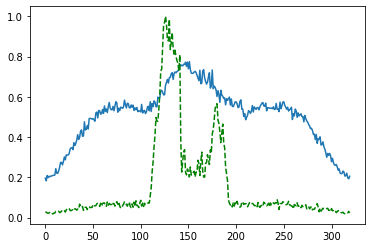

Time taken for epoch:  159.72602367401123
Epoch = [178/3000]  Iter = [   0/39480]  Loss = 0.1875 Avg Loss = 0.1875  Time = 0.0666s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [178/3000]  Iter = [ 100/39480]  Loss = 0.1833 Avg Loss = 0.1685  Time = 0.0037s
Epoch = [178/3000]  Iter = [ 200/39480]  Loss = 0.1487 Avg Loss = 0.1601  Time = 0.0037s
Epoch = [178/3000]  Iter = [ 300/39480]  Loss = 0.1648 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [178/3000]  Iter = [ 400/39480]  Loss = 0.1632 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [178/3000]  Iter = [ 500/39480]  Loss = 0.1506 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [178/3000]  Iter = [ 600/39480]  Loss = 0.1506 Avg Loss = 0.156  Time = 0.0035s
Epoch = [178/3000]  Iter = [ 700/39480]  Loss = 0.1807 Avg Loss = 0.1572  Time = 0.0047s
Epoch = [178/3000]  Iter = [ 800/39480]  Loss = 0.1584 Avg Loss = 0.1565  Time = 0.0032s
Epoch = [178/3000]  Iter = [ 900/39480]  Loss = 0.1669 Avg Loss = 0.1561  Time = 0.0032s
Epoch = [178/3000]  Iter = [1000/39480]  Loss = 0.1494 Avg Loss = 0.1564  Time = 0.0032s
Epoch = [178/3000]  Iter = [1100/39480]  Loss = 0.1558 Avg Loss = 0.1542  Time = 0.0032s
Epoch = [178/3000]  It

Epoch = [178/3000]  Iter = [9400/39480]  Loss = 0.1783 Avg Loss = 0.1563  Time = 0.0034s
Epoch = [178/3000]  Iter = [9500/39480]  Loss = 0.1563 Avg Loss = 0.1564  Time = 0.0032s
Epoch = [178/3000]  Iter = [9600/39480]  Loss = 0.1576 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [178/3000]  Iter = [9700/39480]  Loss = 0.1625 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [178/3000]  Iter = [9800/39480]  Loss = 0.1701 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [178/3000]  Iter = [9900/39480]  Loss = 0.1538 Avg Loss = 0.157  Time = 0.0037s
Epoch = [178/3000]  Iter = [10000/39480]  Loss = 0.1607 Avg Loss = 0.1575  Time = 0.0033s
Epoch = [178/3000]  Iter = [10100/39480]  Loss = 0.1596 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [178/3000]  Iter = [10200/39480]  Loss = 0.1459 Avg Loss = 0.156  Time = 0.0037s
Epoch = [178/3000]  Iter = [10300/39480]  Loss = 0.1783 Avg Loss = 0.1561  Time = 0.0033s
Epoch = [178/3000]  Iter = [10400/39480]  Loss = 0.1564 Avg Loss = 0.1555  Time = 0.0038s
Epoch = [178/3000]

Epoch = [178/3000]  Iter = [18600/39480]  Loss = 0.1632 Avg Loss = 0.1549  Time = 0.0032s
Epoch = [178/3000]  Iter = [18700/39480]  Loss = 0.1624 Avg Loss = 0.1577  Time = 0.0032s
Epoch = [178/3000]  Iter = [18800/39480]  Loss = 0.1307 Avg Loss = 0.157  Time = 0.0037s
Epoch = [178/3000]  Iter = [18900/39480]  Loss = 0.1562 Avg Loss = 0.1558  Time = 0.0032s
Epoch = [178/3000]  Iter = [19000/39480]  Loss = 0.1758 Avg Loss = 0.155  Time = 0.0036s
Epoch = [178/3000]  Iter = [19100/39480]  Loss = 0.151 Avg Loss = 0.1551  Time = 0.0032s
Epoch = [178/3000]  Iter = [19200/39480]  Loss = 0.1529 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [178/3000]  Iter = [19300/39480]  Loss = 0.1744 Avg Loss = 0.1587  Time = 0.0037s
Epoch = [178/3000]  Iter = [19400/39480]  Loss = 0.1645 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [178/3000]  Iter = [19500/39480]  Loss = 0.157 Avg Loss = 0.158  Time = 0.0036s
Epoch = [178/3000]  Iter = [19600/39480]  Loss = 0.1557 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [178/30

Epoch = [178/3000]  Iter = [27800/39480]  Loss = 0.1958 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [178/3000]  Iter = [27900/39480]  Loss = 0.1561 Avg Loss = 0.1568  Time = 0.0033s
Epoch = [178/3000]  Iter = [28000/39480]  Loss = 0.1427 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [178/3000]  Iter = [28100/39480]  Loss = 0.1623 Avg Loss = 0.157  Time = 0.0036s
Epoch = [178/3000]  Iter = [28200/39480]  Loss = 0.1522 Avg Loss = 0.1575  Time = 0.0031s
Epoch = [178/3000]  Iter = [28300/39480]  Loss = 0.1317 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [178/3000]  Iter = [28400/39480]  Loss = 0.134 Avg Loss = 0.1562  Time = 0.0034s
Epoch = [178/3000]  Iter = [28500/39480]  Loss = 0.1588 Avg Loss = 0.1545  Time = 0.0031s
Epoch = [178/3000]  Iter = [28600/39480]  Loss = 0.1632 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [178/3000]  Iter = [28700/39480]  Loss = 0.1404 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [178/3000]  Iter = [28800/39480]  Loss = 0.1617 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [178

Epoch = [178/3000]  Iter = [37000/39480]  Loss = 0.1374 Avg Loss = 0.1557  Time = 0.0041s
Epoch = [178/3000]  Iter = [37100/39480]  Loss = 0.1629 Avg Loss = 0.1568  Time = 0.0039s
Epoch = [178/3000]  Iter = [37200/39480]  Loss = 0.1416 Avg Loss = 0.1558  Time = 0.0039s
Epoch = [178/3000]  Iter = [37300/39480]  Loss = 0.1453 Avg Loss = 0.1566  Time = 0.0042s
Epoch = [178/3000]  Iter = [37400/39480]  Loss = 0.1765 Avg Loss = 0.1577  Time = 0.0041s
Epoch = [178/3000]  Iter = [37500/39480]  Loss = 0.1336 Avg Loss = 0.1578  Time = 0.0040s
Epoch = [178/3000]  Iter = [37600/39480]  Loss = 0.1608 Avg Loss = 0.1582  Time = 0.0041s
Epoch = [178/3000]  Iter = [37700/39480]  Loss = 0.1613 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [178/3000]  Iter = [37800/39480]  Loss = 0.1786 Avg Loss = 0.1571  Time = 0.0033s
Epoch = [178/3000]  Iter = [37900/39480]  Loss = 0.1583 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [178/3000]  Iter = [38000/39480]  Loss = 0.161 Avg Loss = 0.1572  Time = 0.0034s
Epoch = [17

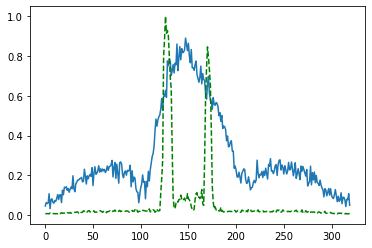

Time taken for epoch:  161.61677026748657
Epoch = [179/3000]  Iter = [   0/39480]  Loss = 0.144 Avg Loss = 0.144  Time = 0.0639s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [179/3000]  Iter = [ 100/39480]  Loss = 0.1528 Avg Loss = 0.1506  Time = 0.0035s
Epoch = [179/3000]  Iter = [ 200/39480]  Loss = 0.1645 Avg Loss = 0.1532  Time = 0.0037s
Epoch = [179/3000]  Iter = [ 300/39480]  Loss = 0.1774 Avg Loss = 0.1535  Time = 0.0036s
Epoch = [179/3000]  Iter = [ 400/39480]  Loss = 0.1549 Avg Loss = 0.1545  Time = 0.0037s
Epoch = [179/3000]  Iter = [ 500/39480]  Loss = 0.1808 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [179/3000]  Iter = [ 600/39480]  Loss = 0.1383 Avg Loss = 0.1565  Time = 0.0034s
Epoch = [179/3000]  Iter = [ 700/39480]  Loss = 0.1303 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [179/3000]  Iter = [ 800/39480]  Loss = 0.1331 Avg Loss = 0.1541  Time = 0.0036s
Epoch = [179/3000]  Iter = [ 900/39480]  Loss = 0.1524 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [179/3000]  Iter = [1000/39480]  Loss = 0.1629 Avg Loss = 0.1549  Time = 0.0038s
Epoch = [179/3000]  Iter = [1100/39480]  Loss = 0.1456 Avg Loss = 0.1539  Time = 0.0034s
Epoch = [179/3000]  I

Epoch = [179/3000]  Iter = [9400/39480]  Loss = 0.143 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [179/3000]  Iter = [9500/39480]  Loss = 0.1586 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [179/3000]  Iter = [9600/39480]  Loss = 0.1487 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [179/3000]  Iter = [9700/39480]  Loss = 0.1669 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [179/3000]  Iter = [9800/39480]  Loss = 0.1592 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [179/3000]  Iter = [9900/39480]  Loss = 0.1492 Avg Loss = 0.1571  Time = 0.0032s
Epoch = [179/3000]  Iter = [10000/39480]  Loss = 0.1599 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [179/3000]  Iter = [10100/39480]  Loss = 0.1732 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [179/3000]  Iter = [10200/39480]  Loss = 0.1784 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [179/3000]  Iter = [10300/39480]  Loss = 0.179 Avg Loss = 0.1576  Time = 0.0034s
Epoch = [179/3000]  Iter = [10400/39480]  Loss = 0.1786 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [179/3000]

Epoch = [179/3000]  Iter = [18600/39480]  Loss = 0.1493 Avg Loss = 0.1546  Time = 0.0034s
Epoch = [179/3000]  Iter = [18700/39480]  Loss = 0.1386 Avg Loss = 0.1563  Time = 0.0034s
Epoch = [179/3000]  Iter = [18800/39480]  Loss = 0.1483 Avg Loss = 0.1562  Time = 0.0035s
Epoch = [179/3000]  Iter = [18900/39480]  Loss = 0.1467 Avg Loss = 0.1577  Time = 0.0034s
Epoch = [179/3000]  Iter = [19000/39480]  Loss = 0.1615 Avg Loss = 0.1569  Time = 0.0038s
Epoch = [179/3000]  Iter = [19100/39480]  Loss = 0.1487 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [179/3000]  Iter = [19200/39480]  Loss = 0.1568 Avg Loss = 0.1581  Time = 0.0091s
Epoch = [179/3000]  Iter = [19300/39480]  Loss = 0.1534 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [179/3000]  Iter = [19400/39480]  Loss = 0.1734 Avg Loss = 0.1587  Time = 0.0038s
Epoch = [179/3000]  Iter = [19500/39480]  Loss = 0.1696 Avg Loss = 0.1589  Time = 0.0038s
Epoch = [179/3000]  Iter = [19600/39480]  Loss = 0.1384 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [1

Epoch = [179/3000]  Iter = [27800/39480]  Loss = 0.1435 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [179/3000]  Iter = [27900/39480]  Loss = 0.1601 Avg Loss = 0.1549  Time = 0.0038s
Epoch = [179/3000]  Iter = [28000/39480]  Loss = 0.1719 Avg Loss = 0.156  Time = 0.0038s
Epoch = [179/3000]  Iter = [28100/39480]  Loss = 0.1427 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [179/3000]  Iter = [28200/39480]  Loss = 0.1815 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [179/3000]  Iter = [28300/39480]  Loss = 0.1347 Avg Loss = 0.156  Time = 0.0037s
Epoch = [179/3000]  Iter = [28400/39480]  Loss = 0.1467 Avg Loss = 0.1546  Time = 0.0035s
Epoch = [179/3000]  Iter = [28500/39480]  Loss = 0.1608 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [179/3000]  Iter = [28600/39480]  Loss = 0.1513 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [179/3000]  Iter = [28700/39480]  Loss = 0.1615 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [179/3000]  Iter = [28800/39480]  Loss = 0.1862 Avg Loss = 0.157  Time = 0.0034s
Epoch = [179/

Epoch = [179/3000]  Iter = [37000/39480]  Loss = 0.1726 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [179/3000]  Iter = [37100/39480]  Loss = 0.157 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [179/3000]  Iter = [37200/39480]  Loss = 0.1756 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [179/3000]  Iter = [37300/39480]  Loss = 0.1595 Avg Loss = 0.156  Time = 0.0036s
Epoch = [179/3000]  Iter = [37400/39480]  Loss = 0.1671 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [179/3000]  Iter = [37500/39480]  Loss = 0.1634 Avg Loss = 0.1572  Time = 0.0032s
Epoch = [179/3000]  Iter = [37600/39480]  Loss = 0.1527 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [179/3000]  Iter = [37700/39480]  Loss = 0.1964 Avg Loss = 0.1588  Time = 0.0037s
Epoch = [179/3000]  Iter = [37800/39480]  Loss = 0.1946 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [179/3000]  Iter = [37900/39480]  Loss = 0.155 Avg Loss = 0.156  Time = 0.0036s
Epoch = [179/3000]  Iter = [38000/39480]  Loss = 0.172 Avg Loss = 0.1561  Time = 0.0038s
Epoch = [179/30

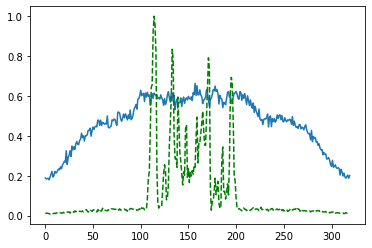

Time taken for epoch:  160.1467628479004
Epoch = [180/3000]  Iter = [   0/39480]  Loss = 0.1479 Avg Loss = 0.1479  Time = 0.0647s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [180/3000]  Iter = [ 100/39480]  Loss = 0.1359 Avg Loss = 0.1517  Time = 0.0034s
Epoch = [180/3000]  Iter = [ 200/39480]  Loss = 0.1234 Avg Loss = 0.1542  Time = 0.0035s
Epoch = [180/3000]  Iter = [ 300/39480]  Loss = 0.1643 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [180/3000]  Iter = [ 400/39480]  Loss = 0.1522 Avg Loss = 0.1547  Time = 0.0037s
Epoch = [180/3000]  Iter = [ 500/39480]  Loss = 0.138 Avg Loss = 0.1535  Time = 0.0034s
Epoch = [180/3000]  Iter = [ 600/39480]  Loss = 0.138 Avg Loss = 0.1546  Time = 0.0036s
Epoch = [180/3000]  Iter = [ 700/39480]  Loss = 0.1473 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [180/3000]  Iter = [ 800/39480]  Loss = 0.1412 Avg Loss = 0.156  Time = 0.0036s
Epoch = [180/3000]  Iter = [ 900/39480]  Loss = 0.1635 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [180/3000]  Iter = [1000/39480]  Loss = 0.1493 Avg Loss = 0.1573  Time = 0.0035s
Epoch = [180/3000]  Iter = [1100/39480]  Loss = 0.1759 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [180/3000]  Iter

Epoch = [180/3000]  Iter = [9400/39480]  Loss = 0.1653 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [180/3000]  Iter = [9500/39480]  Loss = 0.1422 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [180/3000]  Iter = [9600/39480]  Loss = 0.1369 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [180/3000]  Iter = [9700/39480]  Loss = 0.1742 Avg Loss = 0.158  Time = 0.0037s
Epoch = [180/3000]  Iter = [9800/39480]  Loss = 0.1635 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [180/3000]  Iter = [9900/39480]  Loss = 0.1514 Avg Loss = 0.1557  Time = 0.0034s
Epoch = [180/3000]  Iter = [10000/39480]  Loss = 0.1529 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [180/3000]  Iter = [10100/39480]  Loss = 0.1461 Avg Loss = 0.156  Time = 0.0034s
Epoch = [180/3000]  Iter = [10200/39480]  Loss = 0.1562 Avg Loss = 0.1552  Time = 0.0036s
Epoch = [180/3000]  Iter = [10300/39480]  Loss = 0.1441 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [180/3000]  Iter = [10400/39480]  Loss = 0.1487 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [180/3000]

Epoch = [180/3000]  Iter = [18600/39480]  Loss = 0.1472 Avg Loss = 0.1546  Time = 0.0036s
Epoch = [180/3000]  Iter = [18700/39480]  Loss = 0.1482 Avg Loss = 0.1571  Time = 0.0034s
Epoch = [180/3000]  Iter = [18800/39480]  Loss = 0.1652 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [180/3000]  Iter = [18900/39480]  Loss = 0.1551 Avg Loss = 0.1575  Time = 0.0032s
Epoch = [180/3000]  Iter = [19000/39480]  Loss = 0.1639 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [180/3000]  Iter = [19100/39480]  Loss = 0.175 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [180/3000]  Iter = [19200/39480]  Loss = 0.1549 Avg Loss = 0.1586  Time = 0.0037s
Epoch = [180/3000]  Iter = [19300/39480]  Loss = 0.1651 Avg Loss = 0.1586  Time = 0.0036s
Epoch = [180/3000]  Iter = [19400/39480]  Loss = 0.17 Avg Loss = 0.1564  Time = 0.0034s
Epoch = [180/3000]  Iter = [19500/39480]  Loss = 0.1496 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [180/3000]  Iter = [19600/39480]  Loss = 0.159 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [180/3

Epoch = [180/3000]  Iter = [27800/39480]  Loss = 0.1576 Avg Loss = 0.1575  Time = 0.0039s
Epoch = [180/3000]  Iter = [27900/39480]  Loss = 0.1448 Avg Loss = 0.1575  Time = 0.0040s
Epoch = [180/3000]  Iter = [28000/39480]  Loss = 0.1604 Avg Loss = 0.1581  Time = 0.0040s
Epoch = [180/3000]  Iter = [28100/39480]  Loss = 0.14 Avg Loss = 0.1547  Time = 0.0039s
Epoch = [180/3000]  Iter = [28200/39480]  Loss = 0.1346 Avg Loss = 0.1544  Time = 0.0039s
Epoch = [180/3000]  Iter = [28300/39480]  Loss = 0.1797 Avg Loss = 0.1571  Time = 0.0040s
Epoch = [180/3000]  Iter = [28400/39480]  Loss = 0.1377 Avg Loss = 0.157  Time = 0.0039s
Epoch = [180/3000]  Iter = [28500/39480]  Loss = 0.1444 Avg Loss = 0.1556  Time = 0.0039s
Epoch = [180/3000]  Iter = [28600/39480]  Loss = 0.1453 Avg Loss = 0.1542  Time = 0.0039s
Epoch = [180/3000]  Iter = [28700/39480]  Loss = 0.1829 Avg Loss = 0.156  Time = 0.0039s
Epoch = [180/3000]  Iter = [28800/39480]  Loss = 0.1669 Avg Loss = 0.1571  Time = 0.0039s
Epoch = [180/3

Epoch = [180/3000]  Iter = [37000/39480]  Loss = 0.1502 Avg Loss = 0.1588  Time = 0.0037s
Epoch = [180/3000]  Iter = [37100/39480]  Loss = 0.1541 Avg Loss = 0.1575  Time = 0.0034s
Epoch = [180/3000]  Iter = [37200/39480]  Loss = 0.167 Avg Loss = 0.158  Time = 0.0035s
Epoch = [180/3000]  Iter = [37300/39480]  Loss = 0.1517 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [180/3000]  Iter = [37400/39480]  Loss = 0.1515 Avg Loss = 0.1559  Time = 0.0033s
Epoch = [180/3000]  Iter = [37500/39480]  Loss = 0.1664 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [180/3000]  Iter = [37600/39480]  Loss = 0.1633 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [180/3000]  Iter = [37700/39480]  Loss = 0.1526 Avg Loss = 0.1552  Time = 0.0034s
Epoch = [180/3000]  Iter = [37800/39480]  Loss = 0.1607 Avg Loss = 0.1555  Time = 0.0033s
Epoch = [180/3000]  Iter = [37900/39480]  Loss = 0.1557 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [180/3000]  Iter = [38000/39480]  Loss = 0.1471 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [180

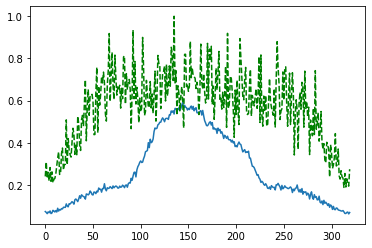

Time taken for epoch:  159.21938753128052
Epoch = [181/3000]  Iter = [   0/39480]  Loss = 0.1481 Avg Loss = 0.1481  Time = 0.0776s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [181/3000]  Iter = [ 100/39480]  Loss = 0.1611 Avg Loss = 0.1526  Time = 0.0035s
Epoch = [181/3000]  Iter = [ 200/39480]  Loss = 0.1375 Avg Loss = 0.1544  Time = 0.0035s
Epoch = [181/3000]  Iter = [ 300/39480]  Loss = 0.1433 Avg Loss = 0.1541  Time = 0.0038s
Epoch = [181/3000]  Iter = [ 400/39480]  Loss = 0.1579 Avg Loss = 0.1545  Time = 0.0037s
Epoch = [181/3000]  Iter = [ 500/39480]  Loss = 0.1405 Avg Loss = 0.1552  Time = 0.0043s
Epoch = [181/3000]  Iter = [ 600/39480]  Loss = 0.167 Avg Loss = 0.1563  Time = 0.0030s
Epoch = [181/3000]  Iter = [ 700/39480]  Loss = 0.1494 Avg Loss = 0.1553  Time = 0.0035s
Epoch = [181/3000]  Iter = [ 800/39480]  Loss = 0.1639 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [181/3000]  Iter = [ 900/39480]  Loss = 0.1655 Avg Loss = 0.1569  Time = 0.0049s
Epoch = [181/3000]  Iter = [1000/39480]  Loss = 0.1468 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [181/3000]  Iter = [1100/39480]  Loss = 0.1426 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [181/3000]  It

Epoch = [181/3000]  Iter = [9400/39480]  Loss = 0.1712 Avg Loss = 0.1581  Time = 0.0038s
Epoch = [181/3000]  Iter = [9500/39480]  Loss = 0.1679 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [181/3000]  Iter = [9600/39480]  Loss = 0.1537 Avg Loss = 0.1559  Time = 0.0038s
Epoch = [181/3000]  Iter = [9700/39480]  Loss = 0.1496 Avg Loss = 0.1568  Time = 0.0038s
Epoch = [181/3000]  Iter = [9800/39480]  Loss = 0.1528 Avg Loss = 0.1575  Time = 0.0038s
Epoch = [181/3000]  Iter = [9900/39480]  Loss = 0.1778 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [181/3000]  Iter = [10000/39480]  Loss = 0.1712 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [181/3000]  Iter = [10100/39480]  Loss = 0.1711 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [181/3000]  Iter = [10200/39480]  Loss = 0.1442 Avg Loss = 0.156  Time = 0.0037s
Epoch = [181/3000]  Iter = [10300/39480]  Loss = 0.1511 Avg Loss = 0.156  Time = 0.0037s
Epoch = [181/3000]  Iter = [10400/39480]  Loss = 0.1458 Avg Loss = 0.1585  Time = 0.0033s
Epoch = [181/3000]

Epoch = [181/3000]  Iter = [18600/39480]  Loss = 0.153 Avg Loss = 0.1557  Time = 0.0034s
Epoch = [181/3000]  Iter = [18700/39480]  Loss = 0.1469 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [181/3000]  Iter = [18800/39480]  Loss = 0.1578 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [181/3000]  Iter = [18900/39480]  Loss = 0.1367 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [181/3000]  Iter = [19000/39480]  Loss = 0.1622 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [181/3000]  Iter = [19100/39480]  Loss = 0.1652 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [181/3000]  Iter = [19200/39480]  Loss = 0.1566 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [181/3000]  Iter = [19300/39480]  Loss = 0.1758 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [181/3000]  Iter = [19400/39480]  Loss = 0.1615 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [181/3000]  Iter = [19500/39480]  Loss = 0.156 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [181/3000]  Iter = [19600/39480]  Loss = 0.168 Avg Loss = 0.158  Time = 0.0037s
Epoch = [181/3

Epoch = [181/3000]  Iter = [27800/39480]  Loss = 0.1369 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [181/3000]  Iter = [27900/39480]  Loss = 0.1647 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [181/3000]  Iter = [28000/39480]  Loss = 0.1727 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [181/3000]  Iter = [28100/39480]  Loss = 0.1612 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [181/3000]  Iter = [28200/39480]  Loss = 0.1583 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [181/3000]  Iter = [28300/39480]  Loss = 0.1279 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [181/3000]  Iter = [28400/39480]  Loss = 0.1486 Avg Loss = 0.157  Time = 0.0032s
Epoch = [181/3000]  Iter = [28500/39480]  Loss = 0.125 Avg Loss = 0.155  Time = 0.0036s
Epoch = [181/3000]  Iter = [28600/39480]  Loss = 0.1562 Avg Loss = 0.1541  Time = 0.0037s
Epoch = [181/3000]  Iter = [28700/39480]  Loss = 0.1534 Avg Loss = 0.155  Time = 0.0036s
Epoch = [181/3000]  Iter = [28800/39480]  Loss = 0.151 Avg Loss = 0.1582  Time = 0.0034s
Epoch = [181/30

Epoch = [181/3000]  Iter = [37000/39480]  Loss = 0.1408 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [181/3000]  Iter = [37100/39480]  Loss = 0.1521 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [181/3000]  Iter = [37200/39480]  Loss = 0.16 Avg Loss = 0.1551  Time = 0.0032s
Epoch = [181/3000]  Iter = [37300/39480]  Loss = 0.1676 Avg Loss = 0.1558  Time = 0.0035s
Epoch = [181/3000]  Iter = [37400/39480]  Loss = 0.1641 Avg Loss = 0.1557  Time = 0.0034s
Epoch = [181/3000]  Iter = [37500/39480]  Loss = 0.1498 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [181/3000]  Iter = [37600/39480]  Loss = 0.1501 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [181/3000]  Iter = [37700/39480]  Loss = 0.1769 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [181/3000]  Iter = [37800/39480]  Loss = 0.157 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [181/3000]  Iter = [37900/39480]  Loss = 0.1464 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [181/3000]  Iter = [38000/39480]  Loss = 0.1178 Avg Loss = 0.1572  Time = 0.0032s
Epoch = [181/

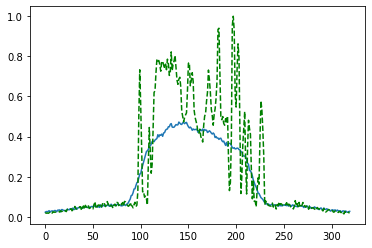

Time taken for epoch:  160.74850964546204
Epoch = [182/3000]  Iter = [   0/39480]  Loss = 0.1654 Avg Loss = 0.1654  Time = 0.0657s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [182/3000]  Iter = [ 100/39480]  Loss = 0.1324 Avg Loss = 0.1587  Time = 0.0038s
Epoch = [182/3000]  Iter = [ 200/39480]  Loss = 0.1647 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [182/3000]  Iter = [ 300/39480]  Loss = 0.1236 Avg Loss = 0.1545  Time = 0.0037s
Epoch = [182/3000]  Iter = [ 400/39480]  Loss = 0.1205 Avg Loss = 0.154  Time = 0.0037s
Epoch = [182/3000]  Iter = [ 500/39480]  Loss = 0.1288 Avg Loss = 0.155  Time = 0.0037s
Epoch = [182/3000]  Iter = [ 600/39480]  Loss = 0.1479 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [182/3000]  Iter = [ 700/39480]  Loss = 0.1447 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [182/3000]  Iter = [ 800/39480]  Loss = 0.1424 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [182/3000]  Iter = [ 900/39480]  Loss = 0.1653 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [182/3000]  Iter = [1000/39480]  Loss = 0.1475 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [182/3000]  Iter = [1100/39480]  Loss = 0.1475 Avg Loss = 0.157  Time = 0.0037s
Epoch = [182/3000]  Iter

Epoch = [182/3000]  Iter = [9400/39480]  Loss = 0.1769 Avg Loss = 0.1558  Time = 0.0035s
Epoch = [182/3000]  Iter = [9500/39480]  Loss = 0.1551 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [182/3000]  Iter = [9600/39480]  Loss = 0.171 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [182/3000]  Iter = [9700/39480]  Loss = 0.1682 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [182/3000]  Iter = [9800/39480]  Loss = 0.1693 Avg Loss = 0.1578  Time = 0.0031s
Epoch = [182/3000]  Iter = [9900/39480]  Loss = 0.1508 Avg Loss = 0.1561  Time = 0.0033s
Epoch = [182/3000]  Iter = [10000/39480]  Loss = 0.1639 Avg Loss = 0.1547  Time = 0.0036s
Epoch = [182/3000]  Iter = [10100/39480]  Loss = 0.1857 Avg Loss = 0.1564  Time = 0.0035s
Epoch = [182/3000]  Iter = [10200/39480]  Loss = 0.1709 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [182/3000]  Iter = [10300/39480]  Loss = 0.1422 Avg Loss = 0.1558  Time = 0.0035s
Epoch = [182/3000]  Iter = [10400/39480]  Loss = 0.1586 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [182/3000

Epoch = [182/3000]  Iter = [18600/39480]  Loss = 0.1358 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [182/3000]  Iter = [18700/39480]  Loss = 0.1903 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [182/3000]  Iter = [18800/39480]  Loss = 0.1696 Avg Loss = 0.1567  Time = 0.0038s
Epoch = [182/3000]  Iter = [18900/39480]  Loss = 0.1758 Avg Loss = 0.1586  Time = 0.0033s
Epoch = [182/3000]  Iter = [19000/39480]  Loss = 0.1722 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [182/3000]  Iter = [19100/39480]  Loss = 0.1558 Avg Loss = 0.1568  Time = 0.0038s
Epoch = [182/3000]  Iter = [19200/39480]  Loss = 0.1547 Avg Loss = 0.1563  Time = 0.0038s
Epoch = [182/3000]  Iter = [19300/39480]  Loss = 0.1685 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [182/3000]  Iter = [19400/39480]  Loss = 0.1497 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [182/3000]  Iter = [19500/39480]  Loss = 0.1572 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [182/3000]  Iter = [19600/39480]  Loss = 0.1461 Avg Loss = 0.1559  Time = 0.0038s
Epoch = [1

Epoch = [182/3000]  Iter = [27800/39480]  Loss = 0.1629 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [182/3000]  Iter = [27900/39480]  Loss = 0.1714 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [182/3000]  Iter = [28000/39480]  Loss = 0.1477 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [182/3000]  Iter = [28100/39480]  Loss = 0.1854 Avg Loss = 0.159  Time = 0.0036s
Epoch = [182/3000]  Iter = [28200/39480]  Loss = 0.1438 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [182/3000]  Iter = [28300/39480]  Loss = 0.1621 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [182/3000]  Iter = [28400/39480]  Loss = 0.1712 Avg Loss = 0.1579  Time = 0.0032s
Epoch = [182/3000]  Iter = [28500/39480]  Loss = 0.1616 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [182/3000]  Iter = [28600/39480]  Loss = 0.1471 Avg Loss = 0.157  Time = 0.0035s
Epoch = [182/3000]  Iter = [28700/39480]  Loss = 0.1463 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [182/3000]  Iter = [28800/39480]  Loss = 0.1447 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [182

Epoch = [182/3000]  Iter = [37000/39480]  Loss = 0.1531 Avg Loss = 0.157  Time = 0.0041s
Epoch = [182/3000]  Iter = [37100/39480]  Loss = 0.149 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [182/3000]  Iter = [37200/39480]  Loss = 0.1754 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [182/3000]  Iter = [37300/39480]  Loss = 0.1604 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [182/3000]  Iter = [37400/39480]  Loss = 0.1517 Avg Loss = 0.156  Time = 0.0035s
Epoch = [182/3000]  Iter = [37500/39480]  Loss = 0.1762 Avg Loss = 0.1576  Time = 0.0038s
Epoch = [182/3000]  Iter = [37600/39480]  Loss = 0.1616 Avg Loss = 0.1558  Time = 0.0038s
Epoch = [182/3000]  Iter = [37700/39480]  Loss = 0.1617 Avg Loss = 0.157  Time = 0.0036s
Epoch = [182/3000]  Iter = [37800/39480]  Loss = 0.1698 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [182/3000]  Iter = [37900/39480]  Loss = 0.1821 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [182/3000]  Iter = [38000/39480]  Loss = 0.1761 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [182/3

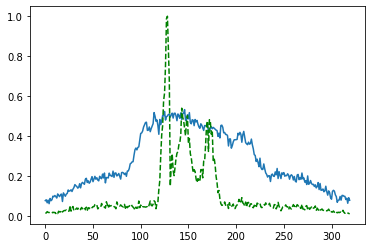

Time taken for epoch:  160.21985960006714
Epoch = [183/3000]  Iter = [   0/39480]  Loss = 0.1482 Avg Loss = 0.1482  Time = 0.0662s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [183/3000]  Iter = [ 100/39480]  Loss = 0.1441 Avg Loss = 0.1528  Time = 0.0035s
Epoch = [183/3000]  Iter = [ 200/39480]  Loss = 0.1484 Avg Loss = 0.1528  Time = 0.0037s
Epoch = [183/3000]  Iter = [ 300/39480]  Loss = 0.1526 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [183/3000]  Iter = [ 400/39480]  Loss = 0.1773 Avg Loss = 0.1564  Time = 0.0038s
Epoch = [183/3000]  Iter = [ 500/39480]  Loss = 0.1575 Avg Loss = 0.1551  Time = 0.0034s
Epoch = [183/3000]  Iter = [ 600/39480]  Loss = 0.1888 Avg Loss = 0.1565  Time = 0.0029s
Epoch = [183/3000]  Iter = [ 700/39480]  Loss = 0.148 Avg Loss = 0.1577  Time = 0.0034s
Epoch = [183/3000]  Iter = [ 800/39480]  Loss = 0.1782 Avg Loss = 0.1585  Time = 0.0039s
Epoch = [183/3000]  Iter = [ 900/39480]  Loss = 0.1474 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [183/3000]  Iter = [1000/39480]  Loss = 0.1426 Avg Loss = 0.1558  Time = 0.0035s
Epoch = [183/3000]  Iter = [1100/39480]  Loss = 0.1524 Avg Loss = 0.1555  Time = 0.0033s
Epoch = [183/3000]  It

Epoch = [183/3000]  Iter = [9400/39480]  Loss = 0.1405 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [183/3000]  Iter = [9500/39480]  Loss = 0.1463 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [183/3000]  Iter = [9600/39480]  Loss = 0.1431 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [183/3000]  Iter = [9700/39480]  Loss = 0.1832 Avg Loss = 0.1589  Time = 0.0038s
Epoch = [183/3000]  Iter = [9800/39480]  Loss = 0.145 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [183/3000]  Iter = [9900/39480]  Loss = 0.1533 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [183/3000]  Iter = [10000/39480]  Loss = 0.154 Avg Loss = 0.156  Time = 0.0037s
Epoch = [183/3000]  Iter = [10100/39480]  Loss = 0.1402 Avg Loss = 0.1578  Time = 0.0038s
Epoch = [183/3000]  Iter = [10200/39480]  Loss = 0.1707 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [183/3000]  Iter = [10300/39480]  Loss = 0.1279 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [183/3000]  Iter = [10400/39480]  Loss = 0.1734 Avg Loss = 0.156  Time = 0.0036s
Epoch = [183/3000]  

Epoch = [183/3000]  Iter = [18600/39480]  Loss = 0.1524 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [183/3000]  Iter = [18700/39480]  Loss = 0.1417 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [183/3000]  Iter = [18800/39480]  Loss = 0.1821 Avg Loss = 0.1586  Time = 0.0036s
Epoch = [183/3000]  Iter = [18900/39480]  Loss = 0.1571 Avg Loss = 0.1571  Time = 0.0034s
Epoch = [183/3000]  Iter = [19000/39480]  Loss = 0.1595 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [183/3000]  Iter = [19100/39480]  Loss = 0.1953 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [183/3000]  Iter = [19200/39480]  Loss = 0.1798 Avg Loss = 0.158  Time = 0.0037s
Epoch = [183/3000]  Iter = [19300/39480]  Loss = 0.1508 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [183/3000]  Iter = [19400/39480]  Loss = 0.1794 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [183/3000]  Iter = [19500/39480]  Loss = 0.1609 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [183/3000]  Iter = [19600/39480]  Loss = 0.1419 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [18

Epoch = [183/3000]  Iter = [27800/39480]  Loss = 0.1702 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [183/3000]  Iter = [27900/39480]  Loss = 0.1515 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [183/3000]  Iter = [28000/39480]  Loss = 0.1212 Avg Loss = 0.1581  Time = 0.0038s
Epoch = [183/3000]  Iter = [28100/39480]  Loss = 0.1475 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [183/3000]  Iter = [28200/39480]  Loss = 0.1356 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [183/3000]  Iter = [28300/39480]  Loss = 0.1345 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [183/3000]  Iter = [28400/39480]  Loss = 0.1597 Avg Loss = 0.1539  Time = 0.0037s
Epoch = [183/3000]  Iter = [28500/39480]  Loss = 0.1858 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [183/3000]  Iter = [28600/39480]  Loss = 0.1503 Avg Loss = 0.1565  Time = 0.0032s
Epoch = [183/3000]  Iter = [28700/39480]  Loss = 0.1566 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [183/3000]  Iter = [28800/39480]  Loss = 0.1504 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [1

Epoch = [183/3000]  Iter = [37000/39480]  Loss = 0.1544 Avg Loss = 0.1579  Time = 0.0039s
Epoch = [183/3000]  Iter = [37100/39480]  Loss = 0.1663 Avg Loss = 0.1575  Time = 0.0039s
Epoch = [183/3000]  Iter = [37200/39480]  Loss = 0.1844 Avg Loss = 0.1581  Time = 0.0039s
Epoch = [183/3000]  Iter = [37300/39480]  Loss = 0.1522 Avg Loss = 0.1587  Time = 0.0039s
Epoch = [183/3000]  Iter = [37400/39480]  Loss = 0.1902 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [183/3000]  Iter = [37500/39480]  Loss = 0.167 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [183/3000]  Iter = [37600/39480]  Loss = 0.1476 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [183/3000]  Iter = [37700/39480]  Loss = 0.1566 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [183/3000]  Iter = [37800/39480]  Loss = 0.1474 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [183/3000]  Iter = [37900/39480]  Loss = 0.1731 Avg Loss = 0.1573  Time = 0.0033s
Epoch = [183/3000]  Iter = [38000/39480]  Loss = 0.1543 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [18

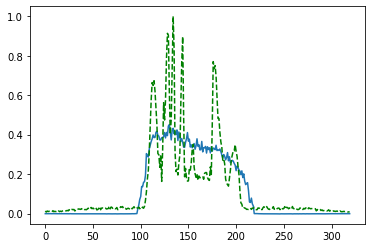

Time taken for epoch:  159.28178143501282
Epoch = [184/3000]  Iter = [   0/39480]  Loss = 0.1515 Avg Loss = 0.1515  Time = 0.1041s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [184/3000]  Iter = [ 100/39480]  Loss = 0.1728 Avg Loss = 0.1544  Time = 0.0037s
Epoch = [184/3000]  Iter = [ 200/39480]  Loss = 0.1482 Avg Loss = 0.1567  Time = 0.0041s
Epoch = [184/3000]  Iter = [ 300/39480]  Loss = 0.1537 Avg Loss = 0.1558  Time = 0.0043s
Epoch = [184/3000]  Iter = [ 400/39480]  Loss = 0.2012 Avg Loss = 0.1574  Time = 0.0042s
Epoch = [184/3000]  Iter = [ 500/39480]  Loss = 0.156 Avg Loss = 0.1541  Time = 0.0038s
Epoch = [184/3000]  Iter = [ 600/39480]  Loss = 0.1799 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [184/3000]  Iter = [ 700/39480]  Loss = 0.1426 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [184/3000]  Iter = [ 800/39480]  Loss = 0.1574 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [184/3000]  Iter = [ 900/39480]  Loss = 0.157 Avg Loss = 0.1541  Time = 0.0037s
Epoch = [184/3000]  Iter = [1000/39480]  Loss = 0.1375 Avg Loss = 0.1538  Time = 0.0038s
Epoch = [184/3000]  Iter = [1100/39480]  Loss = 0.1586 Avg Loss = 0.1545  Time = 0.0039s
Epoch = [184/3000]  Ite

Epoch = [184/3000]  Iter = [9400/39480]  Loss = 0.1405 Avg Loss = 0.154  Time = 0.0037s
Epoch = [184/3000]  Iter = [9500/39480]  Loss = 0.1669 Avg Loss = 0.156  Time = 0.0033s
Epoch = [184/3000]  Iter = [9600/39480]  Loss = 0.1656 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [184/3000]  Iter = [9700/39480]  Loss = 0.1815 Avg Loss = 0.156  Time = 0.0032s
Epoch = [184/3000]  Iter = [9800/39480]  Loss = 0.1552 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [184/3000]  Iter = [9900/39480]  Loss = 0.1651 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [184/3000]  Iter = [10000/39480]  Loss = 0.1627 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [184/3000]  Iter = [10100/39480]  Loss = 0.1758 Avg Loss = 0.1553  Time = 0.0038s
Epoch = [184/3000]  Iter = [10200/39480]  Loss = 0.1477 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [184/3000]  Iter = [10300/39480]  Loss = 0.1416 Avg Loss = 0.1553  Time = 0.0038s
Epoch = [184/3000]  Iter = [10400/39480]  Loss = 0.1491 Avg Loss = 0.1553  Time = 0.0033s
Epoch = [184/3000] 

Epoch = [184/3000]  Iter = [18600/39480]  Loss = 0.1357 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [184/3000]  Iter = [18700/39480]  Loss = 0.1713 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [184/3000]  Iter = [18800/39480]  Loss = 0.1611 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [184/3000]  Iter = [18900/39480]  Loss = 0.1778 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [184/3000]  Iter = [19000/39480]  Loss = 0.1415 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [184/3000]  Iter = [19100/39480]  Loss = 0.1525 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [184/3000]  Iter = [19200/39480]  Loss = 0.1583 Avg Loss = 0.1545  Time = 0.0037s
Epoch = [184/3000]  Iter = [19300/39480]  Loss = 0.1716 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [184/3000]  Iter = [19400/39480]  Loss = 0.1501 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [184/3000]  Iter = [19500/39480]  Loss = 0.1506 Avg Loss = 0.155  Time = 0.0036s
Epoch = [184/3000]  Iter = [19600/39480]  Loss = 0.1725 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [18

Epoch = [184/3000]  Iter = [27800/39480]  Loss = 0.134 Avg Loss = 0.1568  Time = 0.0038s
Epoch = [184/3000]  Iter = [27900/39480]  Loss = 0.1605 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [184/3000]  Iter = [28000/39480]  Loss = 0.1534 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [184/3000]  Iter = [28100/39480]  Loss = 0.1621 Avg Loss = 0.1571  Time = 0.0038s
Epoch = [184/3000]  Iter = [28200/39480]  Loss = 0.1525 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [184/3000]  Iter = [28300/39480]  Loss = 0.1624 Avg Loss = 0.156  Time = 0.0037s
Epoch = [184/3000]  Iter = [28400/39480]  Loss = 0.1581 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [184/3000]  Iter = [28500/39480]  Loss = 0.1258 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [184/3000]  Iter = [28600/39480]  Loss = 0.1641 Avg Loss = 0.157  Time = 0.0035s
Epoch = [184/3000]  Iter = [28700/39480]  Loss = 0.1438 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [184/3000]  Iter = [28800/39480]  Loss = 0.1475 Avg Loss = 0.1573  Time = 0.0039s
Epoch = [184/

Epoch = [184/3000]  Iter = [37000/39480]  Loss = 0.1334 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [184/3000]  Iter = [37100/39480]  Loss = 0.1557 Avg Loss = 0.1557  Time = 0.0035s
Epoch = [184/3000]  Iter = [37200/39480]  Loss = 0.1538 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [184/3000]  Iter = [37300/39480]  Loss = 0.1626 Avg Loss = 0.155  Time = 0.0037s
Epoch = [184/3000]  Iter = [37400/39480]  Loss = 0.1455 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [184/3000]  Iter = [37500/39480]  Loss = 0.1331 Avg Loss = 0.1555  Time = 0.0033s
Epoch = [184/3000]  Iter = [37600/39480]  Loss = 0.178 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [184/3000]  Iter = [37700/39480]  Loss = 0.147 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [184/3000]  Iter = [37800/39480]  Loss = 0.1649 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [184/3000]  Iter = [37900/39480]  Loss = 0.1608 Avg Loss = 0.1573  Time = 0.0039s
Epoch = [184/3000]  Iter = [38000/39480]  Loss = 0.1587 Avg Loss = 0.1577  Time = 0.0039s
Epoch = [184/

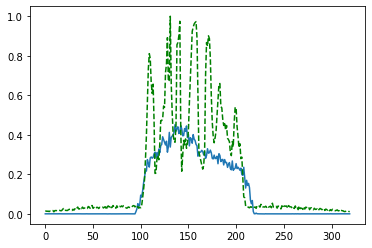

Time taken for epoch:  164.26881885528564
Epoch = [185/3000]  Iter = [   0/39480]  Loss = 0.1553 Avg Loss = 0.1553  Time = 0.0663s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [185/3000]  Iter = [ 100/39480]  Loss = 0.1434 Avg Loss = 0.1558  Time = 0.0035s
Epoch = [185/3000]  Iter = [ 200/39480]  Loss = 0.1632 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [185/3000]  Iter = [ 300/39480]  Loss = 0.125 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [185/3000]  Iter = [ 400/39480]  Loss = 0.1603 Avg Loss = 0.1561  Time = 0.0038s
Epoch = [185/3000]  Iter = [ 500/39480]  Loss = 0.1917 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [185/3000]  Iter = [ 600/39480]  Loss = 0.1499 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [185/3000]  Iter = [ 700/39480]  Loss = 0.1447 Avg Loss = 0.156  Time = 0.0037s
Epoch = [185/3000]  Iter = [ 800/39480]  Loss = 0.2 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [185/3000]  Iter = [ 900/39480]  Loss = 0.1626 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [185/3000]  Iter = [1000/39480]  Loss = 0.1333 Avg Loss = 0.1534  Time = 0.0037s
Epoch = [185/3000]  Iter = [1100/39480]  Loss = 0.1334 Avg Loss = 0.1538  Time = 0.0032s
Epoch = [185/3000]  Iter =

Epoch = [185/3000]  Iter = [9400/39480]  Loss = 0.1538 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [185/3000]  Iter = [9500/39480]  Loss = 0.1696 Avg Loss = 0.157  Time = 0.0039s
Epoch = [185/3000]  Iter = [9600/39480]  Loss = 0.1734 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [185/3000]  Iter = [9700/39480]  Loss = 0.1763 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [185/3000]  Iter = [9800/39480]  Loss = 0.1851 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [185/3000]  Iter = [9900/39480]  Loss = 0.1733 Avg Loss = 0.1556  Time = 0.0031s
Epoch = [185/3000]  Iter = [10000/39480]  Loss = 0.1562 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [185/3000]  Iter = [10100/39480]  Loss = 0.1659 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [185/3000]  Iter = [10200/39480]  Loss = 0.1321 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [185/3000]  Iter = [10300/39480]  Loss = 0.1434 Avg Loss = 0.158  Time = 0.0036s
Epoch = [185/3000]  Iter = [10400/39480]  Loss = 0.1589 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [185/3000]

Epoch = [185/3000]  Iter = [18600/39480]  Loss = 0.1472 Avg Loss = 0.1591  Time = 0.0036s
Epoch = [185/3000]  Iter = [18700/39480]  Loss = 0.1386 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [185/3000]  Iter = [18800/39480]  Loss = 0.1688 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [185/3000]  Iter = [18900/39480]  Loss = 0.125 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [185/3000]  Iter = [19000/39480]  Loss = 0.15 Avg Loss = 0.1551  Time = 0.0034s
Epoch = [185/3000]  Iter = [19100/39480]  Loss = 0.1503 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [185/3000]  Iter = [19200/39480]  Loss = 0.1614 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [185/3000]  Iter = [19300/39480]  Loss = 0.1737 Avg Loss = 0.1567  Time = 0.0034s
Epoch = [185/3000]  Iter = [19400/39480]  Loss = 0.1617 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [185/3000]  Iter = [19500/39480]  Loss = 0.1582 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [185/3000]  Iter = [19600/39480]  Loss = 0.1427 Avg Loss = 0.1573  Time = 0.0041s
Epoch = [185/

Epoch = [185/3000]  Iter = [27800/39480]  Loss = 0.1458 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [185/3000]  Iter = [27900/39480]  Loss = 0.1578 Avg Loss = 0.156  Time = 0.0032s
Epoch = [185/3000]  Iter = [28000/39480]  Loss = 0.1471 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [185/3000]  Iter = [28100/39480]  Loss = 0.1501 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [185/3000]  Iter = [28200/39480]  Loss = 0.1543 Avg Loss = 0.157  Time = 0.0037s
Epoch = [185/3000]  Iter = [28300/39480]  Loss = 0.1656 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [185/3000]  Iter = [28400/39480]  Loss = 0.1653 Avg Loss = 0.158  Time = 0.0037s
Epoch = [185/3000]  Iter = [28500/39480]  Loss = 0.1386 Avg Loss = 0.1565  Time = 0.0033s
Epoch = [185/3000]  Iter = [28600/39480]  Loss = 0.1694 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [185/3000]  Iter = [28700/39480]  Loss = 0.1833 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [185/3000]  Iter = [28800/39480]  Loss = 0.1696 Avg Loss = 0.1572  Time = 0.0032s
Epoch = [185/

Epoch = [185/3000]  Iter = [37000/39480]  Loss = 0.1886 Avg Loss = 0.1577  Time = 0.0033s
Epoch = [185/3000]  Iter = [37100/39480]  Loss = 0.1674 Avg Loss = 0.1575  Time = 0.0034s
Epoch = [185/3000]  Iter = [37200/39480]  Loss = 0.1376 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [185/3000]  Iter = [37300/39480]  Loss = 0.1576 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [185/3000]  Iter = [37400/39480]  Loss = 0.1542 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [185/3000]  Iter = [37500/39480]  Loss = 0.1519 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [185/3000]  Iter = [37600/39480]  Loss = 0.1745 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [185/3000]  Iter = [37700/39480]  Loss = 0.1506 Avg Loss = 0.158  Time = 0.0037s
Epoch = [185/3000]  Iter = [37800/39480]  Loss = 0.1445 Avg Loss = 0.1563  Time = 0.0034s
Epoch = [185/3000]  Iter = [37900/39480]  Loss = 0.1645 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [185/3000]  Iter = [38000/39480]  Loss = 0.1218 Avg Loss = 0.158  Time = 0.0037s
Epoch = [185

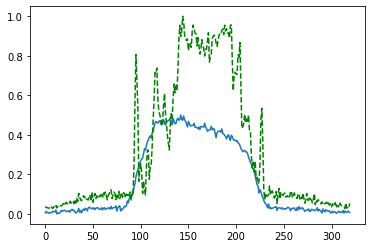

Time taken for epoch:  157.89610505104065
Epoch = [186/3000]  Iter = [   0/39480]  Loss = 0.1773 Avg Loss = 0.1773  Time = 0.0640s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [186/3000]  Iter = [ 100/39480]  Loss = 0.1643 Avg Loss = 0.1646  Time = 0.0035s
Epoch = [186/3000]  Iter = [ 200/39480]  Loss = 0.1402 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [186/3000]  Iter = [ 300/39480]  Loss = 0.1571 Avg Loss = 0.1572  Time = 0.0034s
Epoch = [186/3000]  Iter = [ 400/39480]  Loss = 0.1612 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [186/3000]  Iter = [ 500/39480]  Loss = 0.156 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [186/3000]  Iter = [ 600/39480]  Loss = 0.1348 Avg Loss = 0.1555  Time = 0.0031s
Epoch = [186/3000]  Iter = [ 700/39480]  Loss = 0.1549 Avg Loss = 0.1558  Time = 0.0032s
Epoch = [186/3000]  Iter = [ 800/39480]  Loss = 0.1795 Avg Loss = 0.1564  Time = 0.0035s
Epoch = [186/3000]  Iter = [ 900/39480]  Loss = 0.1737 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [186/3000]  Iter = [1000/39480]  Loss = 0.1617 Avg Loss = 0.156  Time = 0.0032s
Epoch = [186/3000]  Iter = [1100/39480]  Loss = 0.1639 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [186/3000]  Ite

Epoch = [186/3000]  Iter = [9400/39480]  Loss = 0.1433 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [186/3000]  Iter = [9500/39480]  Loss = 0.1765 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [186/3000]  Iter = [9600/39480]  Loss = 0.1552 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [186/3000]  Iter = [9700/39480]  Loss = 0.1801 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [186/3000]  Iter = [9800/39480]  Loss = 0.1705 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [186/3000]  Iter = [9900/39480]  Loss = 0.1416 Avg Loss = 0.156  Time = 0.0037s
Epoch = [186/3000]  Iter = [10000/39480]  Loss = 0.1576 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [186/3000]  Iter = [10100/39480]  Loss = 0.1349 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [186/3000]  Iter = [10200/39480]  Loss = 0.176 Avg Loss = 0.1586  Time = 0.0036s
Epoch = [186/3000]  Iter = [10300/39480]  Loss = 0.1445 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [186/3000]  Iter = [10400/39480]  Loss = 0.1561 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [186/3000]

Epoch = [186/3000]  Iter = [18600/39480]  Loss = 0.1359 Avg Loss = 0.1564  Time = 0.0038s
Epoch = [186/3000]  Iter = [18700/39480]  Loss = 0.1776 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [186/3000]  Iter = [18800/39480]  Loss = 0.1551 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [186/3000]  Iter = [18900/39480]  Loss = 0.1807 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [186/3000]  Iter = [19000/39480]  Loss = 0.169 Avg Loss = 0.1582  Time = 0.0033s
Epoch = [186/3000]  Iter = [19100/39480]  Loss = 0.1624 Avg Loss = 0.1576  Time = 0.0038s
Epoch = [186/3000]  Iter = [19200/39480]  Loss = 0.1427 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [186/3000]  Iter = [19300/39480]  Loss = 0.163 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [186/3000]  Iter = [19400/39480]  Loss = 0.1525 Avg Loss = 0.1546  Time = 0.0032s
Epoch = [186/3000]  Iter = [19500/39480]  Loss = 0.1324 Avg Loss = 0.1549  Time = 0.0034s
Epoch = [186/3000]  Iter = [19600/39480]  Loss = 0.1478 Avg Loss = 0.1575  Time = 0.0033s
Epoch = [186

Epoch = [186/3000]  Iter = [27800/39480]  Loss = 0.1536 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [186/3000]  Iter = [27900/39480]  Loss = 0.1523 Avg Loss = 0.157  Time = 0.0037s
Epoch = [186/3000]  Iter = [28000/39480]  Loss = 0.1421 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [186/3000]  Iter = [28100/39480]  Loss = 0.1583 Avg Loss = 0.157  Time = 0.0036s
Epoch = [186/3000]  Iter = [28200/39480]  Loss = 0.1379 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [186/3000]  Iter = [28300/39480]  Loss = 0.1642 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [186/3000]  Iter = [28400/39480]  Loss = 0.1761 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [186/3000]  Iter = [28500/39480]  Loss = 0.1425 Avg Loss = 0.156  Time = 0.0037s
Epoch = [186/3000]  Iter = [28600/39480]  Loss = 0.148 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [186/3000]  Iter = [28700/39480]  Loss = 0.1552 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [186/3000]  Iter = [28800/39480]  Loss = 0.1598 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [186/3

Epoch = [186/3000]  Iter = [37000/39480]  Loss = 0.1425 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [186/3000]  Iter = [37100/39480]  Loss = 0.1518 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [186/3000]  Iter = [37200/39480]  Loss = 0.1509 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [186/3000]  Iter = [37300/39480]  Loss = 0.159 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [186/3000]  Iter = [37400/39480]  Loss = 0.1888 Avg Loss = 0.1578  Time = 0.0038s
Epoch = [186/3000]  Iter = [37500/39480]  Loss = 0.159 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [186/3000]  Iter = [37600/39480]  Loss = 0.1658 Avg Loss = 0.1561  Time = 0.0033s
Epoch = [186/3000]  Iter = [37700/39480]  Loss = 0.152 Avg Loss = 0.158  Time = 0.0035s
Epoch = [186/3000]  Iter = [37800/39480]  Loss = 0.1766 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [186/3000]  Iter = [37900/39480]  Loss = 0.1572 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [186/3000]  Iter = [38000/39480]  Loss = 0.1733 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [186/3

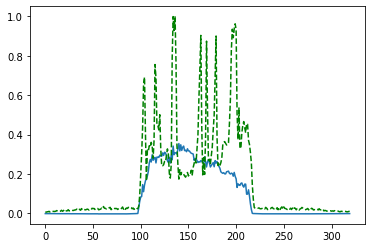

Time taken for epoch:  159.62364983558655
Epoch = [187/3000]  Iter = [   0/39480]  Loss = 0.1354 Avg Loss = 0.1354  Time = 0.0753s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [187/3000]  Iter = [ 100/39480]  Loss = 0.1463 Avg Loss = 0.1488  Time = 0.0032s
Epoch = [187/3000]  Iter = [ 200/39480]  Loss = 0.1689 Avg Loss = 0.1536  Time = 0.0037s
Epoch = [187/3000]  Iter = [ 300/39480]  Loss = 0.1426 Avg Loss = 0.1539  Time = 0.0037s
Epoch = [187/3000]  Iter = [ 400/39480]  Loss = 0.1376 Avg Loss = 0.1548  Time = 0.0036s
Epoch = [187/3000]  Iter = [ 500/39480]  Loss = 0.1802 Avg Loss = 0.1542  Time = 0.0037s
Epoch = [187/3000]  Iter = [ 600/39480]  Loss = 0.1613 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [187/3000]  Iter = [ 700/39480]  Loss = 0.1577 Avg Loss = 0.1553  Time = 0.0034s
Epoch = [187/3000]  Iter = [ 800/39480]  Loss = 0.1493 Avg Loss = 0.155  Time = 0.0036s
Epoch = [187/3000]  Iter = [ 900/39480]  Loss = 0.1469 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [187/3000]  Iter = [1000/39480]  Loss = 0.1608 Avg Loss = 0.1552  Time = 0.0036s
Epoch = [187/3000]  Iter = [1100/39480]  Loss = 0.1435 Avg Loss = 0.1546  Time = 0.0036s
Epoch = [187/3000]  It

Epoch = [187/3000]  Iter = [9400/39480]  Loss = 0.1629 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [187/3000]  Iter = [9500/39480]  Loss = 0.1482 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [187/3000]  Iter = [9600/39480]  Loss = 0.1626 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [187/3000]  Iter = [9700/39480]  Loss = 0.141 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [187/3000]  Iter = [9800/39480]  Loss = 0.1642 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [187/3000]  Iter = [9900/39480]  Loss = 0.1794 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [187/3000]  Iter = [10000/39480]  Loss = 0.1401 Avg Loss = 0.154  Time = 0.0037s
Epoch = [187/3000]  Iter = [10100/39480]  Loss = 0.1761 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [187/3000]  Iter = [10200/39480]  Loss = 0.1731 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [187/3000]  Iter = [10300/39480]  Loss = 0.1732 Avg Loss = 0.1562  Time = 0.0033s
Epoch = [187/3000]  Iter = [10400/39480]  Loss = 0.1469 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [187/3000]

Epoch = [187/3000]  Iter = [18600/39480]  Loss = 0.175 Avg Loss = 0.1572  Time = 0.0034s
Epoch = [187/3000]  Iter = [18700/39480]  Loss = 0.1598 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [187/3000]  Iter = [18800/39480]  Loss = 0.1738 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [187/3000]  Iter = [18900/39480]  Loss = 0.1545 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [187/3000]  Iter = [19000/39480]  Loss = 0.1739 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [187/3000]  Iter = [19100/39480]  Loss = 0.1426 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [187/3000]  Iter = [19200/39480]  Loss = 0.1596 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [187/3000]  Iter = [19300/39480]  Loss = 0.184 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [187/3000]  Iter = [19400/39480]  Loss = 0.137 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [187/3000]  Iter = [19500/39480]  Loss = 0.1499 Avg Loss = 0.1568  Time = 0.0032s
Epoch = [187/3000]  Iter = [19600/39480]  Loss = 0.152 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [187/3

Epoch = [187/3000]  Iter = [27800/39480]  Loss = 0.1606 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [187/3000]  Iter = [27900/39480]  Loss = 0.148 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [187/3000]  Iter = [28000/39480]  Loss = 0.1529 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [187/3000]  Iter = [28100/39480]  Loss = 0.1555 Avg Loss = 0.1562  Time = 0.0031s
Epoch = [187/3000]  Iter = [28200/39480]  Loss = 0.1311 Avg Loss = 0.1566  Time = 0.0033s
Epoch = [187/3000]  Iter = [28300/39480]  Loss = 0.1558 Avg Loss = 0.1575  Time = 0.0034s
Epoch = [187/3000]  Iter = [28400/39480]  Loss = 0.1295 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [187/3000]  Iter = [28500/39480]  Loss = 0.1543 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [187/3000]  Iter = [28600/39480]  Loss = 0.1677 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [187/3000]  Iter = [28700/39480]  Loss = 0.1693 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [187/3000]  Iter = [28800/39480]  Loss = 0.1412 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [18

Epoch = [187/3000]  Iter = [37000/39480]  Loss = 0.1739 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [187/3000]  Iter = [37100/39480]  Loss = 0.1576 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [187/3000]  Iter = [37200/39480]  Loss = 0.1386 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [187/3000]  Iter = [37300/39480]  Loss = 0.1923 Avg Loss = 0.1548  Time = 0.0035s
Epoch = [187/3000]  Iter = [37400/39480]  Loss = 0.1761 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [187/3000]  Iter = [37500/39480]  Loss = 0.1537 Avg Loss = 0.1589  Time = 0.0032s
Epoch = [187/3000]  Iter = [37600/39480]  Loss = 0.1588 Avg Loss = 0.1575  Time = 0.0034s
Epoch = [187/3000]  Iter = [37700/39480]  Loss = 0.1663 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [187/3000]  Iter = [37800/39480]  Loss = 0.159 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [187/3000]  Iter = [37900/39480]  Loss = 0.1472 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [187/3000]  Iter = [38000/39480]  Loss = 0.1815 Avg Loss = 0.1583  Time = 0.0037s
Epoch = [18

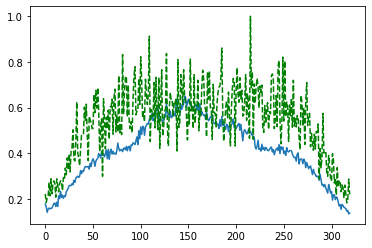

Time taken for epoch:  158.96848130226135
Epoch = [188/3000]  Iter = [   0/39480]  Loss = 0.186 Avg Loss = 0.186  Time = 0.0747s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [188/3000]  Iter = [ 100/39480]  Loss = 0.1574 Avg Loss = 0.1677  Time = 0.0035s
Epoch = [188/3000]  Iter = [ 200/39480]  Loss = 0.1486 Avg Loss = 0.1595  Time = 0.0040s
Epoch = [188/3000]  Iter = [ 300/39480]  Loss = 0.1664 Avg Loss = 0.1568  Time = 0.0040s
Epoch = [188/3000]  Iter = [ 400/39480]  Loss = 0.1603 Avg Loss = 0.1548  Time = 0.0035s
Epoch = [188/3000]  Iter = [ 500/39480]  Loss = 0.1633 Avg Loss = 0.1556  Time = 0.0034s
Epoch = [188/3000]  Iter = [ 600/39480]  Loss = 0.1685 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [188/3000]  Iter = [ 700/39480]  Loss = 0.1593 Avg Loss = 0.1571  Time = 0.0033s
Epoch = [188/3000]  Iter = [ 800/39480]  Loss = 0.1312 Avg Loss = 0.1558  Time = 0.0039s
Epoch = [188/3000]  Iter = [ 900/39480]  Loss = 0.1876 Avg Loss = 0.1549  Time = 0.0038s
Epoch = [188/3000]  Iter = [1000/39480]  Loss = 0.1526 Avg Loss = 0.1545  Time = 0.0039s
Epoch = [188/3000]  Iter = [1100/39480]  Loss = 0.1752 Avg Loss = 0.1559  Time = 0.0039s
Epoch = [188/3000]  I

Epoch = [188/3000]  Iter = [9400/39480]  Loss = 0.1465 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [188/3000]  Iter = [9500/39480]  Loss = 0.1571 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [188/3000]  Iter = [9600/39480]  Loss = 0.1543 Avg Loss = 0.1577  Time = 0.0038s
Epoch = [188/3000]  Iter = [9700/39480]  Loss = 0.1694 Avg Loss = 0.1582  Time = 0.0038s
Epoch = [188/3000]  Iter = [9800/39480]  Loss = 0.1502 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [188/3000]  Iter = [9900/39480]  Loss = 0.1616 Avg Loss = 0.1559  Time = 0.0038s
Epoch = [188/3000]  Iter = [10000/39480]  Loss = 0.13 Avg Loss = 0.1567  Time = 0.0038s
Epoch = [188/3000]  Iter = [10100/39480]  Loss = 0.1526 Avg Loss = 0.1565  Time = 0.0038s
Epoch = [188/3000]  Iter = [10200/39480]  Loss = 0.1443 Avg Loss = 0.1552  Time = 0.0038s
Epoch = [188/3000]  Iter = [10300/39480]  Loss = 0.1538 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [188/3000]  Iter = [10400/39480]  Loss = 0.1522 Avg Loss = 0.1556  Time = 0.0038s
Epoch = [188/3000]

Epoch = [188/3000]  Iter = [18600/39480]  Loss = 0.1372 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [188/3000]  Iter = [18700/39480]  Loss = 0.1337 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [188/3000]  Iter = [18800/39480]  Loss = 0.1478 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [188/3000]  Iter = [18900/39480]  Loss = 0.1544 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [188/3000]  Iter = [19000/39480]  Loss = 0.1697 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [188/3000]  Iter = [19100/39480]  Loss = 0.1738 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [188/3000]  Iter = [19200/39480]  Loss = 0.1688 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [188/3000]  Iter = [19300/39480]  Loss = 0.1756 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [188/3000]  Iter = [19400/39480]  Loss = 0.1344 Avg Loss = 0.1559  Time = 0.0032s
Epoch = [188/3000]  Iter = [19500/39480]  Loss = 0.1778 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [188/3000]  Iter = [19600/39480]  Loss = 0.1404 Avg Loss = 0.155  Time = 0.0037s
Epoch = [18

Epoch = [188/3000]  Iter = [27800/39480]  Loss = 0.1589 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [188/3000]  Iter = [27900/39480]  Loss = 0.1534 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [188/3000]  Iter = [28000/39480]  Loss = 0.1696 Avg Loss = 0.157  Time = 0.0040s
Epoch = [188/3000]  Iter = [28100/39480]  Loss = 0.139 Avg Loss = 0.1564  Time = 0.0040s
Epoch = [188/3000]  Iter = [28200/39480]  Loss = 0.1757 Avg Loss = 0.1567  Time = 0.0040s
Epoch = [188/3000]  Iter = [28300/39480]  Loss = 0.1843 Avg Loss = 0.1571  Time = 0.0038s
Epoch = [188/3000]  Iter = [28400/39480]  Loss = 0.1513 Avg Loss = 0.1573  Time = 0.0038s
Epoch = [188/3000]  Iter = [28500/39480]  Loss = 0.1642 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [188/3000]  Iter = [28600/39480]  Loss = 0.1563 Avg Loss = 0.1584  Time = 0.0035s
Epoch = [188/3000]  Iter = [28700/39480]  Loss = 0.1333 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [188/3000]  Iter = [28800/39480]  Loss = 0.1658 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [188

Epoch = [188/3000]  Iter = [37000/39480]  Loss = 0.1573 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [188/3000]  Iter = [37100/39480]  Loss = 0.1528 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [188/3000]  Iter = [37200/39480]  Loss = 0.1355 Avg Loss = 0.1579  Time = 0.0040s
Epoch = [188/3000]  Iter = [37300/39480]  Loss = 0.1768 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [188/3000]  Iter = [37400/39480]  Loss = 0.1313 Avg Loss = 0.1565  Time = 0.0033s
Epoch = [188/3000]  Iter = [37500/39480]  Loss = 0.1661 Avg Loss = 0.1568  Time = 0.0038s
Epoch = [188/3000]  Iter = [37600/39480]  Loss = 0.1564 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [188/3000]  Iter = [37700/39480]  Loss = 0.1497 Avg Loss = 0.1568  Time = 0.0038s
Epoch = [188/3000]  Iter = [37800/39480]  Loss = 0.175 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [188/3000]  Iter = [37900/39480]  Loss = 0.1571 Avg Loss = 0.1578  Time = 0.0038s
Epoch = [188/3000]  Iter = [38000/39480]  Loss = 0.1562 Avg Loss = 0.1588  Time = 0.0038s
Epoch = [18

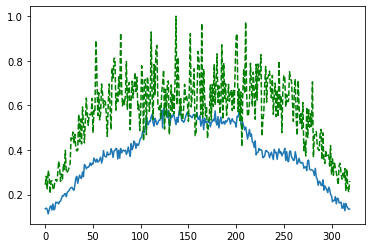

Time taken for epoch:  163.7677459716797
Epoch = [189/3000]  Iter = [   0/39480]  Loss = 0.1467 Avg Loss = 0.1467  Time = 0.0671s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [189/3000]  Iter = [ 100/39480]  Loss = 0.1486 Avg Loss = 0.1514  Time = 0.0038s
Epoch = [189/3000]  Iter = [ 200/39480]  Loss = 0.1637 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [189/3000]  Iter = [ 300/39480]  Loss = 0.169 Avg Loss = 0.156  Time = 0.0036s
Epoch = [189/3000]  Iter = [ 400/39480]  Loss = 0.1426 Avg Loss = 0.1561  Time = 0.0054s
Epoch = [189/3000]  Iter = [ 500/39480]  Loss = 0.1505 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [189/3000]  Iter = [ 600/39480]  Loss = 0.1456 Avg Loss = 0.1554  Time = 0.0034s
Epoch = [189/3000]  Iter = [ 700/39480]  Loss = 0.123 Avg Loss = 0.1562  Time = 0.0031s
Epoch = [189/3000]  Iter = [ 800/39480]  Loss = 0.1526 Avg Loss = 0.1565  Time = 0.0031s
Epoch = [189/3000]  Iter = [ 900/39480]  Loss = 0.1466 Avg Loss = 0.1546  Time = 0.0030s
Epoch = [189/3000]  Iter = [1000/39480]  Loss = 0.1696 Avg Loss = 0.1566  Time = 0.0031s
Epoch = [189/3000]  Iter = [1100/39480]  Loss = 0.1512 Avg Loss = 0.1577  Time = 0.0029s
Epoch = [189/3000]  Iter

Epoch = [189/3000]  Iter = [9400/39480]  Loss = 0.1795 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [189/3000]  Iter = [9500/39480]  Loss = 0.165 Avg Loss = 0.1571  Time = 0.0035s
Epoch = [189/3000]  Iter = [9600/39480]  Loss = 0.1528 Avg Loss = 0.1593  Time = 0.0036s
Epoch = [189/3000]  Iter = [9700/39480]  Loss = 0.1592 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [189/3000]  Iter = [9800/39480]  Loss = 0.1526 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [189/3000]  Iter = [9900/39480]  Loss = 0.1663 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [189/3000]  Iter = [10000/39480]  Loss = 0.1642 Avg Loss = 0.157  Time = 0.0036s
Epoch = [189/3000]  Iter = [10100/39480]  Loss = 0.181 Avg Loss = 0.1584  Time = 0.0037s
Epoch = [189/3000]  Iter = [10200/39480]  Loss = 0.152 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [189/3000]  Iter = [10300/39480]  Loss = 0.1669 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [189/3000]  Iter = [10400/39480]  Loss = 0.1639 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [189/3000]  

Epoch = [189/3000]  Iter = [18600/39480]  Loss = 0.1501 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [189/3000]  Iter = [18700/39480]  Loss = 0.1372 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [189/3000]  Iter = [18800/39480]  Loss = 0.1748 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [189/3000]  Iter = [18900/39480]  Loss = 0.1551 Avg Loss = 0.155  Time = 0.0033s
Epoch = [189/3000]  Iter = [19000/39480]  Loss = 0.143 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [189/3000]  Iter = [19100/39480]  Loss = 0.1929 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [189/3000]  Iter = [19200/39480]  Loss = 0.1308 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [189/3000]  Iter = [19300/39480]  Loss = 0.1429 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [189/3000]  Iter = [19400/39480]  Loss = 0.1723 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [189/3000]  Iter = [19500/39480]  Loss = 0.1403 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [189/3000]  Iter = [19600/39480]  Loss = 0.1548 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [189

Epoch = [189/3000]  Iter = [27800/39480]  Loss = 0.1805 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [189/3000]  Iter = [27900/39480]  Loss = 0.1618 Avg Loss = 0.157  Time = 0.0031s
Epoch = [189/3000]  Iter = [28000/39480]  Loss = 0.1524 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [189/3000]  Iter = [28100/39480]  Loss = 0.1528 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [189/3000]  Iter = [28200/39480]  Loss = 0.1576 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [189/3000]  Iter = [28300/39480]  Loss = 0.1602 Avg Loss = 0.1574  Time = 0.0032s
Epoch = [189/3000]  Iter = [28400/39480]  Loss = 0.1656 Avg Loss = 0.1568  Time = 0.0032s
Epoch = [189/3000]  Iter = [28500/39480]  Loss = 0.1609 Avg Loss = 0.156  Time = 0.0036s
Epoch = [189/3000]  Iter = [28600/39480]  Loss = 0.1456 Avg Loss = 0.1562  Time = 0.0035s
Epoch = [189/3000]  Iter = [28700/39480]  Loss = 0.1308 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [189/3000]  Iter = [28800/39480]  Loss = 0.1596 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [189

Epoch = [189/3000]  Iter = [37000/39480]  Loss = 0.1574 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [189/3000]  Iter = [37100/39480]  Loss = 0.1571 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [189/3000]  Iter = [37200/39480]  Loss = 0.1629 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [189/3000]  Iter = [37300/39480]  Loss = 0.1637 Avg Loss = 0.158  Time = 0.0034s
Epoch = [189/3000]  Iter = [37400/39480]  Loss = 0.139 Avg Loss = 0.156  Time = 0.0035s
Epoch = [189/3000]  Iter = [37500/39480]  Loss = 0.1479 Avg Loss = 0.1561  Time = 0.0039s
Epoch = [189/3000]  Iter = [37600/39480]  Loss = 0.1569 Avg Loss = 0.1556  Time = 0.0038s
Epoch = [189/3000]  Iter = [37700/39480]  Loss = 0.178 Avg Loss = 0.1585  Time = 0.0033s
Epoch = [189/3000]  Iter = [37800/39480]  Loss = 0.1497 Avg Loss = 0.1584  Time = 0.0035s
Epoch = [189/3000]  Iter = [37900/39480]  Loss = 0.1532 Avg Loss = 0.1574  Time = 0.0038s
Epoch = [189/3000]  Iter = [38000/39480]  Loss = 0.1398 Avg Loss = 0.1562  Time = 0.0038s
Epoch = [189/3

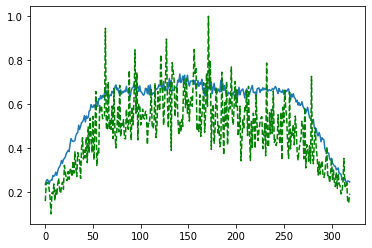

Time taken for epoch:  160.28570413589478
Epoch = [190/3000]  Iter = [   0/39480]  Loss = 0.1446 Avg Loss = 0.1446  Time = 0.0686s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [190/3000]  Iter = [ 100/39480]  Loss = 0.1353 Avg Loss = 0.1528  Time = 0.0036s
Epoch = [190/3000]  Iter = [ 200/39480]  Loss = 0.178 Avg Loss = 0.1542  Time = 0.0037s
Epoch = [190/3000]  Iter = [ 300/39480]  Loss = 0.1859 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [190/3000]  Iter = [ 400/39480]  Loss = 0.1618 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [190/3000]  Iter = [ 500/39480]  Loss = 0.1569 Avg Loss = 0.1551  Time = 0.0038s
Epoch = [190/3000]  Iter = [ 600/39480]  Loss = 0.1451 Avg Loss = 0.1565  Time = 0.0041s
Epoch = [190/3000]  Iter = [ 700/39480]  Loss = 0.1619 Avg Loss = 0.1556  Time = 0.0041s
Epoch = [190/3000]  Iter = [ 800/39480]  Loss = 0.1577 Avg Loss = 0.1556  Time = 0.0042s
Epoch = [190/3000]  Iter = [ 900/39480]  Loss = 0.1718 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [190/3000]  Iter = [1000/39480]  Loss = 0.1225 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [190/3000]  Iter = [1100/39480]  Loss = 0.1495 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [190/3000]  It

Epoch = [190/3000]  Iter = [9400/39480]  Loss = 0.1531 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [190/3000]  Iter = [9500/39480]  Loss = 0.1602 Avg Loss = 0.157  Time = 0.0033s
Epoch = [190/3000]  Iter = [9600/39480]  Loss = 0.1629 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [190/3000]  Iter = [9700/39480]  Loss = 0.1539 Avg Loss = 0.1543  Time = 0.0033s
Epoch = [190/3000]  Iter = [9800/39480]  Loss = 0.1567 Avg Loss = 0.1545  Time = 0.0034s
Epoch = [190/3000]  Iter = [9900/39480]  Loss = 0.1377 Avg Loss = 0.1566  Time = 0.0034s
Epoch = [190/3000]  Iter = [10000/39480]  Loss = 0.1349 Avg Loss = 0.1549  Time = 0.0036s
Epoch = [190/3000]  Iter = [10100/39480]  Loss = 0.16 Avg Loss = 0.1542  Time = 0.0037s
Epoch = [190/3000]  Iter = [10200/39480]  Loss = 0.1554 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [190/3000]  Iter = [10300/39480]  Loss = 0.1602 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [190/3000]  Iter = [10400/39480]  Loss = 0.1464 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [190/3000] 

Epoch = [190/3000]  Iter = [18600/39480]  Loss = 0.1791 Avg Loss = 0.1582  Time = 0.0035s
Epoch = [190/3000]  Iter = [18700/39480]  Loss = 0.157 Avg Loss = 0.1566  Time = 0.0035s
Epoch = [190/3000]  Iter = [18800/39480]  Loss = 0.1456 Avg Loss = 0.1571  Time = 0.0035s
Epoch = [190/3000]  Iter = [18900/39480]  Loss = 0.1609 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [190/3000]  Iter = [19000/39480]  Loss = 0.1665 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [190/3000]  Iter = [19100/39480]  Loss = 0.1249 Avg Loss = 0.1559  Time = 0.0032s
Epoch = [190/3000]  Iter = [19200/39480]  Loss = 0.1567 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [190/3000]  Iter = [19300/39480]  Loss = 0.1562 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [190/3000]  Iter = [19400/39480]  Loss = 0.1506 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [190/3000]  Iter = [19500/39480]  Loss = 0.1381 Avg Loss = 0.1562  Time = 0.0035s
Epoch = [190/3000]  Iter = [19600/39480]  Loss = 0.1386 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [19

Epoch = [190/3000]  Iter = [27800/39480]  Loss = 0.159 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [190/3000]  Iter = [27900/39480]  Loss = 0.1389 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [190/3000]  Iter = [28000/39480]  Loss = 0.1667 Avg Loss = 0.1572  Time = 0.0031s
Epoch = [190/3000]  Iter = [28100/39480]  Loss = 0.1333 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [190/3000]  Iter = [28200/39480]  Loss = 0.1425 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [190/3000]  Iter = [28300/39480]  Loss = 0.1754 Avg Loss = 0.1571  Time = 0.0033s
Epoch = [190/3000]  Iter = [28400/39480]  Loss = 0.1744 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [190/3000]  Iter = [28500/39480]  Loss = 0.1529 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [190/3000]  Iter = [28600/39480]  Loss = 0.1623 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [190/3000]  Iter = [28700/39480]  Loss = 0.1561 Avg Loss = 0.1585  Time = 0.0032s
Epoch = [190/3000]  Iter = [28800/39480]  Loss = 0.1634 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [19

Epoch = [190/3000]  Iter = [37000/39480]  Loss = 0.1926 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [190/3000]  Iter = [37100/39480]  Loss = 0.1627 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [190/3000]  Iter = [37200/39480]  Loss = 0.1516 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [190/3000]  Iter = [37300/39480]  Loss = 0.2045 Avg Loss = 0.158  Time = 0.0037s
Epoch = [190/3000]  Iter = [37400/39480]  Loss = 0.1556 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [190/3000]  Iter = [37500/39480]  Loss = 0.1562 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [190/3000]  Iter = [37600/39480]  Loss = 0.145 Avg Loss = 0.1589  Time = 0.0040s
Epoch = [190/3000]  Iter = [37700/39480]  Loss = 0.1549 Avg Loss = 0.1584  Time = 0.0040s
Epoch = [190/3000]  Iter = [37800/39480]  Loss = 0.1576 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [190/3000]  Iter = [37900/39480]  Loss = 0.1488 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [190/3000]  Iter = [38000/39480]  Loss = 0.1648 Avg Loss = 0.1586  Time = 0.0035s
Epoch = [190

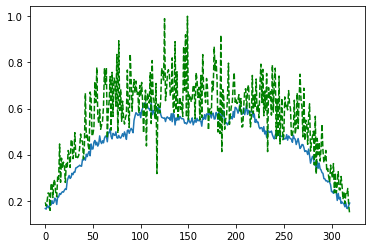

Time taken for epoch:  158.8318953514099
Epoch = [191/3000]  Iter = [   0/39480]  Loss = 0.1626 Avg Loss = 0.1626  Time = 0.0647s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [191/3000]  Iter = [ 100/39480]  Loss = 0.1724 Avg Loss = 0.16  Time = 0.0036s
Epoch = [191/3000]  Iter = [ 200/39480]  Loss = 0.1469 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [191/3000]  Iter = [ 300/39480]  Loss = 0.163 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [191/3000]  Iter = [ 400/39480]  Loss = 0.1504 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [191/3000]  Iter = [ 500/39480]  Loss = 0.1423 Avg Loss = 0.1567  Time = 0.0040s
Epoch = [191/3000]  Iter = [ 600/39480]  Loss = 0.1509 Avg Loss = 0.1547  Time = 0.0036s
Epoch = [191/3000]  Iter = [ 700/39480]  Loss = 0.1536 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [191/3000]  Iter = [ 800/39480]  Loss = 0.1559 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [191/3000]  Iter = [ 900/39480]  Loss = 0.1674 Avg Loss = 0.1589  Time = 0.0036s
Epoch = [191/3000]  Iter = [1000/39480]  Loss = 0.1693 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [191/3000]  Iter = [1100/39480]  Loss = 0.137 Avg Loss = 0.155  Time = 0.0035s
Epoch = [191/3000]  Iter =

Epoch = [191/3000]  Iter = [9400/39480]  Loss = 0.1785 Avg Loss = 0.1567  Time = 0.0034s
Epoch = [191/3000]  Iter = [9500/39480]  Loss = 0.1371 Avg Loss = 0.155  Time = 0.0035s
Epoch = [191/3000]  Iter = [9600/39480]  Loss = 0.1629 Avg Loss = 0.1586  Time = 0.0040s
Epoch = [191/3000]  Iter = [9700/39480]  Loss = 0.1388 Avg Loss = 0.1574  Time = 0.0038s
Epoch = [191/3000]  Iter = [9800/39480]  Loss = 0.1618 Avg Loss = 0.1575  Time = 0.0041s
Epoch = [191/3000]  Iter = [9900/39480]  Loss = 0.1662 Avg Loss = 0.1577  Time = 0.0039s
Epoch = [191/3000]  Iter = [10000/39480]  Loss = 0.1401 Avg Loss = 0.1574  Time = 0.0041s
Epoch = [191/3000]  Iter = [10100/39480]  Loss = 0.1753 Avg Loss = 0.158  Time = 0.0040s
Epoch = [191/3000]  Iter = [10200/39480]  Loss = 0.1667 Avg Loss = 0.1585  Time = 0.0038s
Epoch = [191/3000]  Iter = [10300/39480]  Loss = 0.1471 Avg Loss = 0.1582  Time = 0.0040s
Epoch = [191/3000]  Iter = [10400/39480]  Loss = 0.1561 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [191/3000]

Epoch = [191/3000]  Iter = [18600/39480]  Loss = 0.1398 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [191/3000]  Iter = [18700/39480]  Loss = 0.1659 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [191/3000]  Iter = [18800/39480]  Loss = 0.1846 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [191/3000]  Iter = [18900/39480]  Loss = 0.1587 Avg Loss = 0.155  Time = 0.0037s
Epoch = [191/3000]  Iter = [19000/39480]  Loss = 0.1595 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [191/3000]  Iter = [19100/39480]  Loss = 0.1554 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [191/3000]  Iter = [19200/39480]  Loss = 0.1673 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [191/3000]  Iter = [19300/39480]  Loss = 0.157 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [191/3000]  Iter = [19400/39480]  Loss = 0.1728 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [191/3000]  Iter = [19500/39480]  Loss = 0.1592 Avg Loss = 0.1552  Time = 0.0036s
Epoch = [191/3000]  Iter = [19600/39480]  Loss = 0.1549 Avg Loss = 0.1542  Time = 0.0036s
Epoch = [191

Epoch = [191/3000]  Iter = [27800/39480]  Loss = 0.1906 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [191/3000]  Iter = [27900/39480]  Loss = 0.1554 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [191/3000]  Iter = [28000/39480]  Loss = 0.1682 Avg Loss = 0.158  Time = 0.0035s
Epoch = [191/3000]  Iter = [28100/39480]  Loss = 0.159 Avg Loss = 0.1567  Time = 0.0034s
Epoch = [191/3000]  Iter = [28200/39480]  Loss = 0.1499 Avg Loss = 0.1571  Time = 0.0039s
Epoch = [191/3000]  Iter = [28300/39480]  Loss = 0.1789 Avg Loss = 0.1569  Time = 0.0038s
Epoch = [191/3000]  Iter = [28400/39480]  Loss = 0.1443 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [191/3000]  Iter = [28500/39480]  Loss = 0.1518 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [191/3000]  Iter = [28600/39480]  Loss = 0.1519 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [191/3000]  Iter = [28700/39480]  Loss = 0.1563 Avg Loss = 0.1553  Time = 0.0038s
Epoch = [191/3000]  Iter = [28800/39480]  Loss = 0.1636 Avg Loss = 0.1559  Time = 0.0034s
Epoch = [191

Epoch = [191/3000]  Iter = [37000/39480]  Loss = 0.1341 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [191/3000]  Iter = [37100/39480]  Loss = 0.1508 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [191/3000]  Iter = [37200/39480]  Loss = 0.1723 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [191/3000]  Iter = [37300/39480]  Loss = 0.1395 Avg Loss = 0.1592  Time = 0.0035s
Epoch = [191/3000]  Iter = [37400/39480]  Loss = 0.1487 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [191/3000]  Iter = [37500/39480]  Loss = 0.1533 Avg Loss = 0.156  Time = 0.0037s
Epoch = [191/3000]  Iter = [37600/39480]  Loss = 0.1641 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [191/3000]  Iter = [37700/39480]  Loss = 0.1577 Avg Loss = 0.1571  Time = 0.0032s
Epoch = [191/3000]  Iter = [37800/39480]  Loss = 0.1708 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [191/3000]  Iter = [37900/39480]  Loss = 0.1671 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [191/3000]  Iter = [38000/39480]  Loss = 0.1517 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [19

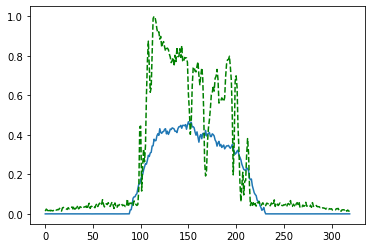

Time taken for epoch:  160.4666166305542
Epoch = [192/3000]  Iter = [   0/39480]  Loss = 0.1626 Avg Loss = 0.1626  Time = 0.0655s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [192/3000]  Iter = [ 100/39480]  Loss = 0.1336 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [192/3000]  Iter = [ 200/39480]  Loss = 0.1691 Avg Loss = 0.1566  Time = 0.0038s
Epoch = [192/3000]  Iter = [ 300/39480]  Loss = 0.1436 Avg Loss = 0.1559  Time = 0.0038s
Epoch = [192/3000]  Iter = [ 400/39480]  Loss = 0.1842 Avg Loss = 0.1567  Time = 0.0038s
Epoch = [192/3000]  Iter = [ 500/39480]  Loss = 0.1469 Avg Loss = 0.1561  Time = 0.0038s
Epoch = [192/3000]  Iter = [ 600/39480]  Loss = 0.1579 Avg Loss = 0.156  Time = 0.0038s
Epoch = [192/3000]  Iter = [ 700/39480]  Loss = 0.1901 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [192/3000]  Iter = [ 800/39480]  Loss = 0.135 Avg Loss = 0.157  Time = 0.0038s
Epoch = [192/3000]  Iter = [ 900/39480]  Loss = 0.1366 Avg Loss = 0.156  Time = 0.0038s
Epoch = [192/3000]  Iter = [1000/39480]  Loss = 0.1733 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [192/3000]  Iter = [1100/39480]  Loss = 0.128 Avg Loss = 0.1555  Time = 0.0037s
Epoch = [192/3000]  Iter =

Epoch = [192/3000]  Iter = [9400/39480]  Loss = 0.1692 Avg Loss = 0.1575  Time = 0.0033s
Epoch = [192/3000]  Iter = [9500/39480]  Loss = 0.175 Avg Loss = 0.1586  Time = 0.0032s
Epoch = [192/3000]  Iter = [9600/39480]  Loss = 0.1627 Avg Loss = 0.1576  Time = 0.0034s
Epoch = [192/3000]  Iter = [9700/39480]  Loss = 0.17 Avg Loss = 0.157  Time = 0.0036s
Epoch = [192/3000]  Iter = [9800/39480]  Loss = 0.1704 Avg Loss = 0.1582  Time = 0.0034s
Epoch = [192/3000]  Iter = [9900/39480]  Loss = 0.1444 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [192/3000]  Iter = [10000/39480]  Loss = 0.1515 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [192/3000]  Iter = [10100/39480]  Loss = 0.1546 Avg Loss = 0.1571  Time = 0.0035s
Epoch = [192/3000]  Iter = [10200/39480]  Loss = 0.1491 Avg Loss = 0.157  Time = 0.0036s
Epoch = [192/3000]  Iter = [10300/39480]  Loss = 0.1522 Avg Loss = 0.1554  Time = 0.0033s
Epoch = [192/3000]  Iter = [10400/39480]  Loss = 0.1326 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [192/3000]  I

Epoch = [192/3000]  Iter = [18600/39480]  Loss = 0.1592 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [192/3000]  Iter = [18700/39480]  Loss = 0.1584 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [192/3000]  Iter = [18800/39480]  Loss = 0.1693 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [192/3000]  Iter = [18900/39480]  Loss = 0.1397 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [192/3000]  Iter = [19000/39480]  Loss = 0.1446 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [192/3000]  Iter = [19100/39480]  Loss = 0.1693 Avg Loss = 0.1584  Time = 0.0041s
Epoch = [192/3000]  Iter = [19200/39480]  Loss = 0.1679 Avg Loss = 0.158  Time = 0.0042s
Epoch = [192/3000]  Iter = [19300/39480]  Loss = 0.1502 Avg Loss = 0.1585  Time = 0.0041s
Epoch = [192/3000]  Iter = [19400/39480]  Loss = 0.1524 Avg Loss = 0.1581  Time = 0.0041s
Epoch = [192/3000]  Iter = [19500/39480]  Loss = 0.123 Avg Loss = 0.1588  Time = 0.0042s
Epoch = [192/3000]  Iter = [19600/39480]  Loss = 0.1702 Avg Loss = 0.1592  Time = 0.0042s
Epoch = [192

Epoch = [192/3000]  Iter = [27800/39480]  Loss = 0.157 Avg Loss = 0.1565  Time = 0.0037s
Epoch = [192/3000]  Iter = [27900/39480]  Loss = 0.1726 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [192/3000]  Iter = [28000/39480]  Loss = 0.145 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [192/3000]  Iter = [28100/39480]  Loss = 0.1422 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [192/3000]  Iter = [28200/39480]  Loss = 0.1506 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [192/3000]  Iter = [28300/39480]  Loss = 0.1391 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [192/3000]  Iter = [28400/39480]  Loss = 0.1673 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [192/3000]  Iter = [28500/39480]  Loss = 0.1676 Avg Loss = 0.1563  Time = 0.0031s
Epoch = [192/3000]  Iter = [28600/39480]  Loss = 0.1438 Avg Loss = 0.1572  Time = 0.0032s
Epoch = [192/3000]  Iter = [28700/39480]  Loss = 0.1715 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [192/3000]  Iter = [28800/39480]  Loss = 0.1714 Avg Loss = 0.1592  Time = 0.0036s
Epoch = [192

Epoch = [192/3000]  Iter = [37000/39480]  Loss = 0.1515 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [192/3000]  Iter = [37100/39480]  Loss = 0.1631 Avg Loss = 0.154  Time = 0.0035s
Epoch = [192/3000]  Iter = [37200/39480]  Loss = 0.1474 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [192/3000]  Iter = [37300/39480]  Loss = 0.1512 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [192/3000]  Iter = [37400/39480]  Loss = 0.1658 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [192/3000]  Iter = [37500/39480]  Loss = 0.1593 Avg Loss = 0.156  Time = 0.0036s
Epoch = [192/3000]  Iter = [37600/39480]  Loss = 0.1639 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [192/3000]  Iter = [37700/39480]  Loss = 0.149 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [192/3000]  Iter = [37800/39480]  Loss = 0.1438 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [192/3000]  Iter = [37900/39480]  Loss = 0.1538 Avg Loss = 0.156  Time = 0.0037s
Epoch = [192/3000]  Iter = [38000/39480]  Loss = 0.1734 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [192/3

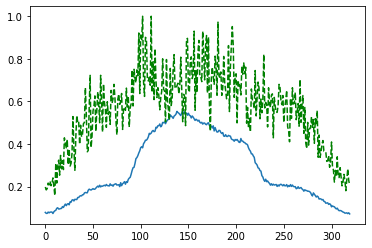

Time taken for epoch:  159.13215970993042
Epoch = [193/3000]  Iter = [   0/39480]  Loss = 0.1555 Avg Loss = 0.1555  Time = 0.0678s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [193/3000]  Iter = [ 100/39480]  Loss = 0.1423 Avg Loss = 0.1554  Time = 0.0041s
Epoch = [193/3000]  Iter = [ 200/39480]  Loss = 0.1446 Avg Loss = 0.1551  Time = 0.0036s
Epoch = [193/3000]  Iter = [ 300/39480]  Loss = 0.1468 Avg Loss = 0.1555  Time = 0.0036s
Epoch = [193/3000]  Iter = [ 400/39480]  Loss = 0.1628 Avg Loss = 0.1555  Time = 0.0034s
Epoch = [193/3000]  Iter = [ 500/39480]  Loss = 0.1518 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [193/3000]  Iter = [ 600/39480]  Loss = 0.1615 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [193/3000]  Iter = [ 700/39480]  Loss = 0.1598 Avg Loss = 0.156  Time = 0.0037s
Epoch = [193/3000]  Iter = [ 800/39480]  Loss = 0.1456 Avg Loss = 0.1573  Time = 0.0030s
Epoch = [193/3000]  Iter = [ 900/39480]  Loss = 0.1419 Avg Loss = 0.1571  Time = 0.0031s
Epoch = [193/3000]  Iter = [1000/39480]  Loss = 0.1769 Avg Loss = 0.1541  Time = 0.0033s
Epoch = [193/3000]  Iter = [1100/39480]  Loss = 0.1548 Avg Loss = 0.1557  Time = 0.0032s
Epoch = [193/3000]  It

Epoch = [193/3000]  Iter = [9400/39480]  Loss = 0.1424 Avg Loss = 0.1576  Time = 0.0038s
Epoch = [193/3000]  Iter = [9500/39480]  Loss = 0.1502 Avg Loss = 0.158  Time = 0.0038s
Epoch = [193/3000]  Iter = [9600/39480]  Loss = 0.1755 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [193/3000]  Iter = [9700/39480]  Loss = 0.1475 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [193/3000]  Iter = [9800/39480]  Loss = 0.1512 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [193/3000]  Iter = [9900/39480]  Loss = 0.1405 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [193/3000]  Iter = [10000/39480]  Loss = 0.1553 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [193/3000]  Iter = [10100/39480]  Loss = 0.1266 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [193/3000]  Iter = [10200/39480]  Loss = 0.1481 Avg Loss = 0.157  Time = 0.0037s
Epoch = [193/3000]  Iter = [10300/39480]  Loss = 0.1371 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [193/3000]  Iter = [10400/39480]  Loss = 0.1374 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [193/3000]

Epoch = [193/3000]  Iter = [18600/39480]  Loss = 0.1752 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [193/3000]  Iter = [18700/39480]  Loss = 0.152 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [193/3000]  Iter = [18800/39480]  Loss = 0.1737 Avg Loss = 0.156  Time = 0.0037s
Epoch = [193/3000]  Iter = [18900/39480]  Loss = 0.173 Avg Loss = 0.1559  Time = 0.0034s
Epoch = [193/3000]  Iter = [19000/39480]  Loss = 0.1413 Avg Loss = 0.1556  Time = 0.0035s
Epoch = [193/3000]  Iter = [19100/39480]  Loss = 0.1494 Avg Loss = 0.1573  Time = 0.0035s
Epoch = [193/3000]  Iter = [19200/39480]  Loss = 0.1833 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [193/3000]  Iter = [19300/39480]  Loss = 0.1785 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [193/3000]  Iter = [19400/39480]  Loss = 0.1811 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [193/3000]  Iter = [19500/39480]  Loss = 0.1317 Avg Loss = 0.1586  Time = 0.0037s
Epoch = [193/3000]  Iter = [19600/39480]  Loss = 0.1556 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [193/

Epoch = [193/3000]  Iter = [27800/39480]  Loss = 0.1745 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [193/3000]  Iter = [27900/39480]  Loss = 0.1796 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [193/3000]  Iter = [28000/39480]  Loss = 0.17 Avg Loss = 0.1576  Time = 0.0037s
Epoch = [193/3000]  Iter = [28100/39480]  Loss = 0.1743 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [193/3000]  Iter = [28200/39480]  Loss = 0.1442 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [193/3000]  Iter = [28300/39480]  Loss = 0.1588 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [193/3000]  Iter = [28400/39480]  Loss = 0.1382 Avg Loss = 0.1578  Time = 0.0032s
Epoch = [193/3000]  Iter = [28500/39480]  Loss = 0.1452 Avg Loss = 0.1552  Time = 0.0036s
Epoch = [193/3000]  Iter = [28600/39480]  Loss = 0.1731 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [193/3000]  Iter = [28700/39480]  Loss = 0.1572 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [193/3000]  Iter = [28800/39480]  Loss = 0.1694 Avg Loss = 0.1548  Time = 0.0037s
Epoch = [193

Epoch = [193/3000]  Iter = [37000/39480]  Loss = 0.156 Avg Loss = 0.157  Time = 0.0037s
Epoch = [193/3000]  Iter = [37100/39480]  Loss = 0.1684 Avg Loss = 0.1578  Time = 0.0037s
Epoch = [193/3000]  Iter = [37200/39480]  Loss = 0.1416 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [193/3000]  Iter = [37300/39480]  Loss = 0.1473 Avg Loss = 0.156  Time = 0.0037s
Epoch = [193/3000]  Iter = [37400/39480]  Loss = 0.1651 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [193/3000]  Iter = [37500/39480]  Loss = 0.1557 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [193/3000]  Iter = [37600/39480]  Loss = 0.1489 Avg Loss = 0.1587  Time = 0.0037s
Epoch = [193/3000]  Iter = [37700/39480]  Loss = 0.1936 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [193/3000]  Iter = [37800/39480]  Loss = 0.1396 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [193/3000]  Iter = [37900/39480]  Loss = 0.1458 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [193/3000]  Iter = [38000/39480]  Loss = 0.1555 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [193/

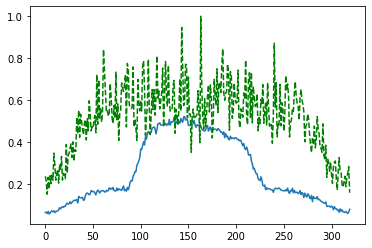

Time taken for epoch:  160.90546941757202
Epoch = [194/3000]  Iter = [   0/39480]  Loss = 0.173 Avg Loss = 0.173  Time = 0.0765s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [194/3000]  Iter = [ 100/39480]  Loss = 0.164 Avg Loss = 0.1641  Time = 0.0034s
Epoch = [194/3000]  Iter = [ 200/39480]  Loss = 0.1511 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [194/3000]  Iter = [ 300/39480]  Loss = 0.1682 Avg Loss = 0.1547  Time = 0.0036s
Epoch = [194/3000]  Iter = [ 400/39480]  Loss = 0.1671 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [194/3000]  Iter = [ 500/39480]  Loss = 0.1584 Avg Loss = 0.1532  Time = 0.0034s
Epoch = [194/3000]  Iter = [ 600/39480]  Loss = 0.152 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [194/3000]  Iter = [ 700/39480]  Loss = 0.1523 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [194/3000]  Iter = [ 800/39480]  Loss = 0.1705 Avg Loss = 0.157  Time = 0.0036s
Epoch = [194/3000]  Iter = [ 900/39480]  Loss = 0.1577 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [194/3000]  Iter = [1000/39480]  Loss = 0.1476 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [194/3000]  Iter = [1100/39480]  Loss = 0.1625 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [194/3000]  Iter

Epoch = [194/3000]  Iter = [9400/39480]  Loss = 0.1682 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [194/3000]  Iter = [9500/39480]  Loss = 0.1704 Avg Loss = 0.1561  Time = 0.0035s
Epoch = [194/3000]  Iter = [9600/39480]  Loss = 0.1811 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [194/3000]  Iter = [9700/39480]  Loss = 0.1804 Avg Loss = 0.1581  Time = 0.0037s
Epoch = [194/3000]  Iter = [9800/39480]  Loss = 0.1525 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [194/3000]  Iter = [9900/39480]  Loss = 0.1528 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [194/3000]  Iter = [10000/39480]  Loss = 0.1632 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [194/3000]  Iter = [10100/39480]  Loss = 0.1637 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [194/3000]  Iter = [10200/39480]  Loss = 0.1694 Avg Loss = 0.1557  Time = 0.0033s
Epoch = [194/3000]  Iter = [10300/39480]  Loss = 0.1557 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [194/3000]  Iter = [10400/39480]  Loss = 0.1846 Avg Loss = 0.1561  Time = 0.0036s
Epoch = [194/300

Epoch = [194/3000]  Iter = [18600/39480]  Loss = 0.1587 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [194/3000]  Iter = [18700/39480]  Loss = 0.1531 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [194/3000]  Iter = [18800/39480]  Loss = 0.1434 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [194/3000]  Iter = [18900/39480]  Loss = 0.1595 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [194/3000]  Iter = [19000/39480]  Loss = 0.1758 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [194/3000]  Iter = [19100/39480]  Loss = 0.1601 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [194/3000]  Iter = [19200/39480]  Loss = 0.1611 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [194/3000]  Iter = [19300/39480]  Loss = 0.1554 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [194/3000]  Iter = [19400/39480]  Loss = 0.1641 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [194/3000]  Iter = [19500/39480]  Loss = 0.1508 Avg Loss = 0.155  Time = 0.0037s
Epoch = [194/3000]  Iter = [19600/39480]  Loss = 0.1593 Avg Loss = 0.156  Time = 0.0037s
Epoch = [194

Epoch = [194/3000]  Iter = [27800/39480]  Loss = 0.148 Avg Loss = 0.1553  Time = 0.0036s
Epoch = [194/3000]  Iter = [27900/39480]  Loss = 0.1561 Avg Loss = 0.156  Time = 0.0036s
Epoch = [194/3000]  Iter = [28000/39480]  Loss = 0.1755 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [194/3000]  Iter = [28100/39480]  Loss = 0.132 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [194/3000]  Iter = [28200/39480]  Loss = 0.1641 Avg Loss = 0.1559  Time = 0.0037s
Epoch = [194/3000]  Iter = [28300/39480]  Loss = 0.1545 Avg Loss = 0.1573  Time = 0.0037s
Epoch = [194/3000]  Iter = [28400/39480]  Loss = 0.1395 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [194/3000]  Iter = [28500/39480]  Loss = 0.1641 Avg Loss = 0.157  Time = 0.0037s
Epoch = [194/3000]  Iter = [28600/39480]  Loss = 0.1704 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [194/3000]  Iter = [28700/39480]  Loss = 0.1397 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [194/3000]  Iter = [28800/39480]  Loss = 0.1383 Avg Loss = 0.158  Time = 0.0037s
Epoch = [194/30

Epoch = [194/3000]  Iter = [37000/39480]  Loss = 0.154 Avg Loss = 0.1576  Time = 0.0035s
Epoch = [194/3000]  Iter = [37100/39480]  Loss = 0.162 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [194/3000]  Iter = [37200/39480]  Loss = 0.1378 Avg Loss = 0.158  Time = 0.0036s
Epoch = [194/3000]  Iter = [37300/39480]  Loss = 0.1501 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [194/3000]  Iter = [37400/39480]  Loss = 0.1326 Avg Loss = 0.156  Time = 0.0034s
Epoch = [194/3000]  Iter = [37500/39480]  Loss = 0.1487 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [194/3000]  Iter = [37600/39480]  Loss = 0.1667 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [194/3000]  Iter = [37700/39480]  Loss = 0.1697 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [194/3000]  Iter = [37800/39480]  Loss = 0.1554 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [194/3000]  Iter = [37900/39480]  Loss = 0.1768 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [194/3000]  Iter = [38000/39480]  Loss = 0.1741 Avg Loss = 0.1569  Time = 0.0032s
Epoch = [194/3

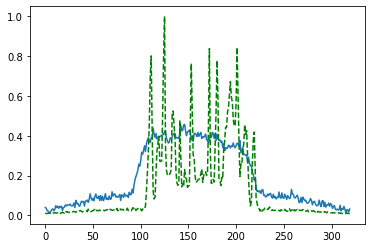

Time taken for epoch:  158.65440344810486
Epoch = [195/3000]  Iter = [   0/39480]  Loss = 0.1593 Avg Loss = 0.1593  Time = 0.0643s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [195/3000]  Iter = [ 100/39480]  Loss = 0.1735 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [195/3000]  Iter = [ 200/39480]  Loss = 0.1518 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [195/3000]  Iter = [ 300/39480]  Loss = 0.1416 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [195/3000]  Iter = [ 400/39480]  Loss = 0.1554 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [195/3000]  Iter = [ 500/39480]  Loss = 0.1756 Avg Loss = 0.1528  Time = 0.0039s
Epoch = [195/3000]  Iter = [ 600/39480]  Loss = 0.1441 Avg Loss = 0.1524  Time = 0.0037s
Epoch = [195/3000]  Iter = [ 700/39480]  Loss = 0.1669 Avg Loss = 0.1557  Time = 0.0038s
Epoch = [195/3000]  Iter = [ 800/39480]  Loss = 0.1453 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [195/3000]  Iter = [ 900/39480]  Loss = 0.1436 Avg Loss = 0.1552  Time = 0.0038s
Epoch = [195/3000]  Iter = [1000/39480]  Loss = 0.1338 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [195/3000]  Iter = [1100/39480]  Loss = 0.1816 Avg Loss = 0.155  Time = 0.0036s
Epoch = [195/3000]  It

Epoch = [195/3000]  Iter = [9400/39480]  Loss = 0.1831 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [195/3000]  Iter = [9500/39480]  Loss = 0.157 Avg Loss = 0.1589  Time = 0.0037s
Epoch = [195/3000]  Iter = [9600/39480]  Loss = 0.1302 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [195/3000]  Iter = [9700/39480]  Loss = 0.1623 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [195/3000]  Iter = [9800/39480]  Loss = 0.1471 Avg Loss = 0.155  Time = 0.0031s
Epoch = [195/3000]  Iter = [9900/39480]  Loss = 0.1453 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [195/3000]  Iter = [10000/39480]  Loss = 0.1545 Avg Loss = 0.1574  Time = 0.0034s
Epoch = [195/3000]  Iter = [10100/39480]  Loss = 0.175 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [195/3000]  Iter = [10200/39480]  Loss = 0.1748 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [195/3000]  Iter = [10300/39480]  Loss = 0.1749 Avg Loss = 0.1554  Time = 0.0034s
Epoch = [195/3000]  Iter = [10400/39480]  Loss = 0.1711 Avg Loss = 0.1562  Time = 0.0033s
Epoch = [195/3000] 

Epoch = [195/3000]  Iter = [18600/39480]  Loss = 0.1735 Avg Loss = 0.155  Time = 0.0037s
Epoch = [195/3000]  Iter = [18700/39480]  Loss = 0.1651 Avg Loss = 0.1556  Time = 0.0037s
Epoch = [195/3000]  Iter = [18800/39480]  Loss = 0.1529 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [195/3000]  Iter = [18900/39480]  Loss = 0.1494 Avg Loss = 0.157  Time = 0.0036s
Epoch = [195/3000]  Iter = [19000/39480]  Loss = 0.1557 Avg Loss = 0.1559  Time = 0.0036s
Epoch = [195/3000]  Iter = [19100/39480]  Loss = 0.1443 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [195/3000]  Iter = [19200/39480]  Loss = 0.1569 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [195/3000]  Iter = [19300/39480]  Loss = 0.1503 Avg Loss = 0.157  Time = 0.0032s
Epoch = [195/3000]  Iter = [19400/39480]  Loss = 0.1866 Avg Loss = 0.16  Time = 0.0036s
Epoch = [195/3000]  Iter = [19500/39480]  Loss = 0.1356 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [195/3000]  Iter = [19600/39480]  Loss = 0.155 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [195/300

Epoch = [195/3000]  Iter = [27800/39480]  Loss = 0.1468 Avg Loss = 0.1572  Time = 0.0035s
Epoch = [195/3000]  Iter = [27900/39480]  Loss = 0.1439 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [195/3000]  Iter = [28000/39480]  Loss = 0.1633 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [195/3000]  Iter = [28100/39480]  Loss = 0.1675 Avg Loss = 0.1559  Time = 0.0038s
Epoch = [195/3000]  Iter = [28200/39480]  Loss = 0.1393 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [195/3000]  Iter = [28300/39480]  Loss = 0.1514 Avg Loss = 0.1563  Time = 0.0040s
Epoch = [195/3000]  Iter = [28400/39480]  Loss = 0.1656 Avg Loss = 0.1562  Time = 0.0040s
Epoch = [195/3000]  Iter = [28500/39480]  Loss = 0.1715 Avg Loss = 0.1563  Time = 0.0040s
Epoch = [195/3000]  Iter = [28600/39480]  Loss = 0.1469 Avg Loss = 0.1543  Time = 0.0039s
Epoch = [195/3000]  Iter = [28700/39480]  Loss = 0.1871 Avg Loss = 0.1549  Time = 0.0041s
Epoch = [195/3000]  Iter = [28800/39480]  Loss = 0.1839 Avg Loss = 0.1568  Time = 0.0041s
Epoch = [1

Epoch = [195/3000]  Iter = [37000/39480]  Loss = 0.1558 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [195/3000]  Iter = [37100/39480]  Loss = 0.1683 Avg Loss = 0.1588  Time = 0.0036s
Epoch = [195/3000]  Iter = [37200/39480]  Loss = 0.1755 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [195/3000]  Iter = [37300/39480]  Loss = 0.1653 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [195/3000]  Iter = [37400/39480]  Loss = 0.1226 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [195/3000]  Iter = [37500/39480]  Loss = 0.1924 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [195/3000]  Iter = [37600/39480]  Loss = 0.1487 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [195/3000]  Iter = [37700/39480]  Loss = 0.1672 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [195/3000]  Iter = [37800/39480]  Loss = 0.1343 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [195/3000]  Iter = [37900/39480]  Loss = 0.1678 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [195/3000]  Iter = [38000/39480]  Loss = 0.1636 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [1

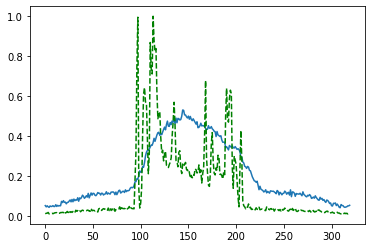

Time taken for epoch:  159.74344611167908
Epoch = [196/3000]  Iter = [   0/39480]  Loss = 0.1508 Avg Loss = 0.1508  Time = 0.0744s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [196/3000]  Iter = [ 100/39480]  Loss = 0.1566 Avg Loss = 0.1529  Time = 0.0031s
Epoch = [196/3000]  Iter = [ 200/39480]  Loss = 0.1655 Avg Loss = 0.1543  Time = 0.0036s
Epoch = [196/3000]  Iter = [ 300/39480]  Loss = 0.1628 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [196/3000]  Iter = [ 400/39480]  Loss = 0.1493 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [196/3000]  Iter = [ 500/39480]  Loss = 0.1667 Avg Loss = 0.155  Time = 0.0033s
Epoch = [196/3000]  Iter = [ 600/39480]  Loss = 0.1532 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [196/3000]  Iter = [ 700/39480]  Loss = 0.1546 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [196/3000]  Iter = [ 800/39480]  Loss = 0.1512 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [196/3000]  Iter = [ 900/39480]  Loss = 0.1697 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [196/3000]  Iter = [1000/39480]  Loss = 0.1656 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [196/3000]  Iter = [1100/39480]  Loss = 0.1807 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [196/3000]  It

Epoch = [196/3000]  Iter = [9400/39480]  Loss = 0.1466 Avg Loss = 0.1549  Time = 0.0035s
Epoch = [196/3000]  Iter = [9500/39480]  Loss = 0.1425 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [196/3000]  Iter = [9600/39480]  Loss = 0.1521 Avg Loss = 0.1569  Time = 0.0034s
Epoch = [196/3000]  Iter = [9700/39480]  Loss = 0.1529 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [196/3000]  Iter = [9800/39480]  Loss = 0.1455 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [196/3000]  Iter = [9900/39480]  Loss = 0.1655 Avg Loss = 0.1548  Time = 0.0036s
Epoch = [196/3000]  Iter = [10000/39480]  Loss = 0.1285 Avg Loss = 0.1552  Time = 0.0036s
Epoch = [196/3000]  Iter = [10100/39480]  Loss = 0.142 Avg Loss = 0.1544  Time = 0.0035s
Epoch = [196/3000]  Iter = [10200/39480]  Loss = 0.1657 Avg Loss = 0.1557  Time = 0.0035s
Epoch = [196/3000]  Iter = [10300/39480]  Loss = 0.1461 Avg Loss = 0.1563  Time = 0.0031s
Epoch = [196/3000]  Iter = [10400/39480]  Loss = 0.1486 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [196/3000

Epoch = [196/3000]  Iter = [18600/39480]  Loss = 0.1647 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [196/3000]  Iter = [18700/39480]  Loss = 0.1491 Avg Loss = 0.1573  Time = 0.0035s
Epoch = [196/3000]  Iter = [18800/39480]  Loss = 0.1479 Avg Loss = 0.156  Time = 0.0032s
Epoch = [196/3000]  Iter = [18900/39480]  Loss = 0.1732 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [196/3000]  Iter = [19000/39480]  Loss = 0.1569 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [196/3000]  Iter = [19100/39480]  Loss = 0.1267 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [196/3000]  Iter = [19200/39480]  Loss = 0.1558 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [196/3000]  Iter = [19300/39480]  Loss = 0.1426 Avg Loss = 0.1584  Time = 0.0036s
Epoch = [196/3000]  Iter = [19400/39480]  Loss = 0.1623 Avg Loss = 0.159  Time = 0.0037s
Epoch = [196/3000]  Iter = [19500/39480]  Loss = 0.1701 Avg Loss = 0.158  Time = 0.0037s
Epoch = [196/3000]  Iter = [19600/39480]  Loss = 0.1718 Avg Loss = 0.1588  Time = 0.0035s
Epoch = [196/

Epoch = [196/3000]  Iter = [27800/39480]  Loss = 0.1369 Avg Loss = 0.1583  Time = 0.0035s
Epoch = [196/3000]  Iter = [27900/39480]  Loss = 0.1765 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [196/3000]  Iter = [28000/39480]  Loss = 0.1556 Avg Loss = 0.1577  Time = 0.0035s
Epoch = [196/3000]  Iter = [28100/39480]  Loss = 0.1413 Avg Loss = 0.156  Time = 0.0036s
Epoch = [196/3000]  Iter = [28200/39480]  Loss = 0.1684 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [196/3000]  Iter = [28300/39480]  Loss = 0.1829 Avg Loss = 0.157  Time = 0.0036s
Epoch = [196/3000]  Iter = [28400/39480]  Loss = 0.137 Avg Loss = 0.157  Time = 0.0036s
Epoch = [196/3000]  Iter = [28500/39480]  Loss = 0.144 Avg Loss = 0.1585  Time = 0.0034s
Epoch = [196/3000]  Iter = [28600/39480]  Loss = 0.1514 Avg Loss = 0.1571  Time = 0.0037s
Epoch = [196/3000]  Iter = [28700/39480]  Loss = 0.1881 Avg Loss = 0.157  Time = 0.0036s
Epoch = [196/3000]  Iter = [28800/39480]  Loss = 0.1708 Avg Loss = 0.1567  Time = 0.0035s
Epoch = [196/300

Epoch = [196/3000]  Iter = [37000/39480]  Loss = 0.1546 Avg Loss = 0.1566  Time = 0.0038s
Epoch = [196/3000]  Iter = [37100/39480]  Loss = 0.1595 Avg Loss = 0.1573  Time = 0.0038s
Epoch = [196/3000]  Iter = [37200/39480]  Loss = 0.1574 Avg Loss = 0.1571  Time = 0.0039s
Epoch = [196/3000]  Iter = [37300/39480]  Loss = 0.169 Avg Loss = 0.157  Time = 0.0039s
Epoch = [196/3000]  Iter = [37400/39480]  Loss = 0.1608 Avg Loss = 0.1582  Time = 0.0039s
Epoch = [196/3000]  Iter = [37500/39480]  Loss = 0.1624 Avg Loss = 0.1594  Time = 0.0067s
Epoch = [196/3000]  Iter = [37600/39480]  Loss = 0.1481 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [196/3000]  Iter = [37700/39480]  Loss = 0.1371 Avg Loss = 0.157  Time = 0.0037s
Epoch = [196/3000]  Iter = [37800/39480]  Loss = 0.1462 Avg Loss = 0.1583  Time = 0.0038s
Epoch = [196/3000]  Iter = [37900/39480]  Loss = 0.1669 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [196/3000]  Iter = [38000/39480]  Loss = 0.1683 Avg Loss = 0.1575  Time = 0.0031s
Epoch = [196/

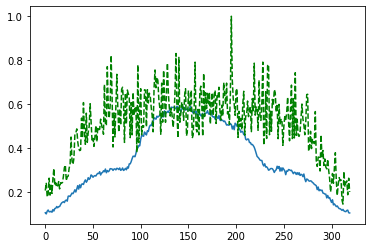

Time taken for epoch:  158.84410524368286
Epoch = [197/3000]  Iter = [   0/39480]  Loss = 0.1419 Avg Loss = 0.1419  Time = 0.0740s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [197/3000]  Iter = [ 100/39480]  Loss = 0.1478 Avg Loss = 0.1508  Time = 0.0036s
Epoch = [197/3000]  Iter = [ 200/39480]  Loss = 0.1617 Avg Loss = 0.1541  Time = 0.0033s
Epoch = [197/3000]  Iter = [ 300/39480]  Loss = 0.1618 Avg Loss = 0.1549  Time = 0.0037s
Epoch = [197/3000]  Iter = [ 400/39480]  Loss = 0.1521 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [197/3000]  Iter = [ 500/39480]  Loss = 0.1614 Avg Loss = 0.1562  Time = 0.0032s
Epoch = [197/3000]  Iter = [ 600/39480]  Loss = 0.1477 Avg Loss = 0.1542  Time = 0.0037s
Epoch = [197/3000]  Iter = [ 700/39480]  Loss = 0.1465 Avg Loss = 0.1552  Time = 0.0036s
Epoch = [197/3000]  Iter = [ 800/39480]  Loss = 0.1598 Avg Loss = 0.1568  Time = 0.0037s
Epoch = [197/3000]  Iter = [ 900/39480]  Loss = 0.1542 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [197/3000]  Iter = [1000/39480]  Loss = 0.1768 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [197/3000]  Iter = [1100/39480]  Loss = 0.157 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [197/3000]  It

Epoch = [197/3000]  Iter = [9400/39480]  Loss = 0.1598 Avg Loss = 0.1583  Time = 0.0036s
Epoch = [197/3000]  Iter = [9500/39480]  Loss = 0.1592 Avg Loss = 0.1565  Time = 0.0034s
Epoch = [197/3000]  Iter = [9600/39480]  Loss = 0.1653 Avg Loss = 0.1568  Time = 0.0033s
Epoch = [197/3000]  Iter = [9700/39480]  Loss = 0.1528 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [197/3000]  Iter = [9800/39480]  Loss = 0.1626 Avg Loss = 0.1563  Time = 0.0037s
Epoch = [197/3000]  Iter = [9900/39480]  Loss = 0.1497 Avg Loss = 0.1564  Time = 0.0031s
Epoch = [197/3000]  Iter = [10000/39480]  Loss = 0.1829 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [197/3000]  Iter = [10100/39480]  Loss = 0.1627 Avg Loss = 0.154  Time = 0.0037s
Epoch = [197/3000]  Iter = [10200/39480]  Loss = 0.1235 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [197/3000]  Iter = [10300/39480]  Loss = 0.1467 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [197/3000]  Iter = [10400/39480]  Loss = 0.1542 Avg Loss = 0.1555  Time = 0.0034s
Epoch = [197/3000

Epoch = [197/3000]  Iter = [18600/39480]  Loss = 0.1663 Avg Loss = 0.1569  Time = 0.0035s
Epoch = [197/3000]  Iter = [18700/39480]  Loss = 0.1501 Avg Loss = 0.1549  Time = 0.0036s
Epoch = [197/3000]  Iter = [18800/39480]  Loss = 0.1822 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [197/3000]  Iter = [18900/39480]  Loss = 0.1653 Avg Loss = 0.1587  Time = 0.0036s
Epoch = [197/3000]  Iter = [19000/39480]  Loss = 0.1384 Avg Loss = 0.1581  Time = 0.0034s
Epoch = [197/3000]  Iter = [19100/39480]  Loss = 0.1704 Avg Loss = 0.1568  Time = 0.0035s
Epoch = [197/3000]  Iter = [19200/39480]  Loss = 0.1554 Avg Loss = 0.154  Time = 0.0036s
Epoch = [197/3000]  Iter = [19300/39480]  Loss = 0.1331 Avg Loss = 0.1542  Time = 0.0036s
Epoch = [197/3000]  Iter = [19400/39480]  Loss = 0.1576 Avg Loss = 0.1546  Time = 0.0036s
Epoch = [197/3000]  Iter = [19500/39480]  Loss = 0.1544 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [197/3000]  Iter = [19600/39480]  Loss = 0.139 Avg Loss = 0.1557  Time = 0.0032s
Epoch = [197

Epoch = [197/3000]  Iter = [27800/39480]  Loss = 0.1606 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [197/3000]  Iter = [27900/39480]  Loss = 0.1387 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [197/3000]  Iter = [28000/39480]  Loss = 0.1518 Avg Loss = 0.1569  Time = 0.0037s
Epoch = [197/3000]  Iter = [28100/39480]  Loss = 0.1919 Avg Loss = 0.1575  Time = 0.0037s
Epoch = [197/3000]  Iter = [28200/39480]  Loss = 0.1096 Avg Loss = 0.1542  Time = 0.0036s
Epoch = [197/3000]  Iter = [28300/39480]  Loss = 0.1732 Avg Loss = 0.156  Time = 0.0045s
Epoch = [197/3000]  Iter = [28400/39480]  Loss = 0.1912 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [197/3000]  Iter = [28500/39480]  Loss = 0.1445 Avg Loss = 0.1579  Time = 0.0034s
Epoch = [197/3000]  Iter = [28600/39480]  Loss = 0.159 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [197/3000]  Iter = [28700/39480]  Loss = 0.1658 Avg Loss = 0.157  Time = 0.0036s
Epoch = [197/3000]  Iter = [28800/39480]  Loss = 0.1898 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [197/

Epoch = [197/3000]  Iter = [37000/39480]  Loss = 0.1509 Avg Loss = 0.156  Time = 0.0037s
Epoch = [197/3000]  Iter = [37100/39480]  Loss = 0.1745 Avg Loss = 0.1576  Time = 0.0036s
Epoch = [197/3000]  Iter = [37200/39480]  Loss = 0.1712 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [197/3000]  Iter = [37300/39480]  Loss = 0.1531 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [197/3000]  Iter = [37400/39480]  Loss = 0.163 Avg Loss = 0.1557  Time = 0.0036s
Epoch = [197/3000]  Iter = [37500/39480]  Loss = 0.1673 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [197/3000]  Iter = [37600/39480]  Loss = 0.1442 Avg Loss = 0.1568  Time = 0.0032s
Epoch = [197/3000]  Iter = [37700/39480]  Loss = 0.1458 Avg Loss = 0.1565  Time = 0.0035s
Epoch = [197/3000]  Iter = [37800/39480]  Loss = 0.171 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [197/3000]  Iter = [37900/39480]  Loss = 0.1351 Avg Loss = 0.156  Time = 0.0036s
Epoch = [197/3000]  Iter = [38000/39480]  Loss = 0.1856 Avg Loss = 0.1572  Time = 0.0033s
Epoch = [197/3

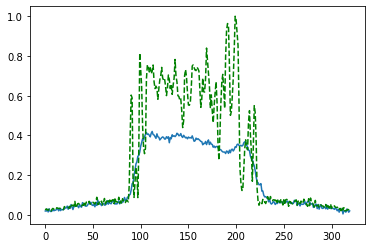

Time taken for epoch:  157.1333041191101
Epoch = [198/3000]  Iter = [   0/39480]  Loss = 0.1401 Avg Loss = 0.1401  Time = 0.0729s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [198/3000]  Iter = [ 100/39480]  Loss = 0.1487 Avg Loss = 0.1497  Time = 0.0035s
Epoch = [198/3000]  Iter = [ 200/39480]  Loss = 0.131 Avg Loss = 0.1525  Time = 0.0037s
Epoch = [198/3000]  Iter = [ 300/39480]  Loss = 0.1495 Avg Loss = 0.1552  Time = 0.0036s
Epoch = [198/3000]  Iter = [ 400/39480]  Loss = 0.1591 Avg Loss = 0.156  Time = 0.0037s
Epoch = [198/3000]  Iter = [ 500/39480]  Loss = 0.1571 Avg Loss = 0.1557  Time = 0.0031s
Epoch = [198/3000]  Iter = [ 600/39480]  Loss = 0.1562 Avg Loss = 0.1546  Time = 0.0029s
Epoch = [198/3000]  Iter = [ 700/39480]  Loss = 0.1489 Avg Loss = 0.1559  Time = 0.0031s
Epoch = [198/3000]  Iter = [ 800/39480]  Loss = 0.1765 Avg Loss = 0.1565  Time = 0.0030s
Epoch = [198/3000]  Iter = [ 900/39480]  Loss = 0.1762 Avg Loss = 0.1566  Time = 0.0030s
Epoch = [198/3000]  Iter = [1000/39480]  Loss = 0.1675 Avg Loss = 0.1569  Time = 0.0029s
Epoch = [198/3000]  Iter = [1100/39480]  Loss = 0.1488 Avg Loss = 0.1581  Time = 0.0032s
Epoch = [198/3000]  Ite

Epoch = [198/3000]  Iter = [9400/39480]  Loss = 0.1725 Avg Loss = 0.1572  Time = 0.0033s
Epoch = [198/3000]  Iter = [9500/39480]  Loss = 0.1485 Avg Loss = 0.1559  Time = 0.0035s
Epoch = [198/3000]  Iter = [9600/39480]  Loss = 0.1488 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [198/3000]  Iter = [9700/39480]  Loss = 0.1605 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [198/3000]  Iter = [9800/39480]  Loss = 0.1585 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [198/3000]  Iter = [9900/39480]  Loss = 0.1573 Avg Loss = 0.157  Time = 0.0036s
Epoch = [198/3000]  Iter = [10000/39480]  Loss = 0.1672 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [198/3000]  Iter = [10100/39480]  Loss = 0.1394 Avg Loss = 0.157  Time = 0.0036s
Epoch = [198/3000]  Iter = [10200/39480]  Loss = 0.1415 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [198/3000]  Iter = [10300/39480]  Loss = 0.1689 Avg Loss = 0.1556  Time = 0.0033s
Epoch = [198/3000]  Iter = [10400/39480]  Loss = 0.1498 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [198/3000]

Epoch = [198/3000]  Iter = [18600/39480]  Loss = 0.1401 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [198/3000]  Iter = [18700/39480]  Loss = 0.174 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [198/3000]  Iter = [18800/39480]  Loss = 0.1477 Avg Loss = 0.1545  Time = 0.0036s
Epoch = [198/3000]  Iter = [18900/39480]  Loss = 0.1648 Avg Loss = 0.1556  Time = 0.0036s
Epoch = [198/3000]  Iter = [19000/39480]  Loss = 0.1391 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [198/3000]  Iter = [19100/39480]  Loss = 0.162 Avg Loss = 0.1543  Time = 0.0036s
Epoch = [198/3000]  Iter = [19200/39480]  Loss = 0.1486 Avg Loss = 0.1562  Time = 0.0037s
Epoch = [198/3000]  Iter = [19300/39480]  Loss = 0.1433 Avg Loss = 0.1577  Time = 0.0036s
Epoch = [198/3000]  Iter = [19400/39480]  Loss = 0.181 Avg Loss = 0.1602  Time = 0.0033s
Epoch = [198/3000]  Iter = [19500/39480]  Loss = 0.1593 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [198/3000]  Iter = [19600/39480]  Loss = 0.1852 Avg Loss = 0.1569  Time = 0.0033s
Epoch = [198/

Epoch = [198/3000]  Iter = [27800/39480]  Loss = 0.1608 Avg Loss = 0.1557  Time = 0.0037s
Epoch = [198/3000]  Iter = [27900/39480]  Loss = 0.1681 Avg Loss = 0.1569  Time = 0.0038s
Epoch = [198/3000]  Iter = [28000/39480]  Loss = 0.1956 Avg Loss = 0.1586  Time = 0.0038s
Epoch = [198/3000]  Iter = [28100/39480]  Loss = 0.1728 Avg Loss = 0.1579  Time = 0.0037s
Epoch = [198/3000]  Iter = [28200/39480]  Loss = 0.1598 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [198/3000]  Iter = [28300/39480]  Loss = 0.1813 Avg Loss = 0.1585  Time = 0.0037s
Epoch = [198/3000]  Iter = [28400/39480]  Loss = 0.164 Avg Loss = 0.1582  Time = 0.0037s
Epoch = [198/3000]  Iter = [28500/39480]  Loss = 0.1491 Avg Loss = 0.1558  Time = 0.0037s
Epoch = [198/3000]  Iter = [28600/39480]  Loss = 0.1302 Avg Loss = 0.1555  Time = 0.0038s
Epoch = [198/3000]  Iter = [28700/39480]  Loss = 0.1724 Avg Loss = 0.1551  Time = 0.0037s
Epoch = [198/3000]  Iter = [28800/39480]  Loss = 0.1699 Avg Loss = 0.1566  Time = 0.0037s
Epoch = [19

Epoch = [198/3000]  Iter = [37000/39480]  Loss = 0.2046 Avg Loss = 0.1582  Time = 0.0033s
Epoch = [198/3000]  Iter = [37100/39480]  Loss = 0.1276 Avg Loss = 0.1568  Time = 0.0036s
Epoch = [198/3000]  Iter = [37200/39480]  Loss = 0.1535 Avg Loss = 0.1552  Time = 0.0037s
Epoch = [198/3000]  Iter = [37300/39480]  Loss = 0.1535 Avg Loss = 0.1562  Time = 0.0036s
Epoch = [198/3000]  Iter = [37400/39480]  Loss = 0.1761 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [198/3000]  Iter = [37500/39480]  Loss = 0.1471 Avg Loss = 0.1572  Time = 0.0036s
Epoch = [198/3000]  Iter = [37600/39480]  Loss = 0.1575 Avg Loss = 0.157  Time = 0.0036s
Epoch = [198/3000]  Iter = [37700/39480]  Loss = 0.1435 Avg Loss = 0.1574  Time = 0.0037s
Epoch = [198/3000]  Iter = [37800/39480]  Loss = 0.1508 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [198/3000]  Iter = [37900/39480]  Loss = 0.1489 Avg Loss = 0.1579  Time = 0.0036s
Epoch = [198/3000]  Iter = [38000/39480]  Loss = 0.148 Avg Loss = 0.1574  Time = 0.0036s
Epoch = [198

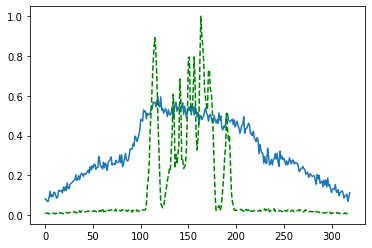

Time taken for epoch:  158.58154773712158
Epoch = [199/3000]  Iter = [   0/39480]  Loss = 0.1462 Avg Loss = 0.1462  Time = 0.0805s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [199/3000]  Iter = [ 100/39480]  Loss = 0.1767 Avg Loss = 0.1515  Time = 0.0035s
Epoch = [199/3000]  Iter = [ 200/39480]  Loss = 0.156 Avg Loss = 0.154  Time = 0.0037s
Epoch = [199/3000]  Iter = [ 300/39480]  Loss = 0.1518 Avg Loss = 0.1553  Time = 0.0037s
Epoch = [199/3000]  Iter = [ 400/39480]  Loss = 0.176 Avg Loss = 0.1564  Time = 0.0037s
Epoch = [199/3000]  Iter = [ 500/39480]  Loss = 0.15 Avg Loss = 0.1562  Time = 0.0038s
Epoch = [199/3000]  Iter = [ 600/39480]  Loss = 0.1693 Avg Loss = 0.1558  Time = 0.0036s
Epoch = [199/3000]  Iter = [ 700/39480]  Loss = 0.1702 Avg Loss = 0.1546  Time = 0.0037s
Epoch = [199/3000]  Iter = [ 800/39480]  Loss = 0.163 Avg Loss = 0.1567  Time = 0.0032s
Epoch = [199/3000]  Iter = [ 900/39480]  Loss = 0.1446 Avg Loss = 0.1564  Time = 0.0030s
Epoch = [199/3000]  Iter = [1000/39480]  Loss = 0.1733 Avg Loss = 0.1568  Time = 0.0029s
Epoch = [199/3000]  Iter = [1100/39480]  Loss = 0.1459 Avg Loss = 0.1555  Time = 0.0032s
Epoch = [199/3000]  Iter = 

Epoch = [199/3000]  Iter = [9400/39480]  Loss = 0.1665 Avg Loss = 0.1552  Time = 0.0035s
Epoch = [199/3000]  Iter = [9500/39480]  Loss = 0.1728 Avg Loss = 0.1575  Time = 0.0035s
Epoch = [199/3000]  Iter = [9600/39480]  Loss = 0.1553 Avg Loss = 0.1564  Time = 0.0036s
Epoch = [199/3000]  Iter = [9700/39480]  Loss = 0.1295 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [199/3000]  Iter = [9800/39480]  Loss = 0.1619 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [199/3000]  Iter = [9900/39480]  Loss = 0.1533 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [199/3000]  Iter = [10000/39480]  Loss = 0.1696 Avg Loss = 0.1564  Time = 0.0034s
Epoch = [199/3000]  Iter = [10100/39480]  Loss = 0.1459 Avg Loss = 0.1544  Time = 0.0036s
Epoch = [199/3000]  Iter = [10200/39480]  Loss = 0.1754 Avg Loss = 0.1567  Time = 0.0037s
Epoch = [199/3000]  Iter = [10300/39480]  Loss = 0.1525 Avg Loss = 0.1581  Time = 0.0036s
Epoch = [199/3000]  Iter = [10400/39480]  Loss = 0.1457 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [199/300

Epoch = [199/3000]  Iter = [18600/39480]  Loss = 0.1565 Avg Loss = 0.157  Time = 0.0036s
Epoch = [199/3000]  Iter = [18700/39480]  Loss = 0.1819 Avg Loss = 0.1578  Time = 0.0036s
Epoch = [199/3000]  Iter = [18800/39480]  Loss = 0.1523 Avg Loss = 0.1577  Time = 0.0037s
Epoch = [199/3000]  Iter = [18900/39480]  Loss = 0.1387 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [199/3000]  Iter = [19000/39480]  Loss = 0.1546 Avg Loss = 0.155  Time = 0.0035s
Epoch = [199/3000]  Iter = [19100/39480]  Loss = 0.1553 Avg Loss = 0.1573  Time = 0.0036s
Epoch = [199/3000]  Iter = [19200/39480]  Loss = 0.154 Avg Loss = 0.158  Time = 0.0035s
Epoch = [199/3000]  Iter = [19300/39480]  Loss = 0.1314 Avg Loss = 0.1585  Time = 0.0036s
Epoch = [199/3000]  Iter = [19400/39480]  Loss = 0.1505 Avg Loss = 0.1592  Time = 0.0036s
Epoch = [199/3000]  Iter = [19500/39480]  Loss = 0.1537 Avg Loss = 0.1575  Time = 0.0036s
Epoch = [199/3000]  Iter = [19600/39480]  Loss = 0.1829 Avg Loss = 0.1569  Time = 0.0036s
Epoch = [199/3

Epoch = [199/3000]  Iter = [27800/39480]  Loss = 0.1546 Avg Loss = 0.1563  Time = 0.0035s
Epoch = [199/3000]  Iter = [27900/39480]  Loss = 0.1382 Avg Loss = 0.1554  Time = 0.0036s
Epoch = [199/3000]  Iter = [28000/39480]  Loss = 0.1717 Avg Loss = 0.1574  Time = 0.0034s
Epoch = [199/3000]  Iter = [28100/39480]  Loss = 0.1621 Avg Loss = 0.1576  Time = 0.0032s
Epoch = [199/3000]  Iter = [28200/39480]  Loss = 0.1475 Avg Loss = 0.1565  Time = 0.0036s
Epoch = [199/3000]  Iter = [28300/39480]  Loss = 0.1341 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [199/3000]  Iter = [28400/39480]  Loss = 0.1766 Avg Loss = 0.1576  Time = 0.0032s
Epoch = [199/3000]  Iter = [28500/39480]  Loss = 0.1845 Avg Loss = 0.1572  Time = 0.0037s
Epoch = [199/3000]  Iter = [28600/39480]  Loss = 0.1656 Avg Loss = 0.1587  Time = 0.0033s
Epoch = [199/3000]  Iter = [28700/39480]  Loss = 0.1613 Avg Loss = 0.1571  Time = 0.0033s
Epoch = [199/3000]  Iter = [28800/39480]  Loss = 0.1594 Avg Loss = 0.157  Time = 0.0036s
Epoch = [19

Epoch = [199/3000]  Iter = [37000/39480]  Loss = 0.1944 Avg Loss = 0.1554  Time = 0.0037s
Epoch = [199/3000]  Iter = [37100/39480]  Loss = 0.1604 Avg Loss = 0.1544  Time = 0.0037s
Epoch = [199/3000]  Iter = [37200/39480]  Loss = 0.1437 Avg Loss = 0.158  Time = 0.0037s
Epoch = [199/3000]  Iter = [37300/39480]  Loss = 0.1755 Avg Loss = 0.1582  Time = 0.0036s
Epoch = [199/3000]  Iter = [37400/39480]  Loss = 0.1869 Avg Loss = 0.1567  Time = 0.0036s
Epoch = [199/3000]  Iter = [37500/39480]  Loss = 0.1537 Avg Loss = 0.1561  Time = 0.0037s
Epoch = [199/3000]  Iter = [37600/39480]  Loss = 0.1703 Avg Loss = 0.1571  Time = 0.0036s
Epoch = [199/3000]  Iter = [37700/39480]  Loss = 0.1557 Avg Loss = 0.1566  Time = 0.0036s
Epoch = [199/3000]  Iter = [37800/39480]  Loss = 0.135 Avg Loss = 0.158  Time = 0.0037s
Epoch = [199/3000]  Iter = [37900/39480]  Loss = 0.1528 Avg Loss = 0.1563  Time = 0.0036s
Epoch = [199/3000]  Iter = [38000/39480]  Loss = 0.1476 Avg Loss = 0.156  Time = 0.0037s
Epoch = [199/3

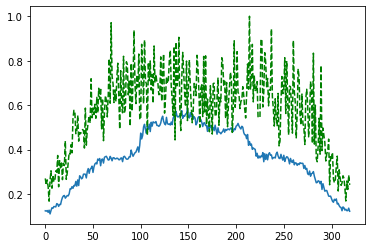

Time taken for epoch:  157.72442531585693
Epoch = [200/3000]  Iter = [   0/39480]  Loss = 0.1541 Avg Loss = 0.1541  Time = 0.0664s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [200/3000]  Iter = [ 100/39480]  Loss = 0.1459 Avg Loss = 0.1544  Time = 0.0035s
Epoch = [200/3000]  Iter = [ 200/39480]  Loss = 0.1457 Avg Loss = 0.1537  Time = 0.0039s
Epoch = [200/3000]  Iter = [ 300/39480]  Loss = 0.1403 Avg Loss = 0.1539  Time = 0.0038s
Epoch = [200/3000]  Iter = [ 400/39480]  Loss = 0.1439 Avg Loss = 0.152  Time = 0.0036s
Epoch = [200/3000]  Iter = [ 500/39480]  Loss = 0.1681 Avg Loss = 0.1531  Time = 0.0039s
Epoch = [200/3000]  Iter = [ 600/39480]  Loss = 0.1493 Avg Loss = 0.1521  Time = 0.0036s
Epoch = [200/3000]  Iter = [ 700/39480]  Loss = 0.1436 Avg Loss = 0.151  Time = 0.0039s
Epoch = [200/3000]  Iter = [ 800/39480]  Loss = 0.1367 Avg Loss = 0.1513  Time = 0.0041s
Epoch = [200/3000]  Iter = [ 900/39480]  Loss = 0.1608 Avg Loss = 0.1505  Time = 0.0039s
Epoch = [200/3000]  Iter = [1000/39480]  Loss = 0.1479 Avg Loss = 0.1514  Time = 0.0037s
Epoch = [200/3000]  Iter = [1100/39480]  Loss = 0.1757 Avg Loss = 0.1509  Time = 0.0037s
Epoch = [200/3000]  Ite

Epoch = [200/3000]  Iter = [9400/39480]  Loss = 0.1348 Avg Loss = 0.1494  Time = 0.0036s
Epoch = [200/3000]  Iter = [9500/39480]  Loss = 0.1248 Avg Loss = 0.1474  Time = 0.0037s
Epoch = [200/3000]  Iter = [9600/39480]  Loss = 0.1428 Avg Loss = 0.1497  Time = 0.0036s
Epoch = [200/3000]  Iter = [9700/39480]  Loss = 0.1455 Avg Loss = 0.1488  Time = 0.0058s
Epoch = [200/3000]  Iter = [9800/39480]  Loss = 0.1525 Avg Loss = 0.1497  Time = 0.0036s
Epoch = [200/3000]  Iter = [9900/39480]  Loss = 0.1447 Avg Loss = 0.1487  Time = 0.0037s
Epoch = [200/3000]  Iter = [10000/39480]  Loss = 0.1627 Avg Loss = 0.147  Time = 0.0037s
Epoch = [200/3000]  Iter = [10100/39480]  Loss = 0.146 Avg Loss = 0.1471  Time = 0.0036s
Epoch = [200/3000]  Iter = [10200/39480]  Loss = 0.1355 Avg Loss = 0.1476  Time = 0.0036s
Epoch = [200/3000]  Iter = [10300/39480]  Loss = 0.1513 Avg Loss = 0.1498  Time = 0.0035s
Epoch = [200/3000]  Iter = [10400/39480]  Loss = 0.1654 Avg Loss = 0.1497  Time = 0.0031s
Epoch = [200/3000]

Epoch = [200/3000]  Iter = [18600/39480]  Loss = 0.1525 Avg Loss = 0.148  Time = 0.0033s
Epoch = [200/3000]  Iter = [18700/39480]  Loss = 0.1433 Avg Loss = 0.1473  Time = 0.0037s
Epoch = [200/3000]  Iter = [18800/39480]  Loss = 0.1231 Avg Loss = 0.1477  Time = 0.0037s
Epoch = [200/3000]  Iter = [18900/39480]  Loss = 0.1337 Avg Loss = 0.148  Time = 0.0041s
Epoch = [200/3000]  Iter = [19000/39480]  Loss = 0.1351 Avg Loss = 0.1495  Time = 0.0036s
Epoch = [200/3000]  Iter = [19100/39480]  Loss = 0.1637 Avg Loss = 0.1485  Time = 0.0035s
Epoch = [200/3000]  Iter = [19200/39480]  Loss = 0.1611 Avg Loss = 0.1472  Time = 0.0037s
Epoch = [200/3000]  Iter = [19300/39480]  Loss = 0.1505 Avg Loss = 0.1471  Time = 0.0037s
Epoch = [200/3000]  Iter = [19400/39480]  Loss = 0.1273 Avg Loss = 0.1477  Time = 0.0037s
Epoch = [200/3000]  Iter = [19500/39480]  Loss = 0.161 Avg Loss = 0.1464  Time = 0.0038s
Epoch = [200/3000]  Iter = [19600/39480]  Loss = 0.1367 Avg Loss = 0.1478  Time = 0.0037s
Epoch = [200/

Epoch = [200/3000]  Iter = [27800/39480]  Loss = 0.1422 Avg Loss = 0.1457  Time = 0.0036s
Epoch = [200/3000]  Iter = [27900/39480]  Loss = 0.1608 Avg Loss = 0.1459  Time = 0.0036s
Epoch = [200/3000]  Iter = [28000/39480]  Loss = 0.1562 Avg Loss = 0.1467  Time = 0.0036s
Epoch = [200/3000]  Iter = [28100/39480]  Loss = 0.1682 Avg Loss = 0.1464  Time = 0.0033s
Epoch = [200/3000]  Iter = [28200/39480]  Loss = 0.1585 Avg Loss = 0.1463  Time = 0.0033s
Epoch = [200/3000]  Iter = [28300/39480]  Loss = 0.1501 Avg Loss = 0.1458  Time = 0.0036s
Epoch = [200/3000]  Iter = [28400/39480]  Loss = 0.1346 Avg Loss = 0.145  Time = 0.0034s
Epoch = [200/3000]  Iter = [28500/39480]  Loss = 0.1684 Avg Loss = 0.1461  Time = 0.0033s
Epoch = [200/3000]  Iter = [28600/39480]  Loss = 0.1594 Avg Loss = 0.1467  Time = 0.0032s
Epoch = [200/3000]  Iter = [28700/39480]  Loss = 0.1465 Avg Loss = 0.1471  Time = 0.0037s
Epoch = [200/3000]  Iter = [28800/39480]  Loss = 0.1179 Avg Loss = 0.1472  Time = 0.0035s
Epoch = [20

Epoch = [200/3000]  Iter = [37000/39480]  Loss = 0.1432 Avg Loss = 0.147  Time = 0.0032s
Epoch = [200/3000]  Iter = [37100/39480]  Loss = 0.1717 Avg Loss = 0.147  Time = 0.0032s
Epoch = [200/3000]  Iter = [37200/39480]  Loss = 0.1334 Avg Loss = 0.1457  Time = 0.0035s
Epoch = [200/3000]  Iter = [37300/39480]  Loss = 0.1553 Avg Loss = 0.1468  Time = 0.0036s
Epoch = [200/3000]  Iter = [37400/39480]  Loss = 0.1374 Avg Loss = 0.1464  Time = 0.0036s
Epoch = [200/3000]  Iter = [37500/39480]  Loss = 0.1445 Avg Loss = 0.1466  Time = 0.0035s
Epoch = [200/3000]  Iter = [37600/39480]  Loss = 0.1517 Avg Loss = 0.1486  Time = 0.0037s
Epoch = [200/3000]  Iter = [37700/39480]  Loss = 0.1161 Avg Loss = 0.1466  Time = 0.0032s
Epoch = [200/3000]  Iter = [37800/39480]  Loss = 0.1614 Avg Loss = 0.1462  Time = 0.0036s
Epoch = [200/3000]  Iter = [37900/39480]  Loss = 0.1523 Avg Loss = 0.1459  Time = 0.0037s
Epoch = [200/3000]  Iter = [38000/39480]  Loss = 0.1464 Avg Loss = 0.146  Time = 0.0037s
Epoch = [200/

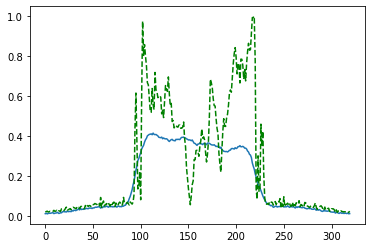

Time taken for epoch:  159.8310513496399
Epoch = [201/3000]  Iter = [   0/39480]  Loss = 0.1274 Avg Loss = 0.1274  Time = 0.0753s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [201/3000]  Iter = [ 100/39480]  Loss = 0.1585 Avg Loss = 0.1388  Time = 0.0034s
Epoch = [201/3000]  Iter = [ 200/39480]  Loss = 0.16 Avg Loss = 0.1434  Time = 0.0034s
Epoch = [201/3000]  Iter = [ 300/39480]  Loss = 0.1521 Avg Loss = 0.1435  Time = 0.0037s
Epoch = [201/3000]  Iter = [ 400/39480]  Loss = 0.1207 Avg Loss = 0.1432  Time = 0.0036s
Epoch = [201/3000]  Iter = [ 500/39480]  Loss = 0.1564 Avg Loss = 0.1439  Time = 0.0032s
Epoch = [201/3000]  Iter = [ 600/39480]  Loss = 0.1484 Avg Loss = 0.1439  Time = 0.0036s
Epoch = [201/3000]  Iter = [ 700/39480]  Loss = 0.1519 Avg Loss = 0.1447  Time = 0.0038s
Epoch = [201/3000]  Iter = [ 800/39480]  Loss = 0.1477 Avg Loss = 0.1445  Time = 0.0038s
Epoch = [201/3000]  Iter = [ 900/39480]  Loss = 0.1263 Avg Loss = 0.1453  Time = 0.0038s
Epoch = [201/3000]  Iter = [1000/39480]  Loss = 0.1402 Avg Loss = 0.1463  Time = 0.0038s
Epoch = [201/3000]  Iter = [1100/39480]  Loss = 0.1299 Avg Loss = 0.1442  Time = 0.0031s
Epoch = [201/3000]  Ite

Epoch = [201/3000]  Iter = [9400/39480]  Loss = 0.1618 Avg Loss = 0.1448  Time = 0.0037s
Epoch = [201/3000]  Iter = [9500/39480]  Loss = 0.1426 Avg Loss = 0.1448  Time = 0.0037s
Epoch = [201/3000]  Iter = [9600/39480]  Loss = 0.1491 Avg Loss = 0.1433  Time = 0.0036s
Epoch = [201/3000]  Iter = [9700/39480]  Loss = 0.1304 Avg Loss = 0.1451  Time = 0.0037s
Epoch = [201/3000]  Iter = [9800/39480]  Loss = 0.1534 Avg Loss = 0.1448  Time = 0.0037s
Epoch = [201/3000]  Iter = [9900/39480]  Loss = 0.1484 Avg Loss = 0.1452  Time = 0.0036s
Epoch = [201/3000]  Iter = [10000/39480]  Loss = 0.1518 Avg Loss = 0.1452  Time = 0.0036s
Epoch = [201/3000]  Iter = [10100/39480]  Loss = 0.1649 Avg Loss = 0.1443  Time = 0.0037s
Epoch = [201/3000]  Iter = [10200/39480]  Loss = 0.1378 Avg Loss = 0.1448  Time = 0.0032s
Epoch = [201/3000]  Iter = [10300/39480]  Loss = 0.1412 Avg Loss = 0.1452  Time = 0.0036s
Epoch = [201/3000]  Iter = [10400/39480]  Loss = 0.1335 Avg Loss = 0.1446  Time = 0.0029s
Epoch = [201/300

Epoch = [201/3000]  Iter = [18600/39480]  Loss = 0.1322 Avg Loss = 0.1446  Time = 0.0032s
Epoch = [201/3000]  Iter = [18700/39480]  Loss = 0.1237 Avg Loss = 0.1455  Time = 0.0036s
Epoch = [201/3000]  Iter = [18800/39480]  Loss = 0.1362 Avg Loss = 0.1458  Time = 0.0036s
Epoch = [201/3000]  Iter = [18900/39480]  Loss = 0.1228 Avg Loss = 0.1447  Time = 0.0036s
Epoch = [201/3000]  Iter = [19000/39480]  Loss = 0.1455 Avg Loss = 0.1458  Time = 0.0036s
Epoch = [201/3000]  Iter = [19100/39480]  Loss = 0.1288 Avg Loss = 0.1455  Time = 0.0036s
Epoch = [201/3000]  Iter = [19200/39480]  Loss = 0.1282 Avg Loss = 0.1467  Time = 0.0037s
Epoch = [201/3000]  Iter = [19300/39480]  Loss = 0.1532 Avg Loss = 0.1473  Time = 0.0036s
Epoch = [201/3000]  Iter = [19400/39480]  Loss = 0.1416 Avg Loss = 0.1469  Time = 0.0035s
Epoch = [201/3000]  Iter = [19500/39480]  Loss = 0.1384 Avg Loss = 0.1461  Time = 0.0036s
Epoch = [201/3000]  Iter = [19600/39480]  Loss = 0.1499 Avg Loss = 0.1479  Time = 0.0036s
Epoch = [2

Epoch = [201/3000]  Iter = [27800/39480]  Loss = 0.1557 Avg Loss = 0.1445  Time = 0.0037s
Epoch = [201/3000]  Iter = [27900/39480]  Loss = 0.143 Avg Loss = 0.1438  Time = 0.0036s
Epoch = [201/3000]  Iter = [28000/39480]  Loss = 0.1207 Avg Loss = 0.1451  Time = 0.0037s
Epoch = [201/3000]  Iter = [28100/39480]  Loss = 0.1215 Avg Loss = 0.1453  Time = 0.0037s
Epoch = [201/3000]  Iter = [28200/39480]  Loss = 0.1235 Avg Loss = 0.1449  Time = 0.0036s
Epoch = [201/3000]  Iter = [28300/39480]  Loss = 0.1477 Avg Loss = 0.1459  Time = 0.0035s
Epoch = [201/3000]  Iter = [28400/39480]  Loss = 0.1428 Avg Loss = 0.1466  Time = 0.0036s
Epoch = [201/3000]  Iter = [28500/39480]  Loss = 0.1496 Avg Loss = 0.1449  Time = 0.0036s
Epoch = [201/3000]  Iter = [28600/39480]  Loss = 0.1816 Avg Loss = 0.1441  Time = 0.0034s
Epoch = [201/3000]  Iter = [28700/39480]  Loss = 0.1314 Avg Loss = 0.145  Time = 0.0035s
Epoch = [201/3000]  Iter = [28800/39480]  Loss = 0.1539 Avg Loss = 0.1451  Time = 0.0037s
Epoch = [201

Epoch = [201/3000]  Iter = [37000/39480]  Loss = 0.1284 Avg Loss = 0.1447  Time = 0.0035s
Epoch = [201/3000]  Iter = [37100/39480]  Loss = 0.1502 Avg Loss = 0.1456  Time = 0.0036s
Epoch = [201/3000]  Iter = [37200/39480]  Loss = 0.1352 Avg Loss = 0.1451  Time = 0.0037s
Epoch = [201/3000]  Iter = [37300/39480]  Loss = 0.1492 Avg Loss = 0.1446  Time = 0.0037s
Epoch = [201/3000]  Iter = [37400/39480]  Loss = 0.1488 Avg Loss = 0.146  Time = 0.0037s
Epoch = [201/3000]  Iter = [37500/39480]  Loss = 0.1504 Avg Loss = 0.1458  Time = 0.0034s
Epoch = [201/3000]  Iter = [37600/39480]  Loss = 0.1587 Avg Loss = 0.1457  Time = 0.0036s
Epoch = [201/3000]  Iter = [37700/39480]  Loss = 0.1388 Avg Loss = 0.144  Time = 0.0037s
Epoch = [201/3000]  Iter = [37800/39480]  Loss = 0.1547 Avg Loss = 0.144  Time = 0.0037s
Epoch = [201/3000]  Iter = [37900/39480]  Loss = 0.1468 Avg Loss = 0.1455  Time = 0.0037s
Epoch = [201/3000]  Iter = [38000/39480]  Loss = 0.1457 Avg Loss = 0.1444  Time = 0.0036s
Epoch = [201/

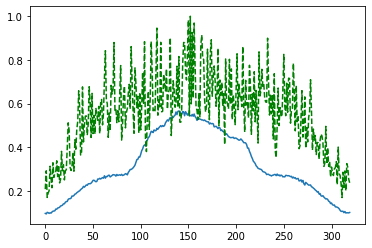

Time taken for epoch:  156.87662148475647
Epoch = [202/3000]  Iter = [   0/39480]  Loss = 0.148 Avg Loss = 0.148  Time = 0.0748s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [202/3000]  Iter = [ 100/39480]  Loss = 0.1441 Avg Loss = 0.1442  Time = 0.0035s
Epoch = [202/3000]  Iter = [ 200/39480]  Loss = 0.1297 Avg Loss = 0.1435  Time = 0.0033s
Epoch = [202/3000]  Iter = [ 300/39480]  Loss = 0.1264 Avg Loss = 0.1432  Time = 0.0035s
Epoch = [202/3000]  Iter = [ 400/39480]  Loss = 0.1265 Avg Loss = 0.144  Time = 0.0037s
Epoch = [202/3000]  Iter = [ 500/39480]  Loss = 0.1659 Avg Loss = 0.1433  Time = 0.0036s
Epoch = [202/3000]  Iter = [ 600/39480]  Loss = 0.1514 Avg Loss = 0.144  Time = 0.0037s
Epoch = [202/3000]  Iter = [ 700/39480]  Loss = 0.1509 Avg Loss = 0.1448  Time = 0.0036s
Epoch = [202/3000]  Iter = [ 800/39480]  Loss = 0.1379 Avg Loss = 0.1444  Time = 0.0036s
Epoch = [202/3000]  Iter = [ 900/39480]  Loss = 0.1469 Avg Loss = 0.1444  Time = 0.0036s
Epoch = [202/3000]  Iter = [1000/39480]  Loss = 0.1466 Avg Loss = 0.1438  Time = 0.0036s
Epoch = [202/3000]  Iter = [1100/39480]  Loss = 0.1264 Avg Loss = 0.142  Time = 0.0034s
Epoch = [202/3000]  Iter

Epoch = [202/3000]  Iter = [9400/39480]  Loss = 0.1352 Avg Loss = 0.1446  Time = 0.0035s
Epoch = [202/3000]  Iter = [9500/39480]  Loss = 0.1374 Avg Loss = 0.1455  Time = 0.0036s
Epoch = [202/3000]  Iter = [9600/39480]  Loss = 0.1463 Avg Loss = 0.1449  Time = 0.0037s
Epoch = [202/3000]  Iter = [9700/39480]  Loss = 0.1438 Avg Loss = 0.1446  Time = 0.0037s
Epoch = [202/3000]  Iter = [9800/39480]  Loss = 0.1635 Avg Loss = 0.1435  Time = 0.0033s
Epoch = [202/3000]  Iter = [9900/39480]  Loss = 0.1277 Avg Loss = 0.1439  Time = 0.0037s
Epoch = [202/3000]  Iter = [10000/39480]  Loss = 0.1426 Avg Loss = 0.1438  Time = 0.0037s
Epoch = [202/3000]  Iter = [10100/39480]  Loss = 0.1475 Avg Loss = 0.1435  Time = 0.0037s
Epoch = [202/3000]  Iter = [10200/39480]  Loss = 0.1463 Avg Loss = 0.1432  Time = 0.0033s
Epoch = [202/3000]  Iter = [10300/39480]  Loss = 0.1274 Avg Loss = 0.1444  Time = 0.0037s
Epoch = [202/3000]  Iter = [10400/39480]  Loss = 0.1585 Avg Loss = 0.1457  Time = 0.0035s
Epoch = [202/300

Epoch = [202/3000]  Iter = [18600/39480]  Loss = 0.1439 Avg Loss = 0.1439  Time = 0.0036s
Epoch = [202/3000]  Iter = [18700/39480]  Loss = 0.1405 Avg Loss = 0.1436  Time = 0.0039s
Epoch = [202/3000]  Iter = [18800/39480]  Loss = 0.1491 Avg Loss = 0.1446  Time = 0.0037s
Epoch = [202/3000]  Iter = [18900/39480]  Loss = 0.133 Avg Loss = 0.1431  Time = 0.0041s
Epoch = [202/3000]  Iter = [19000/39480]  Loss = 0.1435 Avg Loss = 0.1442  Time = 0.0040s
Epoch = [202/3000]  Iter = [19100/39480]  Loss = 0.1657 Avg Loss = 0.144  Time = 0.0040s
Epoch = [202/3000]  Iter = [19200/39480]  Loss = 0.1485 Avg Loss = 0.144  Time = 0.0041s
Epoch = [202/3000]  Iter = [19300/39480]  Loss = 0.1389 Avg Loss = 0.1449  Time = 0.0037s
Epoch = [202/3000]  Iter = [19400/39480]  Loss = 0.1421 Avg Loss = 0.1444  Time = 0.0037s
Epoch = [202/3000]  Iter = [19500/39480]  Loss = 0.1361 Avg Loss = 0.1436  Time = 0.0037s
Epoch = [202/3000]  Iter = [19600/39480]  Loss = 0.1381 Avg Loss = 0.1431  Time = 0.0035s
Epoch = [202/

Epoch = [202/3000]  Iter = [27800/39480]  Loss = 0.1491 Avg Loss = 0.1457  Time = 0.0033s
Epoch = [202/3000]  Iter = [27900/39480]  Loss = 0.1417 Avg Loss = 0.1449  Time = 0.0036s
Epoch = [202/3000]  Iter = [28000/39480]  Loss = 0.1648 Avg Loss = 0.1451  Time = 0.0033s
Epoch = [202/3000]  Iter = [28100/39480]  Loss = 0.1335 Avg Loss = 0.1437  Time = 0.0036s
Epoch = [202/3000]  Iter = [28200/39480]  Loss = 0.147 Avg Loss = 0.1449  Time = 0.0032s
Epoch = [202/3000]  Iter = [28300/39480]  Loss = 0.15 Avg Loss = 0.1443  Time = 0.0032s
Epoch = [202/3000]  Iter = [28400/39480]  Loss = 0.1262 Avg Loss = 0.1443  Time = 0.0037s
Epoch = [202/3000]  Iter = [28500/39480]  Loss = 0.126 Avg Loss = 0.145  Time = 0.0036s
Epoch = [202/3000]  Iter = [28600/39480]  Loss = 0.1364 Avg Loss = 0.1436  Time = 0.0033s
Epoch = [202/3000]  Iter = [28700/39480]  Loss = 0.136 Avg Loss = 0.1444  Time = 0.0036s
Epoch = [202/3000]  Iter = [28800/39480]  Loss = 0.1754 Avg Loss = 0.1444  Time = 0.0036s
Epoch = [202/300

Epoch = [202/3000]  Iter = [37000/39480]  Loss = 0.1392 Avg Loss = 0.1451  Time = 0.0036s
Epoch = [202/3000]  Iter = [37100/39480]  Loss = 0.1302 Avg Loss = 0.1451  Time = 0.0036s
Epoch = [202/3000]  Iter = [37200/39480]  Loss = 0.1533 Avg Loss = 0.1449  Time = 0.0037s
Epoch = [202/3000]  Iter = [37300/39480]  Loss = 0.1642 Avg Loss = 0.1441  Time = 0.0036s
Epoch = [202/3000]  Iter = [37400/39480]  Loss = 0.1482 Avg Loss = 0.1428  Time = 0.0032s
Epoch = [202/3000]  Iter = [37500/39480]  Loss = 0.1328 Avg Loss = 0.1434  Time = 0.0037s
Epoch = [202/3000]  Iter = [37600/39480]  Loss = 0.1584 Avg Loss = 0.1462  Time = 0.0036s
Epoch = [202/3000]  Iter = [37700/39480]  Loss = 0.1189 Avg Loss = 0.1446  Time = 0.0037s
Epoch = [202/3000]  Iter = [37800/39480]  Loss = 0.1311 Avg Loss = 0.1439  Time = 0.0032s
Epoch = [202/3000]  Iter = [37900/39480]  Loss = 0.1247 Avg Loss = 0.1446  Time = 0.0033s
Epoch = [202/3000]  Iter = [38000/39480]  Loss = 0.1577 Avg Loss = 0.1466  Time = 0.0037s
Epoch = [2

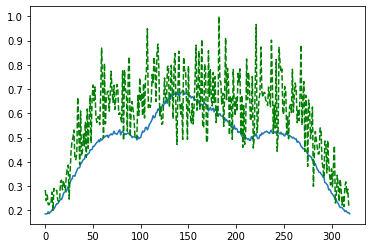

Time taken for epoch:  159.0978696346283
Epoch = [203/3000]  Iter = [   0/39480]  Loss = 0.1494 Avg Loss = 0.1494  Time = 0.0854s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [203/3000]  Iter = [ 100/39480]  Loss = 0.1422 Avg Loss = 0.1456  Time = 0.0036s
Epoch = [203/3000]  Iter = [ 200/39480]  Loss = 0.1467 Avg Loss = 0.1435  Time = 0.0035s
Epoch = [203/3000]  Iter = [ 300/39480]  Loss = 0.1251 Avg Loss = 0.144  Time = 0.0037s
Epoch = [203/3000]  Iter = [ 400/39480]  Loss = 0.1187 Avg Loss = 0.145  Time = 0.0033s
Epoch = [203/3000]  Iter = [ 500/39480]  Loss = 0.1457 Avg Loss = 0.1432  Time = 0.0037s
Epoch = [203/3000]  Iter = [ 600/39480]  Loss = 0.1442 Avg Loss = 0.1432  Time = 0.0038s
Epoch = [203/3000]  Iter = [ 700/39480]  Loss = 0.1402 Avg Loss = 0.1425  Time = 0.0038s
Epoch = [203/3000]  Iter = [ 800/39480]  Loss = 0.1543 Avg Loss = 0.1427  Time = 0.0038s
Epoch = [203/3000]  Iter = [ 900/39480]  Loss = 0.156 Avg Loss = 0.1428  Time = 0.0038s
Epoch = [203/3000]  Iter = [1000/39480]  Loss = 0.1479 Avg Loss = 0.1433  Time = 0.0038s
Epoch = [203/3000]  Iter = [1100/39480]  Loss = 0.1346 Avg Loss = 0.1432  Time = 0.0037s
Epoch = [203/3000]  Iter

Epoch = [203/3000]  Iter = [9400/39480]  Loss = 0.1296 Avg Loss = 0.144  Time = 0.0038s
Epoch = [203/3000]  Iter = [9500/39480]  Loss = 0.1775 Avg Loss = 0.1448  Time = 0.0037s
Epoch = [203/3000]  Iter = [9600/39480]  Loss = 0.1453 Avg Loss = 0.1439  Time = 0.0038s
Epoch = [203/3000]  Iter = [9700/39480]  Loss = 0.1486 Avg Loss = 0.1438  Time = 0.0038s
Epoch = [203/3000]  Iter = [9800/39480]  Loss = 0.1501 Avg Loss = 0.1432  Time = 0.0035s
Epoch = [203/3000]  Iter = [9900/39480]  Loss = 0.1545 Avg Loss = 0.1453  Time = 0.0033s
Epoch = [203/3000]  Iter = [10000/39480]  Loss = 0.1335 Avg Loss = 0.1433  Time = 0.0038s
Epoch = [203/3000]  Iter = [10100/39480]  Loss = 0.1491 Avg Loss = 0.1432  Time = 0.0037s
Epoch = [203/3000]  Iter = [10200/39480]  Loss = 0.146 Avg Loss = 0.1439  Time = 0.0032s
Epoch = [203/3000]  Iter = [10300/39480]  Loss = 0.1367 Avg Loss = 0.1438  Time = 0.0037s
Epoch = [203/3000]  Iter = [10400/39480]  Loss = 0.1596 Avg Loss = 0.1446  Time = 0.0037s
Epoch = [203/3000]

Epoch = [203/3000]  Iter = [18600/39480]  Loss = 0.137 Avg Loss = 0.1449  Time = 0.0036s
Epoch = [203/3000]  Iter = [18700/39480]  Loss = 0.137 Avg Loss = 0.1435  Time = 0.0036s
Epoch = [203/3000]  Iter = [18800/39480]  Loss = 0.171 Avg Loss = 0.1449  Time = 0.0036s
Epoch = [203/3000]  Iter = [18900/39480]  Loss = 0.1349 Avg Loss = 0.1438  Time = 0.0037s
Epoch = [203/3000]  Iter = [19000/39480]  Loss = 0.1475 Avg Loss = 0.144  Time = 0.0034s
Epoch = [203/3000]  Iter = [19100/39480]  Loss = 0.1452 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [203/3000]  Iter = [19200/39480]  Loss = 0.1244 Avg Loss = 0.1446  Time = 0.0035s
Epoch = [203/3000]  Iter = [19300/39480]  Loss = 0.1208 Avg Loss = 0.1446  Time = 0.0033s
Epoch = [203/3000]  Iter = [19400/39480]  Loss = 0.1718 Avg Loss = 0.1437  Time = 0.0033s
Epoch = [203/3000]  Iter = [19500/39480]  Loss = 0.1158 Avg Loss = 0.1448  Time = 0.0037s
Epoch = [203/3000]  Iter = [19600/39480]  Loss = 0.1835 Avg Loss = 0.1444  Time = 0.0037s
Epoch = [203/3

Epoch = [203/3000]  Iter = [27800/39480]  Loss = 0.1406 Avg Loss = 0.1446  Time = 0.0036s
Epoch = [203/3000]  Iter = [27900/39480]  Loss = 0.1511 Avg Loss = 0.1441  Time = 0.0032s
Epoch = [203/3000]  Iter = [28000/39480]  Loss = 0.1522 Avg Loss = 0.1444  Time = 0.0036s
Epoch = [203/3000]  Iter = [28100/39480]  Loss = 0.1519 Avg Loss = 0.1431  Time = 0.0037s
Epoch = [203/3000]  Iter = [28200/39480]  Loss = 0.1628 Avg Loss = 0.1438  Time = 0.0032s
Epoch = [203/3000]  Iter = [28300/39480]  Loss = 0.159 Avg Loss = 0.1432  Time = 0.0036s
Epoch = [203/3000]  Iter = [28400/39480]  Loss = 0.1451 Avg Loss = 0.1439  Time = 0.0034s
Epoch = [203/3000]  Iter = [28500/39480]  Loss = 0.1543 Avg Loss = 0.1428  Time = 0.0037s
Epoch = [203/3000]  Iter = [28600/39480]  Loss = 0.1328 Avg Loss = 0.1442  Time = 0.0037s
Epoch = [203/3000]  Iter = [28700/39480]  Loss = 0.1379 Avg Loss = 0.1439  Time = 0.0036s
Epoch = [203/3000]  Iter = [28800/39480]  Loss = 0.1448 Avg Loss = 0.1441  Time = 0.0037s
Epoch = [20

Epoch = [203/3000]  Iter = [37000/39480]  Loss = 0.1643 Avg Loss = 0.1449  Time = 0.0036s
Epoch = [203/3000]  Iter = [37100/39480]  Loss = 0.1301 Avg Loss = 0.1431  Time = 0.0036s
Epoch = [203/3000]  Iter = [37200/39480]  Loss = 0.1456 Avg Loss = 0.1434  Time = 0.0036s
Epoch = [203/3000]  Iter = [37300/39480]  Loss = 0.1046 Avg Loss = 0.1438  Time = 0.0037s
Epoch = [203/3000]  Iter = [37400/39480]  Loss = 0.1406 Avg Loss = 0.1451  Time = 0.0036s
Epoch = [203/3000]  Iter = [37500/39480]  Loss = 0.1335 Avg Loss = 0.1451  Time = 0.0036s
Epoch = [203/3000]  Iter = [37600/39480]  Loss = 0.1572 Avg Loss = 0.1449  Time = 0.0036s
Epoch = [203/3000]  Iter = [37700/39480]  Loss = 0.1653 Avg Loss = 0.1432  Time = 0.0036s
Epoch = [203/3000]  Iter = [37800/39480]  Loss = 0.1323 Avg Loss = 0.1454  Time = 0.0036s
Epoch = [203/3000]  Iter = [37900/39480]  Loss = 0.1691 Avg Loss = 0.1441  Time = 0.0037s
Epoch = [203/3000]  Iter = [38000/39480]  Loss = 0.1238 Avg Loss = 0.1433  Time = 0.0037s
Epoch = [2

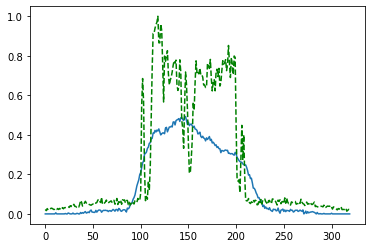

Time taken for epoch:  160.24764704704285
Epoch = [204/3000]  Iter = [   0/39480]  Loss = 0.1473 Avg Loss = 0.1473  Time = 0.0843s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [204/3000]  Iter = [ 100/39480]  Loss = 0.1282 Avg Loss = 0.1442  Time = 0.0040s
Epoch = [204/3000]  Iter = [ 200/39480]  Loss = 0.1251 Avg Loss = 0.1423  Time = 0.0040s
Epoch = [204/3000]  Iter = [ 300/39480]  Loss = 0.1405 Avg Loss = 0.142  Time = 0.0040s
Epoch = [204/3000]  Iter = [ 400/39480]  Loss = 0.1501 Avg Loss = 0.1414  Time = 0.0039s
Epoch = [204/3000]  Iter = [ 500/39480]  Loss = 0.1429 Avg Loss = 0.142  Time = 0.0040s
Epoch = [204/3000]  Iter = [ 600/39480]  Loss = 0.1391 Avg Loss = 0.1424  Time = 0.0039s
Epoch = [204/3000]  Iter = [ 700/39480]  Loss = 0.1495 Avg Loss = 0.1427  Time = 0.0039s
Epoch = [204/3000]  Iter = [ 800/39480]  Loss = 0.1498 Avg Loss = 0.1433  Time = 0.0036s
Epoch = [204/3000]  Iter = [ 900/39480]  Loss = 0.161 Avg Loss = 0.1437  Time = 0.0040s
Epoch = [204/3000]  Iter = [1000/39480]  Loss = 0.1142 Avg Loss = 0.1415  Time = 0.0039s
Epoch = [204/3000]  Iter = [1100/39480]  Loss = 0.152 Avg Loss = 0.1442  Time = 0.0039s
Epoch = [204/3000]  Iter 

Epoch = [204/3000]  Iter = [9400/39480]  Loss = 0.1448 Avg Loss = 0.1427  Time = 0.0037s
Epoch = [204/3000]  Iter = [9500/39480]  Loss = 0.1346 Avg Loss = 0.1426  Time = 0.0038s
Epoch = [204/3000]  Iter = [9600/39480]  Loss = 0.1443 Avg Loss = 0.1435  Time = 0.0037s
Epoch = [204/3000]  Iter = [9700/39480]  Loss = 0.1464 Avg Loss = 0.1422  Time = 0.0041s
Epoch = [204/3000]  Iter = [9800/39480]  Loss = 0.1298 Avg Loss = 0.1418  Time = 0.0042s
Epoch = [204/3000]  Iter = [9900/39480]  Loss = 0.1297 Avg Loss = 0.1422  Time = 0.0040s
Epoch = [204/3000]  Iter = [10000/39480]  Loss = 0.1465 Avg Loss = 0.1415  Time = 0.0037s
Epoch = [204/3000]  Iter = [10100/39480]  Loss = 0.1289 Avg Loss = 0.1405  Time = 0.0037s
Epoch = [204/3000]  Iter = [10200/39480]  Loss = 0.1546 Avg Loss = 0.1422  Time = 0.0037s
Epoch = [204/3000]  Iter = [10300/39480]  Loss = 0.1438 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [204/3000]  Iter = [10400/39480]  Loss = 0.1385 Avg Loss = 0.1426  Time = 0.0033s
Epoch = [204/300

Epoch = [204/3000]  Iter = [18600/39480]  Loss = 0.1327 Avg Loss = 0.145  Time = 0.0037s
Epoch = [204/3000]  Iter = [18700/39480]  Loss = 0.1456 Avg Loss = 0.1438  Time = 0.0037s
Epoch = [204/3000]  Iter = [18800/39480]  Loss = 0.1389 Avg Loss = 0.1449  Time = 0.0034s
Epoch = [204/3000]  Iter = [18900/39480]  Loss = 0.1354 Avg Loss = 0.1438  Time = 0.0037s
Epoch = [204/3000]  Iter = [19000/39480]  Loss = 0.118 Avg Loss = 0.1432  Time = 0.0036s
Epoch = [204/3000]  Iter = [19100/39480]  Loss = 0.1391 Avg Loss = 0.1424  Time = 0.0032s
Epoch = [204/3000]  Iter = [19200/39480]  Loss = 0.134 Avg Loss = 0.1424  Time = 0.0031s
Epoch = [204/3000]  Iter = [19300/39480]  Loss = 0.1646 Avg Loss = 0.1435  Time = 0.0036s
Epoch = [204/3000]  Iter = [19400/39480]  Loss = 0.1308 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [204/3000]  Iter = [19500/39480]  Loss = 0.1419 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [204/3000]  Iter = [19600/39480]  Loss = 0.1413 Avg Loss = 0.1443  Time = 0.0036s
Epoch = [204/

Epoch = [204/3000]  Iter = [27800/39480]  Loss = 0.125 Avg Loss = 0.1442  Time = 0.0036s
Epoch = [204/3000]  Iter = [27900/39480]  Loss = 0.1439 Avg Loss = 0.1436  Time = 0.0036s
Epoch = [204/3000]  Iter = [28000/39480]  Loss = 0.1582 Avg Loss = 0.142  Time = 0.0032s
Epoch = [204/3000]  Iter = [28100/39480]  Loss = 0.138 Avg Loss = 0.1443  Time = 0.0036s
Epoch = [204/3000]  Iter = [28200/39480]  Loss = 0.1544 Avg Loss = 0.1439  Time = 0.0036s
Epoch = [204/3000]  Iter = [28300/39480]  Loss = 0.1579 Avg Loss = 0.1449  Time = 0.0036s
Epoch = [204/3000]  Iter = [28400/39480]  Loss = 0.1431 Avg Loss = 0.1444  Time = 0.0034s
Epoch = [204/3000]  Iter = [28500/39480]  Loss = 0.1449 Avg Loss = 0.1442  Time = 0.0036s
Epoch = [204/3000]  Iter = [28600/39480]  Loss = 0.1635 Avg Loss = 0.1454  Time = 0.0036s
Epoch = [204/3000]  Iter = [28700/39480]  Loss = 0.1249 Avg Loss = 0.1449  Time = 0.0037s
Epoch = [204/3000]  Iter = [28800/39480]  Loss = 0.1384 Avg Loss = 0.1453  Time = 0.0036s
Epoch = [204/

Epoch = [204/3000]  Iter = [37000/39480]  Loss = 0.1355 Avg Loss = 0.144  Time = 0.0032s
Epoch = [204/3000]  Iter = [37100/39480]  Loss = 0.1243 Avg Loss = 0.1442  Time = 0.0036s
Epoch = [204/3000]  Iter = [37200/39480]  Loss = 0.1492 Avg Loss = 0.1437  Time = 0.0037s
Epoch = [204/3000]  Iter = [37300/39480]  Loss = 0.1427 Avg Loss = 0.1427  Time = 0.0037s
Epoch = [204/3000]  Iter = [37400/39480]  Loss = 0.1483 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [204/3000]  Iter = [37500/39480]  Loss = 0.1312 Avg Loss = 0.143  Time = 0.0032s
Epoch = [204/3000]  Iter = [37600/39480]  Loss = 0.1378 Avg Loss = 0.143  Time = 0.0037s
Epoch = [204/3000]  Iter = [37700/39480]  Loss = 0.1217 Avg Loss = 0.1417  Time = 0.0034s
Epoch = [204/3000]  Iter = [37800/39480]  Loss = 0.1572 Avg Loss = 0.1421  Time = 0.0034s
Epoch = [204/3000]  Iter = [37900/39480]  Loss = 0.1513 Avg Loss = 0.1437  Time = 0.0033s
Epoch = [204/3000]  Iter = [38000/39480]  Loss = 0.1476 Avg Loss = 0.144  Time = 0.0037s
Epoch = [204/3

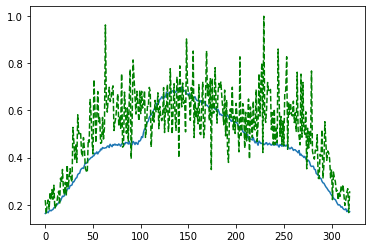

Time taken for epoch:  161.25955438613892
Epoch = [205/3000]  Iter = [   0/39480]  Loss = 0.1373 Avg Loss = 0.1373  Time = 0.0657s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [205/3000]  Iter = [ 100/39480]  Loss = 0.1497 Avg Loss = 0.1415  Time = 0.0031s
Epoch = [205/3000]  Iter = [ 200/39480]  Loss = 0.1578 Avg Loss = 0.1418  Time = 0.0038s
Epoch = [205/3000]  Iter = [ 300/39480]  Loss = 0.151 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [205/3000]  Iter = [ 400/39480]  Loss = 0.1554 Avg Loss = 0.142  Time = 0.0037s
Epoch = [205/3000]  Iter = [ 500/39480]  Loss = 0.1383 Avg Loss = 0.1429  Time = 0.0033s
Epoch = [205/3000]  Iter = [ 600/39480]  Loss = 0.1369 Avg Loss = 0.1421  Time = 0.0037s
Epoch = [205/3000]  Iter = [ 700/39480]  Loss = 0.1143 Avg Loss = 0.1406  Time = 0.0037s
Epoch = [205/3000]  Iter = [ 800/39480]  Loss = 0.1164 Avg Loss = 0.141  Time = 0.0037s
Epoch = [205/3000]  Iter = [ 900/39480]  Loss = 0.1434 Avg Loss = 0.141  Time = 0.0036s
Epoch = [205/3000]  Iter = [1000/39480]  Loss = 0.1353 Avg Loss = 0.1423  Time = 0.0037s
Epoch = [205/3000]  Iter = [1100/39480]  Loss = 0.1617 Avg Loss = 0.1423  Time = 0.0037s
Epoch = [205/3000]  Iter 

Epoch = [205/3000]  Iter = [9400/39480]  Loss = 0.1745 Avg Loss = 0.1437  Time = 0.0034s
Epoch = [205/3000]  Iter = [9500/39480]  Loss = 0.1387 Avg Loss = 0.1428  Time = 0.0032s
Epoch = [205/3000]  Iter = [9600/39480]  Loss = 0.1313 Avg Loss = 0.1431  Time = 0.0034s
Epoch = [205/3000]  Iter = [9700/39480]  Loss = 0.1621 Avg Loss = 0.144  Time = 0.0036s
Epoch = [205/3000]  Iter = [9800/39480]  Loss = 0.1459 Avg Loss = 0.1433  Time = 0.0036s
Epoch = [205/3000]  Iter = [9900/39480]  Loss = 0.1642 Avg Loss = 0.1435  Time = 0.0035s
Epoch = [205/3000]  Iter = [10000/39480]  Loss = 0.1281 Avg Loss = 0.1428  Time = 0.0035s
Epoch = [205/3000]  Iter = [10100/39480]  Loss = 0.1394 Avg Loss = 0.1434  Time = 0.0036s
Epoch = [205/3000]  Iter = [10200/39480]  Loss = 0.1312 Avg Loss = 0.1427  Time = 0.0036s
Epoch = [205/3000]  Iter = [10300/39480]  Loss = 0.1331 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [205/3000]  Iter = [10400/39480]  Loss = 0.1462 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [205/3000

Epoch = [205/3000]  Iter = [18600/39480]  Loss = 0.1375 Avg Loss = 0.1421  Time = 0.0037s
Epoch = [205/3000]  Iter = [18700/39480]  Loss = 0.1527 Avg Loss = 0.1441  Time = 0.0036s
Epoch = [205/3000]  Iter = [18800/39480]  Loss = 0.1451 Avg Loss = 0.1439  Time = 0.0037s
Epoch = [205/3000]  Iter = [18900/39480]  Loss = 0.1334 Avg Loss = 0.1429  Time = 0.0037s
Epoch = [205/3000]  Iter = [19000/39480]  Loss = 0.1418 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [205/3000]  Iter = [19100/39480]  Loss = 0.1355 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [205/3000]  Iter = [19200/39480]  Loss = 0.1323 Avg Loss = 0.1436  Time = 0.0033s
Epoch = [205/3000]  Iter = [19300/39480]  Loss = 0.1574 Avg Loss = 0.1442  Time = 0.0037s
Epoch = [205/3000]  Iter = [19400/39480]  Loss = 0.1326 Avg Loss = 0.1442  Time = 0.0036s
Epoch = [205/3000]  Iter = [19500/39480]  Loss = 0.1282 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [205/3000]  Iter = [19600/39480]  Loss = 0.1294 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [2

Epoch = [205/3000]  Iter = [27800/39480]  Loss = 0.1712 Avg Loss = 0.1413  Time = 0.0032s
Epoch = [205/3000]  Iter = [27900/39480]  Loss = 0.1498 Avg Loss = 0.1428  Time = 0.0035s
Epoch = [205/3000]  Iter = [28000/39480]  Loss = 0.1367 Avg Loss = 0.1437  Time = 0.0037s
Epoch = [205/3000]  Iter = [28100/39480]  Loss = 0.1245 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [205/3000]  Iter = [28200/39480]  Loss = 0.1773 Avg Loss = 0.1432  Time = 0.0032s
Epoch = [205/3000]  Iter = [28300/39480]  Loss = 0.1325 Avg Loss = 0.143  Time = 0.0036s
Epoch = [205/3000]  Iter = [28400/39480]  Loss = 0.1526 Avg Loss = 0.1428  Time = 0.0036s
Epoch = [205/3000]  Iter = [28500/39480]  Loss = 0.1492 Avg Loss = 0.144  Time = 0.0036s
Epoch = [205/3000]  Iter = [28600/39480]  Loss = 0.1384 Avg Loss = 0.1449  Time = 0.0035s
Epoch = [205/3000]  Iter = [28700/39480]  Loss = 0.1511 Avg Loss = 0.1443  Time = 0.0036s
Epoch = [205/3000]  Iter = [28800/39480]  Loss = 0.1387 Avg Loss = 0.1446  Time = 0.0038s
Epoch = [205

Epoch = [205/3000]  Iter = [37000/39480]  Loss = 0.1483 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [205/3000]  Iter = [37100/39480]  Loss = 0.1105 Avg Loss = 0.1422  Time = 0.0037s
Epoch = [205/3000]  Iter = [37200/39480]  Loss = 0.1431 Avg Loss = 0.1426  Time = 0.0033s
Epoch = [205/3000]  Iter = [37300/39480]  Loss = 0.1508 Avg Loss = 0.1436  Time = 0.0037s
Epoch = [205/3000]  Iter = [37400/39480]  Loss = 0.1205 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [205/3000]  Iter = [37500/39480]  Loss = 0.1671 Avg Loss = 0.1428  Time = 0.0041s
Epoch = [205/3000]  Iter = [37600/39480]  Loss = 0.1335 Avg Loss = 0.1435  Time = 0.0040s
Epoch = [205/3000]  Iter = [37700/39480]  Loss = 0.148 Avg Loss = 0.1446  Time = 0.0040s
Epoch = [205/3000]  Iter = [37800/39480]  Loss = 0.1394 Avg Loss = 0.1436  Time = 0.0032s
Epoch = [205/3000]  Iter = [37900/39480]  Loss = 0.1622 Avg Loss = 0.1443  Time = 0.0034s
Epoch = [205/3000]  Iter = [38000/39480]  Loss = 0.1432 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [20

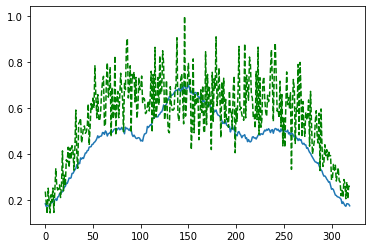

Time taken for epoch:  158.01420378684998
Epoch = [206/3000]  Iter = [   0/39480]  Loss = 0.1532 Avg Loss = 0.1532  Time = 0.0674s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [206/3000]  Iter = [ 100/39480]  Loss = 0.1563 Avg Loss = 0.1465  Time = 0.0037s
Epoch = [206/3000]  Iter = [ 200/39480]  Loss = 0.1347 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [206/3000]  Iter = [ 300/39480]  Loss = 0.1468 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [206/3000]  Iter = [ 400/39480]  Loss = 0.1284 Avg Loss = 0.1429  Time = 0.0037s
Epoch = [206/3000]  Iter = [ 500/39480]  Loss = 0.1364 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [206/3000]  Iter = [ 600/39480]  Loss = 0.1635 Avg Loss = 0.1431  Time = 0.0037s
Epoch = [206/3000]  Iter = [ 700/39480]  Loss = 0.1372 Avg Loss = 0.1423  Time = 0.0037s
Epoch = [206/3000]  Iter = [ 800/39480]  Loss = 0.135 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [206/3000]  Iter = [ 900/39480]  Loss = 0.1382 Avg Loss = 0.1421  Time = 0.0038s
Epoch = [206/3000]  Iter = [1000/39480]  Loss = 0.1366 Avg Loss = 0.1425  Time = 0.0038s
Epoch = [206/3000]  Iter = [1100/39480]  Loss = 0.155 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [206/3000]  Ite

Epoch = [206/3000]  Iter = [9400/39480]  Loss = 0.1324 Avg Loss = 0.1421  Time = 0.0038s
Epoch = [206/3000]  Iter = [9500/39480]  Loss = 0.1682 Avg Loss = 0.1419  Time = 0.0038s
Epoch = [206/3000]  Iter = [9600/39480]  Loss = 0.1291 Avg Loss = 0.141  Time = 0.0038s
Epoch = [206/3000]  Iter = [9700/39480]  Loss = 0.1633 Avg Loss = 0.143  Time = 0.0038s
Epoch = [206/3000]  Iter = [9800/39480]  Loss = 0.1536 Avg Loss = 0.1421  Time = 0.0039s
Epoch = [206/3000]  Iter = [9900/39480]  Loss = 0.1416 Avg Loss = 0.1419  Time = 0.0038s
Epoch = [206/3000]  Iter = [10000/39480]  Loss = 0.1581 Avg Loss = 0.1432  Time = 0.0038s
Epoch = [206/3000]  Iter = [10100/39480]  Loss = 0.1441 Avg Loss = 0.1422  Time = 0.0038s
Epoch = [206/3000]  Iter = [10200/39480]  Loss = 0.1721 Avg Loss = 0.1421  Time = 0.0038s
Epoch = [206/3000]  Iter = [10300/39480]  Loss = 0.1472 Avg Loss = 0.1427  Time = 0.0039s
Epoch = [206/3000]  Iter = [10400/39480]  Loss = 0.1682 Avg Loss = 0.1425  Time = 0.0039s
Epoch = [206/3000]

Epoch = [206/3000]  Iter = [18600/39480]  Loss = 0.1243 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [206/3000]  Iter = [18700/39480]  Loss = 0.1577 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [206/3000]  Iter = [18800/39480]  Loss = 0.1127 Avg Loss = 0.1435  Time = 0.0037s
Epoch = [206/3000]  Iter = [18900/39480]  Loss = 0.1523 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [206/3000]  Iter = [19000/39480]  Loss = 0.1313 Avg Loss = 0.1423  Time = 0.0037s
Epoch = [206/3000]  Iter = [19100/39480]  Loss = 0.141 Avg Loss = 0.142  Time = 0.0037s
Epoch = [206/3000]  Iter = [19200/39480]  Loss = 0.1523 Avg Loss = 0.1415  Time = 0.0037s
Epoch = [206/3000]  Iter = [19300/39480]  Loss = 0.1545 Avg Loss = 0.1426  Time = 0.0033s
Epoch = [206/3000]  Iter = [19400/39480]  Loss = 0.141 Avg Loss = 0.1432  Time = 0.0032s
Epoch = [206/3000]  Iter = [19500/39480]  Loss = 0.1489 Avg Loss = 0.1428  Time = 0.0037s
Epoch = [206/3000]  Iter = [19600/39480]  Loss = 0.1433 Avg Loss = 0.1429  Time = 0.0034s
Epoch = [206/

Epoch = [206/3000]  Iter = [27800/39480]  Loss = 0.1611 Avg Loss = 0.1431  Time = 0.0036s
Epoch = [206/3000]  Iter = [27900/39480]  Loss = 0.1609 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [206/3000]  Iter = [28000/39480]  Loss = 0.1298 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [206/3000]  Iter = [28100/39480]  Loss = 0.1681 Avg Loss = 0.1442  Time = 0.0036s
Epoch = [206/3000]  Iter = [28200/39480]  Loss = 0.1626 Avg Loss = 0.1425  Time = 0.0037s
Epoch = [206/3000]  Iter = [28300/39480]  Loss = 0.1561 Avg Loss = 0.142  Time = 0.0034s
Epoch = [206/3000]  Iter = [28400/39480]  Loss = 0.1556 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [206/3000]  Iter = [28500/39480]  Loss = 0.1439 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [206/3000]  Iter = [28600/39480]  Loss = 0.1507 Avg Loss = 0.143  Time = 0.0036s
Epoch = [206/3000]  Iter = [28700/39480]  Loss = 0.1345 Avg Loss = 0.1437  Time = 0.0036s
Epoch = [206/3000]  Iter = [28800/39480]  Loss = 0.1464 Avg Loss = 0.1432  Time = 0.0032s
Epoch = [206

Epoch = [206/3000]  Iter = [37000/39480]  Loss = 0.1278 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [206/3000]  Iter = [37100/39480]  Loss = 0.1535 Avg Loss = 0.1432  Time = 0.0035s
Epoch = [206/3000]  Iter = [37200/39480]  Loss = 0.1465 Avg Loss = 0.1428  Time = 0.0035s
Epoch = [206/3000]  Iter = [37300/39480]  Loss = 0.1364 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [206/3000]  Iter = [37400/39480]  Loss = 0.1432 Avg Loss = 0.1443  Time = 0.0035s
Epoch = [206/3000]  Iter = [37500/39480]  Loss = 0.1157 Avg Loss = 0.1439  Time = 0.0035s
Epoch = [206/3000]  Iter = [37600/39480]  Loss = 0.1559 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [206/3000]  Iter = [37700/39480]  Loss = 0.1317 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [206/3000]  Iter = [37800/39480]  Loss = 0.1586 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [206/3000]  Iter = [37900/39480]  Loss = 0.1368 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [206/3000]  Iter = [38000/39480]  Loss = 0.118 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [20

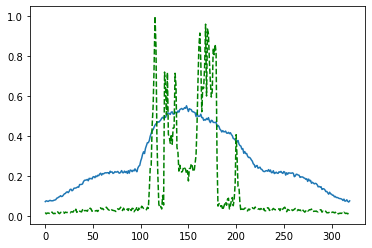

Time taken for epoch:  162.11005115509033
Epoch = [207/3000]  Iter = [   0/39480]  Loss = 0.1396 Avg Loss = 0.1396  Time = 0.0734s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [207/3000]  Iter = [ 100/39480]  Loss = 0.1657 Avg Loss = 0.1404  Time = 0.0035s
Epoch = [207/3000]  Iter = [ 200/39480]  Loss = 0.1272 Avg Loss = 0.1407  Time = 0.0037s
Epoch = [207/3000]  Iter = [ 300/39480]  Loss = 0.1412 Avg Loss = 0.1411  Time = 0.0037s
Epoch = [207/3000]  Iter = [ 400/39480]  Loss = 0.1321 Avg Loss = 0.1399  Time = 0.0037s
Epoch = [207/3000]  Iter = [ 500/39480]  Loss = 0.1339 Avg Loss = 0.1404  Time = 0.0035s
Epoch = [207/3000]  Iter = [ 600/39480]  Loss = 0.1633 Avg Loss = 0.1427  Time = 0.0037s
Epoch = [207/3000]  Iter = [ 700/39480]  Loss = 0.1436 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [207/3000]  Iter = [ 800/39480]  Loss = 0.1457 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [207/3000]  Iter = [ 900/39480]  Loss = 0.1298 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [207/3000]  Iter = [1000/39480]  Loss = 0.1395 Avg Loss = 0.1424  Time = 0.0035s
Epoch = [207/3000]  Iter = [1100/39480]  Loss = 0.1477 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [207/3000]  I

Epoch = [207/3000]  Iter = [9400/39480]  Loss = 0.1387 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [207/3000]  Iter = [9500/39480]  Loss = 0.145 Avg Loss = 0.1407  Time = 0.0037s
Epoch = [207/3000]  Iter = [9600/39480]  Loss = 0.1397 Avg Loss = 0.1411  Time = 0.0037s
Epoch = [207/3000]  Iter = [9700/39480]  Loss = 0.1324 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [207/3000]  Iter = [9800/39480]  Loss = 0.1435 Avg Loss = 0.142  Time = 0.0037s
Epoch = [207/3000]  Iter = [9900/39480]  Loss = 0.1518 Avg Loss = 0.1416  Time = 0.0035s
Epoch = [207/3000]  Iter = [10000/39480]  Loss = 0.1377 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [207/3000]  Iter = [10100/39480]  Loss = 0.128 Avg Loss = 0.1428  Time = 0.0036s
Epoch = [207/3000]  Iter = [10200/39480]  Loss = 0.1386 Avg Loss = 0.1429  Time = 0.0030s
Epoch = [207/3000]  Iter = [10300/39480]  Loss = 0.1413 Avg Loss = 0.1415  Time = 0.0037s
Epoch = [207/3000]  Iter = [10400/39480]  Loss = 0.1513 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [207/3000] 

Epoch = [207/3000]  Iter = [18600/39480]  Loss = 0.1474 Avg Loss = 0.1425  Time = 0.0037s
Epoch = [207/3000]  Iter = [18700/39480]  Loss = 0.151 Avg Loss = 0.144  Time = 0.0037s
Epoch = [207/3000]  Iter = [18800/39480]  Loss = 0.1477 Avg Loss = 0.1429  Time = 0.0037s
Epoch = [207/3000]  Iter = [18900/39480]  Loss = 0.1288 Avg Loss = 0.142  Time = 0.0037s
Epoch = [207/3000]  Iter = [19000/39480]  Loss = 0.1541 Avg Loss = 0.1431  Time = 0.0037s
Epoch = [207/3000]  Iter = [19100/39480]  Loss = 0.1544 Avg Loss = 0.1422  Time = 0.0037s
Epoch = [207/3000]  Iter = [19200/39480]  Loss = 0.1596 Avg Loss = 0.1438  Time = 0.0038s
Epoch = [207/3000]  Iter = [19300/39480]  Loss = 0.1408 Avg Loss = 0.1438  Time = 0.0036s
Epoch = [207/3000]  Iter = [19400/39480]  Loss = 0.1658 Avg Loss = 0.1434  Time = 0.0037s
Epoch = [207/3000]  Iter = [19500/39480]  Loss = 0.1211 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [207/3000]  Iter = [19600/39480]  Loss = 0.1408 Avg Loss = 0.1414  Time = 0.0041s
Epoch = [207/

Epoch = [207/3000]  Iter = [27800/39480]  Loss = 0.1425 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [207/3000]  Iter = [27900/39480]  Loss = 0.1573 Avg Loss = 0.1432  Time = 0.0037s
Epoch = [207/3000]  Iter = [28000/39480]  Loss = 0.1226 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [207/3000]  Iter = [28100/39480]  Loss = 0.1496 Avg Loss = 0.1446  Time = 0.0037s
Epoch = [207/3000]  Iter = [28200/39480]  Loss = 0.1644 Avg Loss = 0.1439  Time = 0.0037s
Epoch = [207/3000]  Iter = [28300/39480]  Loss = 0.1302 Avg Loss = 0.1436  Time = 0.0036s
Epoch = [207/3000]  Iter = [28400/39480]  Loss = 0.1418 Avg Loss = 0.1433  Time = 0.0037s
Epoch = [207/3000]  Iter = [28500/39480]  Loss = 0.1513 Avg Loss = 0.1433  Time = 0.0036s
Epoch = [207/3000]  Iter = [28600/39480]  Loss = 0.1205 Avg Loss = 0.1436  Time = 0.0036s
Epoch = [207/3000]  Iter = [28700/39480]  Loss = 0.1485 Avg Loss = 0.1427  Time = 0.0036s
Epoch = [207/3000]  Iter = [28800/39480]  Loss = 0.1307 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [2

Epoch = [207/3000]  Iter = [37000/39480]  Loss = 0.1721 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [207/3000]  Iter = [37100/39480]  Loss = 0.153 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [207/3000]  Iter = [37200/39480]  Loss = 0.1701 Avg Loss = 0.1427  Time = 0.0036s
Epoch = [207/3000]  Iter = [37300/39480]  Loss = 0.1488 Avg Loss = 0.1438  Time = 0.0036s
Epoch = [207/3000]  Iter = [37400/39480]  Loss = 0.1476 Avg Loss = 0.1436  Time = 0.0037s
Epoch = [207/3000]  Iter = [37500/39480]  Loss = 0.1474 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [207/3000]  Iter = [37600/39480]  Loss = 0.124 Avg Loss = 0.1433  Time = 0.0036s
Epoch = [207/3000]  Iter = [37700/39480]  Loss = 0.1418 Avg Loss = 0.1412  Time = 0.0031s
Epoch = [207/3000]  Iter = [37800/39480]  Loss = 0.141 Avg Loss = 0.1426  Time = 0.0035s
Epoch = [207/3000]  Iter = [37900/39480]  Loss = 0.159 Avg Loss = 0.1441  Time = 0.0033s
Epoch = [207/3000]  Iter = [38000/39480]  Loss = 0.1647 Avg Loss = 0.1439  Time = 0.0037s
Epoch = [207/3

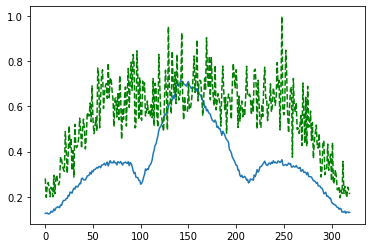

Time taken for epoch:  158.5754668712616
Epoch = [208/3000]  Iter = [   0/39480]  Loss = 0.1371 Avg Loss = 0.1371  Time = 0.0867s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [208/3000]  Iter = [ 100/39480]  Loss = 0.1388 Avg Loss = 0.1401  Time = 0.0035s
Epoch = [208/3000]  Iter = [ 200/39480]  Loss = 0.1341 Avg Loss = 0.1415  Time = 0.0035s
Epoch = [208/3000]  Iter = [ 300/39480]  Loss = 0.1315 Avg Loss = 0.1423  Time = 0.0033s
Epoch = [208/3000]  Iter = [ 400/39480]  Loss = 0.1241 Avg Loss = 0.1418  Time = 0.0032s
Epoch = [208/3000]  Iter = [ 500/39480]  Loss = 0.1279 Avg Loss = 0.1407  Time = 0.0035s
Epoch = [208/3000]  Iter = [ 600/39480]  Loss = 0.1401 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [208/3000]  Iter = [ 700/39480]  Loss = 0.1489 Avg Loss = 0.1416  Time = 0.0035s
Epoch = [208/3000]  Iter = [ 800/39480]  Loss = 0.1647 Avg Loss = 0.1421  Time = 0.0041s
Epoch = [208/3000]  Iter = [ 900/39480]  Loss = 0.1422 Avg Loss = 0.1405  Time = 0.0038s
Epoch = [208/3000]  Iter = [1000/39480]  Loss = 0.1524 Avg Loss = 0.1425  Time = 0.0040s
Epoch = [208/3000]  Iter = [1100/39480]  Loss = 0.1284 Avg Loss = 0.141  Time = 0.0036s
Epoch = [208/3000]  It

Epoch = [208/3000]  Iter = [9400/39480]  Loss = 0.144 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [208/3000]  Iter = [9500/39480]  Loss = 0.1415 Avg Loss = 0.141  Time = 0.0035s
Epoch = [208/3000]  Iter = [9600/39480]  Loss = 0.1502 Avg Loss = 0.1431  Time = 0.0036s
Epoch = [208/3000]  Iter = [9700/39480]  Loss = 0.1279 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [208/3000]  Iter = [9800/39480]  Loss = 0.1619 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [208/3000]  Iter = [9900/39480]  Loss = 0.1432 Avg Loss = 0.141  Time = 0.0032s
Epoch = [208/3000]  Iter = [10000/39480]  Loss = 0.1424 Avg Loss = 0.1416  Time = 0.0035s
Epoch = [208/3000]  Iter = [10100/39480]  Loss = 0.1335 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [208/3000]  Iter = [10200/39480]  Loss = 0.1234 Avg Loss = 0.1403  Time = 0.0037s
Epoch = [208/3000]  Iter = [10300/39480]  Loss = 0.1713 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [208/3000]  Iter = [10400/39480]  Loss = 0.1581 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [208/3000] 

Epoch = [208/3000]  Iter = [18600/39480]  Loss = 0.1671 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [208/3000]  Iter = [18700/39480]  Loss = 0.1368 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [208/3000]  Iter = [18800/39480]  Loss = 0.141 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [208/3000]  Iter = [18900/39480]  Loss = 0.1169 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [208/3000]  Iter = [19000/39480]  Loss = 0.168 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [208/3000]  Iter = [19100/39480]  Loss = 0.1713 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [208/3000]  Iter = [19200/39480]  Loss = 0.159 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [208/3000]  Iter = [19300/39480]  Loss = 0.1426 Avg Loss = 0.1431  Time = 0.0034s
Epoch = [208/3000]  Iter = [19400/39480]  Loss = 0.1647 Avg Loss = 0.1416  Time = 0.0035s
Epoch = [208/3000]  Iter = [19500/39480]  Loss = 0.12 Avg Loss = 0.1429  Time = 0.0034s
Epoch = [208/3000]  Iter = [19600/39480]  Loss = 0.114 Avg Loss = 0.142  Time = 0.0032s
Epoch = [208/3000

Epoch = [208/3000]  Iter = [27800/39480]  Loss = 0.154 Avg Loss = 0.1436  Time = 0.0037s
Epoch = [208/3000]  Iter = [27900/39480]  Loss = 0.1532 Avg Loss = 0.1432  Time = 0.0037s
Epoch = [208/3000]  Iter = [28000/39480]  Loss = 0.1405 Avg Loss = 0.1422  Time = 0.0037s
Epoch = [208/3000]  Iter = [28100/39480]  Loss = 0.1339 Avg Loss = 0.1432  Time = 0.0036s
Epoch = [208/3000]  Iter = [28200/39480]  Loss = 0.1274 Avg Loss = 0.1428  Time = 0.0037s
Epoch = [208/3000]  Iter = [28300/39480]  Loss = 0.131 Avg Loss = 0.142  Time = 0.0037s
Epoch = [208/3000]  Iter = [28400/39480]  Loss = 0.1335 Avg Loss = 0.1406  Time = 0.0037s
Epoch = [208/3000]  Iter = [28500/39480]  Loss = 0.1512 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [208/3000]  Iter = [28600/39480]  Loss = 0.1419 Avg Loss = 0.1436  Time = 0.0037s
Epoch = [208/3000]  Iter = [28700/39480]  Loss = 0.139 Avg Loss = 0.1434  Time = 0.0037s
Epoch = [208/3000]  Iter = [28800/39480]  Loss = 0.1599 Avg Loss = 0.1425  Time = 0.0037s
Epoch = [208/3

Epoch = [208/3000]  Iter = [37000/39480]  Loss = 0.1339 Avg Loss = 0.1421  Time = 0.0033s
Epoch = [208/3000]  Iter = [37100/39480]  Loss = 0.1481 Avg Loss = 0.1432  Time = 0.0034s
Epoch = [208/3000]  Iter = [37200/39480]  Loss = 0.1419 Avg Loss = 0.1439  Time = 0.0033s
Epoch = [208/3000]  Iter = [37300/39480]  Loss = 0.1562 Avg Loss = 0.1421  Time = 0.0037s
Epoch = [208/3000]  Iter = [37400/39480]  Loss = 0.1357 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [208/3000]  Iter = [37500/39480]  Loss = 0.137 Avg Loss = 0.142  Time = 0.0032s
Epoch = [208/3000]  Iter = [37600/39480]  Loss = 0.1248 Avg Loss = 0.1425  Time = 0.0035s
Epoch = [208/3000]  Iter = [37700/39480]  Loss = 0.1524 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [208/3000]  Iter = [37800/39480]  Loss = 0.149 Avg Loss = 0.1423  Time = 0.0033s
Epoch = [208/3000]  Iter = [37900/39480]  Loss = 0.1537 Avg Loss = 0.1427  Time = 0.0036s
Epoch = [208/3000]  Iter = [38000/39480]  Loss = 0.1705 Avg Loss = 0.1424  Time = 0.0035s
Epoch = [208/

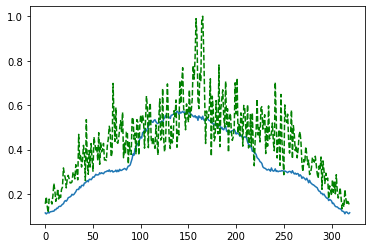

Time taken for epoch:  156.6724033355713
Epoch = [209/3000]  Iter = [   0/39480]  Loss = 0.1519 Avg Loss = 0.1519  Time = 0.0655s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [209/3000]  Iter = [ 100/39480]  Loss = 0.1396 Avg Loss = 0.1434  Time = 0.0035s
Epoch = [209/3000]  Iter = [ 200/39480]  Loss = 0.1396 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [209/3000]  Iter = [ 300/39480]  Loss = 0.1341 Avg Loss = 0.1427  Time = 0.0037s
Epoch = [209/3000]  Iter = [ 400/39480]  Loss = 0.1538 Avg Loss = 0.1411  Time = 0.0038s
Epoch = [209/3000]  Iter = [ 500/39480]  Loss = 0.1876 Avg Loss = 0.141  Time = 0.0038s
Epoch = [209/3000]  Iter = [ 600/39480]  Loss = 0.1252 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [209/3000]  Iter = [ 700/39480]  Loss = 0.169 Avg Loss = 0.1414  Time = 0.0035s
Epoch = [209/3000]  Iter = [ 800/39480]  Loss = 0.1437 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [209/3000]  Iter = [ 900/39480]  Loss = 0.1269 Avg Loss = 0.1421  Time = 0.0033s
Epoch = [209/3000]  Iter = [1000/39480]  Loss = 0.1557 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [209/3000]  Iter = [1100/39480]  Loss = 0.1186 Avg Loss = 0.1409  Time = 0.0037s
Epoch = [209/3000]  Ite

Epoch = [209/3000]  Iter = [9400/39480]  Loss = 0.1372 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [209/3000]  Iter = [9500/39480]  Loss = 0.1419 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [209/3000]  Iter = [9600/39480]  Loss = 0.158 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [209/3000]  Iter = [9700/39480]  Loss = 0.1389 Avg Loss = 0.1413  Time = 0.0034s
Epoch = [209/3000]  Iter = [9800/39480]  Loss = 0.1474 Avg Loss = 0.1413  Time = 0.0030s
Epoch = [209/3000]  Iter = [9900/39480]  Loss = 0.1736 Avg Loss = 0.1421  Time = 0.0029s
Epoch = [209/3000]  Iter = [10000/39480]  Loss = 0.1212 Avg Loss = 0.1418  Time = 0.0031s
Epoch = [209/3000]  Iter = [10100/39480]  Loss = 0.1374 Avg Loss = 0.1423  Time = 0.0031s
Epoch = [209/3000]  Iter = [10200/39480]  Loss = 0.139 Avg Loss = 0.1423  Time = 0.0031s
Epoch = [209/3000]  Iter = [10300/39480]  Loss = 0.1469 Avg Loss = 0.1433  Time = 0.0030s
Epoch = [209/3000]  Iter = [10400/39480]  Loss = 0.1342 Avg Loss = 0.142  Time = 0.0030s
Epoch = [209/3000] 

Epoch = [209/3000]  Iter = [18600/39480]  Loss = 0.1602 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [209/3000]  Iter = [18700/39480]  Loss = 0.1451 Avg Loss = 0.1413  Time = 0.0037s
Epoch = [209/3000]  Iter = [18800/39480]  Loss = 0.1379 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [209/3000]  Iter = [18900/39480]  Loss = 0.1352 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [209/3000]  Iter = [19000/39480]  Loss = 0.1289 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [209/3000]  Iter = [19100/39480]  Loss = 0.1427 Avg Loss = 0.142  Time = 0.0037s
Epoch = [209/3000]  Iter = [19200/39480]  Loss = 0.1398 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [209/3000]  Iter = [19300/39480]  Loss = 0.1609 Avg Loss = 0.1442  Time = 0.0037s
Epoch = [209/3000]  Iter = [19400/39480]  Loss = 0.1364 Avg Loss = 0.1441  Time = 0.0035s
Epoch = [209/3000]  Iter = [19500/39480]  Loss = 0.1351 Avg Loss = 0.1441  Time = 0.0037s
Epoch = [209/3000]  Iter = [19600/39480]  Loss = 0.151 Avg Loss = 0.1425  Time = 0.0037s
Epoch = [209

Epoch = [209/3000]  Iter = [27800/39480]  Loss = 0.1174 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [209/3000]  Iter = [27900/39480]  Loss = 0.1396 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [209/3000]  Iter = [28000/39480]  Loss = 0.1245 Avg Loss = 0.1413  Time = 0.0034s
Epoch = [209/3000]  Iter = [28100/39480]  Loss = 0.139 Avg Loss = 0.1412  Time = 0.0035s
Epoch = [209/3000]  Iter = [28200/39480]  Loss = 0.1518 Avg Loss = 0.1405  Time = 0.0037s
Epoch = [209/3000]  Iter = [28300/39480]  Loss = 0.1399 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [209/3000]  Iter = [28400/39480]  Loss = 0.1398 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [209/3000]  Iter = [28500/39480]  Loss = 0.143 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [209/3000]  Iter = [28600/39480]  Loss = 0.1407 Avg Loss = 0.1434  Time = 0.0037s
Epoch = [209/3000]  Iter = [28700/39480]  Loss = 0.1494 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [209/3000]  Iter = [28800/39480]  Loss = 0.1494 Avg Loss = 0.1434  Time = 0.0034s
Epoch = [209

Epoch = [209/3000]  Iter = [37000/39480]  Loss = 0.1496 Avg Loss = 0.144  Time = 0.0036s
Epoch = [209/3000]  Iter = [37100/39480]  Loss = 0.152 Avg Loss = 0.1429  Time = 0.0037s
Epoch = [209/3000]  Iter = [37200/39480]  Loss = 0.1459 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [209/3000]  Iter = [37300/39480]  Loss = 0.1592 Avg Loss = 0.1415  Time = 0.0037s
Epoch = [209/3000]  Iter = [37400/39480]  Loss = 0.1512 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [209/3000]  Iter = [37500/39480]  Loss = 0.1385 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [209/3000]  Iter = [37600/39480]  Loss = 0.1572 Avg Loss = 0.142  Time = 0.0037s
Epoch = [209/3000]  Iter = [37700/39480]  Loss = 0.1335 Avg Loss = 0.1418  Time = 0.0034s
Epoch = [209/3000]  Iter = [37800/39480]  Loss = 0.1506 Avg Loss = 0.1427  Time = 0.0037s
Epoch = [209/3000]  Iter = [37900/39480]  Loss = 0.146 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [209/3000]  Iter = [38000/39480]  Loss = 0.121 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [209/30

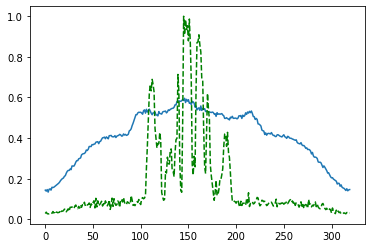

Time taken for epoch:  157.88333082199097
Epoch = [210/3000]  Iter = [   0/39480]  Loss = 0.1487 Avg Loss = 0.1487  Time = 0.0652s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [210/3000]  Iter = [ 100/39480]  Loss = 0.1132 Avg Loss = 0.1437  Time = 0.0035s
Epoch = [210/3000]  Iter = [ 200/39480]  Loss = 0.1534 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [210/3000]  Iter = [ 300/39480]  Loss = 0.1372 Avg Loss = 0.1411  Time = 0.0035s
Epoch = [210/3000]  Iter = [ 400/39480]  Loss = 0.1467 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [210/3000]  Iter = [ 500/39480]  Loss = 0.129 Avg Loss = 0.1407  Time = 0.0035s
Epoch = [210/3000]  Iter = [ 600/39480]  Loss = 0.1514 Avg Loss = 0.1407  Time = 0.0034s
Epoch = [210/3000]  Iter = [ 700/39480]  Loss = 0.1319 Avg Loss = 0.1411  Time = 0.0034s
Epoch = [210/3000]  Iter = [ 800/39480]  Loss = 0.1202 Avg Loss = 0.1422  Time = 0.0028s
Epoch = [210/3000]  Iter = [ 900/39480]  Loss = 0.1238 Avg Loss = 0.1412  Time = 0.0031s
Epoch = [210/3000]  Iter = [1000/39480]  Loss = 0.1417 Avg Loss = 0.1395  Time = 0.0032s
Epoch = [210/3000]  Iter = [1100/39480]  Loss = 0.1469 Avg Loss = 0.1391  Time = 0.0034s
Epoch = [210/3000]  It

Epoch = [210/3000]  Iter = [9400/39480]  Loss = 0.1465 Avg Loss = 0.1423  Time = 0.0034s
Epoch = [210/3000]  Iter = [9500/39480]  Loss = 0.1699 Avg Loss = 0.1422  Time = 0.0033s
Epoch = [210/3000]  Iter = [9600/39480]  Loss = 0.1372 Avg Loss = 0.1435  Time = 0.0036s
Epoch = [210/3000]  Iter = [9700/39480]  Loss = 0.1326 Avg Loss = 0.1415  Time = 0.0035s
Epoch = [210/3000]  Iter = [9800/39480]  Loss = 0.1186 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [210/3000]  Iter = [9900/39480]  Loss = 0.119 Avg Loss = 0.1419  Time = 0.0041s
Epoch = [210/3000]  Iter = [10000/39480]  Loss = 0.1479 Avg Loss = 0.141  Time = 0.0041s
Epoch = [210/3000]  Iter = [10100/39480]  Loss = 0.1353 Avg Loss = 0.1425  Time = 0.0040s
Epoch = [210/3000]  Iter = [10200/39480]  Loss = 0.1359 Avg Loss = 0.1427  Time = 0.0036s
Epoch = [210/3000]  Iter = [10300/39480]  Loss = 0.1613 Avg Loss = 0.1434  Time = 0.0035s
Epoch = [210/3000]  Iter = [10400/39480]  Loss = 0.12 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [210/3000]  

Epoch = [210/3000]  Iter = [18600/39480]  Loss = 0.1584 Avg Loss = 0.1428  Time = 0.0033s
Epoch = [210/3000]  Iter = [18700/39480]  Loss = 0.132 Avg Loss = 0.1429  Time = 0.0033s
Epoch = [210/3000]  Iter = [18800/39480]  Loss = 0.1418 Avg Loss = 0.1421  Time = 0.0032s
Epoch = [210/3000]  Iter = [18900/39480]  Loss = 0.1272 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [210/3000]  Iter = [19000/39480]  Loss = 0.147 Avg Loss = 0.1414  Time = 0.0035s
Epoch = [210/3000]  Iter = [19100/39480]  Loss = 0.1475 Avg Loss = 0.1424  Time = 0.0032s
Epoch = [210/3000]  Iter = [19200/39480]  Loss = 0.1246 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [210/3000]  Iter = [19300/39480]  Loss = 0.1405 Avg Loss = 0.1437  Time = 0.0034s
Epoch = [210/3000]  Iter = [19400/39480]  Loss = 0.1541 Avg Loss = 0.1443  Time = 0.0035s
Epoch = [210/3000]  Iter = [19500/39480]  Loss = 0.1473 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [210/3000]  Iter = [19600/39480]  Loss = 0.1421 Avg Loss = 0.1417  Time = 0.0035s
Epoch = [210

Epoch = [210/3000]  Iter = [27800/39480]  Loss = 0.1385 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [210/3000]  Iter = [27900/39480]  Loss = 0.1471 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [210/3000]  Iter = [28000/39480]  Loss = 0.1311 Avg Loss = 0.1419  Time = 0.0035s
Epoch = [210/3000]  Iter = [28100/39480]  Loss = 0.125 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [210/3000]  Iter = [28200/39480]  Loss = 0.1601 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [210/3000]  Iter = [28300/39480]  Loss = 0.1274 Avg Loss = 0.1428  Time = 0.0037s
Epoch = [210/3000]  Iter = [28400/39480]  Loss = 0.1479 Avg Loss = 0.1426  Time = 0.0035s
Epoch = [210/3000]  Iter = [28500/39480]  Loss = 0.155 Avg Loss = 0.144  Time = 0.0035s
Epoch = [210/3000]  Iter = [28600/39480]  Loss = 0.1606 Avg Loss = 0.1436  Time = 0.0036s
Epoch = [210/3000]  Iter = [28700/39480]  Loss = 0.1503 Avg Loss = 0.1447  Time = 0.0036s
Epoch = [210/3000]  Iter = [28800/39480]  Loss = 0.1562 Avg Loss = 0.1434  Time = 0.0036s
Epoch = [210/

Epoch = [210/3000]  Iter = [37000/39480]  Loss = 0.1438 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [210/3000]  Iter = [37100/39480]  Loss = 0.1411 Avg Loss = 0.1415  Time = 0.0033s
Epoch = [210/3000]  Iter = [37200/39480]  Loss = 0.1368 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [210/3000]  Iter = [37300/39480]  Loss = 0.1439 Avg Loss = 0.1412  Time = 0.0035s
Epoch = [210/3000]  Iter = [37400/39480]  Loss = 0.1469 Avg Loss = 0.1427  Time = 0.0035s
Epoch = [210/3000]  Iter = [37500/39480]  Loss = 0.1639 Avg Loss = 0.1436  Time = 0.0035s
Epoch = [210/3000]  Iter = [37600/39480]  Loss = 0.1515 Avg Loss = 0.1423  Time = 0.0034s
Epoch = [210/3000]  Iter = [37700/39480]  Loss = 0.1405 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [210/3000]  Iter = [37800/39480]  Loss = 0.1618 Avg Loss = 0.1432  Time = 0.0035s
Epoch = [210/3000]  Iter = [37900/39480]  Loss = 0.1461 Avg Loss = 0.1432  Time = 0.0036s
Epoch = [210/3000]  Iter = [38000/39480]  Loss = 0.1633 Avg Loss = 0.1421  Time = 0.0035s
Epoch = [2

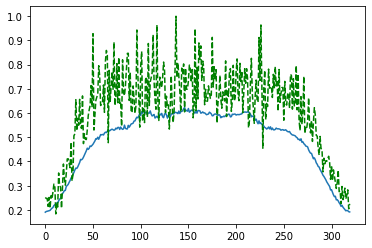

Time taken for epoch:  158.65772247314453
Epoch = [211/3000]  Iter = [   0/39480]  Loss = 0.1385 Avg Loss = 0.1385  Time = 0.0774s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [211/3000]  Iter = [ 100/39480]  Loss = 0.1393 Avg Loss = 0.1393  Time = 0.0042s
Epoch = [211/3000]  Iter = [ 200/39480]  Loss = 0.1275 Avg Loss = 0.1399  Time = 0.0035s
Epoch = [211/3000]  Iter = [ 300/39480]  Loss = 0.1263 Avg Loss = 0.1402  Time = 0.0037s
Epoch = [211/3000]  Iter = [ 400/39480]  Loss = 0.1334 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [211/3000]  Iter = [ 500/39480]  Loss = 0.1429 Avg Loss = 0.1412  Time = 0.0055s
Epoch = [211/3000]  Iter = [ 600/39480]  Loss = 0.1438 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [211/3000]  Iter = [ 700/39480]  Loss = 0.1485 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [211/3000]  Iter = [ 800/39480]  Loss = 0.1333 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [211/3000]  Iter = [ 900/39480]  Loss = 0.1319 Avg Loss = 0.1411  Time = 0.0038s
Epoch = [211/3000]  Iter = [1000/39480]  Loss = 0.126 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [211/3000]  Iter = [1100/39480]  Loss = 0.1299 Avg Loss = 0.1412  Time = 0.0038s
Epoch = [211/3000]  It

Epoch = [211/3000]  Iter = [9400/39480]  Loss = 0.1166 Avg Loss = 0.1399  Time = 0.0037s
Epoch = [211/3000]  Iter = [9500/39480]  Loss = 0.1456 Avg Loss = 0.1414  Time = 0.0038s
Epoch = [211/3000]  Iter = [9600/39480]  Loss = 0.1162 Avg Loss = 0.1427  Time = 0.0037s
Epoch = [211/3000]  Iter = [9700/39480]  Loss = 0.1324 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [211/3000]  Iter = [9800/39480]  Loss = 0.1655 Avg Loss = 0.1422  Time = 0.0037s
Epoch = [211/3000]  Iter = [9900/39480]  Loss = 0.1537 Avg Loss = 0.142  Time = 0.0033s
Epoch = [211/3000]  Iter = [10000/39480]  Loss = 0.1355 Avg Loss = 0.1412  Time = 0.0035s
Epoch = [211/3000]  Iter = [10100/39480]  Loss = 0.1337 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [211/3000]  Iter = [10200/39480]  Loss = 0.1451 Avg Loss = 0.1409  Time = 0.0037s
Epoch = [211/3000]  Iter = [10300/39480]  Loss = 0.1355 Avg Loss = 0.141  Time = 0.0038s
Epoch = [211/3000]  Iter = [10400/39480]  Loss = 0.1545 Avg Loss = 0.1415  Time = 0.0033s
Epoch = [211/3000]

Epoch = [211/3000]  Iter = [18600/39480]  Loss = 0.1522 Avg Loss = 0.143  Time = 0.0037s
Epoch = [211/3000]  Iter = [18700/39480]  Loss = 0.1666 Avg Loss = 0.1433  Time = 0.0036s
Epoch = [211/3000]  Iter = [18800/39480]  Loss = 0.1338 Avg Loss = 0.1417  Time = 0.0032s
Epoch = [211/3000]  Iter = [18900/39480]  Loss = 0.1383 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [211/3000]  Iter = [19000/39480]  Loss = 0.1419 Avg Loss = 0.1421  Time = 0.0037s
Epoch = [211/3000]  Iter = [19100/39480]  Loss = 0.1447 Avg Loss = 0.1425  Time = 0.0034s
Epoch = [211/3000]  Iter = [19200/39480]  Loss = 0.1441 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [211/3000]  Iter = [19300/39480]  Loss = 0.159 Avg Loss = 0.1413  Time = 0.0037s
Epoch = [211/3000]  Iter = [19400/39480]  Loss = 0.1401 Avg Loss = 0.1417  Time = 0.0032s
Epoch = [211/3000]  Iter = [19500/39480]  Loss = 0.1266 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [211/3000]  Iter = [19600/39480]  Loss = 0.1433 Avg Loss = 0.1405  Time = 0.0035s
Epoch = [211

Epoch = [211/3000]  Iter = [27800/39480]  Loss = 0.1588 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [211/3000]  Iter = [27900/39480]  Loss = 0.1517 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [211/3000]  Iter = [28000/39480]  Loss = 0.127 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [211/3000]  Iter = [28100/39480]  Loss = 0.1357 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [211/3000]  Iter = [28200/39480]  Loss = 0.1397 Avg Loss = 0.1427  Time = 0.0032s
Epoch = [211/3000]  Iter = [28300/39480]  Loss = 0.1375 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [211/3000]  Iter = [28400/39480]  Loss = 0.1438 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [211/3000]  Iter = [28500/39480]  Loss = 0.1176 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [211/3000]  Iter = [28600/39480]  Loss = 0.1644 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [211/3000]  Iter = [28700/39480]  Loss = 0.1409 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [211/3000]  Iter = [28800/39480]  Loss = 0.1513 Avg Loss = 0.142  Time = 0.0034s
Epoch = [211

Epoch = [211/3000]  Iter = [37000/39480]  Loss = 0.1718 Avg Loss = 0.141  Time = 0.0038s
Epoch = [211/3000]  Iter = [37100/39480]  Loss = 0.1419 Avg Loss = 0.1423  Time = 0.0040s
Epoch = [211/3000]  Iter = [37200/39480]  Loss = 0.1488 Avg Loss = 0.1418  Time = 0.0038s
Epoch = [211/3000]  Iter = [37300/39480]  Loss = 0.1481 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [211/3000]  Iter = [37400/39480]  Loss = 0.1437 Avg Loss = 0.1419  Time = 0.0034s
Epoch = [211/3000]  Iter = [37500/39480]  Loss = 0.1473 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [211/3000]  Iter = [37600/39480]  Loss = 0.1559 Avg Loss = 0.1438  Time = 0.0036s
Epoch = [211/3000]  Iter = [37700/39480]  Loss = 0.1389 Avg Loss = 0.1431  Time = 0.0036s
Epoch = [211/3000]  Iter = [37800/39480]  Loss = 0.127 Avg Loss = 0.1434  Time = 0.0036s
Epoch = [211/3000]  Iter = [37900/39480]  Loss = 0.1584 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [211/3000]  Iter = [38000/39480]  Loss = 0.1498 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [211

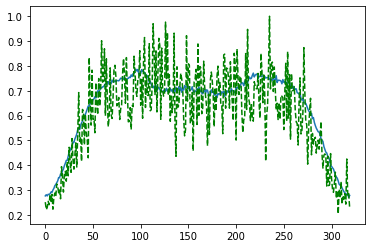

Time taken for epoch:  159.76538753509521
Epoch = [212/3000]  Iter = [   0/39480]  Loss = 0.1555 Avg Loss = 0.1555  Time = 0.0664s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [212/3000]  Iter = [ 100/39480]  Loss = 0.1463 Avg Loss = 0.1442  Time = 0.0038s
Epoch = [212/3000]  Iter = [ 200/39480]  Loss = 0.1384 Avg Loss = 0.1413  Time = 0.0037s
Epoch = [212/3000]  Iter = [ 300/39480]  Loss = 0.1546 Avg Loss = 0.1413  Time = 0.0037s
Epoch = [212/3000]  Iter = [ 400/39480]  Loss = 0.1207 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [212/3000]  Iter = [ 500/39480]  Loss = 0.1427 Avg Loss = 0.1422  Time = 0.0037s
Epoch = [212/3000]  Iter = [ 600/39480]  Loss = 0.1729 Avg Loss = 0.1427  Time = 0.0037s
Epoch = [212/3000]  Iter = [ 700/39480]  Loss = 0.1528 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [212/3000]  Iter = [ 800/39480]  Loss = 0.1427 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [212/3000]  Iter = [ 900/39480]  Loss = 0.1382 Avg Loss = 0.1434  Time = 0.0034s
Epoch = [212/3000]  Iter = [1000/39480]  Loss = 0.131 Avg Loss = 0.142  Time = 0.0037s
Epoch = [212/3000]  Iter = [1100/39480]  Loss = 0.1287 Avg Loss = 0.1411  Time = 0.0037s
Epoch = [212/3000]  Ite

Epoch = [212/3000]  Iter = [9400/39480]  Loss = 0.1437 Avg Loss = 0.1416  Time = 0.0034s
Epoch = [212/3000]  Iter = [9500/39480]  Loss = 0.1388 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [212/3000]  Iter = [9600/39480]  Loss = 0.1492 Avg Loss = 0.1428  Time = 0.0034s
Epoch = [212/3000]  Iter = [9700/39480]  Loss = 0.1353 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [212/3000]  Iter = [9800/39480]  Loss = 0.1401 Avg Loss = 0.1419  Time = 0.0035s
Epoch = [212/3000]  Iter = [9900/39480]  Loss = 0.1382 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [212/3000]  Iter = [10000/39480]  Loss = 0.1395 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [212/3000]  Iter = [10100/39480]  Loss = 0.1476 Avg Loss = 0.1397  Time = 0.0036s
Epoch = [212/3000]  Iter = [10200/39480]  Loss = 0.1094 Avg Loss = 0.1393  Time = 0.0032s
Epoch = [212/3000]  Iter = [10300/39480]  Loss = 0.1417 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [212/3000]  Iter = [10400/39480]  Loss = 0.1464 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [212/300

Epoch = [212/3000]  Iter = [18600/39480]  Loss = 0.1395 Avg Loss = 0.1423  Time = 0.0035s
Epoch = [212/3000]  Iter = [18700/39480]  Loss = 0.1274 Avg Loss = 0.1417  Time = 0.0035s
Epoch = [212/3000]  Iter = [18800/39480]  Loss = 0.1323 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [212/3000]  Iter = [18900/39480]  Loss = 0.1078 Avg Loss = 0.1415  Time = 0.0037s
Epoch = [212/3000]  Iter = [19000/39480]  Loss = 0.1552 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [212/3000]  Iter = [19100/39480]  Loss = 0.1311 Avg Loss = 0.1435  Time = 0.0033s
Epoch = [212/3000]  Iter = [19200/39480]  Loss = 0.1221 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [212/3000]  Iter = [19300/39480]  Loss = 0.1356 Avg Loss = 0.1435  Time = 0.0036s
Epoch = [212/3000]  Iter = [19400/39480]  Loss = 0.157 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [212/3000]  Iter = [19500/39480]  Loss = 0.1486 Avg Loss = 0.1413  Time = 0.0035s
Epoch = [212/3000]  Iter = [19600/39480]  Loss = 0.1425 Avg Loss = 0.1418  Time = 0.0032s
Epoch = [21

Epoch = [212/3000]  Iter = [27800/39480]  Loss = 0.1492 Avg Loss = 0.1417  Time = 0.0035s
Epoch = [212/3000]  Iter = [27900/39480]  Loss = 0.147 Avg Loss = 0.1417  Time = 0.0034s
Epoch = [212/3000]  Iter = [28000/39480]  Loss = 0.141 Avg Loss = 0.1421  Time = 0.0035s
Epoch = [212/3000]  Iter = [28100/39480]  Loss = 0.1444 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [212/3000]  Iter = [28200/39480]  Loss = 0.1479 Avg Loss = 0.1422  Time = 0.0035s
Epoch = [212/3000]  Iter = [28300/39480]  Loss = 0.1454 Avg Loss = 0.1428  Time = 0.0032s
Epoch = [212/3000]  Iter = [28400/39480]  Loss = 0.1309 Avg Loss = 0.1408  Time = 0.0032s
Epoch = [212/3000]  Iter = [28500/39480]  Loss = 0.1768 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [212/3000]  Iter = [28600/39480]  Loss = 0.1411 Avg Loss = 0.142  Time = 0.0036s
Epoch = [212/3000]  Iter = [28700/39480]  Loss = 0.1525 Avg Loss = 0.1418  Time = 0.0031s
Epoch = [212/3000]  Iter = [28800/39480]  Loss = 0.1383 Avg Loss = 0.1417  Time = 0.0035s
Epoch = [212/

Epoch = [212/3000]  Iter = [37000/39480]  Loss = 0.1401 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [212/3000]  Iter = [37100/39480]  Loss = 0.1359 Avg Loss = 0.142  Time = 0.0034s
Epoch = [212/3000]  Iter = [37200/39480]  Loss = 0.1244 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [212/3000]  Iter = [37300/39480]  Loss = 0.1275 Avg Loss = 0.1422  Time = 0.0033s
Epoch = [212/3000]  Iter = [37400/39480]  Loss = 0.1571 Avg Loss = 0.1415  Time = 0.0034s
Epoch = [212/3000]  Iter = [37500/39480]  Loss = 0.1575 Avg Loss = 0.1423  Time = 0.0037s
Epoch = [212/3000]  Iter = [37600/39480]  Loss = 0.1513 Avg Loss = 0.1433  Time = 0.0036s
Epoch = [212/3000]  Iter = [37700/39480]  Loss = 0.1399 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [212/3000]  Iter = [37800/39480]  Loss = 0.1394 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [212/3000]  Iter = [37900/39480]  Loss = 0.1452 Avg Loss = 0.143  Time = 0.0037s
Epoch = [212/3000]  Iter = [38000/39480]  Loss = 0.137 Avg Loss = 0.1425  Time = 0.0032s
Epoch = [212/

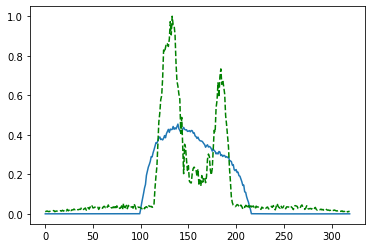

Time taken for epoch:  158.65754652023315
Epoch = [213/3000]  Iter = [   0/39480]  Loss = 0.1399 Avg Loss = 0.1399  Time = 0.0647s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [213/3000]  Iter = [ 100/39480]  Loss = 0.1563 Avg Loss = 0.1405  Time = 0.0035s
Epoch = [213/3000]  Iter = [ 200/39480]  Loss = 0.1318 Avg Loss = 0.1409  Time = 0.0035s
Epoch = [213/3000]  Iter = [ 300/39480]  Loss = 0.1432 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [213/3000]  Iter = [ 400/39480]  Loss = 0.1505 Avg Loss = 0.1421  Time = 0.0038s
Epoch = [213/3000]  Iter = [ 500/39480]  Loss = 0.1559 Avg Loss = 0.141  Time = 0.0037s
Epoch = [213/3000]  Iter = [ 600/39480]  Loss = 0.1532 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [213/3000]  Iter = [ 700/39480]  Loss = 0.1391 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [213/3000]  Iter = [ 800/39480]  Loss = 0.145 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [213/3000]  Iter = [ 900/39480]  Loss = 0.1463 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [213/3000]  Iter = [1000/39480]  Loss = 0.1396 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [213/3000]  Iter = [1100/39480]  Loss = 0.142 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [213/3000]  Iter

Epoch = [213/3000]  Iter = [9400/39480]  Loss = 0.159 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [213/3000]  Iter = [9500/39480]  Loss = 0.1428 Avg Loss = 0.1418  Time = 0.0035s
Epoch = [213/3000]  Iter = [9600/39480]  Loss = 0.1316 Avg Loss = 0.1409  Time = 0.0035s
Epoch = [213/3000]  Iter = [9700/39480]  Loss = 0.1347 Avg Loss = 0.1424  Time = 0.0034s
Epoch = [213/3000]  Iter = [9800/39480]  Loss = 0.1341 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [213/3000]  Iter = [9900/39480]  Loss = 0.1516 Avg Loss = 0.1428  Time = 0.0036s
Epoch = [213/3000]  Iter = [10000/39480]  Loss = 0.1443 Avg Loss = 0.1413  Time = 0.0035s
Epoch = [213/3000]  Iter = [10100/39480]  Loss = 0.1444 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [213/3000]  Iter = [10200/39480]  Loss = 0.1366 Avg Loss = 0.1427  Time = 0.0037s
Epoch = [213/3000]  Iter = [10300/39480]  Loss = 0.1473 Avg Loss = 0.1427  Time = 0.0036s
Epoch = [213/3000]  Iter = [10400/39480]  Loss = 0.1425 Avg Loss = 0.1427  Time = 0.0036s
Epoch = [213/3000

Epoch = [213/3000]  Iter = [18600/39480]  Loss = 0.1389 Avg Loss = 0.1415  Time = 0.0033s
Epoch = [213/3000]  Iter = [18700/39480]  Loss = 0.1307 Avg Loss = 0.1399  Time = 0.0036s
Epoch = [213/3000]  Iter = [18800/39480]  Loss = 0.16 Avg Loss = 0.1415  Time = 0.0034s
Epoch = [213/3000]  Iter = [18900/39480]  Loss = 0.1427 Avg Loss = 0.1414  Time = 0.0032s
Epoch = [213/3000]  Iter = [19000/39480]  Loss = 0.1376 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [213/3000]  Iter = [19100/39480]  Loss = 0.1561 Avg Loss = 0.1418  Time = 0.0034s
Epoch = [213/3000]  Iter = [19200/39480]  Loss = 0.1187 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [213/3000]  Iter = [19300/39480]  Loss = 0.1547 Avg Loss = 0.1419  Time = 0.0032s
Epoch = [213/3000]  Iter = [19400/39480]  Loss = 0.1794 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [213/3000]  Iter = [19500/39480]  Loss = 0.1469 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [213/3000]  Iter = [19600/39480]  Loss = 0.1439 Avg Loss = 0.1413  Time = 0.0034s
Epoch = [213

Epoch = [213/3000]  Iter = [27800/39480]  Loss = 0.1458 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [213/3000]  Iter = [27900/39480]  Loss = 0.1527 Avg Loss = 0.1431  Time = 0.0036s
Epoch = [213/3000]  Iter = [28000/39480]  Loss = 0.1443 Avg Loss = 0.1415  Time = 0.0034s
Epoch = [213/3000]  Iter = [28100/39480]  Loss = 0.1544 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [213/3000]  Iter = [28200/39480]  Loss = 0.1335 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [213/3000]  Iter = [28300/39480]  Loss = 0.1519 Avg Loss = 0.1413  Time = 0.0032s
Epoch = [213/3000]  Iter = [28400/39480]  Loss = 0.15 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [213/3000]  Iter = [28500/39480]  Loss = 0.1246 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [213/3000]  Iter = [28600/39480]  Loss = 0.1214 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [213/3000]  Iter = [28700/39480]  Loss = 0.1399 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [213/3000]  Iter = [28800/39480]  Loss = 0.1341 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [213

Epoch = [213/3000]  Iter = [37000/39480]  Loss = 0.159 Avg Loss = 0.1445  Time = 0.0034s
Epoch = [213/3000]  Iter = [37100/39480]  Loss = 0.1588 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [213/3000]  Iter = [37200/39480]  Loss = 0.1341 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [213/3000]  Iter = [37300/39480]  Loss = 0.1705 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [213/3000]  Iter = [37400/39480]  Loss = 0.1461 Avg Loss = 0.1426  Time = 0.0035s
Epoch = [213/3000]  Iter = [37500/39480]  Loss = 0.1469 Avg Loss = 0.1427  Time = 0.0036s
Epoch = [213/3000]  Iter = [37600/39480]  Loss = 0.1358 Avg Loss = 0.1424  Time = 0.0034s
Epoch = [213/3000]  Iter = [37700/39480]  Loss = 0.1316 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [213/3000]  Iter = [37800/39480]  Loss = 0.1345 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [213/3000]  Iter = [37900/39480]  Loss = 0.1451 Avg Loss = 0.1441  Time = 0.0035s
Epoch = [213/3000]  Iter = [38000/39480]  Loss = 0.1708 Avg Loss = 0.1428  Time = 0.0036s
Epoch = [21

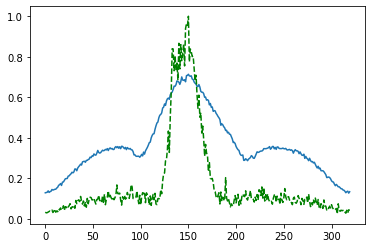

Time taken for epoch:  155.78237748146057
Epoch = [214/3000]  Iter = [   0/39480]  Loss = 0.1387 Avg Loss = 0.1387  Time = 0.0670s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [214/3000]  Iter = [ 100/39480]  Loss = 0.1252 Avg Loss = 0.1394  Time = 0.0037s
Epoch = [214/3000]  Iter = [ 200/39480]  Loss = 0.1475 Avg Loss = 0.1401  Time = 0.0034s
Epoch = [214/3000]  Iter = [ 300/39480]  Loss = 0.1529 Avg Loss = 0.1406  Time = 0.0038s
Epoch = [214/3000]  Iter = [ 400/39480]  Loss = 0.1537 Avg Loss = 0.1406  Time = 0.0035s
Epoch = [214/3000]  Iter = [ 500/39480]  Loss = 0.1432 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [214/3000]  Iter = [ 600/39480]  Loss = 0.1258 Avg Loss = 0.1415  Time = 0.0033s
Epoch = [214/3000]  Iter = [ 700/39480]  Loss = 0.1304 Avg Loss = 0.1431  Time = 0.0032s
Epoch = [214/3000]  Iter = [ 800/39480]  Loss = 0.1649 Avg Loss = 0.1407  Time = 0.0037s
Epoch = [214/3000]  Iter = [ 900/39480]  Loss = 0.1673 Avg Loss = 0.1413  Time = 0.0037s
Epoch = [214/3000]  Iter = [1000/39480]  Loss = 0.1573 Avg Loss = 0.1407  Time = 0.0037s
Epoch = [214/3000]  Iter = [1100/39480]  Loss = 0.1341 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [214/3000]  I

Epoch = [214/3000]  Iter = [9400/39480]  Loss = 0.1156 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [214/3000]  Iter = [9500/39480]  Loss = 0.1278 Avg Loss = 0.141  Time = 0.0035s
Epoch = [214/3000]  Iter = [9600/39480]  Loss = 0.1388 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [214/3000]  Iter = [9700/39480]  Loss = 0.1336 Avg Loss = 0.1399  Time = 0.0033s
Epoch = [214/3000]  Iter = [9800/39480]  Loss = 0.1316 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [214/3000]  Iter = [9900/39480]  Loss = 0.168 Avg Loss = 0.1408  Time = 0.0032s
Epoch = [214/3000]  Iter = [10000/39480]  Loss = 0.1276 Avg Loss = 0.1401  Time = 0.0033s
Epoch = [214/3000]  Iter = [10100/39480]  Loss = 0.1116 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [214/3000]  Iter = [10200/39480]  Loss = 0.1567 Avg Loss = 0.14  Time = 0.0035s
Epoch = [214/3000]  Iter = [10300/39480]  Loss = 0.1381 Avg Loss = 0.1427  Time = 0.0034s
Epoch = [214/3000]  Iter = [10400/39480]  Loss = 0.121 Avg Loss = 0.142  Time = 0.0037s
Epoch = [214/3000]  It

Epoch = [214/3000]  Iter = [18600/39480]  Loss = 0.1313 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [214/3000]  Iter = [18700/39480]  Loss = 0.1136 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [214/3000]  Iter = [18800/39480]  Loss = 0.1559 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [214/3000]  Iter = [18900/39480]  Loss = 0.1455 Avg Loss = 0.1427  Time = 0.0034s
Epoch = [214/3000]  Iter = [19000/39480]  Loss = 0.1293 Avg Loss = 0.1438  Time = 0.0036s
Epoch = [214/3000]  Iter = [19100/39480]  Loss = 0.1516 Avg Loss = 0.1423  Time = 0.0037s
Epoch = [214/3000]  Iter = [19200/39480]  Loss = 0.148 Avg Loss = 0.1425  Time = 0.0037s
Epoch = [214/3000]  Iter = [19300/39480]  Loss = 0.1037 Avg Loss = 0.1402  Time = 0.0038s
Epoch = [214/3000]  Iter = [19400/39480]  Loss = 0.1504 Avg Loss = 0.1411  Time = 0.0031s
Epoch = [214/3000]  Iter = [19500/39480]  Loss = 0.1379 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [214/3000]  Iter = [19600/39480]  Loss = 0.1567 Avg Loss = 0.141  Time = 0.0040s
Epoch = [214

Epoch = [214/3000]  Iter = [27800/39480]  Loss = 0.1188 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [214/3000]  Iter = [27900/39480]  Loss = 0.1659 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [214/3000]  Iter = [28000/39480]  Loss = 0.1357 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [214/3000]  Iter = [28100/39480]  Loss = 0.1448 Avg Loss = 0.1435  Time = 0.0033s
Epoch = [214/3000]  Iter = [28200/39480]  Loss = 0.159 Avg Loss = 0.1444  Time = 0.0036s
Epoch = [214/3000]  Iter = [28300/39480]  Loss = 0.141 Avg Loss = 0.1425  Time = 0.0037s
Epoch = [214/3000]  Iter = [28400/39480]  Loss = 0.1381 Avg Loss = 0.1411  Time = 0.0035s
Epoch = [214/3000]  Iter = [28500/39480]  Loss = 0.1415 Avg Loss = 0.142  Time = 0.0033s
Epoch = [214/3000]  Iter = [28600/39480]  Loss = 0.1363 Avg Loss = 0.1427  Time = 0.0038s
Epoch = [214/3000]  Iter = [28700/39480]  Loss = 0.1416 Avg Loss = 0.1423  Time = 0.0037s
Epoch = [214/3000]  Iter = [28800/39480]  Loss = 0.1411 Avg Loss = 0.141  Time = 0.0037s
Epoch = [214/3

Epoch = [214/3000]  Iter = [37000/39480]  Loss = 0.1618 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [214/3000]  Iter = [37100/39480]  Loss = 0.1348 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [214/3000]  Iter = [37200/39480]  Loss = 0.1408 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [214/3000]  Iter = [37300/39480]  Loss = 0.131 Avg Loss = 0.1423  Time = 0.0034s
Epoch = [214/3000]  Iter = [37400/39480]  Loss = 0.1683 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [214/3000]  Iter = [37500/39480]  Loss = 0.1295 Avg Loss = 0.1429  Time = 0.0035s
Epoch = [214/3000]  Iter = [37600/39480]  Loss = 0.1309 Avg Loss = 0.1415  Time = 0.0035s
Epoch = [214/3000]  Iter = [37700/39480]  Loss = 0.1395 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [214/3000]  Iter = [37800/39480]  Loss = 0.1322 Avg Loss = 0.1427  Time = 0.0034s
Epoch = [214/3000]  Iter = [37900/39480]  Loss = 0.128 Avg Loss = 0.1438  Time = 0.0037s
Epoch = [214/3000]  Iter = [38000/39480]  Loss = 0.149 Avg Loss = 0.1432  Time = 0.0037s
Epoch = [214/

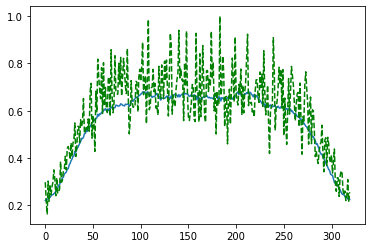

Time taken for epoch:  157.82080960273743
Epoch = [215/3000]  Iter = [   0/39480]  Loss = 0.1597 Avg Loss = 0.1597  Time = 0.0793s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [215/3000]  Iter = [ 100/39480]  Loss = 0.1427 Avg Loss = 0.1484  Time = 0.0037s
Epoch = [215/3000]  Iter = [ 200/39480]  Loss = 0.1274 Avg Loss = 0.1439  Time = 0.0037s
Epoch = [215/3000]  Iter = [ 300/39480]  Loss = 0.1273 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [215/3000]  Iter = [ 400/39480]  Loss = 0.1602 Avg Loss = 0.1404  Time = 0.0037s
Epoch = [215/3000]  Iter = [ 500/39480]  Loss = 0.1559 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [215/3000]  Iter = [ 600/39480]  Loss = 0.1323 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [215/3000]  Iter = [ 700/39480]  Loss = 0.1365 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [215/3000]  Iter = [ 800/39480]  Loss = 0.147 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [215/3000]  Iter = [ 900/39480]  Loss = 0.1499 Avg Loss = 0.1407  Time = 0.0037s
Epoch = [215/3000]  Iter = [1000/39480]  Loss = 0.1399 Avg Loss = 0.141  Time = 0.0036s
Epoch = [215/3000]  Iter = [1100/39480]  Loss = 0.1475 Avg Loss = 0.1409  Time = 0.0033s
Epoch = [215/3000]  Ite

Epoch = [215/3000]  Iter = [9400/39480]  Loss = 0.1635 Avg Loss = 0.1415  Time = 0.0035s
Epoch = [215/3000]  Iter = [9500/39480]  Loss = 0.1311 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [215/3000]  Iter = [9600/39480]  Loss = 0.1423 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [215/3000]  Iter = [9700/39480]  Loss = 0.1548 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [215/3000]  Iter = [9800/39480]  Loss = 0.1661 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [215/3000]  Iter = [9900/39480]  Loss = 0.1346 Avg Loss = 0.1417  Time = 0.0040s
Epoch = [215/3000]  Iter = [10000/39480]  Loss = 0.1447 Avg Loss = 0.1404  Time = 0.0040s
Epoch = [215/3000]  Iter = [10100/39480]  Loss = 0.1268 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [215/3000]  Iter = [10200/39480]  Loss = 0.1555 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [215/3000]  Iter = [10300/39480]  Loss = 0.1621 Avg Loss = 0.1417  Time = 0.0035s
Epoch = [215/3000]  Iter = [10400/39480]  Loss = 0.1651 Avg Loss = 0.1416  Time = 0.0038s
Epoch = [215/300

Epoch = [215/3000]  Iter = [18600/39480]  Loss = 0.1354 Avg Loss = 0.1422  Time = 0.0031s
Epoch = [215/3000]  Iter = [18700/39480]  Loss = 0.1518 Avg Loss = 0.1417  Time = 0.0034s
Epoch = [215/3000]  Iter = [18800/39480]  Loss = 0.138 Avg Loss = 0.1418  Time = 0.0033s
Epoch = [215/3000]  Iter = [18900/39480]  Loss = 0.1115 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [215/3000]  Iter = [19000/39480]  Loss = 0.1307 Avg Loss = 0.1407  Time = 0.0033s
Epoch = [215/3000]  Iter = [19100/39480]  Loss = 0.1477 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [215/3000]  Iter = [19200/39480]  Loss = 0.1287 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [215/3000]  Iter = [19300/39480]  Loss = 0.1709 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [215/3000]  Iter = [19400/39480]  Loss = 0.1524 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [215/3000]  Iter = [19500/39480]  Loss = 0.1348 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [215/3000]  Iter = [19600/39480]  Loss = 0.1258 Avg Loss = 0.1411  Time = 0.0033s
Epoch = [21

Epoch = [215/3000]  Iter = [27800/39480]  Loss = 0.147 Avg Loss = 0.1413  Time = 0.0037s
Epoch = [215/3000]  Iter = [27900/39480]  Loss = 0.1261 Avg Loss = 0.1417  Time = 0.0034s
Epoch = [215/3000]  Iter = [28000/39480]  Loss = 0.136 Avg Loss = 0.1421  Time = 0.0037s
Epoch = [215/3000]  Iter = [28100/39480]  Loss = 0.1321 Avg Loss = 0.1424  Time = 0.0035s
Epoch = [215/3000]  Iter = [28200/39480]  Loss = 0.1279 Avg Loss = 0.1431  Time = 0.0037s
Epoch = [215/3000]  Iter = [28300/39480]  Loss = 0.129 Avg Loss = 0.1422  Time = 0.0037s
Epoch = [215/3000]  Iter = [28400/39480]  Loss = 0.1508 Avg Loss = 0.1405  Time = 0.0037s
Epoch = [215/3000]  Iter = [28500/39480]  Loss = 0.1383 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [215/3000]  Iter = [28600/39480]  Loss = 0.1408 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [215/3000]  Iter = [28700/39480]  Loss = 0.1426 Avg Loss = 0.1424  Time = 0.0035s
Epoch = [215/3000]  Iter = [28800/39480]  Loss = 0.1466 Avg Loss = 0.143  Time = 0.0036s
Epoch = [215/3

Epoch = [215/3000]  Iter = [37000/39480]  Loss = 0.127 Avg Loss = 0.1407  Time = 0.0037s
Epoch = [215/3000]  Iter = [37100/39480]  Loss = 0.1327 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [215/3000]  Iter = [37200/39480]  Loss = 0.1373 Avg Loss = 0.1421  Time = 0.0032s
Epoch = [215/3000]  Iter = [37300/39480]  Loss = 0.1483 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [215/3000]  Iter = [37400/39480]  Loss = 0.111 Avg Loss = 0.1418  Time = 0.0035s
Epoch = [215/3000]  Iter = [37500/39480]  Loss = 0.1527 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [215/3000]  Iter = [37600/39480]  Loss = 0.1494 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [215/3000]  Iter = [37700/39480]  Loss = 0.1553 Avg Loss = 0.1416  Time = 0.0035s
Epoch = [215/3000]  Iter = [37800/39480]  Loss = 0.1698 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [215/3000]  Iter = [37900/39480]  Loss = 0.1615 Avg Loss = 0.1421  Time = 0.0035s
Epoch = [215/3000]  Iter = [38000/39480]  Loss = 0.1568 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [215

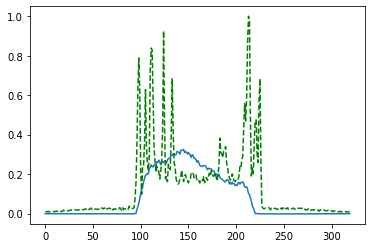

Time taken for epoch:  157.89985394477844
Epoch = [216/3000]  Iter = [   0/39480]  Loss = 0.1473 Avg Loss = 0.1473  Time = 0.0770s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [216/3000]  Iter = [ 100/39480]  Loss = 0.1333 Avg Loss = 0.1425  Time = 0.0033s
Epoch = [216/3000]  Iter = [ 200/39480]  Loss = 0.1641 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [216/3000]  Iter = [ 300/39480]  Loss = 0.1312 Avg Loss = 0.1391  Time = 0.0036s
Epoch = [216/3000]  Iter = [ 400/39480]  Loss = 0.1169 Avg Loss = 0.1409  Time = 0.0035s
Epoch = [216/3000]  Iter = [ 500/39480]  Loss = 0.1256 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [216/3000]  Iter = [ 600/39480]  Loss = 0.122 Avg Loss = 0.141  Time = 0.0036s
Epoch = [216/3000]  Iter = [ 700/39480]  Loss = 0.1512 Avg Loss = 0.1412  Time = 0.0034s
Epoch = [216/3000]  Iter = [ 800/39480]  Loss = 0.123 Avg Loss = 0.1409  Time = 0.0035s
Epoch = [216/3000]  Iter = [ 900/39480]  Loss = 0.1448 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [216/3000]  Iter = [1000/39480]  Loss = 0.1423 Avg Loss = 0.1399  Time = 0.0036s
Epoch = [216/3000]  Iter = [1100/39480]  Loss = 0.1636 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [216/3000]  Iter

Epoch = [216/3000]  Iter = [9400/39480]  Loss = 0.1385 Avg Loss = 0.1396  Time = 0.0040s
Epoch = [216/3000]  Iter = [9500/39480]  Loss = 0.1539 Avg Loss = 0.1419  Time = 0.0044s
Epoch = [216/3000]  Iter = [9600/39480]  Loss = 0.141 Avg Loss = 0.1411  Time = 0.0041s
Epoch = [216/3000]  Iter = [9700/39480]  Loss = 0.1453 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [216/3000]  Iter = [9800/39480]  Loss = 0.1229 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [216/3000]  Iter = [9900/39480]  Loss = 0.115 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [216/3000]  Iter = [10000/39480]  Loss = 0.1434 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [216/3000]  Iter = [10100/39480]  Loss = 0.1491 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [216/3000]  Iter = [10200/39480]  Loss = 0.1414 Avg Loss = 0.1407  Time = 0.0034s
Epoch = [216/3000]  Iter = [10300/39480]  Loss = 0.1366 Avg Loss = 0.1405  Time = 0.0037s
Epoch = [216/3000]  Iter = [10400/39480]  Loss = 0.1315 Avg Loss = 0.1406  Time = 0.0034s
Epoch = [216/3000]

Epoch = [216/3000]  Iter = [18600/39480]  Loss = 0.1542 Avg Loss = 0.1413  Time = 0.0037s
Epoch = [216/3000]  Iter = [18700/39480]  Loss = 0.1522 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [216/3000]  Iter = [18800/39480]  Loss = 0.1215 Avg Loss = 0.142  Time = 0.0037s
Epoch = [216/3000]  Iter = [18900/39480]  Loss = 0.1529 Avg Loss = 0.1432  Time = 0.0037s
Epoch = [216/3000]  Iter = [19000/39480]  Loss = 0.1431 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [216/3000]  Iter = [19100/39480]  Loss = 0.1435 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [216/3000]  Iter = [19200/39480]  Loss = 0.1614 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [216/3000]  Iter = [19300/39480]  Loss = 0.1593 Avg Loss = 0.142  Time = 0.0037s
Epoch = [216/3000]  Iter = [19400/39480]  Loss = 0.1259 Avg Loss = 0.1412  Time = 0.0034s
Epoch = [216/3000]  Iter = [19500/39480]  Loss = 0.1332 Avg Loss = 0.141  Time = 0.0037s
Epoch = [216/3000]  Iter = [19600/39480]  Loss = 0.1646 Avg Loss = 0.1407  Time = 0.0035s
Epoch = [216/

Epoch = [216/3000]  Iter = [27800/39480]  Loss = 0.1305 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [216/3000]  Iter = [27900/39480]  Loss = 0.1456 Avg Loss = 0.1419  Time = 0.0035s
Epoch = [216/3000]  Iter = [28000/39480]  Loss = 0.1299 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [216/3000]  Iter = [28100/39480]  Loss = 0.1331 Avg Loss = 0.1411  Time = 0.0031s
Epoch = [216/3000]  Iter = [28200/39480]  Loss = 0.1284 Avg Loss = 0.1415  Time = 0.0035s
Epoch = [216/3000]  Iter = [28300/39480]  Loss = 0.1285 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [216/3000]  Iter = [28400/39480]  Loss = 0.1585 Avg Loss = 0.1427  Time = 0.0035s
Epoch = [216/3000]  Iter = [28500/39480]  Loss = 0.1343 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [216/3000]  Iter = [28600/39480]  Loss = 0.151 Avg Loss = 0.1417  Time = 0.0044s
Epoch = [216/3000]  Iter = [28700/39480]  Loss = 0.1311 Avg Loss = 0.1432  Time = 0.0036s
Epoch = [216/3000]  Iter = [28800/39480]  Loss = 0.1241 Avg Loss = 0.1437  Time = 0.0037s
Epoch = [21

Epoch = [216/3000]  Iter = [37000/39480]  Loss = 0.1719 Avg Loss = 0.1415  Time = 0.0035s
Epoch = [216/3000]  Iter = [37100/39480]  Loss = 0.1325 Avg Loss = 0.1416  Time = 0.0035s
Epoch = [216/3000]  Iter = [37200/39480]  Loss = 0.13 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [216/3000]  Iter = [37300/39480]  Loss = 0.1375 Avg Loss = 0.1438  Time = 0.0035s
Epoch = [216/3000]  Iter = [37400/39480]  Loss = 0.1575 Avg Loss = 0.1422  Time = 0.0035s
Epoch = [216/3000]  Iter = [37500/39480]  Loss = 0.1306 Avg Loss = 0.1414  Time = 0.0034s
Epoch = [216/3000]  Iter = [37600/39480]  Loss = 0.1265 Avg Loss = 0.1411  Time = 0.0035s
Epoch = [216/3000]  Iter = [37700/39480]  Loss = 0.1611 Avg Loss = 0.1426  Time = 0.0035s
Epoch = [216/3000]  Iter = [37800/39480]  Loss = 0.1476 Avg Loss = 0.1425  Time = 0.0035s
Epoch = [216/3000]  Iter = [37900/39480]  Loss = 0.1633 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [216/3000]  Iter = [38000/39480]  Loss = 0.1527 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [216

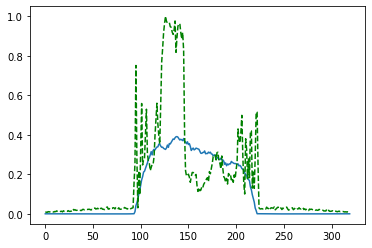

Time taken for epoch:  157.5026888847351
Epoch = [217/3000]  Iter = [   0/39480]  Loss = 0.1508 Avg Loss = 0.1508  Time = 0.0659s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [217/3000]  Iter = [ 100/39480]  Loss = 0.1549 Avg Loss = 0.143  Time = 0.0033s
Epoch = [217/3000]  Iter = [ 200/39480]  Loss = 0.1508 Avg Loss = 0.1422  Time = 0.0035s
Epoch = [217/3000]  Iter = [ 300/39480]  Loss = 0.1258 Avg Loss = 0.1399  Time = 0.0034s
Epoch = [217/3000]  Iter = [ 400/39480]  Loss = 0.1381 Avg Loss = 0.14  Time = 0.0034s
Epoch = [217/3000]  Iter = [ 500/39480]  Loss = 0.1281 Avg Loss = 0.1405  Time = 0.0035s
Epoch = [217/3000]  Iter = [ 600/39480]  Loss = 0.1381 Avg Loss = 0.1402  Time = 0.0035s
Epoch = [217/3000]  Iter = [ 700/39480]  Loss = 0.1294 Avg Loss = 0.1401  Time = 0.0036s
Epoch = [217/3000]  Iter = [ 800/39480]  Loss = 0.1462 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [217/3000]  Iter = [ 900/39480]  Loss = 0.1247 Avg Loss = 0.1392  Time = 0.0038s
Epoch = [217/3000]  Iter = [1000/39480]  Loss = 0.1303 Avg Loss = 0.14  Time = 0.0035s
Epoch = [217/3000]  Iter = [1100/39480]  Loss = 0.1333 Avg Loss = 0.1401  Time = 0.0036s
Epoch = [217/3000]  Iter =

Epoch = [217/3000]  Iter = [9400/39480]  Loss = 0.134 Avg Loss = 0.1403  Time = 0.0035s
Epoch = [217/3000]  Iter = [9500/39480]  Loss = 0.1221 Avg Loss = 0.1401  Time = 0.0036s
Epoch = [217/3000]  Iter = [9600/39480]  Loss = 0.1304 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [217/3000]  Iter = [9700/39480]  Loss = 0.1726 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [217/3000]  Iter = [9800/39480]  Loss = 0.1342 Avg Loss = 0.1413  Time = 0.0034s
Epoch = [217/3000]  Iter = [9900/39480]  Loss = 0.1515 Avg Loss = 0.1403  Time = 0.0035s
Epoch = [217/3000]  Iter = [10000/39480]  Loss = 0.1281 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [217/3000]  Iter = [10100/39480]  Loss = 0.1457 Avg Loss = 0.1421  Time = 0.0037s
Epoch = [217/3000]  Iter = [10200/39480]  Loss = 0.1442 Avg Loss = 0.1436  Time = 0.0037s
Epoch = [217/3000]  Iter = [10300/39480]  Loss = 0.1327 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [217/3000]  Iter = [10400/39480]  Loss = 0.13 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [217/3000] 

Epoch = [217/3000]  Iter = [18600/39480]  Loss = 0.1512 Avg Loss = 0.1401  Time = 0.0036s
Epoch = [217/3000]  Iter = [18700/39480]  Loss = 0.1428 Avg Loss = 0.1419  Time = 0.0033s
Epoch = [217/3000]  Iter = [18800/39480]  Loss = 0.1526 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [217/3000]  Iter = [18900/39480]  Loss = 0.1339 Avg Loss = 0.1402  Time = 0.0032s
Epoch = [217/3000]  Iter = [19000/39480]  Loss = 0.1258 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [217/3000]  Iter = [19100/39480]  Loss = 0.1241 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [217/3000]  Iter = [19200/39480]  Loss = 0.1711 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [217/3000]  Iter = [19300/39480]  Loss = 0.1429 Avg Loss = 0.1398  Time = 0.0033s
Epoch = [217/3000]  Iter = [19400/39480]  Loss = 0.164 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [217/3000]  Iter = [19500/39480]  Loss = 0.1315 Avg Loss = 0.1433  Time = 0.0036s
Epoch = [217/3000]  Iter = [19600/39480]  Loss = 0.1203 Avg Loss = 0.1437  Time = 0.0033s
Epoch = [21

Epoch = [217/3000]  Iter = [27800/39480]  Loss = 0.1451 Avg Loss = 0.1433  Time = 0.0041s
Epoch = [217/3000]  Iter = [27900/39480]  Loss = 0.1458 Avg Loss = 0.1437  Time = 0.0037s
Epoch = [217/3000]  Iter = [28000/39480]  Loss = 0.1485 Avg Loss = 0.141  Time = 0.0032s
Epoch = [217/3000]  Iter = [28100/39480]  Loss = 0.139 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [217/3000]  Iter = [28200/39480]  Loss = 0.1419 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [217/3000]  Iter = [28300/39480]  Loss = 0.1311 Avg Loss = 0.1432  Time = 0.0036s
Epoch = [217/3000]  Iter = [28400/39480]  Loss = 0.1355 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [217/3000]  Iter = [28500/39480]  Loss = 0.1509 Avg Loss = 0.1411  Time = 0.0032s
Epoch = [217/3000]  Iter = [28600/39480]  Loss = 0.1412 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [217/3000]  Iter = [28700/39480]  Loss = 0.1461 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [217/3000]  Iter = [28800/39480]  Loss = 0.1341 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [217

Epoch = [217/3000]  Iter = [37000/39480]  Loss = 0.122 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [217/3000]  Iter = [37100/39480]  Loss = 0.1461 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [217/3000]  Iter = [37200/39480]  Loss = 0.1439 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [217/3000]  Iter = [37300/39480]  Loss = 0.1615 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [217/3000]  Iter = [37400/39480]  Loss = 0.1393 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [217/3000]  Iter = [37500/39480]  Loss = 0.1558 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [217/3000]  Iter = [37600/39480]  Loss = 0.1372 Avg Loss = 0.1432  Time = 0.0032s
Epoch = [217/3000]  Iter = [37700/39480]  Loss = 0.137 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [217/3000]  Iter = [37800/39480]  Loss = 0.1243 Avg Loss = 0.1431  Time = 0.0036s
Epoch = [217/3000]  Iter = [37900/39480]  Loss = 0.1393 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [217/3000]  Iter = [38000/39480]  Loss = 0.1484 Avg Loss = 0.1427  Time = 0.0036s
Epoch = [217

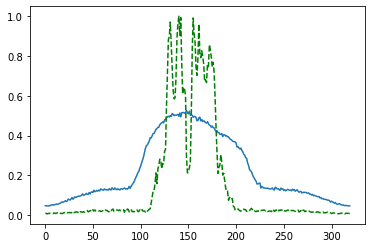

Time taken for epoch:  156.2505304813385
Epoch = [218/3000]  Iter = [   0/39480]  Loss = 0.1143 Avg Loss = 0.1143  Time = 0.0634s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [218/3000]  Iter = [ 100/39480]  Loss = 0.1222 Avg Loss = 0.1301  Time = 0.0035s
Epoch = [218/3000]  Iter = [ 200/39480]  Loss = 0.1467 Avg Loss = 0.135  Time = 0.0037s
Epoch = [218/3000]  Iter = [ 300/39480]  Loss = 0.1419 Avg Loss = 0.1377  Time = 0.0038s
Epoch = [218/3000]  Iter = [ 400/39480]  Loss = 0.1574 Avg Loss = 0.1384  Time = 0.0037s
Epoch = [218/3000]  Iter = [ 500/39480]  Loss = 0.1464 Avg Loss = 0.1402  Time = 0.0036s
Epoch = [218/3000]  Iter = [ 600/39480]  Loss = 0.1417 Avg Loss = 0.1401  Time = 0.0037s
Epoch = [218/3000]  Iter = [ 700/39480]  Loss = 0.15 Avg Loss = 0.1396  Time = 0.0037s
Epoch = [218/3000]  Iter = [ 800/39480]  Loss = 0.1215 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [218/3000]  Iter = [ 900/39480]  Loss = 0.1251 Avg Loss = 0.1413  Time = 0.0037s
Epoch = [218/3000]  Iter = [1000/39480]  Loss = 0.139 Avg Loss = 0.1416  Time = 0.0038s
Epoch = [218/3000]  Iter = [1100/39480]  Loss = 0.134 Avg Loss = 0.1409  Time = 0.0038s
Epoch = [218/3000]  Iter =

Epoch = [218/3000]  Iter = [9400/39480]  Loss = 0.1269 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [218/3000]  Iter = [9500/39480]  Loss = 0.1478 Avg Loss = 0.1422  Time = 0.0033s
Epoch = [218/3000]  Iter = [9600/39480]  Loss = 0.1593 Avg Loss = 0.1431  Time = 0.0036s
Epoch = [218/3000]  Iter = [9700/39480]  Loss = 0.1235 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [218/3000]  Iter = [9800/39480]  Loss = 0.1309 Avg Loss = 0.1402  Time = 0.0035s
Epoch = [218/3000]  Iter = [9900/39480]  Loss = 0.1514 Avg Loss = 0.1396  Time = 0.0037s
Epoch = [218/3000]  Iter = [10000/39480]  Loss = 0.1356 Avg Loss = 0.1414  Time = 0.0035s
Epoch = [218/3000]  Iter = [10100/39480]  Loss = 0.1387 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [218/3000]  Iter = [10200/39480]  Loss = 0.1265 Avg Loss = 0.141  Time = 0.0037s
Epoch = [218/3000]  Iter = [10300/39480]  Loss = 0.118 Avg Loss = 0.14  Time = 0.0037s
Epoch = [218/3000]  Iter = [10400/39480]  Loss = 0.1288 Avg Loss = 0.1417  Time = 0.0034s
Epoch = [218/3000]  

Epoch = [218/3000]  Iter = [18600/39480]  Loss = 0.1538 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [218/3000]  Iter = [18700/39480]  Loss = 0.1313 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [218/3000]  Iter = [18800/39480]  Loss = 0.1417 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [218/3000]  Iter = [18900/39480]  Loss = 0.1359 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [218/3000]  Iter = [19000/39480]  Loss = 0.1436 Avg Loss = 0.141  Time = 0.0036s
Epoch = [218/3000]  Iter = [19100/39480]  Loss = 0.1634 Avg Loss = 0.1414  Time = 0.0032s
Epoch = [218/3000]  Iter = [19200/39480]  Loss = 0.12 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [218/3000]  Iter = [19300/39480]  Loss = 0.1574 Avg Loss = 0.1411  Time = 0.0037s
Epoch = [218/3000]  Iter = [19400/39480]  Loss = 0.136 Avg Loss = 0.1405  Time = 0.0037s
Epoch = [218/3000]  Iter = [19500/39480]  Loss = 0.1405 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [218/3000]  Iter = [19600/39480]  Loss = 0.1382 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [218/3

Epoch = [218/3000]  Iter = [27800/39480]  Loss = 0.143 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [218/3000]  Iter = [27900/39480]  Loss = 0.1414 Avg Loss = 0.1431  Time = 0.0037s
Epoch = [218/3000]  Iter = [28000/39480]  Loss = 0.1526 Avg Loss = 0.1411  Time = 0.0037s
Epoch = [218/3000]  Iter = [28100/39480]  Loss = 0.1501 Avg Loss = 0.1428  Time = 0.0037s
Epoch = [218/3000]  Iter = [28200/39480]  Loss = 0.1295 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [218/3000]  Iter = [28300/39480]  Loss = 0.1582 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [218/3000]  Iter = [28400/39480]  Loss = 0.1398 Avg Loss = 0.141  Time = 0.0036s
Epoch = [218/3000]  Iter = [28500/39480]  Loss = 0.1491 Avg Loss = 0.142  Time = 0.0037s
Epoch = [218/3000]  Iter = [28600/39480]  Loss = 0.1586 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [218/3000]  Iter = [28700/39480]  Loss = 0.1353 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [218/3000]  Iter = [28800/39480]  Loss = 0.1465 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [218/

Epoch = [218/3000]  Iter = [37000/39480]  Loss = 0.145 Avg Loss = 0.1402  Time = 0.0036s
Epoch = [218/3000]  Iter = [37100/39480]  Loss = 0.1713 Avg Loss = 0.1418  Time = 0.0031s
Epoch = [218/3000]  Iter = [37200/39480]  Loss = 0.1438 Avg Loss = 0.1415  Time = 0.0031s
Epoch = [218/3000]  Iter = [37300/39480]  Loss = 0.1445 Avg Loss = 0.1426  Time = 0.0035s
Epoch = [218/3000]  Iter = [37400/39480]  Loss = 0.1582 Avg Loss = 0.1419  Time = 0.0032s
Epoch = [218/3000]  Iter = [37500/39480]  Loss = 0.1426 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [218/3000]  Iter = [37600/39480]  Loss = 0.1507 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [218/3000]  Iter = [37700/39480]  Loss = 0.1734 Avg Loss = 0.1413  Time = 0.0031s
Epoch = [218/3000]  Iter = [37800/39480]  Loss = 0.1323 Avg Loss = 0.1416  Time = 0.0032s
Epoch = [218/3000]  Iter = [37900/39480]  Loss = 0.151 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [218/3000]  Iter = [38000/39480]  Loss = 0.133 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [218/

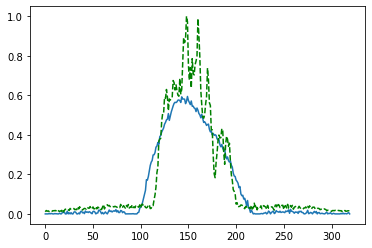

Time taken for epoch:  157.60058903694153
Epoch = [219/3000]  Iter = [   0/39480]  Loss = 0.1331 Avg Loss = 0.1331  Time = 0.0754s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [219/3000]  Iter = [ 100/39480]  Loss = 0.1281 Avg Loss = 0.138  Time = 0.0035s
Epoch = [219/3000]  Iter = [ 200/39480]  Loss = 0.1419 Avg Loss = 0.1392  Time = 0.0037s
Epoch = [219/3000]  Iter = [ 300/39480]  Loss = 0.1233 Avg Loss = 0.1405  Time = 0.0035s
Epoch = [219/3000]  Iter = [ 400/39480]  Loss = 0.1633 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [219/3000]  Iter = [ 500/39480]  Loss = 0.1676 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [219/3000]  Iter = [ 600/39480]  Loss = 0.1574 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [219/3000]  Iter = [ 700/39480]  Loss = 0.1442 Avg Loss = 0.14  Time = 0.0037s
Epoch = [219/3000]  Iter = [ 800/39480]  Loss = 0.1447 Avg Loss = 0.1404  Time = 0.0037s
Epoch = [219/3000]  Iter = [ 900/39480]  Loss = 0.1221 Avg Loss = 0.1394  Time = 0.0035s
Epoch = [219/3000]  Iter = [1000/39480]  Loss = 0.144 Avg Loss = 0.1402  Time = 0.0037s
Epoch = [219/3000]  Iter = [1100/39480]  Loss = 0.1488 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [219/3000]  Iter 

Epoch = [219/3000]  Iter = [9400/39480]  Loss = 0.1447 Avg Loss = 0.1409  Time = 0.0035s
Epoch = [219/3000]  Iter = [9500/39480]  Loss = 0.1557 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [219/3000]  Iter = [9600/39480]  Loss = 0.1618 Avg Loss = 0.1398  Time = 0.0036s
Epoch = [219/3000]  Iter = [9700/39480]  Loss = 0.1454 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [219/3000]  Iter = [9800/39480]  Loss = 0.1635 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [219/3000]  Iter = [9900/39480]  Loss = 0.1188 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [219/3000]  Iter = [10000/39480]  Loss = 0.1433 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [219/3000]  Iter = [10100/39480]  Loss = 0.1207 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [219/3000]  Iter = [10200/39480]  Loss = 0.1396 Avg Loss = 0.1399  Time = 0.0036s
Epoch = [219/3000]  Iter = [10300/39480]  Loss = 0.1409 Avg Loss = 0.1418  Time = 0.0035s
Epoch = [219/3000]  Iter = [10400/39480]  Loss = 0.1461 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [219/300

Epoch = [219/3000]  Iter = [18600/39480]  Loss = 0.1297 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [219/3000]  Iter = [18700/39480]  Loss = 0.1369 Avg Loss = 0.141  Time = 0.0037s
Epoch = [219/3000]  Iter = [18800/39480]  Loss = 0.1569 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [219/3000]  Iter = [18900/39480]  Loss = 0.1222 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [219/3000]  Iter = [19000/39480]  Loss = 0.1456 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [219/3000]  Iter = [19100/39480]  Loss = 0.1507 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [219/3000]  Iter = [19200/39480]  Loss = 0.1426 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [219/3000]  Iter = [19300/39480]  Loss = 0.1448 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [219/3000]  Iter = [19400/39480]  Loss = 0.1652 Avg Loss = 0.1416  Time = 0.0034s
Epoch = [219/3000]  Iter = [19500/39480]  Loss = 0.1454 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [219/3000]  Iter = [19600/39480]  Loss = 0.1433 Avg Loss = 0.1429  Time = 0.0037s
Epoch = [21

Epoch = [219/3000]  Iter = [27800/39480]  Loss = 0.1576 Avg Loss = 0.142  Time = 0.0036s
Epoch = [219/3000]  Iter = [27900/39480]  Loss = 0.1418 Avg Loss = 0.1413  Time = 0.0037s
Epoch = [219/3000]  Iter = [28000/39480]  Loss = 0.127 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [219/3000]  Iter = [28100/39480]  Loss = 0.1449 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [219/3000]  Iter = [28200/39480]  Loss = 0.1437 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [219/3000]  Iter = [28300/39480]  Loss = 0.1368 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [219/3000]  Iter = [28400/39480]  Loss = 0.1435 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [219/3000]  Iter = [28500/39480]  Loss = 0.1408 Avg Loss = 0.1422  Time = 0.0032s
Epoch = [219/3000]  Iter = [28600/39480]  Loss = 0.1702 Avg Loss = 0.1399  Time = 0.0034s
Epoch = [219/3000]  Iter = [28700/39480]  Loss = 0.146 Avg Loss = 0.141  Time = 0.0037s
Epoch = [219/3000]  Iter = [28800/39480]  Loss = 0.1264 Avg Loss = 0.1398  Time = 0.0037s
Epoch = [219/3

Epoch = [219/3000]  Iter = [37000/39480]  Loss = 0.1453 Avg Loss = 0.1416  Time = 0.0035s
Epoch = [219/3000]  Iter = [37100/39480]  Loss = 0.1284 Avg Loss = 0.1421  Time = 0.0034s
Epoch = [219/3000]  Iter = [37200/39480]  Loss = 0.1511 Avg Loss = 0.142  Time = 0.0036s
Epoch = [219/3000]  Iter = [37300/39480]  Loss = 0.1309 Avg Loss = 0.1406  Time = 0.0037s
Epoch = [219/3000]  Iter = [37400/39480]  Loss = 0.1392 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [219/3000]  Iter = [37500/39480]  Loss = 0.1336 Avg Loss = 0.1428  Time = 0.0036s
Epoch = [219/3000]  Iter = [37600/39480]  Loss = 0.1771 Avg Loss = 0.1438  Time = 0.0035s
Epoch = [219/3000]  Iter = [37700/39480]  Loss = 0.1261 Avg Loss = 0.142  Time = 0.0035s
Epoch = [219/3000]  Iter = [37800/39480]  Loss = 0.1478 Avg Loss = 0.141  Time = 0.0032s
Epoch = [219/3000]  Iter = [37900/39480]  Loss = 0.1445 Avg Loss = 0.1429  Time = 0.0037s
Epoch = [219/3000]  Iter = [38000/39480]  Loss = 0.1435 Avg Loss = 0.1432  Time = 0.0036s
Epoch = [219/

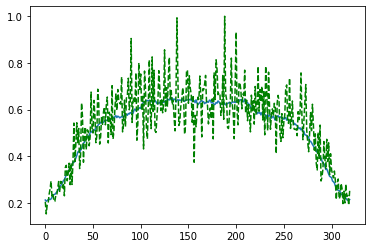

Time taken for epoch:  156.46185040473938
Epoch = [220/3000]  Iter = [   0/39480]  Loss = 0.1364 Avg Loss = 0.1364  Time = 0.0654s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [220/3000]  Iter = [ 100/39480]  Loss = 0.1215 Avg Loss = 0.1393  Time = 0.0037s
Epoch = [220/3000]  Iter = [ 200/39480]  Loss = 0.1533 Avg Loss = 0.1399  Time = 0.0038s
Epoch = [220/3000]  Iter = [ 300/39480]  Loss = 0.1413 Avg Loss = 0.1397  Time = 0.0038s
Epoch = [220/3000]  Iter = [ 400/39480]  Loss = 0.146 Avg Loss = 0.1381  Time = 0.0038s
Epoch = [220/3000]  Iter = [ 500/39480]  Loss = 0.1587 Avg Loss = 0.1385  Time = 0.0037s
Epoch = [220/3000]  Iter = [ 600/39480]  Loss = 0.1414 Avg Loss = 0.1399  Time = 0.0037s
Epoch = [220/3000]  Iter = [ 700/39480]  Loss = 0.117 Avg Loss = 0.1402  Time = 0.0037s
Epoch = [220/3000]  Iter = [ 800/39480]  Loss = 0.1492 Avg Loss = 0.1397  Time = 0.0037s
Epoch = [220/3000]  Iter = [ 900/39480]  Loss = 0.1358 Avg Loss = 0.1402  Time = 0.0038s
Epoch = [220/3000]  Iter = [1000/39480]  Loss = 0.137 Avg Loss = 0.1398  Time = 0.0038s
Epoch = [220/3000]  Iter = [1100/39480]  Loss = 0.1397 Avg Loss = 0.1393  Time = 0.0037s
Epoch = [220/3000]  Iter

Epoch = [220/3000]  Iter = [9400/39480]  Loss = 0.1384 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [220/3000]  Iter = [9500/39480]  Loss = 0.1558 Avg Loss = 0.1429  Time = 0.0037s
Epoch = [220/3000]  Iter = [9600/39480]  Loss = 0.1484 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [220/3000]  Iter = [9700/39480]  Loss = 0.1438 Avg Loss = 0.1418  Time = 0.0032s
Epoch = [220/3000]  Iter = [9800/39480]  Loss = 0.1427 Avg Loss = 0.1419  Time = 0.0032s
Epoch = [220/3000]  Iter = [9900/39480]  Loss = 0.1469 Avg Loss = 0.1418  Time = 0.0032s
Epoch = [220/3000]  Iter = [10000/39480]  Loss = 0.1398 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [220/3000]  Iter = [10100/39480]  Loss = 0.1283 Avg Loss = 0.1413  Time = 0.0037s
Epoch = [220/3000]  Iter = [10200/39480]  Loss = 0.1521 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [220/3000]  Iter = [10300/39480]  Loss = 0.1472 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [220/3000]  Iter = [10400/39480]  Loss = 0.1524 Avg Loss = 0.1435  Time = 0.0034s
Epoch = [220/300

Epoch = [220/3000]  Iter = [18600/39480]  Loss = 0.137 Avg Loss = 0.1427  Time = 0.0032s
Epoch = [220/3000]  Iter = [18700/39480]  Loss = 0.1492 Avg Loss = 0.1409  Time = 0.0034s
Epoch = [220/3000]  Iter = [18800/39480]  Loss = 0.1281 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [220/3000]  Iter = [18900/39480]  Loss = 0.1337 Avg Loss = 0.1398  Time = 0.0036s
Epoch = [220/3000]  Iter = [19000/39480]  Loss = 0.1487 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [220/3000]  Iter = [19100/39480]  Loss = 0.1385 Avg Loss = 0.1438  Time = 0.0037s
Epoch = [220/3000]  Iter = [19200/39480]  Loss = 0.1555 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [220/3000]  Iter = [19300/39480]  Loss = 0.15 Avg Loss = 0.1422  Time = 0.0034s
Epoch = [220/3000]  Iter = [19400/39480]  Loss = 0.1298 Avg Loss = 0.1393  Time = 0.0036s
Epoch = [220/3000]  Iter = [19500/39480]  Loss = 0.1317 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [220/3000]  Iter = [19600/39480]  Loss = 0.1499 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [220/

Epoch = [220/3000]  Iter = [27800/39480]  Loss = 0.1529 Avg Loss = 0.1429  Time = 0.0035s
Epoch = [220/3000]  Iter = [27900/39480]  Loss = 0.1625 Avg Loss = 0.1427  Time = 0.0034s
Epoch = [220/3000]  Iter = [28000/39480]  Loss = 0.1382 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [220/3000]  Iter = [28100/39480]  Loss = 0.1309 Avg Loss = 0.1407  Time = 0.0034s
Epoch = [220/3000]  Iter = [28200/39480]  Loss = 0.1558 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [220/3000]  Iter = [28300/39480]  Loss = 0.1617 Avg Loss = 0.1425  Time = 0.0032s
Epoch = [220/3000]  Iter = [28400/39480]  Loss = 0.1346 Avg Loss = 0.1401  Time = 0.0035s
Epoch = [220/3000]  Iter = [28500/39480]  Loss = 0.1357 Avg Loss = 0.1404  Time = 0.0037s
Epoch = [220/3000]  Iter = [28600/39480]  Loss = 0.1286 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [220/3000]  Iter = [28700/39480]  Loss = 0.1571 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [220/3000]  Iter = [28800/39480]  Loss = 0.1511 Avg Loss = 0.1422  Time = 0.0037s
Epoch = [2

Epoch = [220/3000]  Iter = [37000/39480]  Loss = 0.1627 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [220/3000]  Iter = [37100/39480]  Loss = 0.1302 Avg Loss = 0.1433  Time = 0.0033s
Epoch = [220/3000]  Iter = [37200/39480]  Loss = 0.1513 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [220/3000]  Iter = [37300/39480]  Loss = 0.1279 Avg Loss = 0.1423  Time = 0.0034s
Epoch = [220/3000]  Iter = [37400/39480]  Loss = 0.1382 Avg Loss = 0.1421  Time = 0.0032s
Epoch = [220/3000]  Iter = [37500/39480]  Loss = 0.1384 Avg Loss = 0.1443  Time = 0.0034s
Epoch = [220/3000]  Iter = [37600/39480]  Loss = 0.1428 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [220/3000]  Iter = [37700/39480]  Loss = 0.1574 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [220/3000]  Iter = [37800/39480]  Loss = 0.138 Avg Loss = 0.1415  Time = 0.0039s
Epoch = [220/3000]  Iter = [37900/39480]  Loss = 0.1326 Avg Loss = 0.1421  Time = 0.0034s
Epoch = [220/3000]  Iter = [38000/39480]  Loss = 0.149 Avg Loss = 0.1429  Time = 0.0034s
Epoch = [220

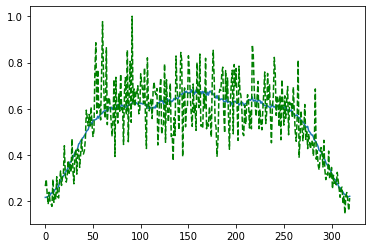

Time taken for epoch:  156.50449323654175
Epoch = [221/3000]  Iter = [   0/39480]  Loss = 0.1205 Avg Loss = 0.1205  Time = 0.0881s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [221/3000]  Iter = [ 100/39480]  Loss = 0.1634 Avg Loss = 0.135  Time = 0.0036s
Epoch = [221/3000]  Iter = [ 200/39480]  Loss = 0.1453 Avg Loss = 0.1383  Time = 0.0038s
Epoch = [221/3000]  Iter = [ 300/39480]  Loss = 0.119 Avg Loss = 0.1388  Time = 0.0036s
Epoch = [221/3000]  Iter = [ 400/39480]  Loss = 0.1635 Avg Loss = 0.1414  Time = 0.0038s
Epoch = [221/3000]  Iter = [ 500/39480]  Loss = 0.1685 Avg Loss = 0.1409  Time = 0.0037s
Epoch = [221/3000]  Iter = [ 600/39480]  Loss = 0.1369 Avg Loss = 0.1413  Time = 0.0035s
Epoch = [221/3000]  Iter = [ 700/39480]  Loss = 0.1365 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [221/3000]  Iter = [ 800/39480]  Loss = 0.1184 Avg Loss = 0.1395  Time = 0.0037s
Epoch = [221/3000]  Iter = [ 900/39480]  Loss = 0.1275 Avg Loss = 0.1394  Time = 0.0037s
Epoch = [221/3000]  Iter = [1000/39480]  Loss = 0.1543 Avg Loss = 0.1404  Time = 0.0033s
Epoch = [221/3000]  Iter = [1100/39480]  Loss = 0.1447 Avg Loss = 0.1391  Time = 0.0035s
Epoch = [221/3000]  Ite

Epoch = [221/3000]  Iter = [9400/39480]  Loss = 0.1422 Avg Loss = 0.1395  Time = 0.0037s
Epoch = [221/3000]  Iter = [9500/39480]  Loss = 0.1401 Avg Loss = 0.1409  Time = 0.0037s
Epoch = [221/3000]  Iter = [9600/39480]  Loss = 0.1448 Avg Loss = 0.1427  Time = 0.0037s
Epoch = [221/3000]  Iter = [9700/39480]  Loss = 0.1394 Avg Loss = 0.141  Time = 0.0037s
Epoch = [221/3000]  Iter = [9800/39480]  Loss = 0.1479 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [221/3000]  Iter = [9900/39480]  Loss = 0.1394 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [221/3000]  Iter = [10000/39480]  Loss = 0.1147 Avg Loss = 0.1397  Time = 0.0036s
Epoch = [221/3000]  Iter = [10100/39480]  Loss = 0.1701 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [221/3000]  Iter = [10200/39480]  Loss = 0.1308 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [221/3000]  Iter = [10300/39480]  Loss = 0.1461 Avg Loss = 0.1416  Time = 0.0034s
Epoch = [221/3000]  Iter = [10400/39480]  Loss = 0.1297 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [221/3000

Epoch = [221/3000]  Iter = [18600/39480]  Loss = 0.1687 Avg Loss = 0.1402  Time = 0.0036s
Epoch = [221/3000]  Iter = [18700/39480]  Loss = 0.147 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [221/3000]  Iter = [18800/39480]  Loss = 0.1421 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [221/3000]  Iter = [18900/39480]  Loss = 0.1411 Avg Loss = 0.1409  Time = 0.0035s
Epoch = [221/3000]  Iter = [19000/39480]  Loss = 0.1641 Avg Loss = 0.1413  Time = 0.0035s
Epoch = [221/3000]  Iter = [19100/39480]  Loss = 0.1469 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [221/3000]  Iter = [19200/39480]  Loss = 0.1582 Avg Loss = 0.1404  Time = 0.0034s
Epoch = [221/3000]  Iter = [19300/39480]  Loss = 0.1359 Avg Loss = 0.1417  Time = 0.0035s
Epoch = [221/3000]  Iter = [19400/39480]  Loss = 0.1288 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [221/3000]  Iter = [19500/39480]  Loss = 0.139 Avg Loss = 0.141  Time = 0.0036s
Epoch = [221/3000]  Iter = [19600/39480]  Loss = 0.1328 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [221/

Epoch = [221/3000]  Iter = [27800/39480]  Loss = 0.1327 Avg Loss = 0.1418  Time = 0.0035s
Epoch = [221/3000]  Iter = [27900/39480]  Loss = 0.1282 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [221/3000]  Iter = [28000/39480]  Loss = 0.1413 Avg Loss = 0.1414  Time = 0.0034s
Epoch = [221/3000]  Iter = [28100/39480]  Loss = 0.1573 Avg Loss = 0.1431  Time = 0.0035s
Epoch = [221/3000]  Iter = [28200/39480]  Loss = 0.1452 Avg Loss = 0.1425  Time = 0.0033s
Epoch = [221/3000]  Iter = [28300/39480]  Loss = 0.1383 Avg Loss = 0.1403  Time = 0.0034s
Epoch = [221/3000]  Iter = [28400/39480]  Loss = 0.1439 Avg Loss = 0.1428  Time = 0.0038s
Epoch = [221/3000]  Iter = [28500/39480]  Loss = 0.143 Avg Loss = 0.1422  Time = 0.0035s
Epoch = [221/3000]  Iter = [28600/39480]  Loss = 0.12 Avg Loss = 0.1423  Time = 0.0035s
Epoch = [221/3000]  Iter = [28700/39480]  Loss = 0.1291 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [221/3000]  Iter = [28800/39480]  Loss = 0.1481 Avg Loss = 0.1403  Time = 0.0034s
Epoch = [221/

Epoch = [221/3000]  Iter = [37000/39480]  Loss = 0.1606 Avg Loss = 0.1423  Time = 0.0035s
Epoch = [221/3000]  Iter = [37100/39480]  Loss = 0.1484 Avg Loss = 0.1434  Time = 0.0037s
Epoch = [221/3000]  Iter = [37200/39480]  Loss = 0.1337 Avg Loss = 0.1427  Time = 0.0037s
Epoch = [221/3000]  Iter = [37300/39480]  Loss = 0.145 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [221/3000]  Iter = [37400/39480]  Loss = 0.1231 Avg Loss = 0.1428  Time = 0.0037s
Epoch = [221/3000]  Iter = [37500/39480]  Loss = 0.1348 Avg Loss = 0.1425  Time = 0.0037s
Epoch = [221/3000]  Iter = [37600/39480]  Loss = 0.1371 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [221/3000]  Iter = [37700/39480]  Loss = 0.1406 Avg Loss = 0.1426  Time = 0.0033s
Epoch = [221/3000]  Iter = [37800/39480]  Loss = 0.157 Avg Loss = 0.1427  Time = 0.0036s
Epoch = [221/3000]  Iter = [37900/39480]  Loss = 0.1222 Avg Loss = 0.1428  Time = 0.0037s
Epoch = [221/3000]  Iter = [38000/39480]  Loss = 0.1263 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [221

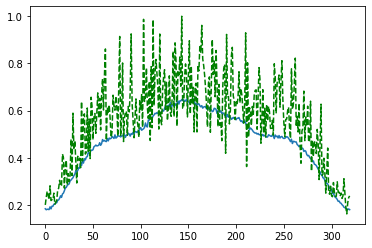

Time taken for epoch:  157.70403337478638
Epoch = [222/3000]  Iter = [   0/39480]  Loss = 0.1354 Avg Loss = 0.1354  Time = 0.0682s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [222/3000]  Iter = [ 100/39480]  Loss = 0.1334 Avg Loss = 0.1375  Time = 0.0038s
Epoch = [222/3000]  Iter = [ 200/39480]  Loss = 0.1354 Avg Loss = 0.141  Time = 0.0037s
Epoch = [222/3000]  Iter = [ 300/39480]  Loss = 0.1363 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [222/3000]  Iter = [ 400/39480]  Loss = 0.1621 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [222/3000]  Iter = [ 500/39480]  Loss = 0.1275 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [222/3000]  Iter = [ 600/39480]  Loss = 0.1362 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [222/3000]  Iter = [ 700/39480]  Loss = 0.1452 Avg Loss = 0.1394  Time = 0.0037s
Epoch = [222/3000]  Iter = [ 800/39480]  Loss = 0.1322 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [222/3000]  Iter = [ 900/39480]  Loss = 0.1375 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [222/3000]  Iter = [1000/39480]  Loss = 0.1447 Avg Loss = 0.1403  Time = 0.0033s
Epoch = [222/3000]  Iter = [1100/39480]  Loss = 0.1515 Avg Loss = 0.1393  Time = 0.0029s
Epoch = [222/3000]  It

Epoch = [222/3000]  Iter = [9400/39480]  Loss = 0.1178 Avg Loss = 0.1402  Time = 0.0035s
Epoch = [222/3000]  Iter = [9500/39480]  Loss = 0.1469 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [222/3000]  Iter = [9600/39480]  Loss = 0.1531 Avg Loss = 0.1393  Time = 0.0036s
Epoch = [222/3000]  Iter = [9700/39480]  Loss = 0.1369 Avg Loss = 0.139  Time = 0.0034s
Epoch = [222/3000]  Iter = [9800/39480]  Loss = 0.1364 Avg Loss = 0.1397  Time = 0.0035s
Epoch = [222/3000]  Iter = [9900/39480]  Loss = 0.1526 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [222/3000]  Iter = [10000/39480]  Loss = 0.1463 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [222/3000]  Iter = [10100/39480]  Loss = 0.1438 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [222/3000]  Iter = [10200/39480]  Loss = 0.1474 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [222/3000]  Iter = [10300/39480]  Loss = 0.1382 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [222/3000]  Iter = [10400/39480]  Loss = 0.1338 Avg Loss = 0.142  Time = 0.0036s
Epoch = [222/3000]

Epoch = [222/3000]  Iter = [18600/39480]  Loss = 0.1391 Avg Loss = 0.1416  Time = 0.0040s
Epoch = [222/3000]  Iter = [18700/39480]  Loss = 0.1481 Avg Loss = 0.142  Time = 0.0038s
Epoch = [222/3000]  Iter = [18800/39480]  Loss = 0.1368 Avg Loss = 0.1409  Time = 0.0040s
Epoch = [222/3000]  Iter = [18900/39480]  Loss = 0.1475 Avg Loss = 0.1424  Time = 0.0040s
Epoch = [222/3000]  Iter = [19000/39480]  Loss = 0.132 Avg Loss = 0.1414  Time = 0.0039s
Epoch = [222/3000]  Iter = [19100/39480]  Loss = 0.1403 Avg Loss = 0.141  Time = 0.0041s
Epoch = [222/3000]  Iter = [19200/39480]  Loss = 0.1434 Avg Loss = 0.1412  Time = 0.0040s
Epoch = [222/3000]  Iter = [19300/39480]  Loss = 0.1481 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [222/3000]  Iter = [19400/39480]  Loss = 0.135 Avg Loss = 0.1404  Time = 0.0041s
Epoch = [222/3000]  Iter = [19500/39480]  Loss = 0.1651 Avg Loss = 0.1417  Time = 0.0032s
Epoch = [222/3000]  Iter = [19600/39480]  Loss = 0.1184 Avg Loss = 0.1399  Time = 0.0036s
Epoch = [222/3

Epoch = [222/3000]  Iter = [27800/39480]  Loss = 0.1367 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [222/3000]  Iter = [27900/39480]  Loss = 0.1393 Avg Loss = 0.1398  Time = 0.0036s
Epoch = [222/3000]  Iter = [28000/39480]  Loss = 0.1276 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [222/3000]  Iter = [28100/39480]  Loss = 0.1393 Avg Loss = 0.14  Time = 0.0036s
Epoch = [222/3000]  Iter = [28200/39480]  Loss = 0.1531 Avg Loss = 0.1412  Time = 0.0034s
Epoch = [222/3000]  Iter = [28300/39480]  Loss = 0.1156 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [222/3000]  Iter = [28400/39480]  Loss = 0.1136 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [222/3000]  Iter = [28500/39480]  Loss = 0.1668 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [222/3000]  Iter = [28600/39480]  Loss = 0.1469 Avg Loss = 0.1424  Time = 0.0035s
Epoch = [222/3000]  Iter = [28700/39480]  Loss = 0.1181 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [222/3000]  Iter = [28800/39480]  Loss = 0.1264 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [222

Epoch = [222/3000]  Iter = [37000/39480]  Loss = 0.132 Avg Loss = 0.1418  Time = 0.0039s
Epoch = [222/3000]  Iter = [37100/39480]  Loss = 0.1612 Avg Loss = 0.1418  Time = 0.0039s
Epoch = [222/3000]  Iter = [37200/39480]  Loss = 0.1364 Avg Loss = 0.1423  Time = 0.0039s
Epoch = [222/3000]  Iter = [37300/39480]  Loss = 0.1505 Avg Loss = 0.1431  Time = 0.0037s
Epoch = [222/3000]  Iter = [37400/39480]  Loss = 0.1526 Avg Loss = 0.1427  Time = 0.0039s
Epoch = [222/3000]  Iter = [37500/39480]  Loss = 0.1574 Avg Loss = 0.1416  Time = 0.0039s
Epoch = [222/3000]  Iter = [37600/39480]  Loss = 0.1388 Avg Loss = 0.1414  Time = 0.0039s
Epoch = [222/3000]  Iter = [37700/39480]  Loss = 0.1428 Avg Loss = 0.1424  Time = 0.0062s
Epoch = [222/3000]  Iter = [37800/39480]  Loss = 0.1494 Avg Loss = 0.1422  Time = 0.0037s
Epoch = [222/3000]  Iter = [37900/39480]  Loss = 0.1552 Avg Loss = 0.1417  Time = 0.0039s
Epoch = [222/3000]  Iter = [38000/39480]  Loss = 0.1635 Avg Loss = 0.1417  Time = 0.0039s
Epoch = [22

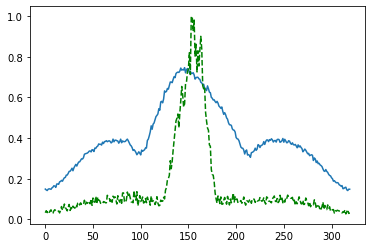

Time taken for epoch:  162.86993980407715
Epoch = [223/3000]  Iter = [   0/39480]  Loss = 0.1309 Avg Loss = 0.1309  Time = 0.0669s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [223/3000]  Iter = [ 100/39480]  Loss = 0.1563 Avg Loss = 0.1387  Time = 0.0040s
Epoch = [223/3000]  Iter = [ 200/39480]  Loss = 0.1756 Avg Loss = 0.1406  Time = 0.0040s
Epoch = [223/3000]  Iter = [ 300/39480]  Loss = 0.1363 Avg Loss = 0.1409  Time = 0.0041s
Epoch = [223/3000]  Iter = [ 400/39480]  Loss = 0.1452 Avg Loss = 0.1412  Time = 0.0038s
Epoch = [223/3000]  Iter = [ 500/39480]  Loss = 0.1338 Avg Loss = 0.1404  Time = 0.0039s
Epoch = [223/3000]  Iter = [ 600/39480]  Loss = 0.1566 Avg Loss = 0.141  Time = 0.0040s
Epoch = [223/3000]  Iter = [ 700/39480]  Loss = 0.1261 Avg Loss = 0.1417  Time = 0.0035s
Epoch = [223/3000]  Iter = [ 800/39480]  Loss = 0.14 Avg Loss = 0.1421  Time = 0.0035s
Epoch = [223/3000]  Iter = [ 900/39480]  Loss = 0.1683 Avg Loss = 0.1408  Time = 0.0035s
Epoch = [223/3000]  Iter = [1000/39480]  Loss = 0.132 Avg Loss = 0.1407  Time = 0.0047s
Epoch = [223/3000]  Iter = [1100/39480]  Loss = 0.1301 Avg Loss = 0.1397  Time = 0.0028s
Epoch = [223/3000]  Iter 

Epoch = [223/3000]  Iter = [9400/39480]  Loss = 0.129 Avg Loss = 0.1435  Time = 0.0037s
Epoch = [223/3000]  Iter = [9500/39480]  Loss = 0.1317 Avg Loss = 0.1414  Time = 0.0035s
Epoch = [223/3000]  Iter = [9600/39480]  Loss = 0.1418 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [223/3000]  Iter = [9700/39480]  Loss = 0.115 Avg Loss = 0.1401  Time = 0.0035s
Epoch = [223/3000]  Iter = [9800/39480]  Loss = 0.1522 Avg Loss = 0.1409  Time = 0.0035s
Epoch = [223/3000]  Iter = [9900/39480]  Loss = 0.1571 Avg Loss = 0.143  Time = 0.0035s
Epoch = [223/3000]  Iter = [10000/39480]  Loss = 0.1555 Avg Loss = 0.1418  Time = 0.0035s
Epoch = [223/3000]  Iter = [10100/39480]  Loss = 0.1525 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [223/3000]  Iter = [10200/39480]  Loss = 0.1322 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [223/3000]  Iter = [10300/39480]  Loss = 0.1284 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [223/3000]  Iter = [10400/39480]  Loss = 0.1459 Avg Loss = 0.1406  Time = 0.0035s
Epoch = [223/3000] 

Epoch = [223/3000]  Iter = [18600/39480]  Loss = 0.1518 Avg Loss = 0.1401  Time = 0.0037s
Epoch = [223/3000]  Iter = [18700/39480]  Loss = 0.1554 Avg Loss = 0.1409  Time = 0.0037s
Epoch = [223/3000]  Iter = [18800/39480]  Loss = 0.1286 Avg Loss = 0.1413  Time = 0.0038s
Epoch = [223/3000]  Iter = [18900/39480]  Loss = 0.1382 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [223/3000]  Iter = [19000/39480]  Loss = 0.1426 Avg Loss = 0.1417  Time = 0.0035s
Epoch = [223/3000]  Iter = [19100/39480]  Loss = 0.1196 Avg Loss = 0.141  Time = 0.0037s
Epoch = [223/3000]  Iter = [19200/39480]  Loss = 0.1354 Avg Loss = 0.1419  Time = 0.0033s
Epoch = [223/3000]  Iter = [19300/39480]  Loss = 0.131 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [223/3000]  Iter = [19400/39480]  Loss = 0.1407 Avg Loss = 0.142  Time = 0.0037s
Epoch = [223/3000]  Iter = [19500/39480]  Loss = 0.1386 Avg Loss = 0.1428  Time = 0.0033s
Epoch = [223/3000]  Iter = [19600/39480]  Loss = 0.1751 Avg Loss = 0.143  Time = 0.0034s
Epoch = [223/3

Epoch = [223/3000]  Iter = [27800/39480]  Loss = 0.1573 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [223/3000]  Iter = [27900/39480]  Loss = 0.1667 Avg Loss = 0.1407  Time = 0.0037s
Epoch = [223/3000]  Iter = [28000/39480]  Loss = 0.1619 Avg Loss = 0.1429  Time = 0.0037s
Epoch = [223/3000]  Iter = [28100/39480]  Loss = 0.156 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [223/3000]  Iter = [28200/39480]  Loss = 0.1205 Avg Loss = 0.1431  Time = 0.0037s
Epoch = [223/3000]  Iter = [28300/39480]  Loss = 0.1205 Avg Loss = 0.1427  Time = 0.0037s
Epoch = [223/3000]  Iter = [28400/39480]  Loss = 0.1484 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [223/3000]  Iter = [28500/39480]  Loss = 0.1269 Avg Loss = 0.1415  Time = 0.0034s
Epoch = [223/3000]  Iter = [28600/39480]  Loss = 0.1471 Avg Loss = 0.1406  Time = 0.0037s
Epoch = [223/3000]  Iter = [28700/39480]  Loss = 0.1279 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [223/3000]  Iter = [28800/39480]  Loss = 0.1231 Avg Loss = 0.1407  Time = 0.0037s
Epoch = [22

Epoch = [223/3000]  Iter = [37000/39480]  Loss = 0.1241 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [223/3000]  Iter = [37100/39480]  Loss = 0.135 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [223/3000]  Iter = [37200/39480]  Loss = 0.1386 Avg Loss = 0.1428  Time = 0.0036s
Epoch = [223/3000]  Iter = [37300/39480]  Loss = 0.1412 Avg Loss = 0.1418  Time = 0.0035s
Epoch = [223/3000]  Iter = [37400/39480]  Loss = 0.1421 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [223/3000]  Iter = [37500/39480]  Loss = 0.1411 Avg Loss = 0.141  Time = 0.0037s
Epoch = [223/3000]  Iter = [37600/39480]  Loss = 0.1393 Avg Loss = 0.1406  Time = 0.0037s
Epoch = [223/3000]  Iter = [37700/39480]  Loss = 0.1356 Avg Loss = 0.1401  Time = 0.0037s
Epoch = [223/3000]  Iter = [37800/39480]  Loss = 0.1583 Avg Loss = 0.1398  Time = 0.0036s
Epoch = [223/3000]  Iter = [37900/39480]  Loss = 0.1447 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [223/3000]  Iter = [38000/39480]  Loss = 0.1436 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [223

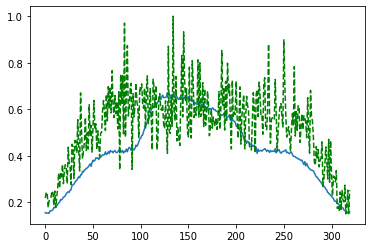

Time taken for epoch:  158.63645386695862
Epoch = [224/3000]  Iter = [   0/39480]  Loss = 0.1421 Avg Loss = 0.1421  Time = 0.0655s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [224/3000]  Iter = [ 100/39480]  Loss = 0.1304 Avg Loss = 0.1398  Time = 0.0034s
Epoch = [224/3000]  Iter = [ 200/39480]  Loss = 0.1388 Avg Loss = 0.1399  Time = 0.0036s
Epoch = [224/3000]  Iter = [ 300/39480]  Loss = 0.1353 Avg Loss = 0.1403  Time = 0.0035s
Epoch = [224/3000]  Iter = [ 400/39480]  Loss = 0.1483 Avg Loss = 0.1399  Time = 0.0035s
Epoch = [224/3000]  Iter = [ 500/39480]  Loss = 0.1323 Avg Loss = 0.1393  Time = 0.0035s
Epoch = [224/3000]  Iter = [ 600/39480]  Loss = 0.1324 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [224/3000]  Iter = [ 700/39480]  Loss = 0.139 Avg Loss = 0.1408  Time = 0.0035s
Epoch = [224/3000]  Iter = [ 800/39480]  Loss = 0.1565 Avg Loss = 0.1407  Time = 0.0032s
Epoch = [224/3000]  Iter = [ 900/39480]  Loss = 0.131 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [224/3000]  Iter = [1000/39480]  Loss = 0.1444 Avg Loss = 0.1393  Time = 0.0032s
Epoch = [224/3000]  Iter = [1100/39480]  Loss = 0.1417 Avg Loss = 0.1393  Time = 0.0036s
Epoch = [224/3000]  Ite

Epoch = [224/3000]  Iter = [9400/39480]  Loss = 0.1492 Avg Loss = 0.1408  Time = 0.0032s
Epoch = [224/3000]  Iter = [9500/39480]  Loss = 0.1488 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [224/3000]  Iter = [9600/39480]  Loss = 0.14 Avg Loss = 0.1415  Time = 0.0032s
Epoch = [224/3000]  Iter = [9700/39480]  Loss = 0.1477 Avg Loss = 0.1396  Time = 0.0036s
Epoch = [224/3000]  Iter = [9800/39480]  Loss = 0.158 Avg Loss = 0.141  Time = 0.0037s
Epoch = [224/3000]  Iter = [9900/39480]  Loss = 0.1336 Avg Loss = 0.1402  Time = 0.0035s
Epoch = [224/3000]  Iter = [10000/39480]  Loss = 0.1384 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [224/3000]  Iter = [10100/39480]  Loss = 0.147 Avg Loss = 0.1399  Time = 0.0036s
Epoch = [224/3000]  Iter = [10200/39480]  Loss = 0.1392 Avg Loss = 0.1396  Time = 0.0035s
Epoch = [224/3000]  Iter = [10300/39480]  Loss = 0.1388 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [224/3000]  Iter = [10400/39480]  Loss = 0.1446 Avg Loss = 0.1407  Time = 0.0037s
Epoch = [224/3000]  I

Epoch = [224/3000]  Iter = [18600/39480]  Loss = 0.1489 Avg Loss = 0.1412  Time = 0.0034s
Epoch = [224/3000]  Iter = [18700/39480]  Loss = 0.133 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [224/3000]  Iter = [18800/39480]  Loss = 0.143 Avg Loss = 0.1402  Time = 0.0034s
Epoch = [224/3000]  Iter = [18900/39480]  Loss = 0.1347 Avg Loss = 0.1402  Time = 0.0037s
Epoch = [224/3000]  Iter = [19000/39480]  Loss = 0.1291 Avg Loss = 0.1402  Time = 0.0034s
Epoch = [224/3000]  Iter = [19100/39480]  Loss = 0.1435 Avg Loss = 0.1411  Time = 0.0032s
Epoch = [224/3000]  Iter = [19200/39480]  Loss = 0.1615 Avg Loss = 0.1425  Time = 0.0035s
Epoch = [224/3000]  Iter = [19300/39480]  Loss = 0.1446 Avg Loss = 0.141  Time = 0.0036s
Epoch = [224/3000]  Iter = [19400/39480]  Loss = 0.1554 Avg Loss = 0.1417  Time = 0.0035s
Epoch = [224/3000]  Iter = [19500/39480]  Loss = 0.1373 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [224/3000]  Iter = [19600/39480]  Loss = 0.1206 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [224/

Epoch = [224/3000]  Iter = [27800/39480]  Loss = 0.1398 Avg Loss = 0.1422  Time = 0.0034s
Epoch = [224/3000]  Iter = [27900/39480]  Loss = 0.164 Avg Loss = 0.1421  Time = 0.0032s
Epoch = [224/3000]  Iter = [28000/39480]  Loss = 0.1492 Avg Loss = 0.1414  Time = 0.0035s
Epoch = [224/3000]  Iter = [28100/39480]  Loss = 0.1519 Avg Loss = 0.1415  Time = 0.0035s
Epoch = [224/3000]  Iter = [28200/39480]  Loss = 0.1291 Avg Loss = 0.14  Time = 0.0034s
Epoch = [224/3000]  Iter = [28300/39480]  Loss = 0.1421 Avg Loss = 0.1398  Time = 0.0034s
Epoch = [224/3000]  Iter = [28400/39480]  Loss = 0.1314 Avg Loss = 0.1423  Time = 0.0035s
Epoch = [224/3000]  Iter = [28500/39480]  Loss = 0.1334 Avg Loss = 0.1421  Time = 0.0032s
Epoch = [224/3000]  Iter = [28600/39480]  Loss = 0.1254 Avg Loss = 0.1414  Time = 0.0035s
Epoch = [224/3000]  Iter = [28700/39480]  Loss = 0.1314 Avg Loss = 0.1402  Time = 0.0036s
Epoch = [224/3000]  Iter = [28800/39480]  Loss = 0.1335 Avg Loss = 0.1409  Time = 0.0043s
Epoch = [224/

Epoch = [224/3000]  Iter = [37000/39480]  Loss = 0.1557 Avg Loss = 0.1403  Time = 0.0039s
Epoch = [224/3000]  Iter = [37100/39480]  Loss = 0.1367 Avg Loss = 0.1407  Time = 0.0041s
Epoch = [224/3000]  Iter = [37200/39480]  Loss = 0.1394 Avg Loss = 0.1408  Time = 0.0038s
Epoch = [224/3000]  Iter = [37300/39480]  Loss = 0.1468 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [224/3000]  Iter = [37400/39480]  Loss = 0.1341 Avg Loss = 0.1416  Time = 0.0035s
Epoch = [224/3000]  Iter = [37500/39480]  Loss = 0.136 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [224/3000]  Iter = [37600/39480]  Loss = 0.1509 Avg Loss = 0.1415  Time = 0.0035s
Epoch = [224/3000]  Iter = [37700/39480]  Loss = 0.1481 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [224/3000]  Iter = [37800/39480]  Loss = 0.1221 Avg Loss = 0.1412  Time = 0.0031s
Epoch = [224/3000]  Iter = [37900/39480]  Loss = 0.1308 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [224/3000]  Iter = [38000/39480]  Loss = 0.1166 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [22

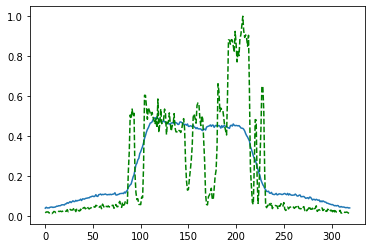

Time taken for epoch:  156.10943269729614
Epoch = [225/3000]  Iter = [   0/39480]  Loss = 0.1329 Avg Loss = 0.1329  Time = 0.0849s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [225/3000]  Iter = [ 100/39480]  Loss = 0.1064 Avg Loss = 0.1375  Time = 0.0035s
Epoch = [225/3000]  Iter = [ 200/39480]  Loss = 0.1363 Avg Loss = 0.1386  Time = 0.0037s
Epoch = [225/3000]  Iter = [ 300/39480]  Loss = 0.1381 Avg Loss = 0.1386  Time = 0.0035s
Epoch = [225/3000]  Iter = [ 400/39480]  Loss = 0.1421 Avg Loss = 0.1401  Time = 0.0034s
Epoch = [225/3000]  Iter = [ 500/39480]  Loss = 0.1362 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [225/3000]  Iter = [ 600/39480]  Loss = 0.134 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [225/3000]  Iter = [ 700/39480]  Loss = 0.1307 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [225/3000]  Iter = [ 800/39480]  Loss = 0.147 Avg Loss = 0.1394  Time = 0.0030s
Epoch = [225/3000]  Iter = [ 900/39480]  Loss = 0.1524 Avg Loss = 0.1403  Time = 0.0029s
Epoch = [225/3000]  Iter = [1000/39480]  Loss = 0.1432 Avg Loss = 0.1411  Time = 0.0033s
Epoch = [225/3000]  Iter = [1100/39480]  Loss = 0.134 Avg Loss = 0.14  Time = 0.0031s
Epoch = [225/3000]  Iter =

Epoch = [225/3000]  Iter = [9400/39480]  Loss = 0.1461 Avg Loss = 0.1402  Time = 0.0036s
Epoch = [225/3000]  Iter = [9500/39480]  Loss = 0.1212 Avg Loss = 0.1402  Time = 0.0036s
Epoch = [225/3000]  Iter = [9600/39480]  Loss = 0.177 Avg Loss = 0.14  Time = 0.0036s
Epoch = [225/3000]  Iter = [9700/39480]  Loss = 0.1163 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [225/3000]  Iter = [9800/39480]  Loss = 0.1413 Avg Loss = 0.14  Time = 0.0037s
Epoch = [225/3000]  Iter = [9900/39480]  Loss = 0.1236 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [225/3000]  Iter = [10000/39480]  Loss = 0.1325 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [225/3000]  Iter = [10100/39480]  Loss = 0.1362 Avg Loss = 0.1397  Time = 0.0037s
Epoch = [225/3000]  Iter = [10200/39480]  Loss = 0.1553 Avg Loss = 0.1399  Time = 0.0037s
Epoch = [225/3000]  Iter = [10300/39480]  Loss = 0.1346 Avg Loss = 0.1401  Time = 0.0036s
Epoch = [225/3000]  Iter = [10400/39480]  Loss = 0.1334 Avg Loss = 0.1402  Time = 0.0037s
Epoch = [225/3000]  I

Epoch = [225/3000]  Iter = [18600/39480]  Loss = 0.1109 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [225/3000]  Iter = [18700/39480]  Loss = 0.1734 Avg Loss = 0.1432  Time = 0.0037s
Epoch = [225/3000]  Iter = [18800/39480]  Loss = 0.1263 Avg Loss = 0.141  Time = 0.0031s
Epoch = [225/3000]  Iter = [18900/39480]  Loss = 0.1413 Avg Loss = 0.1409  Time = 0.0037s
Epoch = [225/3000]  Iter = [19000/39480]  Loss = 0.1379 Avg Loss = 0.1405  Time = 0.0037s
Epoch = [225/3000]  Iter = [19100/39480]  Loss = 0.1393 Avg Loss = 0.1409  Time = 0.0037s
Epoch = [225/3000]  Iter = [19200/39480]  Loss = 0.1292 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [225/3000]  Iter = [19300/39480]  Loss = 0.1409 Avg Loss = 0.1413  Time = 0.0037s
Epoch = [225/3000]  Iter = [19400/39480]  Loss = 0.1501 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [225/3000]  Iter = [19500/39480]  Loss = 0.1361 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [225/3000]  Iter = [19600/39480]  Loss = 0.1486 Avg Loss = 0.1417  Time = 0.0032s
Epoch = [22

Epoch = [225/3000]  Iter = [27800/39480]  Loss = 0.151 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [225/3000]  Iter = [27900/39480]  Loss = 0.1499 Avg Loss = 0.1423  Time = 0.0035s
Epoch = [225/3000]  Iter = [28000/39480]  Loss = 0.1453 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [225/3000]  Iter = [28100/39480]  Loss = 0.1298 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [225/3000]  Iter = [28200/39480]  Loss = 0.1174 Avg Loss = 0.1415  Time = 0.0032s
Epoch = [225/3000]  Iter = [28300/39480]  Loss = 0.127 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [225/3000]  Iter = [28400/39480]  Loss = 0.144 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [225/3000]  Iter = [28500/39480]  Loss = 0.1249 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [225/3000]  Iter = [28600/39480]  Loss = 0.1541 Avg Loss = 0.142  Time = 0.0036s
Epoch = [225/3000]  Iter = [28700/39480]  Loss = 0.1451 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [225/3000]  Iter = [28800/39480]  Loss = 0.1526 Avg Loss = 0.142  Time = 0.0036s
Epoch = [225/30

Epoch = [225/3000]  Iter = [37000/39480]  Loss = 0.1194 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [225/3000]  Iter = [37100/39480]  Loss = 0.1347 Avg Loss = 0.142  Time = 0.0037s
Epoch = [225/3000]  Iter = [37200/39480]  Loss = 0.1392 Avg Loss = 0.1427  Time = 0.0051s
Epoch = [225/3000]  Iter = [37300/39480]  Loss = 0.1543 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [225/3000]  Iter = [37400/39480]  Loss = 0.1396 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [225/3000]  Iter = [37500/39480]  Loss = 0.1441 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [225/3000]  Iter = [37600/39480]  Loss = 0.1328 Avg Loss = 0.1402  Time = 0.0036s
Epoch = [225/3000]  Iter = [37700/39480]  Loss = 0.138 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [225/3000]  Iter = [37800/39480]  Loss = 0.1411 Avg Loss = 0.1419  Time = 0.0033s
Epoch = [225/3000]  Iter = [37900/39480]  Loss = 0.1624 Avg Loss = 0.1423  Time = 0.0034s
Epoch = [225/3000]  Iter = [38000/39480]  Loss = 0.1409 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [225

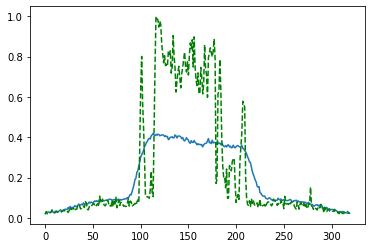

Time taken for epoch:  156.88030433654785
Epoch = [226/3000]  Iter = [   0/39480]  Loss = 0.1335 Avg Loss = 0.1335  Time = 0.0762s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [226/3000]  Iter = [ 100/39480]  Loss = 0.1439 Avg Loss = 0.137  Time = 0.0037s
Epoch = [226/3000]  Iter = [ 200/39480]  Loss = 0.149 Avg Loss = 0.1376  Time = 0.0035s
Epoch = [226/3000]  Iter = [ 300/39480]  Loss = 0.1453 Avg Loss = 0.1382  Time = 0.0037s
Epoch = [226/3000]  Iter = [ 400/39480]  Loss = 0.1513 Avg Loss = 0.1387  Time = 0.0037s
Epoch = [226/3000]  Iter = [ 500/39480]  Loss = 0.1414 Avg Loss = 0.14  Time = 0.0035s
Epoch = [226/3000]  Iter = [ 600/39480]  Loss = 0.1422 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [226/3000]  Iter = [ 700/39480]  Loss = 0.1322 Avg Loss = 0.1425  Time = 0.0032s
Epoch = [226/3000]  Iter = [ 800/39480]  Loss = 0.1428 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [226/3000]  Iter = [ 900/39480]  Loss = 0.1487 Avg Loss = 0.142  Time = 0.0033s
Epoch = [226/3000]  Iter = [1000/39480]  Loss = 0.1371 Avg Loss = 0.1416  Time = 0.0035s
Epoch = [226/3000]  Iter = [1100/39480]  Loss = 0.1295 Avg Loss = 0.1408  Time = 0.0032s
Epoch = [226/3000]  Iter =

Epoch = [226/3000]  Iter = [9400/39480]  Loss = 0.1279 Avg Loss = 0.1399  Time = 0.0033s
Epoch = [226/3000]  Iter = [9500/39480]  Loss = 0.1319 Avg Loss = 0.1391  Time = 0.0036s
Epoch = [226/3000]  Iter = [9600/39480]  Loss = 0.1264 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [226/3000]  Iter = [9700/39480]  Loss = 0.1505 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [226/3000]  Iter = [9800/39480]  Loss = 0.1487 Avg Loss = 0.1394  Time = 0.0036s
Epoch = [226/3000]  Iter = [9900/39480]  Loss = 0.1354 Avg Loss = 0.1397  Time = 0.0035s
Epoch = [226/3000]  Iter = [10000/39480]  Loss = 0.1649 Avg Loss = 0.1392  Time = 0.0032s
Epoch = [226/3000]  Iter = [10100/39480]  Loss = 0.1225 Avg Loss = 0.1395  Time = 0.0033s
Epoch = [226/3000]  Iter = [10200/39480]  Loss = 0.1623 Avg Loss = 0.1414  Time = 0.0034s
Epoch = [226/3000]  Iter = [10300/39480]  Loss = 0.1359 Avg Loss = 0.1406  Time = 0.0033s
Epoch = [226/3000]  Iter = [10400/39480]  Loss = 0.1479 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [226/300

Epoch = [226/3000]  Iter = [18600/39480]  Loss = 0.1325 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [226/3000]  Iter = [18700/39480]  Loss = 0.1485 Avg Loss = 0.1401  Time = 0.0038s
Epoch = [226/3000]  Iter = [18800/39480]  Loss = 0.1498 Avg Loss = 0.1423  Time = 0.0039s
Epoch = [226/3000]  Iter = [18900/39480]  Loss = 0.1204 Avg Loss = 0.1415  Time = 0.0038s
Epoch = [226/3000]  Iter = [19000/39480]  Loss = 0.1354 Avg Loss = 0.1405  Time = 0.0039s
Epoch = [226/3000]  Iter = [19100/39480]  Loss = 0.1367 Avg Loss = 0.1405  Time = 0.0038s
Epoch = [226/3000]  Iter = [19200/39480]  Loss = 0.1678 Avg Loss = 0.1407  Time = 0.0039s
Epoch = [226/3000]  Iter = [19300/39480]  Loss = 0.1183 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [226/3000]  Iter = [19400/39480]  Loss = 0.1473 Avg Loss = 0.1402  Time = 0.0038s
Epoch = [226/3000]  Iter = [19500/39480]  Loss = 0.1307 Avg Loss = 0.1427  Time = 0.0038s
Epoch = [226/3000]  Iter = [19600/39480]  Loss = 0.1286 Avg Loss = 0.1415  Time = 0.0038s
Epoch = [2

Epoch = [226/3000]  Iter = [27800/39480]  Loss = 0.1291 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [226/3000]  Iter = [27900/39480]  Loss = 0.1304 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [226/3000]  Iter = [28000/39480]  Loss = 0.1595 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [226/3000]  Iter = [28100/39480]  Loss = 0.1472 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [226/3000]  Iter = [28200/39480]  Loss = 0.1566 Avg Loss = 0.1427  Time = 0.0038s
Epoch = [226/3000]  Iter = [28300/39480]  Loss = 0.1525 Avg Loss = 0.1429  Time = 0.0035s
Epoch = [226/3000]  Iter = [28400/39480]  Loss = 0.1436 Avg Loss = 0.1406  Time = 0.0034s
Epoch = [226/3000]  Iter = [28500/39480]  Loss = 0.1434 Avg Loss = 0.1403  Time = 0.0034s
Epoch = [226/3000]  Iter = [28600/39480]  Loss = 0.1387 Avg Loss = 0.1415  Time = 0.0044s
Epoch = [226/3000]  Iter = [28700/39480]  Loss = 0.143 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [226/3000]  Iter = [28800/39480]  Loss = 0.1439 Avg Loss = 0.1416  Time = 0.0035s
Epoch = [22

Epoch = [226/3000]  Iter = [37000/39480]  Loss = 0.1486 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [226/3000]  Iter = [37100/39480]  Loss = 0.1405 Avg Loss = 0.1414  Time = 0.0035s
Epoch = [226/3000]  Iter = [37200/39480]  Loss = 0.1271 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [226/3000]  Iter = [37300/39480]  Loss = 0.1419 Avg Loss = 0.143  Time = 0.0036s
Epoch = [226/3000]  Iter = [37400/39480]  Loss = 0.171 Avg Loss = 0.1429  Time = 0.0035s
Epoch = [226/3000]  Iter = [37500/39480]  Loss = 0.1449 Avg Loss = 0.1422  Time = 0.0037s
Epoch = [226/3000]  Iter = [37600/39480]  Loss = 0.1515 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [226/3000]  Iter = [37700/39480]  Loss = 0.1532 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [226/3000]  Iter = [37800/39480]  Loss = 0.1372 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [226/3000]  Iter = [37900/39480]  Loss = 0.1495 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [226/3000]  Iter = [38000/39480]  Loss = 0.1161 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [226

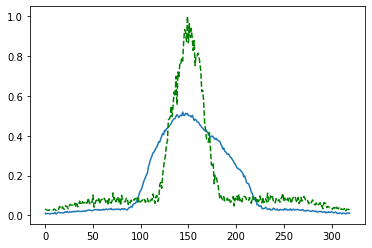

Time taken for epoch:  161.29837131500244
Epoch = [227/3000]  Iter = [   0/39480]  Loss = 0.1302 Avg Loss = 0.1302  Time = 0.0640s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [227/3000]  Iter = [ 100/39480]  Loss = 0.109 Avg Loss = 0.1375  Time = 0.0036s
Epoch = [227/3000]  Iter = [ 200/39480]  Loss = 0.1242 Avg Loss = 0.1393  Time = 0.0037s
Epoch = [227/3000]  Iter = [ 300/39480]  Loss = 0.1501 Avg Loss = 0.139  Time = 0.0037s
Epoch = [227/3000]  Iter = [ 400/39480]  Loss = 0.136 Avg Loss = 0.1396  Time = 0.0037s
Epoch = [227/3000]  Iter = [ 500/39480]  Loss = 0.1315 Avg Loss = 0.1398  Time = 0.0036s
Epoch = [227/3000]  Iter = [ 600/39480]  Loss = 0.1514 Avg Loss = 0.1389  Time = 0.0037s
Epoch = [227/3000]  Iter = [ 700/39480]  Loss = 0.1255 Avg Loss = 0.1398  Time = 0.0032s
Epoch = [227/3000]  Iter = [ 800/39480]  Loss = 0.1442 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [227/3000]  Iter = [ 900/39480]  Loss = 0.1441 Avg Loss = 0.14  Time = 0.0037s
Epoch = [227/3000]  Iter = [1000/39480]  Loss = 0.133 Avg Loss = 0.1388  Time = 0.0037s
Epoch = [227/3000]  Iter = [1100/39480]  Loss = 0.1694 Avg Loss = 0.1399  Time = 0.0037s
Epoch = [227/3000]  Iter = 

Epoch = [227/3000]  Iter = [9400/39480]  Loss = 0.1376 Avg Loss = 0.1411  Time = 0.0037s
Epoch = [227/3000]  Iter = [9500/39480]  Loss = 0.1402 Avg Loss = 0.1414  Time = 0.0035s
Epoch = [227/3000]  Iter = [9600/39480]  Loss = 0.1521 Avg Loss = 0.1415  Time = 0.0031s
Epoch = [227/3000]  Iter = [9700/39480]  Loss = 0.1491 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [227/3000]  Iter = [9800/39480]  Loss = 0.1448 Avg Loss = 0.1408  Time = 0.0032s
Epoch = [227/3000]  Iter = [9900/39480]  Loss = 0.1581 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [227/3000]  Iter = [10000/39480]  Loss = 0.1339 Avg Loss = 0.139  Time = 0.0036s
Epoch = [227/3000]  Iter = [10100/39480]  Loss = 0.135 Avg Loss = 0.1397  Time = 0.0036s
Epoch = [227/3000]  Iter = [10200/39480]  Loss = 0.1686 Avg Loss = 0.1401  Time = 0.0034s
Epoch = [227/3000]  Iter = [10300/39480]  Loss = 0.1424 Avg Loss = 0.1399  Time = 0.0036s
Epoch = [227/3000]  Iter = [10400/39480]  Loss = 0.1643 Avg Loss = 0.1404  Time = 0.0037s
Epoch = [227/3000]

Epoch = [227/3000]  Iter = [18600/39480]  Loss = 0.1562 Avg Loss = 0.1399  Time = 0.0035s
Epoch = [227/3000]  Iter = [18700/39480]  Loss = 0.1413 Avg Loss = 0.1397  Time = 0.0036s
Epoch = [227/3000]  Iter = [18800/39480]  Loss = 0.1418 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [227/3000]  Iter = [18900/39480]  Loss = 0.1362 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [227/3000]  Iter = [19000/39480]  Loss = 0.1339 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [227/3000]  Iter = [19100/39480]  Loss = 0.1394 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [227/3000]  Iter = [19200/39480]  Loss = 0.144 Avg Loss = 0.14  Time = 0.0032s
Epoch = [227/3000]  Iter = [19300/39480]  Loss = 0.1444 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [227/3000]  Iter = [19400/39480]  Loss = 0.1121 Avg Loss = 0.1416  Time = 0.0031s
Epoch = [227/3000]  Iter = [19500/39480]  Loss = 0.1397 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [227/3000]  Iter = [19600/39480]  Loss = 0.148 Avg Loss = 0.1429  Time = 0.0037s
Epoch = [227/3

Epoch = [227/3000]  Iter = [27800/39480]  Loss = 0.1364 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [227/3000]  Iter = [27900/39480]  Loss = 0.1361 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [227/3000]  Iter = [28000/39480]  Loss = 0.1425 Avg Loss = 0.1403  Time = 0.0035s
Epoch = [227/3000]  Iter = [28100/39480]  Loss = 0.1341 Avg Loss = 0.1389  Time = 0.0033s
Epoch = [227/3000]  Iter = [28200/39480]  Loss = 0.1521 Avg Loss = 0.1408  Time = 0.0034s
Epoch = [227/3000]  Iter = [28300/39480]  Loss = 0.1571 Avg Loss = 0.1412  Time = 0.0035s
Epoch = [227/3000]  Iter = [28400/39480]  Loss = 0.1221 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [227/3000]  Iter = [28500/39480]  Loss = 0.1216 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [227/3000]  Iter = [28600/39480]  Loss = 0.1483 Avg Loss = 0.1408  Time = 0.0033s
Epoch = [227/3000]  Iter = [28700/39480]  Loss = 0.1353 Avg Loss = 0.1425  Time = 0.0033s
Epoch = [227/3000]  Iter = [28800/39480]  Loss = 0.1468 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [2

Epoch = [227/3000]  Iter = [37000/39480]  Loss = 0.1463 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [227/3000]  Iter = [37100/39480]  Loss = 0.1321 Avg Loss = 0.1417  Time = 0.0030s
Epoch = [227/3000]  Iter = [37200/39480]  Loss = 0.1434 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [227/3000]  Iter = [37300/39480]  Loss = 0.1408 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [227/3000]  Iter = [37400/39480]  Loss = 0.1537 Avg Loss = 0.1421  Time = 0.0032s
Epoch = [227/3000]  Iter = [37500/39480]  Loss = 0.137 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [227/3000]  Iter = [37600/39480]  Loss = 0.1378 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [227/3000]  Iter = [37700/39480]  Loss = 0.1335 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [227/3000]  Iter = [37800/39480]  Loss = 0.1396 Avg Loss = 0.1413  Time = 0.0037s
Epoch = [227/3000]  Iter = [37900/39480]  Loss = 0.1291 Avg Loss = 0.1429  Time = 0.0037s
Epoch = [227/3000]  Iter = [38000/39480]  Loss = 0.137 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [227

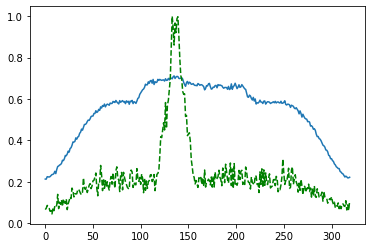

Time taken for epoch:  158.95761895179749
Epoch = [228/3000]  Iter = [   0/39480]  Loss = 0.1498 Avg Loss = 0.1498  Time = 0.0809s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [228/3000]  Iter = [ 100/39480]  Loss = 0.1525 Avg Loss = 0.143  Time = 0.0034s
Epoch = [228/3000]  Iter = [ 200/39480]  Loss = 0.1547 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [228/3000]  Iter = [ 300/39480]  Loss = 0.1514 Avg Loss = 0.1395  Time = 0.0036s
Epoch = [228/3000]  Iter = [ 400/39480]  Loss = 0.141 Avg Loss = 0.1405  Time = 0.0034s
Epoch = [228/3000]  Iter = [ 500/39480]  Loss = 0.1399 Avg Loss = 0.14  Time = 0.0035s
Epoch = [228/3000]  Iter = [ 600/39480]  Loss = 0.1409 Avg Loss = 0.1403  Time = 0.0037s
Epoch = [228/3000]  Iter = [ 700/39480]  Loss = 0.1285 Avg Loss = 0.1398  Time = 0.0035s
Epoch = [228/3000]  Iter = [ 800/39480]  Loss = 0.1396 Avg Loss = 0.139  Time = 0.0036s
Epoch = [228/3000]  Iter = [ 900/39480]  Loss = 0.1392 Avg Loss = 0.1406  Time = 0.0033s
Epoch = [228/3000]  Iter = [1000/39480]  Loss = 0.1355 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [228/3000]  Iter = [1100/39480]  Loss = 0.1428 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [228/3000]  Iter =

Epoch = [228/3000]  Iter = [9400/39480]  Loss = 0.1613 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [228/3000]  Iter = [9500/39480]  Loss = 0.1551 Avg Loss = 0.1405  Time = 0.0033s
Epoch = [228/3000]  Iter = [9600/39480]  Loss = 0.1652 Avg Loss = 0.1403  Time = 0.0037s
Epoch = [228/3000]  Iter = [9700/39480]  Loss = 0.164 Avg Loss = 0.1426  Time = 0.0035s
Epoch = [228/3000]  Iter = [9800/39480]  Loss = 0.1616 Avg Loss = 0.1417  Time = 0.0033s
Epoch = [228/3000]  Iter = [9900/39480]  Loss = 0.1347 Avg Loss = 0.1395  Time = 0.0034s
Epoch = [228/3000]  Iter = [10000/39480]  Loss = 0.1809 Avg Loss = 0.1415  Time = 0.0031s
Epoch = [228/3000]  Iter = [10100/39480]  Loss = 0.143 Avg Loss = 0.1411  Time = 0.0031s
Epoch = [228/3000]  Iter = [10200/39480]  Loss = 0.168 Avg Loss = 0.1421  Time = 0.0035s
Epoch = [228/3000]  Iter = [10300/39480]  Loss = 0.1373 Avg Loss = 0.143  Time = 0.0036s
Epoch = [228/3000]  Iter = [10400/39480]  Loss = 0.1328 Avg Loss = 0.1413  Time = 0.0035s
Epoch = [228/3000]  

Epoch = [228/3000]  Iter = [18600/39480]  Loss = 0.1528 Avg Loss = 0.1433  Time = 0.0036s
Epoch = [228/3000]  Iter = [18700/39480]  Loss = 0.135 Avg Loss = 0.1417  Time = 0.0034s
Epoch = [228/3000]  Iter = [18800/39480]  Loss = 0.1525 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [228/3000]  Iter = [18900/39480]  Loss = 0.1523 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [228/3000]  Iter = [19000/39480]  Loss = 0.1317 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [228/3000]  Iter = [19100/39480]  Loss = 0.113 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [228/3000]  Iter = [19200/39480]  Loss = 0.1261 Avg Loss = 0.141  Time = 0.0036s
Epoch = [228/3000]  Iter = [19300/39480]  Loss = 0.122 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [228/3000]  Iter = [19400/39480]  Loss = 0.1459 Avg Loss = 0.1409  Time = 0.0035s
Epoch = [228/3000]  Iter = [19500/39480]  Loss = 0.1577 Avg Loss = 0.1415  Time = 0.0037s
Epoch = [228/3000]  Iter = [19600/39480]  Loss = 0.1218 Avg Loss = 0.1407  Time = 0.0035s
Epoch = [228/3

Epoch = [228/3000]  Iter = [27800/39480]  Loss = 0.1544 Avg Loss = 0.1415  Time = 0.0037s
Epoch = [228/3000]  Iter = [27900/39480]  Loss = 0.1259 Avg Loss = 0.1427  Time = 0.0037s
Epoch = [228/3000]  Iter = [28000/39480]  Loss = 0.1443 Avg Loss = 0.1422  Time = 0.0038s
Epoch = [228/3000]  Iter = [28100/39480]  Loss = 0.1277 Avg Loss = 0.1412  Time = 0.0038s
Epoch = [228/3000]  Iter = [28200/39480]  Loss = 0.1437 Avg Loss = 0.1424  Time = 0.0031s
Epoch = [228/3000]  Iter = [28300/39480]  Loss = 0.1617 Avg Loss = 0.1428  Time = 0.0039s
Epoch = [228/3000]  Iter = [28400/39480]  Loss = 0.1371 Avg Loss = 0.1427  Time = 0.0031s
Epoch = [228/3000]  Iter = [28500/39480]  Loss = 0.151 Avg Loss = 0.142  Time = 0.0040s
Epoch = [228/3000]  Iter = [28600/39480]  Loss = 0.1369 Avg Loss = 0.1409  Time = 0.0040s
Epoch = [228/3000]  Iter = [28700/39480]  Loss = 0.1486 Avg Loss = 0.1408  Time = 0.0035s
Epoch = [228/3000]  Iter = [28800/39480]  Loss = 0.1532 Avg Loss = 0.142  Time = 0.0036s
Epoch = [228/

Epoch = [228/3000]  Iter = [37000/39480]  Loss = 0.1476 Avg Loss = 0.1394  Time = 0.0037s
Epoch = [228/3000]  Iter = [37100/39480]  Loss = 0.1691 Avg Loss = 0.141  Time = 0.0037s
Epoch = [228/3000]  Iter = [37200/39480]  Loss = 0.1327 Avg Loss = 0.1411  Time = 0.0050s
Epoch = [228/3000]  Iter = [37300/39480]  Loss = 0.1474 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [228/3000]  Iter = [37400/39480]  Loss = 0.1221 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [228/3000]  Iter = [37500/39480]  Loss = 0.1456 Avg Loss = 0.1414  Time = 0.0033s
Epoch = [228/3000]  Iter = [37600/39480]  Loss = 0.1519 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [228/3000]  Iter = [37700/39480]  Loss = 0.1197 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [228/3000]  Iter = [37800/39480]  Loss = 0.1378 Avg Loss = 0.1419  Time = 0.0035s
Epoch = [228/3000]  Iter = [37900/39480]  Loss = 0.1454 Avg Loss = 0.1416  Time = 0.0033s
Epoch = [228/3000]  Iter = [38000/39480]  Loss = 0.1429 Avg Loss = 0.1406  Time = 0.0037s
Epoch = [22

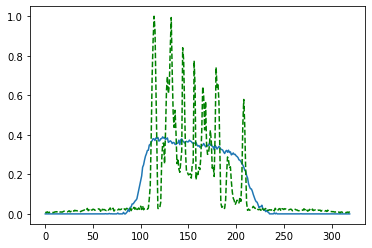

Time taken for epoch:  158.3792335987091
Epoch = [229/3000]  Iter = [   0/39480]  Loss = 0.1486 Avg Loss = 0.1486  Time = 0.0733s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [229/3000]  Iter = [ 100/39480]  Loss = 0.1453 Avg Loss = 0.1435  Time = 0.0038s
Epoch = [229/3000]  Iter = [ 200/39480]  Loss = 0.1416 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [229/3000]  Iter = [ 300/39480]  Loss = 0.145 Avg Loss = 0.1392  Time = 0.0037s
Epoch = [229/3000]  Iter = [ 400/39480]  Loss = 0.1374 Avg Loss = 0.1401  Time = 0.0034s
Epoch = [229/3000]  Iter = [ 500/39480]  Loss = 0.1584 Avg Loss = 0.1391  Time = 0.0036s
Epoch = [229/3000]  Iter = [ 600/39480]  Loss = 0.1346 Avg Loss = 0.1409  Time = 0.0035s
Epoch = [229/3000]  Iter = [ 700/39480]  Loss = 0.1401 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [229/3000]  Iter = [ 800/39480]  Loss = 0.1401 Avg Loss = 0.1377  Time = 0.0036s
Epoch = [229/3000]  Iter = [ 900/39480]  Loss = 0.1442 Avg Loss = 0.1406  Time = 0.0031s
Epoch = [229/3000]  Iter = [1000/39480]  Loss = 0.1381 Avg Loss = 0.1412  Time = 0.0031s
Epoch = [229/3000]  Iter = [1100/39480]  Loss = 0.1674 Avg Loss = 0.141  Time = 0.0036s
Epoch = [229/3000]  Ite

Epoch = [229/3000]  Iter = [9400/39480]  Loss = 0.1394 Avg Loss = 0.1409  Time = 0.0031s
Epoch = [229/3000]  Iter = [9500/39480]  Loss = 0.1298 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [229/3000]  Iter = [9600/39480]  Loss = 0.1233 Avg Loss = 0.1396  Time = 0.0035s
Epoch = [229/3000]  Iter = [9700/39480]  Loss = 0.1351 Avg Loss = 0.1399  Time = 0.0036s
Epoch = [229/3000]  Iter = [9800/39480]  Loss = 0.1675 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [229/3000]  Iter = [9900/39480]  Loss = 0.1526 Avg Loss = 0.1429  Time = 0.0034s
Epoch = [229/3000]  Iter = [10000/39480]  Loss = 0.1281 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [229/3000]  Iter = [10100/39480]  Loss = 0.1597 Avg Loss = 0.1414  Time = 0.0035s
Epoch = [229/3000]  Iter = [10200/39480]  Loss = 0.1204 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [229/3000]  Iter = [10300/39480]  Loss = 0.1455 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [229/3000]  Iter = [10400/39480]  Loss = 0.1344 Avg Loss = 0.1411  Time = 0.0035s
Epoch = [229/300

Epoch = [229/3000]  Iter = [18600/39480]  Loss = 0.1417 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [229/3000]  Iter = [18700/39480]  Loss = 0.1373 Avg Loss = 0.1414  Time = 0.0035s
Epoch = [229/3000]  Iter = [18800/39480]  Loss = 0.1357 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [229/3000]  Iter = [18900/39480]  Loss = 0.15 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [229/3000]  Iter = [19000/39480]  Loss = 0.144 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [229/3000]  Iter = [19100/39480]  Loss = 0.1557 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [229/3000]  Iter = [19200/39480]  Loss = 0.1472 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [229/3000]  Iter = [19300/39480]  Loss = 0.1192 Avg Loss = 0.1418  Time = 0.0035s
Epoch = [229/3000]  Iter = [19400/39480]  Loss = 0.1403 Avg Loss = 0.1433  Time = 0.0034s
Epoch = [229/3000]  Iter = [19500/39480]  Loss = 0.1444 Avg Loss = 0.1432  Time = 0.0036s
Epoch = [229/3000]  Iter = [19600/39480]  Loss = 0.134 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [229/3

Epoch = [229/3000]  Iter = [27800/39480]  Loss = 0.124 Avg Loss = 0.1384  Time = 0.0036s
Epoch = [229/3000]  Iter = [27900/39480]  Loss = 0.1635 Avg Loss = 0.1402  Time = 0.0033s
Epoch = [229/3000]  Iter = [28000/39480]  Loss = 0.1573 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [229/3000]  Iter = [28100/39480]  Loss = 0.1528 Avg Loss = 0.141  Time = 0.0033s
Epoch = [229/3000]  Iter = [28200/39480]  Loss = 0.1403 Avg Loss = 0.1421  Time = 0.0032s
Epoch = [229/3000]  Iter = [28300/39480]  Loss = 0.1428 Avg Loss = 0.1419  Time = 0.0034s
Epoch = [229/3000]  Iter = [28400/39480]  Loss = 0.158 Avg Loss = 0.1442  Time = 0.0033s
Epoch = [229/3000]  Iter = [28500/39480]  Loss = 0.1248 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [229/3000]  Iter = [28600/39480]  Loss = 0.1597 Avg Loss = 0.1414  Time = 0.0035s
Epoch = [229/3000]  Iter = [28700/39480]  Loss = 0.1501 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [229/3000]  Iter = [28800/39480]  Loss = 0.149 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [229/3

Epoch = [229/3000]  Iter = [37000/39480]  Loss = 0.1328 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [229/3000]  Iter = [37100/39480]  Loss = 0.1466 Avg Loss = 0.143  Time = 0.0034s
Epoch = [229/3000]  Iter = [37200/39480]  Loss = 0.1443 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [229/3000]  Iter = [37300/39480]  Loss = 0.1434 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [229/3000]  Iter = [37400/39480]  Loss = 0.1508 Avg Loss = 0.1423  Time = 0.0034s
Epoch = [229/3000]  Iter = [37500/39480]  Loss = 0.166 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [229/3000]  Iter = [37600/39480]  Loss = 0.1506 Avg Loss = 0.1425  Time = 0.0036s
Epoch = [229/3000]  Iter = [37700/39480]  Loss = 0.1429 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [229/3000]  Iter = [37800/39480]  Loss = 0.1232 Avg Loss = 0.1426  Time = 0.0035s
Epoch = [229/3000]  Iter = [37900/39480]  Loss = 0.1288 Avg Loss = 0.1436  Time = 0.0036s
Epoch = [229/3000]  Iter = [38000/39480]  Loss = 0.1462 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [229

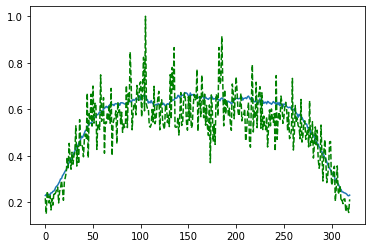

Time taken for epoch:  156.15275716781616
Epoch = [230/3000]  Iter = [   0/39480]  Loss = 0.1291 Avg Loss = 0.1291  Time = 0.0673s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [230/3000]  Iter = [ 100/39480]  Loss = 0.1513 Avg Loss = 0.135  Time = 0.0035s
Epoch = [230/3000]  Iter = [ 200/39480]  Loss = 0.139 Avg Loss = 0.1389  Time = 0.0035s
Epoch = [230/3000]  Iter = [ 300/39480]  Loss = 0.1243 Avg Loss = 0.1393  Time = 0.0037s
Epoch = [230/3000]  Iter = [ 400/39480]  Loss = 0.132 Avg Loss = 0.1399  Time = 0.0037s
Epoch = [230/3000]  Iter = [ 500/39480]  Loss = 0.1642 Avg Loss = 0.1392  Time = 0.0036s
Epoch = [230/3000]  Iter = [ 600/39480]  Loss = 0.1345 Avg Loss = 0.1395  Time = 0.0037s
Epoch = [230/3000]  Iter = [ 700/39480]  Loss = 0.1195 Avg Loss = 0.1394  Time = 0.0035s
Epoch = [230/3000]  Iter = [ 800/39480]  Loss = 0.1519 Avg Loss = 0.1387  Time = 0.0037s
Epoch = [230/3000]  Iter = [ 900/39480]  Loss = 0.1501 Avg Loss = 0.1402  Time = 0.0037s
Epoch = [230/3000]  Iter = [1000/39480]  Loss = 0.1152 Avg Loss = 0.1408  Time = 0.0032s
Epoch = [230/3000]  Iter = [1100/39480]  Loss = 0.1423 Avg Loss = 0.1401  Time = 0.0037s
Epoch = [230/3000]  Iter

Epoch = [230/3000]  Iter = [9400/39480]  Loss = 0.1479 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [230/3000]  Iter = [9500/39480]  Loss = 0.1385 Avg Loss = 0.1395  Time = 0.0036s
Epoch = [230/3000]  Iter = [9600/39480]  Loss = 0.1638 Avg Loss = 0.1414  Time = 0.0033s
Epoch = [230/3000]  Iter = [9700/39480]  Loss = 0.117 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [230/3000]  Iter = [9800/39480]  Loss = 0.1537 Avg Loss = 0.1397  Time = 0.0035s
Epoch = [230/3000]  Iter = [9900/39480]  Loss = 0.1605 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [230/3000]  Iter = [10000/39480]  Loss = 0.1606 Avg Loss = 0.1403  Time = 0.0035s
Epoch = [230/3000]  Iter = [10100/39480]  Loss = 0.1503 Avg Loss = 0.1397  Time = 0.0036s
Epoch = [230/3000]  Iter = [10200/39480]  Loss = 0.1275 Avg Loss = 0.1385  Time = 0.0036s
Epoch = [230/3000]  Iter = [10300/39480]  Loss = 0.1461 Avg Loss = 0.1401  Time = 0.0036s
Epoch = [230/3000]  Iter = [10400/39480]  Loss = 0.1617 Avg Loss = 0.1397  Time = 0.0036s
Epoch = [230/3000

Epoch = [230/3000]  Iter = [18600/39480]  Loss = 0.1386 Avg Loss = 0.1405  Time = 0.0034s
Epoch = [230/3000]  Iter = [18700/39480]  Loss = 0.1699 Avg Loss = 0.1428  Time = 0.0036s
Epoch = [230/3000]  Iter = [18800/39480]  Loss = 0.1296 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [230/3000]  Iter = [18900/39480]  Loss = 0.1256 Avg Loss = 0.141  Time = 0.0036s
Epoch = [230/3000]  Iter = [19000/39480]  Loss = 0.1429 Avg Loss = 0.142  Time = 0.0037s
Epoch = [230/3000]  Iter = [19100/39480]  Loss = 0.1356 Avg Loss = 0.1426  Time = 0.0035s
Epoch = [230/3000]  Iter = [19200/39480]  Loss = 0.1324 Avg Loss = 0.1407  Time = 0.0037s
Epoch = [230/3000]  Iter = [19300/39480]  Loss = 0.1432 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [230/3000]  Iter = [19400/39480]  Loss = 0.1261 Avg Loss = 0.1394  Time = 0.0032s
Epoch = [230/3000]  Iter = [19500/39480]  Loss = 0.1413 Avg Loss = 0.1401  Time = 0.0036s
Epoch = [230/3000]  Iter = [19600/39480]  Loss = 0.1423 Avg Loss = 0.1405  Time = 0.0037s
Epoch = [230

Epoch = [230/3000]  Iter = [27800/39480]  Loss = 0.1421 Avg Loss = 0.1427  Time = 0.0037s
Epoch = [230/3000]  Iter = [27900/39480]  Loss = 0.1443 Avg Loss = 0.1402  Time = 0.0036s
Epoch = [230/3000]  Iter = [28000/39480]  Loss = 0.1424 Avg Loss = 0.1401  Time = 0.0036s
Epoch = [230/3000]  Iter = [28100/39480]  Loss = 0.1328 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [230/3000]  Iter = [28200/39480]  Loss = 0.1428 Avg Loss = 0.1422  Time = 0.0037s
Epoch = [230/3000]  Iter = [28300/39480]  Loss = 0.1341 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [230/3000]  Iter = [28400/39480]  Loss = 0.1548 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [230/3000]  Iter = [28500/39480]  Loss = 0.1816 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [230/3000]  Iter = [28600/39480]  Loss = 0.1317 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [230/3000]  Iter = [28700/39480]  Loss = 0.1421 Avg Loss = 0.141  Time = 0.0036s
Epoch = [230/3000]  Iter = [28800/39480]  Loss = 0.1407 Avg Loss = 0.1413  Time = 0.0035s
Epoch = [23

Epoch = [230/3000]  Iter = [37000/39480]  Loss = 0.1638 Avg Loss = 0.1421  Time = 0.0035s
Epoch = [230/3000]  Iter = [37100/39480]  Loss = 0.1338 Avg Loss = 0.1427  Time = 0.0035s
Epoch = [230/3000]  Iter = [37200/39480]  Loss = 0.1618 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [230/3000]  Iter = [37300/39480]  Loss = 0.1333 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [230/3000]  Iter = [37400/39480]  Loss = 0.1345 Avg Loss = 0.1416  Time = 0.0033s
Epoch = [230/3000]  Iter = [37500/39480]  Loss = 0.1156 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [230/3000]  Iter = [37600/39480]  Loss = 0.1287 Avg Loss = 0.141  Time = 0.0035s
Epoch = [230/3000]  Iter = [37700/39480]  Loss = 0.1466 Avg Loss = 0.1406  Time = 0.0035s
Epoch = [230/3000]  Iter = [37800/39480]  Loss = 0.1284 Avg Loss = 0.1416  Time = 0.0035s
Epoch = [230/3000]  Iter = [37900/39480]  Loss = 0.1329 Avg Loss = 0.142  Time = 0.0035s
Epoch = [230/3000]  Iter = [38000/39480]  Loss = 0.1398 Avg Loss = 0.1416  Time = 0.0033s
Epoch = [230

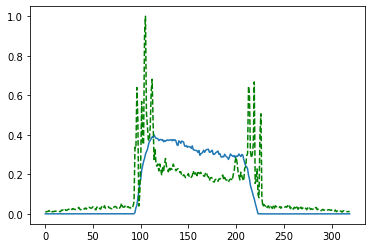

Time taken for epoch:  157.55438423156738
Epoch = [231/3000]  Iter = [   0/39480]  Loss = 0.1251 Avg Loss = 0.1251  Time = 0.0646s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [231/3000]  Iter = [ 100/39480]  Loss = 0.1568 Avg Loss = 0.1337  Time = 0.0060s
Epoch = [231/3000]  Iter = [ 200/39480]  Loss = 0.1651 Avg Loss = 0.1367  Time = 0.0042s
Epoch = [231/3000]  Iter = [ 300/39480]  Loss = 0.1337 Avg Loss = 0.1392  Time = 0.0036s
Epoch = [231/3000]  Iter = [ 400/39480]  Loss = 0.134 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [231/3000]  Iter = [ 500/39480]  Loss = 0.1439 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [231/3000]  Iter = [ 600/39480]  Loss = 0.1405 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [231/3000]  Iter = [ 700/39480]  Loss = 0.1354 Avg Loss = 0.1401  Time = 0.0035s
Epoch = [231/3000]  Iter = [ 800/39480]  Loss = 0.137 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [231/3000]  Iter = [ 900/39480]  Loss = 0.1323 Avg Loss = 0.1397  Time = 0.0037s
Epoch = [231/3000]  Iter = [1000/39480]  Loss = 0.1621 Avg Loss = 0.1391  Time = 0.0037s
Epoch = [231/3000]  Iter = [1100/39480]  Loss = 0.1233 Avg Loss = 0.1401  Time = 0.0037s
Epoch = [231/3000]  Ite

Epoch = [231/3000]  Iter = [9400/39480]  Loss = 0.1262 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [231/3000]  Iter = [9500/39480]  Loss = 0.1286 Avg Loss = 0.1408  Time = 0.0035s
Epoch = [231/3000]  Iter = [9600/39480]  Loss = 0.1359 Avg Loss = 0.1422  Time = 0.0033s
Epoch = [231/3000]  Iter = [9700/39480]  Loss = 0.1629 Avg Loss = 0.142  Time = 0.0034s
Epoch = [231/3000]  Iter = [9800/39480]  Loss = 0.144 Avg Loss = 0.142  Time = 0.0035s
Epoch = [231/3000]  Iter = [9900/39480]  Loss = 0.1583 Avg Loss = 0.1422  Time = 0.0035s
Epoch = [231/3000]  Iter = [10000/39480]  Loss = 0.1518 Avg Loss = 0.1428  Time = 0.0035s
Epoch = [231/3000]  Iter = [10100/39480]  Loss = 0.1357 Avg Loss = 0.1419  Time = 0.0034s
Epoch = [231/3000]  Iter = [10200/39480]  Loss = 0.1367 Avg Loss = 0.1412  Time = 0.0035s
Epoch = [231/3000]  Iter = [10300/39480]  Loss = 0.1394 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [231/3000]  Iter = [10400/39480]  Loss = 0.1501 Avg Loss = 0.1406  Time = 0.0035s
Epoch = [231/3000] 

Epoch = [231/3000]  Iter = [18600/39480]  Loss = 0.1286 Avg Loss = 0.142  Time = 0.0035s
Epoch = [231/3000]  Iter = [18700/39480]  Loss = 0.1437 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [231/3000]  Iter = [18800/39480]  Loss = 0.1402 Avg Loss = 0.142  Time = 0.0033s
Epoch = [231/3000]  Iter = [18900/39480]  Loss = 0.1287 Avg Loss = 0.14  Time = 0.0037s
Epoch = [231/3000]  Iter = [19000/39480]  Loss = 0.147 Avg Loss = 0.1399  Time = 0.0036s
Epoch = [231/3000]  Iter = [19100/39480]  Loss = 0.1623 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [231/3000]  Iter = [19200/39480]  Loss = 0.1249 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [231/3000]  Iter = [19300/39480]  Loss = 0.1586 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [231/3000]  Iter = [19400/39480]  Loss = 0.1518 Avg Loss = 0.1416  Time = 0.0037s
Epoch = [231/3000]  Iter = [19500/39480]  Loss = 0.1429 Avg Loss = 0.1411  Time = 0.0037s
Epoch = [231/3000]  Iter = [19600/39480]  Loss = 0.1229 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [231/30

Epoch = [231/3000]  Iter = [27800/39480]  Loss = 0.1415 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [231/3000]  Iter = [27900/39480]  Loss = 0.1215 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [231/3000]  Iter = [28000/39480]  Loss = 0.1422 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [231/3000]  Iter = [28100/39480]  Loss = 0.1403 Avg Loss = 0.1406  Time = 0.0035s
Epoch = [231/3000]  Iter = [28200/39480]  Loss = 0.1224 Avg Loss = 0.1414  Time = 0.0032s
Epoch = [231/3000]  Iter = [28300/39480]  Loss = 0.152 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [231/3000]  Iter = [28400/39480]  Loss = 0.1393 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [231/3000]  Iter = [28500/39480]  Loss = 0.1577 Avg Loss = 0.142  Time = 0.0035s
Epoch = [231/3000]  Iter = [28600/39480]  Loss = 0.1304 Avg Loss = 0.1423  Time = 0.0034s
Epoch = [231/3000]  Iter = [28700/39480]  Loss = 0.1361 Avg Loss = 0.1423  Time = 0.0037s
Epoch = [231/3000]  Iter = [28800/39480]  Loss = 0.146 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [231/

Epoch = [231/3000]  Iter = [37000/39480]  Loss = 0.1407 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [231/3000]  Iter = [37100/39480]  Loss = 0.1407 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [231/3000]  Iter = [37200/39480]  Loss = 0.121 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [231/3000]  Iter = [37300/39480]  Loss = 0.1339 Avg Loss = 0.1424  Time = 0.0037s
Epoch = [231/3000]  Iter = [37400/39480]  Loss = 0.1479 Avg Loss = 0.1416  Time = 0.0034s
Epoch = [231/3000]  Iter = [37500/39480]  Loss = 0.1354 Avg Loss = 0.1426  Time = 0.0037s
Epoch = [231/3000]  Iter = [37600/39480]  Loss = 0.163 Avg Loss = 0.143  Time = 0.0037s
Epoch = [231/3000]  Iter = [37700/39480]  Loss = 0.1182 Avg Loss = 0.1419  Time = 0.0031s
Epoch = [231/3000]  Iter = [37800/39480]  Loss = 0.1413 Avg Loss = 0.1418  Time = 0.0035s
Epoch = [231/3000]  Iter = [37900/39480]  Loss = 0.1355 Avg Loss = 0.1406  Time = 0.0037s
Epoch = [231/3000]  Iter = [38000/39480]  Loss = 0.1579 Avg Loss = 0.1396  Time = 0.0036s
Epoch = [231/

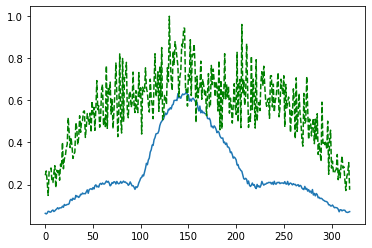

Time taken for epoch:  156.18013763427734
Epoch = [232/3000]  Iter = [   0/39480]  Loss = 0.1096 Avg Loss = 0.1096  Time = 0.0672s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [232/3000]  Iter = [ 100/39480]  Loss = 0.1249 Avg Loss = 0.1294  Time = 0.0034s
Epoch = [232/3000]  Iter = [ 200/39480]  Loss = 0.1494 Avg Loss = 0.1362  Time = 0.0036s
Epoch = [232/3000]  Iter = [ 300/39480]  Loss = 0.1533 Avg Loss = 0.1395  Time = 0.0036s
Epoch = [232/3000]  Iter = [ 400/39480]  Loss = 0.1607 Avg Loss = 0.1417  Time = 0.0031s
Epoch = [232/3000]  Iter = [ 500/39480]  Loss = 0.169 Avg Loss = 0.141  Time = 0.0035s
Epoch = [232/3000]  Iter = [ 600/39480]  Loss = 0.1282 Avg Loss = 0.1399  Time = 0.0036s
Epoch = [232/3000]  Iter = [ 700/39480]  Loss = 0.143 Avg Loss = 0.1395  Time = 0.0036s
Epoch = [232/3000]  Iter = [ 800/39480]  Loss = 0.1528 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [232/3000]  Iter = [ 900/39480]  Loss = 0.1326 Avg Loss = 0.1396  Time = 0.0037s
Epoch = [232/3000]  Iter = [1000/39480]  Loss = 0.1363 Avg Loss = 0.141  Time = 0.0036s
Epoch = [232/3000]  Iter = [1100/39480]  Loss = 0.1236 Avg Loss = 0.1393  Time = 0.0036s
Epoch = [232/3000]  Iter 

Epoch = [232/3000]  Iter = [9400/39480]  Loss = 0.1439 Avg Loss = 0.1415  Time = 0.0037s
Epoch = [232/3000]  Iter = [9500/39480]  Loss = 0.1212 Avg Loss = 0.1403  Time = 0.0038s
Epoch = [232/3000]  Iter = [9600/39480]  Loss = 0.1475 Avg Loss = 0.1405  Time = 0.0037s
Epoch = [232/3000]  Iter = [9700/39480]  Loss = 0.142 Avg Loss = 0.1402  Time = 0.0033s
Epoch = [232/3000]  Iter = [9800/39480]  Loss = 0.1567 Avg Loss = 0.1406  Time = 0.0038s
Epoch = [232/3000]  Iter = [9900/39480]  Loss = 0.14 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [232/3000]  Iter = [10000/39480]  Loss = 0.1543 Avg Loss = 0.141  Time = 0.0036s
Epoch = [232/3000]  Iter = [10100/39480]  Loss = 0.1283 Avg Loss = 0.14  Time = 0.0031s
Epoch = [232/3000]  Iter = [10200/39480]  Loss = 0.1296 Avg Loss = 0.1404  Time = 0.0037s
Epoch = [232/3000]  Iter = [10300/39480]  Loss = 0.156 Avg Loss = 0.1435  Time = 0.0036s
Epoch = [232/3000]  Iter = [10400/39480]  Loss = 0.1411 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [232/3000]  Ite

Epoch = [232/3000]  Iter = [18600/39480]  Loss = 0.1414 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [232/3000]  Iter = [18700/39480]  Loss = 0.151 Avg Loss = 0.1429  Time = 0.0034s
Epoch = [232/3000]  Iter = [18800/39480]  Loss = 0.1266 Avg Loss = 0.143  Time = 0.0036s
Epoch = [232/3000]  Iter = [18900/39480]  Loss = 0.1343 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [232/3000]  Iter = [19000/39480]  Loss = 0.1282 Avg Loss = 0.1409  Time = 0.0037s
Epoch = [232/3000]  Iter = [19100/39480]  Loss = 0.1456 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [232/3000]  Iter = [19200/39480]  Loss = 0.1117 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [232/3000]  Iter = [19300/39480]  Loss = 0.1489 Avg Loss = 0.1414  Time = 0.0031s
Epoch = [232/3000]  Iter = [19400/39480]  Loss = 0.1413 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [232/3000]  Iter = [19500/39480]  Loss = 0.1478 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [232/3000]  Iter = [19600/39480]  Loss = 0.1377 Avg Loss = 0.1413  Time = 0.0037s
Epoch = [232

Epoch = [232/3000]  Iter = [27800/39480]  Loss = 0.1553 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [232/3000]  Iter = [27900/39480]  Loss = 0.1623 Avg Loss = 0.1421  Time = 0.0035s
Epoch = [232/3000]  Iter = [28000/39480]  Loss = 0.1312 Avg Loss = 0.1419  Time = 0.0035s
Epoch = [232/3000]  Iter = [28100/39480]  Loss = 0.1335 Avg Loss = 0.1429  Time = 0.0035s
Epoch = [232/3000]  Iter = [28200/39480]  Loss = 0.131 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [232/3000]  Iter = [28300/39480]  Loss = 0.1435 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [232/3000]  Iter = [28400/39480]  Loss = 0.1339 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [232/3000]  Iter = [28500/39480]  Loss = 0.1448 Avg Loss = 0.1389  Time = 0.0036s
Epoch = [232/3000]  Iter = [28600/39480]  Loss = 0.1544 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [232/3000]  Iter = [28700/39480]  Loss = 0.1513 Avg Loss = 0.1416  Time = 0.0033s
Epoch = [232/3000]  Iter = [28800/39480]  Loss = 0.1375 Avg Loss = 0.1425  Time = 0.0037s
Epoch = [23

Epoch = [232/3000]  Iter = [37000/39480]  Loss = 0.1361 Avg Loss = 0.142  Time = 0.0037s
Epoch = [232/3000]  Iter = [37100/39480]  Loss = 0.1484 Avg Loss = 0.1413  Time = 0.0035s
Epoch = [232/3000]  Iter = [37200/39480]  Loss = 0.1433 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [232/3000]  Iter = [37300/39480]  Loss = 0.1292 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [232/3000]  Iter = [37400/39480]  Loss = 0.1399 Avg Loss = 0.1415  Time = 0.0033s
Epoch = [232/3000]  Iter = [37500/39480]  Loss = 0.1516 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [232/3000]  Iter = [37600/39480]  Loss = 0.1557 Avg Loss = 0.1422  Time = 0.0032s
Epoch = [232/3000]  Iter = [37700/39480]  Loss = 0.1142 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [232/3000]  Iter = [37800/39480]  Loss = 0.1447 Avg Loss = 0.1411  Time = 0.0035s
Epoch = [232/3000]  Iter = [37900/39480]  Loss = 0.1278 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [232/3000]  Iter = [38000/39480]  Loss = 0.1499 Avg Loss = 0.1417  Time = 0.0033s
Epoch = [23

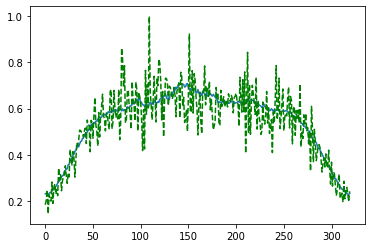

Time taken for epoch:  158.42504858970642
Epoch = [233/3000]  Iter = [   0/39480]  Loss = 0.1396 Avg Loss = 0.1396  Time = 0.0695s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [233/3000]  Iter = [ 100/39480]  Loss = 0.1501 Avg Loss = 0.1415  Time = 0.0035s
Epoch = [233/3000]  Iter = [ 200/39480]  Loss = 0.1256 Avg Loss = 0.1392  Time = 0.0037s
Epoch = [233/3000]  Iter = [ 300/39480]  Loss = 0.1445 Avg Loss = 0.1394  Time = 0.0036s
Epoch = [233/3000]  Iter = [ 400/39480]  Loss = 0.1435 Avg Loss = 0.1396  Time = 0.0031s
Epoch = [233/3000]  Iter = [ 500/39480]  Loss = 0.1454 Avg Loss = 0.1382  Time = 0.0036s
Epoch = [233/3000]  Iter = [ 600/39480]  Loss = 0.1494 Avg Loss = 0.1398  Time = 0.0035s
Epoch = [233/3000]  Iter = [ 700/39480]  Loss = 0.1487 Avg Loss = 0.1396  Time = 0.0036s
Epoch = [233/3000]  Iter = [ 800/39480]  Loss = 0.1426 Avg Loss = 0.1398  Time = 0.0032s
Epoch = [233/3000]  Iter = [ 900/39480]  Loss = 0.1184 Avg Loss = 0.1407  Time = 0.0031s
Epoch = [233/3000]  Iter = [1000/39480]  Loss = 0.1616 Avg Loss = 0.1404  Time = 0.0034s
Epoch = [233/3000]  Iter = [1100/39480]  Loss = 0.121 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [233/3000]  It

Epoch = [233/3000]  Iter = [9400/39480]  Loss = 0.1069 Avg Loss = 0.1407  Time = 0.0035s
Epoch = [233/3000]  Iter = [9500/39480]  Loss = 0.1324 Avg Loss = 0.1409  Time = 0.0033s
Epoch = [233/3000]  Iter = [9600/39480]  Loss = 0.15 Avg Loss = 0.1402  Time = 0.0036s
Epoch = [233/3000]  Iter = [9700/39480]  Loss = 0.1702 Avg Loss = 0.1397  Time = 0.0036s
Epoch = [233/3000]  Iter = [9800/39480]  Loss = 0.1358 Avg Loss = 0.141  Time = 0.0033s
Epoch = [233/3000]  Iter = [9900/39480]  Loss = 0.1398 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [233/3000]  Iter = [10000/39480]  Loss = 0.1387 Avg Loss = 0.143  Time = 0.0031s
Epoch = [233/3000]  Iter = [10100/39480]  Loss = 0.1563 Avg Loss = 0.1411  Time = 0.0035s
Epoch = [233/3000]  Iter = [10200/39480]  Loss = 0.1326 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [233/3000]  Iter = [10300/39480]  Loss = 0.1286 Avg Loss = 0.1395  Time = 0.0036s
Epoch = [233/3000]  Iter = [10400/39480]  Loss = 0.1488 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [233/3000]  

Epoch = [233/3000]  Iter = [18600/39480]  Loss = 0.1827 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [233/3000]  Iter = [18700/39480]  Loss = 0.1154 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [233/3000]  Iter = [18800/39480]  Loss = 0.146 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [233/3000]  Iter = [18900/39480]  Loss = 0.1393 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [233/3000]  Iter = [19000/39480]  Loss = 0.1362 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [233/3000]  Iter = [19100/39480]  Loss = 0.1427 Avg Loss = 0.1409  Time = 0.0035s
Epoch = [233/3000]  Iter = [19200/39480]  Loss = 0.1275 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [233/3000]  Iter = [19300/39480]  Loss = 0.1555 Avg Loss = 0.1399  Time = 0.0037s
Epoch = [233/3000]  Iter = [19400/39480]  Loss = 0.1373 Avg Loss = 0.1423  Time = 0.0037s
Epoch = [233/3000]  Iter = [19500/39480]  Loss = 0.1181 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [233/3000]  Iter = [19600/39480]  Loss = 0.1387 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [23

Epoch = [233/3000]  Iter = [27800/39480]  Loss = 0.132 Avg Loss = 0.1407  Time = 0.0037s
Epoch = [233/3000]  Iter = [27900/39480]  Loss = 0.1505 Avg Loss = 0.1427  Time = 0.0040s
Epoch = [233/3000]  Iter = [28000/39480]  Loss = 0.1485 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [233/3000]  Iter = [28100/39480]  Loss = 0.1474 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [233/3000]  Iter = [28200/39480]  Loss = 0.1373 Avg Loss = 0.1409  Time = 0.0042s
Epoch = [233/3000]  Iter = [28300/39480]  Loss = 0.1358 Avg Loss = 0.1412  Time = 0.0033s
Epoch = [233/3000]  Iter = [28400/39480]  Loss = 0.1495 Avg Loss = 0.1398  Time = 0.0033s
Epoch = [233/3000]  Iter = [28500/39480]  Loss = 0.1542 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [233/3000]  Iter = [28600/39480]  Loss = 0.1284 Avg Loss = 0.1417  Time = 0.0032s
Epoch = [233/3000]  Iter = [28700/39480]  Loss = 0.1374 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [233/3000]  Iter = [28800/39480]  Loss = 0.1488 Avg Loss = 0.1421  Time = 0.0037s
Epoch = [23

Epoch = [233/3000]  Iter = [37000/39480]  Loss = 0.1262 Avg Loss = 0.1407  Time = 0.0037s
Epoch = [233/3000]  Iter = [37100/39480]  Loss = 0.145 Avg Loss = 0.1411  Time = 0.0037s
Epoch = [233/3000]  Iter = [37200/39480]  Loss = 0.1506 Avg Loss = 0.141  Time = 0.0038s
Epoch = [233/3000]  Iter = [37300/39480]  Loss = 0.14 Avg Loss = 0.1407  Time = 0.0035s
Epoch = [233/3000]  Iter = [37400/39480]  Loss = 0.1561 Avg Loss = 0.1401  Time = 0.0036s
Epoch = [233/3000]  Iter = [37500/39480]  Loss = 0.1329 Avg Loss = 0.1392  Time = 0.0036s
Epoch = [233/3000]  Iter = [37600/39480]  Loss = 0.1578 Avg Loss = 0.1415  Time = 0.0031s
Epoch = [233/3000]  Iter = [37700/39480]  Loss = 0.1534 Avg Loss = 0.1437  Time = 0.0035s
Epoch = [233/3000]  Iter = [37800/39480]  Loss = 0.1323 Avg Loss = 0.144  Time = 0.0032s
Epoch = [233/3000]  Iter = [37900/39480]  Loss = 0.1268 Avg Loss = 0.1418  Time = 0.0035s
Epoch = [233/3000]  Iter = [38000/39480]  Loss = 0.1566 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [233/30

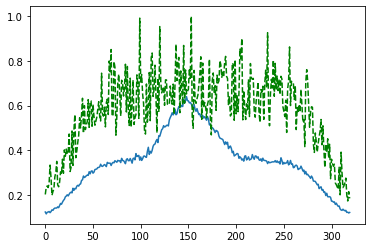

Time taken for epoch:  157.414537191391
Epoch = [234/3000]  Iter = [   0/39480]  Loss = 0.1376 Avg Loss = 0.1376  Time = 0.0656s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [234/3000]  Iter = [ 100/39480]  Loss = 0.1302 Avg Loss = 0.1399  Time = 0.0041s
Epoch = [234/3000]  Iter = [ 200/39480]  Loss = 0.1495 Avg Loss = 0.1404  Time = 0.0037s
Epoch = [234/3000]  Iter = [ 300/39480]  Loss = 0.1396 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [234/3000]  Iter = [ 400/39480]  Loss = 0.1524 Avg Loss = 0.1411  Time = 0.0038s
Epoch = [234/3000]  Iter = [ 500/39480]  Loss = 0.1423 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [234/3000]  Iter = [ 600/39480]  Loss = 0.1231 Avg Loss = 0.1391  Time = 0.0037s
Epoch = [234/3000]  Iter = [ 700/39480]  Loss = 0.1296 Avg Loss = 0.1386  Time = 0.0039s
Epoch = [234/3000]  Iter = [ 800/39480]  Loss = 0.1412 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [234/3000]  Iter = [ 900/39480]  Loss = 0.1376 Avg Loss = 0.1405  Time = 0.0039s
Epoch = [234/3000]  Iter = [1000/39480]  Loss = 0.1254 Avg Loss = 0.1399  Time = 0.0039s
Epoch = [234/3000]  Iter = [1100/39480]  Loss = 0.1256 Avg Loss = 0.1413  Time = 0.0043s
Epoch = [234/3000]  I

Epoch = [234/3000]  Iter = [9400/39480]  Loss = 0.132 Avg Loss = 0.1404  Time = 0.0035s
Epoch = [234/3000]  Iter = [9500/39480]  Loss = 0.1279 Avg Loss = 0.1392  Time = 0.0037s
Epoch = [234/3000]  Iter = [9600/39480]  Loss = 0.1381 Avg Loss = 0.1394  Time = 0.0036s
Epoch = [234/3000]  Iter = [9700/39480]  Loss = 0.1477 Avg Loss = 0.1416  Time = 0.0033s
Epoch = [234/3000]  Iter = [9800/39480]  Loss = 0.1378 Avg Loss = 0.1401  Time = 0.0037s
Epoch = [234/3000]  Iter = [9900/39480]  Loss = 0.1256 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [234/3000]  Iter = [10000/39480]  Loss = 0.1308 Avg Loss = 0.1399  Time = 0.0032s
Epoch = [234/3000]  Iter = [10100/39480]  Loss = 0.1535 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [234/3000]  Iter = [10200/39480]  Loss = 0.1489 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [234/3000]  Iter = [10300/39480]  Loss = 0.1242 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [234/3000]  Iter = [10400/39480]  Loss = 0.1158 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [234/3000

Epoch = [234/3000]  Iter = [18700/39480]  Loss = 0.141 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [234/3000]  Iter = [18800/39480]  Loss = 0.1598 Avg Loss = 0.1405  Time = 0.0037s
Epoch = [234/3000]  Iter = [18900/39480]  Loss = 0.1351 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [234/3000]  Iter = [19000/39480]  Loss = 0.1513 Avg Loss = 0.1398  Time = 0.0034s
Epoch = [234/3000]  Iter = [19100/39480]  Loss = 0.1368 Avg Loss = 0.1407  Time = 0.0032s
Epoch = [234/3000]  Iter = [19200/39480]  Loss = 0.1187 Avg Loss = 0.1405  Time = 0.0035s
Epoch = [234/3000]  Iter = [19300/39480]  Loss = 0.1528 Avg Loss = 0.142  Time = 0.0037s
Epoch = [234/3000]  Iter = [19400/39480]  Loss = 0.1384 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [234/3000]  Iter = [19500/39480]  Loss = 0.1306 Avg Loss = 0.1401  Time = 0.0037s
Epoch = [234/3000]  Iter = [19600/39480]  Loss = 0.1471 Avg Loss = 0.1406  Time = 0.0037s
Epoch = [234/3000]  Iter = [19700/39480]  Loss = 0.158 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [234/

Epoch = [234/3000]  Iter = [27900/39480]  Loss = 0.1378 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [234/3000]  Iter = [28000/39480]  Loss = 0.1217 Avg Loss = 0.141  Time = 0.0036s
Epoch = [234/3000]  Iter = [28100/39480]  Loss = 0.1486 Avg Loss = 0.1404  Time = 0.0035s
Epoch = [234/3000]  Iter = [28200/39480]  Loss = 0.1442 Avg Loss = 0.1429  Time = 0.0037s
Epoch = [234/3000]  Iter = [28300/39480]  Loss = 0.1295 Avg Loss = 0.1429  Time = 0.0036s
Epoch = [234/3000]  Iter = [28400/39480]  Loss = 0.1489 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [234/3000]  Iter = [28500/39480]  Loss = 0.1358 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [234/3000]  Iter = [28600/39480]  Loss = 0.1302 Avg Loss = 0.1404  Time = 0.0036s
Epoch = [234/3000]  Iter = [28700/39480]  Loss = 0.1194 Avg Loss = 0.1409  Time = 0.0032s
Epoch = [234/3000]  Iter = [28800/39480]  Loss = 0.1263 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [234/3000]  Iter = [28900/39480]  Loss = 0.1238 Avg Loss = 0.1412  Time = 0.0033s
Epoch = [23

Epoch = [234/3000]  Iter = [37100/39480]  Loss = 0.1486 Avg Loss = 0.1431  Time = 0.0035s
Epoch = [234/3000]  Iter = [37200/39480]  Loss = 0.127 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [234/3000]  Iter = [37300/39480]  Loss = 0.1371 Avg Loss = 0.1417  Time = 0.0033s
Epoch = [234/3000]  Iter = [37400/39480]  Loss = 0.1401 Avg Loss = 0.142  Time = 0.0037s
Epoch = [234/3000]  Iter = [37500/39480]  Loss = 0.1449 Avg Loss = 0.1427  Time = 0.0034s
Epoch = [234/3000]  Iter = [37600/39480]  Loss = 0.1393 Avg Loss = 0.1421  Time = 0.0035s
Epoch = [234/3000]  Iter = [37700/39480]  Loss = 0.1244 Avg Loss = 0.1421  Time = 0.0037s
Epoch = [234/3000]  Iter = [37800/39480]  Loss = 0.1372 Avg Loss = 0.1415  Time = 0.0037s
Epoch = [234/3000]  Iter = [37900/39480]  Loss = 0.1571 Avg Loss = 0.1425  Time = 0.0037s
Epoch = [234/3000]  Iter = [38000/39480]  Loss = 0.1396 Avg Loss = 0.1419  Time = 0.0037s
Epoch = [234/3000]  Iter = [38100/39480]  Loss = 0.1321 Avg Loss = 0.141  Time = 0.0037s
Epoch = [234/

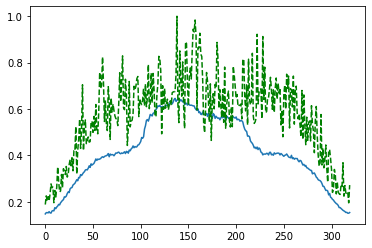

Time taken for epoch:  158.80320167541504
Epoch = [235/3000]  Iter = [   0/39480]  Loss = 0.1276 Avg Loss = 0.1276  Time = 0.0658s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [235/3000]  Iter = [ 100/39480]  Loss = 0.1287 Avg Loss = 0.1365  Time = 0.0034s
Epoch = [235/3000]  Iter = [ 200/39480]  Loss = 0.1318 Avg Loss = 0.1389  Time = 0.0036s
Epoch = [235/3000]  Iter = [ 300/39480]  Loss = 0.1253 Avg Loss = 0.1393  Time = 0.0034s
Epoch = [235/3000]  Iter = [ 400/39480]  Loss = 0.1227 Avg Loss = 0.1398  Time = 0.0036s
Epoch = [235/3000]  Iter = [ 500/39480]  Loss = 0.1323 Avg Loss = 0.1394  Time = 0.0036s
Epoch = [235/3000]  Iter = [ 600/39480]  Loss = 0.132 Avg Loss = 0.1393  Time = 0.0033s
Epoch = [235/3000]  Iter = [ 700/39480]  Loss = 0.1192 Avg Loss = 0.1387  Time = 0.0035s
Epoch = [235/3000]  Iter = [ 800/39480]  Loss = 0.1415 Avg Loss = 0.1391  Time = 0.0035s
Epoch = [235/3000]  Iter = [ 900/39480]  Loss = 0.1274 Avg Loss = 0.1389  Time = 0.0031s
Epoch = [235/3000]  Iter = [1000/39480]  Loss = 0.1333 Avg Loss = 0.1382  Time = 0.0030s
Epoch = [235/3000]  Iter = [1100/39480]  Loss = 0.1778 Avg Loss = 0.1403  Time = 0.0030s
Epoch = [235/3000]  It

Epoch = [235/3000]  Iter = [9400/39480]  Loss = 0.1507 Avg Loss = 0.141  Time = 0.0035s
Epoch = [235/3000]  Iter = [9500/39480]  Loss = 0.1354 Avg Loss = 0.1386  Time = 0.0036s
Epoch = [235/3000]  Iter = [9600/39480]  Loss = 0.1168 Avg Loss = 0.1395  Time = 0.0035s
Epoch = [235/3000]  Iter = [9700/39480]  Loss = 0.1401 Avg Loss = 0.1395  Time = 0.0033s
Epoch = [235/3000]  Iter = [9800/39480]  Loss = 0.1518 Avg Loss = 0.1397  Time = 0.0036s
Epoch = [235/3000]  Iter = [9900/39480]  Loss = 0.1484 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [235/3000]  Iter = [10000/39480]  Loss = 0.1447 Avg Loss = 0.1405  Time = 0.0034s
Epoch = [235/3000]  Iter = [10100/39480]  Loss = 0.1449 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [235/3000]  Iter = [10200/39480]  Loss = 0.1477 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [235/3000]  Iter = [10300/39480]  Loss = 0.1335 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [235/3000]  Iter = [10400/39480]  Loss = 0.1394 Avg Loss = 0.1407  Time = 0.0037s
Epoch = [235/3000

Epoch = [235/3000]  Iter = [18600/39480]  Loss = 0.1471 Avg Loss = 0.1406  Time = 0.0034s
Epoch = [235/3000]  Iter = [18700/39480]  Loss = 0.1776 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [235/3000]  Iter = [18800/39480]  Loss = 0.1581 Avg Loss = 0.1415  Time = 0.0037s
Epoch = [235/3000]  Iter = [18900/39480]  Loss = 0.1418 Avg Loss = 0.1407  Time = 0.0038s
Epoch = [235/3000]  Iter = [19000/39480]  Loss = 0.1322 Avg Loss = 0.1402  Time = 0.0037s
Epoch = [235/3000]  Iter = [19100/39480]  Loss = 0.1381 Avg Loss = 0.1393  Time = 0.0034s
Epoch = [235/3000]  Iter = [19200/39480]  Loss = 0.1342 Avg Loss = 0.1403  Time = 0.0037s
Epoch = [235/3000]  Iter = [19300/39480]  Loss = 0.1465 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [235/3000]  Iter = [19400/39480]  Loss = 0.142 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [235/3000]  Iter = [19500/39480]  Loss = 0.1168 Avg Loss = 0.141  Time = 0.0037s
Epoch = [235/3000]  Iter = [19600/39480]  Loss = 0.1506 Avg Loss = 0.1422  Time = 0.0036s
Epoch = [235

Epoch = [235/3000]  Iter = [27800/39480]  Loss = 0.1613 Avg Loss = 0.1423  Time = 0.0036s
Epoch = [235/3000]  Iter = [27900/39480]  Loss = 0.1613 Avg Loss = 0.1415  Time = 0.0035s
Epoch = [235/3000]  Iter = [28000/39480]  Loss = 0.148 Avg Loss = 0.1404  Time = 0.0033s
Epoch = [235/3000]  Iter = [28100/39480]  Loss = 0.1364 Avg Loss = 0.1411  Time = 0.0037s
Epoch = [235/3000]  Iter = [28200/39480]  Loss = 0.1407 Avg Loss = 0.1415  Time = 0.0039s
Epoch = [235/3000]  Iter = [28300/39480]  Loss = 0.1443 Avg Loss = 0.1416  Time = 0.0033s
Epoch = [235/3000]  Iter = [28400/39480]  Loss = 0.126 Avg Loss = 0.1417  Time = 0.0030s
Epoch = [235/3000]  Iter = [28500/39480]  Loss = 0.1818 Avg Loss = 0.1427  Time = 0.0039s
Epoch = [235/3000]  Iter = [28600/39480]  Loss = 0.1507 Avg Loss = 0.1409  Time = 0.0039s
Epoch = [235/3000]  Iter = [28700/39480]  Loss = 0.1398 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [235/3000]  Iter = [28800/39480]  Loss = 0.1369 Avg Loss = 0.1432  Time = 0.0041s
Epoch = [235

Epoch = [235/3000]  Iter = [37000/39480]  Loss = 0.1426 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [235/3000]  Iter = [37100/39480]  Loss = 0.1246 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [235/3000]  Iter = [37200/39480]  Loss = 0.1622 Avg Loss = 0.1428  Time = 0.0035s
Epoch = [235/3000]  Iter = [37300/39480]  Loss = 0.1439 Avg Loss = 0.1428  Time = 0.0035s
Epoch = [235/3000]  Iter = [37400/39480]  Loss = 0.136 Avg Loss = 0.1423  Time = 0.0034s
Epoch = [235/3000]  Iter = [37500/39480]  Loss = 0.1269 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [235/3000]  Iter = [37600/39480]  Loss = 0.1427 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [235/3000]  Iter = [37700/39480]  Loss = 0.1566 Avg Loss = 0.1426  Time = 0.0036s
Epoch = [235/3000]  Iter = [37800/39480]  Loss = 0.1453 Avg Loss = 0.142  Time = 0.0035s
Epoch = [235/3000]  Iter = [37900/39480]  Loss = 0.1669 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [235/3000]  Iter = [38000/39480]  Loss = 0.1561 Avg Loss = 0.1412  Time = 0.0036s
Epoch = [235

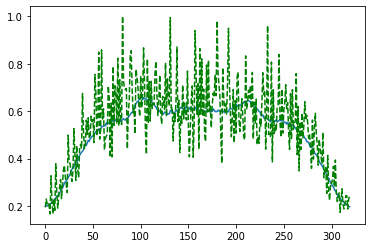

Time taken for epoch:  156.11553287506104
Epoch = [236/3000]  Iter = [   0/39480]  Loss = 0.1429 Avg Loss = 0.1429  Time = 0.0736s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [236/3000]  Iter = [ 100/39480]  Loss = 0.142 Avg Loss = 0.1415  Time = 0.0031s
Epoch = [236/3000]  Iter = [ 200/39480]  Loss = 0.1293 Avg Loss = 0.1409  Time = 0.0034s
Epoch = [236/3000]  Iter = [ 300/39480]  Loss = 0.154 Avg Loss = 0.1401  Time = 0.0036s
Epoch = [236/3000]  Iter = [ 400/39480]  Loss = 0.1308 Avg Loss = 0.1416  Time = 0.0034s
Epoch = [236/3000]  Iter = [ 500/39480]  Loss = 0.1317 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [236/3000]  Iter = [ 600/39480]  Loss = 0.1374 Avg Loss = 0.1399  Time = 0.0036s
Epoch = [236/3000]  Iter = [ 700/39480]  Loss = 0.143 Avg Loss = 0.1392  Time = 0.0031s
Epoch = [236/3000]  Iter = [ 800/39480]  Loss = 0.1348 Avg Loss = 0.139  Time = 0.0031s
Epoch = [236/3000]  Iter = [ 900/39480]  Loss = 0.1287 Avg Loss = 0.1388  Time = 0.0031s
Epoch = [236/3000]  Iter = [1000/39480]  Loss = 0.1371 Avg Loss = 0.1399  Time = 0.0033s
Epoch = [236/3000]  Iter = [1100/39480]  Loss = 0.1496 Avg Loss = 0.1402  Time = 0.0031s
Epoch = [236/3000]  Iter 

Epoch = [236/3000]  Iter = [9400/39480]  Loss = 0.162 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [236/3000]  Iter = [9500/39480]  Loss = 0.1371 Avg Loss = 0.1396  Time = 0.0036s
Epoch = [236/3000]  Iter = [9600/39480]  Loss = 0.1181 Avg Loss = 0.1399  Time = 0.0037s
Epoch = [236/3000]  Iter = [9700/39480]  Loss = 0.1501 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [236/3000]  Iter = [9800/39480]  Loss = 0.1297 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [236/3000]  Iter = [9900/39480]  Loss = 0.152 Avg Loss = 0.1421  Time = 0.0037s
Epoch = [236/3000]  Iter = [10000/39480]  Loss = 0.1758 Avg Loss = 0.1411  Time = 0.0036s
Epoch = [236/3000]  Iter = [10100/39480]  Loss = 0.1533 Avg Loss = 0.14  Time = 0.0037s
Epoch = [236/3000]  Iter = [10200/39480]  Loss = 0.147 Avg Loss = 0.1422  Time = 0.0034s
Epoch = [236/3000]  Iter = [10300/39480]  Loss = 0.1512 Avg Loss = 0.1417  Time = 0.0037s
Epoch = [236/3000]  Iter = [10400/39480]  Loss = 0.1345 Avg Loss = 0.1393  Time = 0.0035s
Epoch = [236/3000]  I

Epoch = [236/3000]  Iter = [18600/39480]  Loss = 0.1721 Avg Loss = 0.1406  Time = 0.0033s
Epoch = [236/3000]  Iter = [18700/39480]  Loss = 0.1457 Avg Loss = 0.1408  Time = 0.0035s
Epoch = [236/3000]  Iter = [18800/39480]  Loss = 0.1673 Avg Loss = 0.141  Time = 0.0032s
Epoch = [236/3000]  Iter = [18900/39480]  Loss = 0.1369 Avg Loss = 0.1405  Time = 0.0035s
Epoch = [236/3000]  Iter = [19000/39480]  Loss = 0.1291 Avg Loss = 0.1418  Time = 0.0032s
Epoch = [236/3000]  Iter = [19100/39480]  Loss = 0.135 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [236/3000]  Iter = [19200/39480]  Loss = 0.1675 Avg Loss = 0.1416  Time = 0.0035s
Epoch = [236/3000]  Iter = [19300/39480]  Loss = 0.1433 Avg Loss = 0.142  Time = 0.0036s
Epoch = [236/3000]  Iter = [19400/39480]  Loss = 0.1199 Avg Loss = 0.142  Time = 0.0036s
Epoch = [236/3000]  Iter = [19500/39480]  Loss = 0.1331 Avg Loss = 0.1409  Time = 0.0036s
Epoch = [236/3000]  Iter = [19600/39480]  Loss = 0.1467 Avg Loss = 0.1415  Time = 0.0039s
Epoch = [236/3

Epoch = [236/3000]  Iter = [27800/39480]  Loss = 0.1541 Avg Loss = 0.1416  Time = 0.0032s
Epoch = [236/3000]  Iter = [27900/39480]  Loss = 0.1374 Avg Loss = 0.1413  Time = 0.0035s
Epoch = [236/3000]  Iter = [28000/39480]  Loss = 0.1489 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [236/3000]  Iter = [28100/39480]  Loss = 0.1287 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [236/3000]  Iter = [28200/39480]  Loss = 0.1464 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [236/3000]  Iter = [28300/39480]  Loss = 0.1373 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [236/3000]  Iter = [28400/39480]  Loss = 0.1683 Avg Loss = 0.1406  Time = 0.0035s
Epoch = [236/3000]  Iter = [28500/39480]  Loss = 0.1503 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [236/3000]  Iter = [28600/39480]  Loss = 0.1638 Avg Loss = 0.1422  Time = 0.0032s
Epoch = [236/3000]  Iter = [28700/39480]  Loss = 0.1349 Avg Loss = 0.1417  Time = 0.0036s
Epoch = [236/3000]  Iter = [28800/39480]  Loss = 0.1348 Avg Loss = 0.1419  Time = 0.0036s
Epoch = [2

Epoch = [236/3000]  Iter = [37000/39480]  Loss = 0.1319 Avg Loss = 0.1435  Time = 0.0033s
Epoch = [236/3000]  Iter = [37100/39480]  Loss = 0.136 Avg Loss = 0.1419  Time = 0.0032s
Epoch = [236/3000]  Iter = [37200/39480]  Loss = 0.1352 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [236/3000]  Iter = [37300/39480]  Loss = 0.1517 Avg Loss = 0.1418  Time = 0.0035s
Epoch = [236/3000]  Iter = [37400/39480]  Loss = 0.1506 Avg Loss = 0.1424  Time = 0.0036s
Epoch = [236/3000]  Iter = [37500/39480]  Loss = 0.1444 Avg Loss = 0.1418  Time = 0.0037s
Epoch = [236/3000]  Iter = [37600/39480]  Loss = 0.131 Avg Loss = 0.1417  Time = 0.0035s
Epoch = [236/3000]  Iter = [37700/39480]  Loss = 0.1555 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [236/3000]  Iter = [37800/39480]  Loss = 0.1454 Avg Loss = 0.1418  Time = 0.0036s
Epoch = [236/3000]  Iter = [37900/39480]  Loss = 0.1539 Avg Loss = 0.1416  Time = 0.0036s
Epoch = [236/3000]  Iter = [38000/39480]  Loss = 0.1772 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [236

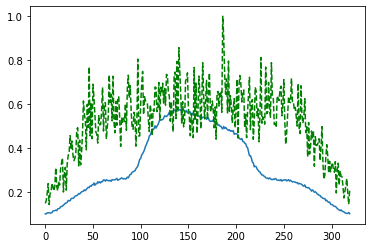

Time taken for epoch:  156.30090284347534
Epoch = [237/3000]  Iter = [   0/39480]  Loss = 0.1243 Avg Loss = 0.1243  Time = 0.0654s


/opt/conda/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch = [237/3000]  Iter = [ 100/39480]  Loss = 0.1524 Avg Loss = 0.1335  Time = 0.0036s
Epoch = [237/3000]  Iter = [ 200/39480]  Loss = 0.1242 Avg Loss = 0.1378  Time = 0.0038s
Epoch = [237/3000]  Iter = [ 300/39480]  Loss = 0.1386 Avg Loss = 0.1384  Time = 0.0037s
Epoch = [237/3000]  Iter = [ 400/39480]  Loss = 0.148 Avg Loss = 0.1403  Time = 0.0037s
Epoch = [237/3000]  Iter = [ 500/39480]  Loss = 0.1389 Avg Loss = 0.1403  Time = 0.0035s
Epoch = [237/3000]  Iter = [ 600/39480]  Loss = 0.1548 Avg Loss = 0.1405  Time = 0.0033s
Epoch = [237/3000]  Iter = [ 700/39480]  Loss = 0.1432 Avg Loss = 0.1407  Time = 0.0036s
Epoch = [237/3000]  Iter = [ 800/39480]  Loss = 0.1495 Avg Loss = 0.1414  Time = 0.0036s
Epoch = [237/3000]  Iter = [ 900/39480]  Loss = 0.1398 Avg Loss = 0.1432  Time = 0.0037s
Epoch = [237/3000]  Iter = [1000/39480]  Loss = 0.1455 Avg Loss = 0.1418  Time = 0.0033s
Epoch = [237/3000]  Iter = [1100/39480]  Loss = 0.1291 Avg Loss = 0.1413  Time = 0.0036s
Epoch = [237/3000]  It

Epoch = [237/3000]  Iter = [9400/39480]  Loss = 0.1547 Avg Loss = 0.141  Time = 0.0035s
Epoch = [237/3000]  Iter = [9500/39480]  Loss = 0.1492 Avg Loss = 0.1411  Time = 0.0035s
Epoch = [237/3000]  Iter = [9600/39480]  Loss = 0.1393 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [237/3000]  Iter = [9700/39480]  Loss = 0.1628 Avg Loss = 0.1408  Time = 0.0036s
Epoch = [237/3000]  Iter = [9800/39480]  Loss = 0.1247 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [237/3000]  Iter = [9900/39480]  Loss = 0.1434 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [237/3000]  Iter = [10000/39480]  Loss = 0.1521 Avg Loss = 0.1405  Time = 0.0036s
Epoch = [237/3000]  Iter = [10100/39480]  Loss = 0.136 Avg Loss = 0.141  Time = 0.0037s
Epoch = [237/3000]  Iter = [10200/39480]  Loss = 0.1415 Avg Loss = 0.1409  Time = 0.0033s
Epoch = [237/3000]  Iter = [10300/39480]  Loss = 0.1499 Avg Loss = 0.1411  Time = 0.0035s
Epoch = [237/3000]  Iter = [10400/39480]  Loss = 0.174 Avg Loss = 0.1403  Time = 0.0036s
Epoch = [237/3000]  

Epoch = [237/3000]  Iter = [18600/39480]  Loss = 0.1443 Avg Loss = 0.1415  Time = 0.0036s
Epoch = [237/3000]  Iter = [18700/39480]  Loss = 0.1179 Avg Loss = 0.1411  Time = 0.0035s
Epoch = [237/3000]  Iter = [18800/39480]  Loss = 0.1402 Avg Loss = 0.1423  Time = 0.0052s
Epoch = [237/3000]  Iter = [18900/39480]  Loss = 0.1418 Avg Loss = 0.1428  Time = 0.0034s
Epoch = [237/3000]  Iter = [19000/39480]  Loss = 0.1364 Avg Loss = 0.1421  Time = 0.0034s
Epoch = [237/3000]  Iter = [19100/39480]  Loss = 0.1611 Avg Loss = 0.1418  Time = 0.0035s
Epoch = [237/3000]  Iter = [19200/39480]  Loss = 0.1408 Avg Loss = 0.1414  Time = 0.0037s
Epoch = [237/3000]  Iter = [19300/39480]  Loss = 0.1429 Avg Loss = 0.1412  Time = 0.0037s
Epoch = [237/3000]  Iter = [19400/39480]  Loss = 0.1297 Avg Loss = 0.1406  Time = 0.0036s
Epoch = [237/3000]  Iter = [19500/39480]  Loss = 0.1368 Avg Loss = 0.1408  Time = 0.0037s
Epoch = [237/3000]  Iter = [19600/39480]  Loss = 0.1545 Avg Loss = 0.1421  Time = 0.0036s
Epoch = [2

In [ ]:
def train(args): 
    args.exp_dir.mkdir(parents=True, exist_ok=True)
    writer = SummaryWriter(logdir=str(args.logdir)) #log directory for run

    if args.resume: #be aware of the option
        checkpoint, model, optimizer = load_model(args.checkpoint,args)
        args = checkpoint['args']
        best_dev_loss = checkpoint['best_dev_loss']
        start_epoch = checkpoint['epoch']
        #start_epoch = 0
        del checkpoint
    else:
        model = build_model(args)
        optimizer = build_optim(args, model.parameters())
        best_dev_loss = 1e9
        start_epoch = 0
    logging.info(args)
    logging.info(model)

    #train_loader,dev_loader,test_loader = create_data_loaders()
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, args.lr_step_size, args.lr_gamma)
    optimizer.step()

    for epoch in range(start_epoch, args.num_epochs):
        ti=time.time()
        scheduler.step(epoch)
        train_loss, train_time = train_epoch(args, epoch, model, train_loader, optimizer, writer)
        dev_loss, dev_time = evaluate(args, epoch, model, dev_loader, writer)
        #visualize(args, epoch, model, train_loader, writer)

        is_new_best = dev_loss < best_dev_loss
        best_dev_loss = min(best_dev_loss, dev_loss)
        save_model(args, args.exp_dir, epoch, model, optimizer, best_dev_loss, is_new_best)
        print(f'Epoch = [{epoch:4d}/{args.num_epochs:4d}] TrainLoss = {train_loss:.4g} ',
        f'DevLoss = {dev_loss:.4g} TrainTime = {train_time:.4f}s DevTime = {dev_time:.4f}s')
        
        for iter, data in enumerate(train_loader):
            f, t = data
            input = f.unsqueeze(1).to(f'{args.device}:{model.device_ids[0]}')
            target = t.to(f'{args.device}:{model.device_ids[0]}')
            output = model(input).squeeze(1)
            image=output.to('cpu').squeeze(1).detach().numpy()
            plt.plot(range(t[0].shape[0]),image[0].flatten())
            plt.plot(range(t[0].shape[0]),t[0],color="green",linestyle="dashed")
            plt.show()
            break;
        
        logging.info(
            f'Epoch = [{epoch:4d}/{args.num_epochs:4d}] TrainLoss = {train_loss:.4g} '
            f'DevLoss = {dev_loss:.4g} TrainTime = {train_time:.4f}s DevTime = {dev_time:.4f}s',
        )
        print("Time taken for epoch: ",time.time()-ti)
    writer.close()
    
train(args)